In [85]:
import warnings
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

train = pd.read_csv('train_fill_na.csv')
test = pd.read_csv('test_fill_na.csv')
labels = pd.read_csv('labels.csv')

In [2]:
train.shape, test.shape, labels.shape

((245725, 9), (105312, 9), (245725, 1))

In [86]:
df = pd.concat([train, test], axis=0)

### quick check of labels

In [4]:
temp = pd.read_csv('train_s3TEQDk.csv')

for i in range(temp.shape[0]):
    if temp.iloc[i, -1] != labels.iloc[i,0]:
        print(i)

### check passed ∞

In [5]:
# df['Age'].skew()

# df['Vintage'].skew()

# df['Avg_Account_Balance'].skew()

# np.log(df['Avg_Account_Balance']).skew()

# np.log(df['Vintage']).skew()

# np.log(df['Age']).skew()

In [87]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

df['Avg_Account_Balance_Unskewed'] = np.log1p(df['Avg_Account_Balance'])

df['Age_scaled'] = sc.fit_transform(df[['Age']]).reshape(1,-1)[0]

df['Vintage_scaled'] = sc.fit_transform(df[['Vintage']]).reshape(1,-1)[0]

df_dum = pd.concat([df, pd.get_dummies(df[['Gender','Region_Code','Occupation','Channel_Code','Is_Active','Credit_Product']], drop_first=True)], axis=1)


df_dum.drop(['Gender','Region_Code','Occupation','Channel_Code','Is_Active','Credit_Product'], axis=1, inplace=True)

original = ['Age','Vintage','Avg_Account_Balance']
fe = ['Age_scaled', 'Vintage_scaled', 'Avg_Account_Balance_Unskewed']

In [7]:
df.shape, train.shape, test.shape

((351037, 12), (245725, 9), (105312, 9))

In [8]:
labels.shape

(245725, 1)

In [88]:
x = pd.concat([train, labels], axis=1)

In [10]:
x

,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Avg_Account_Balance,Is_Active,Credit_Product,Is_Lead
0,Female,73,RG268,Other,X3,43,1045696,No,No,0
1,Female,30,RG277,Salaried,X1,32,581988,No,No,0
2,Female,56,RG268,Self_Employed,X3,26,1484315,Yes,No,0
3,Male,34,RG270,Salaried,X1,19,470454,No,No,0
4,Female,30,RG282,Salaried,X1,33,886787,No,No,0
...,...,...,...,...,...,...,...,...,...,...
245720,Male,51,RG284,Self_Employed,X3,109,1925586,No,Yes,0
245721,Male,27,RG268,Salaried,X1,15,862952,Yes,No,0
245722,Female,26,RG281,Salaried,X1,13,670659,No,No,0
245723,Female,28,RG273,Salaried,X1,31,407504,No,No,0


In [11]:
x.isna().sum().sum()

0

In [32]:
x['Credit_Product'] = x['Credit_Product'].map({'No':0, 'Yes':1})
x['Is_Active'] = x['Is_Active'].map({'No':0, 'Yes':1})


In [13]:
x.groupby('Channel_Code').agg(['count','mean'])

Age            Vintage            Avg_Account_Balance  \
               count       mean   count       mean               count   
Channel_Code                                                             
X1            103718  32.324707  103718  25.311576              103718   
X2             67726  50.422880   67726  54.560804               67726   
X3             68712  54.717429   68712  74.939443               68712   
X4              5569  44.757228    5569  12.451966                5569   

                           Is_Active           Credit_Product            \
                      mean     count      mean          count      mean   
Channel_Code                                                              
X1            1.030418e+06    103718  0.221794         103718  0.202067   
X2            1.142457e+06     67726  0.514411          67726  0.430809   
X3            1.274756e+06     68712  0.509285          68712  0.485752   
X4            9.766356e+05      5569  0.466511           5569  0.547675   

             Is_Lead            
               count      mean  
Channel_Code                    
X1            103718  0.091421  
X2             67726  0.327895  
X3             68712  0.367025  
X4              5569  0.247800

In [34]:
region_dict = {}
ctr = 0
for item in x.groupby('Region_Code').mean()['Is_Lead']:
#    print(x.groupby('Region_Code').mean()['Is_Lead'].index[ctr], item)
#    ctr+=1
    region_dict[x.groupby('Region_Code').mean()['Is_Lead'].index[ctr]] = item
    ctr += 1

In [98]:
x.groupby('Occupation').agg(['count','mean'])

Age            Vintage            Avg_Account_Balance  \
                count       mean   count       mean               count   
Occupation                                                                
Entrepreneur     2667  47.833521    2667  69.664792                2667   
Other           70173  53.116797   70173  54.924729               70173   
Salaried        71999  30.882901   71999  26.348838               71999   
Self_Employed  100886  46.568563  100886  55.527189              100886   

                            Is_Active           Credit_Product            \
                       mean     count      mean          count      mean   
Occupation                                                                 
Entrepreneur   1.415043e+06      2667  0.436070           2667  0.999250   
Other          1.209870e+06     70173  0.410058          70173  0.367663   
Salaried       1.033420e+06     71999  0.231184          71999  0.254392   
Self_Employed  1.131946e+06    100886  0.484230         100886  0.394316   

              Is_Lead            
                count      mean  
Occupation                       
Entrepreneur     2667  0.660667  
Other           70173  0.244952  
Salaried        71999  0.159669  
Self_Employed  100886  0.275965

In [33]:
occupation_dict = {}
ctr = 0
for item in x.groupby('Occupation').mean()['Is_Lead']:
#    print(x.groupby('Region_Code').mean()['Is_Lead'].index[ctr], item)
#    ctr+=1
    occupation_dict[x.groupby('Occupation').mean()['Is_Lead'].index[ctr]] = item
    ctr += 1

In [17]:
occupation_dict

{'Entrepreneur': 0.6606674165729284,
 'Other': 0.24495176207373207,
 'Salaried': 0.15966888429005957,
 'Self_Employed': 0.2759649505382313}

In [35]:
channel_dict = {}
ctr = 0
for item in x.groupby('Channel_Code').mean()['Is_Lead']:
#    print(x.groupby('Region_Code').mean()['Is_Lead'].index[ctr], item)
#    ctr+=1
    channel_dict[x.groupby('Channel_Code').mean()['Is_Lead'].index[ctr]] = item
    ctr += 1

In [19]:
channel_dict

{'X1': 0.09142096839507124,
 'X2': 0.3278947523846086,
 'X3': 0.3670246827337292,
 'X4': 0.2478003232178129}

In [36]:
credit_dict = {}
ctr = 0
for item in x.groupby('Credit_Product').mean()['Is_Lead']:
#    print(x.groupby('Region_Code').mean()['Is_Lead'].index[ctr], item)
#    ctr+=1
    credit_dict[x.groupby('Credit_Product').mean()['Is_Lead'].index[ctr]] = item
    ctr += 1

In [21]:
credit_dict

{0: 0.14488291876880932, 1: 0.4069684157020402}

In [104]:
x.groupby('Credit_Product').mean()

,Age,Vintage,Avg_Account_Balance,Is_Active,Is_Lead
Credit_Product,,,,,
0,41.758832,42.775080,1.082598e+06,0.440580,0.144883
1,47.712969,54.652446,1.212625e+06,0.292403,0.406968


In [37]:
active_dict = {}
ctr = 0
for item in x.groupby('Is_Active').mean()['Is_Lead']:
#    print(x.groupby('Region_Code').mean()['Is_Lead'].index[ctr], item)
#    ctr+=1
    active_dict[x.groupby('Is_Active').mean()['Is_Lead'].index[ctr]] = item
    ctr += 1

In [23]:
active_dict

{0: 0.2081509082440615, 1: 0.28296746476659507}

In [26]:
x.groupby('Is_Active').mean()

,Age,Vintage,Avg_Account_Balance,Credit_Product,Is_Lead
Is_Active,,,,,
0,41.271209,41.561674,1.076315e+06,0.407552,0.208151
1,47.927291,55.459014,1.210431e+06,0.265217,0.282967


In [107]:
x.groupby('Is_Lead').mean()

,Age,Vintage,Avg_Account_Balance,Is_Active,Credit_Product
Is_Lead,,,,,
0,41.947662,41.913923,1.103018e+06,0.365083,0.273873
1,49.993944,63.183074,1.210034e+06,0.463303,0.604378


In [89]:
df['Credit_Product'] = df['Credit_Product'].map({'No':0, 'Yes':1})
df['Is_Active'] = df['Is_Active'].map({'No':0, 'Yes':1})


df['Region_Quality'] = df['Region_Code'].map(region_dict)
df['Occupation_Quality'] = df['Occupation'].map(occupation_dict)
df['Channel_Quality'] = df['Channel_Code'].map(channel_dict)
df['Credit_Quality'] = df['Credit_Product'].map(credit_dict)
df['Is_Active_Quality'] = df['Is_Active'].map(active_dict)

In [39]:
df

,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Avg_Account_Balance,Is_Active,Credit_Product,Avg_Account_Balance_Unskewed,Age_scaled,Vintage_scaled,Region_Quality,Occupation_Quality,Channel_Quality,Credit_Quality
0,Female,73,RG268,Other,X3,43,1045696,0.208151,0,13.860194,1.963311,-0.121384,0.299800,0.244952,0.367025,0.144883
1,Female,30,RG277,Salaried,X1,32,581988,0.208151,0,13.274207,-0.933890,-0.461633,0.231951,0.159669,0.091421,0.144883
2,Female,56,RG268,Self_Employed,X3,26,1484315,0.282967,0,14.210465,0.817906,-0.647223,0.299800,0.275965,0.367025,0.144883
3,Male,34,RG270,Salaried,X1,19,470454,0.208151,0,13.061456,-0.664383,-0.863745,0.144301,0.159669,0.091421,0.144883
4,Female,30,RG282,Salaried,X1,33,886787,0.208151,0,13.695361,-0.933890,-0.430701,0.192143,0.159669,0.091421,0.144883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105307,Male,52,RG268,Salaried,X2,86,4242558,0.282967,1,15.260677,0.548399,1.208681,0.299800,0.159669,0.327895,0.406968
105308,Male,55,RG277,Other,X2,86,1159153,0.208151,1,13.963201,0.750529,1.208681,0.231951,0.244952,0.327895,0.406968
105309,Male,35,RG254,Salaried,X4,15,1703727,0.208151,0,14.348329,-0.597006,-0.987472,0.212854,0.159669,0.247800,0.144883
105310,Male,53,RG254,Other,X3,93,737178,0.282967,0,13.510586,0.615775,1.425203,0.212854,0.244952,0.367025,0.144883


In [41]:
df.isna().sum().sum()

0

In [90]:


df_dum = pd.concat([df, pd.get_dummies(df[['Gender','Region_Code','Occupation','Channel_Code','Is_Active','Credit_Product',
                                          ]], drop_first=True)], axis=1)


df_dum.drop(['Gender','Region_Code','Occupation','Channel_Code','Is_Active','Credit_Product'], axis=1, inplace=True)

In [47]:
df.dtypes

Gender                           object
Age                               int64
Region_Code                      object
Occupation                       object
Channel_Code                     object
Vintage                           int64
Avg_Account_Balance               int64
Is_Active                       float64
Credit_Product                    int64
Avg_Account_Balance_Unskewed    float64
Age_scaled                      float64
Vintage_scaled                  float64
Region_Quality                  float64
Occupation_Quality              float64
Channel_Quality                 float64
Credit_Quality                  float64
dtype: object

In [48]:
df_dum.dtypes

Age                               int64
Vintage                           int64
Avg_Account_Balance               int64
Avg_Account_Balance_Unskewed    float64
Age_scaled                      float64
Vintage_scaled                  float64
Region_Quality                  float64
Occupation_Quality              float64
Channel_Quality                 float64
Credit_Quality                  float64
Gender_Male                       uint8
Region_Code_RG251                 uint8
Region_Code_RG252                 uint8
Region_Code_RG253                 uint8
Region_Code_RG254                 uint8
Region_Code_RG255                 uint8
Region_Code_RG256                 uint8
Region_Code_RG257                 uint8
Region_Code_RG258                 uint8
Region_Code_RG259                 uint8
Region_Code_RG260                 uint8
Region_Code_RG261                 uint8
Region_Code_RG262                 uint8
Region_Code_RG263                 uint8
Region_Code_RG264                 uint8


In [59]:
df.columns

Index(['Gender', 'Age', 'Region_Code', 'Occupation', 'Channel_Code', 'Vintage',
       'Avg_Account_Balance', 'Is_Active', 'Credit_Product',
       'Avg_Account_Balance_Unskewed', 'Age_scaled', 'Vintage_scaled',
       'Region_Quality', 'Occupation_Quality', 'Channel_Quality',
       'Credit_Quality'],
      dtype='object')

In [60]:
df.dtypes

Gender                           object
Age                               int64
Region_Code                      object
Occupation                       object
Channel_Code                     object
Vintage                           int64
Avg_Account_Balance               int64
Is_Active                       float64
Credit_Product                    int64
Avg_Account_Balance_Unskewed    float64
Age_scaled                      float64
Vintage_scaled                  float64
Region_Quality                  float64
Occupation_Quality              float64
Channel_Quality                 float64
Credit_Quality                  float64
dtype: object

In [91]:
df_numerical = df.select_dtypes(['int64', 'float'])

In [92]:
df_numerical

,Age,Vintage,Avg_Account_Balance,Is_Active,Credit_Product,Avg_Account_Balance_Unskewed,Age_scaled,Vintage_scaled,Region_Quality,Occupation_Quality,Channel_Quality,Credit_Quality,Is_Active_Quality
0,73,43,1045696,0,0,13.860194,1.963311,-0.121384,0.299800,0.244952,0.367025,0.144883,0.208151
1,30,32,581988,0,0,13.274207,-0.933890,-0.461633,0.231951,0.159669,0.091421,0.144883,0.208151
2,56,26,1484315,1,0,14.210465,0.817906,-0.647223,0.299800,0.275965,0.367025,0.144883,0.282967
3,34,19,470454,0,0,13.061456,-0.664383,-0.863745,0.144301,0.159669,0.091421,0.144883,0.208151
4,30,33,886787,0,0,13.695361,-0.933890,-0.430701,0.192143,0.159669,0.091421,0.144883,0.208151
...,...,...,...,...,...,...,...,...,...,...,...,...,...
105307,52,86,4242558,1,1,15.260677,0.548399,1.208681,0.299800,0.159669,0.327895,0.406968,0.282967
105308,55,86,1159153,0,1,13.963201,0.750529,1.208681,0.231951,0.244952,0.327895,0.406968,0.208151
105309,35,15,1703727,0,0,14.348329,-0.597006,-0.987472,0.212854,0.159669,0.247800,0.144883,0.208151
105310,53,93,737178,1,0,13.510586,0.615775,1.425203,0.212854,0.244952,0.367025,0.144883,0.282967


In [93]:
df_num_scaled = df_numerical.drop(['Age','Vintage'], axis=1)
df_num_unscaled = df_numerical.drop(['Age_scaled','Vintage_scaled'], axis=1)

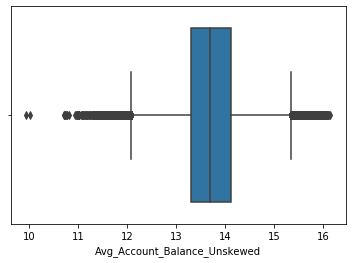

In [94]:
sns.boxplot(x='Avg_Account_Balance_Unskewed', data=df_numerical, )

In [96]:
df_numerical[df_numerical['Avg_Account_Balance']>10000000].groupby('Is_Active').mean()

,Age,Vintage,Avg_Account_Balance,Credit_Product,Avg_Account_Balance_Unskewed,Age_scaled,Vintage_scaled,Region_Quality,Occupation_Quality,Channel_Quality,Credit_Quality,Is_Active_Quality
Is_Active,,,,,,,,,,,,
0,44,67,10007678,1,16.118863,0.009385,0.620978,0.302047,0.660667,0.091421,0.406968,0.208151
1,65,109,10352009,1,16.152691,1.424297,1.920111,0.299800,0.244952,0.367025,0.406968,0.282967


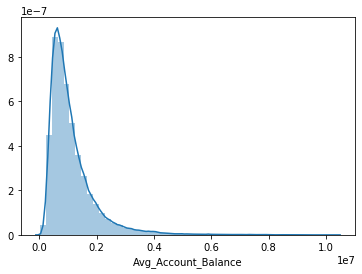

In [101]:
sns.distplot(df_numerical['Avg_Account_Balance'])

In [140]:
df_numerical[df_numerical['Avg_Account_Balance'] < 500000].shape[0]/df_numerical.shape[0]

0.15484122756290647

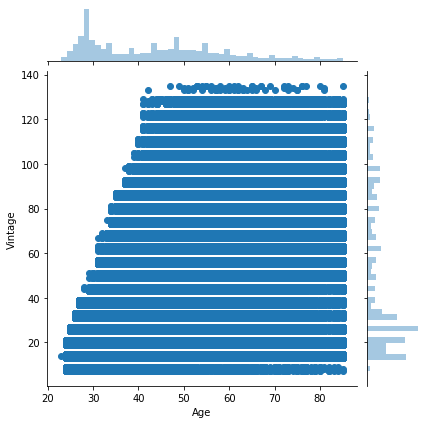

In [108]:
sns.jointplot(x='Age', y='Vintage', data=df_numerical)

In [120]:
df_numerical[df_numerical['Age'] < 25].shape[0]/df_numerical.shape[0]

0.007640220261681817

In [130]:
df_numerical[df_numerical['Vintage'] < 10].shape[0]/df_numerical.shape[0]

0.007816839820303843

### Outliers


In [159]:
((df_numerical.loc[5, 'Avg_Account_Balance'])>300000).values

array([ True,  True])

In [160]:
l = []
for i in range(df_numerical.shape[0]):
    if ((df_numerical.loc[i, 'Avg_Account_Balance']) > 3000000).values[0]:
        l.append('Very Rich')
    elif ((df_numerical.loc[i, 'Avg_Account_Balance']) > 1000000).values[0]:
        l.append('Rich')
    elif ((df_numerical.loc[i, 'Avg_Account_Balance']) > 100000).values[0]:
        l.append('Mid')
    else:
        l.append('Poor')
df['Avg_Account_Balance_Category'] = l

AttributeError: 'numpy.bool_' object has no attribute 'values'

In [166]:
df_numerical.loc[0, 'Avg_Account_Balance'].values[0]

1045696

In [168]:
def balance_categories(item):
    if (item > 3000000):
        return 'Very Rich'
    elif (item > 1000000):
        return 'Rich'
    elif (item > 100000):
        return 'Mid'
    else:
        return 'Poor'
    
df_numerical['Avg_Account_Balance_Category'] = ''
for i in range(df_numerical.shape[0]):
    try:
        df['Avg_Account_Balance_Category'] = balance_categories(df_numerical.loc[i, 'Avg_Account_Balance'].values[0])
    except:
        df['Avg_Account_Balance_Category'] = balance_categories(df_numerical.loc[i, 'Avg_Account_Balance'])

KeyError: 245725

In [169]:
df_numerical['Avg_Account_Balance_Category'] = df['Avg_Account_Balance_Category']

In [171]:
df_numerical.Avg_Account_Balance_Category.value_counts()

Rich    351037
Name: Avg_Account_Balance_Category, dtype: int64

In [172]:
df_numerical.drop('Avg_Account_Balance_Category', axis=1, inplace=True)

# MACHINE LEARNING

In [176]:
from sklearn.linear_model import LogisticRegression, LassoCV, SGDClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import f1_score, confusion_matrix, classification_report, accuracy_score, roc_auc_score
from sklearn.decomposition import PCA
from xgboost import XGBClassifier, XGBRFClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from mlxtend.classifier import StackingCVClassifier


In [98]:
lr = LogisticRegression()
sgdc = SGDClassifier()
ada = AdaBoostClassifier()
bag = BaggingClassifier()
etc = ExtraTreeClassifier()
gbc = GradientBoostingClassifier()
rfc = RandomForestClassifier()
gnb = GaussianNB()
bnb = BernoulliNB()
knn = KNeighborsClassifier()
mlpc = MLPClassifier()
xgb = XGBClassifier()
xgbr = XGBRFClassifier()
lgb = LGBMClassifier()
cat = CatBoostClassifier()

models = [lr, ada, bag, etc, gbc, rfc, 
           gnb, bnb, knn, xgb, xgbr, lgb, cat]


In [99]:
x_dum = df_dum.iloc[:len(train),:]
X_dum = df_dum.iloc[len(train):,:]

x_scaled = df_num_scaled.iloc[:len(train),:]
X_scaled = df_num_scaled.iloc[len(train):,:]

x_unscaled = df_num_unscaled.iloc[:len(train),:]
X_unscaled = df_num_unscaled.iloc[len(train):,:]

#x_numerical = df_numerical

x = df.iloc[:len(train):,:]
X = df.iloc[len(train):,:]
y = labels

def run_model(model, data):
    model.fit(data[0], data[1])
    #pred = model.decision_function(data[2])
    pred_prob = model.predict_proba(data[2])
    #score = roc_auc_score(data[3], pred, )
    acc = roc_auc_score(data[3], pred_prob[:,1])
    return acc

In [53]:
x

,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Avg_Account_Balance,Is_Active,Credit_Product,Avg_Account_Balance_Unskewed,Age_scaled,Vintage_scaled,Region_Quality,Occupation_Quality,Channel_Quality,Credit_Quality
0,Female,73,RG268,Other,X3,43,1045696,0.208151,0,13.860194,1.963311,-0.121384,0.299800,0.244952,0.367025,0.144883
1,Female,30,RG277,Salaried,X1,32,581988,0.208151,0,13.274207,-0.933890,-0.461633,0.231951,0.159669,0.091421,0.144883
2,Female,56,RG268,Self_Employed,X3,26,1484315,0.282967,0,14.210465,0.817906,-0.647223,0.299800,0.275965,0.367025,0.144883
3,Male,34,RG270,Salaried,X1,19,470454,0.208151,0,13.061456,-0.664383,-0.863745,0.144301,0.159669,0.091421,0.144883
4,Female,30,RG282,Salaried,X1,33,886787,0.208151,0,13.695361,-0.933890,-0.430701,0.192143,0.159669,0.091421,0.144883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245720,Male,51,RG284,Self_Employed,X3,109,1925586,0.208151,1,14.470741,0.481022,1.920111,0.301035,0.275965,0.367025,0.406968
245721,Male,27,RG268,Salaried,X1,15,862952,0.282967,0,13.668116,-1.136021,-0.987472,0.299800,0.159669,0.091421,0.144883
245722,Female,26,RG281,Salaried,X1,13,670659,0.208151,0,13.416018,-1.203397,-1.049336,0.218732,0.159669,0.091421,0.144883
245723,Female,28,RG273,Salaried,X1,31,407504,0.208151,0,12.917808,-1.068644,-0.492564,0.237714,0.159669,0.091421,0.144883


# Approach 0
## Scaled Numerical data

In [100]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=0.13, shuffle=True)

data = [x_train, y_train, x_test, y_test]

model_names = []
model_performances = []

for model in models:
    perf = run_model(model, data)
    model_performances.append(perf)
    model_names.append(str(model.get_params).split('(')[0].split()[-1])
    print(model_names[-1], model_performances[-1],
          '\n\n------------------------------------------------------------------\n\n')
    

LogisticRegression 0.45026006222390774 

------------------------------------------------------------------


AdaBoostClassifier 0.7854139904929994 

------------------------------------------------------------------


BaggingClassifier 0.7363295808827064 

------------------------------------------------------------------


ExtraTreeClassifier 0.6204292466412433 

------------------------------------------------------------------


GradientBoostingClassifier 0.7955915512056084 

------------------------------------------------------------------


RandomForestClassifier 0.7448207402581336 

------------------------------------------------------------------


GaussianNB 0.5546163840443594 

------------------------------------------------------------------


BernoulliNB 0.7405276957975901 

------------------------------------------------------------------


KNeighborsClassifier 0.5294030437744489 

------------------------------------------------------------------


[18:26:19] WARNING:

124:	learn: 0.4281780	total: 9.15s	remaining: 1m 4s
125:	learn: 0.4281530	total: 9.23s	remaining: 1m 4s
126:	learn: 0.4281051	total: 9.3s	remaining: 1m 3s
127:	learn: 0.4280615	total: 9.38s	remaining: 1m 3s
128:	learn: 0.4280064	total: 9.45s	remaining: 1m 3s
129:	learn: 0.4279268	total: 9.54s	remaining: 1m 3s
130:	learn: 0.4278951	total: 9.61s	remaining: 1m 3s
131:	learn: 0.4278638	total: 9.7s	remaining: 1m 3s
132:	learn: 0.4278218	total: 9.77s	remaining: 1m 3s
133:	learn: 0.4278013	total: 9.85s	remaining: 1m 3s
134:	learn: 0.4277662	total: 9.93s	remaining: 1m 3s
135:	learn: 0.4277061	total: 10s	remaining: 1m 3s
136:	learn: 0.4276791	total: 10.1s	remaining: 1m 3s
137:	learn: 0.4275966	total: 10.2s	remaining: 1m 3s
138:	learn: 0.4275423	total: 10.2s	remaining: 1m 3s
139:	learn: 0.4275147	total: 10.3s	remaining: 1m 3s
140:	learn: 0.4274682	total: 10.3s	remaining: 1m 3s
141:	learn: 0.4274422	total: 10.4s	remaining: 1m 2s
142:	learn: 0.4274120	total: 10.5s	remaining: 1m 2s
143:	learn: 0.42

286:	learn: 0.4234517	total: 20.8s	remaining: 51.6s
287:	learn: 0.4234293	total: 20.8s	remaining: 51.5s
288:	learn: 0.4234113	total: 20.9s	remaining: 51.4s
289:	learn: 0.4233904	total: 21s	remaining: 51.3s
290:	learn: 0.4233667	total: 21s	remaining: 51.3s
291:	learn: 0.4233383	total: 21.1s	remaining: 51.2s
292:	learn: 0.4233057	total: 21.2s	remaining: 51.1s
293:	learn: 0.4232903	total: 21.2s	remaining: 51s
294:	learn: 0.4232745	total: 21.3s	remaining: 50.9s
295:	learn: 0.4232507	total: 21.4s	remaining: 50.8s
296:	learn: 0.4232301	total: 21.4s	remaining: 50.7s
297:	learn: 0.4232070	total: 21.5s	remaining: 50.6s
298:	learn: 0.4231869	total: 21.6s	remaining: 50.6s
299:	learn: 0.4231627	total: 21.6s	remaining: 50.5s
300:	learn: 0.4231417	total: 21.7s	remaining: 50.4s
301:	learn: 0.4231264	total: 21.8s	remaining: 50.3s
302:	learn: 0.4231056	total: 21.8s	remaining: 50.2s
303:	learn: 0.4230856	total: 21.9s	remaining: 50.2s
304:	learn: 0.4230547	total: 22s	remaining: 50.1s
305:	learn: 0.423022

447:	learn: 0.4201351	total: 31.7s	remaining: 39.1s
448:	learn: 0.4201130	total: 31.8s	remaining: 39s
449:	learn: 0.4200876	total: 31.9s	remaining: 38.9s
450:	learn: 0.4200744	total: 31.9s	remaining: 38.9s
451:	learn: 0.4200489	total: 32s	remaining: 38.8s
452:	learn: 0.4200313	total: 32.1s	remaining: 38.7s
453:	learn: 0.4200136	total: 32.1s	remaining: 38.6s
454:	learn: 0.4200003	total: 32.2s	remaining: 38.6s
455:	learn: 0.4199823	total: 32.3s	remaining: 38.5s
456:	learn: 0.4199659	total: 32.3s	remaining: 38.4s
457:	learn: 0.4199452	total: 32.4s	remaining: 38.3s
458:	learn: 0.4199285	total: 32.4s	remaining: 38.2s
459:	learn: 0.4199073	total: 32.5s	remaining: 38.2s
460:	learn: 0.4198939	total: 32.6s	remaining: 38.1s
461:	learn: 0.4198715	total: 32.6s	remaining: 38s
462:	learn: 0.4198522	total: 32.7s	remaining: 37.9s
463:	learn: 0.4198434	total: 32.8s	remaining: 37.9s
464:	learn: 0.4198250	total: 32.9s	remaining: 37.8s
465:	learn: 0.4198108	total: 32.9s	remaining: 37.7s
466:	learn: 0.4197

609:	learn: 0.4172025	total: 42.6s	remaining: 27.2s
610:	learn: 0.4171838	total: 42.6s	remaining: 27.1s
611:	learn: 0.4171663	total: 42.7s	remaining: 27.1s
612:	learn: 0.4171418	total: 42.8s	remaining: 27s
613:	learn: 0.4171256	total: 42.8s	remaining: 26.9s
614:	learn: 0.4170983	total: 42.9s	remaining: 26.8s
615:	learn: 0.4170752	total: 42.9s	remaining: 26.8s
616:	learn: 0.4170617	total: 43s	remaining: 26.7s
617:	learn: 0.4170390	total: 43.1s	remaining: 26.6s
618:	learn: 0.4170240	total: 43.1s	remaining: 26.5s
619:	learn: 0.4170084	total: 43.2s	remaining: 26.5s
620:	learn: 0.4169946	total: 43.3s	remaining: 26.4s
621:	learn: 0.4169779	total: 43.3s	remaining: 26.3s
622:	learn: 0.4169622	total: 43.4s	remaining: 26.3s
623:	learn: 0.4169447	total: 43.5s	remaining: 26.2s
624:	learn: 0.4169322	total: 43.5s	remaining: 26.1s
625:	learn: 0.4169062	total: 43.6s	remaining: 26s
626:	learn: 0.4168894	total: 43.6s	remaining: 26s
627:	learn: 0.4168682	total: 43.7s	remaining: 25.9s
628:	learn: 0.416845

769:	learn: 0.4145938	total: 52.5s	remaining: 15.7s
770:	learn: 0.4145810	total: 52.5s	remaining: 15.6s
771:	learn: 0.4145513	total: 52.6s	remaining: 15.5s
772:	learn: 0.4145305	total: 52.6s	remaining: 15.5s
773:	learn: 0.4145154	total: 52.7s	remaining: 15.4s
774:	learn: 0.4145036	total: 52.8s	remaining: 15.3s
775:	learn: 0.4144884	total: 52.8s	remaining: 15.2s
776:	learn: 0.4144676	total: 52.9s	remaining: 15.2s
777:	learn: 0.4144500	total: 52.9s	remaining: 15.1s
778:	learn: 0.4144316	total: 53s	remaining: 15s
779:	learn: 0.4144169	total: 53.1s	remaining: 15s
780:	learn: 0.4143960	total: 53.1s	remaining: 14.9s
781:	learn: 0.4143743	total: 53.2s	remaining: 14.8s
782:	learn: 0.4143591	total: 53.2s	remaining: 14.8s
783:	learn: 0.4143446	total: 53.3s	remaining: 14.7s
784:	learn: 0.4143292	total: 53.3s	remaining: 14.6s
785:	learn: 0.4143181	total: 53.4s	remaining: 14.5s
786:	learn: 0.4143050	total: 53.4s	remaining: 14.5s
787:	learn: 0.4142878	total: 53.5s	remaining: 14.4s
788:	learn: 0.4142

929:	learn: 0.4121365	total: 1m 2s	remaining: 4.67s
930:	learn: 0.4121220	total: 1m 2s	remaining: 4.6s
931:	learn: 0.4121132	total: 1m 2s	remaining: 4.54s
932:	learn: 0.4121051	total: 1m 2s	remaining: 4.47s
933:	learn: 0.4120959	total: 1m 2s	remaining: 4.4s
934:	learn: 0.4120770	total: 1m 2s	remaining: 4.33s
935:	learn: 0.4120664	total: 1m 2s	remaining: 4.27s
936:	learn: 0.4120518	total: 1m 2s	remaining: 4.2s
937:	learn: 0.4120363	total: 1m 2s	remaining: 4.13s
938:	learn: 0.4120204	total: 1m 2s	remaining: 4.07s
939:	learn: 0.4120029	total: 1m 2s	remaining: 4s
940:	learn: 0.4119913	total: 1m 2s	remaining: 3.93s
941:	learn: 0.4119752	total: 1m 2s	remaining: 3.87s
942:	learn: 0.4119619	total: 1m 2s	remaining: 3.8s
943:	learn: 0.4119536	total: 1m 2s	remaining: 3.73s
944:	learn: 0.4119385	total: 1m 2s	remaining: 3.66s
945:	learn: 0.4119246	total: 1m 3s	remaining: 3.6s
946:	learn: 0.4119120	total: 1m 3s	remaining: 3.53s
947:	learn: 0.4118972	total: 1m 3s	remaining: 3.46s
948:	learn: 0.411884

## Unscaled Numerical Data

In [75]:
x_train, x_test, y_train, y_test = train_test_split(x_unscaled, y, test_size=0.13, shuffle=True)

data = [x_train, y_train, x_test, y_test]

model_names = []
model_performances = []

for model in models:
    perf = run_model(model, data)
    model_performances.append(perf)
    model_names.append(str(model.get_params).split('(')[0].split()[-1])
    print(model_names[-1], model_performances[-1],
          '\n\n------------------------------------------------------------------\n\n')
    

LogisticRegression 0.445204348516485 

------------------------------------------------------------------


AdaBoostClassifier 0.7871016043443915 

------------------------------------------------------------------


BaggingClassifier 0.7357283658306293 

------------------------------------------------------------------


ExtraTreeClassifier 0.6185027510630885 

------------------------------------------------------------------


GradientBoostingClassifier 0.7970441262178356 

------------------------------------------------------------------


RandomForestClassifier 0.7442519655080597 

------------------------------------------------------------------


GaussianNB 0.6944813134677896 

------------------------------------------------------------------


BernoulliNB 0.6635503094249354 

------------------------------------------------------------------


KNeighborsClassifier 0.5828890573185992 

------------------------------------------------------------------


[17:22:12] WARNING: C

124:	learn: 0.4280583	total: 7.6s	remaining: 53.2s
125:	learn: 0.4280130	total: 7.66s	remaining: 53.1s
126:	learn: 0.4279770	total: 7.72s	remaining: 53.1s
127:	learn: 0.4279429	total: 7.79s	remaining: 53.1s
128:	learn: 0.4279118	total: 7.84s	remaining: 53s
129:	learn: 0.4278700	total: 7.91s	remaining: 52.9s
130:	learn: 0.4278338	total: 7.98s	remaining: 52.9s
131:	learn: 0.4277636	total: 8.04s	remaining: 52.9s
132:	learn: 0.4277366	total: 8.11s	remaining: 52.9s
133:	learn: 0.4276765	total: 8.18s	remaining: 52.9s
134:	learn: 0.4276183	total: 8.23s	remaining: 52.7s
135:	learn: 0.4275888	total: 8.29s	remaining: 52.6s
136:	learn: 0.4275392	total: 8.34s	remaining: 52.6s
137:	learn: 0.4274985	total: 8.41s	remaining: 52.5s
138:	learn: 0.4274695	total: 8.47s	remaining: 52.5s
139:	learn: 0.4274018	total: 8.53s	remaining: 52.4s
140:	learn: 0.4273368	total: 8.59s	remaining: 52.3s
141:	learn: 0.4273085	total: 8.65s	remaining: 52.3s
142:	learn: 0.4272771	total: 8.71s	remaining: 52.2s
143:	learn: 0.4

285:	learn: 0.4234044	total: 17.7s	remaining: 44.2s
286:	learn: 0.4233827	total: 17.8s	remaining: 44.1s
287:	learn: 0.4233587	total: 17.8s	remaining: 44s
288:	learn: 0.4233340	total: 17.9s	remaining: 44s
289:	learn: 0.4233083	total: 17.9s	remaining: 43.9s
290:	learn: 0.4232890	total: 18s	remaining: 43.9s
291:	learn: 0.4232703	total: 18.1s	remaining: 43.8s
292:	learn: 0.4232560	total: 18.1s	remaining: 43.7s
293:	learn: 0.4232334	total: 18.2s	remaining: 43.7s
294:	learn: 0.4232068	total: 18.3s	remaining: 43.6s
295:	learn: 0.4231895	total: 18.3s	remaining: 43.6s
296:	learn: 0.4231721	total: 18.4s	remaining: 43.5s
297:	learn: 0.4231393	total: 18.4s	remaining: 43.4s
298:	learn: 0.4231209	total: 18.5s	remaining: 43.3s
299:	learn: 0.4231002	total: 18.5s	remaining: 43.3s
300:	learn: 0.4230778	total: 18.6s	remaining: 43.2s
301:	learn: 0.4230475	total: 18.7s	remaining: 43.2s
302:	learn: 0.4230342	total: 18.7s	remaining: 43.1s
303:	learn: 0.4230093	total: 18.8s	remaining: 43.1s
304:	learn: 0.4229

445:	learn: 0.4200732	total: 27.7s	remaining: 34.4s
446:	learn: 0.4200529	total: 27.7s	remaining: 34.3s
447:	learn: 0.4200439	total: 27.8s	remaining: 34.2s
448:	learn: 0.4200270	total: 27.9s	remaining: 34.2s
449:	learn: 0.4200043	total: 27.9s	remaining: 34.1s
450:	learn: 0.4199849	total: 28s	remaining: 34.1s
451:	learn: 0.4199675	total: 28s	remaining: 34s
452:	learn: 0.4199469	total: 28.1s	remaining: 33.9s
453:	learn: 0.4199277	total: 28.2s	remaining: 33.9s
454:	learn: 0.4199132	total: 28.2s	remaining: 33.8s
455:	learn: 0.4198931	total: 28.3s	remaining: 33.8s
456:	learn: 0.4198742	total: 28.4s	remaining: 33.7s
457:	learn: 0.4198569	total: 28.4s	remaining: 33.6s
458:	learn: 0.4198330	total: 28.5s	remaining: 33.6s
459:	learn: 0.4198123	total: 28.5s	remaining: 33.5s
460:	learn: 0.4197894	total: 28.6s	remaining: 33.4s
461:	learn: 0.4197724	total: 28.7s	remaining: 33.4s
462:	learn: 0.4197520	total: 28.7s	remaining: 33.3s
463:	learn: 0.4197414	total: 28.8s	remaining: 33.3s
464:	learn: 0.4197

605:	learn: 0.4171967	total: 37.6s	remaining: 24.5s
606:	learn: 0.4171834	total: 37.7s	remaining: 24.4s
607:	learn: 0.4171715	total: 37.7s	remaining: 24.3s
608:	learn: 0.4171507	total: 37.8s	remaining: 24.3s
609:	learn: 0.4171286	total: 37.9s	remaining: 24.2s
610:	learn: 0.4171165	total: 37.9s	remaining: 24.2s
611:	learn: 0.4170927	total: 38s	remaining: 24.1s
612:	learn: 0.4170693	total: 38.1s	remaining: 24s
613:	learn: 0.4170574	total: 38.1s	remaining: 24s
614:	learn: 0.4170458	total: 38.2s	remaining: 23.9s
615:	learn: 0.4170350	total: 38.3s	remaining: 23.8s
616:	learn: 0.4170176	total: 38.3s	remaining: 23.8s
617:	learn: 0.4170003	total: 38.4s	remaining: 23.7s
618:	learn: 0.4169865	total: 38.4s	remaining: 23.7s
619:	learn: 0.4169656	total: 38.5s	remaining: 23.6s
620:	learn: 0.4169433	total: 38.6s	remaining: 23.5s
621:	learn: 0.4169258	total: 38.6s	remaining: 23.5s
622:	learn: 0.4169076	total: 38.7s	remaining: 23.4s
623:	learn: 0.4168881	total: 38.8s	remaining: 23.4s
624:	learn: 0.4168

765:	learn: 0.4145114	total: 47.7s	remaining: 14.6s
766:	learn: 0.4145011	total: 47.7s	remaining: 14.5s
767:	learn: 0.4144815	total: 47.8s	remaining: 14.4s
768:	learn: 0.4144595	total: 47.8s	remaining: 14.4s
769:	learn: 0.4144491	total: 47.9s	remaining: 14.3s
770:	learn: 0.4144318	total: 48s	remaining: 14.2s
771:	learn: 0.4144205	total: 48s	remaining: 14.2s
772:	learn: 0.4144066	total: 48.1s	remaining: 14.1s
773:	learn: 0.4143869	total: 48.2s	remaining: 14.1s
774:	learn: 0.4143781	total: 48.2s	remaining: 14s
775:	learn: 0.4143617	total: 48.3s	remaining: 13.9s
776:	learn: 0.4143402	total: 48.3s	remaining: 13.9s
777:	learn: 0.4143218	total: 48.4s	remaining: 13.8s
778:	learn: 0.4142999	total: 48.5s	remaining: 13.7s
779:	learn: 0.4142773	total: 48.5s	remaining: 13.7s
780:	learn: 0.4142586	total: 48.6s	remaining: 13.6s
781:	learn: 0.4142446	total: 48.7s	remaining: 13.6s
782:	learn: 0.4142288	total: 48.7s	remaining: 13.5s
783:	learn: 0.4142091	total: 48.8s	remaining: 13.4s
784:	learn: 0.4141

925:	learn: 0.4119740	total: 57.7s	remaining: 4.61s
926:	learn: 0.4119625	total: 57.7s	remaining: 4.54s
927:	learn: 0.4119441	total: 57.8s	remaining: 4.48s
928:	learn: 0.4119281	total: 57.8s	remaining: 4.42s
929:	learn: 0.4119145	total: 57.9s	remaining: 4.36s
930:	learn: 0.4118990	total: 57.9s	remaining: 4.29s
931:	learn: 0.4118838	total: 58s	remaining: 4.23s
932:	learn: 0.4118741	total: 58.1s	remaining: 4.17s
933:	learn: 0.4118608	total: 58.1s	remaining: 4.11s
934:	learn: 0.4118431	total: 58.2s	remaining: 4.04s
935:	learn: 0.4118221	total: 58.3s	remaining: 3.98s
936:	learn: 0.4118096	total: 58.3s	remaining: 3.92s
937:	learn: 0.4117986	total: 58.4s	remaining: 3.86s
938:	learn: 0.4117828	total: 58.4s	remaining: 3.8s
939:	learn: 0.4117684	total: 58.5s	remaining: 3.73s
940:	learn: 0.4117514	total: 58.6s	remaining: 3.67s
941:	learn: 0.4117379	total: 58.6s	remaining: 3.61s
942:	learn: 0.4117229	total: 58.7s	remaining: 3.55s
943:	learn: 0.4117090	total: 58.8s	remaining: 3.49s
944:	learn: 0.4

In [77]:
GradientBoostingClassifier()

params_gbc = {'learning_rate':[0.001,0.01,0.05,0.1], 'max_depth':[3,5,7,10,14],'n_estimators':[20,50,100,]}
grid_gbc = GridSearchCV(gbc, params_gbc,verbose=3, scoring='roc_auc')
grid_gbc.fit(x_train, y_train)

Fitting 3 folds for each of 60 candidates, totalling 180 fits
[CV] learning_rate=0.001, max_depth=3, n_estimators=20 ...............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  learning_rate=0.001, max_depth=3, n_estimators=20, score=0.767, total=   4.8s
[CV] learning_rate=0.001, max_depth=3, n_estimators=20 ...............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.7s remaining:    0.0s


[CV]  learning_rate=0.001, max_depth=3, n_estimators=20, score=0.771, total=   5.2s
[CV] learning_rate=0.001, max_depth=3, n_estimators=20 ...............


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    9.8s remaining:    0.0s


[CV]  learning_rate=0.001, max_depth=3, n_estimators=20, score=0.765, total=   5.7s
[CV] learning_rate=0.001, max_depth=3, n_estimators=50 ...............
[CV]  learning_rate=0.001, max_depth=3, n_estimators=50, score=0.767, total=  12.5s
[CV] learning_rate=0.001, max_depth=3, n_estimators=50 ...............
[CV]  learning_rate=0.001, max_depth=3, n_estimators=50, score=0.771, total=  11.6s
[CV] learning_rate=0.001, max_depth=3, n_estimators=50 ...............
[CV]  learning_rate=0.001, max_depth=3, n_estimators=50, score=0.765, total=  11.1s
[CV] learning_rate=0.001, max_depth=3, n_estimators=100 ..............
[CV]  learning_rate=0.001, max_depth=3, n_estimators=100, score=0.767, total=  21.9s
[CV] learning_rate=0.001, max_depth=3, n_estimators=100 ..............
[CV]  learning_rate=0.001, max_depth=3, n_estimators=100, score=0.773, total=  23.8s
[CV] learning_rate=0.001, max_depth=3, n_estimators=100 ..............
[CV]  learning_rate=0.001, max_depth=3, n_estimators=100, score=0.76

KeyboardInterrupt: 

## APPROACH 1
#### ORG DUM DATA

In [54]:
x_train, x_test, y_train, y_test = train_test_split(x_dum.drop(fe, axis=1), y, test_size=0.13, shuffle=True)

data = [x_train, y_train, x_test, y_test]


In [55]:
model_names = []
model_performances = []

for model in models:
    perf = run_model(model, data)
    model_performances.append(perf)
    model_names.append(str(model.get_params).split('(')[0].split()[-1])
    print(model_names[-1], model_performances[-1],
          '\n\n------------------------------------------------------------------\n\n')
    

LogisticRegression 0.4503800528472821 

------------------------------------------------------------------


AdaBoostClassifier 0.7825284889991372 

------------------------------------------------------------------


BaggingClassifier 0.729643264667817 

------------------------------------------------------------------


ExtraTreeClassifier 0.612123268981881 

------------------------------------------------------------------


GradientBoostingClassifier 0.7904238621656601 

------------------------------------------------------------------


RandomForestClassifier 0.7295913179465057 

------------------------------------------------------------------


GaussianNB 0.6889750647109577 

------------------------------------------------------------------


BernoulliNB 0.651365368852459 

------------------------------------------------------------------


KNeighborsClassifier 0.583621675474547 

------------------------------------------------------------------


[16:44:43] WARNING: C:/U

121:	learn: 0.4299255	total: 9.46s	remaining: 1m 8s
122:	learn: 0.4298982	total: 9.52s	remaining: 1m 7s
123:	learn: 0.4298672	total: 9.64s	remaining: 1m 8s
124:	learn: 0.4298326	total: 9.73s	remaining: 1m 8s
125:	learn: 0.4297798	total: 9.79s	remaining: 1m 7s
126:	learn: 0.4297455	total: 9.87s	remaining: 1m 7s
127:	learn: 0.4297257	total: 9.99s	remaining: 1m 8s
128:	learn: 0.4297043	total: 10.1s	remaining: 1m 8s
129:	learn: 0.4296599	total: 10.2s	remaining: 1m 8s
130:	learn: 0.4296290	total: 10.3s	remaining: 1m 8s
131:	learn: 0.4295695	total: 10.4s	remaining: 1m 8s
132:	learn: 0.4295393	total: 10.5s	remaining: 1m 8s
133:	learn: 0.4295087	total: 10.6s	remaining: 1m 8s
134:	learn: 0.4294695	total: 10.6s	remaining: 1m 8s
135:	learn: 0.4294365	total: 10.7s	remaining: 1m 7s
136:	learn: 0.4293932	total: 10.8s	remaining: 1m 7s
137:	learn: 0.4293541	total: 10.8s	remaining: 1m 7s
138:	learn: 0.4293257	total: 10.9s	remaining: 1m 7s
139:	learn: 0.4293005	total: 11s	remaining: 1m 7s
140:	learn: 0.

281:	learn: 0.4252544	total: 21.7s	remaining: 55.3s
282:	learn: 0.4252201	total: 21.8s	remaining: 55.2s
283:	learn: 0.4251954	total: 21.9s	remaining: 55.2s
284:	learn: 0.4251612	total: 22s	remaining: 55.2s
285:	learn: 0.4251307	total: 22.1s	remaining: 55.2s
286:	learn: 0.4251142	total: 22.3s	remaining: 55.3s
287:	learn: 0.4250900	total: 22.4s	remaining: 55.3s
288:	learn: 0.4250653	total: 22.4s	remaining: 55.2s
289:	learn: 0.4250327	total: 22.5s	remaining: 55.1s
290:	learn: 0.4250098	total: 22.6s	remaining: 55s
291:	learn: 0.4249823	total: 22.6s	remaining: 54.9s
292:	learn: 0.4249654	total: 22.7s	remaining: 54.7s
293:	learn: 0.4249523	total: 22.8s	remaining: 54.7s
294:	learn: 0.4249293	total: 22.8s	remaining: 54.6s
295:	learn: 0.4249019	total: 22.9s	remaining: 54.5s
296:	learn: 0.4248860	total: 23s	remaining: 54.3s
297:	learn: 0.4248587	total: 23s	remaining: 54.3s
298:	learn: 0.4248425	total: 23.1s	remaining: 54.1s
299:	learn: 0.4248199	total: 23.2s	remaining: 54s
300:	learn: 0.4247869	

440:	learn: 0.4216467	total: 34.8s	remaining: 44.1s
441:	learn: 0.4216277	total: 34.8s	remaining: 44s
442:	learn: 0.4216073	total: 34.9s	remaining: 43.9s
443:	learn: 0.4215917	total: 35s	remaining: 43.8s
444:	learn: 0.4215713	total: 35.1s	remaining: 43.7s
445:	learn: 0.4215449	total: 35.1s	remaining: 43.6s
446:	learn: 0.4215257	total: 35.2s	remaining: 43.5s
447:	learn: 0.4215035	total: 35.3s	remaining: 43.5s
448:	learn: 0.4214919	total: 35.3s	remaining: 43.4s
449:	learn: 0.4214690	total: 35.4s	remaining: 43.3s
450:	learn: 0.4214505	total: 35.5s	remaining: 43.2s
451:	learn: 0.4214271	total: 35.5s	remaining: 43.1s
452:	learn: 0.4214071	total: 35.6s	remaining: 43s
453:	learn: 0.4213893	total: 35.6s	remaining: 42.9s
454:	learn: 0.4213751	total: 35.7s	remaining: 42.8s
455:	learn: 0.4213496	total: 35.8s	remaining: 42.7s
456:	learn: 0.4213287	total: 35.8s	remaining: 42.6s
457:	learn: 0.4213079	total: 35.9s	remaining: 42.5s
458:	learn: 0.4212830	total: 36s	remaining: 42.4s
459:	learn: 0.421254

599:	learn: 0.4184862	total: 47.3s	remaining: 31.5s
600:	learn: 0.4184703	total: 47.4s	remaining: 31.4s
601:	learn: 0.4184531	total: 47.5s	remaining: 31.4s
602:	learn: 0.4184331	total: 47.6s	remaining: 31.3s
603:	learn: 0.4184248	total: 47.7s	remaining: 31.3s
604:	learn: 0.4184009	total: 47.8s	remaining: 31.2s
605:	learn: 0.4183791	total: 47.9s	remaining: 31.1s
606:	learn: 0.4183648	total: 48s	remaining: 31s
607:	learn: 0.4183516	total: 48.1s	remaining: 31s
608:	learn: 0.4183222	total: 48.2s	remaining: 30.9s
609:	learn: 0.4183053	total: 48.3s	remaining: 30.9s
610:	learn: 0.4182801	total: 48.3s	remaining: 30.8s
611:	learn: 0.4182672	total: 48.4s	remaining: 30.7s
612:	learn: 0.4182495	total: 48.5s	remaining: 30.6s
613:	learn: 0.4182315	total: 48.6s	remaining: 30.6s
614:	learn: 0.4182126	total: 48.7s	remaining: 30.5s
615:	learn: 0.4181936	total: 48.9s	remaining: 30.5s
616:	learn: 0.4181758	total: 48.9s	remaining: 30.4s
617:	learn: 0.4181575	total: 49s	remaining: 30.3s
618:	learn: 0.418139

762:	learn: 0.4155181	total: 1m	remaining: 18.9s
763:	learn: 0.4155025	total: 1m 1s	remaining: 18.9s
764:	learn: 0.4154887	total: 1m 1s	remaining: 18.8s
765:	learn: 0.4154715	total: 1m 1s	remaining: 18.7s
766:	learn: 0.4154598	total: 1m 1s	remaining: 18.6s
767:	learn: 0.4154468	total: 1m 1s	remaining: 18.5s
768:	learn: 0.4154284	total: 1m 1s	remaining: 18.4s
769:	learn: 0.4154120	total: 1m 1s	remaining: 18.4s
770:	learn: 0.4153981	total: 1m 1s	remaining: 18.3s
771:	learn: 0.4153823	total: 1m 1s	remaining: 18.2s
772:	learn: 0.4153604	total: 1m 1s	remaining: 18.1s
773:	learn: 0.4153455	total: 1m 1s	remaining: 18s
774:	learn: 0.4153242	total: 1m 1s	remaining: 18s
775:	learn: 0.4153141	total: 1m 1s	remaining: 17.9s
776:	learn: 0.4152987	total: 1m 2s	remaining: 17.8s
777:	learn: 0.4152755	total: 1m 2s	remaining: 17.7s
778:	learn: 0.4152612	total: 1m 2s	remaining: 17.6s
779:	learn: 0.4152485	total: 1m 2s	remaining: 17.6s
780:	learn: 0.4152328	total: 1m 2s	remaining: 17.5s
781:	learn: 0.41522

921:	learn: 0.4128896	total: 1m 13s	remaining: 6.18s
922:	learn: 0.4128757	total: 1m 13s	remaining: 6.1s
923:	learn: 0.4128589	total: 1m 13s	remaining: 6.02s
924:	learn: 0.4128472	total: 1m 13s	remaining: 5.94s
925:	learn: 0.4128350	total: 1m 13s	remaining: 5.87s
926:	learn: 0.4128122	total: 1m 13s	remaining: 5.79s
927:	learn: 0.4128005	total: 1m 13s	remaining: 5.71s
928:	learn: 0.4127832	total: 1m 13s	remaining: 5.63s
929:	learn: 0.4127748	total: 1m 13s	remaining: 5.55s
930:	learn: 0.4127623	total: 1m 13s	remaining: 5.47s
931:	learn: 0.4127518	total: 1m 13s	remaining: 5.39s
932:	learn: 0.4127290	total: 1m 13s	remaining: 5.31s
933:	learn: 0.4127086	total: 1m 14s	remaining: 5.23s
934:	learn: 0.4126930	total: 1m 14s	remaining: 5.15s
935:	learn: 0.4126761	total: 1m 14s	remaining: 5.07s
936:	learn: 0.4126565	total: 1m 14s	remaining: 5s
937:	learn: 0.4126349	total: 1m 14s	remaining: 4.92s
938:	learn: 0.4126175	total: 1m 14s	remaining: 4.84s
939:	learn: 0.4125994	total: 1m 14s	remaining: 4.7

# Approach 2
#### Feature Engineered Data

In [56]:
x_train, x_test, y_train, y_test = train_test_split(x_dum.drop(original, axis=1), y, test_size=0.13, shuffle=True)

data = [x_train, y_train, x_test, y_test]


In [57]:
model_names = []
model_performances = []

for model in models:
    perf = run_model(model, data)
    model_performances.append(perf)
    model_names.append(str(model.get_params).split('(')[0].split()[-1])
    print(model_names[-1], model_performances[-1],
          '\n\n------------------------------------------------------------------\n\n')
    

LogisticRegression 0.7692837316198784 

------------------------------------------------------------------


AdaBoostClassifier 0.7889400695416671 

------------------------------------------------------------------


BaggingClassifier 0.7328145061004065 

------------------------------------------------------------------


ExtraTreeClassifier 0.6176858513189448 

------------------------------------------------------------------


GradientBoostingClassifier 0.7994771561828153 

------------------------------------------------------------------


RandomForestClassifier 0.7331494660289766 

------------------------------------------------------------------


GaussianNB 0.6776504519668853 

------------------------------------------------------------------


BernoulliNB 0.689952596752744 

------------------------------------------------------------------


KNeighborsClassifier 0.7159058975541726 

------------------------------------------------------------------


[16:51:51] WARNING: C

123:	learn: 0.4308735	total: 11.5s	remaining: 1m 21s
124:	learn: 0.4308446	total: 11.6s	remaining: 1m 21s
125:	learn: 0.4308107	total: 11.7s	remaining: 1m 21s
126:	learn: 0.4307815	total: 11.8s	remaining: 1m 21s
127:	learn: 0.4307428	total: 11.9s	remaining: 1m 21s
128:	learn: 0.4306794	total: 12s	remaining: 1m 21s
129:	learn: 0.4306194	total: 12.1s	remaining: 1m 21s
130:	learn: 0.4305866	total: 12.2s	remaining: 1m 21s
131:	learn: 0.4305524	total: 12.3s	remaining: 1m 21s
132:	learn: 0.4305187	total: 12.4s	remaining: 1m 21s
133:	learn: 0.4304902	total: 12.6s	remaining: 1m 21s
134:	learn: 0.4304552	total: 12.7s	remaining: 1m 21s
135:	learn: 0.4304228	total: 12.8s	remaining: 1m 21s
136:	learn: 0.4303985	total: 12.9s	remaining: 1m 21s
137:	learn: 0.4303750	total: 13s	remaining: 1m 20s
138:	learn: 0.4303428	total: 13.1s	remaining: 1m 21s
139:	learn: 0.4303064	total: 13.2s	remaining: 1m 21s
140:	learn: 0.4302709	total: 13.3s	remaining: 1m 20s
141:	learn: 0.4302377	total: 13.4s	remaining: 1m 2

279:	learn: 0.4264082	total: 26.3s	remaining: 1m 7s
280:	learn: 0.4263851	total: 26.4s	remaining: 1m 7s
281:	learn: 0.4263658	total: 26.5s	remaining: 1m 7s
282:	learn: 0.4263430	total: 26.5s	remaining: 1m 7s
283:	learn: 0.4263164	total: 26.6s	remaining: 1m 7s
284:	learn: 0.4262836	total: 26.7s	remaining: 1m 6s
285:	learn: 0.4262583	total: 26.8s	remaining: 1m 6s
286:	learn: 0.4262377	total: 26.8s	remaining: 1m 6s
287:	learn: 0.4262070	total: 26.9s	remaining: 1m 6s
288:	learn: 0.4261847	total: 27s	remaining: 1m 6s
289:	learn: 0.4261561	total: 27.1s	remaining: 1m 6s
290:	learn: 0.4261242	total: 27.2s	remaining: 1m 6s
291:	learn: 0.4261001	total: 27.3s	remaining: 1m 6s
292:	learn: 0.4260799	total: 27.4s	remaining: 1m 6s
293:	learn: 0.4260609	total: 27.5s	remaining: 1m 6s
294:	learn: 0.4260347	total: 27.6s	remaining: 1m 5s
295:	learn: 0.4260126	total: 27.7s	remaining: 1m 5s
296:	learn: 0.4259769	total: 27.7s	remaining: 1m 5s
297:	learn: 0.4259556	total: 27.8s	remaining: 1m 5s
298:	learn: 0.

440:	learn: 0.4227364	total: 39.9s	remaining: 50.6s
441:	learn: 0.4227215	total: 40s	remaining: 50.5s
442:	learn: 0.4227023	total: 40.1s	remaining: 50.4s
443:	learn: 0.4226885	total: 40.2s	remaining: 50.3s
444:	learn: 0.4226664	total: 40.2s	remaining: 50.2s
445:	learn: 0.4226462	total: 40.4s	remaining: 50.2s
446:	learn: 0.4226301	total: 40.5s	remaining: 50.1s
447:	learn: 0.4226171	total: 40.6s	remaining: 50s
448:	learn: 0.4225939	total: 40.7s	remaining: 49.9s
449:	learn: 0.4225733	total: 40.7s	remaining: 49.8s
450:	learn: 0.4225359	total: 40.8s	remaining: 49.7s
451:	learn: 0.4225055	total: 40.9s	remaining: 49.5s
452:	learn: 0.4224839	total: 40.9s	remaining: 49.4s
453:	learn: 0.4224647	total: 41s	remaining: 49.3s
454:	learn: 0.4224489	total: 41.1s	remaining: 49.2s
455:	learn: 0.4224292	total: 41.1s	remaining: 49.1s
456:	learn: 0.4224036	total: 41.2s	remaining: 49s
457:	learn: 0.4223780	total: 41.3s	remaining: 48.8s
458:	learn: 0.4223561	total: 41.3s	remaining: 48.7s
459:	learn: 0.422334

599:	learn: 0.4195338	total: 54.7s	remaining: 36.5s
600:	learn: 0.4195181	total: 54.8s	remaining: 36.4s
601:	learn: 0.4194957	total: 54.9s	remaining: 36.3s
602:	learn: 0.4194660	total: 55s	remaining: 36.2s
603:	learn: 0.4194446	total: 55.1s	remaining: 36.1s
604:	learn: 0.4194186	total: 55.2s	remaining: 36.1s
605:	learn: 0.4194033	total: 55.3s	remaining: 36s
606:	learn: 0.4193883	total: 55.4s	remaining: 35.9s
607:	learn: 0.4193698	total: 55.5s	remaining: 35.8s
608:	learn: 0.4193412	total: 55.6s	remaining: 35.7s
609:	learn: 0.4193267	total: 55.6s	remaining: 35.6s
610:	learn: 0.4193023	total: 55.7s	remaining: 35.5s
611:	learn: 0.4192933	total: 55.8s	remaining: 35.4s
612:	learn: 0.4192746	total: 55.9s	remaining: 35.3s
613:	learn: 0.4192529	total: 56.1s	remaining: 35.3s
614:	learn: 0.4192327	total: 56.2s	remaining: 35.2s
615:	learn: 0.4192161	total: 56.3s	remaining: 35.1s
616:	learn: 0.4192030	total: 56.4s	remaining: 35s
617:	learn: 0.4191823	total: 56.5s	remaining: 34.9s
618:	learn: 0.4191

759:	learn: 0.4166259	total: 1m 9s	remaining: 22s
760:	learn: 0.4166076	total: 1m 9s	remaining: 21.9s
761:	learn: 0.4165895	total: 1m 9s	remaining: 21.8s
762:	learn: 0.4165848	total: 1m 9s	remaining: 21.7s
763:	learn: 0.4165679	total: 1m 9s	remaining: 21.6s
764:	learn: 0.4165482	total: 1m 9s	remaining: 21.5s
765:	learn: 0.4165362	total: 1m 9s	remaining: 21.4s
766:	learn: 0.4165154	total: 1m 10s	remaining: 21.3s
767:	learn: 0.4165003	total: 1m 10s	remaining: 21.2s
768:	learn: 0.4164912	total: 1m 10s	remaining: 21.1s
769:	learn: 0.4164826	total: 1m 10s	remaining: 21s
770:	learn: 0.4164702	total: 1m 10s	remaining: 20.9s
771:	learn: 0.4164519	total: 1m 10s	remaining: 20.8s
772:	learn: 0.4164267	total: 1m 10s	remaining: 20.7s
773:	learn: 0.4164058	total: 1m 10s	remaining: 20.6s
774:	learn: 0.4163956	total: 1m 10s	remaining: 20.5s
775:	learn: 0.4163773	total: 1m 10s	remaining: 20.4s
776:	learn: 0.4163618	total: 1m 10s	remaining: 20.3s
777:	learn: 0.4163449	total: 1m 10s	remaining: 20.2s
778:

916:	learn: 0.4140645	total: 1m 22s	remaining: 7.49s
917:	learn: 0.4140543	total: 1m 22s	remaining: 7.4s
918:	learn: 0.4140404	total: 1m 22s	remaining: 7.3s
919:	learn: 0.4140238	total: 1m 22s	remaining: 7.21s
920:	learn: 0.4140069	total: 1m 23s	remaining: 7.12s
921:	learn: 0.4139926	total: 1m 23s	remaining: 7.03s
922:	learn: 0.4139746	total: 1m 23s	remaining: 6.94s
923:	learn: 0.4139537	total: 1m 23s	remaining: 6.85s
924:	learn: 0.4139328	total: 1m 23s	remaining: 6.76s
925:	learn: 0.4139170	total: 1m 23s	remaining: 6.67s
926:	learn: 0.4138956	total: 1m 23s	remaining: 6.58s
927:	learn: 0.4138805	total: 1m 23s	remaining: 6.49s
928:	learn: 0.4138659	total: 1m 23s	remaining: 6.39s
929:	learn: 0.4138545	total: 1m 23s	remaining: 6.3s
930:	learn: 0.4138421	total: 1m 23s	remaining: 6.21s
931:	learn: 0.4138258	total: 1m 23s	remaining: 6.12s
932:	learn: 0.4138075	total: 1m 23s	remaining: 6.03s
933:	learn: 0.4137871	total: 1m 23s	remaining: 5.93s
934:	learn: 0.4137690	total: 1m 24s	remaining: 5.

# Approach 3
#### Cat Feats

In [106]:
x

,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Avg_Account_Balance,Is_Active,Credit_Product,Avg_Account_Balance_Unskewed,Age_scaled,Vintage_scaled
0,Female,73,RG268,Other,X3,43,1045696,No,No,13.860194,1.963311,-0.121384
1,Female,30,RG277,Salaried,X1,32,581988,No,No,13.274207,-0.933890,-0.461633
2,Female,56,RG268,Self_Employed,X3,26,1484315,Yes,No,14.210465,0.817906,-0.647223
3,Male,34,RG270,Salaried,X1,19,470454,No,No,13.061456,-0.664383,-0.863745
4,Female,30,RG282,Salaried,X1,33,886787,No,No,13.695361,-0.933890,-0.430701
...,...,...,...,...,...,...,...,...,...,...,...,...
245720,Male,51,RG284,Self_Employed,X3,109,1925586,No,Yes,14.470741,0.481022,1.920111
245721,Male,27,RG268,Salaried,X1,15,862952,Yes,No,13.668116,-1.136021,-0.987472
245722,Female,26,RG281,Salaried,X1,13,670659,No,No,13.416018,-1.203397,-1.049336
245723,Female,28,RG273,Salaried,X1,31,407504,No,No,12.917808,-1.068644,-0.492564


In [135]:
cat_feats = ['Gender_Male', 'Region_Code_RG251',
       'Region_Code_RG252', 'Region_Code_RG253', 'Region_Code_RG254',
       'Region_Code_RG255', 'Region_Code_RG256', 'Region_Code_RG257',
       'Region_Code_RG258', 'Region_Code_RG259', 'Region_Code_RG260',
       'Region_Code_RG261', 'Region_Code_RG262', 'Region_Code_RG263',
       'Region_Code_RG264', 'Region_Code_RG265', 'Region_Code_RG266',
       'Region_Code_RG267', 'Region_Code_RG268', 'Region_Code_RG269',
       'Region_Code_RG270', 'Region_Code_RG271', 'Region_Code_RG272',
       'Region_Code_RG273', 'Region_Code_RG274', 'Region_Code_RG275',
       'Region_Code_RG276', 'Region_Code_RG277', 'Region_Code_RG278',
       'Region_Code_RG279', 'Region_Code_RG280', 'Region_Code_RG281',
       'Region_Code_RG282', 'Region_Code_RG283', 'Region_Code_RG284',
       'Occupation_Other', 'Occupation_Salaried', 'Occupation_Self_Employed',
       'Channel_Code_X2', 'Channel_Code_X3', 'Channel_Code_X4',
       'Is_Active_Yes', 'Credit_Product_Yes', 'Region_Quality_Low',
       'Region_Quality_Medium', 'Occupation_Quality_Low',
       'Occupation_Quality_Medium', 'Channel_Quality_Low',
       'Channel_Quality_Medium']

In [58]:
x_dum.columns

Index(['Age', 'Vintage', 'Avg_Account_Balance', 'Avg_Account_Balance_Unskewed',
       'Age_scaled', 'Vintage_scaled', 'Region_Quality', 'Occupation_Quality',
       'Channel_Quality', 'Credit_Quality', 'Gender_Male', 'Region_Code_RG251',
       'Region_Code_RG252', 'Region_Code_RG253', 'Region_Code_RG254',
       'Region_Code_RG255', 'Region_Code_RG256', 'Region_Code_RG257',
       'Region_Code_RG258', 'Region_Code_RG259', 'Region_Code_RG260',
       'Region_Code_RG261', 'Region_Code_RG262', 'Region_Code_RG263',
       'Region_Code_RG264', 'Region_Code_RG265', 'Region_Code_RG266',
       'Region_Code_RG267', 'Region_Code_RG268', 'Region_Code_RG269',
       'Region_Code_RG270', 'Region_Code_RG271', 'Region_Code_RG272',
       'Region_Code_RG273', 'Region_Code_RG274', 'Region_Code_RG275',
       'Region_Code_RG276', 'Region_Code_RG277', 'Region_Code_RG278',
       'Region_Code_RG279', 'Region_Code_RG280', 'Region_Code_RG281',
       'Region_Code_RG282', 'Region_Code_RG283', 'Region_Code

### Original data first

### LGBM

In [136]:
lgb = LGBMClassifier()

In [188]:
x_train, x_test, y_train, y_test = train_test_split(x_dum.drop(['Age_scaled','Vintage_scaled','Avg_Account_Balance'], axis=1), y, test_size=0.13, shuffle=True)


lgb.fit(x_train, y_train, early_stopping_rounds=1000, eval_set=(x_train, y_train), categorical_feature=cat_feats)

[1]	training's binary_logloss: 0.526568
Training until validation scores don't improve for 1000 rounds
[2]	training's binary_logloss: 0.510801
[3]	training's binary_logloss: 0.4982
[4]	training's binary_logloss: 0.488068
[5]	training's binary_logloss: 0.479371
[6]	training's binary_logloss: 0.472211
[7]	training's binary_logloss: 0.466189
[8]	training's binary_logloss: 0.461128
[9]	training's binary_logloss: 0.456889
[10]	training's binary_logloss: 0.453218
[11]	training's binary_logloss: 0.450148
[12]	training's binary_logloss: 0.447501
[13]	training's binary_logloss: 0.445261
[14]	training's binary_logloss: 0.443327
[15]	training's binary_logloss: 0.441575
[16]	training's binary_logloss: 0.440171
[17]	training's binary_logloss: 0.438916
[18]	training's binary_logloss: 0.43771
[19]	training's binary_logloss: 0.436741
[20]	training's binary_logloss: 0.435948
[21]	training's binary_logloss: 0.435184
[22]	training's binary_logloss: 0.434455
[23]	training's binary_logloss: 0.433866
[24]	t

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [184]:
lgb.best_iteration_

100

In [189]:
score = lgb.predict_proba(x_test)

roc_auc_score(y_test, score[:,1])

0.8009222158734028

### GridSearch for LGBM

In [167]:
params = {'n_estimators':[100,500,1000,1500], 'learning_rate':[0.001,0.01,0.05,0.1], 'max_depth':[5,10,15,20,30]}
grid_lgb = GridSearchCV(lgb, params, verbose=3, scoring='roc_auc')
grid_lgb.fit(x_train, y_train, early_stopping_rounds=100, eval_set=(x_train, y_train), categorical_feature=cat_feats)

Fitting 3 folds for each of 80 candidates, totalling 240 fits
[CV] learning_rate=0.001, max_depth=5, n_estimators=100 ..............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[1]	valid_0's binary_logloss: 0.547711
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547497
[3]	valid_0's binary_logloss: 0.547283
[4]	valid_0's binary_logloss: 0.54707
[5]	valid_0's binary_logloss: 0.546857
[6]	valid_0's binary_logloss: 0.546645
[7]	valid_0's binary_logloss: 0.546433
[8]	valid_0's binary_logloss: 0.546223
[9]	valid_0's binary_logloss: 0.546012
[10]	valid_0's binary_logloss: 0.545802
[11]	valid_0's binary_logloss: 0.545593
[12]	valid_0's binary_logloss: 0.545385
[13]	valid_0's binary_logloss: 0.545177
[14]	valid_0's binary_logloss: 0.544969
[15]	valid_0's binary_logloss: 0.544762
[16]	valid_0's binary_logloss: 0.544556
[17]	valid_0's binary_logloss: 0.54435
[18]	valid_0's binary_logloss: 0.544145
[19]	valid_0's binary_logloss: 0.54394
[20]	valid_0's binary_logloss: 0.543736
[21]	valid_0's binary_logloss: 0.543532
[22]	valid_0's binary_logloss: 0.543329
[23]	valid_0's binary_logloss: 0.543126
[24]	valid_0's binary_logloss:

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.6s remaining:    0.0s


[1]	valid_0's binary_logloss: 0.54771
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547496
[3]	valid_0's binary_logloss: 0.547281
[4]	valid_0's binary_logloss: 0.547068
[5]	valid_0's binary_logloss: 0.546855
[6]	valid_0's binary_logloss: 0.546642
[7]	valid_0's binary_logloss: 0.54643
[8]	valid_0's binary_logloss: 0.546219
[9]	valid_0's binary_logloss: 0.546008
[10]	valid_0's binary_logloss: 0.545798
[11]	valid_0's binary_logloss: 0.545589
[12]	valid_0's binary_logloss: 0.54538
[13]	valid_0's binary_logloss: 0.545171
[14]	valid_0's binary_logloss: 0.544963
[15]	valid_0's binary_logloss: 0.544756
[16]	valid_0's binary_logloss: 0.544549
[17]	valid_0's binary_logloss: 0.544343
[18]	valid_0's binary_logloss: 0.544137
[19]	valid_0's binary_logloss: 0.543932
[20]	valid_0's binary_logloss: 0.543728
[21]	valid_0's binary_logloss: 0.543524
[22]	valid_0's binary_logloss: 0.54332
[23]	valid_0's binary_logloss: 0.543117
[24]	valid_0's binary_logloss: 

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.3s remaining:    0.0s


[1]	valid_0's binary_logloss: 0.547711
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547496
[3]	valid_0's binary_logloss: 0.547282
[4]	valid_0's binary_logloss: 0.547069
[5]	valid_0's binary_logloss: 0.546857
[6]	valid_0's binary_logloss: 0.546644
[7]	valid_0's binary_logloss: 0.546433
[8]	valid_0's binary_logloss: 0.546222
[9]	valid_0's binary_logloss: 0.546012
[10]	valid_0's binary_logloss: 0.545802
[11]	valid_0's binary_logloss: 0.545593
[12]	valid_0's binary_logloss: 0.545384
[13]	valid_0's binary_logloss: 0.545176
[14]	valid_0's binary_logloss: 0.544968
[15]	valid_0's binary_logloss: 0.544761
[16]	valid_0's binary_logloss: 0.544555
[17]	valid_0's binary_logloss: 0.544349
[18]	valid_0's binary_logloss: 0.544144
[19]	valid_0's binary_logloss: 0.543939
[20]	valid_0's binary_logloss: 0.543735
[21]	valid_0's binary_logloss: 0.543531
[22]	valid_0's binary_logloss: 0.543328
[23]	valid_0's binary_logloss: 0.543125
[24]	valid_0's binary_loglo

[107]	valid_0's binary_logloss: 0.527816
[108]	valid_0's binary_logloss: 0.527652
[109]	valid_0's binary_logloss: 0.527489
[110]	valid_0's binary_logloss: 0.527326
[111]	valid_0's binary_logloss: 0.527163
[112]	valid_0's binary_logloss: 0.527001
[113]	valid_0's binary_logloss: 0.526839
[114]	valid_0's binary_logloss: 0.526678
[115]	valid_0's binary_logloss: 0.526517
[116]	valid_0's binary_logloss: 0.526356
[117]	valid_0's binary_logloss: 0.526196
[118]	valid_0's binary_logloss: 0.526036
[119]	valid_0's binary_logloss: 0.525877
[120]	valid_0's binary_logloss: 0.525718
[121]	valid_0's binary_logloss: 0.525559
[122]	valid_0's binary_logloss: 0.525401
[123]	valid_0's binary_logloss: 0.525242
[124]	valid_0's binary_logloss: 0.525085
[125]	valid_0's binary_logloss: 0.524927
[126]	valid_0's binary_logloss: 0.524771
[127]	valid_0's binary_logloss: 0.524614
[128]	valid_0's binary_logloss: 0.524458
[129]	valid_0's binary_logloss: 0.524302
[130]	valid_0's binary_logloss: 0.524146
[131]	valid_0's 

[320]	valid_0's binary_logloss: 0.499931
[321]	valid_0's binary_logloss: 0.499827
[322]	valid_0's binary_logloss: 0.499723
[323]	valid_0's binary_logloss: 0.499619
[324]	valid_0's binary_logloss: 0.499513
[325]	valid_0's binary_logloss: 0.499408
[326]	valid_0's binary_logloss: 0.499302
[327]	valid_0's binary_logloss: 0.499197
[328]	valid_0's binary_logloss: 0.499091
[329]	valid_0's binary_logloss: 0.498987
[330]	valid_0's binary_logloss: 0.498882
[331]	valid_0's binary_logloss: 0.498777
[332]	valid_0's binary_logloss: 0.498673
[333]	valid_0's binary_logloss: 0.498569
[334]	valid_0's binary_logloss: 0.498465
[335]	valid_0's binary_logloss: 0.498361
[336]	valid_0's binary_logloss: 0.498258
[337]	valid_0's binary_logloss: 0.498155
[338]	valid_0's binary_logloss: 0.498052
[339]	valid_0's binary_logloss: 0.497949
[340]	valid_0's binary_logloss: 0.497846
[341]	valid_0's binary_logloss: 0.497744
[342]	valid_0's binary_logloss: 0.497642
[343]	valid_0's binary_logloss: 0.49754
[344]	valid_0's b

[15]	valid_0's binary_logloss: 0.544756
[16]	valid_0's binary_logloss: 0.544549
[17]	valid_0's binary_logloss: 0.544343
[18]	valid_0's binary_logloss: 0.544137
[19]	valid_0's binary_logloss: 0.543932
[20]	valid_0's binary_logloss: 0.543728
[21]	valid_0's binary_logloss: 0.543524
[22]	valid_0's binary_logloss: 0.54332
[23]	valid_0's binary_logloss: 0.543117
[24]	valid_0's binary_logloss: 0.542915
[25]	valid_0's binary_logloss: 0.542713
[26]	valid_0's binary_logloss: 0.542511
[27]	valid_0's binary_logloss: 0.542311
[28]	valid_0's binary_logloss: 0.54211
[29]	valid_0's binary_logloss: 0.541911
[30]	valid_0's binary_logloss: 0.541711
[31]	valid_0's binary_logloss: 0.541513
[32]	valid_0's binary_logloss: 0.541314
[33]	valid_0's binary_logloss: 0.541117
[34]	valid_0's binary_logloss: 0.54092
[35]	valid_0's binary_logloss: 0.540723
[36]	valid_0's binary_logloss: 0.540527
[37]	valid_0's binary_logloss: 0.540331
[38]	valid_0's binary_logloss: 0.540136
[39]	valid_0's binary_logloss: 0.539941
[40

[230]	valid_0's binary_logloss: 0.510229
[231]	valid_0's binary_logloss: 0.510104
[232]	valid_0's binary_logloss: 0.50998
[233]	valid_0's binary_logloss: 0.509856
[234]	valid_0's binary_logloss: 0.509732
[235]	valid_0's binary_logloss: 0.509609
[236]	valid_0's binary_logloss: 0.509485
[237]	valid_0's binary_logloss: 0.509362
[238]	valid_0's binary_logloss: 0.509239
[239]	valid_0's binary_logloss: 0.509117
[240]	valid_0's binary_logloss: 0.508994
[241]	valid_0's binary_logloss: 0.508873
[242]	valid_0's binary_logloss: 0.508751
[243]	valid_0's binary_logloss: 0.508629
[244]	valid_0's binary_logloss: 0.508508
[245]	valid_0's binary_logloss: 0.508387
[246]	valid_0's binary_logloss: 0.508266
[247]	valid_0's binary_logloss: 0.508145
[248]	valid_0's binary_logloss: 0.508025
[249]	valid_0's binary_logloss: 0.507905
[250]	valid_0's binary_logloss: 0.507785
[251]	valid_0's binary_logloss: 0.507665
[252]	valid_0's binary_logloss: 0.507546
[253]	valid_0's binary_logloss: 0.507427
[254]	valid_0's b

[439]	valid_0's binary_logloss: 0.488866
[440]	valid_0's binary_logloss: 0.488783
[441]	valid_0's binary_logloss: 0.488699
[442]	valid_0's binary_logloss: 0.488617
[443]	valid_0's binary_logloss: 0.488534
[444]	valid_0's binary_logloss: 0.488451
[445]	valid_0's binary_logloss: 0.488369
[446]	valid_0's binary_logloss: 0.488287
[447]	valid_0's binary_logloss: 0.488205
[448]	valid_0's binary_logloss: 0.488123
[449]	valid_0's binary_logloss: 0.488041
[450]	valid_0's binary_logloss: 0.487959
[451]	valid_0's binary_logloss: 0.487878
[452]	valid_0's binary_logloss: 0.487796
[453]	valid_0's binary_logloss: 0.487712
[454]	valid_0's binary_logloss: 0.487629
[455]	valid_0's binary_logloss: 0.487545
[456]	valid_0's binary_logloss: 0.487462
[457]	valid_0's binary_logloss: 0.487378
[458]	valid_0's binary_logloss: 0.487295
[459]	valid_0's binary_logloss: 0.487212
[460]	valid_0's binary_logloss: 0.487129
[461]	valid_0's binary_logloss: 0.487047
[462]	valid_0's binary_logloss: 0.486967
[463]	valid_0's 

[143]	valid_0's binary_logloss: 0.522135
[144]	valid_0's binary_logloss: 0.521985
[145]	valid_0's binary_logloss: 0.521835
[146]	valid_0's binary_logloss: 0.521686
[147]	valid_0's binary_logloss: 0.521537
[148]	valid_0's binary_logloss: 0.521388
[149]	valid_0's binary_logloss: 0.52124
[150]	valid_0's binary_logloss: 0.521092
[151]	valid_0's binary_logloss: 0.520944
[152]	valid_0's binary_logloss: 0.520796
[153]	valid_0's binary_logloss: 0.520649
[154]	valid_0's binary_logloss: 0.520502
[155]	valid_0's binary_logloss: 0.520356
[156]	valid_0's binary_logloss: 0.52021
[157]	valid_0's binary_logloss: 0.520064
[158]	valid_0's binary_logloss: 0.519918
[159]	valid_0's binary_logloss: 0.519773
[160]	valid_0's binary_logloss: 0.519628
[161]	valid_0's binary_logloss: 0.519484
[162]	valid_0's binary_logloss: 0.51934
[163]	valid_0's binary_logloss: 0.519196
[164]	valid_0's binary_logloss: 0.519052
[165]	valid_0's binary_logloss: 0.518909
[166]	valid_0's binary_logloss: 0.518766
[167]	valid_0's bin

[348]	valid_0's binary_logloss: 0.497148
[349]	valid_0's binary_logloss: 0.49705
[350]	valid_0's binary_logloss: 0.496952
[351]	valid_0's binary_logloss: 0.496854
[352]	valid_0's binary_logloss: 0.496755
[353]	valid_0's binary_logloss: 0.496655
[354]	valid_0's binary_logloss: 0.496555
[355]	valid_0's binary_logloss: 0.496455
[356]	valid_0's binary_logloss: 0.496356
[357]	valid_0's binary_logloss: 0.496256
[358]	valid_0's binary_logloss: 0.496157
[359]	valid_0's binary_logloss: 0.496058
[360]	valid_0's binary_logloss: 0.495959
[361]	valid_0's binary_logloss: 0.49586
[362]	valid_0's binary_logloss: 0.495762
[363]	valid_0's binary_logloss: 0.495664
[364]	valid_0's binary_logloss: 0.495566
[365]	valid_0's binary_logloss: 0.495468
[366]	valid_0's binary_logloss: 0.49537
[367]	valid_0's binary_logloss: 0.495273
[368]	valid_0's binary_logloss: 0.495175
[369]	valid_0's binary_logloss: 0.495078
[370]	valid_0's binary_logloss: 0.494981
[371]	valid_0's binary_logloss: 0.494884
[372]	valid_0's bin

[50]	valid_0's binary_logloss: 0.537851
[51]	valid_0's binary_logloss: 0.537663
[52]	valid_0's binary_logloss: 0.537475
[53]	valid_0's binary_logloss: 0.537287
[54]	valid_0's binary_logloss: 0.5371
[55]	valid_0's binary_logloss: 0.536914
[56]	valid_0's binary_logloss: 0.536728
[57]	valid_0's binary_logloss: 0.536542
[58]	valid_0's binary_logloss: 0.536357
[59]	valid_0's binary_logloss: 0.536172
[60]	valid_0's binary_logloss: 0.535988
[61]	valid_0's binary_logloss: 0.535804
[62]	valid_0's binary_logloss: 0.53562
[63]	valid_0's binary_logloss: 0.535437
[64]	valid_0's binary_logloss: 0.535255
[65]	valid_0's binary_logloss: 0.535073
[66]	valid_0's binary_logloss: 0.534891
[67]	valid_0's binary_logloss: 0.53471
[68]	valid_0's binary_logloss: 0.53453
[69]	valid_0's binary_logloss: 0.534349
[70]	valid_0's binary_logloss: 0.53417
[71]	valid_0's binary_logloss: 0.53399
[72]	valid_0's binary_logloss: 0.533811
[73]	valid_0's binary_logloss: 0.533633
[74]	valid_0's binary_logloss: 0.533455
[75]	va

[452]	valid_0's binary_logloss: 0.487521
[453]	valid_0's binary_logloss: 0.487438
[454]	valid_0's binary_logloss: 0.487356
[455]	valid_0's binary_logloss: 0.487273
[456]	valid_0's binary_logloss: 0.487191
[457]	valid_0's binary_logloss: 0.487108
[458]	valid_0's binary_logloss: 0.487026
[459]	valid_0's binary_logloss: 0.486944
[460]	valid_0's binary_logloss: 0.486862
[461]	valid_0's binary_logloss: 0.486781
[462]	valid_0's binary_logloss: 0.486699
[463]	valid_0's binary_logloss: 0.486618
[464]	valid_0's binary_logloss: 0.486536
[465]	valid_0's binary_logloss: 0.486456
[466]	valid_0's binary_logloss: 0.486374
[467]	valid_0's binary_logloss: 0.486294
[468]	valid_0's binary_logloss: 0.486213
[469]	valid_0's binary_logloss: 0.486133
[470]	valid_0's binary_logloss: 0.486052
[471]	valid_0's binary_logloss: 0.485972
[472]	valid_0's binary_logloss: 0.485892
[473]	valid_0's binary_logloss: 0.485812
[474]	valid_0's binary_logloss: 0.485732
[475]	valid_0's binary_logloss: 0.485652
[476]	valid_0's 

[655]	valid_0's binary_logloss: 0.473385
[656]	valid_0's binary_logloss: 0.473327
[657]	valid_0's binary_logloss: 0.473269
[658]	valid_0's binary_logloss: 0.473211
[659]	valid_0's binary_logloss: 0.473153
[660]	valid_0's binary_logloss: 0.473095
[661]	valid_0's binary_logloss: 0.473037
[662]	valid_0's binary_logloss: 0.472979
[663]	valid_0's binary_logloss: 0.472922
[664]	valid_0's binary_logloss: 0.472865
[665]	valid_0's binary_logloss: 0.472808
[666]	valid_0's binary_logloss: 0.47275
[667]	valid_0's binary_logloss: 0.472693
[668]	valid_0's binary_logloss: 0.472636
[669]	valid_0's binary_logloss: 0.472579
[670]	valid_0's binary_logloss: 0.472522
[671]	valid_0's binary_logloss: 0.472465
[672]	valid_0's binary_logloss: 0.472409
[673]	valid_0's binary_logloss: 0.472352
[674]	valid_0's binary_logloss: 0.472296
[675]	valid_0's binary_logloss: 0.47224
[676]	valid_0's binary_logloss: 0.472183
[677]	valid_0's binary_logloss: 0.472127
[678]	valid_0's binary_logloss: 0.472071
[679]	valid_0's bi

[857]	valid_0's binary_logloss: 0.46337
[858]	valid_0's binary_logloss: 0.463328
[859]	valid_0's binary_logloss: 0.463286
[860]	valid_0's binary_logloss: 0.463245
[861]	valid_0's binary_logloss: 0.463203
[862]	valid_0's binary_logloss: 0.463161
[863]	valid_0's binary_logloss: 0.46312
[864]	valid_0's binary_logloss: 0.463079
[865]	valid_0's binary_logloss: 0.463037
[866]	valid_0's binary_logloss: 0.462996
[867]	valid_0's binary_logloss: 0.462955
[868]	valid_0's binary_logloss: 0.462914
[869]	valid_0's binary_logloss: 0.462872
[870]	valid_0's binary_logloss: 0.46283
[871]	valid_0's binary_logloss: 0.462788
[872]	valid_0's binary_logloss: 0.462747
[873]	valid_0's binary_logloss: 0.462705
[874]	valid_0's binary_logloss: 0.462664
[875]	valid_0's binary_logloss: 0.462623
[876]	valid_0's binary_logloss: 0.462581
[877]	valid_0's binary_logloss: 0.46254
[878]	valid_0's binary_logloss: 0.462499
[879]	valid_0's binary_logloss: 0.462457
[880]	valid_0's binary_logloss: 0.462416
[881]	valid_0's bina

[263]	valid_0's binary_logloss: 0.506249
[264]	valid_0's binary_logloss: 0.506132
[265]	valid_0's binary_logloss: 0.506016
[266]	valid_0's binary_logloss: 0.5059
[267]	valid_0's binary_logloss: 0.505784
[268]	valid_0's binary_logloss: 0.505669
[269]	valid_0's binary_logloss: 0.505554
[270]	valid_0's binary_logloss: 0.505439
[271]	valid_0's binary_logloss: 0.505324
[272]	valid_0's binary_logloss: 0.505209
[273]	valid_0's binary_logloss: 0.505095
[274]	valid_0's binary_logloss: 0.504981
[275]	valid_0's binary_logloss: 0.504867
[276]	valid_0's binary_logloss: 0.504753
[277]	valid_0's binary_logloss: 0.504639
[278]	valid_0's binary_logloss: 0.504526
[279]	valid_0's binary_logloss: 0.504413
[280]	valid_0's binary_logloss: 0.5043
[281]	valid_0's binary_logloss: 0.504188
[282]	valid_0's binary_logloss: 0.504076
[283]	valid_0's binary_logloss: 0.503963
[284]	valid_0's binary_logloss: 0.503851
[285]	valid_0's binary_logloss: 0.50374
[286]	valid_0's binary_logloss: 0.503628
[287]	valid_0's binar

[475]	valid_0's binary_logloss: 0.485911
[476]	valid_0's binary_logloss: 0.485831
[477]	valid_0's binary_logloss: 0.485751
[478]	valid_0's binary_logloss: 0.485671
[479]	valid_0's binary_logloss: 0.485591
[480]	valid_0's binary_logloss: 0.485514
[481]	valid_0's binary_logloss: 0.485434
[482]	valid_0's binary_logloss: 0.485355
[483]	valid_0's binary_logloss: 0.485275
[484]	valid_0's binary_logloss: 0.485196
[485]	valid_0's binary_logloss: 0.485117
[486]	valid_0's binary_logloss: 0.485038
[487]	valid_0's binary_logloss: 0.484961
[488]	valid_0's binary_logloss: 0.484882
[489]	valid_0's binary_logloss: 0.484803
[490]	valid_0's binary_logloss: 0.484725
[491]	valid_0's binary_logloss: 0.484647
[492]	valid_0's binary_logloss: 0.484569
[493]	valid_0's binary_logloss: 0.484491
[494]	valid_0's binary_logloss: 0.484413
[495]	valid_0's binary_logloss: 0.484337
[496]	valid_0's binary_logloss: 0.484259
[497]	valid_0's binary_logloss: 0.484182
[498]	valid_0's binary_logloss: 0.484105
[499]	valid_0's 

[877]	valid_0's binary_logloss: 0.462577
[878]	valid_0's binary_logloss: 0.462536
[879]	valid_0's binary_logloss: 0.462495
[880]	valid_0's binary_logloss: 0.462455
[881]	valid_0's binary_logloss: 0.462414
[882]	valid_0's binary_logloss: 0.462373
[883]	valid_0's binary_logloss: 0.462332
[884]	valid_0's binary_logloss: 0.462292
[885]	valid_0's binary_logloss: 0.462252
[886]	valid_0's binary_logloss: 0.462211
[887]	valid_0's binary_logloss: 0.462171
[888]	valid_0's binary_logloss: 0.462131
[889]	valid_0's binary_logloss: 0.46209
[890]	valid_0's binary_logloss: 0.46205
[891]	valid_0's binary_logloss: 0.46201
[892]	valid_0's binary_logloss: 0.461971
[893]	valid_0's binary_logloss: 0.461931
[894]	valid_0's binary_logloss: 0.461891
[895]	valid_0's binary_logloss: 0.461851
[896]	valid_0's binary_logloss: 0.461812
[897]	valid_0's binary_logloss: 0.461772
[898]	valid_0's binary_logloss: 0.461732
[899]	valid_0's binary_logloss: 0.461693
[900]	valid_0's binary_logloss: 0.461654
[901]	valid_0's bin

[80]	valid_0's binary_logloss: 0.532389
[81]	valid_0's binary_logloss: 0.532214
[82]	valid_0's binary_logloss: 0.532039
[83]	valid_0's binary_logloss: 0.531865
[84]	valid_0's binary_logloss: 0.531691
[85]	valid_0's binary_logloss: 0.531517
[86]	valid_0's binary_logloss: 0.531344
[87]	valid_0's binary_logloss: 0.531171
[88]	valid_0's binary_logloss: 0.530999
[89]	valid_0's binary_logloss: 0.530827
[90]	valid_0's binary_logloss: 0.530656
[91]	valid_0's binary_logloss: 0.530485
[92]	valid_0's binary_logloss: 0.530314
[93]	valid_0's binary_logloss: 0.530144
[94]	valid_0's binary_logloss: 0.529974
[95]	valid_0's binary_logloss: 0.529804
[96]	valid_0's binary_logloss: 0.529635
[97]	valid_0's binary_logloss: 0.529467
[98]	valid_0's binary_logloss: 0.529298
[99]	valid_0's binary_logloss: 0.52913
[100]	valid_0's binary_logloss: 0.528963
[101]	valid_0's binary_logloss: 0.528796
[102]	valid_0's binary_logloss: 0.528629
[103]	valid_0's binary_logloss: 0.528463
[104]	valid_0's binary_logloss: 0.528

[288]	valid_0's binary_logloss: 0.50342
[289]	valid_0's binary_logloss: 0.503309
[290]	valid_0's binary_logloss: 0.503199
[291]	valid_0's binary_logloss: 0.503089
[292]	valid_0's binary_logloss: 0.502979
[293]	valid_0's binary_logloss: 0.502869
[294]	valid_0's binary_logloss: 0.502759
[295]	valid_0's binary_logloss: 0.50265
[296]	valid_0's binary_logloss: 0.502541
[297]	valid_0's binary_logloss: 0.502432
[298]	valid_0's binary_logloss: 0.502323
[299]	valid_0's binary_logloss: 0.502215
[300]	valid_0's binary_logloss: 0.502106
[301]	valid_0's binary_logloss: 0.501998
[302]	valid_0's binary_logloss: 0.50189
[303]	valid_0's binary_logloss: 0.501783
[304]	valid_0's binary_logloss: 0.501675
[305]	valid_0's binary_logloss: 0.501568
[306]	valid_0's binary_logloss: 0.501461
[307]	valid_0's binary_logloss: 0.501354
[308]	valid_0's binary_logloss: 0.501248
[309]	valid_0's binary_logloss: 0.501141
[310]	valid_0's binary_logloss: 0.501035
[311]	valid_0's binary_logloss: 0.500929
[312]	valid_0's bin

[495]	valid_0's binary_logloss: 0.48418
[496]	valid_0's binary_logloss: 0.484104
[497]	valid_0's binary_logloss: 0.484027
[498]	valid_0's binary_logloss: 0.483951
[499]	valid_0's binary_logloss: 0.483874
[500]	valid_0's binary_logloss: 0.483798
[501]	valid_0's binary_logloss: 0.483722
[502]	valid_0's binary_logloss: 0.483646
[503]	valid_0's binary_logloss: 0.483571
[504]	valid_0's binary_logloss: 0.483495
[505]	valid_0's binary_logloss: 0.483419
[506]	valid_0's binary_logloss: 0.483344
[507]	valid_0's binary_logloss: 0.483269
[508]	valid_0's binary_logloss: 0.483194
[509]	valid_0's binary_logloss: 0.483119
[510]	valid_0's binary_logloss: 0.483044
[511]	valid_0's binary_logloss: 0.482969
[512]	valid_0's binary_logloss: 0.482895
[513]	valid_0's binary_logloss: 0.48282
[514]	valid_0's binary_logloss: 0.482746
[515]	valid_0's binary_logloss: 0.482672
[516]	valid_0's binary_logloss: 0.482598
[517]	valid_0's binary_logloss: 0.482524
[518]	valid_0's binary_logloss: 0.48245
[519]	valid_0's bin

[706]	valid_0's binary_logloss: 0.470629
[707]	valid_0's binary_logloss: 0.470575
[708]	valid_0's binary_logloss: 0.470522
[709]	valid_0's binary_logloss: 0.470469
[710]	valid_0's binary_logloss: 0.470415
[711]	valid_0's binary_logloss: 0.470362
[712]	valid_0's binary_logloss: 0.470309
[713]	valid_0's binary_logloss: 0.470256
[714]	valid_0's binary_logloss: 0.470204
[715]	valid_0's binary_logloss: 0.470151
[716]	valid_0's binary_logloss: 0.470098
[717]	valid_0's binary_logloss: 0.470046
[718]	valid_0's binary_logloss: 0.469993
[719]	valid_0's binary_logloss: 0.469941
[720]	valid_0's binary_logloss: 0.469888
[721]	valid_0's binary_logloss: 0.469836
[722]	valid_0's binary_logloss: 0.469784
[723]	valid_0's binary_logloss: 0.469732
[724]	valid_0's binary_logloss: 0.46968
[725]	valid_0's binary_logloss: 0.469628
[726]	valid_0's binary_logloss: 0.469577
[727]	valid_0's binary_logloss: 0.469525
[728]	valid_0's binary_logloss: 0.469473
[729]	valid_0's binary_logloss: 0.469422
[730]	valid_0's b

[916]	valid_0's binary_logloss: 0.46111
[917]	valid_0's binary_logloss: 0.461072
[918]	valid_0's binary_logloss: 0.461034
[919]	valid_0's binary_logloss: 0.460996
[920]	valid_0's binary_logloss: 0.460959
[921]	valid_0's binary_logloss: 0.460921
[922]	valid_0's binary_logloss: 0.460882
[923]	valid_0's binary_logloss: 0.460844
[924]	valid_0's binary_logloss: 0.460806
[925]	valid_0's binary_logloss: 0.460768
[926]	valid_0's binary_logloss: 0.46073
[927]	valid_0's binary_logloss: 0.460693
[928]	valid_0's binary_logloss: 0.460655
[929]	valid_0's binary_logloss: 0.460618
[930]	valid_0's binary_logloss: 0.46058
[931]	valid_0's binary_logloss: 0.460543
[932]	valid_0's binary_logloss: 0.460505
[933]	valid_0's binary_logloss: 0.460468
[934]	valid_0's binary_logloss: 0.460431
[935]	valid_0's binary_logloss: 0.460394
[936]	valid_0's binary_logloss: 0.460356
[937]	valid_0's binary_logloss: 0.460319
[938]	valid_0's binary_logloss: 0.460282
[939]	valid_0's binary_logloss: 0.460245
[940]	valid_0's bin

[124]	valid_0's binary_logloss: 0.525085
[125]	valid_0's binary_logloss: 0.524927
[126]	valid_0's binary_logloss: 0.524771
[127]	valid_0's binary_logloss: 0.524614
[128]	valid_0's binary_logloss: 0.524458
[129]	valid_0's binary_logloss: 0.524302
[130]	valid_0's binary_logloss: 0.524146
[131]	valid_0's binary_logloss: 0.523991
[132]	valid_0's binary_logloss: 0.523836
[133]	valid_0's binary_logloss: 0.523682
[134]	valid_0's binary_logloss: 0.523528
[135]	valid_0's binary_logloss: 0.523374
[136]	valid_0's binary_logloss: 0.523221
[137]	valid_0's binary_logloss: 0.523068
[138]	valid_0's binary_logloss: 0.522915
[139]	valid_0's binary_logloss: 0.522762
[140]	valid_0's binary_logloss: 0.52261
[141]	valid_0's binary_logloss: 0.522459
[142]	valid_0's binary_logloss: 0.522307
[143]	valid_0's binary_logloss: 0.522156
[144]	valid_0's binary_logloss: 0.522006
[145]	valid_0's binary_logloss: 0.521855
[146]	valid_0's binary_logloss: 0.521706
[147]	valid_0's binary_logloss: 0.521556
[148]	valid_0's b

[330]	valid_0's binary_logloss: 0.498882
[331]	valid_0's binary_logloss: 0.498777
[332]	valid_0's binary_logloss: 0.498673
[333]	valid_0's binary_logloss: 0.498569
[334]	valid_0's binary_logloss: 0.498465
[335]	valid_0's binary_logloss: 0.498361
[336]	valid_0's binary_logloss: 0.498258
[337]	valid_0's binary_logloss: 0.498155
[338]	valid_0's binary_logloss: 0.498052
[339]	valid_0's binary_logloss: 0.497949
[340]	valid_0's binary_logloss: 0.497846
[341]	valid_0's binary_logloss: 0.497744
[342]	valid_0's binary_logloss: 0.497642
[343]	valid_0's binary_logloss: 0.49754
[344]	valid_0's binary_logloss: 0.497438
[345]	valid_0's binary_logloss: 0.497337
[346]	valid_0's binary_logloss: 0.497235
[347]	valid_0's binary_logloss: 0.497134
[348]	valid_0's binary_logloss: 0.497033
[349]	valid_0's binary_logloss: 0.496932
[350]	valid_0's binary_logloss: 0.496832
[351]	valid_0's binary_logloss: 0.496731
[352]	valid_0's binary_logloss: 0.496631
[353]	valid_0's binary_logloss: 0.496531
[354]	valid_0's b

[537]	valid_0's binary_logloss: 0.480987
[538]	valid_0's binary_logloss: 0.480916
[539]	valid_0's binary_logloss: 0.480845
[540]	valid_0's binary_logloss: 0.480774
[541]	valid_0's binary_logloss: 0.480704
[542]	valid_0's binary_logloss: 0.480633
[543]	valid_0's binary_logloss: 0.480563
[544]	valid_0's binary_logloss: 0.480492
[545]	valid_0's binary_logloss: 0.480422
[546]	valid_0's binary_logloss: 0.480352
[547]	valid_0's binary_logloss: 0.480282
[548]	valid_0's binary_logloss: 0.480212
[549]	valid_0's binary_logloss: 0.480142
[550]	valid_0's binary_logloss: 0.480073
[551]	valid_0's binary_logloss: 0.480003
[552]	valid_0's binary_logloss: 0.479934
[553]	valid_0's binary_logloss: 0.479864
[554]	valid_0's binary_logloss: 0.479795
[555]	valid_0's binary_logloss: 0.479726
[556]	valid_0's binary_logloss: 0.479657
[557]	valid_0's binary_logloss: 0.479589
[558]	valid_0's binary_logloss: 0.47952
[559]	valid_0's binary_logloss: 0.479452
[560]	valid_0's binary_logloss: 0.479383
[561]	valid_0's b

[746]	valid_0's binary_logloss: 0.468465
[747]	valid_0's binary_logloss: 0.468415
[748]	valid_0's binary_logloss: 0.468365
[749]	valid_0's binary_logloss: 0.468316
[750]	valid_0's binary_logloss: 0.468266
[751]	valid_0's binary_logloss: 0.468216
[752]	valid_0's binary_logloss: 0.468166
[753]	valid_0's binary_logloss: 0.468117
[754]	valid_0's binary_logloss: 0.468067
[755]	valid_0's binary_logloss: 0.468018
[756]	valid_0's binary_logloss: 0.467969
[757]	valid_0's binary_logloss: 0.46792
[758]	valid_0's binary_logloss: 0.46787
[759]	valid_0's binary_logloss: 0.467821
[760]	valid_0's binary_logloss: 0.467771
[761]	valid_0's binary_logloss: 0.467723
[762]	valid_0's binary_logloss: 0.467674
[763]	valid_0's binary_logloss: 0.467625
[764]	valid_0's binary_logloss: 0.467576
[765]	valid_0's binary_logloss: 0.467527
[766]	valid_0's binary_logloss: 0.467478
[767]	valid_0's binary_logloss: 0.46743
[768]	valid_0's binary_logloss: 0.467381
[769]	valid_0's binary_logloss: 0.467333
[770]	valid_0's bin

[953]	valid_0's binary_logloss: 0.459583
[954]	valid_0's binary_logloss: 0.459546
[955]	valid_0's binary_logloss: 0.45951
[956]	valid_0's binary_logloss: 0.459474
[957]	valid_0's binary_logloss: 0.459437
[958]	valid_0's binary_logloss: 0.459401
[959]	valid_0's binary_logloss: 0.459364
[960]	valid_0's binary_logloss: 0.459328
[961]	valid_0's binary_logloss: 0.459293
[962]	valid_0's binary_logloss: 0.459256
[963]	valid_0's binary_logloss: 0.45922
[964]	valid_0's binary_logloss: 0.459183
[965]	valid_0's binary_logloss: 0.459148
[966]	valid_0's binary_logloss: 0.459113
[967]	valid_0's binary_logloss: 0.459076
[968]	valid_0's binary_logloss: 0.459041
[969]	valid_0's binary_logloss: 0.459004
[970]	valid_0's binary_logloss: 0.458969
[971]	valid_0's binary_logloss: 0.458934
[972]	valid_0's binary_logloss: 0.458898
[973]	valid_0's binary_logloss: 0.458863
[974]	valid_0's binary_logloss: 0.458827
[975]	valid_0's binary_logloss: 0.458792
[976]	valid_0's binary_logloss: 0.458757
[977]	valid_0's bi

[1160]	valid_0's binary_logloss: 0.453109
[1161]	valid_0's binary_logloss: 0.453082
[1162]	valid_0's binary_logloss: 0.453055
[1163]	valid_0's binary_logloss: 0.453029
[1164]	valid_0's binary_logloss: 0.453002
[1165]	valid_0's binary_logloss: 0.452976
[1166]	valid_0's binary_logloss: 0.45295
[1167]	valid_0's binary_logloss: 0.452923
[1168]	valid_0's binary_logloss: 0.452897
[1169]	valid_0's binary_logloss: 0.452871
[1170]	valid_0's binary_logloss: 0.452844
[1171]	valid_0's binary_logloss: 0.452818
[1172]	valid_0's binary_logloss: 0.452793
[1173]	valid_0's binary_logloss: 0.452766
[1174]	valid_0's binary_logloss: 0.45274
[1175]	valid_0's binary_logloss: 0.452714
[1176]	valid_0's binary_logloss: 0.452688
[1177]	valid_0's binary_logloss: 0.452662
[1178]	valid_0's binary_logloss: 0.452636
[1179]	valid_0's binary_logloss: 0.45261
[1180]	valid_0's binary_logloss: 0.452585
[1181]	valid_0's binary_logloss: 0.452558
[1182]	valid_0's binary_logloss: 0.452533
[1183]	valid_0's binary_logloss: 0.45

[1359]	valid_0's binary_logloss: 0.448442
[1360]	valid_0's binary_logloss: 0.448423
[1361]	valid_0's binary_logloss: 0.448401
[1362]	valid_0's binary_logloss: 0.448382
[1363]	valid_0's binary_logloss: 0.448362
[1364]	valid_0's binary_logloss: 0.44834
[1365]	valid_0's binary_logloss: 0.448321
[1366]	valid_0's binary_logloss: 0.448299
[1367]	valid_0's binary_logloss: 0.44828
[1368]	valid_0's binary_logloss: 0.44826
[1369]	valid_0's binary_logloss: 0.448239
[1370]	valid_0's binary_logloss: 0.448219
[1371]	valid_0's binary_logloss: 0.4482
[1372]	valid_0's binary_logloss: 0.448179
[1373]	valid_0's binary_logloss: 0.44816
[1374]	valid_0's binary_logloss: 0.44814
[1375]	valid_0's binary_logloss: 0.448119
[1376]	valid_0's binary_logloss: 0.4481
[1377]	valid_0's binary_logloss: 0.448079
[1378]	valid_0's binary_logloss: 0.44806
[1379]	valid_0's binary_logloss: 0.44804
[1380]	valid_0's binary_logloss: 0.448019
[1381]	valid_0's binary_logloss: 0.448
[1382]	valid_0's binary_logloss: 0.447981
[1383]

[62]	valid_0's binary_logloss: 0.535599
[63]	valid_0's binary_logloss: 0.535416
[64]	valid_0's binary_logloss: 0.535234
[65]	valid_0's binary_logloss: 0.535052
[66]	valid_0's binary_logloss: 0.53487
[67]	valid_0's binary_logloss: 0.534688
[68]	valid_0's binary_logloss: 0.534508
[69]	valid_0's binary_logloss: 0.534327
[70]	valid_0's binary_logloss: 0.534147
[71]	valid_0's binary_logloss: 0.533968
[72]	valid_0's binary_logloss: 0.533789
[73]	valid_0's binary_logloss: 0.53361
[74]	valid_0's binary_logloss: 0.533432
[75]	valid_0's binary_logloss: 0.533254
[76]	valid_0's binary_logloss: 0.533077
[77]	valid_0's binary_logloss: 0.5329
[78]	valid_0's binary_logloss: 0.532723
[79]	valid_0's binary_logloss: 0.532547
[80]	valid_0's binary_logloss: 0.532371
[81]	valid_0's binary_logloss: 0.532196
[82]	valid_0's binary_logloss: 0.532021
[83]	valid_0's binary_logloss: 0.531847
[84]	valid_0's binary_logloss: 0.531673
[85]	valid_0's binary_logloss: 0.531499
[86]	valid_0's binary_logloss: 0.531326
[87]

[264]	valid_0's binary_logloss: 0.506132
[265]	valid_0's binary_logloss: 0.506016
[266]	valid_0's binary_logloss: 0.5059
[267]	valid_0's binary_logloss: 0.505784
[268]	valid_0's binary_logloss: 0.505669
[269]	valid_0's binary_logloss: 0.505554
[270]	valid_0's binary_logloss: 0.505439
[271]	valid_0's binary_logloss: 0.505324
[272]	valid_0's binary_logloss: 0.505209
[273]	valid_0's binary_logloss: 0.505095
[274]	valid_0's binary_logloss: 0.504981
[275]	valid_0's binary_logloss: 0.504867
[276]	valid_0's binary_logloss: 0.504753
[277]	valid_0's binary_logloss: 0.504639
[278]	valid_0's binary_logloss: 0.504526
[279]	valid_0's binary_logloss: 0.504413
[280]	valid_0's binary_logloss: 0.5043
[281]	valid_0's binary_logloss: 0.504188
[282]	valid_0's binary_logloss: 0.504076
[283]	valid_0's binary_logloss: 0.503963
[284]	valid_0's binary_logloss: 0.503851
[285]	valid_0's binary_logloss: 0.50374
[286]	valid_0's binary_logloss: 0.503628
[287]	valid_0's binary_logloss: 0.503517
[288]	valid_0's binar

[470]	valid_0's binary_logloss: 0.486313
[471]	valid_0's binary_logloss: 0.486234
[472]	valid_0's binary_logloss: 0.486153
[473]	valid_0's binary_logloss: 0.486073
[474]	valid_0's binary_logloss: 0.485992
[475]	valid_0's binary_logloss: 0.485911
[476]	valid_0's binary_logloss: 0.485831
[477]	valid_0's binary_logloss: 0.485751
[478]	valid_0's binary_logloss: 0.485671
[479]	valid_0's binary_logloss: 0.485591
[480]	valid_0's binary_logloss: 0.485514
[481]	valid_0's binary_logloss: 0.485434
[482]	valid_0's binary_logloss: 0.485355
[483]	valid_0's binary_logloss: 0.485275
[484]	valid_0's binary_logloss: 0.485196
[485]	valid_0's binary_logloss: 0.485117
[486]	valid_0's binary_logloss: 0.485038
[487]	valid_0's binary_logloss: 0.484961
[488]	valid_0's binary_logloss: 0.484882
[489]	valid_0's binary_logloss: 0.484803
[490]	valid_0's binary_logloss: 0.484725
[491]	valid_0's binary_logloss: 0.484647
[492]	valid_0's binary_logloss: 0.484569
[493]	valid_0's binary_logloss: 0.484491
[494]	valid_0's 

[672]	valid_0's binary_logloss: 0.472533
[673]	valid_0's binary_logloss: 0.472475
[674]	valid_0's binary_logloss: 0.472418
[675]	valid_0's binary_logloss: 0.472361
[676]	valid_0's binary_logloss: 0.472304
[677]	valid_0's binary_logloss: 0.472247
[678]	valid_0's binary_logloss: 0.472191
[679]	valid_0's binary_logloss: 0.472134
[680]	valid_0's binary_logloss: 0.472078
[681]	valid_0's binary_logloss: 0.472021
[682]	valid_0's binary_logloss: 0.471965
[683]	valid_0's binary_logloss: 0.471908
[684]	valid_0's binary_logloss: 0.471852
[685]	valid_0's binary_logloss: 0.471797
[686]	valid_0's binary_logloss: 0.47174
[687]	valid_0's binary_logloss: 0.471684
[688]	valid_0's binary_logloss: 0.471629
[689]	valid_0's binary_logloss: 0.471572
[690]	valid_0's binary_logloss: 0.471517
[691]	valid_0's binary_logloss: 0.471461
[692]	valid_0's binary_logloss: 0.471406
[693]	valid_0's binary_logloss: 0.471351
[694]	valid_0's binary_logloss: 0.471296
[695]	valid_0's binary_logloss: 0.471241
[696]	valid_0's b

[876]	valid_0's binary_logloss: 0.462618
[877]	valid_0's binary_logloss: 0.462577
[878]	valid_0's binary_logloss: 0.462536
[879]	valid_0's binary_logloss: 0.462495
[880]	valid_0's binary_logloss: 0.462455
[881]	valid_0's binary_logloss: 0.462414
[882]	valid_0's binary_logloss: 0.462373
[883]	valid_0's binary_logloss: 0.462332
[884]	valid_0's binary_logloss: 0.462292
[885]	valid_0's binary_logloss: 0.462252
[886]	valid_0's binary_logloss: 0.462211
[887]	valid_0's binary_logloss: 0.462171
[888]	valid_0's binary_logloss: 0.462131
[889]	valid_0's binary_logloss: 0.46209
[890]	valid_0's binary_logloss: 0.46205
[891]	valid_0's binary_logloss: 0.46201
[892]	valid_0's binary_logloss: 0.461971
[893]	valid_0's binary_logloss: 0.461931
[894]	valid_0's binary_logloss: 0.461891
[895]	valid_0's binary_logloss: 0.461851
[896]	valid_0's binary_logloss: 0.461812
[897]	valid_0's binary_logloss: 0.461772
[898]	valid_0's binary_logloss: 0.461732
[899]	valid_0's binary_logloss: 0.461693
[900]	valid_0's bin

[1076]	valid_0's binary_logloss: 0.45552
[1077]	valid_0's binary_logloss: 0.45549
[1078]	valid_0's binary_logloss: 0.45546
[1079]	valid_0's binary_logloss: 0.45543
[1080]	valid_0's binary_logloss: 0.455399
[1081]	valid_0's binary_logloss: 0.455369
[1082]	valid_0's binary_logloss: 0.455339
[1083]	valid_0's binary_logloss: 0.455309
[1084]	valid_0's binary_logloss: 0.455279
[1085]	valid_0's binary_logloss: 0.455249
[1086]	valid_0's binary_logloss: 0.455219
[1087]	valid_0's binary_logloss: 0.45519
[1088]	valid_0's binary_logloss: 0.455159
[1089]	valid_0's binary_logloss: 0.45513
[1090]	valid_0's binary_logloss: 0.4551
[1091]	valid_0's binary_logloss: 0.455071
[1092]	valid_0's binary_logloss: 0.455042
[1093]	valid_0's binary_logloss: 0.455011
[1094]	valid_0's binary_logloss: 0.454982
[1095]	valid_0's binary_logloss: 0.454953
[1096]	valid_0's binary_logloss: 0.454923
[1097]	valid_0's binary_logloss: 0.454893
[1098]	valid_0's binary_logloss: 0.454864
[1099]	valid_0's binary_logloss: 0.454835


[1283]	valid_0's binary_logloss: 0.450131
[1284]	valid_0's binary_logloss: 0.450109
[1285]	valid_0's binary_logloss: 0.450087
[1286]	valid_0's binary_logloss: 0.450064
[1287]	valid_0's binary_logloss: 0.450042
[1288]	valid_0's binary_logloss: 0.450021
[1289]	valid_0's binary_logloss: 0.449998
[1290]	valid_0's binary_logloss: 0.449976
[1291]	valid_0's binary_logloss: 0.449955
[1292]	valid_0's binary_logloss: 0.449933
[1293]	valid_0's binary_logloss: 0.449911
[1294]	valid_0's binary_logloss: 0.449889
[1295]	valid_0's binary_logloss: 0.449867
[1296]	valid_0's binary_logloss: 0.449846
[1297]	valid_0's binary_logloss: 0.449823
[1298]	valid_0's binary_logloss: 0.449802
[1299]	valid_0's binary_logloss: 0.44978
[1300]	valid_0's binary_logloss: 0.449758
[1301]	valid_0's binary_logloss: 0.449737
[1302]	valid_0's binary_logloss: 0.449716
[1303]	valid_0's binary_logloss: 0.449693
[1304]	valid_0's binary_logloss: 0.449672
[1305]	valid_0's binary_logloss: 0.449651
[1306]	valid_0's binary_logloss: 0.

[1481]	valid_0's binary_logloss: 0.44627
[1482]	valid_0's binary_logloss: 0.446253
[1483]	valid_0's binary_logloss: 0.446234
[1484]	valid_0's binary_logloss: 0.446218
[1485]	valid_0's binary_logloss: 0.446202
[1486]	valid_0's binary_logloss: 0.446186
[1487]	valid_0's binary_logloss: 0.446167
[1488]	valid_0's binary_logloss: 0.446151
[1489]	valid_0's binary_logloss: 0.446135
[1490]	valid_0's binary_logloss: 0.446116
[1491]	valid_0's binary_logloss: 0.4461
[1492]	valid_0's binary_logloss: 0.446084
[1493]	valid_0's binary_logloss: 0.446068
[1494]	valid_0's binary_logloss: 0.44605
[1495]	valid_0's binary_logloss: 0.446033
[1496]	valid_0's binary_logloss: 0.446018
[1497]	valid_0's binary_logloss: 0.445999
[1498]	valid_0's binary_logloss: 0.445983
[1499]	valid_0's binary_logloss: 0.445967
[1500]	valid_0's binary_logloss: 0.445949
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.445949
[CV]  learning_rate=0.001, max_depth=5, n_estimators=1500, score=0.794, to

[187]	valid_0's binary_logloss: 0.515838
[188]	valid_0's binary_logloss: 0.515702
[189]	valid_0's binary_logloss: 0.515566
[190]	valid_0's binary_logloss: 0.515431
[191]	valid_0's binary_logloss: 0.515296
[192]	valid_0's binary_logloss: 0.51516
[193]	valid_0's binary_logloss: 0.515026
[194]	valid_0's binary_logloss: 0.514891
[195]	valid_0's binary_logloss: 0.514757
[196]	valid_0's binary_logloss: 0.514623
[197]	valid_0's binary_logloss: 0.51449
[198]	valid_0's binary_logloss: 0.514356
[199]	valid_0's binary_logloss: 0.514223
[200]	valid_0's binary_logloss: 0.514091
[201]	valid_0's binary_logloss: 0.513958
[202]	valid_0's binary_logloss: 0.513826
[203]	valid_0's binary_logloss: 0.513694
[204]	valid_0's binary_logloss: 0.513562
[205]	valid_0's binary_logloss: 0.513431
[206]	valid_0's binary_logloss: 0.5133
[207]	valid_0's binary_logloss: 0.513169
[208]	valid_0's binary_logloss: 0.513039
[209]	valid_0's binary_logloss: 0.512909
[210]	valid_0's binary_logloss: 0.512778
[211]	valid_0's bina

[397]	valid_0's binary_logloss: 0.492429
[398]	valid_0's binary_logloss: 0.492337
[399]	valid_0's binary_logloss: 0.492245
[400]	valid_0's binary_logloss: 0.492153
[401]	valid_0's binary_logloss: 0.492062
[402]	valid_0's binary_logloss: 0.49197
[403]	valid_0's binary_logloss: 0.491879
[404]	valid_0's binary_logloss: 0.491788
[405]	valid_0's binary_logloss: 0.491698
[406]	valid_0's binary_logloss: 0.491607
[407]	valid_0's binary_logloss: 0.491517
[408]	valid_0's binary_logloss: 0.491426
[409]	valid_0's binary_logloss: 0.491336
[410]	valid_0's binary_logloss: 0.491246
[411]	valid_0's binary_logloss: 0.491156
[412]	valid_0's binary_logloss: 0.491067
[413]	valid_0's binary_logloss: 0.490977
[414]	valid_0's binary_logloss: 0.490888
[415]	valid_0's binary_logloss: 0.490799
[416]	valid_0's binary_logloss: 0.49071
[417]	valid_0's binary_logloss: 0.490621
[418]	valid_0's binary_logloss: 0.490532
[419]	valid_0's binary_logloss: 0.490444
[420]	valid_0's binary_logloss: 0.490356
[421]	valid_0's bi

[598]	valid_0's binary_logloss: 0.476951
[599]	valid_0's binary_logloss: 0.476887
[600]	valid_0's binary_logloss: 0.476823
[601]	valid_0's binary_logloss: 0.47676
[602]	valid_0's binary_logloss: 0.476696
[603]	valid_0's binary_logloss: 0.476633
[604]	valid_0's binary_logloss: 0.476569
[605]	valid_0's binary_logloss: 0.476506
[606]	valid_0's binary_logloss: 0.476443
[607]	valid_0's binary_logloss: 0.47638
[608]	valid_0's binary_logloss: 0.476317
[609]	valid_0's binary_logloss: 0.476254
[610]	valid_0's binary_logloss: 0.476191
[611]	valid_0's binary_logloss: 0.476128
[612]	valid_0's binary_logloss: 0.476066
[613]	valid_0's binary_logloss: 0.476003
[614]	valid_0's binary_logloss: 0.475941
[615]	valid_0's binary_logloss: 0.475879
[616]	valid_0's binary_logloss: 0.475817
[617]	valid_0's binary_logloss: 0.475755
[618]	valid_0's binary_logloss: 0.475693
[619]	valid_0's binary_logloss: 0.475631
[620]	valid_0's binary_logloss: 0.475569
[621]	valid_0's binary_logloss: 0.475508
[622]	valid_0's bi

[808]	valid_0's binary_logloss: 0.465612
[809]	valid_0's binary_logloss: 0.465567
[810]	valid_0's binary_logloss: 0.465521
[811]	valid_0's binary_logloss: 0.465476
[812]	valid_0's binary_logloss: 0.465432
[813]	valid_0's binary_logloss: 0.465385
[814]	valid_0's binary_logloss: 0.46534
[815]	valid_0's binary_logloss: 0.465295
[816]	valid_0's binary_logloss: 0.465251
[817]	valid_0's binary_logloss: 0.465206
[818]	valid_0's binary_logloss: 0.465162
[819]	valid_0's binary_logloss: 0.465117
[820]	valid_0's binary_logloss: 0.465071
[821]	valid_0's binary_logloss: 0.465027
[822]	valid_0's binary_logloss: 0.464983
[823]	valid_0's binary_logloss: 0.464939
[824]	valid_0's binary_logloss: 0.464895
[825]	valid_0's binary_logloss: 0.464851
[826]	valid_0's binary_logloss: 0.464807
[827]	valid_0's binary_logloss: 0.464761
[828]	valid_0's binary_logloss: 0.464717
[829]	valid_0's binary_logloss: 0.464674
[830]	valid_0's binary_logloss: 0.46463
[831]	valid_0's binary_logloss: 0.464587
[832]	valid_0's bi

[1018]	valid_0's binary_logloss: 0.457513
[1019]	valid_0's binary_logloss: 0.45748
[1020]	valid_0's binary_logloss: 0.457448
[1021]	valid_0's binary_logloss: 0.457416
[1022]	valid_0's binary_logloss: 0.457384
[1023]	valid_0's binary_logloss: 0.45735
[1024]	valid_0's binary_logloss: 0.457318
[1025]	valid_0's binary_logloss: 0.457285
[1026]	valid_0's binary_logloss: 0.457254
[1027]	valid_0's binary_logloss: 0.457221
[1028]	valid_0's binary_logloss: 0.45719
[1029]	valid_0's binary_logloss: 0.457158
[1030]	valid_0's binary_logloss: 0.457126
[1031]	valid_0's binary_logloss: 0.457094
[1032]	valid_0's binary_logloss: 0.457062
[1033]	valid_0's binary_logloss: 0.457031
[1034]	valid_0's binary_logloss: 0.456999
[1035]	valid_0's binary_logloss: 0.456968
[1036]	valid_0's binary_logloss: 0.456936
[1037]	valid_0's binary_logloss: 0.456905
[1038]	valid_0's binary_logloss: 0.456873
[1039]	valid_0's binary_logloss: 0.456842
[1040]	valid_0's binary_logloss: 0.456811
[1041]	valid_0's binary_logloss: 0.45

[1227]	valid_0's binary_logloss: 0.451646
[1228]	valid_0's binary_logloss: 0.451622
[1229]	valid_0's binary_logloss: 0.451599
[1230]	valid_0's binary_logloss: 0.451573
[1231]	valid_0's binary_logloss: 0.45155
[1232]	valid_0's binary_logloss: 0.451526
[1233]	valid_0's binary_logloss: 0.451501
[1234]	valid_0's binary_logloss: 0.451477
[1235]	valid_0's binary_logloss: 0.451454
[1236]	valid_0's binary_logloss: 0.451429
[1237]	valid_0's binary_logloss: 0.451406
[1238]	valid_0's binary_logloss: 0.451382
[1239]	valid_0's binary_logloss: 0.451357
[1240]	valid_0's binary_logloss: 0.451334
[1241]	valid_0's binary_logloss: 0.451309
[1242]	valid_0's binary_logloss: 0.451286
[1243]	valid_0's binary_logloss: 0.451263
[1244]	valid_0's binary_logloss: 0.451238
[1245]	valid_0's binary_logloss: 0.451215
[1246]	valid_0's binary_logloss: 0.451192
[1247]	valid_0's binary_logloss: 0.451169
[1248]	valid_0's binary_logloss: 0.451144
[1249]	valid_0's binary_logloss: 0.451121
[1250]	valid_0's binary_logloss: 0.

[1423]	valid_0's binary_logloss: 0.44746
[1424]	valid_0's binary_logloss: 0.447443
[1425]	valid_0's binary_logloss: 0.447422
[1426]	valid_0's binary_logloss: 0.447405
[1427]	valid_0's binary_logloss: 0.447384
[1428]	valid_0's binary_logloss: 0.447367
[1429]	valid_0's binary_logloss: 0.447349
[1430]	valid_0's binary_logloss: 0.447329
[1431]	valid_0's binary_logloss: 0.447312
[1432]	valid_0's binary_logloss: 0.447291
[1433]	valid_0's binary_logloss: 0.447274
[1434]	valid_0's binary_logloss: 0.447257
[1435]	valid_0's binary_logloss: 0.447237
[1436]	valid_0's binary_logloss: 0.447219
[1437]	valid_0's binary_logloss: 0.447202
[1438]	valid_0's binary_logloss: 0.447182
[1439]	valid_0's binary_logloss: 0.447165
[1440]	valid_0's binary_logloss: 0.447147
[1441]	valid_0's binary_logloss: 0.447128
[1442]	valid_0's binary_logloss: 0.44711
[1443]	valid_0's binary_logloss: 0.447091
[1444]	valid_0's binary_logloss: 0.447073
[1445]	valid_0's binary_logloss: 0.447056
[1446]	valid_0's binary_logloss: 0.4

[18]	valid_0's binary_logloss: 0.544029
[19]	valid_0's binary_logloss: 0.543818
[20]	valid_0's binary_logloss: 0.543608
[21]	valid_0's binary_logloss: 0.543398
[22]	valid_0's binary_logloss: 0.543189
[23]	valid_0's binary_logloss: 0.542981
[24]	valid_0's binary_logloss: 0.542773
[25]	valid_0's binary_logloss: 0.542566
[26]	valid_0's binary_logloss: 0.542359
[27]	valid_0's binary_logloss: 0.542152
[28]	valid_0's binary_logloss: 0.541947
[29]	valid_0's binary_logloss: 0.541741
[30]	valid_0's binary_logloss: 0.541537
[31]	valid_0's binary_logloss: 0.541333
[32]	valid_0's binary_logloss: 0.541129
[33]	valid_0's binary_logloss: 0.540926
[34]	valid_0's binary_logloss: 0.540724
[35]	valid_0's binary_logloss: 0.540522
[36]	valid_0's binary_logloss: 0.54032
[37]	valid_0's binary_logloss: 0.540119
[38]	valid_0's binary_logloss: 0.539919
[39]	valid_0's binary_logloss: 0.539719
[40]	valid_0's binary_logloss: 0.53952
[41]	valid_0's binary_logloss: 0.539321
[42]	valid_0's binary_logloss: 0.539123
[4

[16]	valid_0's binary_logloss: 0.544469
[17]	valid_0's binary_logloss: 0.544258
[18]	valid_0's binary_logloss: 0.544048
[19]	valid_0's binary_logloss: 0.543838
[20]	valid_0's binary_logloss: 0.543628
[21]	valid_0's binary_logloss: 0.543419
[22]	valid_0's binary_logloss: 0.543211
[23]	valid_0's binary_logloss: 0.543004
[24]	valid_0's binary_logloss: 0.542796
[25]	valid_0's binary_logloss: 0.54259
[26]	valid_0's binary_logloss: 0.542384
[27]	valid_0's binary_logloss: 0.542179
[28]	valid_0's binary_logloss: 0.541974
[29]	valid_0's binary_logloss: 0.54177
[30]	valid_0's binary_logloss: 0.541566
[31]	valid_0's binary_logloss: 0.541363
[32]	valid_0's binary_logloss: 0.54116
[33]	valid_0's binary_logloss: 0.540958
[34]	valid_0's binary_logloss: 0.540756
[35]	valid_0's binary_logloss: 0.540555
[36]	valid_0's binary_logloss: 0.540354
[37]	valid_0's binary_logloss: 0.540154
[38]	valid_0's binary_logloss: 0.539955
[39]	valid_0's binary_logloss: 0.539756
[40]	valid_0's binary_logloss: 0.539557
[41

[229]	valid_0's binary_logloss: 0.50941
[230]	valid_0's binary_logloss: 0.509282
[231]	valid_0's binary_logloss: 0.509154
[232]	valid_0's binary_logloss: 0.509026
[233]	valid_0's binary_logloss: 0.508899
[234]	valid_0's binary_logloss: 0.508772
[235]	valid_0's binary_logloss: 0.508646
[236]	valid_0's binary_logloss: 0.508519
[237]	valid_0's binary_logloss: 0.508393
[238]	valid_0's binary_logloss: 0.508267
[239]	valid_0's binary_logloss: 0.50814
[240]	valid_0's binary_logloss: 0.508015
[241]	valid_0's binary_logloss: 0.50789
[242]	valid_0's binary_logloss: 0.507766
[243]	valid_0's binary_logloss: 0.50764
[244]	valid_0's binary_logloss: 0.507516
[245]	valid_0's binary_logloss: 0.507392
[246]	valid_0's binary_logloss: 0.507269
[247]	valid_0's binary_logloss: 0.507144
[248]	valid_0's binary_logloss: 0.507021
[249]	valid_0's binary_logloss: 0.506898
[250]	valid_0's binary_logloss: 0.506775
[251]	valid_0's binary_logloss: 0.506652
[252]	valid_0's binary_logloss: 0.50653
[253]	valid_0's binar

[436]	valid_0's binary_logloss: 0.487309
[437]	valid_0's binary_logloss: 0.487221
[438]	valid_0's binary_logloss: 0.487132
[439]	valid_0's binary_logloss: 0.487044
[440]	valid_0's binary_logloss: 0.486956
[441]	valid_0's binary_logloss: 0.486868
[442]	valid_0's binary_logloss: 0.486781
[443]	valid_0's binary_logloss: 0.486693
[444]	valid_0's binary_logloss: 0.486605
[445]	valid_0's binary_logloss: 0.486518
[446]	valid_0's binary_logloss: 0.486431
[447]	valid_0's binary_logloss: 0.486344
[448]	valid_0's binary_logloss: 0.486257
[449]	valid_0's binary_logloss: 0.48617
[450]	valid_0's binary_logloss: 0.486084
[451]	valid_0's binary_logloss: 0.485997
[452]	valid_0's binary_logloss: 0.485911
[453]	valid_0's binary_logloss: 0.485824
[454]	valid_0's binary_logloss: 0.485738
[455]	valid_0's binary_logloss: 0.485652
[456]	valid_0's binary_logloss: 0.485566
[457]	valid_0's binary_logloss: 0.485481
[458]	valid_0's binary_logloss: 0.485395
[459]	valid_0's binary_logloss: 0.48531
[460]	valid_0's bi

[140]	valid_0's binary_logloss: 0.521911
[141]	valid_0's binary_logloss: 0.521754
[142]	valid_0's binary_logloss: 0.521599
[143]	valid_0's binary_logloss: 0.521443
[144]	valid_0's binary_logloss: 0.521287
[145]	valid_0's binary_logloss: 0.521133
[146]	valid_0's binary_logloss: 0.520979
[147]	valid_0's binary_logloss: 0.520825
[148]	valid_0's binary_logloss: 0.520671
[149]	valid_0's binary_logloss: 0.520518
[150]	valid_0's binary_logloss: 0.520364
[151]	valid_0's binary_logloss: 0.520212
[152]	valid_0's binary_logloss: 0.520059
[153]	valid_0's binary_logloss: 0.519908
[154]	valid_0's binary_logloss: 0.519757
[155]	valid_0's binary_logloss: 0.519605
[156]	valid_0's binary_logloss: 0.519454
[157]	valid_0's binary_logloss: 0.519304
[158]	valid_0's binary_logloss: 0.519154
[159]	valid_0's binary_logloss: 0.519003
[160]	valid_0's binary_logloss: 0.518855
[161]	valid_0's binary_logloss: 0.518705
[162]	valid_0's binary_logloss: 0.518556
[163]	valid_0's binary_logloss: 0.518407
[164]	valid_0's 

[349]	valid_0's binary_logloss: 0.495548
[350]	valid_0's binary_logloss: 0.495447
[351]	valid_0's binary_logloss: 0.495345
[352]	valid_0's binary_logloss: 0.495244
[353]	valid_0's binary_logloss: 0.495143
[354]	valid_0's binary_logloss: 0.495043
[355]	valid_0's binary_logloss: 0.494942
[356]	valid_0's binary_logloss: 0.494842
[357]	valid_0's binary_logloss: 0.494742
[358]	valid_0's binary_logloss: 0.494642
[359]	valid_0's binary_logloss: 0.494543
[360]	valid_0's binary_logloss: 0.494443
[361]	valid_0's binary_logloss: 0.494344
[362]	valid_0's binary_logloss: 0.494244
[363]	valid_0's binary_logloss: 0.494146
[364]	valid_0's binary_logloss: 0.494047
[365]	valid_0's binary_logloss: 0.493949
[366]	valid_0's binary_logloss: 0.49385
[367]	valid_0's binary_logloss: 0.493752
[368]	valid_0's binary_logloss: 0.493654
[369]	valid_0's binary_logloss: 0.493556
[370]	valid_0's binary_logloss: 0.493459
[371]	valid_0's binary_logloss: 0.493362
[372]	valid_0's binary_logloss: 0.493264
[373]	valid_0's b

[43]	valid_0's binary_logloss: 0.538945
[44]	valid_0's binary_logloss: 0.538747
[45]	valid_0's binary_logloss: 0.538551
[46]	valid_0's binary_logloss: 0.538354
[47]	valid_0's binary_logloss: 0.538159
[48]	valid_0's binary_logloss: 0.537964
[49]	valid_0's binary_logloss: 0.537769
[50]	valid_0's binary_logloss: 0.537575
[51]	valid_0's binary_logloss: 0.537382
[52]	valid_0's binary_logloss: 0.537189
[53]	valid_0's binary_logloss: 0.536996
[54]	valid_0's binary_logloss: 0.536804
[55]	valid_0's binary_logloss: 0.536613
[56]	valid_0's binary_logloss: 0.536421
[57]	valid_0's binary_logloss: 0.53623
[58]	valid_0's binary_logloss: 0.536041
[59]	valid_0's binary_logloss: 0.535851
[60]	valid_0's binary_logloss: 0.535661
[61]	valid_0's binary_logloss: 0.535473
[62]	valid_0's binary_logloss: 0.535285
[63]	valid_0's binary_logloss: 0.535097
[64]	valid_0's binary_logloss: 0.534909
[65]	valid_0's binary_logloss: 0.534723
[66]	valid_0's binary_logloss: 0.534536
[67]	valid_0's binary_logloss: 0.53435
[6

[245]	valid_0's binary_logloss: 0.507301
[246]	valid_0's binary_logloss: 0.507176
[247]	valid_0's binary_logloss: 0.507053
[248]	valid_0's binary_logloss: 0.506929
[249]	valid_0's binary_logloss: 0.506805
[250]	valid_0's binary_logloss: 0.506682
[251]	valid_0's binary_logloss: 0.506559
[252]	valid_0's binary_logloss: 0.506436
[253]	valid_0's binary_logloss: 0.506314
[254]	valid_0's binary_logloss: 0.506192
[255]	valid_0's binary_logloss: 0.50607
[256]	valid_0's binary_logloss: 0.505948
[257]	valid_0's binary_logloss: 0.505827
[258]	valid_0's binary_logloss: 0.505705
[259]	valid_0's binary_logloss: 0.505584
[260]	valid_0's binary_logloss: 0.505464
[261]	valid_0's binary_logloss: 0.505343
[262]	valid_0's binary_logloss: 0.505223
[263]	valid_0's binary_logloss: 0.505103
[264]	valid_0's binary_logloss: 0.504983
[265]	valid_0's binary_logloss: 0.504864
[266]	valid_0's binary_logloss: 0.504744
[267]	valid_0's binary_logloss: 0.504625
[268]	valid_0's binary_logloss: 0.504506
[269]	valid_0's b

[446]	valid_0's binary_logloss: 0.486537
[447]	valid_0's binary_logloss: 0.486449
[448]	valid_0's binary_logloss: 0.486362
[449]	valid_0's binary_logloss: 0.486274
[450]	valid_0's binary_logloss: 0.486187
[451]	valid_0's binary_logloss: 0.486099
[452]	valid_0's binary_logloss: 0.486012
[453]	valid_0's binary_logloss: 0.485926
[454]	valid_0's binary_logloss: 0.485839
[455]	valid_0's binary_logloss: 0.485752
[456]	valid_0's binary_logloss: 0.485666
[457]	valid_0's binary_logloss: 0.48558
[458]	valid_0's binary_logloss: 0.485493
[459]	valid_0's binary_logloss: 0.485408
[460]	valid_0's binary_logloss: 0.485322
[461]	valid_0's binary_logloss: 0.485236
[462]	valid_0's binary_logloss: 0.485151
[463]	valid_0's binary_logloss: 0.485066
[464]	valid_0's binary_logloss: 0.484981
[465]	valid_0's binary_logloss: 0.484896
[466]	valid_0's binary_logloss: 0.484811
[467]	valid_0's binary_logloss: 0.484726
[468]	valid_0's binary_logloss: 0.484642
[469]	valid_0's binary_logloss: 0.484558
[470]	valid_0's b

[145]	valid_0's binary_logloss: 0.521211
[146]	valid_0's binary_logloss: 0.521057
[147]	valid_0's binary_logloss: 0.520903
[148]	valid_0's binary_logloss: 0.52075
[149]	valid_0's binary_logloss: 0.520597
[150]	valid_0's binary_logloss: 0.520444
[151]	valid_0's binary_logloss: 0.520292
[152]	valid_0's binary_logloss: 0.52014
[153]	valid_0's binary_logloss: 0.519988
[154]	valid_0's binary_logloss: 0.519837
[155]	valid_0's binary_logloss: 0.519686
[156]	valid_0's binary_logloss: 0.519535
[157]	valid_0's binary_logloss: 0.519386
[158]	valid_0's binary_logloss: 0.519236
[159]	valid_0's binary_logloss: 0.519087
[160]	valid_0's binary_logloss: 0.518938
[161]	valid_0's binary_logloss: 0.518789
[162]	valid_0's binary_logloss: 0.518641
[163]	valid_0's binary_logloss: 0.518493
[164]	valid_0's binary_logloss: 0.518345
[165]	valid_0's binary_logloss: 0.518198
[166]	valid_0's binary_logloss: 0.518051
[167]	valid_0's binary_logloss: 0.517904
[168]	valid_0's binary_logloss: 0.517758
[169]	valid_0's bi

[357]	valid_0's binary_logloss: 0.494837
[358]	valid_0's binary_logloss: 0.494734
[359]	valid_0's binary_logloss: 0.494632
[360]	valid_0's binary_logloss: 0.49453
[361]	valid_0's binary_logloss: 0.494428
[362]	valid_0's binary_logloss: 0.494326
[363]	valid_0's binary_logloss: 0.494224
[364]	valid_0's binary_logloss: 0.494123
[365]	valid_0's binary_logloss: 0.494022
[366]	valid_0's binary_logloss: 0.493921
[367]	valid_0's binary_logloss: 0.49382
[368]	valid_0's binary_logloss: 0.49372
[369]	valid_0's binary_logloss: 0.493619
[370]	valid_0's binary_logloss: 0.493519
[371]	valid_0's binary_logloss: 0.493419
[372]	valid_0's binary_logloss: 0.493319
[373]	valid_0's binary_logloss: 0.49322
[374]	valid_0's binary_logloss: 0.493121
[375]	valid_0's binary_logloss: 0.493021
[376]	valid_0's binary_logloss: 0.492922
[377]	valid_0's binary_logloss: 0.492824
[378]	valid_0's binary_logloss: 0.492725
[379]	valid_0's binary_logloss: 0.492627
[380]	valid_0's binary_logloss: 0.492528
[381]	valid_0's bina

[565]	valid_0's binary_logloss: 0.477097
[566]	valid_0's binary_logloss: 0.477027
[567]	valid_0's binary_logloss: 0.476957
[568]	valid_0's binary_logloss: 0.476887
[569]	valid_0's binary_logloss: 0.476817
[570]	valid_0's binary_logloss: 0.476747
[571]	valid_0's binary_logloss: 0.476678
[572]	valid_0's binary_logloss: 0.476608
[573]	valid_0's binary_logloss: 0.476539
[574]	valid_0's binary_logloss: 0.47647
[575]	valid_0's binary_logloss: 0.4764
[576]	valid_0's binary_logloss: 0.476331
[577]	valid_0's binary_logloss: 0.476262
[578]	valid_0's binary_logloss: 0.476194
[579]	valid_0's binary_logloss: 0.476125
[580]	valid_0's binary_logloss: 0.476056
[581]	valid_0's binary_logloss: 0.475988
[582]	valid_0's binary_logloss: 0.47592
[583]	valid_0's binary_logloss: 0.475852
[584]	valid_0's binary_logloss: 0.475784
[585]	valid_0's binary_logloss: 0.475716
[586]	valid_0's binary_logloss: 0.475648
[587]	valid_0's binary_logloss: 0.47558
[588]	valid_0's binary_logloss: 0.475512
[589]	valid_0's binar

[771]	valid_0's binary_logloss: 0.464869
[772]	valid_0's binary_logloss: 0.464819
[773]	valid_0's binary_logloss: 0.464769
[774]	valid_0's binary_logloss: 0.464719
[775]	valid_0's binary_logloss: 0.46467
[776]	valid_0's binary_logloss: 0.46462
[777]	valid_0's binary_logloss: 0.464571
[778]	valid_0's binary_logloss: 0.464521
[779]	valid_0's binary_logloss: 0.464472
[780]	valid_0's binary_logloss: 0.464423
[781]	valid_0's binary_logloss: 0.464374
[782]	valid_0's binary_logloss: 0.464325
[783]	valid_0's binary_logloss: 0.464276
[784]	valid_0's binary_logloss: 0.464227
[785]	valid_0's binary_logloss: 0.464179
[786]	valid_0's binary_logloss: 0.46413
[787]	valid_0's binary_logloss: 0.464081
[788]	valid_0's binary_logloss: 0.464033
[789]	valid_0's binary_logloss: 0.463984
[790]	valid_0's binary_logloss: 0.463936
[791]	valid_0's binary_logloss: 0.463888
[792]	valid_0's binary_logloss: 0.463839
[793]	valid_0's binary_logloss: 0.463791
[794]	valid_0's binary_logloss: 0.463743
[795]	valid_0's bin

[978]	valid_0's binary_logloss: 0.456099
[979]	valid_0's binary_logloss: 0.456064
[980]	valid_0's binary_logloss: 0.456028
[981]	valid_0's binary_logloss: 0.455992
[982]	valid_0's binary_logloss: 0.455957
[983]	valid_0's binary_logloss: 0.455921
[984]	valid_0's binary_logloss: 0.455886
[985]	valid_0's binary_logloss: 0.455851
[986]	valid_0's binary_logloss: 0.455815
[987]	valid_0's binary_logloss: 0.45578
[988]	valid_0's binary_logloss: 0.455745
[989]	valid_0's binary_logloss: 0.455709
[990]	valid_0's binary_logloss: 0.455674
[991]	valid_0's binary_logloss: 0.455638
[992]	valid_0's binary_logloss: 0.455603
[993]	valid_0's binary_logloss: 0.455568
[994]	valid_0's binary_logloss: 0.455533
[995]	valid_0's binary_logloss: 0.455498
[996]	valid_0's binary_logloss: 0.455463
[997]	valid_0's binary_logloss: 0.455427
[998]	valid_0's binary_logloss: 0.455392
[999]	valid_0's binary_logloss: 0.455358
[1000]	valid_0's binary_logloss: 0.455323
Did not meet early stopping. Best iteration is:
[1000]	va

[180]	valid_0's binary_logloss: 0.51593
[181]	valid_0's binary_logloss: 0.515788
[182]	valid_0's binary_logloss: 0.515646
[183]	valid_0's binary_logloss: 0.515504
[184]	valid_0's binary_logloss: 0.515362
[185]	valid_0's binary_logloss: 0.51522
[186]	valid_0's binary_logloss: 0.51508
[187]	valid_0's binary_logloss: 0.514938
[188]	valid_0's binary_logloss: 0.514799
[189]	valid_0's binary_logloss: 0.514658
[190]	valid_0's binary_logloss: 0.514519
[191]	valid_0's binary_logloss: 0.514379
[192]	valid_0's binary_logloss: 0.514239
[193]	valid_0's binary_logloss: 0.514099
[194]	valid_0's binary_logloss: 0.513961
[195]	valid_0's binary_logloss: 0.513822
[196]	valid_0's binary_logloss: 0.513685
[197]	valid_0's binary_logloss: 0.513546
[198]	valid_0's binary_logloss: 0.513409
[199]	valid_0's binary_logloss: 0.513272
[200]	valid_0's binary_logloss: 0.513135
[201]	valid_0's binary_logloss: 0.512998
[202]	valid_0's binary_logloss: 0.512862
[203]	valid_0's binary_logloss: 0.512726
[204]	valid_0's bin

[389]	valid_0's binary_logloss: 0.491637
[390]	valid_0's binary_logloss: 0.491543
[391]	valid_0's binary_logloss: 0.491449
[392]	valid_0's binary_logloss: 0.491355
[393]	valid_0's binary_logloss: 0.491262
[394]	valid_0's binary_logloss: 0.491168
[395]	valid_0's binary_logloss: 0.491075
[396]	valid_0's binary_logloss: 0.490982
[397]	valid_0's binary_logloss: 0.490889
[398]	valid_0's binary_logloss: 0.490796
[399]	valid_0's binary_logloss: 0.490703
[400]	valid_0's binary_logloss: 0.490611
[401]	valid_0's binary_logloss: 0.490519
[402]	valid_0's binary_logloss: 0.490427
[403]	valid_0's binary_logloss: 0.490335
[404]	valid_0's binary_logloss: 0.490243
[405]	valid_0's binary_logloss: 0.490151
[406]	valid_0's binary_logloss: 0.49006
[407]	valid_0's binary_logloss: 0.489969
[408]	valid_0's binary_logloss: 0.489878
[409]	valid_0's binary_logloss: 0.489787
[410]	valid_0's binary_logloss: 0.489696
[411]	valid_0's binary_logloss: 0.489606
[412]	valid_0's binary_logloss: 0.489516
[413]	valid_0's b

[602]	valid_0's binary_logloss: 0.474514
[603]	valid_0's binary_logloss: 0.474447
[604]	valid_0's binary_logloss: 0.47438
[605]	valid_0's binary_logloss: 0.474314
[606]	valid_0's binary_logloss: 0.474247
[607]	valid_0's binary_logloss: 0.474181
[608]	valid_0's binary_logloss: 0.474115
[609]	valid_0's binary_logloss: 0.474049
[610]	valid_0's binary_logloss: 0.473983
[611]	valid_0's binary_logloss: 0.473917
[612]	valid_0's binary_logloss: 0.473851
[613]	valid_0's binary_logloss: 0.473786
[614]	valid_0's binary_logloss: 0.47372
[615]	valid_0's binary_logloss: 0.473655
[616]	valid_0's binary_logloss: 0.473589
[617]	valid_0's binary_logloss: 0.473524
[618]	valid_0's binary_logloss: 0.473459
[619]	valid_0's binary_logloss: 0.473395
[620]	valid_0's binary_logloss: 0.47333
[621]	valid_0's binary_logloss: 0.473265
[622]	valid_0's binary_logloss: 0.473201
[623]	valid_0's binary_logloss: 0.473137
[624]	valid_0's binary_logloss: 0.473072
[625]	valid_0's binary_logloss: 0.473008
[626]	valid_0's bin

[808]	valid_0's binary_logloss: 0.462914
[809]	valid_0's binary_logloss: 0.462866
[810]	valid_0's binary_logloss: 0.462818
[811]	valid_0's binary_logloss: 0.46277
[812]	valid_0's binary_logloss: 0.462723
[813]	valid_0's binary_logloss: 0.462675
[814]	valid_0's binary_logloss: 0.462628
[815]	valid_0's binary_logloss: 0.46258
[816]	valid_0's binary_logloss: 0.462533
[817]	valid_0's binary_logloss: 0.462486
[818]	valid_0's binary_logloss: 0.462439
[819]	valid_0's binary_logloss: 0.462392
[820]	valid_0's binary_logloss: 0.462345
[821]	valid_0's binary_logloss: 0.462298
[822]	valid_0's binary_logloss: 0.462252
[823]	valid_0's binary_logloss: 0.462205
[824]	valid_0's binary_logloss: 0.462158
[825]	valid_0's binary_logloss: 0.462112
[826]	valid_0's binary_logloss: 0.462065
[827]	valid_0's binary_logloss: 0.462019
[828]	valid_0's binary_logloss: 0.461973
[829]	valid_0's binary_logloss: 0.461926
[830]	valid_0's binary_logloss: 0.46188
[831]	valid_0's binary_logloss: 0.461834
[832]	valid_0's bin

[16]	valid_0's binary_logloss: 0.544466
[17]	valid_0's binary_logloss: 0.544254
[18]	valid_0's binary_logloss: 0.544043
[19]	valid_0's binary_logloss: 0.543832
[20]	valid_0's binary_logloss: 0.543623
[21]	valid_0's binary_logloss: 0.543413
[22]	valid_0's binary_logloss: 0.543204
[23]	valid_0's binary_logloss: 0.542996
[24]	valid_0's binary_logloss: 0.542788
[25]	valid_0's binary_logloss: 0.542581
[26]	valid_0's binary_logloss: 0.542375
[27]	valid_0's binary_logloss: 0.542169
[28]	valid_0's binary_logloss: 0.541963
[29]	valid_0's binary_logloss: 0.541758
[30]	valid_0's binary_logloss: 0.541554
[31]	valid_0's binary_logloss: 0.54135
[32]	valid_0's binary_logloss: 0.541146
[33]	valid_0's binary_logloss: 0.540944
[34]	valid_0's binary_logloss: 0.540742
[35]	valid_0's binary_logloss: 0.540539
[36]	valid_0's binary_logloss: 0.540339
[37]	valid_0's binary_logloss: 0.540138
[38]	valid_0's binary_logloss: 0.539937
[39]	valid_0's binary_logloss: 0.539738
[40]	valid_0's binary_logloss: 0.539539
[

[227]	valid_0's binary_logloss: 0.509582
[228]	valid_0's binary_logloss: 0.509453
[229]	valid_0's binary_logloss: 0.509324
[230]	valid_0's binary_logloss: 0.509195
[231]	valid_0's binary_logloss: 0.509067
[232]	valid_0's binary_logloss: 0.508939
[233]	valid_0's binary_logloss: 0.508812
[234]	valid_0's binary_logloss: 0.508684
[235]	valid_0's binary_logloss: 0.508557
[236]	valid_0's binary_logloss: 0.50843
[237]	valid_0's binary_logloss: 0.508304
[238]	valid_0's binary_logloss: 0.508178
[239]	valid_0's binary_logloss: 0.508052
[240]	valid_0's binary_logloss: 0.507926
[241]	valid_0's binary_logloss: 0.507801
[242]	valid_0's binary_logloss: 0.507675
[243]	valid_0's binary_logloss: 0.50755
[244]	valid_0's binary_logloss: 0.507425
[245]	valid_0's binary_logloss: 0.507301
[246]	valid_0's binary_logloss: 0.507176
[247]	valid_0's binary_logloss: 0.507053
[248]	valid_0's binary_logloss: 0.506929
[249]	valid_0's binary_logloss: 0.506805
[250]	valid_0's binary_logloss: 0.506682
[251]	valid_0's bi

[430]	valid_0's binary_logloss: 0.487966
[431]	valid_0's binary_logloss: 0.487876
[432]	valid_0's binary_logloss: 0.487785
[433]	valid_0's binary_logloss: 0.487695
[434]	valid_0's binary_logloss: 0.487605
[435]	valid_0's binary_logloss: 0.487515
[436]	valid_0's binary_logloss: 0.487425
[437]	valid_0's binary_logloss: 0.487336
[438]	valid_0's binary_logloss: 0.487246
[439]	valid_0's binary_logloss: 0.487157
[440]	valid_0's binary_logloss: 0.487068
[441]	valid_0's binary_logloss: 0.486979
[442]	valid_0's binary_logloss: 0.48689
[443]	valid_0's binary_logloss: 0.486802
[444]	valid_0's binary_logloss: 0.486713
[445]	valid_0's binary_logloss: 0.486625
[446]	valid_0's binary_logloss: 0.486537
[447]	valid_0's binary_logloss: 0.486449
[448]	valid_0's binary_logloss: 0.486362
[449]	valid_0's binary_logloss: 0.486274
[450]	valid_0's binary_logloss: 0.486187
[451]	valid_0's binary_logloss: 0.486099
[452]	valid_0's binary_logloss: 0.486012
[453]	valid_0's binary_logloss: 0.485926
[454]	valid_0's b

[639]	valid_0's binary_logloss: 0.472249
[640]	valid_0's binary_logloss: 0.472186
[641]	valid_0's binary_logloss: 0.472124
[642]	valid_0's binary_logloss: 0.472062
[643]	valid_0's binary_logloss: 0.472
[644]	valid_0's binary_logloss: 0.471938
[645]	valid_0's binary_logloss: 0.471877
[646]	valid_0's binary_logloss: 0.471815
[647]	valid_0's binary_logloss: 0.471754
[648]	valid_0's binary_logloss: 0.471692
[649]	valid_0's binary_logloss: 0.471631
[650]	valid_0's binary_logloss: 0.47157
[651]	valid_0's binary_logloss: 0.471509
[652]	valid_0's binary_logloss: 0.471448
[653]	valid_0's binary_logloss: 0.471387
[654]	valid_0's binary_logloss: 0.471326
[655]	valid_0's binary_logloss: 0.471265
[656]	valid_0's binary_logloss: 0.471205
[657]	valid_0's binary_logloss: 0.471145
[658]	valid_0's binary_logloss: 0.471084
[659]	valid_0's binary_logloss: 0.471024
[660]	valid_0's binary_logloss: 0.470964
[661]	valid_0's binary_logloss: 0.470904
[662]	valid_0's binary_logloss: 0.470844
[663]	valid_0's bina

[842]	valid_0's binary_logloss: 0.461529
[843]	valid_0's binary_logloss: 0.461485
[844]	valid_0's binary_logloss: 0.46144
[845]	valid_0's binary_logloss: 0.461396
[846]	valid_0's binary_logloss: 0.461352
[847]	valid_0's binary_logloss: 0.461307
[848]	valid_0's binary_logloss: 0.461263
[849]	valid_0's binary_logloss: 0.46122
[850]	valid_0's binary_logloss: 0.461176
[851]	valid_0's binary_logloss: 0.461132
[852]	valid_0's binary_logloss: 0.461088
[853]	valid_0's binary_logloss: 0.461044
[854]	valid_0's binary_logloss: 0.461001
[855]	valid_0's binary_logloss: 0.460957
[856]	valid_0's binary_logloss: 0.460913
[857]	valid_0's binary_logloss: 0.46087
[858]	valid_0's binary_logloss: 0.460827
[859]	valid_0's binary_logloss: 0.460784
[860]	valid_0's binary_logloss: 0.46074
[861]	valid_0's binary_logloss: 0.460697
[862]	valid_0's binary_logloss: 0.460654
[863]	valid_0's binary_logloss: 0.460611
[864]	valid_0's binary_logloss: 0.460568
[865]	valid_0's binary_logloss: 0.460525
[866]	valid_0's bina

[45]	valid_0's binary_logloss: 0.538572
[46]	valid_0's binary_logloss: 0.538377
[47]	valid_0's binary_logloss: 0.538182
[48]	valid_0's binary_logloss: 0.537987
[49]	valid_0's binary_logloss: 0.537793
[50]	valid_0's binary_logloss: 0.537599
[51]	valid_0's binary_logloss: 0.537407
[52]	valid_0's binary_logloss: 0.537214
[53]	valid_0's binary_logloss: 0.537022
[54]	valid_0's binary_logloss: 0.536831
[55]	valid_0's binary_logloss: 0.536639
[56]	valid_0's binary_logloss: 0.536449
[57]	valid_0's binary_logloss: 0.536259
[58]	valid_0's binary_logloss: 0.536069
[59]	valid_0's binary_logloss: 0.53588
[60]	valid_0's binary_logloss: 0.535691
[61]	valid_0's binary_logloss: 0.535503
[62]	valid_0's binary_logloss: 0.535315
[63]	valid_0's binary_logloss: 0.535128
[64]	valid_0's binary_logloss: 0.534941
[65]	valid_0's binary_logloss: 0.534755
[66]	valid_0's binary_logloss: 0.534569
[67]	valid_0's binary_logloss: 0.534384
[68]	valid_0's binary_logloss: 0.534199
[69]	valid_0's binary_logloss: 0.534015
[

[256]	valid_0's binary_logloss: 0.506043
[257]	valid_0's binary_logloss: 0.505922
[258]	valid_0's binary_logloss: 0.505801
[259]	valid_0's binary_logloss: 0.505681
[260]	valid_0's binary_logloss: 0.50556
[261]	valid_0's binary_logloss: 0.50544
[262]	valid_0's binary_logloss: 0.505319
[263]	valid_0's binary_logloss: 0.5052
[264]	valid_0's binary_logloss: 0.505081
[265]	valid_0's binary_logloss: 0.504962
[266]	valid_0's binary_logloss: 0.504842
[267]	valid_0's binary_logloss: 0.504724
[268]	valid_0's binary_logloss: 0.504605
[269]	valid_0's binary_logloss: 0.504488
[270]	valid_0's binary_logloss: 0.504369
[271]	valid_0's binary_logloss: 0.504251
[272]	valid_0's binary_logloss: 0.504134
[273]	valid_0's binary_logloss: 0.504016
[274]	valid_0's binary_logloss: 0.503899
[275]	valid_0's binary_logloss: 0.503782
[276]	valid_0's binary_logloss: 0.503665
[277]	valid_0's binary_logloss: 0.503548
[278]	valid_0's binary_logloss: 0.503432
[279]	valid_0's binary_logloss: 0.503315
[280]	valid_0's bina

[462]	valid_0's binary_logloss: 0.485055
[463]	valid_0's binary_logloss: 0.484971
[464]	valid_0's binary_logloss: 0.484886
[465]	valid_0's binary_logloss: 0.484802
[466]	valid_0's binary_logloss: 0.484717
[467]	valid_0's binary_logloss: 0.484633
[468]	valid_0's binary_logloss: 0.48455
[469]	valid_0's binary_logloss: 0.484466
[470]	valid_0's binary_logloss: 0.484382
[471]	valid_0's binary_logloss: 0.484299
[472]	valid_0's binary_logloss: 0.484216
[473]	valid_0's binary_logloss: 0.484133
[474]	valid_0's binary_logloss: 0.48405
[475]	valid_0's binary_logloss: 0.483967
[476]	valid_0's binary_logloss: 0.483884
[477]	valid_0's binary_logloss: 0.483802
[478]	valid_0's binary_logloss: 0.483719
[479]	valid_0's binary_logloss: 0.483637
[480]	valid_0's binary_logloss: 0.483555
[481]	valid_0's binary_logloss: 0.483473
[482]	valid_0's binary_logloss: 0.483392
[483]	valid_0's binary_logloss: 0.48331
[484]	valid_0's binary_logloss: 0.483229
[485]	valid_0's binary_logloss: 0.483148
[486]	valid_0's bin

[669]	valid_0's binary_logloss: 0.470397
[670]	valid_0's binary_logloss: 0.470338
[671]	valid_0's binary_logloss: 0.47028
[672]	valid_0's binary_logloss: 0.470221
[673]	valid_0's binary_logloss: 0.470162
[674]	valid_0's binary_logloss: 0.470104
[675]	valid_0's binary_logloss: 0.470045
[676]	valid_0's binary_logloss: 0.469987
[677]	valid_0's binary_logloss: 0.469929
[678]	valid_0's binary_logloss: 0.469871
[679]	valid_0's binary_logloss: 0.469813
[680]	valid_0's binary_logloss: 0.469755
[681]	valid_0's binary_logloss: 0.469698
[682]	valid_0's binary_logloss: 0.469641
[683]	valid_0's binary_logloss: 0.469583
[684]	valid_0's binary_logloss: 0.469526
[685]	valid_0's binary_logloss: 0.469468
[686]	valid_0's binary_logloss: 0.46941
[687]	valid_0's binary_logloss: 0.469353
[688]	valid_0's binary_logloss: 0.469296
[689]	valid_0's binary_logloss: 0.469239
[690]	valid_0's binary_logloss: 0.469181
[691]	valid_0's binary_logloss: 0.469124
[692]	valid_0's binary_logloss: 0.469068
[693]	valid_0's bi

[880]	valid_0's binary_logloss: 0.459892
[881]	valid_0's binary_logloss: 0.45985
[882]	valid_0's binary_logloss: 0.459809
[883]	valid_0's binary_logloss: 0.459767
[884]	valid_0's binary_logloss: 0.459726
[885]	valid_0's binary_logloss: 0.459684
[886]	valid_0's binary_logloss: 0.459642
[887]	valid_0's binary_logloss: 0.459601
[888]	valid_0's binary_logloss: 0.45956
[889]	valid_0's binary_logloss: 0.459518
[890]	valid_0's binary_logloss: 0.459477
[891]	valid_0's binary_logloss: 0.459436
[892]	valid_0's binary_logloss: 0.459395
[893]	valid_0's binary_logloss: 0.459354
[894]	valid_0's binary_logloss: 0.459314
[895]	valid_0's binary_logloss: 0.459273
[896]	valid_0's binary_logloss: 0.459232
[897]	valid_0's binary_logloss: 0.459191
[898]	valid_0's binary_logloss: 0.45915
[899]	valid_0's binary_logloss: 0.45911
[900]	valid_0's binary_logloss: 0.459069
[901]	valid_0's binary_logloss: 0.459029
[902]	valid_0's binary_logloss: 0.458988
[903]	valid_0's binary_logloss: 0.458948
[904]	valid_0's bina

[1277]	valid_0's binary_logloss: 0.447495
[1278]	valid_0's binary_logloss: 0.447473
[1279]	valid_0's binary_logloss: 0.44745
[1280]	valid_0's binary_logloss: 0.447428
[1281]	valid_0's binary_logloss: 0.447405
[1282]	valid_0's binary_logloss: 0.447383
[1283]	valid_0's binary_logloss: 0.44736
[1284]	valid_0's binary_logloss: 0.447338
[1285]	valid_0's binary_logloss: 0.447315
[1286]	valid_0's binary_logloss: 0.447293
[1287]	valid_0's binary_logloss: 0.44727
[1288]	valid_0's binary_logloss: 0.447248
[1289]	valid_0's binary_logloss: 0.447226
[1290]	valid_0's binary_logloss: 0.447204
[1291]	valid_0's binary_logloss: 0.447182
[1292]	valid_0's binary_logloss: 0.447159
[1293]	valid_0's binary_logloss: 0.447137
[1294]	valid_0's binary_logloss: 0.447115
[1295]	valid_0's binary_logloss: 0.447093
[1296]	valid_0's binary_logloss: 0.447071
[1297]	valid_0's binary_logloss: 0.44705
[1298]	valid_0's binary_logloss: 0.447028
[1299]	valid_0's binary_logloss: 0.447006
[1300]	valid_0's binary_logloss: 0.446

[1476]	valid_0's binary_logloss: 0.443559
[1477]	valid_0's binary_logloss: 0.443543
[1478]	valid_0's binary_logloss: 0.443525
[1479]	valid_0's binary_logloss: 0.443508
[1480]	valid_0's binary_logloss: 0.443491
[1481]	valid_0's binary_logloss: 0.443474
[1482]	valid_0's binary_logloss: 0.443456
[1483]	valid_0's binary_logloss: 0.443439
[1484]	valid_0's binary_logloss: 0.443422
[1485]	valid_0's binary_logloss: 0.443405
[1486]	valid_0's binary_logloss: 0.443389
[1487]	valid_0's binary_logloss: 0.443371
[1488]	valid_0's binary_logloss: 0.443354
[1489]	valid_0's binary_logloss: 0.443338
[1490]	valid_0's binary_logloss: 0.44332
[1491]	valid_0's binary_logloss: 0.443304
[1492]	valid_0's binary_logloss: 0.443286
[1493]	valid_0's binary_logloss: 0.44327
[1494]	valid_0's binary_logloss: 0.443252
[1495]	valid_0's binary_logloss: 0.443236
[1496]	valid_0's binary_logloss: 0.44322
[1497]	valid_0's binary_logloss: 0.443203
[1498]	valid_0's binary_logloss: 0.443186
[1499]	valid_0's binary_logloss: 0.44

[373]	valid_0's binary_logloss: 0.493167
[374]	valid_0's binary_logloss: 0.49307
[375]	valid_0's binary_logloss: 0.492974
[376]	valid_0's binary_logloss: 0.492877
[377]	valid_0's binary_logloss: 0.492781
[378]	valid_0's binary_logloss: 0.492685
[379]	valid_0's binary_logloss: 0.492589
[380]	valid_0's binary_logloss: 0.492493
[381]	valid_0's binary_logloss: 0.492397
[382]	valid_0's binary_logloss: 0.492301
[383]	valid_0's binary_logloss: 0.492206
[384]	valid_0's binary_logloss: 0.492111
[385]	valid_0's binary_logloss: 0.492016
[386]	valid_0's binary_logloss: 0.491921
[387]	valid_0's binary_logloss: 0.491827
[388]	valid_0's binary_logloss: 0.491731
[389]	valid_0's binary_logloss: 0.491637
[390]	valid_0's binary_logloss: 0.491543
[391]	valid_0's binary_logloss: 0.491449
[392]	valid_0's binary_logloss: 0.491355
[393]	valid_0's binary_logloss: 0.491262
[394]	valid_0's binary_logloss: 0.491168
[395]	valid_0's binary_logloss: 0.491075
[396]	valid_0's binary_logloss: 0.490982
[397]	valid_0's b

[578]	valid_0's binary_logloss: 0.476151
[579]	valid_0's binary_logloss: 0.476082
[580]	valid_0's binary_logloss: 0.476012
[581]	valid_0's binary_logloss: 0.475943
[582]	valid_0's binary_logloss: 0.475873
[583]	valid_0's binary_logloss: 0.475804
[584]	valid_0's binary_logloss: 0.475735
[585]	valid_0's binary_logloss: 0.475666
[586]	valid_0's binary_logloss: 0.475598
[587]	valid_0's binary_logloss: 0.475529
[588]	valid_0's binary_logloss: 0.475461
[589]	valid_0's binary_logloss: 0.475392
[590]	valid_0's binary_logloss: 0.475324
[591]	valid_0's binary_logloss: 0.475256
[592]	valid_0's binary_logloss: 0.475188
[593]	valid_0's binary_logloss: 0.47512
[594]	valid_0's binary_logloss: 0.475052
[595]	valid_0's binary_logloss: 0.474984
[596]	valid_0's binary_logloss: 0.474916
[597]	valid_0's binary_logloss: 0.474849
[598]	valid_0's binary_logloss: 0.474782
[599]	valid_0's binary_logloss: 0.474715
[600]	valid_0's binary_logloss: 0.474647
[601]	valid_0's binary_logloss: 0.47458
[602]	valid_0's bi

[780]	valid_0's binary_logloss: 0.464266
[781]	valid_0's binary_logloss: 0.464217
[782]	valid_0's binary_logloss: 0.464168
[783]	valid_0's binary_logloss: 0.464119
[784]	valid_0's binary_logloss: 0.46407
[785]	valid_0's binary_logloss: 0.464021
[786]	valid_0's binary_logloss: 0.463972
[787]	valid_0's binary_logloss: 0.463922
[788]	valid_0's binary_logloss: 0.463874
[789]	valid_0's binary_logloss: 0.463826
[790]	valid_0's binary_logloss: 0.463776
[791]	valid_0's binary_logloss: 0.463728
[792]	valid_0's binary_logloss: 0.463679
[793]	valid_0's binary_logloss: 0.463631
[794]	valid_0's binary_logloss: 0.463583
[795]	valid_0's binary_logloss: 0.463535
[796]	valid_0's binary_logloss: 0.463486
[797]	valid_0's binary_logloss: 0.463438
[798]	valid_0's binary_logloss: 0.46339
[799]	valid_0's binary_logloss: 0.463342
[800]	valid_0's binary_logloss: 0.463295
[801]	valid_0's binary_logloss: 0.463247
[802]	valid_0's binary_logloss: 0.463198
[803]	valid_0's binary_logloss: 0.463151
[804]	valid_0's bi

[981]	valid_0's binary_logloss: 0.455775
[982]	valid_0's binary_logloss: 0.455739
[983]	valid_0's binary_logloss: 0.455703
[984]	valid_0's binary_logloss: 0.455668
[985]	valid_0's binary_logloss: 0.455632
[986]	valid_0's binary_logloss: 0.455597
[987]	valid_0's binary_logloss: 0.455561
[988]	valid_0's binary_logloss: 0.455527
[989]	valid_0's binary_logloss: 0.455492
[990]	valid_0's binary_logloss: 0.455456
[991]	valid_0's binary_logloss: 0.455421
[992]	valid_0's binary_logloss: 0.455386
[993]	valid_0's binary_logloss: 0.455351
[994]	valid_0's binary_logloss: 0.455316
[995]	valid_0's binary_logloss: 0.455281
[996]	valid_0's binary_logloss: 0.455246
[997]	valid_0's binary_logloss: 0.455212
[998]	valid_0's binary_logloss: 0.455177
[999]	valid_0's binary_logloss: 0.455143
[1000]	valid_0's binary_logloss: 0.455108
[1001]	valid_0's binary_logloss: 0.455073
[1002]	valid_0's binary_logloss: 0.455039
[1003]	valid_0's binary_logloss: 0.455005
[1004]	valid_0's binary_logloss: 0.45497
[1005]	valid

[1183]	valid_0's binary_logloss: 0.449597
[1184]	valid_0's binary_logloss: 0.449571
[1185]	valid_0's binary_logloss: 0.449545
[1186]	valid_0's binary_logloss: 0.44952
[1187]	valid_0's binary_logloss: 0.449493
[1188]	valid_0's binary_logloss: 0.449468
[1189]	valid_0's binary_logloss: 0.449442
[1190]	valid_0's binary_logloss: 0.449416
[1191]	valid_0's binary_logloss: 0.44939
[1192]	valid_0's binary_logloss: 0.449364
[1193]	valid_0's binary_logloss: 0.449339
[1194]	valid_0's binary_logloss: 0.449313
[1195]	valid_0's binary_logloss: 0.449288
[1196]	valid_0's binary_logloss: 0.449262
[1197]	valid_0's binary_logloss: 0.449237
[1198]	valid_0's binary_logloss: 0.449211
[1199]	valid_0's binary_logloss: 0.449185
[1200]	valid_0's binary_logloss: 0.44916
[1201]	valid_0's binary_logloss: 0.449134
[1202]	valid_0's binary_logloss: 0.449109
[1203]	valid_0's binary_logloss: 0.449084
[1204]	valid_0's binary_logloss: 0.449058
[1205]	valid_0's binary_logloss: 0.449032
[1206]	valid_0's binary_logloss: 0.44

[1386]	valid_0's binary_logloss: 0.44501
[1387]	valid_0's binary_logloss: 0.44499
[1388]	valid_0's binary_logloss: 0.444971
[1389]	valid_0's binary_logloss: 0.444951
[1390]	valid_0's binary_logloss: 0.444932
[1391]	valid_0's binary_logloss: 0.444913
[1392]	valid_0's binary_logloss: 0.444894
[1393]	valid_0's binary_logloss: 0.444874
[1394]	valid_0's binary_logloss: 0.444855
[1395]	valid_0's binary_logloss: 0.444836
[1396]	valid_0's binary_logloss: 0.444817
[1397]	valid_0's binary_logloss: 0.444798
[1398]	valid_0's binary_logloss: 0.444778
[1399]	valid_0's binary_logloss: 0.44476
[1400]	valid_0's binary_logloss: 0.444741
[1401]	valid_0's binary_logloss: 0.444722
[1402]	valid_0's binary_logloss: 0.444703
[1403]	valid_0's binary_logloss: 0.444684
[1404]	valid_0's binary_logloss: 0.444665
[1405]	valid_0's binary_logloss: 0.444647
[1406]	valid_0's binary_logloss: 0.444628
[1407]	valid_0's binary_logloss: 0.444609
[1408]	valid_0's binary_logloss: 0.44459
[1409]	valid_0's binary_logloss: 0.444

[83]	valid_0's binary_logloss: 0.531437
[84]	valid_0's binary_logloss: 0.531258
[85]	valid_0's binary_logloss: 0.531081
[86]	valid_0's binary_logloss: 0.530903
[87]	valid_0's binary_logloss: 0.530726
[88]	valid_0's binary_logloss: 0.530549
[89]	valid_0's binary_logloss: 0.530373
[90]	valid_0's binary_logloss: 0.530197
[91]	valid_0's binary_logloss: 0.530022
[92]	valid_0's binary_logloss: 0.529846
[93]	valid_0's binary_logloss: 0.529672
[94]	valid_0's binary_logloss: 0.529498
[95]	valid_0's binary_logloss: 0.529324
[96]	valid_0's binary_logloss: 0.52915
[97]	valid_0's binary_logloss: 0.528978
[98]	valid_0's binary_logloss: 0.528805
[99]	valid_0's binary_logloss: 0.528633
[100]	valid_0's binary_logloss: 0.528462
[101]	valid_0's binary_logloss: 0.52829
[102]	valid_0's binary_logloss: 0.528119
[103]	valid_0's binary_logloss: 0.527949
[104]	valid_0's binary_logloss: 0.527779
[105]	valid_0's binary_logloss: 0.527609
[106]	valid_0's binary_logloss: 0.52744
[107]	valid_0's binary_logloss: 0.52

[291]	valid_0's binary_logloss: 0.501838
[292]	valid_0's binary_logloss: 0.501725
[293]	valid_0's binary_logloss: 0.501612
[294]	valid_0's binary_logloss: 0.501499
[295]	valid_0's binary_logloss: 0.501386
[296]	valid_0's binary_logloss: 0.501274
[297]	valid_0's binary_logloss: 0.501162
[298]	valid_0's binary_logloss: 0.50105
[299]	valid_0's binary_logloss: 0.500938
[300]	valid_0's binary_logloss: 0.500827
[301]	valid_0's binary_logloss: 0.500715
[302]	valid_0's binary_logloss: 0.500604
[303]	valid_0's binary_logloss: 0.500494
[304]	valid_0's binary_logloss: 0.500383
[305]	valid_0's binary_logloss: 0.500272
[306]	valid_0's binary_logloss: 0.500162
[307]	valid_0's binary_logloss: 0.500052
[308]	valid_0's binary_logloss: 0.499943
[309]	valid_0's binary_logloss: 0.499833
[310]	valid_0's binary_logloss: 0.499723
[311]	valid_0's binary_logloss: 0.499614
[312]	valid_0's binary_logloss: 0.499506
[313]	valid_0's binary_logloss: 0.499397
[314]	valid_0's binary_logloss: 0.499288
[315]	valid_0's b

[494]	valid_0's binary_logloss: 0.482503
[495]	valid_0's binary_logloss: 0.482423
[496]	valid_0's binary_logloss: 0.482343
[497]	valid_0's binary_logloss: 0.482263
[498]	valid_0's binary_logloss: 0.482183
[499]	valid_0's binary_logloss: 0.482104
[500]	valid_0's binary_logloss: 0.482024
[501]	valid_0's binary_logloss: 0.481945
[502]	valid_0's binary_logloss: 0.481865
[503]	valid_0's binary_logloss: 0.481786
[504]	valid_0's binary_logloss: 0.481707
[505]	valid_0's binary_logloss: 0.481629
[506]	valid_0's binary_logloss: 0.48155
[507]	valid_0's binary_logloss: 0.481472
[508]	valid_0's binary_logloss: 0.481393
[509]	valid_0's binary_logloss: 0.481315
[510]	valid_0's binary_logloss: 0.481237
[511]	valid_0's binary_logloss: 0.481159
[512]	valid_0's binary_logloss: 0.481081
[513]	valid_0's binary_logloss: 0.481003
[514]	valid_0's binary_logloss: 0.480926
[515]	valid_0's binary_logloss: 0.480849
[516]	valid_0's binary_logloss: 0.480771
[517]	valid_0's binary_logloss: 0.480695
[518]	valid_0's b

[705]	valid_0's binary_logloss: 0.468363
[706]	valid_0's binary_logloss: 0.468308
[707]	valid_0's binary_logloss: 0.468253
[708]	valid_0's binary_logloss: 0.468197
[709]	valid_0's binary_logloss: 0.468142
[710]	valid_0's binary_logloss: 0.468087
[711]	valid_0's binary_logloss: 0.468032
[712]	valid_0's binary_logloss: 0.467977
[713]	valid_0's binary_logloss: 0.467922
[714]	valid_0's binary_logloss: 0.467867
[715]	valid_0's binary_logloss: 0.467812
[716]	valid_0's binary_logloss: 0.467758
[717]	valid_0's binary_logloss: 0.467703
[718]	valid_0's binary_logloss: 0.467649
[719]	valid_0's binary_logloss: 0.467594
[720]	valid_0's binary_logloss: 0.46754
[721]	valid_0's binary_logloss: 0.467485
[722]	valid_0's binary_logloss: 0.467431
[723]	valid_0's binary_logloss: 0.467377
[724]	valid_0's binary_logloss: 0.467323
[725]	valid_0's binary_logloss: 0.467269
[726]	valid_0's binary_logloss: 0.467215
[727]	valid_0's binary_logloss: 0.467161
[728]	valid_0's binary_logloss: 0.467108
[729]	valid_0's b

[909]	valid_0's binary_logloss: 0.458705
[910]	valid_0's binary_logloss: 0.458665
[911]	valid_0's binary_logloss: 0.458625
[912]	valid_0's binary_logloss: 0.458585
[913]	valid_0's binary_logloss: 0.458546
[914]	valid_0's binary_logloss: 0.458506
[915]	valid_0's binary_logloss: 0.458466
[916]	valid_0's binary_logloss: 0.458427
[917]	valid_0's binary_logloss: 0.458387
[918]	valid_0's binary_logloss: 0.458348
[919]	valid_0's binary_logloss: 0.458309
[920]	valid_0's binary_logloss: 0.458269
[921]	valid_0's binary_logloss: 0.45823
[922]	valid_0's binary_logloss: 0.458191
[923]	valid_0's binary_logloss: 0.458152
[924]	valid_0's binary_logloss: 0.458113
[925]	valid_0's binary_logloss: 0.458074
[926]	valid_0's binary_logloss: 0.458035
[927]	valid_0's binary_logloss: 0.457996
[928]	valid_0's binary_logloss: 0.457958
[929]	valid_0's binary_logloss: 0.457919
[930]	valid_0's binary_logloss: 0.45788
[931]	valid_0's binary_logloss: 0.457841
[932]	valid_0's binary_logloss: 0.457803
[933]	valid_0's bi

[1109]	valid_0's binary_logloss: 0.45186
[1110]	valid_0's binary_logloss: 0.451831
[1111]	valid_0's binary_logloss: 0.451802
[1112]	valid_0's binary_logloss: 0.451773
[1113]	valid_0's binary_logloss: 0.451744
[1114]	valid_0's binary_logloss: 0.451715
[1115]	valid_0's binary_logloss: 0.451686
[1116]	valid_0's binary_logloss: 0.451657
[1117]	valid_0's binary_logloss: 0.451628
[1118]	valid_0's binary_logloss: 0.451599
[1119]	valid_0's binary_logloss: 0.45157
[1120]	valid_0's binary_logloss: 0.451541
[1121]	valid_0's binary_logloss: 0.451512
[1122]	valid_0's binary_logloss: 0.451483
[1123]	valid_0's binary_logloss: 0.451455
[1124]	valid_0's binary_logloss: 0.451426
[1125]	valid_0's binary_logloss: 0.451397
[1126]	valid_0's binary_logloss: 0.451369
[1127]	valid_0's binary_logloss: 0.451341
[1128]	valid_0's binary_logloss: 0.451313
[1129]	valid_0's binary_logloss: 0.451284
[1130]	valid_0's binary_logloss: 0.451255
[1131]	valid_0's binary_logloss: 0.451227
[1132]	valid_0's binary_logloss: 0.4

[1308]	valid_0's binary_logloss: 0.446825
[1309]	valid_0's binary_logloss: 0.446804
[1310]	valid_0's binary_logloss: 0.446782
[1311]	valid_0's binary_logloss: 0.446761
[1312]	valid_0's binary_logloss: 0.446739
[1313]	valid_0's binary_logloss: 0.446717
[1314]	valid_0's binary_logloss: 0.446696
[1315]	valid_0's binary_logloss: 0.446674
[1316]	valid_0's binary_logloss: 0.446653
[1317]	valid_0's binary_logloss: 0.446631
[1318]	valid_0's binary_logloss: 0.44661
[1319]	valid_0's binary_logloss: 0.446589
[1320]	valid_0's binary_logloss: 0.446567
[1321]	valid_0's binary_logloss: 0.446546
[1322]	valid_0's binary_logloss: 0.446525
[1323]	valid_0's binary_logloss: 0.446504
[1324]	valid_0's binary_logloss: 0.446482
[1325]	valid_0's binary_logloss: 0.446461
[1326]	valid_0's binary_logloss: 0.44644
[1327]	valid_0's binary_logloss: 0.446419
[1328]	valid_0's binary_logloss: 0.446398
[1329]	valid_0's binary_logloss: 0.446377
[1330]	valid_0's binary_logloss: 0.446356
[1331]	valid_0's binary_logloss: 0.4

[1]	valid_0's binary_logloss: 0.547705
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547485
[3]	valid_0's binary_logloss: 0.547266
[4]	valid_0's binary_logloss: 0.547047
[5]	valid_0's binary_logloss: 0.546829
[6]	valid_0's binary_logloss: 0.546612
[7]	valid_0's binary_logloss: 0.546395
[8]	valid_0's binary_logloss: 0.546178
[9]	valid_0's binary_logloss: 0.545963
[10]	valid_0's binary_logloss: 0.545748
[11]	valid_0's binary_logloss: 0.545533
[12]	valid_0's binary_logloss: 0.545319
[13]	valid_0's binary_logloss: 0.545106
[14]	valid_0's binary_logloss: 0.544893
[15]	valid_0's binary_logloss: 0.544681
[16]	valid_0's binary_logloss: 0.544469
[17]	valid_0's binary_logloss: 0.544258
[18]	valid_0's binary_logloss: 0.544048
[19]	valid_0's binary_logloss: 0.543838
[20]	valid_0's binary_logloss: 0.543628
[21]	valid_0's binary_logloss: 0.543419
[22]	valid_0's binary_logloss: 0.543211
[23]	valid_0's binary_logloss: 0.543004
[24]	valid_0's binary_loglo

[100]	valid_0's binary_logloss: 0.528439
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.528439
[CV]  learning_rate=0.001, max_depth=15, n_estimators=100, score=0.788, total=   2.6s
[CV] learning_rate=0.001, max_depth=15, n_estimators=100 .............
[1]	valid_0's binary_logloss: 0.547705
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547485
[3]	valid_0's binary_logloss: 0.547266
[4]	valid_0's binary_logloss: 0.547048
[5]	valid_0's binary_logloss: 0.54683
[6]	valid_0's binary_logloss: 0.546612
[7]	valid_0's binary_logloss: 0.546395
[8]	valid_0's binary_logloss: 0.546179
[9]	valid_0's binary_logloss: 0.545963
[10]	valid_0's binary_logloss: 0.545748
[11]	valid_0's binary_logloss: 0.545532
[12]	valid_0's binary_logloss: 0.545317
[13]	valid_0's binary_logloss: 0.545104
[14]	valid_0's binary_logloss: 0.544891
[15]	valid_0's binary_logloss: 0.544677
[16]	valid_0's binary_logloss: 0.544466
[17]	valid_0's binary

[95]	valid_0's binary_logloss: 0.529376
[96]	valid_0's binary_logloss: 0.529203
[97]	valid_0's binary_logloss: 0.529031
[98]	valid_0's binary_logloss: 0.528859
[99]	valid_0's binary_logloss: 0.528687
[100]	valid_0's binary_logloss: 0.528516
[101]	valid_0's binary_logloss: 0.528345
[102]	valid_0's binary_logloss: 0.528175
[103]	valid_0's binary_logloss: 0.528005
[104]	valid_0's binary_logloss: 0.527835
[105]	valid_0's binary_logloss: 0.527666
[106]	valid_0's binary_logloss: 0.527497
[107]	valid_0's binary_logloss: 0.527328
[108]	valid_0's binary_logloss: 0.52716
[109]	valid_0's binary_logloss: 0.526992
[110]	valid_0's binary_logloss: 0.526825
[111]	valid_0's binary_logloss: 0.526658
[112]	valid_0's binary_logloss: 0.526491
[113]	valid_0's binary_logloss: 0.526325
[114]	valid_0's binary_logloss: 0.52616
[115]	valid_0's binary_logloss: 0.525995
[116]	valid_0's binary_logloss: 0.52583
[117]	valid_0's binary_logloss: 0.525666
[118]	valid_0's binary_logloss: 0.525502
[119]	valid_0's binary_l

[296]	valid_0's binary_logloss: 0.501374
[297]	valid_0's binary_logloss: 0.501262
[298]	valid_0's binary_logloss: 0.50115
[299]	valid_0's binary_logloss: 0.501039
[300]	valid_0's binary_logloss: 0.500927
[301]	valid_0's binary_logloss: 0.500816
[302]	valid_0's binary_logloss: 0.500705
[303]	valid_0's binary_logloss: 0.500594
[304]	valid_0's binary_logloss: 0.500483
[305]	valid_0's binary_logloss: 0.500373
[306]	valid_0's binary_logloss: 0.500263
[307]	valid_0's binary_logloss: 0.500153
[308]	valid_0's binary_logloss: 0.500043
[309]	valid_0's binary_logloss: 0.499933
[310]	valid_0's binary_logloss: 0.499824
[311]	valid_0's binary_logloss: 0.499715
[312]	valid_0's binary_logloss: 0.499606
[313]	valid_0's binary_logloss: 0.499498
[314]	valid_0's binary_logloss: 0.499389
[315]	valid_0's binary_logloss: 0.499281
[316]	valid_0's binary_logloss: 0.499173
[317]	valid_0's binary_logloss: 0.499065
[318]	valid_0's binary_logloss: 0.498957
[319]	valid_0's binary_logloss: 0.49885
[320]	valid_0's bi

[CV]  learning_rate=0.001, max_depth=15, n_estimators=500, score=0.793, total=   7.9s
[CV] learning_rate=0.001, max_depth=15, n_estimators=500 .............
[1]	valid_0's binary_logloss: 0.547704
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547483
[3]	valid_0's binary_logloss: 0.547263
[4]	valid_0's binary_logloss: 0.547043
[5]	valid_0's binary_logloss: 0.546824
[6]	valid_0's binary_logloss: 0.546605
[7]	valid_0's binary_logloss: 0.546387
[8]	valid_0's binary_logloss: 0.54617
[9]	valid_0's binary_logloss: 0.545953
[10]	valid_0's binary_logloss: 0.545737
[11]	valid_0's binary_logloss: 0.545521
[12]	valid_0's binary_logloss: 0.545306
[13]	valid_0's binary_logloss: 0.545092
[14]	valid_0's binary_logloss: 0.544878
[15]	valid_0's binary_logloss: 0.544665
[16]	valid_0's binary_logloss: 0.544452
[17]	valid_0's binary_logloss: 0.54424
[18]	valid_0's binary_logloss: 0.544029
[19]	valid_0's binary_logloss: 0.543818
[20]	valid_0's binary_logloss: 0

[201]	valid_0's binary_logloss: 0.512998
[202]	valid_0's binary_logloss: 0.512862
[203]	valid_0's binary_logloss: 0.512726
[204]	valid_0's binary_logloss: 0.512591
[205]	valid_0's binary_logloss: 0.512454
[206]	valid_0's binary_logloss: 0.51232
[207]	valid_0's binary_logloss: 0.512184
[208]	valid_0's binary_logloss: 0.51205
[209]	valid_0's binary_logloss: 0.511916
[210]	valid_0's binary_logloss: 0.511782
[211]	valid_0's binary_logloss: 0.511648
[212]	valid_0's binary_logloss: 0.511515
[213]	valid_0's binary_logloss: 0.511381
[214]	valid_0's binary_logloss: 0.511249
[215]	valid_0's binary_logloss: 0.511116
[216]	valid_0's binary_logloss: 0.510984
[217]	valid_0's binary_logloss: 0.510851
[218]	valid_0's binary_logloss: 0.51072
[219]	valid_0's binary_logloss: 0.510588
[220]	valid_0's binary_logloss: 0.510457
[221]	valid_0's binary_logloss: 0.510326
[222]	valid_0's binary_logloss: 0.510196
[223]	valid_0's binary_logloss: 0.510065
[224]	valid_0's binary_logloss: 0.509935
[225]	valid_0's bin

[406]	valid_0's binary_logloss: 0.49006
[407]	valid_0's binary_logloss: 0.489969
[408]	valid_0's binary_logloss: 0.489878
[409]	valid_0's binary_logloss: 0.489787
[410]	valid_0's binary_logloss: 0.489696
[411]	valid_0's binary_logloss: 0.489606
[412]	valid_0's binary_logloss: 0.489516
[413]	valid_0's binary_logloss: 0.489425
[414]	valid_0's binary_logloss: 0.489335
[415]	valid_0's binary_logloss: 0.489245
[416]	valid_0's binary_logloss: 0.489152
[417]	valid_0's binary_logloss: 0.48906
[418]	valid_0's binary_logloss: 0.488968
[419]	valid_0's binary_logloss: 0.488876
[420]	valid_0's binary_logloss: 0.488784
[421]	valid_0's binary_logloss: 0.488693
[422]	valid_0's binary_logloss: 0.488601
[423]	valid_0's binary_logloss: 0.48851
[424]	valid_0's binary_logloss: 0.488419
[425]	valid_0's binary_logloss: 0.488328
[426]	valid_0's binary_logloss: 0.488237
[427]	valid_0's binary_logloss: 0.488147
[428]	valid_0's binary_logloss: 0.488056
[429]	valid_0's binary_logloss: 0.487966
[430]	valid_0's bin

[104]	valid_0's binary_logloss: 0.527779
[105]	valid_0's binary_logloss: 0.527609
[106]	valid_0's binary_logloss: 0.52744
[107]	valid_0's binary_logloss: 0.527271
[108]	valid_0's binary_logloss: 0.527103
[109]	valid_0's binary_logloss: 0.526935
[110]	valid_0's binary_logloss: 0.526767
[111]	valid_0's binary_logloss: 0.5266
[112]	valid_0's binary_logloss: 0.526433
[113]	valid_0's binary_logloss: 0.526267
[114]	valid_0's binary_logloss: 0.5261
[115]	valid_0's binary_logloss: 0.525934
[116]	valid_0's binary_logloss: 0.525769
[117]	valid_0's binary_logloss: 0.525604
[118]	valid_0's binary_logloss: 0.525441
[119]	valid_0's binary_logloss: 0.525276
[120]	valid_0's binary_logloss: 0.525112
[121]	valid_0's binary_logloss: 0.524949
[122]	valid_0's binary_logloss: 0.524786
[123]	valid_0's binary_logloss: 0.524623
[124]	valid_0's binary_logloss: 0.52446
[125]	valid_0's binary_logloss: 0.524298
[126]	valid_0's binary_logloss: 0.524138
[127]	valid_0's binary_logloss: 0.523977
[128]	valid_0's binary

[313]	valid_0's binary_logloss: 0.499397
[314]	valid_0's binary_logloss: 0.499288
[315]	valid_0's binary_logloss: 0.49918
[316]	valid_0's binary_logloss: 0.499072
[317]	valid_0's binary_logloss: 0.498964
[318]	valid_0's binary_logloss: 0.498857
[319]	valid_0's binary_logloss: 0.498749
[320]	valid_0's binary_logloss: 0.498641
[321]	valid_0's binary_logloss: 0.498534
[322]	valid_0's binary_logloss: 0.498428
[323]	valid_0's binary_logloss: 0.498321
[324]	valid_0's binary_logloss: 0.498214
[325]	valid_0's binary_logloss: 0.498108
[326]	valid_0's binary_logloss: 0.498002
[327]	valid_0's binary_logloss: 0.497896
[328]	valid_0's binary_logloss: 0.497791
[329]	valid_0's binary_logloss: 0.497685
[330]	valid_0's binary_logloss: 0.49758
[331]	valid_0's binary_logloss: 0.497475
[332]	valid_0's binary_logloss: 0.49737
[333]	valid_0's binary_logloss: 0.497265
[334]	valid_0's binary_logloss: 0.497161
[335]	valid_0's binary_logloss: 0.497056
[336]	valid_0's binary_logloss: 0.496952
[337]	valid_0's bin

[16]	valid_0's binary_logloss: 0.544469
[17]	valid_0's binary_logloss: 0.544258
[18]	valid_0's binary_logloss: 0.544048
[19]	valid_0's binary_logloss: 0.543838
[20]	valid_0's binary_logloss: 0.543628
[21]	valid_0's binary_logloss: 0.543419
[22]	valid_0's binary_logloss: 0.543211
[23]	valid_0's binary_logloss: 0.543004
[24]	valid_0's binary_logloss: 0.542796
[25]	valid_0's binary_logloss: 0.54259
[26]	valid_0's binary_logloss: 0.542384
[27]	valid_0's binary_logloss: 0.542179
[28]	valid_0's binary_logloss: 0.541974
[29]	valid_0's binary_logloss: 0.54177
[30]	valid_0's binary_logloss: 0.541566
[31]	valid_0's binary_logloss: 0.541363
[32]	valid_0's binary_logloss: 0.54116
[33]	valid_0's binary_logloss: 0.540958
[34]	valid_0's binary_logloss: 0.540756
[35]	valid_0's binary_logloss: 0.540555
[36]	valid_0's binary_logloss: 0.540354
[37]	valid_0's binary_logloss: 0.540154
[38]	valid_0's binary_logloss: 0.539955
[39]	valid_0's binary_logloss: 0.539756
[40]	valid_0's binary_logloss: 0.539557
[41

[225]	valid_0's binary_logloss: 0.509924
[226]	valid_0's binary_logloss: 0.509795
[227]	valid_0's binary_logloss: 0.509667
[228]	valid_0's binary_logloss: 0.509538
[229]	valid_0's binary_logloss: 0.50941
[230]	valid_0's binary_logloss: 0.509282
[231]	valid_0's binary_logloss: 0.509154
[232]	valid_0's binary_logloss: 0.509026
[233]	valid_0's binary_logloss: 0.508899
[234]	valid_0's binary_logloss: 0.508772
[235]	valid_0's binary_logloss: 0.508646
[236]	valid_0's binary_logloss: 0.508519
[237]	valid_0's binary_logloss: 0.508393
[238]	valid_0's binary_logloss: 0.508267
[239]	valid_0's binary_logloss: 0.50814
[240]	valid_0's binary_logloss: 0.508015
[241]	valid_0's binary_logloss: 0.50789
[242]	valid_0's binary_logloss: 0.507766
[243]	valid_0's binary_logloss: 0.50764
[244]	valid_0's binary_logloss: 0.507516
[245]	valid_0's binary_logloss: 0.507392
[246]	valid_0's binary_logloss: 0.507269
[247]	valid_0's binary_logloss: 0.507144
[248]	valid_0's binary_logloss: 0.507021
[249]	valid_0's bina

[432]	valid_0's binary_logloss: 0.487665
[433]	valid_0's binary_logloss: 0.487576
[434]	valid_0's binary_logloss: 0.487487
[435]	valid_0's binary_logloss: 0.487398
[436]	valid_0's binary_logloss: 0.487309
[437]	valid_0's binary_logloss: 0.487221
[438]	valid_0's binary_logloss: 0.487132
[439]	valid_0's binary_logloss: 0.487044
[440]	valid_0's binary_logloss: 0.486956
[441]	valid_0's binary_logloss: 0.486868
[442]	valid_0's binary_logloss: 0.486781
[443]	valid_0's binary_logloss: 0.486693
[444]	valid_0's binary_logloss: 0.486605
[445]	valid_0's binary_logloss: 0.486518
[446]	valid_0's binary_logloss: 0.486431
[447]	valid_0's binary_logloss: 0.486344
[448]	valid_0's binary_logloss: 0.486257
[449]	valid_0's binary_logloss: 0.48617
[450]	valid_0's binary_logloss: 0.486084
[451]	valid_0's binary_logloss: 0.485997
[452]	valid_0's binary_logloss: 0.485911
[453]	valid_0's binary_logloss: 0.485824
[454]	valid_0's binary_logloss: 0.485738
[455]	valid_0's binary_logloss: 0.485652
[456]	valid_0's b

[634]	valid_0's binary_logloss: 0.472522
[635]	valid_0's binary_logloss: 0.472459
[636]	valid_0's binary_logloss: 0.472397
[637]	valid_0's binary_logloss: 0.472334
[638]	valid_0's binary_logloss: 0.472272
[639]	valid_0's binary_logloss: 0.47221
[640]	valid_0's binary_logloss: 0.472148
[641]	valid_0's binary_logloss: 0.472087
[642]	valid_0's binary_logloss: 0.472025
[643]	valid_0's binary_logloss: 0.471963
[644]	valid_0's binary_logloss: 0.471902
[645]	valid_0's binary_logloss: 0.47184
[646]	valid_0's binary_logloss: 0.471779
[647]	valid_0's binary_logloss: 0.471718
[648]	valid_0's binary_logloss: 0.471657
[649]	valid_0's binary_logloss: 0.471596
[650]	valid_0's binary_logloss: 0.471535
[651]	valid_0's binary_logloss: 0.471474
[652]	valid_0's binary_logloss: 0.471413
[653]	valid_0's binary_logloss: 0.471353
[654]	valid_0's binary_logloss: 0.471293
[655]	valid_0's binary_logloss: 0.471232
[656]	valid_0's binary_logloss: 0.471172
[657]	valid_0's binary_logloss: 0.471111
[658]	valid_0's bi

[837]	valid_0's binary_logloss: 0.461751
[838]	valid_0's binary_logloss: 0.461706
[839]	valid_0's binary_logloss: 0.461661
[840]	valid_0's binary_logloss: 0.461617
[841]	valid_0's binary_logloss: 0.461572
[842]	valid_0's binary_logloss: 0.461528
[843]	valid_0's binary_logloss: 0.461484
[844]	valid_0's binary_logloss: 0.461439
[845]	valid_0's binary_logloss: 0.461395
[846]	valid_0's binary_logloss: 0.461351
[847]	valid_0's binary_logloss: 0.461307
[848]	valid_0's binary_logloss: 0.461263
[849]	valid_0's binary_logloss: 0.461219
[850]	valid_0's binary_logloss: 0.461175
[851]	valid_0's binary_logloss: 0.461131
[852]	valid_0's binary_logloss: 0.461088
[853]	valid_0's binary_logloss: 0.461044
[854]	valid_0's binary_logloss: 0.461001
[855]	valid_0's binary_logloss: 0.460957
[856]	valid_0's binary_logloss: 0.460913
[857]	valid_0's binary_logloss: 0.46087
[858]	valid_0's binary_logloss: 0.460827
[859]	valid_0's binary_logloss: 0.460784
[860]	valid_0's binary_logloss: 0.460741
[861]	valid_0's b

[34]	valid_0's binary_logloss: 0.540724
[35]	valid_0's binary_logloss: 0.540522
[36]	valid_0's binary_logloss: 0.54032
[37]	valid_0's binary_logloss: 0.540119
[38]	valid_0's binary_logloss: 0.539919
[39]	valid_0's binary_logloss: 0.539719
[40]	valid_0's binary_logloss: 0.53952
[41]	valid_0's binary_logloss: 0.539321
[42]	valid_0's binary_logloss: 0.539123
[43]	valid_0's binary_logloss: 0.538925
[44]	valid_0's binary_logloss: 0.538727
[45]	valid_0's binary_logloss: 0.538531
[46]	valid_0's binary_logloss: 0.538334
[47]	valid_0's binary_logloss: 0.538139
[48]	valid_0's binary_logloss: 0.537943
[49]	valid_0's binary_logloss: 0.537749
[50]	valid_0's binary_logloss: 0.537554
[51]	valid_0's binary_logloss: 0.537361
[52]	valid_0's binary_logloss: 0.537167
[53]	valid_0's binary_logloss: 0.536974
[54]	valid_0's binary_logloss: 0.536782
[55]	valid_0's binary_logloss: 0.53659
[56]	valid_0's binary_logloss: 0.536399
[57]	valid_0's binary_logloss: 0.536208
[58]	valid_0's binary_logloss: 0.536018
[59

[247]	valid_0's binary_logloss: 0.507009
[248]	valid_0's binary_logloss: 0.506884
[249]	valid_0's binary_logloss: 0.506761
[250]	valid_0's binary_logloss: 0.506637
[251]	valid_0's binary_logloss: 0.506514
[252]	valid_0's binary_logloss: 0.506391
[253]	valid_0's binary_logloss: 0.506268
[254]	valid_0's binary_logloss: 0.506146
[255]	valid_0's binary_logloss: 0.506024
[256]	valid_0's binary_logloss: 0.505901
[257]	valid_0's binary_logloss: 0.50578
[258]	valid_0's binary_logloss: 0.505658
[259]	valid_0's binary_logloss: 0.505536
[260]	valid_0's binary_logloss: 0.505416
[261]	valid_0's binary_logloss: 0.505295
[262]	valid_0's binary_logloss: 0.505174
[263]	valid_0's binary_logloss: 0.505054
[264]	valid_0's binary_logloss: 0.504934
[265]	valid_0's binary_logloss: 0.504814
[266]	valid_0's binary_logloss: 0.504695
[267]	valid_0's binary_logloss: 0.504575
[268]	valid_0's binary_logloss: 0.504455
[269]	valid_0's binary_logloss: 0.504337
[270]	valid_0's binary_logloss: 0.504218
[271]	valid_0's b

[460]	valid_0's binary_logloss: 0.485254
[461]	valid_0's binary_logloss: 0.48517
[462]	valid_0's binary_logloss: 0.485084
[463]	valid_0's binary_logloss: 0.485002
[464]	valid_0's binary_logloss: 0.484917
[465]	valid_0's binary_logloss: 0.484833
[466]	valid_0's binary_logloss: 0.484748
[467]	valid_0's binary_logloss: 0.484664
[468]	valid_0's binary_logloss: 0.484579
[469]	valid_0's binary_logloss: 0.484495
[470]	valid_0's binary_logloss: 0.484412
[471]	valid_0's binary_logloss: 0.484327
[472]	valid_0's binary_logloss: 0.484244
[473]	valid_0's binary_logloss: 0.48416
[474]	valid_0's binary_logloss: 0.484077
[475]	valid_0's binary_logloss: 0.483993
[476]	valid_0's binary_logloss: 0.483911
[477]	valid_0's binary_logloss: 0.483827
[478]	valid_0's binary_logloss: 0.483745
[479]	valid_0's binary_logloss: 0.483662
[480]	valid_0's binary_logloss: 0.48358
[481]	valid_0's binary_logloss: 0.483497
[482]	valid_0's binary_logloss: 0.483415
[483]	valid_0's binary_logloss: 0.483333
[484]	valid_0's bin

[863]	valid_0's binary_logloss: 0.46041
[864]	valid_0's binary_logloss: 0.460367
[865]	valid_0's binary_logloss: 0.460323
[866]	valid_0's binary_logloss: 0.46028
[867]	valid_0's binary_logloss: 0.460237
[868]	valid_0's binary_logloss: 0.460194
[869]	valid_0's binary_logloss: 0.460152
[870]	valid_0's binary_logloss: 0.460109
[871]	valid_0's binary_logloss: 0.460066
[872]	valid_0's binary_logloss: 0.460024
[873]	valid_0's binary_logloss: 0.459981
[874]	valid_0's binary_logloss: 0.459939
[875]	valid_0's binary_logloss: 0.459897
[876]	valid_0's binary_logloss: 0.459855
[877]	valid_0's binary_logloss: 0.459812
[878]	valid_0's binary_logloss: 0.45977
[879]	valid_0's binary_logloss: 0.459728
[880]	valid_0's binary_logloss: 0.459686
[881]	valid_0's binary_logloss: 0.459644
[882]	valid_0's binary_logloss: 0.459602
[883]	valid_0's binary_logloss: 0.45956
[884]	valid_0's binary_logloss: 0.459519
[885]	valid_0's binary_logloss: 0.459477
[886]	valid_0's binary_logloss: 0.459436
[887]	valid_0's bina

[61]	valid_0's binary_logloss: 0.535473
[62]	valid_0's binary_logloss: 0.535285
[63]	valid_0's binary_logloss: 0.535097
[64]	valid_0's binary_logloss: 0.534909
[65]	valid_0's binary_logloss: 0.534723
[66]	valid_0's binary_logloss: 0.534536
[67]	valid_0's binary_logloss: 0.53435
[68]	valid_0's binary_logloss: 0.534164
[69]	valid_0's binary_logloss: 0.53398
[70]	valid_0's binary_logloss: 0.533795
[71]	valid_0's binary_logloss: 0.533611
[72]	valid_0's binary_logloss: 0.533427
[73]	valid_0's binary_logloss: 0.533244
[74]	valid_0's binary_logloss: 0.533062
[75]	valid_0's binary_logloss: 0.532879
[76]	valid_0's binary_logloss: 0.532697
[77]	valid_0's binary_logloss: 0.532516
[78]	valid_0's binary_logloss: 0.532335
[79]	valid_0's binary_logloss: 0.532154
[80]	valid_0's binary_logloss: 0.531974
[81]	valid_0's binary_logloss: 0.531795
[82]	valid_0's binary_logloss: 0.531615
[83]	valid_0's binary_logloss: 0.531437
[84]	valid_0's binary_logloss: 0.531258
[85]	valid_0's binary_logloss: 0.531081
[8

[265]	valid_0's binary_logloss: 0.504864
[266]	valid_0's binary_logloss: 0.504744
[267]	valid_0's binary_logloss: 0.504625
[268]	valid_0's binary_logloss: 0.504506
[269]	valid_0's binary_logloss: 0.504388
[270]	valid_0's binary_logloss: 0.504269
[271]	valid_0's binary_logloss: 0.504151
[272]	valid_0's binary_logloss: 0.504033
[273]	valid_0's binary_logloss: 0.503916
[274]	valid_0's binary_logloss: 0.503798
[275]	valid_0's binary_logloss: 0.503681
[276]	valid_0's binary_logloss: 0.503565
[277]	valid_0's binary_logloss: 0.503447
[278]	valid_0's binary_logloss: 0.503331
[279]	valid_0's binary_logloss: 0.503215
[280]	valid_0's binary_logloss: 0.503099
[281]	valid_0's binary_logloss: 0.502983
[282]	valid_0's binary_logloss: 0.502867
[283]	valid_0's binary_logloss: 0.502753
[284]	valid_0's binary_logloss: 0.502637
[285]	valid_0's binary_logloss: 0.502522
[286]	valid_0's binary_logloss: 0.502408
[287]	valid_0's binary_logloss: 0.502294
[288]	valid_0's binary_logloss: 0.502179
[289]	valid_0's 

[475]	valid_0's binary_logloss: 0.484056
[476]	valid_0's binary_logloss: 0.483973
[477]	valid_0's binary_logloss: 0.48389
[478]	valid_0's binary_logloss: 0.483807
[479]	valid_0's binary_logloss: 0.483724
[480]	valid_0's binary_logloss: 0.483642
[481]	valid_0's binary_logloss: 0.48356
[482]	valid_0's binary_logloss: 0.483477
[483]	valid_0's binary_logloss: 0.483395
[484]	valid_0's binary_logloss: 0.483313
[485]	valid_0's binary_logloss: 0.483232
[486]	valid_0's binary_logloss: 0.483151
[487]	valid_0's binary_logloss: 0.483069
[488]	valid_0's binary_logloss: 0.482988
[489]	valid_0's binary_logloss: 0.482906
[490]	valid_0's binary_logloss: 0.482826
[491]	valid_0's binary_logloss: 0.482745
[492]	valid_0's binary_logloss: 0.482664
[493]	valid_0's binary_logloss: 0.482583
[494]	valid_0's binary_logloss: 0.482503
[495]	valid_0's binary_logloss: 0.482423
[496]	valid_0's binary_logloss: 0.482343
[497]	valid_0's binary_logloss: 0.482263
[498]	valid_0's binary_logloss: 0.482183
[499]	valid_0's bi

[678]	valid_0's binary_logloss: 0.469899
[679]	valid_0's binary_logloss: 0.469842
[680]	valid_0's binary_logloss: 0.469783
[681]	valid_0's binary_logloss: 0.469725
[682]	valid_0's binary_logloss: 0.469667
[683]	valid_0's binary_logloss: 0.46961
[684]	valid_0's binary_logloss: 0.469552
[685]	valid_0's binary_logloss: 0.469494
[686]	valid_0's binary_logloss: 0.469437
[687]	valid_0's binary_logloss: 0.46938
[688]	valid_0's binary_logloss: 0.469322
[689]	valid_0's binary_logloss: 0.469265
[690]	valid_0's binary_logloss: 0.469208
[691]	valid_0's binary_logloss: 0.469151
[692]	valid_0's binary_logloss: 0.469094
[693]	valid_0's binary_logloss: 0.469037
[694]	valid_0's binary_logloss: 0.468981
[695]	valid_0's binary_logloss: 0.468924
[696]	valid_0's binary_logloss: 0.468868
[697]	valid_0's binary_logloss: 0.468811
[698]	valid_0's binary_logloss: 0.468755
[699]	valid_0's binary_logloss: 0.468699
[700]	valid_0's binary_logloss: 0.468643
[701]	valid_0's binary_logloss: 0.468586
[702]	valid_0's bi

[882]	valid_0's binary_logloss: 0.459807
[883]	valid_0's binary_logloss: 0.459765
[884]	valid_0's binary_logloss: 0.459724
[885]	valid_0's binary_logloss: 0.459682
[886]	valid_0's binary_logloss: 0.45964
[887]	valid_0's binary_logloss: 0.459599
[888]	valid_0's binary_logloss: 0.459558
[889]	valid_0's binary_logloss: 0.459516
[890]	valid_0's binary_logloss: 0.459475
[891]	valid_0's binary_logloss: 0.459434
[892]	valid_0's binary_logloss: 0.459393
[893]	valid_0's binary_logloss: 0.459352
[894]	valid_0's binary_logloss: 0.459311
[895]	valid_0's binary_logloss: 0.45927
[896]	valid_0's binary_logloss: 0.459229
[897]	valid_0's binary_logloss: 0.459188
[898]	valid_0's binary_logloss: 0.459148
[899]	valid_0's binary_logloss: 0.459107
[900]	valid_0's binary_logloss: 0.459067
[901]	valid_0's binary_logloss: 0.459026
[902]	valid_0's binary_logloss: 0.458986
[903]	valid_0's binary_logloss: 0.458945
[904]	valid_0's binary_logloss: 0.458905
[905]	valid_0's binary_logloss: 0.458865
[906]	valid_0's bi

[81]	valid_0's binary_logloss: 0.531838
[82]	valid_0's binary_logloss: 0.531659
[83]	valid_0's binary_logloss: 0.531481
[84]	valid_0's binary_logloss: 0.531303
[85]	valid_0's binary_logloss: 0.531126
[86]	valid_0's binary_logloss: 0.530949
[87]	valid_0's binary_logloss: 0.530773
[88]	valid_0's binary_logloss: 0.530596
[89]	valid_0's binary_logloss: 0.530421
[90]	valid_0's binary_logloss: 0.530246
[91]	valid_0's binary_logloss: 0.530071
[92]	valid_0's binary_logloss: 0.529897
[93]	valid_0's binary_logloss: 0.529723
[94]	valid_0's binary_logloss: 0.529549
[95]	valid_0's binary_logloss: 0.529376
[96]	valid_0's binary_logloss: 0.529203
[97]	valid_0's binary_logloss: 0.529031
[98]	valid_0's binary_logloss: 0.528859
[99]	valid_0's binary_logloss: 0.528687
[100]	valid_0's binary_logloss: 0.528516
[101]	valid_0's binary_logloss: 0.528345
[102]	valid_0's binary_logloss: 0.528175
[103]	valid_0's binary_logloss: 0.528005
[104]	valid_0's binary_logloss: 0.527835
[105]	valid_0's binary_logloss: 0.5

[285]	valid_0's binary_logloss: 0.502623
[286]	valid_0's binary_logloss: 0.502508
[287]	valid_0's binary_logloss: 0.502393
[288]	valid_0's binary_logloss: 0.502279
[289]	valid_0's binary_logloss: 0.502165
[290]	valid_0's binary_logloss: 0.502051
[291]	valid_0's binary_logloss: 0.501938
[292]	valid_0's binary_logloss: 0.501825
[293]	valid_0's binary_logloss: 0.501712
[294]	valid_0's binary_logloss: 0.501599
[295]	valid_0's binary_logloss: 0.501486
[296]	valid_0's binary_logloss: 0.501374
[297]	valid_0's binary_logloss: 0.501262
[298]	valid_0's binary_logloss: 0.50115
[299]	valid_0's binary_logloss: 0.501039
[300]	valid_0's binary_logloss: 0.500927
[301]	valid_0's binary_logloss: 0.500816
[302]	valid_0's binary_logloss: 0.500705
[303]	valid_0's binary_logloss: 0.500594
[304]	valid_0's binary_logloss: 0.500483
[305]	valid_0's binary_logloss: 0.500373
[306]	valid_0's binary_logloss: 0.500263
[307]	valid_0's binary_logloss: 0.500153
[308]	valid_0's binary_logloss: 0.500043
[309]	valid_0's b

[489]	valid_0's binary_logloss: 0.482824
[490]	valid_0's binary_logloss: 0.482743
[491]	valid_0's binary_logloss: 0.482663
[492]	valid_0's binary_logloss: 0.482582
[493]	valid_0's binary_logloss: 0.482502
[494]	valid_0's binary_logloss: 0.482422
[495]	valid_0's binary_logloss: 0.482342
[496]	valid_0's binary_logloss: 0.482263
[497]	valid_0's binary_logloss: 0.482183
[498]	valid_0's binary_logloss: 0.482104
[499]	valid_0's binary_logloss: 0.482025
[500]	valid_0's binary_logloss: 0.481946
[501]	valid_0's binary_logloss: 0.481867
[502]	valid_0's binary_logloss: 0.481788
[503]	valid_0's binary_logloss: 0.481709
[504]	valid_0's binary_logloss: 0.481631
[505]	valid_0's binary_logloss: 0.481552
[506]	valid_0's binary_logloss: 0.481474
[507]	valid_0's binary_logloss: 0.481396
[508]	valid_0's binary_logloss: 0.481319
[509]	valid_0's binary_logloss: 0.48124
[510]	valid_0's binary_logloss: 0.481163
[511]	valid_0's binary_logloss: 0.481085
[512]	valid_0's binary_logloss: 0.481008
[513]	valid_0's b

[697]	valid_0's binary_logloss: 0.468785
[698]	valid_0's binary_logloss: 0.468728
[699]	valid_0's binary_logloss: 0.468672
[700]	valid_0's binary_logloss: 0.468616
[701]	valid_0's binary_logloss: 0.46856
[702]	valid_0's binary_logloss: 0.468504
[703]	valid_0's binary_logloss: 0.468449
[704]	valid_0's binary_logloss: 0.468393
[705]	valid_0's binary_logloss: 0.468337
[706]	valid_0's binary_logloss: 0.468282
[707]	valid_0's binary_logloss: 0.468227
[708]	valid_0's binary_logloss: 0.468171
[709]	valid_0's binary_logloss: 0.468116
[710]	valid_0's binary_logloss: 0.468061
[711]	valid_0's binary_logloss: 0.468006
[712]	valid_0's binary_logloss: 0.467951
[713]	valid_0's binary_logloss: 0.467896
[714]	valid_0's binary_logloss: 0.467841
[715]	valid_0's binary_logloss: 0.467787
[716]	valid_0's binary_logloss: 0.467733
[717]	valid_0's binary_logloss: 0.467678
[718]	valid_0's binary_logloss: 0.467624
[719]	valid_0's binary_logloss: 0.46757
[720]	valid_0's binary_logloss: 0.467515
[721]	valid_0's bi

[904]	valid_0's binary_logloss: 0.458908
[905]	valid_0's binary_logloss: 0.458867
[906]	valid_0's binary_logloss: 0.458827
[907]	valid_0's binary_logloss: 0.458787
[908]	valid_0's binary_logloss: 0.458747
[909]	valid_0's binary_logloss: 0.458708
[910]	valid_0's binary_logloss: 0.458668
[911]	valid_0's binary_logloss: 0.458628
[912]	valid_0's binary_logloss: 0.458588
[913]	valid_0's binary_logloss: 0.458548
[914]	valid_0's binary_logloss: 0.458509
[915]	valid_0's binary_logloss: 0.458469
[916]	valid_0's binary_logloss: 0.45843
[917]	valid_0's binary_logloss: 0.45839
[918]	valid_0's binary_logloss: 0.458351
[919]	valid_0's binary_logloss: 0.458312
[920]	valid_0's binary_logloss: 0.458272
[921]	valid_0's binary_logloss: 0.458233
[922]	valid_0's binary_logloss: 0.458194
[923]	valid_0's binary_logloss: 0.458155
[924]	valid_0's binary_logloss: 0.458116
[925]	valid_0's binary_logloss: 0.458077
[926]	valid_0's binary_logloss: 0.458038
[927]	valid_0's binary_logloss: 0.457999
[928]	valid_0's bi

[1104]	valid_0's binary_logloss: 0.451976
[1105]	valid_0's binary_logloss: 0.451947
[1106]	valid_0's binary_logloss: 0.451918
[1107]	valid_0's binary_logloss: 0.451888
[1108]	valid_0's binary_logloss: 0.451859
[1109]	valid_0's binary_logloss: 0.451829
[1110]	valid_0's binary_logloss: 0.4518
[1111]	valid_0's binary_logloss: 0.451771
[1112]	valid_0's binary_logloss: 0.451742
[1113]	valid_0's binary_logloss: 0.451712
[1114]	valid_0's binary_logloss: 0.451683
[1115]	valid_0's binary_logloss: 0.451654
[1116]	valid_0's binary_logloss: 0.451625
[1117]	valid_0's binary_logloss: 0.451596
[1118]	valid_0's binary_logloss: 0.451568
[1119]	valid_0's binary_logloss: 0.451538
[1120]	valid_0's binary_logloss: 0.45151
[1121]	valid_0's binary_logloss: 0.451481
[1122]	valid_0's binary_logloss: 0.451452
[1123]	valid_0's binary_logloss: 0.451424
[1124]	valid_0's binary_logloss: 0.451395
[1125]	valid_0's binary_logloss: 0.451366
[1126]	valid_0's binary_logloss: 0.451338
[1127]	valid_0's binary_logloss: 0.45

[CV]  learning_rate=0.001, max_depth=15, n_estimators=1500, score=0.796, total=  22.9s
[CV] learning_rate=0.001, max_depth=15, n_estimators=1500 ............
[1]	valid_0's binary_logloss: 0.547704
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547483
[3]	valid_0's binary_logloss: 0.547263
[4]	valid_0's binary_logloss: 0.547043
[5]	valid_0's binary_logloss: 0.546824
[6]	valid_0's binary_logloss: 0.546605
[7]	valid_0's binary_logloss: 0.546387
[8]	valid_0's binary_logloss: 0.54617
[9]	valid_0's binary_logloss: 0.545953
[10]	valid_0's binary_logloss: 0.545737
[11]	valid_0's binary_logloss: 0.545521
[12]	valid_0's binary_logloss: 0.545306
[13]	valid_0's binary_logloss: 0.545092
[14]	valid_0's binary_logloss: 0.544878
[15]	valid_0's binary_logloss: 0.544665
[16]	valid_0's binary_logloss: 0.544452
[17]	valid_0's binary_logloss: 0.54424
[18]	valid_0's binary_logloss: 0.544029
[19]	valid_0's binary_logloss: 0.543818
[20]	valid_0's binary_logloss: 

[212]	valid_0's binary_logloss: 0.511515
[213]	valid_0's binary_logloss: 0.511381
[214]	valid_0's binary_logloss: 0.511249
[215]	valid_0's binary_logloss: 0.511116
[216]	valid_0's binary_logloss: 0.510984
[217]	valid_0's binary_logloss: 0.510851
[218]	valid_0's binary_logloss: 0.51072
[219]	valid_0's binary_logloss: 0.510588
[220]	valid_0's binary_logloss: 0.510457
[221]	valid_0's binary_logloss: 0.510326
[222]	valid_0's binary_logloss: 0.510196
[223]	valid_0's binary_logloss: 0.510065
[224]	valid_0's binary_logloss: 0.509935
[225]	valid_0's binary_logloss: 0.509804
[226]	valid_0's binary_logloss: 0.509675
[227]	valid_0's binary_logloss: 0.509545
[228]	valid_0's binary_logloss: 0.509416
[229]	valid_0's binary_logloss: 0.509287
[230]	valid_0's binary_logloss: 0.509157
[231]	valid_0's binary_logloss: 0.509029
[232]	valid_0's binary_logloss: 0.508901
[233]	valid_0's binary_logloss: 0.508773
[234]	valid_0's binary_logloss: 0.508645
[235]	valid_0's binary_logloss: 0.508518
[236]	valid_0's b

[417]	valid_0's binary_logloss: 0.48906
[418]	valid_0's binary_logloss: 0.488968
[419]	valid_0's binary_logloss: 0.488876
[420]	valid_0's binary_logloss: 0.488784
[421]	valid_0's binary_logloss: 0.488693
[422]	valid_0's binary_logloss: 0.488601
[423]	valid_0's binary_logloss: 0.48851
[424]	valid_0's binary_logloss: 0.488419
[425]	valid_0's binary_logloss: 0.488328
[426]	valid_0's binary_logloss: 0.488237
[427]	valid_0's binary_logloss: 0.488147
[428]	valid_0's binary_logloss: 0.488056
[429]	valid_0's binary_logloss: 0.487966
[430]	valid_0's binary_logloss: 0.487876
[431]	valid_0's binary_logloss: 0.487786
[432]	valid_0's binary_logloss: 0.487697
[433]	valid_0's binary_logloss: 0.487607
[434]	valid_0's binary_logloss: 0.487518
[435]	valid_0's binary_logloss: 0.487429
[436]	valid_0's binary_logloss: 0.48734
[437]	valid_0's binary_logloss: 0.487251
[438]	valid_0's binary_logloss: 0.487162
[439]	valid_0's binary_logloss: 0.487074
[440]	valid_0's binary_logloss: 0.486986
[441]	valid_0's bin

[618]	valid_0's binary_logloss: 0.473459
[619]	valid_0's binary_logloss: 0.473395
[620]	valid_0's binary_logloss: 0.47333
[621]	valid_0's binary_logloss: 0.473265
[622]	valid_0's binary_logloss: 0.473201
[623]	valid_0's binary_logloss: 0.473137
[624]	valid_0's binary_logloss: 0.473072
[625]	valid_0's binary_logloss: 0.473008
[626]	valid_0's binary_logloss: 0.472944
[627]	valid_0's binary_logloss: 0.47288
[628]	valid_0's binary_logloss: 0.472816
[629]	valid_0's binary_logloss: 0.472752
[630]	valid_0's binary_logloss: 0.472689
[631]	valid_0's binary_logloss: 0.472625
[632]	valid_0's binary_logloss: 0.472562
[633]	valid_0's binary_logloss: 0.472498
[634]	valid_0's binary_logloss: 0.472435
[635]	valid_0's binary_logloss: 0.472372
[636]	valid_0's binary_logloss: 0.472309
[637]	valid_0's binary_logloss: 0.472247
[638]	valid_0's binary_logloss: 0.472184
[639]	valid_0's binary_logloss: 0.472121
[640]	valid_0's binary_logloss: 0.472058
[641]	valid_0's binary_logloss: 0.471996
[642]	valid_0's bi

[831]	valid_0's binary_logloss: 0.461834
[832]	valid_0's binary_logloss: 0.461788
[833]	valid_0's binary_logloss: 0.461743
[834]	valid_0's binary_logloss: 0.461697
[835]	valid_0's binary_logloss: 0.461651
[836]	valid_0's binary_logloss: 0.461605
[837]	valid_0's binary_logloss: 0.46156
[838]	valid_0's binary_logloss: 0.461515
[839]	valid_0's binary_logloss: 0.461469
[840]	valid_0's binary_logloss: 0.461424
[841]	valid_0's binary_logloss: 0.461379
[842]	valid_0's binary_logloss: 0.461334
[843]	valid_0's binary_logloss: 0.461289
[844]	valid_0's binary_logloss: 0.461245
[845]	valid_0's binary_logloss: 0.4612
[846]	valid_0's binary_logloss: 0.461155
[847]	valid_0's binary_logloss: 0.461111
[848]	valid_0's binary_logloss: 0.461067
[849]	valid_0's binary_logloss: 0.461022
[850]	valid_0's binary_logloss: 0.460978
[851]	valid_0's binary_logloss: 0.460934
[852]	valid_0's binary_logloss: 0.46089
[853]	valid_0's binary_logloss: 0.460846
[854]	valid_0's binary_logloss: 0.460802
[855]	valid_0's bina

[1035]	valid_0's binary_logloss: 0.45393
[1036]	valid_0's binary_logloss: 0.453897
[1037]	valid_0's binary_logloss: 0.453865
[1038]	valid_0's binary_logloss: 0.453832
[1039]	valid_0's binary_logloss: 0.453799
[1040]	valid_0's binary_logloss: 0.453766
[1041]	valid_0's binary_logloss: 0.453734
[1042]	valid_0's binary_logloss: 0.453702
[1043]	valid_0's binary_logloss: 0.45367
[1044]	valid_0's binary_logloss: 0.453637
[1045]	valid_0's binary_logloss: 0.453605
[1046]	valid_0's binary_logloss: 0.453573
[1047]	valid_0's binary_logloss: 0.453541
[1048]	valid_0's binary_logloss: 0.453508
[1049]	valid_0's binary_logloss: 0.453477
[1050]	valid_0's binary_logloss: 0.453444
[1051]	valid_0's binary_logloss: 0.453412
[1052]	valid_0's binary_logloss: 0.45338
[1053]	valid_0's binary_logloss: 0.453348
[1054]	valid_0's binary_logloss: 0.453317
[1055]	valid_0's binary_logloss: 0.453285
[1056]	valid_0's binary_logloss: 0.453253
[1057]	valid_0's binary_logloss: 0.453221
[1058]	valid_0's binary_logloss: 0.45

[1242]	valid_0's binary_logloss: 0.448122
[1243]	valid_0's binary_logloss: 0.448097
[1244]	valid_0's binary_logloss: 0.448073
[1245]	valid_0's binary_logloss: 0.448049
[1246]	valid_0's binary_logloss: 0.448025
[1247]	valid_0's binary_logloss: 0.448002
[1248]	valid_0's binary_logloss: 0.447978
[1249]	valid_0's binary_logloss: 0.447954
[1250]	valid_0's binary_logloss: 0.44793
[1251]	valid_0's binary_logloss: 0.447906
[1252]	valid_0's binary_logloss: 0.447882
[1253]	valid_0's binary_logloss: 0.447859
[1254]	valid_0's binary_logloss: 0.447835
[1255]	valid_0's binary_logloss: 0.447812
[1256]	valid_0's binary_logloss: 0.447788
[1257]	valid_0's binary_logloss: 0.447764
[1258]	valid_0's binary_logloss: 0.447741
[1259]	valid_0's binary_logloss: 0.447717
[1260]	valid_0's binary_logloss: 0.447694
[1261]	valid_0's binary_logloss: 0.44767
[1262]	valid_0's binary_logloss: 0.447647
[1263]	valid_0's binary_logloss: 0.447624
[1264]	valid_0's binary_logloss: 0.447601
[1265]	valid_0's binary_logloss: 0.4

[1439]	valid_0's binary_logloss: 0.444021
[1440]	valid_0's binary_logloss: 0.444003
[1441]	valid_0's binary_logloss: 0.443985
[1442]	valid_0's binary_logloss: 0.443968
[1443]	valid_0's binary_logloss: 0.44395
[1444]	valid_0's binary_logloss: 0.443932
[1445]	valid_0's binary_logloss: 0.443913
[1446]	valid_0's binary_logloss: 0.443895
[1447]	valid_0's binary_logloss: 0.443877
[1448]	valid_0's binary_logloss: 0.44386
[1449]	valid_0's binary_logloss: 0.443842
[1450]	valid_0's binary_logloss: 0.443824
[1451]	valid_0's binary_logloss: 0.443806
[1452]	valid_0's binary_logloss: 0.443788
[1453]	valid_0's binary_logloss: 0.44377
[1454]	valid_0's binary_logloss: 0.443752
[1455]	valid_0's binary_logloss: 0.443735
[1456]	valid_0's binary_logloss: 0.443716
[1457]	valid_0's binary_logloss: 0.443699
[1458]	valid_0's binary_logloss: 0.443682
[1459]	valid_0's binary_logloss: 0.443664
[1460]	valid_0's binary_logloss: 0.443646
[1461]	valid_0's binary_logloss: 0.443629
[1462]	valid_0's binary_logloss: 0.44

[134]	valid_0's binary_logloss: 0.522862
[135]	valid_0's binary_logloss: 0.522704
[136]	valid_0's binary_logloss: 0.522546
[137]	valid_0's binary_logloss: 0.522389
[138]	valid_0's binary_logloss: 0.522232
[139]	valid_0's binary_logloss: 0.522076
[140]	valid_0's binary_logloss: 0.52192
[141]	valid_0's binary_logloss: 0.521764
[142]	valid_0's binary_logloss: 0.521609
[143]	valid_0's binary_logloss: 0.521454
[144]	valid_0's binary_logloss: 0.5213
[145]	valid_0's binary_logloss: 0.521145
[146]	valid_0's binary_logloss: 0.520992
[147]	valid_0's binary_logloss: 0.520838
[148]	valid_0's binary_logloss: 0.520685
[149]	valid_0's binary_logloss: 0.520532
[150]	valid_0's binary_logloss: 0.520379
[151]	valid_0's binary_logloss: 0.520227
[152]	valid_0's binary_logloss: 0.520075
[153]	valid_0's binary_logloss: 0.519924
[154]	valid_0's binary_logloss: 0.519773
[155]	valid_0's binary_logloss: 0.519622
[156]	valid_0's binary_logloss: 0.519471
[157]	valid_0's binary_logloss: 0.519321
[158]	valid_0's bin

[339]	valid_0's binary_logloss: 0.496642
[340]	valid_0's binary_logloss: 0.496538
[341]	valid_0's binary_logloss: 0.496435
[342]	valid_0's binary_logloss: 0.496332
[343]	valid_0's binary_logloss: 0.496229
[344]	valid_0's binary_logloss: 0.496127
[345]	valid_0's binary_logloss: 0.496025
[346]	valid_0's binary_logloss: 0.495922
[347]	valid_0's binary_logloss: 0.495821
[348]	valid_0's binary_logloss: 0.495719
[349]	valid_0's binary_logloss: 0.495617
[350]	valid_0's binary_logloss: 0.495516
[351]	valid_0's binary_logloss: 0.495415
[352]	valid_0's binary_logloss: 0.495314
[353]	valid_0's binary_logloss: 0.495213
[354]	valid_0's binary_logloss: 0.495112
[355]	valid_0's binary_logloss: 0.495012
[356]	valid_0's binary_logloss: 0.494912
[357]	valid_0's binary_logloss: 0.494812
[358]	valid_0's binary_logloss: 0.494712
[359]	valid_0's binary_logloss: 0.494613
[360]	valid_0's binary_logloss: 0.494513
[361]	valid_0's binary_logloss: 0.494414
[362]	valid_0's binary_logloss: 0.494315
[363]	valid_0's 

[546]	valid_0's binary_logloss: 0.478519
[547]	valid_0's binary_logloss: 0.478446
[548]	valid_0's binary_logloss: 0.478373
[549]	valid_0's binary_logloss: 0.4783
[550]	valid_0's binary_logloss: 0.478227
[551]	valid_0's binary_logloss: 0.478155
[552]	valid_0's binary_logloss: 0.478083
[553]	valid_0's binary_logloss: 0.478011
[554]	valid_0's binary_logloss: 0.477938
[555]	valid_0's binary_logloss: 0.477867
[556]	valid_0's binary_logloss: 0.477794
[557]	valid_0's binary_logloss: 0.477723
[558]	valid_0's binary_logloss: 0.477651
[559]	valid_0's binary_logloss: 0.47758
[560]	valid_0's binary_logloss: 0.477508
[561]	valid_0's binary_logloss: 0.477437
[562]	valid_0's binary_logloss: 0.477366
[563]	valid_0's binary_logloss: 0.477295
[564]	valid_0's binary_logloss: 0.477224
[565]	valid_0's binary_logloss: 0.477153
[566]	valid_0's binary_logloss: 0.477083
[567]	valid_0's binary_logloss: 0.477012
[568]	valid_0's binary_logloss: 0.476942
[569]	valid_0's binary_logloss: 0.476872
[570]	valid_0's bin

[750]	valid_0's binary_logloss: 0.46595
[751]	valid_0's binary_logloss: 0.465898
[752]	valid_0's binary_logloss: 0.465847
[753]	valid_0's binary_logloss: 0.465795
[754]	valid_0's binary_logloss: 0.465743
[755]	valid_0's binary_logloss: 0.465692
[756]	valid_0's binary_logloss: 0.46564
[757]	valid_0's binary_logloss: 0.465589
[758]	valid_0's binary_logloss: 0.465538
[759]	valid_0's binary_logloss: 0.465487
[760]	valid_0's binary_logloss: 0.465436
[761]	valid_0's binary_logloss: 0.465385
[762]	valid_0's binary_logloss: 0.465334
[763]	valid_0's binary_logloss: 0.465284
[764]	valid_0's binary_logloss: 0.465233
[765]	valid_0's binary_logloss: 0.465183
[766]	valid_0's binary_logloss: 0.465133
[767]	valid_0's binary_logloss: 0.465082
[768]	valid_0's binary_logloss: 0.465032
[769]	valid_0's binary_logloss: 0.464982
[770]	valid_0's binary_logloss: 0.464932
[771]	valid_0's binary_logloss: 0.464882
[772]	valid_0's binary_logloss: 0.464832
[773]	valid_0's binary_logloss: 0.464781
[774]	valid_0's bi

[955]	valid_0's binary_logloss: 0.456935
[956]	valid_0's binary_logloss: 0.456898
[957]	valid_0's binary_logloss: 0.456861
[958]	valid_0's binary_logloss: 0.456824
[959]	valid_0's binary_logloss: 0.456787
[960]	valid_0's binary_logloss: 0.456751
[961]	valid_0's binary_logloss: 0.456714
[962]	valid_0's binary_logloss: 0.456677
[963]	valid_0's binary_logloss: 0.456641
[964]	valid_0's binary_logloss: 0.456604
[965]	valid_0's binary_logloss: 0.456568
[966]	valid_0's binary_logloss: 0.456532
[967]	valid_0's binary_logloss: 0.456495
[968]	valid_0's binary_logloss: 0.456459
[969]	valid_0's binary_logloss: 0.456423
[970]	valid_0's binary_logloss: 0.456387
[971]	valid_0's binary_logloss: 0.456351
[972]	valid_0's binary_logloss: 0.456315
[973]	valid_0's binary_logloss: 0.456278
[974]	valid_0's binary_logloss: 0.456243
[975]	valid_0's binary_logloss: 0.456207
[976]	valid_0's binary_logloss: 0.456171
[977]	valid_0's binary_logloss: 0.456135
[978]	valid_0's binary_logloss: 0.4561
[979]	valid_0's bi

[1159]	valid_0's binary_logloss: 0.450451
[1160]	valid_0's binary_logloss: 0.450424
[1161]	valid_0's binary_logloss: 0.450396
[1162]	valid_0's binary_logloss: 0.45037
[1163]	valid_0's binary_logloss: 0.450343
[1164]	valid_0's binary_logloss: 0.450316
[1165]	valid_0's binary_logloss: 0.450288
[1166]	valid_0's binary_logloss: 0.450262
[1167]	valid_0's binary_logloss: 0.450234
[1168]	valid_0's binary_logloss: 0.450208
[1169]	valid_0's binary_logloss: 0.450181
[1170]	valid_0's binary_logloss: 0.450155
[1171]	valid_0's binary_logloss: 0.450129
[1172]	valid_0's binary_logloss: 0.450102
[1173]	valid_0's binary_logloss: 0.450075
[1174]	valid_0's binary_logloss: 0.450049
[1175]	valid_0's binary_logloss: 0.450022
[1176]	valid_0's binary_logloss: 0.449995
[1177]	valid_0's binary_logloss: 0.449969
[1178]	valid_0's binary_logloss: 0.449942
[1179]	valid_0's binary_logloss: 0.449916
[1180]	valid_0's binary_logloss: 0.44989
[1181]	valid_0's binary_logloss: 0.449863
[1182]	valid_0's binary_logloss: 0.4

[1360]	valid_0's binary_logloss: 0.44574
[1361]	valid_0's binary_logloss: 0.44572
[1362]	valid_0's binary_logloss: 0.4457
[1363]	valid_0's binary_logloss: 0.44568
[1364]	valid_0's binary_logloss: 0.44566
[1365]	valid_0's binary_logloss: 0.44564
[1366]	valid_0's binary_logloss: 0.44562
[1367]	valid_0's binary_logloss: 0.4456
[1368]	valid_0's binary_logloss: 0.445581
[1369]	valid_0's binary_logloss: 0.445561
[1370]	valid_0's binary_logloss: 0.445541
[1371]	valid_0's binary_logloss: 0.445521
[1372]	valid_0's binary_logloss: 0.445502
[1373]	valid_0's binary_logloss: 0.445482
[1374]	valid_0's binary_logloss: 0.445462
[1375]	valid_0's binary_logloss: 0.445443
[1376]	valid_0's binary_logloss: 0.445423
[1377]	valid_0's binary_logloss: 0.445403
[1378]	valid_0's binary_logloss: 0.445384
[1379]	valid_0's binary_logloss: 0.445364
[1380]	valid_0's binary_logloss: 0.445345
[1381]	valid_0's binary_logloss: 0.445326
[1382]	valid_0's binary_logloss: 0.445306
[1383]	valid_0's binary_logloss: 0.445287
[1

[61]	valid_0's binary_logloss: 0.535503
[62]	valid_0's binary_logloss: 0.535315
[63]	valid_0's binary_logloss: 0.535128
[64]	valid_0's binary_logloss: 0.534941
[65]	valid_0's binary_logloss: 0.534755
[66]	valid_0's binary_logloss: 0.534569
[67]	valid_0's binary_logloss: 0.534384
[68]	valid_0's binary_logloss: 0.534199
[69]	valid_0's binary_logloss: 0.534015
[70]	valid_0's binary_logloss: 0.533832
[71]	valid_0's binary_logloss: 0.533648
[72]	valid_0's binary_logloss: 0.533465
[73]	valid_0's binary_logloss: 0.533282
[74]	valid_0's binary_logloss: 0.5331
[75]	valid_0's binary_logloss: 0.532919
[76]	valid_0's binary_logloss: 0.532738
[77]	valid_0's binary_logloss: 0.532557
[78]	valid_0's binary_logloss: 0.532376
[79]	valid_0's binary_logloss: 0.532197
[80]	valid_0's binary_logloss: 0.532017
[81]	valid_0's binary_logloss: 0.531838
[82]	valid_0's binary_logloss: 0.531659
[83]	valid_0's binary_logloss: 0.531481
[84]	valid_0's binary_logloss: 0.531303
[85]	valid_0's binary_logloss: 0.531126
[8

[60]	valid_0's binary_logloss: 0.535661
[61]	valid_0's binary_logloss: 0.535473
[62]	valid_0's binary_logloss: 0.535285
[63]	valid_0's binary_logloss: 0.535097
[64]	valid_0's binary_logloss: 0.534909
[65]	valid_0's binary_logloss: 0.534723
[66]	valid_0's binary_logloss: 0.534536
[67]	valid_0's binary_logloss: 0.53435
[68]	valid_0's binary_logloss: 0.534164
[69]	valid_0's binary_logloss: 0.53398
[70]	valid_0's binary_logloss: 0.533795
[71]	valid_0's binary_logloss: 0.533611
[72]	valid_0's binary_logloss: 0.533427
[73]	valid_0's binary_logloss: 0.533244
[74]	valid_0's binary_logloss: 0.533062
[75]	valid_0's binary_logloss: 0.532879
[76]	valid_0's binary_logloss: 0.532697
[77]	valid_0's binary_logloss: 0.532516
[78]	valid_0's binary_logloss: 0.532335
[79]	valid_0's binary_logloss: 0.532154
[80]	valid_0's binary_logloss: 0.531974
[81]	valid_0's binary_logloss: 0.531795
[82]	valid_0's binary_logloss: 0.531615
[83]	valid_0's binary_logloss: 0.531437
[84]	valid_0's binary_logloss: 0.531258
[8

[164]	valid_0's binary_logloss: 0.518345
[165]	valid_0's binary_logloss: 0.518198
[166]	valid_0's binary_logloss: 0.518051
[167]	valid_0's binary_logloss: 0.517904
[168]	valid_0's binary_logloss: 0.517758
[169]	valid_0's binary_logloss: 0.517612
[170]	valid_0's binary_logloss: 0.517466
[171]	valid_0's binary_logloss: 0.517321
[172]	valid_0's binary_logloss: 0.517176
[173]	valid_0's binary_logloss: 0.517031
[174]	valid_0's binary_logloss: 0.516886
[175]	valid_0's binary_logloss: 0.516742
[176]	valid_0's binary_logloss: 0.516599
[177]	valid_0's binary_logloss: 0.516455
[178]	valid_0's binary_logloss: 0.516312
[179]	valid_0's binary_logloss: 0.516169
[180]	valid_0's binary_logloss: 0.516027
[181]	valid_0's binary_logloss: 0.515884
[182]	valid_0's binary_logloss: 0.515742
[183]	valid_0's binary_logloss: 0.5156
[184]	valid_0's binary_logloss: 0.515459
[185]	valid_0's binary_logloss: 0.515318
[186]	valid_0's binary_logloss: 0.515177
[187]	valid_0's binary_logloss: 0.515037
[188]	valid_0's bi

[370]	valid_0's binary_logloss: 0.493519
[371]	valid_0's binary_logloss: 0.493419
[372]	valid_0's binary_logloss: 0.493319
[373]	valid_0's binary_logloss: 0.49322
[374]	valid_0's binary_logloss: 0.493121
[375]	valid_0's binary_logloss: 0.493021
[376]	valid_0's binary_logloss: 0.492922
[377]	valid_0's binary_logloss: 0.492824
[378]	valid_0's binary_logloss: 0.492725
[379]	valid_0's binary_logloss: 0.492627
[380]	valid_0's binary_logloss: 0.492528
[381]	valid_0's binary_logloss: 0.49243
[382]	valid_0's binary_logloss: 0.492333
[383]	valid_0's binary_logloss: 0.492235
[384]	valid_0's binary_logloss: 0.492137
[385]	valid_0's binary_logloss: 0.49204
[386]	valid_0's binary_logloss: 0.491943
[387]	valid_0's binary_logloss: 0.491846
[388]	valid_0's binary_logloss: 0.491749
[389]	valid_0's binary_logloss: 0.491653
[390]	valid_0's binary_logloss: 0.491557
[391]	valid_0's binary_logloss: 0.491461
[392]	valid_0's binary_logloss: 0.491365
[393]	valid_0's binary_logloss: 0.491269
[394]	valid_0's bin

[78]	valid_0's binary_logloss: 0.53231
[79]	valid_0's binary_logloss: 0.53213
[80]	valid_0's binary_logloss: 0.53195
[81]	valid_0's binary_logloss: 0.531771
[82]	valid_0's binary_logloss: 0.531592
[83]	valid_0's binary_logloss: 0.531413
[84]	valid_0's binary_logloss: 0.531235
[85]	valid_0's binary_logloss: 0.531057
[86]	valid_0's binary_logloss: 0.530879
[87]	valid_0's binary_logloss: 0.530702
[88]	valid_0's binary_logloss: 0.530525
[89]	valid_0's binary_logloss: 0.530349
[90]	valid_0's binary_logloss: 0.530173
[91]	valid_0's binary_logloss: 0.529998
[92]	valid_0's binary_logloss: 0.529823
[93]	valid_0's binary_logloss: 0.529649
[94]	valid_0's binary_logloss: 0.529475
[95]	valid_0's binary_logloss: 0.529301
[96]	valid_0's binary_logloss: 0.529128
[97]	valid_0's binary_logloss: 0.528955
[98]	valid_0's binary_logloss: 0.528783
[99]	valid_0's binary_logloss: 0.528611
[100]	valid_0's binary_logloss: 0.528439
[101]	valid_0's binary_logloss: 0.528269
[102]	valid_0's binary_logloss: 0.528099


[282]	valid_0's binary_logloss: 0.502813
[283]	valid_0's binary_logloss: 0.502697
[284]	valid_0's binary_logloss: 0.502582
[285]	valid_0's binary_logloss: 0.502466
[286]	valid_0's binary_logloss: 0.502352
[287]	valid_0's binary_logloss: 0.502237
[288]	valid_0's binary_logloss: 0.502122
[289]	valid_0's binary_logloss: 0.502008
[290]	valid_0's binary_logloss: 0.501894
[291]	valid_0's binary_logloss: 0.501781
[292]	valid_0's binary_logloss: 0.501667
[293]	valid_0's binary_logloss: 0.501554
[294]	valid_0's binary_logloss: 0.50144
[295]	valid_0's binary_logloss: 0.501328
[296]	valid_0's binary_logloss: 0.501215
[297]	valid_0's binary_logloss: 0.501103
[298]	valid_0's binary_logloss: 0.500991
[299]	valid_0's binary_logloss: 0.500878
[300]	valid_0's binary_logloss: 0.500767
[301]	valid_0's binary_logloss: 0.500655
[302]	valid_0's binary_logloss: 0.500544
[303]	valid_0's binary_logloss: 0.500432
[304]	valid_0's binary_logloss: 0.500322
[305]	valid_0's binary_logloss: 0.500211
[306]	valid_0's b

[489]	valid_0's binary_logloss: 0.482844
[490]	valid_0's binary_logloss: 0.482763
[491]	valid_0's binary_logloss: 0.482682
[492]	valid_0's binary_logloss: 0.482602
[493]	valid_0's binary_logloss: 0.482521
[494]	valid_0's binary_logloss: 0.482441
[495]	valid_0's binary_logloss: 0.48236
[496]	valid_0's binary_logloss: 0.48228
[497]	valid_0's binary_logloss: 0.4822
[498]	valid_0's binary_logloss: 0.482121
[499]	valid_0's binary_logloss: 0.482041
[500]	valid_0's binary_logloss: 0.481962
Did not meet early stopping. Best iteration is:
[500]	valid_0's binary_logloss: 0.481962
[CV]  learning_rate=0.001, max_depth=20, n_estimators=500, score=0.791, total=   8.2s
[CV] learning_rate=0.001, max_depth=20, n_estimators=500 .............
[1]	valid_0's binary_logloss: 0.547705
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547485
[3]	valid_0's binary_logloss: 0.547266
[4]	valid_0's binary_logloss: 0.547048
[5]	valid_0's binary_logloss: 0.54683
[6]	valid_

[191]	valid_0's binary_logloss: 0.514408
[192]	valid_0's binary_logloss: 0.514269
[193]	valid_0's binary_logloss: 0.51413
[194]	valid_0's binary_logloss: 0.513992
[195]	valid_0's binary_logloss: 0.513853
[196]	valid_0's binary_logloss: 0.513715
[197]	valid_0's binary_logloss: 0.513577
[198]	valid_0's binary_logloss: 0.51344
[199]	valid_0's binary_logloss: 0.513303
[200]	valid_0's binary_logloss: 0.513166
[201]	valid_0's binary_logloss: 0.51303
[202]	valid_0's binary_logloss: 0.512893
[203]	valid_0's binary_logloss: 0.512758
[204]	valid_0's binary_logloss: 0.512622
[205]	valid_0's binary_logloss: 0.512487
[206]	valid_0's binary_logloss: 0.512352
[207]	valid_0's binary_logloss: 0.512217
[208]	valid_0's binary_logloss: 0.512083
[209]	valid_0's binary_logloss: 0.511949
[210]	valid_0's binary_logloss: 0.511815
[211]	valid_0's binary_logloss: 0.511681
[212]	valid_0's binary_logloss: 0.511548
[213]	valid_0's binary_logloss: 0.511415
[214]	valid_0's binary_logloss: 0.511282
[215]	valid_0's bin

[406]	valid_0's binary_logloss: 0.490128
[407]	valid_0's binary_logloss: 0.490036
[408]	valid_0's binary_logloss: 0.489945
[409]	valid_0's binary_logloss: 0.489854
[410]	valid_0's binary_logloss: 0.489764
[411]	valid_0's binary_logloss: 0.489673
[412]	valid_0's binary_logloss: 0.489582
[413]	valid_0's binary_logloss: 0.489492
[414]	valid_0's binary_logloss: 0.489402
[415]	valid_0's binary_logloss: 0.489312
[416]	valid_0's binary_logloss: 0.489222
[417]	valid_0's binary_logloss: 0.489133
[418]	valid_0's binary_logloss: 0.489043
[419]	valid_0's binary_logloss: 0.488954
[420]	valid_0's binary_logloss: 0.488865
[421]	valid_0's binary_logloss: 0.488776
[422]	valid_0's binary_logloss: 0.488687
[423]	valid_0's binary_logloss: 0.488599
[424]	valid_0's binary_logloss: 0.48851
[425]	valid_0's binary_logloss: 0.488422
[426]	valid_0's binary_logloss: 0.48833
[427]	valid_0's binary_logloss: 0.488239
[428]	valid_0's binary_logloss: 0.488148
[429]	valid_0's binary_logloss: 0.488057
[430]	valid_0's bi

[110]	valid_0's binary_logloss: 0.526825
[111]	valid_0's binary_logloss: 0.526658
[112]	valid_0's binary_logloss: 0.526491
[113]	valid_0's binary_logloss: 0.526325
[114]	valid_0's binary_logloss: 0.52616
[115]	valid_0's binary_logloss: 0.525995
[116]	valid_0's binary_logloss: 0.52583
[117]	valid_0's binary_logloss: 0.525666
[118]	valid_0's binary_logloss: 0.525502
[119]	valid_0's binary_logloss: 0.525338
[120]	valid_0's binary_logloss: 0.525175
[121]	valid_0's binary_logloss: 0.525013
[122]	valid_0's binary_logloss: 0.52485
[123]	valid_0's binary_logloss: 0.524688
[124]	valid_0's binary_logloss: 0.524526
[125]	valid_0's binary_logloss: 0.524365
[126]	valid_0's binary_logloss: 0.524205
[127]	valid_0's binary_logloss: 0.524044
[128]	valid_0's binary_logloss: 0.523884
[129]	valid_0's binary_logloss: 0.523724
[130]	valid_0's binary_logloss: 0.523564
[131]	valid_0's binary_logloss: 0.523405
[132]	valid_0's binary_logloss: 0.523246
[133]	valid_0's binary_logloss: 0.523088
[134]	valid_0's bin

[315]	valid_0's binary_logloss: 0.499281
[316]	valid_0's binary_logloss: 0.499173
[317]	valid_0's binary_logloss: 0.499065
[318]	valid_0's binary_logloss: 0.498957
[319]	valid_0's binary_logloss: 0.49885
[320]	valid_0's binary_logloss: 0.498743
[321]	valid_0's binary_logloss: 0.498635
[322]	valid_0's binary_logloss: 0.498529
[323]	valid_0's binary_logloss: 0.498422
[324]	valid_0's binary_logloss: 0.498315
[325]	valid_0's binary_logloss: 0.498209
[326]	valid_0's binary_logloss: 0.498103
[327]	valid_0's binary_logloss: 0.497997
[328]	valid_0's binary_logloss: 0.497892
[329]	valid_0's binary_logloss: 0.497786
[330]	valid_0's binary_logloss: 0.497681
[331]	valid_0's binary_logloss: 0.497576
[332]	valid_0's binary_logloss: 0.497468
[333]	valid_0's binary_logloss: 0.49736
[334]	valid_0's binary_logloss: 0.497252
[335]	valid_0's binary_logloss: 0.497145
[336]	valid_0's binary_logloss: 0.497038
[337]	valid_0's binary_logloss: 0.496931
[338]	valid_0's binary_logloss: 0.496824
[339]	valid_0's bi

[517]	valid_0's binary_logloss: 0.480623
[518]	valid_0's binary_logloss: 0.480546
[519]	valid_0's binary_logloss: 0.48047
[520]	valid_0's binary_logloss: 0.480393
[521]	valid_0's binary_logloss: 0.480317
[522]	valid_0's binary_logloss: 0.480241
[523]	valid_0's binary_logloss: 0.480166
[524]	valid_0's binary_logloss: 0.48009
[525]	valid_0's binary_logloss: 0.480014
[526]	valid_0's binary_logloss: 0.479939
[527]	valid_0's binary_logloss: 0.479863
[528]	valid_0's binary_logloss: 0.479788
[529]	valid_0's binary_logloss: 0.479713
[530]	valid_0's binary_logloss: 0.479638
[531]	valid_0's binary_logloss: 0.479563
[532]	valid_0's binary_logloss: 0.479488
[533]	valid_0's binary_logloss: 0.479414
[534]	valid_0's binary_logloss: 0.479339
[535]	valid_0's binary_logloss: 0.479265
[536]	valid_0's binary_logloss: 0.479191
[537]	valid_0's binary_logloss: 0.479117
[538]	valid_0's binary_logloss: 0.479043
[539]	valid_0's binary_logloss: 0.478969
[540]	valid_0's binary_logloss: 0.478896
[541]	valid_0's bi

[725]	valid_0's binary_logloss: 0.467247
[726]	valid_0's binary_logloss: 0.467193
[727]	valid_0's binary_logloss: 0.467139
[728]	valid_0's binary_logloss: 0.467085
[729]	valid_0's binary_logloss: 0.467032
[730]	valid_0's binary_logloss: 0.466979
[731]	valid_0's binary_logloss: 0.466925
[732]	valid_0's binary_logloss: 0.466873
[733]	valid_0's binary_logloss: 0.466819
[734]	valid_0's binary_logloss: 0.466767
[735]	valid_0's binary_logloss: 0.466714
[736]	valid_0's binary_logloss: 0.466661
[737]	valid_0's binary_logloss: 0.466608
[738]	valid_0's binary_logloss: 0.466556
[739]	valid_0's binary_logloss: 0.466504
[740]	valid_0's binary_logloss: 0.466451
[741]	valid_0's binary_logloss: 0.466399
[742]	valid_0's binary_logloss: 0.466347
[743]	valid_0's binary_logloss: 0.466295
[744]	valid_0's binary_logloss: 0.466243
[745]	valid_0's binary_logloss: 0.466191
[746]	valid_0's binary_logloss: 0.466139
[747]	valid_0's binary_logloss: 0.466087
[748]	valid_0's binary_logloss: 0.466036
[749]	valid_0's 

[927]	valid_0's binary_logloss: 0.457999
[928]	valid_0's binary_logloss: 0.457961
[929]	valid_0's binary_logloss: 0.457922
[930]	valid_0's binary_logloss: 0.457883
[931]	valid_0's binary_logloss: 0.457844
[932]	valid_0's binary_logloss: 0.457806
[933]	valid_0's binary_logloss: 0.457767
[934]	valid_0's binary_logloss: 0.457729
[935]	valid_0's binary_logloss: 0.457691
[936]	valid_0's binary_logloss: 0.457653
[937]	valid_0's binary_logloss: 0.457614
[938]	valid_0's binary_logloss: 0.457576
[939]	valid_0's binary_logloss: 0.457538
[940]	valid_0's binary_logloss: 0.4575
[941]	valid_0's binary_logloss: 0.457462
[942]	valid_0's binary_logloss: 0.457424
[943]	valid_0's binary_logloss: 0.457386
[944]	valid_0's binary_logloss: 0.457348
[945]	valid_0's binary_logloss: 0.45731
[946]	valid_0's binary_logloss: 0.457273
[947]	valid_0's binary_logloss: 0.457235
[948]	valid_0's binary_logloss: 0.457198
[949]	valid_0's binary_logloss: 0.45716
[950]	valid_0's binary_logloss: 0.457123
[951]	valid_0's bina

[331]	valid_0's binary_logloss: 0.497408
[332]	valid_0's binary_logloss: 0.497303
[333]	valid_0's binary_logloss: 0.497198
[334]	valid_0's binary_logloss: 0.497093
[335]	valid_0's binary_logloss: 0.496989
[336]	valid_0's binary_logloss: 0.496884
[337]	valid_0's binary_logloss: 0.496781
[338]	valid_0's binary_logloss: 0.496677
[339]	valid_0's binary_logloss: 0.496573
[340]	valid_0's binary_logloss: 0.49647
[341]	valid_0's binary_logloss: 0.496367
[342]	valid_0's binary_logloss: 0.496263
[343]	valid_0's binary_logloss: 0.496161
[344]	valid_0's binary_logloss: 0.496058
[345]	valid_0's binary_logloss: 0.495956
[346]	valid_0's binary_logloss: 0.495853
[347]	valid_0's binary_logloss: 0.495752
[348]	valid_0's binary_logloss: 0.49565
[349]	valid_0's binary_logloss: 0.495548
[350]	valid_0's binary_logloss: 0.495447
[351]	valid_0's binary_logloss: 0.495345
[352]	valid_0's binary_logloss: 0.495244
[353]	valid_0's binary_logloss: 0.495143
[354]	valid_0's binary_logloss: 0.495043
[355]	valid_0's bi

[534]	valid_0's binary_logloss: 0.479339
[535]	valid_0's binary_logloss: 0.479264
[536]	valid_0's binary_logloss: 0.479189
[537]	valid_0's binary_logloss: 0.479115
[538]	valid_0's binary_logloss: 0.47904
[539]	valid_0's binary_logloss: 0.478965
[540]	valid_0's binary_logloss: 0.478891
[541]	valid_0's binary_logloss: 0.478817
[542]	valid_0's binary_logloss: 0.478742
[543]	valid_0's binary_logloss: 0.478669
[544]	valid_0's binary_logloss: 0.478595
[545]	valid_0's binary_logloss: 0.478521
[546]	valid_0's binary_logloss: 0.478447
[547]	valid_0's binary_logloss: 0.478374
[548]	valid_0's binary_logloss: 0.478301
[549]	valid_0's binary_logloss: 0.478227
[550]	valid_0's binary_logloss: 0.478154
[551]	valid_0's binary_logloss: 0.47808
[552]	valid_0's binary_logloss: 0.478007
[553]	valid_0's binary_logloss: 0.477934
[554]	valid_0's binary_logloss: 0.477861
[555]	valid_0's binary_logloss: 0.477789
[556]	valid_0's binary_logloss: 0.477716
[557]	valid_0's binary_logloss: 0.477644
[558]	valid_0's bi

[738]	valid_0's binary_logloss: 0.466418
[739]	valid_0's binary_logloss: 0.466364
[740]	valid_0's binary_logloss: 0.466312
[741]	valid_0's binary_logloss: 0.466259
[742]	valid_0's binary_logloss: 0.466206
[743]	valid_0's binary_logloss: 0.466153
[744]	valid_0's binary_logloss: 0.466101
[745]	valid_0's binary_logloss: 0.466048
[746]	valid_0's binary_logloss: 0.465996
[747]	valid_0's binary_logloss: 0.465945
[748]	valid_0's binary_logloss: 0.465892
[749]	valid_0's binary_logloss: 0.46584
[750]	valid_0's binary_logloss: 0.465788
[751]	valid_0's binary_logloss: 0.465736
[752]	valid_0's binary_logloss: 0.465684
[753]	valid_0's binary_logloss: 0.465632
[754]	valid_0's binary_logloss: 0.46558
[755]	valid_0's binary_logloss: 0.465529
[756]	valid_0's binary_logloss: 0.465477
[757]	valid_0's binary_logloss: 0.465426
[758]	valid_0's binary_logloss: 0.465375
[759]	valid_0's binary_logloss: 0.465323
[760]	valid_0's binary_logloss: 0.465272
[761]	valid_0's binary_logloss: 0.46522
[762]	valid_0's bin

[946]	valid_0's binary_logloss: 0.457057
[947]	valid_0's binary_logloss: 0.45702
[948]	valid_0's binary_logloss: 0.456982
[949]	valid_0's binary_logloss: 0.456944
[950]	valid_0's binary_logloss: 0.456907
[951]	valid_0's binary_logloss: 0.456869
[952]	valid_0's binary_logloss: 0.456832
[953]	valid_0's binary_logloss: 0.456795
[954]	valid_0's binary_logloss: 0.456758
[955]	valid_0's binary_logloss: 0.45672
[956]	valid_0's binary_logloss: 0.456683
[957]	valid_0's binary_logloss: 0.456646
[958]	valid_0's binary_logloss: 0.456609
[959]	valid_0's binary_logloss: 0.456572
[960]	valid_0's binary_logloss: 0.456536
[961]	valid_0's binary_logloss: 0.456498
[962]	valid_0's binary_logloss: 0.456461
[963]	valid_0's binary_logloss: 0.456425
[964]	valid_0's binary_logloss: 0.456389
[965]	valid_0's binary_logloss: 0.456351
[966]	valid_0's binary_logloss: 0.456315
[967]	valid_0's binary_logloss: 0.456278
[968]	valid_0's binary_logloss: 0.456242
[969]	valid_0's binary_logloss: 0.456206
[970]	valid_0's bi

[151]	valid_0's binary_logloss: 0.520227
[152]	valid_0's binary_logloss: 0.520075
[153]	valid_0's binary_logloss: 0.519924
[154]	valid_0's binary_logloss: 0.519773
[155]	valid_0's binary_logloss: 0.519622
[156]	valid_0's binary_logloss: 0.519471
[157]	valid_0's binary_logloss: 0.519321
[158]	valid_0's binary_logloss: 0.519172
[159]	valid_0's binary_logloss: 0.519022
[160]	valid_0's binary_logloss: 0.518873
[161]	valid_0's binary_logloss: 0.518724
[162]	valid_0's binary_logloss: 0.518576
[163]	valid_0's binary_logloss: 0.518427
[164]	valid_0's binary_logloss: 0.51828
[165]	valid_0's binary_logloss: 0.518132
[166]	valid_0's binary_logloss: 0.517985
[167]	valid_0's binary_logloss: 0.517838
[168]	valid_0's binary_logloss: 0.517692
[169]	valid_0's binary_logloss: 0.517546
[170]	valid_0's binary_logloss: 0.5174
[171]	valid_0's binary_logloss: 0.517254
[172]	valid_0's binary_logloss: 0.517109
[173]	valid_0's binary_logloss: 0.516964
[174]	valid_0's binary_logloss: 0.51682
[175]	valid_0's bina

[357]	valid_0's binary_logloss: 0.494812
[358]	valid_0's binary_logloss: 0.494712
[359]	valid_0's binary_logloss: 0.494613
[360]	valid_0's binary_logloss: 0.494513
[361]	valid_0's binary_logloss: 0.494414
[362]	valid_0's binary_logloss: 0.494315
[363]	valid_0's binary_logloss: 0.494216
[364]	valid_0's binary_logloss: 0.494117
[365]	valid_0's binary_logloss: 0.494019
[366]	valid_0's binary_logloss: 0.49392
[367]	valid_0's binary_logloss: 0.493822
[368]	valid_0's binary_logloss: 0.493724
[369]	valid_0's binary_logloss: 0.493626
[370]	valid_0's binary_logloss: 0.493528
[371]	valid_0's binary_logloss: 0.49343
[372]	valid_0's binary_logloss: 0.493333
[373]	valid_0's binary_logloss: 0.493236
[374]	valid_0's binary_logloss: 0.493138
[375]	valid_0's binary_logloss: 0.493042
[376]	valid_0's binary_logloss: 0.492945
[377]	valid_0's binary_logloss: 0.492849
[378]	valid_0's binary_logloss: 0.492752
[379]	valid_0's binary_logloss: 0.492656
[380]	valid_0's binary_logloss: 0.49256
[381]	valid_0's bin

[563]	valid_0's binary_logloss: 0.477295
[564]	valid_0's binary_logloss: 0.477224
[565]	valid_0's binary_logloss: 0.477153
[566]	valid_0's binary_logloss: 0.477083
[567]	valid_0's binary_logloss: 0.477012
[568]	valid_0's binary_logloss: 0.476942
[569]	valid_0's binary_logloss: 0.476872
[570]	valid_0's binary_logloss: 0.476801
[571]	valid_0's binary_logloss: 0.476732
[572]	valid_0's binary_logloss: 0.476662
[573]	valid_0's binary_logloss: 0.476592
[574]	valid_0's binary_logloss: 0.476523
[575]	valid_0's binary_logloss: 0.476453
[576]	valid_0's binary_logloss: 0.476384
[577]	valid_0's binary_logloss: 0.476314
[578]	valid_0's binary_logloss: 0.476245
[579]	valid_0's binary_logloss: 0.476176
[580]	valid_0's binary_logloss: 0.476108
[581]	valid_0's binary_logloss: 0.476039
[582]	valid_0's binary_logloss: 0.47597
[583]	valid_0's binary_logloss: 0.475901
[584]	valid_0's binary_logloss: 0.475833
[585]	valid_0's binary_logloss: 0.475765
[586]	valid_0's binary_logloss: 0.475697
[587]	valid_0's b

[766]	valid_0's binary_logloss: 0.465133
[767]	valid_0's binary_logloss: 0.465082
[768]	valid_0's binary_logloss: 0.465032
[769]	valid_0's binary_logloss: 0.464982
[770]	valid_0's binary_logloss: 0.464932
[771]	valid_0's binary_logloss: 0.464882
[772]	valid_0's binary_logloss: 0.464832
[773]	valid_0's binary_logloss: 0.464781
[774]	valid_0's binary_logloss: 0.464732
[775]	valid_0's binary_logloss: 0.464682
[776]	valid_0's binary_logloss: 0.464632
[777]	valid_0's binary_logloss: 0.464582
[778]	valid_0's binary_logloss: 0.464533
[779]	valid_0's binary_logloss: 0.464484
[780]	valid_0's binary_logloss: 0.464435
[781]	valid_0's binary_logloss: 0.464385
[782]	valid_0's binary_logloss: 0.464336
[783]	valid_0's binary_logloss: 0.464287
[784]	valid_0's binary_logloss: 0.464238
[785]	valid_0's binary_logloss: 0.464189
[786]	valid_0's binary_logloss: 0.46414
[787]	valid_0's binary_logloss: 0.464091
[788]	valid_0's binary_logloss: 0.464042
[789]	valid_0's binary_logloss: 0.463993
[790]	valid_0's b

[971]	valid_0's binary_logloss: 0.456351
[972]	valid_0's binary_logloss: 0.456315
[973]	valid_0's binary_logloss: 0.456278
[974]	valid_0's binary_logloss: 0.456243
[975]	valid_0's binary_logloss: 0.456207
[976]	valid_0's binary_logloss: 0.456171
[977]	valid_0's binary_logloss: 0.456135
[978]	valid_0's binary_logloss: 0.4561
[979]	valid_0's binary_logloss: 0.456064
[980]	valid_0's binary_logloss: 0.456028
[981]	valid_0's binary_logloss: 0.455993
[982]	valid_0's binary_logloss: 0.455957
[983]	valid_0's binary_logloss: 0.455922
[984]	valid_0's binary_logloss: 0.455887
[985]	valid_0's binary_logloss: 0.455851
[986]	valid_0's binary_logloss: 0.455816
[987]	valid_0's binary_logloss: 0.455781
[988]	valid_0's binary_logloss: 0.455746
[989]	valid_0's binary_logloss: 0.45571
[990]	valid_0's binary_logloss: 0.455676
[991]	valid_0's binary_logloss: 0.455641
[992]	valid_0's binary_logloss: 0.455606
[993]	valid_0's binary_logloss: 0.455571
[994]	valid_0's binary_logloss: 0.455536
[995]	valid_0's bin

[180]	valid_0's binary_logloss: 0.516027
[181]	valid_0's binary_logloss: 0.515884
[182]	valid_0's binary_logloss: 0.515742
[183]	valid_0's binary_logloss: 0.5156
[184]	valid_0's binary_logloss: 0.515459
[185]	valid_0's binary_logloss: 0.515318
[186]	valid_0's binary_logloss: 0.515177
[187]	valid_0's binary_logloss: 0.515037
[188]	valid_0's binary_logloss: 0.514897
[189]	valid_0's binary_logloss: 0.514757
[190]	valid_0's binary_logloss: 0.514618
[191]	valid_0's binary_logloss: 0.514479
[192]	valid_0's binary_logloss: 0.51434
[193]	valid_0's binary_logloss: 0.514202
[194]	valid_0's binary_logloss: 0.514064
[195]	valid_0's binary_logloss: 0.513926
[196]	valid_0's binary_logloss: 0.513789
[197]	valid_0's binary_logloss: 0.513651
[198]	valid_0's binary_logloss: 0.513515
[199]	valid_0's binary_logloss: 0.513377
[200]	valid_0's binary_logloss: 0.513241
[201]	valid_0's binary_logloss: 0.513105
[202]	valid_0's binary_logloss: 0.512969
[203]	valid_0's binary_logloss: 0.512834
[204]	valid_0's bin

[387]	valid_0's binary_logloss: 0.491846
[388]	valid_0's binary_logloss: 0.491749
[389]	valid_0's binary_logloss: 0.491653
[390]	valid_0's binary_logloss: 0.491557
[391]	valid_0's binary_logloss: 0.491461
[392]	valid_0's binary_logloss: 0.491365
[393]	valid_0's binary_logloss: 0.491269
[394]	valid_0's binary_logloss: 0.491174
[395]	valid_0's binary_logloss: 0.491078
[396]	valid_0's binary_logloss: 0.490984
[397]	valid_0's binary_logloss: 0.490889
[398]	valid_0's binary_logloss: 0.490794
[399]	valid_0's binary_logloss: 0.490699
[400]	valid_0's binary_logloss: 0.490605
[401]	valid_0's binary_logloss: 0.49051
[402]	valid_0's binary_logloss: 0.490416
[403]	valid_0's binary_logloss: 0.490323
[404]	valid_0's binary_logloss: 0.490228
[405]	valid_0's binary_logloss: 0.490135
[406]	valid_0's binary_logloss: 0.490042
[407]	valid_0's binary_logloss: 0.489948
[408]	valid_0's binary_logloss: 0.489855
[409]	valid_0's binary_logloss: 0.489762
[410]	valid_0's binary_logloss: 0.489669
[411]	valid_0's b

[593]	valid_0's binary_logloss: 0.475176
[594]	valid_0's binary_logloss: 0.47511
[595]	valid_0's binary_logloss: 0.475043
[596]	valid_0's binary_logloss: 0.474976
[597]	valid_0's binary_logloss: 0.47491
[598]	valid_0's binary_logloss: 0.474843
[599]	valid_0's binary_logloss: 0.474777
[600]	valid_0's binary_logloss: 0.474711
[601]	valid_0's binary_logloss: 0.474644
[602]	valid_0's binary_logloss: 0.474579
[603]	valid_0's binary_logloss: 0.474512
[604]	valid_0's binary_logloss: 0.474447
[605]	valid_0's binary_logloss: 0.474381
[606]	valid_0's binary_logloss: 0.474316
[607]	valid_0's binary_logloss: 0.47425
[608]	valid_0's binary_logloss: 0.474185
[609]	valid_0's binary_logloss: 0.47412
[610]	valid_0's binary_logloss: 0.474054
[611]	valid_0's binary_logloss: 0.473989
[612]	valid_0's binary_logloss: 0.473924
[613]	valid_0's binary_logloss: 0.473859
[614]	valid_0's binary_logloss: 0.473795
[615]	valid_0's binary_logloss: 0.47373
[616]	valid_0's binary_logloss: 0.473665
[617]	valid_0's binar

[999]	valid_0's binary_logloss: 0.455358
[1000]	valid_0's binary_logloss: 0.455323
[1001]	valid_0's binary_logloss: 0.455288
[1002]	valid_0's binary_logloss: 0.455253
[1003]	valid_0's binary_logloss: 0.455219
[1004]	valid_0's binary_logloss: 0.455184
[1005]	valid_0's binary_logloss: 0.45515
[1006]	valid_0's binary_logloss: 0.455115
[1007]	valid_0's binary_logloss: 0.45508
[1008]	valid_0's binary_logloss: 0.455046
[1009]	valid_0's binary_logloss: 0.455012
[1010]	valid_0's binary_logloss: 0.454977
[1011]	valid_0's binary_logloss: 0.454943
[1012]	valid_0's binary_logloss: 0.454909
[1013]	valid_0's binary_logloss: 0.454875
[1014]	valid_0's binary_logloss: 0.454841
[1015]	valid_0's binary_logloss: 0.454807
[1016]	valid_0's binary_logloss: 0.454773
[1017]	valid_0's binary_logloss: 0.454739
[1018]	valid_0's binary_logloss: 0.454705
[1019]	valid_0's binary_logloss: 0.454671
[1020]	valid_0's binary_logloss: 0.454637
[1021]	valid_0's binary_logloss: 0.454603
[1022]	valid_0's binary_logloss: 0.45

[1208]	valid_0's binary_logloss: 0.449141
[1209]	valid_0's binary_logloss: 0.449116
[1210]	valid_0's binary_logloss: 0.449091
[1211]	valid_0's binary_logloss: 0.449066
[1212]	valid_0's binary_logloss: 0.449041
[1213]	valid_0's binary_logloss: 0.449016
[1214]	valid_0's binary_logloss: 0.448991
[1215]	valid_0's binary_logloss: 0.448966
[1216]	valid_0's binary_logloss: 0.448941
[1217]	valid_0's binary_logloss: 0.448916
[1218]	valid_0's binary_logloss: 0.448892
[1219]	valid_0's binary_logloss: 0.448867
[1220]	valid_0's binary_logloss: 0.448842
[1221]	valid_0's binary_logloss: 0.448818
[1222]	valid_0's binary_logloss: 0.448793
[1223]	valid_0's binary_logloss: 0.448768
[1224]	valid_0's binary_logloss: 0.448744
[1225]	valid_0's binary_logloss: 0.448719
[1226]	valid_0's binary_logloss: 0.448695
[1227]	valid_0's binary_logloss: 0.448671
[1228]	valid_0's binary_logloss: 0.448646
[1229]	valid_0's binary_logloss: 0.448622
[1230]	valid_0's binary_logloss: 0.448597
[1231]	valid_0's binary_logloss: 0

[1414]	valid_0's binary_logloss: 0.444672
[1415]	valid_0's binary_logloss: 0.444654
[1416]	valid_0's binary_logloss: 0.444636
[1417]	valid_0's binary_logloss: 0.444616
[1418]	valid_0's binary_logloss: 0.444598
[1419]	valid_0's binary_logloss: 0.444579
[1420]	valid_0's binary_logloss: 0.44456
[1421]	valid_0's binary_logloss: 0.444542
[1422]	valid_0's binary_logloss: 0.444524
[1423]	valid_0's binary_logloss: 0.444505
[1424]	valid_0's binary_logloss: 0.444486
[1425]	valid_0's binary_logloss: 0.444468
[1426]	valid_0's binary_logloss: 0.44445
[1427]	valid_0's binary_logloss: 0.444431
[1428]	valid_0's binary_logloss: 0.444413
[1429]	valid_0's binary_logloss: 0.444395
[1430]	valid_0's binary_logloss: 0.444376
[1431]	valid_0's binary_logloss: 0.444358
[1432]	valid_0's binary_logloss: 0.44434
[1433]	valid_0's binary_logloss: 0.444321
[1434]	valid_0's binary_logloss: 0.444303
[1435]	valid_0's binary_logloss: 0.444285
[1436]	valid_0's binary_logloss: 0.444266
[1437]	valid_0's binary_logloss: 0.44

[315]	valid_0's binary_logloss: 0.499116
[316]	valid_0's binary_logloss: 0.499007
[317]	valid_0's binary_logloss: 0.4989
[318]	valid_0's binary_logloss: 0.498791
[319]	valid_0's binary_logloss: 0.498684
[320]	valid_0's binary_logloss: 0.498576
[321]	valid_0's binary_logloss: 0.498469
[322]	valid_0's binary_logloss: 0.498362
[323]	valid_0's binary_logloss: 0.498255
[324]	valid_0's binary_logloss: 0.498148
[325]	valid_0's binary_logloss: 0.498042
[326]	valid_0's binary_logloss: 0.497936
[327]	valid_0's binary_logloss: 0.497829
[328]	valid_0's binary_logloss: 0.497724
[329]	valid_0's binary_logloss: 0.497618
[330]	valid_0's binary_logloss: 0.497513
[331]	valid_0's binary_logloss: 0.497408
[332]	valid_0's binary_logloss: 0.497303
[333]	valid_0's binary_logloss: 0.497198
[334]	valid_0's binary_logloss: 0.497093
[335]	valid_0's binary_logloss: 0.496989
[336]	valid_0's binary_logloss: 0.496884
[337]	valid_0's binary_logloss: 0.496781
[338]	valid_0's binary_logloss: 0.496677
[339]	valid_0's bi

[520]	valid_0's binary_logloss: 0.480403
[521]	valid_0's binary_logloss: 0.480326
[522]	valid_0's binary_logloss: 0.48025
[523]	valid_0's binary_logloss: 0.480174
[524]	valid_0's binary_logloss: 0.480097
[525]	valid_0's binary_logloss: 0.480021
[526]	valid_0's binary_logloss: 0.479944
[527]	valid_0's binary_logloss: 0.479868
[528]	valid_0's binary_logloss: 0.479792
[529]	valid_0's binary_logloss: 0.479717
[530]	valid_0's binary_logloss: 0.479641
[531]	valid_0's binary_logloss: 0.479566
[532]	valid_0's binary_logloss: 0.47949
[533]	valid_0's binary_logloss: 0.479415
[534]	valid_0's binary_logloss: 0.479339
[535]	valid_0's binary_logloss: 0.479264
[536]	valid_0's binary_logloss: 0.479189
[537]	valid_0's binary_logloss: 0.479115
[538]	valid_0's binary_logloss: 0.47904
[539]	valid_0's binary_logloss: 0.478965
[540]	valid_0's binary_logloss: 0.478891
[541]	valid_0's binary_logloss: 0.478817
[542]	valid_0's binary_logloss: 0.478742
[543]	valid_0's binary_logloss: 0.478669
[544]	valid_0's bin

[730]	valid_0's binary_logloss: 0.466844
[731]	valid_0's binary_logloss: 0.466791
[732]	valid_0's binary_logloss: 0.466737
[733]	valid_0's binary_logloss: 0.466683
[734]	valid_0's binary_logloss: 0.46663
[735]	valid_0's binary_logloss: 0.466577
[736]	valid_0's binary_logloss: 0.466524
[737]	valid_0's binary_logloss: 0.466471
[738]	valid_0's binary_logloss: 0.466418
[739]	valid_0's binary_logloss: 0.466364
[740]	valid_0's binary_logloss: 0.466312
[741]	valid_0's binary_logloss: 0.466259
[742]	valid_0's binary_logloss: 0.466206
[743]	valid_0's binary_logloss: 0.466153
[744]	valid_0's binary_logloss: 0.466101
[745]	valid_0's binary_logloss: 0.466048
[746]	valid_0's binary_logloss: 0.465996
[747]	valid_0's binary_logloss: 0.465945
[748]	valid_0's binary_logloss: 0.465892
[749]	valid_0's binary_logloss: 0.46584
[750]	valid_0's binary_logloss: 0.465788
[751]	valid_0's binary_logloss: 0.465736
[752]	valid_0's binary_logloss: 0.465684
[753]	valid_0's binary_logloss: 0.465632
[754]	valid_0's bi

[937]	valid_0's binary_logloss: 0.457399
[938]	valid_0's binary_logloss: 0.457361
[939]	valid_0's binary_logloss: 0.457323
[940]	valid_0's binary_logloss: 0.457285
[941]	valid_0's binary_logloss: 0.457247
[942]	valid_0's binary_logloss: 0.457209
[943]	valid_0's binary_logloss: 0.457171
[944]	valid_0's binary_logloss: 0.457133
[945]	valid_0's binary_logloss: 0.457095
[946]	valid_0's binary_logloss: 0.457057
[947]	valid_0's binary_logloss: 0.45702
[948]	valid_0's binary_logloss: 0.456982
[949]	valid_0's binary_logloss: 0.456944
[950]	valid_0's binary_logloss: 0.456907
[951]	valid_0's binary_logloss: 0.456869
[952]	valid_0's binary_logloss: 0.456832
[953]	valid_0's binary_logloss: 0.456795
[954]	valid_0's binary_logloss: 0.456758
[955]	valid_0's binary_logloss: 0.45672
[956]	valid_0's binary_logloss: 0.456683
[957]	valid_0's binary_logloss: 0.456646
[958]	valid_0's binary_logloss: 0.456609
[959]	valid_0's binary_logloss: 0.456572
[960]	valid_0's binary_logloss: 0.456536
[961]	valid_0's bi

[1145]	valid_0's binary_logloss: 0.450616
[1146]	valid_0's binary_logloss: 0.450589
[1147]	valid_0's binary_logloss: 0.450561
[1148]	valid_0's binary_logloss: 0.450533
[1149]	valid_0's binary_logloss: 0.450506
[1150]	valid_0's binary_logloss: 0.450479
[1151]	valid_0's binary_logloss: 0.450451
[1152]	valid_0's binary_logloss: 0.450424
[1153]	valid_0's binary_logloss: 0.450396
[1154]	valid_0's binary_logloss: 0.450369
[1155]	valid_0's binary_logloss: 0.450342
[1156]	valid_0's binary_logloss: 0.450315
[1157]	valid_0's binary_logloss: 0.450287
[1158]	valid_0's binary_logloss: 0.45026
[1159]	valid_0's binary_logloss: 0.450233
[1160]	valid_0's binary_logloss: 0.450206
[1161]	valid_0's binary_logloss: 0.45018
[1162]	valid_0's binary_logloss: 0.450152
[1163]	valid_0's binary_logloss: 0.450125
[1164]	valid_0's binary_logloss: 0.450099
[1165]	valid_0's binary_logloss: 0.450072
[1166]	valid_0's binary_logloss: 0.450045
[1167]	valid_0's binary_logloss: 0.450018
[1168]	valid_0's binary_logloss: 0.4

[1350]	valid_0's binary_logloss: 0.445726
[1351]	valid_0's binary_logloss: 0.445706
[1352]	valid_0's binary_logloss: 0.445685
[1353]	valid_0's binary_logloss: 0.445664
[1354]	valid_0's binary_logloss: 0.445644
[1355]	valid_0's binary_logloss: 0.445624
[1356]	valid_0's binary_logloss: 0.445604
[1357]	valid_0's binary_logloss: 0.445583
[1358]	valid_0's binary_logloss: 0.445563
[1359]	valid_0's binary_logloss: 0.445544
[1360]	valid_0's binary_logloss: 0.445523
[1361]	valid_0's binary_logloss: 0.445503
[1362]	valid_0's binary_logloss: 0.445483
[1363]	valid_0's binary_logloss: 0.445463
[1364]	valid_0's binary_logloss: 0.445443
[1365]	valid_0's binary_logloss: 0.445423
[1366]	valid_0's binary_logloss: 0.445403
[1367]	valid_0's binary_logloss: 0.445384
[1368]	valid_0's binary_logloss: 0.445364
[1369]	valid_0's binary_logloss: 0.445344
[1370]	valid_0's binary_logloss: 0.445324
[1371]	valid_0's binary_logloss: 0.445304
[1372]	valid_0's binary_logloss: 0.445284
[1373]	valid_0's binary_logloss: 0

[48]	valid_0's binary_logloss: 0.537964
[49]	valid_0's binary_logloss: 0.537769
[50]	valid_0's binary_logloss: 0.537575
[51]	valid_0's binary_logloss: 0.537382
[52]	valid_0's binary_logloss: 0.537189
[53]	valid_0's binary_logloss: 0.536996
[54]	valid_0's binary_logloss: 0.536804
[55]	valid_0's binary_logloss: 0.536613
[56]	valid_0's binary_logloss: 0.536421
[57]	valid_0's binary_logloss: 0.53623
[58]	valid_0's binary_logloss: 0.536041
[59]	valid_0's binary_logloss: 0.535851
[60]	valid_0's binary_logloss: 0.535661
[61]	valid_0's binary_logloss: 0.535473
[62]	valid_0's binary_logloss: 0.535285
[63]	valid_0's binary_logloss: 0.535097
[64]	valid_0's binary_logloss: 0.534909
[65]	valid_0's binary_logloss: 0.534723
[66]	valid_0's binary_logloss: 0.534536
[67]	valid_0's binary_logloss: 0.53435
[68]	valid_0's binary_logloss: 0.534164
[69]	valid_0's binary_logloss: 0.53398
[70]	valid_0's binary_logloss: 0.533795
[71]	valid_0's binary_logloss: 0.533611
[72]	valid_0's binary_logloss: 0.533427
[73

[262]	valid_0's binary_logloss: 0.505223
[263]	valid_0's binary_logloss: 0.505103
[264]	valid_0's binary_logloss: 0.504983
[265]	valid_0's binary_logloss: 0.504864
[266]	valid_0's binary_logloss: 0.504744
[267]	valid_0's binary_logloss: 0.504625
[268]	valid_0's binary_logloss: 0.504506
[269]	valid_0's binary_logloss: 0.504388
[270]	valid_0's binary_logloss: 0.504269
[271]	valid_0's binary_logloss: 0.504151
[272]	valid_0's binary_logloss: 0.504033
[273]	valid_0's binary_logloss: 0.503916
[274]	valid_0's binary_logloss: 0.503798
[275]	valid_0's binary_logloss: 0.503681
[276]	valid_0's binary_logloss: 0.503565
[277]	valid_0's binary_logloss: 0.503447
[278]	valid_0's binary_logloss: 0.503331
[279]	valid_0's binary_logloss: 0.503215
[280]	valid_0's binary_logloss: 0.503099
[281]	valid_0's binary_logloss: 0.502983
[282]	valid_0's binary_logloss: 0.502867
[283]	valid_0's binary_logloss: 0.502753
[284]	valid_0's binary_logloss: 0.502637
[285]	valid_0's binary_logloss: 0.502522
[286]	valid_0's 

[463]	valid_0's binary_logloss: 0.485066
[464]	valid_0's binary_logloss: 0.484981
[465]	valid_0's binary_logloss: 0.484896
[466]	valid_0's binary_logloss: 0.484811
[467]	valid_0's binary_logloss: 0.484726
[468]	valid_0's binary_logloss: 0.484642
[469]	valid_0's binary_logloss: 0.484558
[470]	valid_0's binary_logloss: 0.484474
[471]	valid_0's binary_logloss: 0.48439
[472]	valid_0's binary_logloss: 0.484306
[473]	valid_0's binary_logloss: 0.484223
[474]	valid_0's binary_logloss: 0.484139
[475]	valid_0's binary_logloss: 0.484056
[476]	valid_0's binary_logloss: 0.483973
[477]	valid_0's binary_logloss: 0.48389
[478]	valid_0's binary_logloss: 0.483807
[479]	valid_0's binary_logloss: 0.483724
[480]	valid_0's binary_logloss: 0.483642
[481]	valid_0's binary_logloss: 0.48356
[482]	valid_0's binary_logloss: 0.483477
[483]	valid_0's binary_logloss: 0.483395
[484]	valid_0's binary_logloss: 0.483313
[485]	valid_0's binary_logloss: 0.483232
[486]	valid_0's binary_logloss: 0.483151
[487]	valid_0's bin

[878]	valid_0's binary_logloss: 0.459974
[879]	valid_0's binary_logloss: 0.459932
[880]	valid_0's binary_logloss: 0.45989
[881]	valid_0's binary_logloss: 0.459848
[882]	valid_0's binary_logloss: 0.459807
[883]	valid_0's binary_logloss: 0.459765
[884]	valid_0's binary_logloss: 0.459724
[885]	valid_0's binary_logloss: 0.459682
[886]	valid_0's binary_logloss: 0.45964
[887]	valid_0's binary_logloss: 0.459599
[888]	valid_0's binary_logloss: 0.459558
[889]	valid_0's binary_logloss: 0.459516
[890]	valid_0's binary_logloss: 0.459475
[891]	valid_0's binary_logloss: 0.459434
[892]	valid_0's binary_logloss: 0.459393
[893]	valid_0's binary_logloss: 0.459352
[894]	valid_0's binary_logloss: 0.459311
[895]	valid_0's binary_logloss: 0.45927
[896]	valid_0's binary_logloss: 0.459229
[897]	valid_0's binary_logloss: 0.459188
[898]	valid_0's binary_logloss: 0.459148
[899]	valid_0's binary_logloss: 0.459107
[900]	valid_0's binary_logloss: 0.459067
[901]	valid_0's binary_logloss: 0.459026
[902]	valid_0's bin

[1078]	valid_0's binary_logloss: 0.452791
[1079]	valid_0's binary_logloss: 0.45276
[1080]	valid_0's binary_logloss: 0.452729
[1081]	valid_0's binary_logloss: 0.452699
[1082]	valid_0's binary_logloss: 0.452668
[1083]	valid_0's binary_logloss: 0.452638
[1084]	valid_0's binary_logloss: 0.452607
[1085]	valid_0's binary_logloss: 0.452577
[1086]	valid_0's binary_logloss: 0.452546
[1087]	valid_0's binary_logloss: 0.452516
[1088]	valid_0's binary_logloss: 0.452486
[1089]	valid_0's binary_logloss: 0.452456
[1090]	valid_0's binary_logloss: 0.452426
[1091]	valid_0's binary_logloss: 0.452395
[1092]	valid_0's binary_logloss: 0.452365
[1093]	valid_0's binary_logloss: 0.452335
[1094]	valid_0's binary_logloss: 0.452305
[1095]	valid_0's binary_logloss: 0.452275
[1096]	valid_0's binary_logloss: 0.452245
[1097]	valid_0's binary_logloss: 0.452216
[1098]	valid_0's binary_logloss: 0.452186
[1099]	valid_0's binary_logloss: 0.452156
[1100]	valid_0's binary_logloss: 0.452126
[1101]	valid_0's binary_logloss: 0.

[1281]	valid_0's binary_logloss: 0.447424
[1282]	valid_0's binary_logloss: 0.447401
[1283]	valid_0's binary_logloss: 0.447379
[1284]	valid_0's binary_logloss: 0.447356
[1285]	valid_0's binary_logloss: 0.447333
[1286]	valid_0's binary_logloss: 0.447311
[1287]	valid_0's binary_logloss: 0.447288
[1288]	valid_0's binary_logloss: 0.447266
[1289]	valid_0's binary_logloss: 0.447244
[1290]	valid_0's binary_logloss: 0.447221
[1291]	valid_0's binary_logloss: 0.447199
[1292]	valid_0's binary_logloss: 0.447177
[1293]	valid_0's binary_logloss: 0.447154
[1294]	valid_0's binary_logloss: 0.447133
[1295]	valid_0's binary_logloss: 0.44711
[1296]	valid_0's binary_logloss: 0.447089
[1297]	valid_0's binary_logloss: 0.447066
[1298]	valid_0's binary_logloss: 0.447044
[1299]	valid_0's binary_logloss: 0.447022
[1300]	valid_0's binary_logloss: 0.447
[1301]	valid_0's binary_logloss: 0.446978
[1302]	valid_0's binary_logloss: 0.446956
[1303]	valid_0's binary_logloss: 0.446934
[1304]	valid_0's binary_logloss: 0.446

[1480]	valid_0's binary_logloss: 0.443534
[1481]	valid_0's binary_logloss: 0.443518
[1482]	valid_0's binary_logloss: 0.443501
[1483]	valid_0's binary_logloss: 0.443484
[1484]	valid_0's binary_logloss: 0.443468
[1485]	valid_0's binary_logloss: 0.443451
[1486]	valid_0's binary_logloss: 0.443434
[1487]	valid_0's binary_logloss: 0.443418
[1488]	valid_0's binary_logloss: 0.443401
[1489]	valid_0's binary_logloss: 0.443385
[1490]	valid_0's binary_logloss: 0.443368
[1491]	valid_0's binary_logloss: 0.443352
[1492]	valid_0's binary_logloss: 0.443335
[1493]	valid_0's binary_logloss: 0.443319
[1494]	valid_0's binary_logloss: 0.443302
[1495]	valid_0's binary_logloss: 0.443286
[1496]	valid_0's binary_logloss: 0.443269
[1497]	valid_0's binary_logloss: 0.443253
[1498]	valid_0's binary_logloss: 0.443237
[1499]	valid_0's binary_logloss: 0.443221
[1500]	valid_0's binary_logloss: 0.443204
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.443204
[CV]  learning_rate=0.001, m

[78]	valid_0's binary_logloss: 0.53231
[79]	valid_0's binary_logloss: 0.53213
[80]	valid_0's binary_logloss: 0.53195
[81]	valid_0's binary_logloss: 0.531771
[82]	valid_0's binary_logloss: 0.531592
[83]	valid_0's binary_logloss: 0.531413
[84]	valid_0's binary_logloss: 0.531235
[85]	valid_0's binary_logloss: 0.531057
[86]	valid_0's binary_logloss: 0.530879
[87]	valid_0's binary_logloss: 0.530702
[88]	valid_0's binary_logloss: 0.530525
[89]	valid_0's binary_logloss: 0.530349
[90]	valid_0's binary_logloss: 0.530173
[91]	valid_0's binary_logloss: 0.529998
[92]	valid_0's binary_logloss: 0.529823
[93]	valid_0's binary_logloss: 0.529649
[94]	valid_0's binary_logloss: 0.529475
[95]	valid_0's binary_logloss: 0.529301
[96]	valid_0's binary_logloss: 0.529128
[97]	valid_0's binary_logloss: 0.528955
[98]	valid_0's binary_logloss: 0.528783
[99]	valid_0's binary_logloss: 0.528611
[100]	valid_0's binary_logloss: 0.528439
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.

[74]	valid_0's binary_logloss: 0.5331
[75]	valid_0's binary_logloss: 0.532919
[76]	valid_0's binary_logloss: 0.532738
[77]	valid_0's binary_logloss: 0.532557
[78]	valid_0's binary_logloss: 0.532376
[79]	valid_0's binary_logloss: 0.532197
[80]	valid_0's binary_logloss: 0.532017
[81]	valid_0's binary_logloss: 0.531838
[82]	valid_0's binary_logloss: 0.531659
[83]	valid_0's binary_logloss: 0.531481
[84]	valid_0's binary_logloss: 0.531303
[85]	valid_0's binary_logloss: 0.531126
[86]	valid_0's binary_logloss: 0.530949
[87]	valid_0's binary_logloss: 0.530773
[88]	valid_0's binary_logloss: 0.530596
[89]	valid_0's binary_logloss: 0.530421
[90]	valid_0's binary_logloss: 0.530246
[91]	valid_0's binary_logloss: 0.530071
[92]	valid_0's binary_logloss: 0.529897
[93]	valid_0's binary_logloss: 0.529723
[94]	valid_0's binary_logloss: 0.529549
[95]	valid_0's binary_logloss: 0.529376
[96]	valid_0's binary_logloss: 0.529203
[97]	valid_0's binary_logloss: 0.529031
[98]	valid_0's binary_logloss: 0.528859
[9

[276]	valid_0's binary_logloss: 0.503665
[277]	valid_0's binary_logloss: 0.503548
[278]	valid_0's binary_logloss: 0.503432
[279]	valid_0's binary_logloss: 0.503315
[280]	valid_0's binary_logloss: 0.503199
[281]	valid_0's binary_logloss: 0.503083
[282]	valid_0's binary_logloss: 0.502968
[283]	valid_0's binary_logloss: 0.502852
[284]	valid_0's binary_logloss: 0.502737
[285]	valid_0's binary_logloss: 0.502623
[286]	valid_0's binary_logloss: 0.502508
[287]	valid_0's binary_logloss: 0.502393
[288]	valid_0's binary_logloss: 0.502279
[289]	valid_0's binary_logloss: 0.502165
[290]	valid_0's binary_logloss: 0.502051
[291]	valid_0's binary_logloss: 0.501938
[292]	valid_0's binary_logloss: 0.501825
[293]	valid_0's binary_logloss: 0.501712
[294]	valid_0's binary_logloss: 0.501599
[295]	valid_0's binary_logloss: 0.501486
[296]	valid_0's binary_logloss: 0.501374
[297]	valid_0's binary_logloss: 0.501262
[298]	valid_0's binary_logloss: 0.50115
[299]	valid_0's binary_logloss: 0.501039
[300]	valid_0's b

[481]	valid_0's binary_logloss: 0.483473
[482]	valid_0's binary_logloss: 0.483392
[483]	valid_0's binary_logloss: 0.48331
[484]	valid_0's binary_logloss: 0.483229
[485]	valid_0's binary_logloss: 0.483148
[486]	valid_0's binary_logloss: 0.483066
[487]	valid_0's binary_logloss: 0.482985
[488]	valid_0's binary_logloss: 0.482904
[489]	valid_0's binary_logloss: 0.482824
[490]	valid_0's binary_logloss: 0.482743
[491]	valid_0's binary_logloss: 0.482663
[492]	valid_0's binary_logloss: 0.482582
[493]	valid_0's binary_logloss: 0.482502
[494]	valid_0's binary_logloss: 0.482422
[495]	valid_0's binary_logloss: 0.482342
[496]	valid_0's binary_logloss: 0.482263
[497]	valid_0's binary_logloss: 0.482183
[498]	valid_0's binary_logloss: 0.482104
[499]	valid_0's binary_logloss: 0.482025
[500]	valid_0's binary_logloss: 0.481946
Did not meet early stopping. Best iteration is:
[500]	valid_0's binary_logloss: 0.481946
[CV]  learning_rate=0.001, max_depth=30, n_estimators=500, score=0.793, total=   8.3s
[CV] l

[181]	valid_0's binary_logloss: 0.515788
[182]	valid_0's binary_logloss: 0.515646
[183]	valid_0's binary_logloss: 0.515504
[184]	valid_0's binary_logloss: 0.515362
[185]	valid_0's binary_logloss: 0.51522
[186]	valid_0's binary_logloss: 0.51508
[187]	valid_0's binary_logloss: 0.514938
[188]	valid_0's binary_logloss: 0.514799
[189]	valid_0's binary_logloss: 0.514658
[190]	valid_0's binary_logloss: 0.514519
[191]	valid_0's binary_logloss: 0.514379
[192]	valid_0's binary_logloss: 0.514239
[193]	valid_0's binary_logloss: 0.514099
[194]	valid_0's binary_logloss: 0.513961
[195]	valid_0's binary_logloss: 0.513822
[196]	valid_0's binary_logloss: 0.513685
[197]	valid_0's binary_logloss: 0.513546
[198]	valid_0's binary_logloss: 0.513409
[199]	valid_0's binary_logloss: 0.513272
[200]	valid_0's binary_logloss: 0.513135
[201]	valid_0's binary_logloss: 0.512998
[202]	valid_0's binary_logloss: 0.512862
[203]	valid_0's binary_logloss: 0.512726
[204]	valid_0's binary_logloss: 0.512591
[205]	valid_0's bi

[385]	valid_0's binary_logloss: 0.492016
[386]	valid_0's binary_logloss: 0.491921
[387]	valid_0's binary_logloss: 0.491827
[388]	valid_0's binary_logloss: 0.491731
[389]	valid_0's binary_logloss: 0.491637
[390]	valid_0's binary_logloss: 0.491543
[391]	valid_0's binary_logloss: 0.491449
[392]	valid_0's binary_logloss: 0.491355
[393]	valid_0's binary_logloss: 0.491262
[394]	valid_0's binary_logloss: 0.491168
[395]	valid_0's binary_logloss: 0.491075
[396]	valid_0's binary_logloss: 0.490982
[397]	valid_0's binary_logloss: 0.490889
[398]	valid_0's binary_logloss: 0.490796
[399]	valid_0's binary_logloss: 0.490703
[400]	valid_0's binary_logloss: 0.490611
[401]	valid_0's binary_logloss: 0.490519
[402]	valid_0's binary_logloss: 0.490427
[403]	valid_0's binary_logloss: 0.490335
[404]	valid_0's binary_logloss: 0.490243
[405]	valid_0's binary_logloss: 0.490151
[406]	valid_0's binary_logloss: 0.49006
[407]	valid_0's binary_logloss: 0.489969
[408]	valid_0's binary_logloss: 0.489878
[409]	valid_0's b

[93]	valid_0's binary_logloss: 0.529672
[94]	valid_0's binary_logloss: 0.529498
[95]	valid_0's binary_logloss: 0.529324
[96]	valid_0's binary_logloss: 0.52915
[97]	valid_0's binary_logloss: 0.528978
[98]	valid_0's binary_logloss: 0.528805
[99]	valid_0's binary_logloss: 0.528633
[100]	valid_0's binary_logloss: 0.528462
[101]	valid_0's binary_logloss: 0.52829
[102]	valid_0's binary_logloss: 0.528119
[103]	valid_0's binary_logloss: 0.527949
[104]	valid_0's binary_logloss: 0.527779
[105]	valid_0's binary_logloss: 0.527609
[106]	valid_0's binary_logloss: 0.52744
[107]	valid_0's binary_logloss: 0.527271
[108]	valid_0's binary_logloss: 0.527103
[109]	valid_0's binary_logloss: 0.526935
[110]	valid_0's binary_logloss: 0.526767
[111]	valid_0's binary_logloss: 0.5266
[112]	valid_0's binary_logloss: 0.526433
[113]	valid_0's binary_logloss: 0.526267
[114]	valid_0's binary_logloss: 0.5261
[115]	valid_0's binary_logloss: 0.525934
[116]	valid_0's binary_logloss: 0.525769
[117]	valid_0's binary_logloss

[301]	valid_0's binary_logloss: 0.500715
[302]	valid_0's binary_logloss: 0.500604
[303]	valid_0's binary_logloss: 0.500494
[304]	valid_0's binary_logloss: 0.500383
[305]	valid_0's binary_logloss: 0.500272
[306]	valid_0's binary_logloss: 0.500162
[307]	valid_0's binary_logloss: 0.500052
[308]	valid_0's binary_logloss: 0.499943
[309]	valid_0's binary_logloss: 0.499833
[310]	valid_0's binary_logloss: 0.499723
[311]	valid_0's binary_logloss: 0.499614
[312]	valid_0's binary_logloss: 0.499506
[313]	valid_0's binary_logloss: 0.499397
[314]	valid_0's binary_logloss: 0.499288
[315]	valid_0's binary_logloss: 0.49918
[316]	valid_0's binary_logloss: 0.499072
[317]	valid_0's binary_logloss: 0.498964
[318]	valid_0's binary_logloss: 0.498857
[319]	valid_0's binary_logloss: 0.498749
[320]	valid_0's binary_logloss: 0.498641
[321]	valid_0's binary_logloss: 0.498534
[322]	valid_0's binary_logloss: 0.498428
[323]	valid_0's binary_logloss: 0.498321
[324]	valid_0's binary_logloss: 0.498214
[325]	valid_0's b

[CV]  learning_rate=0.001, max_depth=30, n_estimators=500, score=0.792, total=   7.9s
[CV] learning_rate=0.001, max_depth=30, n_estimators=1000 ............
[1]	valid_0's binary_logloss: 0.547705
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547485
[3]	valid_0's binary_logloss: 0.547266
[4]	valid_0's binary_logloss: 0.547047
[5]	valid_0's binary_logloss: 0.546829
[6]	valid_0's binary_logloss: 0.546612
[7]	valid_0's binary_logloss: 0.546395
[8]	valid_0's binary_logloss: 0.546178
[9]	valid_0's binary_logloss: 0.545963
[10]	valid_0's binary_logloss: 0.545748
[11]	valid_0's binary_logloss: 0.545533
[12]	valid_0's binary_logloss: 0.545319
[13]	valid_0's binary_logloss: 0.545106
[14]	valid_0's binary_logloss: 0.544893
[15]	valid_0's binary_logloss: 0.544681
[16]	valid_0's binary_logloss: 0.544469
[17]	valid_0's binary_logloss: 0.544258
[18]	valid_0's binary_logloss: 0.544048
[19]	valid_0's binary_logloss: 0.543838
[20]	valid_0's binary_logloss:

[409]	valid_0's binary_logloss: 0.489762
[410]	valid_0's binary_logloss: 0.489669
[411]	valid_0's binary_logloss: 0.489576
[412]	valid_0's binary_logloss: 0.489484
[413]	valid_0's binary_logloss: 0.489391
[414]	valid_0's binary_logloss: 0.489299
[415]	valid_0's binary_logloss: 0.489207
[416]	valid_0's binary_logloss: 0.489115
[417]	valid_0's binary_logloss: 0.489023
[418]	valid_0's binary_logloss: 0.488932
[419]	valid_0's binary_logloss: 0.488841
[420]	valid_0's binary_logloss: 0.488749
[421]	valid_0's binary_logloss: 0.488658
[422]	valid_0's binary_logloss: 0.488567
[423]	valid_0's binary_logloss: 0.488476
[424]	valid_0's binary_logloss: 0.488386
[425]	valid_0's binary_logloss: 0.488295
[426]	valid_0's binary_logloss: 0.488204
[427]	valid_0's binary_logloss: 0.488114
[428]	valid_0's binary_logloss: 0.488024
[429]	valid_0's binary_logloss: 0.487934
[430]	valid_0's binary_logloss: 0.487844
[431]	valid_0's binary_logloss: 0.487755
[432]	valid_0's binary_logloss: 0.487665
[433]	valid_0's 

[612]	valid_0's binary_logloss: 0.473924
[613]	valid_0's binary_logloss: 0.473859
[614]	valid_0's binary_logloss: 0.473795
[615]	valid_0's binary_logloss: 0.47373
[616]	valid_0's binary_logloss: 0.473665
[617]	valid_0's binary_logloss: 0.473601
[618]	valid_0's binary_logloss: 0.473536
[619]	valid_0's binary_logloss: 0.473472
[620]	valid_0's binary_logloss: 0.473408
[621]	valid_0's binary_logloss: 0.473344
[622]	valid_0's binary_logloss: 0.47328
[623]	valid_0's binary_logloss: 0.473216
[624]	valid_0's binary_logloss: 0.473153
[625]	valid_0's binary_logloss: 0.473089
[626]	valid_0's binary_logloss: 0.473025
[627]	valid_0's binary_logloss: 0.472962
[628]	valid_0's binary_logloss: 0.472899
[629]	valid_0's binary_logloss: 0.472836
[630]	valid_0's binary_logloss: 0.472773
[631]	valid_0's binary_logloss: 0.47271
[632]	valid_0's binary_logloss: 0.472647
[633]	valid_0's binary_logloss: 0.472584
[634]	valid_0's binary_logloss: 0.472522
[635]	valid_0's binary_logloss: 0.472459
[636]	valid_0's bin

[820]	valid_0's binary_logloss: 0.462522
[821]	valid_0's binary_logloss: 0.462477
[822]	valid_0's binary_logloss: 0.462431
[823]	valid_0's binary_logloss: 0.462385
[824]	valid_0's binary_logloss: 0.462339
[825]	valid_0's binary_logloss: 0.462293
[826]	valid_0's binary_logloss: 0.462248
[827]	valid_0's binary_logloss: 0.462202
[828]	valid_0's binary_logloss: 0.462157
[829]	valid_0's binary_logloss: 0.462111
[830]	valid_0's binary_logloss: 0.462066
[831]	valid_0's binary_logloss: 0.462021
[832]	valid_0's binary_logloss: 0.461975
[833]	valid_0's binary_logloss: 0.46193
[834]	valid_0's binary_logloss: 0.461886
[835]	valid_0's binary_logloss: 0.46184
[836]	valid_0's binary_logloss: 0.461795
[837]	valid_0's binary_logloss: 0.461751
[838]	valid_0's binary_logloss: 0.461706
[839]	valid_0's binary_logloss: 0.461661
[840]	valid_0's binary_logloss: 0.461617
[841]	valid_0's binary_logloss: 0.461572
[842]	valid_0's binary_logloss: 0.461528
[843]	valid_0's binary_logloss: 0.461484
[844]	valid_0's bi

[18]	valid_0's binary_logloss: 0.544029
[19]	valid_0's binary_logloss: 0.543818
[20]	valid_0's binary_logloss: 0.543608
[21]	valid_0's binary_logloss: 0.543398
[22]	valid_0's binary_logloss: 0.543189
[23]	valid_0's binary_logloss: 0.542981
[24]	valid_0's binary_logloss: 0.542773
[25]	valid_0's binary_logloss: 0.542566
[26]	valid_0's binary_logloss: 0.542359
[27]	valid_0's binary_logloss: 0.542152
[28]	valid_0's binary_logloss: 0.541947
[29]	valid_0's binary_logloss: 0.541741
[30]	valid_0's binary_logloss: 0.541537
[31]	valid_0's binary_logloss: 0.541333
[32]	valid_0's binary_logloss: 0.541129
[33]	valid_0's binary_logloss: 0.540926
[34]	valid_0's binary_logloss: 0.540724
[35]	valid_0's binary_logloss: 0.540522
[36]	valid_0's binary_logloss: 0.54032
[37]	valid_0's binary_logloss: 0.540119
[38]	valid_0's binary_logloss: 0.539919
[39]	valid_0's binary_logloss: 0.539719
[40]	valid_0's binary_logloss: 0.53952
[41]	valid_0's binary_logloss: 0.539321
[42]	valid_0's binary_logloss: 0.539123
[4

[221]	valid_0's binary_logloss: 0.510326
[222]	valid_0's binary_logloss: 0.510196
[223]	valid_0's binary_logloss: 0.510065
[224]	valid_0's binary_logloss: 0.509935
[225]	valid_0's binary_logloss: 0.509804
[226]	valid_0's binary_logloss: 0.509675
[227]	valid_0's binary_logloss: 0.509545
[228]	valid_0's binary_logloss: 0.509416
[229]	valid_0's binary_logloss: 0.509287
[230]	valid_0's binary_logloss: 0.509157
[231]	valid_0's binary_logloss: 0.509029
[232]	valid_0's binary_logloss: 0.508901
[233]	valid_0's binary_logloss: 0.508773
[234]	valid_0's binary_logloss: 0.508645
[235]	valid_0's binary_logloss: 0.508518
[236]	valid_0's binary_logloss: 0.50839
[237]	valid_0's binary_logloss: 0.508264
[238]	valid_0's binary_logloss: 0.508137
[239]	valid_0's binary_logloss: 0.50801
[240]	valid_0's binary_logloss: 0.507885
[241]	valid_0's binary_logloss: 0.507759
[242]	valid_0's binary_logloss: 0.507633
[243]	valid_0's binary_logloss: 0.507508
[244]	valid_0's binary_logloss: 0.507383
[245]	valid_0's bi

[430]	valid_0's binary_logloss: 0.487876
[431]	valid_0's binary_logloss: 0.487786
[432]	valid_0's binary_logloss: 0.487697
[433]	valid_0's binary_logloss: 0.487607
[434]	valid_0's binary_logloss: 0.487518
[435]	valid_0's binary_logloss: 0.487429
[436]	valid_0's binary_logloss: 0.48734
[437]	valid_0's binary_logloss: 0.487251
[438]	valid_0's binary_logloss: 0.487162
[439]	valid_0's binary_logloss: 0.487074
[440]	valid_0's binary_logloss: 0.486986
[441]	valid_0's binary_logloss: 0.486898
[442]	valid_0's binary_logloss: 0.48681
[443]	valid_0's binary_logloss: 0.486722
[444]	valid_0's binary_logloss: 0.486634
[445]	valid_0's binary_logloss: 0.486547
[446]	valid_0's binary_logloss: 0.486459
[447]	valid_0's binary_logloss: 0.486372
[448]	valid_0's binary_logloss: 0.486285
[449]	valid_0's binary_logloss: 0.486199
[450]	valid_0's binary_logloss: 0.486112
[451]	valid_0's binary_logloss: 0.486025
[452]	valid_0's binary_logloss: 0.485939
[453]	valid_0's binary_logloss: 0.485853
[454]	valid_0's bi

[636]	valid_0's binary_logloss: 0.472309
[637]	valid_0's binary_logloss: 0.472247
[638]	valid_0's binary_logloss: 0.472184
[639]	valid_0's binary_logloss: 0.472121
[640]	valid_0's binary_logloss: 0.472058
[641]	valid_0's binary_logloss: 0.471996
[642]	valid_0's binary_logloss: 0.471934
[643]	valid_0's binary_logloss: 0.471871
[644]	valid_0's binary_logloss: 0.471809
[645]	valid_0's binary_logloss: 0.471747
[646]	valid_0's binary_logloss: 0.471685
[647]	valid_0's binary_logloss: 0.471623
[648]	valid_0's binary_logloss: 0.471562
[649]	valid_0's binary_logloss: 0.4715
[650]	valid_0's binary_logloss: 0.471439
[651]	valid_0's binary_logloss: 0.471377
[652]	valid_0's binary_logloss: 0.471316
[653]	valid_0's binary_logloss: 0.471255
[654]	valid_0's binary_logloss: 0.471194
[655]	valid_0's binary_logloss: 0.471134
[656]	valid_0's binary_logloss: 0.471073
[657]	valid_0's binary_logloss: 0.471012
[658]	valid_0's binary_logloss: 0.470952
[659]	valid_0's binary_logloss: 0.470891
[660]	valid_0's bi

[839]	valid_0's binary_logloss: 0.461469
[840]	valid_0's binary_logloss: 0.461424
[841]	valid_0's binary_logloss: 0.461379
[842]	valid_0's binary_logloss: 0.461334
[843]	valid_0's binary_logloss: 0.461289
[844]	valid_0's binary_logloss: 0.461245
[845]	valid_0's binary_logloss: 0.4612
[846]	valid_0's binary_logloss: 0.461155
[847]	valid_0's binary_logloss: 0.461111
[848]	valid_0's binary_logloss: 0.461067
[849]	valid_0's binary_logloss: 0.461022
[850]	valid_0's binary_logloss: 0.460978
[851]	valid_0's binary_logloss: 0.460934
[852]	valid_0's binary_logloss: 0.46089
[853]	valid_0's binary_logloss: 0.460846
[854]	valid_0's binary_logloss: 0.460802
[855]	valid_0's binary_logloss: 0.460758
[856]	valid_0's binary_logloss: 0.460715
[857]	valid_0's binary_logloss: 0.460671
[858]	valid_0's binary_logloss: 0.460627
[859]	valid_0's binary_logloss: 0.460583
[860]	valid_0's binary_logloss: 0.46054
[861]	valid_0's binary_logloss: 0.460496
[862]	valid_0's binary_logloss: 0.460454
[863]	valid_0's bina

[243]	valid_0's binary_logloss: 0.50755
[244]	valid_0's binary_logloss: 0.507425
[245]	valid_0's binary_logloss: 0.507301
[246]	valid_0's binary_logloss: 0.507176
[247]	valid_0's binary_logloss: 0.507053
[248]	valid_0's binary_logloss: 0.506929
[249]	valid_0's binary_logloss: 0.506805
[250]	valid_0's binary_logloss: 0.506682
[251]	valid_0's binary_logloss: 0.506559
[252]	valid_0's binary_logloss: 0.506436
[253]	valid_0's binary_logloss: 0.506314
[254]	valid_0's binary_logloss: 0.506192
[255]	valid_0's binary_logloss: 0.50607
[256]	valid_0's binary_logloss: 0.505948
[257]	valid_0's binary_logloss: 0.505827
[258]	valid_0's binary_logloss: 0.505705
[259]	valid_0's binary_logloss: 0.505584
[260]	valid_0's binary_logloss: 0.505464
[261]	valid_0's binary_logloss: 0.505343
[262]	valid_0's binary_logloss: 0.505223
[263]	valid_0's binary_logloss: 0.505103
[264]	valid_0's binary_logloss: 0.504983
[265]	valid_0's binary_logloss: 0.504864
[266]	valid_0's binary_logloss: 0.504744
[267]	valid_0's bi

[449]	valid_0's binary_logloss: 0.486274
[450]	valid_0's binary_logloss: 0.486187
[451]	valid_0's binary_logloss: 0.486099
[452]	valid_0's binary_logloss: 0.486012
[453]	valid_0's binary_logloss: 0.485926
[454]	valid_0's binary_logloss: 0.485839
[455]	valid_0's binary_logloss: 0.485752
[456]	valid_0's binary_logloss: 0.485666
[457]	valid_0's binary_logloss: 0.48558
[458]	valid_0's binary_logloss: 0.485493
[459]	valid_0's binary_logloss: 0.485408
[460]	valid_0's binary_logloss: 0.485322
[461]	valid_0's binary_logloss: 0.485236
[462]	valid_0's binary_logloss: 0.485151
[463]	valid_0's binary_logloss: 0.485066
[464]	valid_0's binary_logloss: 0.484981
[465]	valid_0's binary_logloss: 0.484896
[466]	valid_0's binary_logloss: 0.484811
[467]	valid_0's binary_logloss: 0.484726
[468]	valid_0's binary_logloss: 0.484642
[469]	valid_0's binary_logloss: 0.484558
[470]	valid_0's binary_logloss: 0.484474
[471]	valid_0's binary_logloss: 0.48439
[472]	valid_0's binary_logloss: 0.484306
[473]	valid_0's bi

[658]	valid_0's binary_logloss: 0.471084
[659]	valid_0's binary_logloss: 0.471024
[660]	valid_0's binary_logloss: 0.470964
[661]	valid_0's binary_logloss: 0.470904
[662]	valid_0's binary_logloss: 0.470844
[663]	valid_0's binary_logloss: 0.470785
[664]	valid_0's binary_logloss: 0.470725
[665]	valid_0's binary_logloss: 0.470665
[666]	valid_0's binary_logloss: 0.470606
[667]	valid_0's binary_logloss: 0.470546
[668]	valid_0's binary_logloss: 0.470487
[669]	valid_0's binary_logloss: 0.470428
[670]	valid_0's binary_logloss: 0.470369
[671]	valid_0's binary_logloss: 0.470309
[672]	valid_0's binary_logloss: 0.470251
[673]	valid_0's binary_logloss: 0.470192
[674]	valid_0's binary_logloss: 0.470133
[675]	valid_0's binary_logloss: 0.470074
[676]	valid_0's binary_logloss: 0.470016
[677]	valid_0's binary_logloss: 0.469958
[678]	valid_0's binary_logloss: 0.469899
[679]	valid_0's binary_logloss: 0.469842
[680]	valid_0's binary_logloss: 0.469783
[681]	valid_0's binary_logloss: 0.469725
[682]	valid_0's 

[860]	valid_0's binary_logloss: 0.46074
[861]	valid_0's binary_logloss: 0.460697
[862]	valid_0's binary_logloss: 0.460654
[863]	valid_0's binary_logloss: 0.460611
[864]	valid_0's binary_logloss: 0.460568
[865]	valid_0's binary_logloss: 0.460525
[866]	valid_0's binary_logloss: 0.460483
[867]	valid_0's binary_logloss: 0.460439
[868]	valid_0's binary_logloss: 0.460397
[869]	valid_0's binary_logloss: 0.460355
[870]	valid_0's binary_logloss: 0.460312
[871]	valid_0's binary_logloss: 0.460269
[872]	valid_0's binary_logloss: 0.460227
[873]	valid_0's binary_logloss: 0.460185
[874]	valid_0's binary_logloss: 0.460143
[875]	valid_0's binary_logloss: 0.4601
[876]	valid_0's binary_logloss: 0.460058
[877]	valid_0's binary_logloss: 0.460016
[878]	valid_0's binary_logloss: 0.459974
[879]	valid_0's binary_logloss: 0.459932
[880]	valid_0's binary_logloss: 0.45989
[881]	valid_0's binary_logloss: 0.459848
[882]	valid_0's binary_logloss: 0.459807
[883]	valid_0's binary_logloss: 0.459765
[884]	valid_0's bina

[64]	valid_0's binary_logloss: 0.534941
[65]	valid_0's binary_logloss: 0.534755
[66]	valid_0's binary_logloss: 0.534569
[67]	valid_0's binary_logloss: 0.534384
[68]	valid_0's binary_logloss: 0.534199
[69]	valid_0's binary_logloss: 0.534015
[70]	valid_0's binary_logloss: 0.533832
[71]	valid_0's binary_logloss: 0.533648
[72]	valid_0's binary_logloss: 0.533465
[73]	valid_0's binary_logloss: 0.533282
[74]	valid_0's binary_logloss: 0.5331
[75]	valid_0's binary_logloss: 0.532919
[76]	valid_0's binary_logloss: 0.532738
[77]	valid_0's binary_logloss: 0.532557
[78]	valid_0's binary_logloss: 0.532376
[79]	valid_0's binary_logloss: 0.532197
[80]	valid_0's binary_logloss: 0.532017
[81]	valid_0's binary_logloss: 0.531838
[82]	valid_0's binary_logloss: 0.531659
[83]	valid_0's binary_logloss: 0.531481
[84]	valid_0's binary_logloss: 0.531303
[85]	valid_0's binary_logloss: 0.531126
[86]	valid_0's binary_logloss: 0.530949
[87]	valid_0's binary_logloss: 0.530773
[88]	valid_0's binary_logloss: 0.530596
[8

[266]	valid_0's binary_logloss: 0.504842
[267]	valid_0's binary_logloss: 0.504724
[268]	valid_0's binary_logloss: 0.504605
[269]	valid_0's binary_logloss: 0.504488
[270]	valid_0's binary_logloss: 0.504369
[271]	valid_0's binary_logloss: 0.504251
[272]	valid_0's binary_logloss: 0.504134
[273]	valid_0's binary_logloss: 0.504016
[274]	valid_0's binary_logloss: 0.503899
[275]	valid_0's binary_logloss: 0.503782
[276]	valid_0's binary_logloss: 0.503665
[277]	valid_0's binary_logloss: 0.503548
[278]	valid_0's binary_logloss: 0.503432
[279]	valid_0's binary_logloss: 0.503315
[280]	valid_0's binary_logloss: 0.503199
[281]	valid_0's binary_logloss: 0.503083
[282]	valid_0's binary_logloss: 0.502968
[283]	valid_0's binary_logloss: 0.502852
[284]	valid_0's binary_logloss: 0.502737
[285]	valid_0's binary_logloss: 0.502623
[286]	valid_0's binary_logloss: 0.502508
[287]	valid_0's binary_logloss: 0.502393
[288]	valid_0's binary_logloss: 0.502279
[289]	valid_0's binary_logloss: 0.502165
[290]	valid_0's 

[476]	valid_0's binary_logloss: 0.483884
[477]	valid_0's binary_logloss: 0.483802
[478]	valid_0's binary_logloss: 0.483719
[479]	valid_0's binary_logloss: 0.483637
[480]	valid_0's binary_logloss: 0.483555
[481]	valid_0's binary_logloss: 0.483473
[482]	valid_0's binary_logloss: 0.483392
[483]	valid_0's binary_logloss: 0.48331
[484]	valid_0's binary_logloss: 0.483229
[485]	valid_0's binary_logloss: 0.483148
[486]	valid_0's binary_logloss: 0.483066
[487]	valid_0's binary_logloss: 0.482985
[488]	valid_0's binary_logloss: 0.482904
[489]	valid_0's binary_logloss: 0.482824
[490]	valid_0's binary_logloss: 0.482743
[491]	valid_0's binary_logloss: 0.482663
[492]	valid_0's binary_logloss: 0.482582
[493]	valid_0's binary_logloss: 0.482502
[494]	valid_0's binary_logloss: 0.482422
[495]	valid_0's binary_logloss: 0.482342
[496]	valid_0's binary_logloss: 0.482263
[497]	valid_0's binary_logloss: 0.482183
[498]	valid_0's binary_logloss: 0.482104
[499]	valid_0's binary_logloss: 0.482025
[500]	valid_0's b

[680]	valid_0's binary_logloss: 0.469755
[681]	valid_0's binary_logloss: 0.469698
[682]	valid_0's binary_logloss: 0.469641
[683]	valid_0's binary_logloss: 0.469583
[684]	valid_0's binary_logloss: 0.469526
[685]	valid_0's binary_logloss: 0.469468
[686]	valid_0's binary_logloss: 0.46941
[687]	valid_0's binary_logloss: 0.469353
[688]	valid_0's binary_logloss: 0.469296
[689]	valid_0's binary_logloss: 0.469239
[690]	valid_0's binary_logloss: 0.469181
[691]	valid_0's binary_logloss: 0.469124
[692]	valid_0's binary_logloss: 0.469068
[693]	valid_0's binary_logloss: 0.469011
[694]	valid_0's binary_logloss: 0.468954
[695]	valid_0's binary_logloss: 0.468897
[696]	valid_0's binary_logloss: 0.468841
[697]	valid_0's binary_logloss: 0.468785
[698]	valid_0's binary_logloss: 0.468728
[699]	valid_0's binary_logloss: 0.468672
[700]	valid_0's binary_logloss: 0.468616
[701]	valid_0's binary_logloss: 0.46856
[702]	valid_0's binary_logloss: 0.468504
[703]	valid_0's binary_logloss: 0.468449
[704]	valid_0's bi

[883]	valid_0's binary_logloss: 0.459767
[884]	valid_0's binary_logloss: 0.459726
[885]	valid_0's binary_logloss: 0.459684
[886]	valid_0's binary_logloss: 0.459642
[887]	valid_0's binary_logloss: 0.459601
[888]	valid_0's binary_logloss: 0.45956
[889]	valid_0's binary_logloss: 0.459518
[890]	valid_0's binary_logloss: 0.459477
[891]	valid_0's binary_logloss: 0.459436
[892]	valid_0's binary_logloss: 0.459395
[893]	valid_0's binary_logloss: 0.459354
[894]	valid_0's binary_logloss: 0.459314
[895]	valid_0's binary_logloss: 0.459273
[896]	valid_0's binary_logloss: 0.459232
[897]	valid_0's binary_logloss: 0.459191
[898]	valid_0's binary_logloss: 0.45915
[899]	valid_0's binary_logloss: 0.45911
[900]	valid_0's binary_logloss: 0.459069
[901]	valid_0's binary_logloss: 0.459029
[902]	valid_0's binary_logloss: 0.458988
[903]	valid_0's binary_logloss: 0.458948
[904]	valid_0's binary_logloss: 0.458908
[905]	valid_0's binary_logloss: 0.458867
[906]	valid_0's binary_logloss: 0.458827
[907]	valid_0's bin

[1089]	valid_0's binary_logloss: 0.452425
[1090]	valid_0's binary_logloss: 0.452395
[1091]	valid_0's binary_logloss: 0.452365
[1092]	valid_0's binary_logloss: 0.452335
[1093]	valid_0's binary_logloss: 0.452305
[1094]	valid_0's binary_logloss: 0.452274
[1095]	valid_0's binary_logloss: 0.452245
[1096]	valid_0's binary_logloss: 0.452214
[1097]	valid_0's binary_logloss: 0.452185
[1098]	valid_0's binary_logloss: 0.452155
[1099]	valid_0's binary_logloss: 0.452125
[1100]	valid_0's binary_logloss: 0.452095
[1101]	valid_0's binary_logloss: 0.452065
[1102]	valid_0's binary_logloss: 0.452036
[1103]	valid_0's binary_logloss: 0.452006
[1104]	valid_0's binary_logloss: 0.451976
[1105]	valid_0's binary_logloss: 0.451947
[1106]	valid_0's binary_logloss: 0.451918
[1107]	valid_0's binary_logloss: 0.451888
[1108]	valid_0's binary_logloss: 0.451859
[1109]	valid_0's binary_logloss: 0.451829
[1110]	valid_0's binary_logloss: 0.4518
[1111]	valid_0's binary_logloss: 0.451771
[1112]	valid_0's binary_logloss: 0.4

[1296]	valid_0's binary_logloss: 0.447071
[1297]	valid_0's binary_logloss: 0.44705
[1298]	valid_0's binary_logloss: 0.447028
[1299]	valid_0's binary_logloss: 0.447006
[1300]	valid_0's binary_logloss: 0.446984
[1301]	valid_0's binary_logloss: 0.446962
[1302]	valid_0's binary_logloss: 0.44694
[1303]	valid_0's binary_logloss: 0.446918
[1304]	valid_0's binary_logloss: 0.446897
[1305]	valid_0's binary_logloss: 0.446875
[1306]	valid_0's binary_logloss: 0.446853
[1307]	valid_0's binary_logloss: 0.446832
[1308]	valid_0's binary_logloss: 0.44681
[1309]	valid_0's binary_logloss: 0.446788
[1310]	valid_0's binary_logloss: 0.446767
[1311]	valid_0's binary_logloss: 0.446745
[1312]	valid_0's binary_logloss: 0.446724
[1313]	valid_0's binary_logloss: 0.446702
[1314]	valid_0's binary_logloss: 0.446681
[1315]	valid_0's binary_logloss: 0.44666
[1316]	valid_0's binary_logloss: 0.446638
[1317]	valid_0's binary_logloss: 0.446617
[1318]	valid_0's binary_logloss: 0.446596
[1319]	valid_0's binary_logloss: 0.446

[1500]	valid_0's binary_logloss: 0.443152
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.443152
[CV]  learning_rate=0.001, max_depth=30, n_estimators=1500, score=0.796, total=  22.7s
[CV] learning_rate=0.001, max_depth=30, n_estimators=1500 ............
[1]	valid_0's binary_logloss: 0.547704
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.547483
[3]	valid_0's binary_logloss: 0.547263
[4]	valid_0's binary_logloss: 0.547043
[5]	valid_0's binary_logloss: 0.546824
[6]	valid_0's binary_logloss: 0.546605
[7]	valid_0's binary_logloss: 0.546387
[8]	valid_0's binary_logloss: 0.54617
[9]	valid_0's binary_logloss: 0.545953
[10]	valid_0's binary_logloss: 0.545737
[11]	valid_0's binary_logloss: 0.545521
[12]	valid_0's binary_logloss: 0.545306
[13]	valid_0's binary_logloss: 0.545092
[14]	valid_0's binary_logloss: 0.544878
[15]	valid_0's binary_logloss: 0.544665
[16]	valid_0's binary_logloss: 0.544452
[17]	valid_0's bin

[206]	valid_0's binary_logloss: 0.51232
[207]	valid_0's binary_logloss: 0.512184
[208]	valid_0's binary_logloss: 0.51205
[209]	valid_0's binary_logloss: 0.511916
[210]	valid_0's binary_logloss: 0.511782
[211]	valid_0's binary_logloss: 0.511648
[212]	valid_0's binary_logloss: 0.511515
[213]	valid_0's binary_logloss: 0.511381
[214]	valid_0's binary_logloss: 0.511249
[215]	valid_0's binary_logloss: 0.511116
[216]	valid_0's binary_logloss: 0.510984
[217]	valid_0's binary_logloss: 0.510851
[218]	valid_0's binary_logloss: 0.51072
[219]	valid_0's binary_logloss: 0.510588
[220]	valid_0's binary_logloss: 0.510457
[221]	valid_0's binary_logloss: 0.510326
[222]	valid_0's binary_logloss: 0.510196
[223]	valid_0's binary_logloss: 0.510065
[224]	valid_0's binary_logloss: 0.509935
[225]	valid_0's binary_logloss: 0.509804
[226]	valid_0's binary_logloss: 0.509675
[227]	valid_0's binary_logloss: 0.509545
[228]	valid_0's binary_logloss: 0.509416
[229]	valid_0's binary_logloss: 0.509287
[230]	valid_0's bin

[408]	valid_0's binary_logloss: 0.489878
[409]	valid_0's binary_logloss: 0.489787
[410]	valid_0's binary_logloss: 0.489696
[411]	valid_0's binary_logloss: 0.489606
[412]	valid_0's binary_logloss: 0.489516
[413]	valid_0's binary_logloss: 0.489425
[414]	valid_0's binary_logloss: 0.489335
[415]	valid_0's binary_logloss: 0.489245
[416]	valid_0's binary_logloss: 0.489152
[417]	valid_0's binary_logloss: 0.48906
[418]	valid_0's binary_logloss: 0.488968
[419]	valid_0's binary_logloss: 0.488876
[420]	valid_0's binary_logloss: 0.488784
[421]	valid_0's binary_logloss: 0.488693
[422]	valid_0's binary_logloss: 0.488601
[423]	valid_0's binary_logloss: 0.48851
[424]	valid_0's binary_logloss: 0.488419
[425]	valid_0's binary_logloss: 0.488328
[426]	valid_0's binary_logloss: 0.488237
[427]	valid_0's binary_logloss: 0.488147
[428]	valid_0's binary_logloss: 0.488056
[429]	valid_0's binary_logloss: 0.487966
[430]	valid_0's binary_logloss: 0.487876
[431]	valid_0's binary_logloss: 0.487786
[432]	valid_0's bi

[609]	valid_0's binary_logloss: 0.474049
[610]	valid_0's binary_logloss: 0.473983
[611]	valid_0's binary_logloss: 0.473917
[612]	valid_0's binary_logloss: 0.473851
[613]	valid_0's binary_logloss: 0.473786
[614]	valid_0's binary_logloss: 0.47372
[615]	valid_0's binary_logloss: 0.473655
[616]	valid_0's binary_logloss: 0.473589
[617]	valid_0's binary_logloss: 0.473524
[618]	valid_0's binary_logloss: 0.473459
[619]	valid_0's binary_logloss: 0.473395
[620]	valid_0's binary_logloss: 0.47333
[621]	valid_0's binary_logloss: 0.473265
[622]	valid_0's binary_logloss: 0.473201
[623]	valid_0's binary_logloss: 0.473137
[624]	valid_0's binary_logloss: 0.473072
[625]	valid_0's binary_logloss: 0.473008
[626]	valid_0's binary_logloss: 0.472944
[627]	valid_0's binary_logloss: 0.47288
[628]	valid_0's binary_logloss: 0.472816
[629]	valid_0's binary_logloss: 0.472752
[630]	valid_0's binary_logloss: 0.472689
[631]	valid_0's binary_logloss: 0.472625
[632]	valid_0's binary_logloss: 0.472562
[633]	valid_0's bin

[812]	valid_0's binary_logloss: 0.462723
[813]	valid_0's binary_logloss: 0.462675
[814]	valid_0's binary_logloss: 0.462628
[815]	valid_0's binary_logloss: 0.46258
[816]	valid_0's binary_logloss: 0.462533
[817]	valid_0's binary_logloss: 0.462486
[818]	valid_0's binary_logloss: 0.462439
[819]	valid_0's binary_logloss: 0.462392
[820]	valid_0's binary_logloss: 0.462345
[821]	valid_0's binary_logloss: 0.462298
[822]	valid_0's binary_logloss: 0.462252
[823]	valid_0's binary_logloss: 0.462205
[824]	valid_0's binary_logloss: 0.462158
[825]	valid_0's binary_logloss: 0.462112
[826]	valid_0's binary_logloss: 0.462065
[827]	valid_0's binary_logloss: 0.462019
[828]	valid_0's binary_logloss: 0.461973
[829]	valid_0's binary_logloss: 0.461926
[830]	valid_0's binary_logloss: 0.46188
[831]	valid_0's binary_logloss: 0.461834
[832]	valid_0's binary_logloss: 0.461788
[833]	valid_0's binary_logloss: 0.461743
[834]	valid_0's binary_logloss: 0.461697
[835]	valid_0's binary_logloss: 0.461651
[836]	valid_0's bi

[1014]	valid_0's binary_logloss: 0.454629
[1015]	valid_0's binary_logloss: 0.454595
[1016]	valid_0's binary_logloss: 0.454561
[1017]	valid_0's binary_logloss: 0.454528
[1018]	valid_0's binary_logloss: 0.454494
[1019]	valid_0's binary_logloss: 0.454461
[1020]	valid_0's binary_logloss: 0.454427
[1021]	valid_0's binary_logloss: 0.454394
[1022]	valid_0's binary_logloss: 0.454361
[1023]	valid_0's binary_logloss: 0.454327
[1024]	valid_0's binary_logloss: 0.454294
[1025]	valid_0's binary_logloss: 0.45426
[1026]	valid_0's binary_logloss: 0.454227
[1027]	valid_0's binary_logloss: 0.454193
[1028]	valid_0's binary_logloss: 0.45416
[1029]	valid_0's binary_logloss: 0.454127
[1030]	valid_0's binary_logloss: 0.454094
[1031]	valid_0's binary_logloss: 0.454061
[1032]	valid_0's binary_logloss: 0.454028
[1033]	valid_0's binary_logloss: 0.453995
[1034]	valid_0's binary_logloss: 0.453963
[1035]	valid_0's binary_logloss: 0.45393
[1036]	valid_0's binary_logloss: 0.453897
[1037]	valid_0's binary_logloss: 0.45

[1210]	valid_0's binary_logloss: 0.448907
[1211]	valid_0's binary_logloss: 0.448881
[1212]	valid_0's binary_logloss: 0.448856
[1213]	valid_0's binary_logloss: 0.448831
[1214]	valid_0's binary_logloss: 0.448806
[1215]	valid_0's binary_logloss: 0.448782
[1216]	valid_0's binary_logloss: 0.448756
[1217]	valid_0's binary_logloss: 0.448732
[1218]	valid_0's binary_logloss: 0.448707
[1219]	valid_0's binary_logloss: 0.448682
[1220]	valid_0's binary_logloss: 0.448658
[1221]	valid_0's binary_logloss: 0.448633
[1222]	valid_0's binary_logloss: 0.448608
[1223]	valid_0's binary_logloss: 0.448583
[1224]	valid_0's binary_logloss: 0.448558
[1225]	valid_0's binary_logloss: 0.448534
[1226]	valid_0's binary_logloss: 0.448509
[1227]	valid_0's binary_logloss: 0.448484
[1228]	valid_0's binary_logloss: 0.44846
[1229]	valid_0's binary_logloss: 0.448436
[1230]	valid_0's binary_logloss: 0.448411
[1231]	valid_0's binary_logloss: 0.448387
[1232]	valid_0's binary_logloss: 0.448363
[1233]	valid_0's binary_logloss: 0.

[1417]	valid_0's binary_logloss: 0.444422
[1418]	valid_0's binary_logloss: 0.444404
[1419]	valid_0's binary_logloss: 0.444385
[1420]	valid_0's binary_logloss: 0.444367
[1421]	valid_0's binary_logloss: 0.444349
[1422]	valid_0's binary_logloss: 0.44433
[1423]	valid_0's binary_logloss: 0.444311
[1424]	valid_0's binary_logloss: 0.444293
[1425]	valid_0's binary_logloss: 0.444275
[1426]	valid_0's binary_logloss: 0.444256
[1427]	valid_0's binary_logloss: 0.444238
[1428]	valid_0's binary_logloss: 0.44422
[1429]	valid_0's binary_logloss: 0.444202
[1430]	valid_0's binary_logloss: 0.444183
[1431]	valid_0's binary_logloss: 0.444165
[1432]	valid_0's binary_logloss: 0.444147
[1433]	valid_0's binary_logloss: 0.444129
[1434]	valid_0's binary_logloss: 0.444111
[1435]	valid_0's binary_logloss: 0.444094
[1436]	valid_0's binary_logloss: 0.444075
[1437]	valid_0's binary_logloss: 0.444057
[1438]	valid_0's binary_logloss: 0.444039
[1439]	valid_0's binary_logloss: 0.444021
[1440]	valid_0's binary_logloss: 0.4

[121]	valid_0's binary_logloss: 0.524949
[122]	valid_0's binary_logloss: 0.524786
[123]	valid_0's binary_logloss: 0.524623
[124]	valid_0's binary_logloss: 0.52446
[125]	valid_0's binary_logloss: 0.524298
[126]	valid_0's binary_logloss: 0.524138
[127]	valid_0's binary_logloss: 0.523977
[128]	valid_0's binary_logloss: 0.523816
[129]	valid_0's binary_logloss: 0.523656
[130]	valid_0's binary_logloss: 0.523497
[131]	valid_0's binary_logloss: 0.523337
[132]	valid_0's binary_logloss: 0.523178
[133]	valid_0's binary_logloss: 0.52302
[134]	valid_0's binary_logloss: 0.522862
[135]	valid_0's binary_logloss: 0.522704
[136]	valid_0's binary_logloss: 0.522546
[137]	valid_0's binary_logloss: 0.522389
[138]	valid_0's binary_logloss: 0.522232
[139]	valid_0's binary_logloss: 0.522076
[140]	valid_0's binary_logloss: 0.52192
[141]	valid_0's binary_logloss: 0.521764
[142]	valid_0's binary_logloss: 0.521609
[143]	valid_0's binary_logloss: 0.521454
[144]	valid_0's binary_logloss: 0.5213
[145]	valid_0's binar

[334]	valid_0's binary_logloss: 0.497161
[335]	valid_0's binary_logloss: 0.497056
[336]	valid_0's binary_logloss: 0.496952
[337]	valid_0's binary_logloss: 0.496849
[338]	valid_0's binary_logloss: 0.496745
[339]	valid_0's binary_logloss: 0.496642
[340]	valid_0's binary_logloss: 0.496538
[341]	valid_0's binary_logloss: 0.496435
[342]	valid_0's binary_logloss: 0.496332
[343]	valid_0's binary_logloss: 0.496229
[344]	valid_0's binary_logloss: 0.496127
[345]	valid_0's binary_logloss: 0.496025
[346]	valid_0's binary_logloss: 0.495922
[347]	valid_0's binary_logloss: 0.495821
[348]	valid_0's binary_logloss: 0.495719
[349]	valid_0's binary_logloss: 0.495617
[350]	valid_0's binary_logloss: 0.495516
[351]	valid_0's binary_logloss: 0.495415
[352]	valid_0's binary_logloss: 0.495314
[353]	valid_0's binary_logloss: 0.495213
[354]	valid_0's binary_logloss: 0.495112
[355]	valid_0's binary_logloss: 0.495012
[356]	valid_0's binary_logloss: 0.494912
[357]	valid_0's binary_logloss: 0.494812
[358]	valid_0's 

[536]	valid_0's binary_logloss: 0.479257
[537]	valid_0's binary_logloss: 0.479182
[538]	valid_0's binary_logloss: 0.479108
[539]	valid_0's binary_logloss: 0.479034
[540]	valid_0's binary_logloss: 0.47896
[541]	valid_0's binary_logloss: 0.478886
[542]	valid_0's binary_logloss: 0.478812
[543]	valid_0's binary_logloss: 0.478739
[544]	valid_0's binary_logloss: 0.478665
[545]	valid_0's binary_logloss: 0.478592
[546]	valid_0's binary_logloss: 0.478519
[547]	valid_0's binary_logloss: 0.478446
[548]	valid_0's binary_logloss: 0.478373
[549]	valid_0's binary_logloss: 0.4783
[550]	valid_0's binary_logloss: 0.478227
[551]	valid_0's binary_logloss: 0.478155
[552]	valid_0's binary_logloss: 0.478083
[553]	valid_0's binary_logloss: 0.478011
[554]	valid_0's binary_logloss: 0.477938
[555]	valid_0's binary_logloss: 0.477867
[556]	valid_0's binary_logloss: 0.477794
[557]	valid_0's binary_logloss: 0.477723
[558]	valid_0's binary_logloss: 0.477651
[559]	valid_0's binary_logloss: 0.47758
[560]	valid_0's bina

[741]	valid_0's binary_logloss: 0.466418
[742]	valid_0's binary_logloss: 0.466366
[743]	valid_0's binary_logloss: 0.466313
[744]	valid_0's binary_logloss: 0.466261
[745]	valid_0's binary_logloss: 0.466209
[746]	valid_0's binary_logloss: 0.466157
[747]	valid_0's binary_logloss: 0.466105
[748]	valid_0's binary_logloss: 0.466053
[749]	valid_0's binary_logloss: 0.466001
[750]	valid_0's binary_logloss: 0.46595
[751]	valid_0's binary_logloss: 0.465898
[752]	valid_0's binary_logloss: 0.465847
[753]	valid_0's binary_logloss: 0.465795
[754]	valid_0's binary_logloss: 0.465743
[755]	valid_0's binary_logloss: 0.465692
[756]	valid_0's binary_logloss: 0.46564
[757]	valid_0's binary_logloss: 0.465589
[758]	valid_0's binary_logloss: 0.465538
[759]	valid_0's binary_logloss: 0.465487
[760]	valid_0's binary_logloss: 0.465436
[761]	valid_0's binary_logloss: 0.465385
[762]	valid_0's binary_logloss: 0.465334
[763]	valid_0's binary_logloss: 0.465284
[764]	valid_0's binary_logloss: 0.465233
[765]	valid_0's bi

[944]	valid_0's binary_logloss: 0.457346
[945]	valid_0's binary_logloss: 0.457308
[946]	valid_0's binary_logloss: 0.457271
[947]	valid_0's binary_logloss: 0.457233
[948]	valid_0's binary_logloss: 0.457195
[949]	valid_0's binary_logloss: 0.457158
[950]	valid_0's binary_logloss: 0.457121
[951]	valid_0's binary_logloss: 0.457083
[952]	valid_0's binary_logloss: 0.457046
[953]	valid_0's binary_logloss: 0.457009
[954]	valid_0's binary_logloss: 0.456972
[955]	valid_0's binary_logloss: 0.456935
[956]	valid_0's binary_logloss: 0.456898
[957]	valid_0's binary_logloss: 0.456861
[958]	valid_0's binary_logloss: 0.456824
[959]	valid_0's binary_logloss: 0.456787
[960]	valid_0's binary_logloss: 0.456751
[961]	valid_0's binary_logloss: 0.456714
[962]	valid_0's binary_logloss: 0.456677
[963]	valid_0's binary_logloss: 0.456641
[964]	valid_0's binary_logloss: 0.456604
[965]	valid_0's binary_logloss: 0.456568
[966]	valid_0's binary_logloss: 0.456532
[967]	valid_0's binary_logloss: 0.456495
[968]	valid_0's 

[1148]	valid_0's binary_logloss: 0.450751
[1149]	valid_0's binary_logloss: 0.450724
[1150]	valid_0's binary_logloss: 0.450696
[1151]	valid_0's binary_logloss: 0.450669
[1152]	valid_0's binary_logloss: 0.450641
[1153]	valid_0's binary_logloss: 0.450614
[1154]	valid_0's binary_logloss: 0.450586
[1155]	valid_0's binary_logloss: 0.450559
[1156]	valid_0's binary_logloss: 0.450532
[1157]	valid_0's binary_logloss: 0.450505
[1158]	valid_0's binary_logloss: 0.450478
[1159]	valid_0's binary_logloss: 0.450451
[1160]	valid_0's binary_logloss: 0.450424
[1161]	valid_0's binary_logloss: 0.450396
[1162]	valid_0's binary_logloss: 0.45037
[1163]	valid_0's binary_logloss: 0.450343
[1164]	valid_0's binary_logloss: 0.450316
[1165]	valid_0's binary_logloss: 0.450288
[1166]	valid_0's binary_logloss: 0.450262
[1167]	valid_0's binary_logloss: 0.450234
[1168]	valid_0's binary_logloss: 0.450208
[1169]	valid_0's binary_logloss: 0.450181
[1170]	valid_0's binary_logloss: 0.450155
[1171]	valid_0's binary_logloss: 0.

[1356]	valid_0's binary_logloss: 0.44582
[1357]	valid_0's binary_logloss: 0.4458
[1358]	valid_0's binary_logloss: 0.44578
[1359]	valid_0's binary_logloss: 0.44576
[1360]	valid_0's binary_logloss: 0.44574
[1361]	valid_0's binary_logloss: 0.44572
[1362]	valid_0's binary_logloss: 0.4457
[1363]	valid_0's binary_logloss: 0.44568
[1364]	valid_0's binary_logloss: 0.44566
[1365]	valid_0's binary_logloss: 0.44564
[1366]	valid_0's binary_logloss: 0.44562
[1367]	valid_0's binary_logloss: 0.4456
[1368]	valid_0's binary_logloss: 0.445581
[1369]	valid_0's binary_logloss: 0.445561
[1370]	valid_0's binary_logloss: 0.445541
[1371]	valid_0's binary_logloss: 0.445521
[1372]	valid_0's binary_logloss: 0.445502
[1373]	valid_0's binary_logloss: 0.445482
[1374]	valid_0's binary_logloss: 0.445462
[1375]	valid_0's binary_logloss: 0.445443
[1376]	valid_0's binary_logloss: 0.445423
[1377]	valid_0's binary_logloss: 0.445403
[1378]	valid_0's binary_logloss: 0.445384
[1379]	valid_0's binary_logloss: 0.445364
[1380]	

[56]	valid_0's binary_logloss: 0.479201
[57]	valid_0's binary_logloss: 0.478526
[58]	valid_0's binary_logloss: 0.477859
[59]	valid_0's binary_logloss: 0.477206
[60]	valid_0's binary_logloss: 0.476566
[61]	valid_0's binary_logloss: 0.475929
[62]	valid_0's binary_logloss: 0.475306
[63]	valid_0's binary_logloss: 0.474694
[64]	valid_0's binary_logloss: 0.474093
[65]	valid_0's binary_logloss: 0.473502
[66]	valid_0's binary_logloss: 0.472921
[67]	valid_0's binary_logloss: 0.472349
[68]	valid_0's binary_logloss: 0.471785
[69]	valid_0's binary_logloss: 0.471235
[70]	valid_0's binary_logloss: 0.470694
[71]	valid_0's binary_logloss: 0.47016
[72]	valid_0's binary_logloss: 0.469631
[73]	valid_0's binary_logloss: 0.469111
[74]	valid_0's binary_logloss: 0.468601
[75]	valid_0's binary_logloss: 0.468102
[76]	valid_0's binary_logloss: 0.467605
[77]	valid_0's binary_logloss: 0.46712
[78]	valid_0's binary_logloss: 0.466643
[79]	valid_0's binary_logloss: 0.466176
[80]	valid_0's binary_logloss: 0.46571
[81

[47]	valid_0's binary_logloss: 0.485967
[48]	valid_0's binary_logloss: 0.485172
[49]	valid_0's binary_logloss: 0.484389
[50]	valid_0's binary_logloss: 0.483623
[51]	valid_0's binary_logloss: 0.482867
[52]	valid_0's binary_logloss: 0.482128
[53]	valid_0's binary_logloss: 0.481399
[54]	valid_0's binary_logloss: 0.480685
[55]	valid_0's binary_logloss: 0.479981
[56]	valid_0's binary_logloss: 0.479293
[57]	valid_0's binary_logloss: 0.478615
[58]	valid_0's binary_logloss: 0.477949
[59]	valid_0's binary_logloss: 0.477294
[60]	valid_0's binary_logloss: 0.476652
[61]	valid_0's binary_logloss: 0.476019
[62]	valid_0's binary_logloss: 0.475399
[63]	valid_0's binary_logloss: 0.474788
[64]	valid_0's binary_logloss: 0.474186
[65]	valid_0's binary_logloss: 0.473596
[66]	valid_0's binary_logloss: 0.473015
[67]	valid_0's binary_logloss: 0.472445
[68]	valid_0's binary_logloss: 0.471883
[69]	valid_0's binary_logloss: 0.47133
[70]	valid_0's binary_logloss: 0.470786
[71]	valid_0's binary_logloss: 0.470251
[

[146]	valid_0's binary_logloss: 0.446426
[147]	valid_0's binary_logloss: 0.446237
[148]	valid_0's binary_logloss: 0.446072
[149]	valid_0's binary_logloss: 0.445911
[150]	valid_0's binary_logloss: 0.44573
[151]	valid_0's binary_logloss: 0.44556
[152]	valid_0's binary_logloss: 0.445384
[153]	valid_0's binary_logloss: 0.445232
[154]	valid_0's binary_logloss: 0.445079
[155]	valid_0's binary_logloss: 0.444911
[156]	valid_0's binary_logloss: 0.444754
[157]	valid_0's binary_logloss: 0.44461
[158]	valid_0's binary_logloss: 0.444448
[159]	valid_0's binary_logloss: 0.444308
[160]	valid_0's binary_logloss: 0.444149
[161]	valid_0's binary_logloss: 0.444003
[162]	valid_0's binary_logloss: 0.443869
[163]	valid_0's binary_logloss: 0.443715
[164]	valid_0's binary_logloss: 0.443586
[165]	valid_0's binary_logloss: 0.443437
[166]	valid_0's binary_logloss: 0.443307
[167]	valid_0's binary_logloss: 0.443182
[168]	valid_0's binary_logloss: 0.443042
[169]	valid_0's binary_logloss: 0.44291
[170]	valid_0's bina

[359]	valid_0's binary_logloss: 0.431937
[360]	valid_0's binary_logloss: 0.431913
[361]	valid_0's binary_logloss: 0.43189
[362]	valid_0's binary_logloss: 0.431867
[363]	valid_0's binary_logloss: 0.431843
[364]	valid_0's binary_logloss: 0.43182
[365]	valid_0's binary_logloss: 0.431798
[366]	valid_0's binary_logloss: 0.431775
[367]	valid_0's binary_logloss: 0.431752
[368]	valid_0's binary_logloss: 0.431733
[369]	valid_0's binary_logloss: 0.43171
[370]	valid_0's binary_logloss: 0.431689
[371]	valid_0's binary_logloss: 0.431665
[372]	valid_0's binary_logloss: 0.431643
[373]	valid_0's binary_logloss: 0.431615
[374]	valid_0's binary_logloss: 0.431597
[375]	valid_0's binary_logloss: 0.431569
[376]	valid_0's binary_logloss: 0.431548
[377]	valid_0's binary_logloss: 0.431529
[378]	valid_0's binary_logloss: 0.431506
[379]	valid_0's binary_logloss: 0.431484
[380]	valid_0's binary_logloss: 0.431457
[381]	valid_0's binary_logloss: 0.431436
[382]	valid_0's binary_logloss: 0.431414
[383]	valid_0's bin

[64]	valid_0's binary_logloss: 0.474247
[65]	valid_0's binary_logloss: 0.473649
[66]	valid_0's binary_logloss: 0.473061
[67]	valid_0's binary_logloss: 0.472478
[68]	valid_0's binary_logloss: 0.47191
[69]	valid_0's binary_logloss: 0.47136
[70]	valid_0's binary_logloss: 0.470803
[71]	valid_0's binary_logloss: 0.470261
[72]	valid_0's binary_logloss: 0.469728
[73]	valid_0's binary_logloss: 0.469213
[74]	valid_0's binary_logloss: 0.468692
[75]	valid_0's binary_logloss: 0.468182
[76]	valid_0's binary_logloss: 0.467692
[77]	valid_0's binary_logloss: 0.467197
[78]	valid_0's binary_logloss: 0.466715
[79]	valid_0's binary_logloss: 0.466239
[80]	valid_0's binary_logloss: 0.465781
[81]	valid_0's binary_logloss: 0.465318
[82]	valid_0's binary_logloss: 0.464865
[83]	valid_0's binary_logloss: 0.464417
[84]	valid_0's binary_logloss: 0.463988
[85]	valid_0's binary_logloss: 0.463554
[86]	valid_0's binary_logloss: 0.46313
[87]	valid_0's binary_logloss: 0.462714
[88]	valid_0's binary_logloss: 0.462311
[89

[272]	valid_0's binary_logloss: 0.434939
[273]	valid_0's binary_logloss: 0.434886
[274]	valid_0's binary_logloss: 0.434842
[275]	valid_0's binary_logloss: 0.434791
[276]	valid_0's binary_logloss: 0.434746
[277]	valid_0's binary_logloss: 0.434703
[278]	valid_0's binary_logloss: 0.434651
[279]	valid_0's binary_logloss: 0.43461
[280]	valid_0's binary_logloss: 0.434563
[281]	valid_0's binary_logloss: 0.434521
[282]	valid_0's binary_logloss: 0.43448
[283]	valid_0's binary_logloss: 0.434433
[284]	valid_0's binary_logloss: 0.434386
[285]	valid_0's binary_logloss: 0.434347
[286]	valid_0's binary_logloss: 0.43431
[287]	valid_0's binary_logloss: 0.43427
[288]	valid_0's binary_logloss: 0.434231
[289]	valid_0's binary_logloss: 0.434184
[290]	valid_0's binary_logloss: 0.434148
[291]	valid_0's binary_logloss: 0.434103
[292]	valid_0's binary_logloss: 0.434068
[293]	valid_0's binary_logloss: 0.434034
[294]	valid_0's binary_logloss: 0.433997
[295]	valid_0's binary_logloss: 0.43396
[296]	valid_0's binar

[475]	valid_0's binary_logloss: 0.430244
[476]	valid_0's binary_logloss: 0.430233
[477]	valid_0's binary_logloss: 0.430223
[478]	valid_0's binary_logloss: 0.430214
[479]	valid_0's binary_logloss: 0.430199
[480]	valid_0's binary_logloss: 0.430188
[481]	valid_0's binary_logloss: 0.430178
[482]	valid_0's binary_logloss: 0.430164
[483]	valid_0's binary_logloss: 0.430155
[484]	valid_0's binary_logloss: 0.430148
[485]	valid_0's binary_logloss: 0.430135
[486]	valid_0's binary_logloss: 0.430127
[487]	valid_0's binary_logloss: 0.430113
[488]	valid_0's binary_logloss: 0.430106
[489]	valid_0's binary_logloss: 0.430091
[490]	valid_0's binary_logloss: 0.430077
[491]	valid_0's binary_logloss: 0.430064
[492]	valid_0's binary_logloss: 0.430058
[493]	valid_0's binary_logloss: 0.430053
[494]	valid_0's binary_logloss: 0.430046
[495]	valid_0's binary_logloss: 0.430034
[496]	valid_0's binary_logloss: 0.43003
[497]	valid_0's binary_logloss: 0.430022
[498]	valid_0's binary_logloss: 0.430008
[499]	valid_0's b

[176]	valid_0's binary_logloss: 0.442313
[177]	valid_0's binary_logloss: 0.442185
[178]	valid_0's binary_logloss: 0.442078
[179]	valid_0's binary_logloss: 0.441971
[180]	valid_0's binary_logloss: 0.441848
[181]	valid_0's binary_logloss: 0.441745
[182]	valid_0's binary_logloss: 0.441645
[183]	valid_0's binary_logloss: 0.441527
[184]	valid_0's binary_logloss: 0.441426
[185]	valid_0's binary_logloss: 0.44132
[186]	valid_0's binary_logloss: 0.441199
[187]	valid_0's binary_logloss: 0.441104
[188]	valid_0's binary_logloss: 0.440987
[189]	valid_0's binary_logloss: 0.440895
[190]	valid_0's binary_logloss: 0.440781
[191]	valid_0's binary_logloss: 0.44069
[192]	valid_0's binary_logloss: 0.440579
[193]	valid_0's binary_logloss: 0.440492
[194]	valid_0's binary_logloss: 0.440384
[195]	valid_0's binary_logloss: 0.440298
[196]	valid_0's binary_logloss: 0.440193
[197]	valid_0's binary_logloss: 0.44011
[198]	valid_0's binary_logloss: 0.440008
[199]	valid_0's binary_logloss: 0.439924
[200]	valid_0's bin

[383]	valid_0's binary_logloss: 0.431683
[384]	valid_0's binary_logloss: 0.431662
[385]	valid_0's binary_logloss: 0.431641
[386]	valid_0's binary_logloss: 0.431625
[387]	valid_0's binary_logloss: 0.431609
[388]	valid_0's binary_logloss: 0.431587
[389]	valid_0's binary_logloss: 0.431573
[390]	valid_0's binary_logloss: 0.431557
[391]	valid_0's binary_logloss: 0.431544
[392]	valid_0's binary_logloss: 0.431527
[393]	valid_0's binary_logloss: 0.431511
[394]	valid_0's binary_logloss: 0.431491
[395]	valid_0's binary_logloss: 0.431476
[396]	valid_0's binary_logloss: 0.431463
[397]	valid_0's binary_logloss: 0.431446
[398]	valid_0's binary_logloss: 0.431432
[399]	valid_0's binary_logloss: 0.431416
[400]	valid_0's binary_logloss: 0.431401
[401]	valid_0's binary_logloss: 0.431389
[402]	valid_0's binary_logloss: 0.431376
[403]	valid_0's binary_logloss: 0.431356
[404]	valid_0's binary_logloss: 0.431338
[405]	valid_0's binary_logloss: 0.431324
[406]	valid_0's binary_logloss: 0.431311
[407]	valid_0's 

[86]	valid_0's binary_logloss: 0.463092
[87]	valid_0's binary_logloss: 0.462677
[88]	valid_0's binary_logloss: 0.462274
[89]	valid_0's binary_logloss: 0.461857
[90]	valid_0's binary_logloss: 0.461462
[91]	valid_0's binary_logloss: 0.461075
[92]	valid_0's binary_logloss: 0.460678
[93]	valid_0's binary_logloss: 0.460301
[94]	valid_0's binary_logloss: 0.459931
[95]	valid_0's binary_logloss: 0.459552
[96]	valid_0's binary_logloss: 0.459194
[97]	valid_0's binary_logloss: 0.458827
[98]	valid_0's binary_logloss: 0.458479
[99]	valid_0's binary_logloss: 0.458124
[100]	valid_0's binary_logloss: 0.457788
[101]	valid_0's binary_logloss: 0.457458
[102]	valid_0's binary_logloss: 0.457118
[103]	valid_0's binary_logloss: 0.456796
[104]	valid_0's binary_logloss: 0.45648
[105]	valid_0's binary_logloss: 0.456156
[106]	valid_0's binary_logloss: 0.455848
[107]	valid_0's binary_logloss: 0.455548
[108]	valid_0's binary_logloss: 0.455238
[109]	valid_0's binary_logloss: 0.454943
[110]	valid_0's binary_logloss:

[287]	valid_0's binary_logloss: 0.434311
[288]	valid_0's binary_logloss: 0.434265
[289]	valid_0's binary_logloss: 0.434218
[290]	valid_0's binary_logloss: 0.434175
[291]	valid_0's binary_logloss: 0.434143
[292]	valid_0's binary_logloss: 0.434105
[293]	valid_0's binary_logloss: 0.434062
[294]	valid_0's binary_logloss: 0.434027
[295]	valid_0's binary_logloss: 0.433985
[296]	valid_0's binary_logloss: 0.433944
[297]	valid_0's binary_logloss: 0.433914
[298]	valid_0's binary_logloss: 0.433879
[299]	valid_0's binary_logloss: 0.433838
[300]	valid_0's binary_logloss: 0.433809
[301]	valid_0's binary_logloss: 0.433766
[302]	valid_0's binary_logloss: 0.433729
[303]	valid_0's binary_logloss: 0.433697
[304]	valid_0's binary_logloss: 0.433656
[305]	valid_0's binary_logloss: 0.433618
[306]	valid_0's binary_logloss: 0.433577
[307]	valid_0's binary_logloss: 0.433537
[308]	valid_0's binary_logloss: 0.433501
[309]	valid_0's binary_logloss: 0.433461
[310]	valid_0's binary_logloss: 0.433422
[311]	valid_0's 

[493]	valid_0's binary_logloss: 0.429884
[494]	valid_0's binary_logloss: 0.42987
[495]	valid_0's binary_logloss: 0.429863
[496]	valid_0's binary_logloss: 0.429858
[497]	valid_0's binary_logloss: 0.429847
[498]	valid_0's binary_logloss: 0.429841
[499]	valid_0's binary_logloss: 0.429824
[500]	valid_0's binary_logloss: 0.429815
[501]	valid_0's binary_logloss: 0.4298
[502]	valid_0's binary_logloss: 0.429793
[503]	valid_0's binary_logloss: 0.429785
[504]	valid_0's binary_logloss: 0.42978
[505]	valid_0's binary_logloss: 0.429769
[506]	valid_0's binary_logloss: 0.429753
[507]	valid_0's binary_logloss: 0.429748
[508]	valid_0's binary_logloss: 0.429739
[509]	valid_0's binary_logloss: 0.429726
[510]	valid_0's binary_logloss: 0.429714
[511]	valid_0's binary_logloss: 0.429704
[512]	valid_0's binary_logloss: 0.42969
[513]	valid_0's binary_logloss: 0.429684
[514]	valid_0's binary_logloss: 0.429676
[515]	valid_0's binary_logloss: 0.429663
[516]	valid_0's binary_logloss: 0.429657
[517]	valid_0's binar

[694]	valid_0's binary_logloss: 0.428312
[695]	valid_0's binary_logloss: 0.428306
[696]	valid_0's binary_logloss: 0.428301
[697]	valid_0's binary_logloss: 0.428291
[698]	valid_0's binary_logloss: 0.428286
[699]	valid_0's binary_logloss: 0.428281
[700]	valid_0's binary_logloss: 0.428274
[701]	valid_0's binary_logloss: 0.428268
[702]	valid_0's binary_logloss: 0.428261
[703]	valid_0's binary_logloss: 0.428258
[704]	valid_0's binary_logloss: 0.428252
[705]	valid_0's binary_logloss: 0.428246
[706]	valid_0's binary_logloss: 0.428238
[707]	valid_0's binary_logloss: 0.428229
[708]	valid_0's binary_logloss: 0.428226
[709]	valid_0's binary_logloss: 0.428217
[710]	valid_0's binary_logloss: 0.42821
[711]	valid_0's binary_logloss: 0.428204
[712]	valid_0's binary_logloss: 0.428196
[713]	valid_0's binary_logloss: 0.428188
[714]	valid_0's binary_logloss: 0.428183
[715]	valid_0's binary_logloss: 0.428177
[716]	valid_0's binary_logloss: 0.428173
[717]	valid_0's binary_logloss: 0.428166
[718]	valid_0's b

[900]	valid_0's binary_logloss: 0.427194
[901]	valid_0's binary_logloss: 0.427191
[902]	valid_0's binary_logloss: 0.427188
[903]	valid_0's binary_logloss: 0.427183
[904]	valid_0's binary_logloss: 0.427176
[905]	valid_0's binary_logloss: 0.42717
[906]	valid_0's binary_logloss: 0.427165
[907]	valid_0's binary_logloss: 0.427162
[908]	valid_0's binary_logloss: 0.427159
[909]	valid_0's binary_logloss: 0.427152
[910]	valid_0's binary_logloss: 0.427148
[911]	valid_0's binary_logloss: 0.427145
[912]	valid_0's binary_logloss: 0.42714
[913]	valid_0's binary_logloss: 0.427133
[914]	valid_0's binary_logloss: 0.427127
[915]	valid_0's binary_logloss: 0.427121
[916]	valid_0's binary_logloss: 0.427116
[917]	valid_0's binary_logloss: 0.427111
[918]	valid_0's binary_logloss: 0.427108
[919]	valid_0's binary_logloss: 0.427105
[920]	valid_0's binary_logloss: 0.427101
[921]	valid_0's binary_logloss: 0.427094
[922]	valid_0's binary_logloss: 0.427089
[923]	valid_0's binary_logloss: 0.427086
[924]	valid_0's bi

[96]	valid_0's binary_logloss: 0.459236
[97]	valid_0's binary_logloss: 0.458878
[98]	valid_0's binary_logloss: 0.458529
[99]	valid_0's binary_logloss: 0.458182
[100]	valid_0's binary_logloss: 0.457843
[101]	valid_0's binary_logloss: 0.457497
[102]	valid_0's binary_logloss: 0.457166
[103]	valid_0's binary_logloss: 0.456842
[104]	valid_0's binary_logloss: 0.456524
[105]	valid_0's binary_logloss: 0.456199
[106]	valid_0's binary_logloss: 0.455888
[107]	valid_0's binary_logloss: 0.455581
[108]	valid_0's binary_logloss: 0.455284
[109]	valid_0's binary_logloss: 0.454978
[110]	valid_0's binary_logloss: 0.454686
[111]	valid_0's binary_logloss: 0.4544
[112]	valid_0's binary_logloss: 0.454117
[113]	valid_0's binary_logloss: 0.453829
[114]	valid_0's binary_logloss: 0.453557
[115]	valid_0's binary_logloss: 0.453287
[116]	valid_0's binary_logloss: 0.453023
[117]	valid_0's binary_logloss: 0.452763
[118]	valid_0's binary_logloss: 0.452495
[119]	valid_0's binary_logloss: 0.45224
[120]	valid_0's binary_

[311]	valid_0's binary_logloss: 0.433382
[312]	valid_0's binary_logloss: 0.433345
[313]	valid_0's binary_logloss: 0.433309
[314]	valid_0's binary_logloss: 0.433272
[315]	valid_0's binary_logloss: 0.433242
[316]	valid_0's binary_logloss: 0.433208
[317]	valid_0's binary_logloss: 0.433183
[318]	valid_0's binary_logloss: 0.433148
[319]	valid_0's binary_logloss: 0.433114
[320]	valid_0's binary_logloss: 0.433087
[321]	valid_0's binary_logloss: 0.433053
[322]	valid_0's binary_logloss: 0.433022
[323]	valid_0's binary_logloss: 0.432997
[324]	valid_0's binary_logloss: 0.432965
[325]	valid_0's binary_logloss: 0.43293
[326]	valid_0's binary_logloss: 0.432896
[327]	valid_0's binary_logloss: 0.432872
[328]	valid_0's binary_logloss: 0.432834
[329]	valid_0's binary_logloss: 0.432802
[330]	valid_0's binary_logloss: 0.432769
[331]	valid_0's binary_logloss: 0.432731
[332]	valid_0's binary_logloss: 0.432707
[333]	valid_0's binary_logloss: 0.432681
[334]	valid_0's binary_logloss: 0.432654
[335]	valid_0's b

[518]	valid_0's binary_logloss: 0.429844
[519]	valid_0's binary_logloss: 0.429833
[520]	valid_0's binary_logloss: 0.429824
[521]	valid_0's binary_logloss: 0.429817
[522]	valid_0's binary_logloss: 0.429808
[523]	valid_0's binary_logloss: 0.429797
[524]	valid_0's binary_logloss: 0.429791
[525]	valid_0's binary_logloss: 0.429782
[526]	valid_0's binary_logloss: 0.429773
[527]	valid_0's binary_logloss: 0.429757
[528]	valid_0's binary_logloss: 0.429751
[529]	valid_0's binary_logloss: 0.429745
[530]	valid_0's binary_logloss: 0.429739
[531]	valid_0's binary_logloss: 0.429729
[532]	valid_0's binary_logloss: 0.42972
[533]	valid_0's binary_logloss: 0.429714
[534]	valid_0's binary_logloss: 0.429704
[535]	valid_0's binary_logloss: 0.429689
[536]	valid_0's binary_logloss: 0.429684
[537]	valid_0's binary_logloss: 0.429673
[538]	valid_0's binary_logloss: 0.429658
[539]	valid_0's binary_logloss: 0.429652
[540]	valid_0's binary_logloss: 0.429647
[541]	valid_0's binary_logloss: 0.429639
[542]	valid_0's b

[720]	valid_0's binary_logloss: 0.428498
[721]	valid_0's binary_logloss: 0.428494
[722]	valid_0's binary_logloss: 0.428485
[723]	valid_0's binary_logloss: 0.428482
[724]	valid_0's binary_logloss: 0.428476
[725]	valid_0's binary_logloss: 0.428472
[726]	valid_0's binary_logloss: 0.428465
[727]	valid_0's binary_logloss: 0.428461
[728]	valid_0's binary_logloss: 0.428453
[729]	valid_0's binary_logloss: 0.428448
[730]	valid_0's binary_logloss: 0.428443
[731]	valid_0's binary_logloss: 0.428439
[732]	valid_0's binary_logloss: 0.428433
[733]	valid_0's binary_logloss: 0.428429
[734]	valid_0's binary_logloss: 0.428424
[735]	valid_0's binary_logloss: 0.428416
[736]	valid_0's binary_logloss: 0.428409
[737]	valid_0's binary_logloss: 0.428406
[738]	valid_0's binary_logloss: 0.428399
[739]	valid_0's binary_logloss: 0.428396
[740]	valid_0's binary_logloss: 0.428391
[741]	valid_0's binary_logloss: 0.428387
[742]	valid_0's binary_logloss: 0.42838
[743]	valid_0's binary_logloss: 0.428373
[744]	valid_0's b

[928]	valid_0's binary_logloss: 0.427471
[929]	valid_0's binary_logloss: 0.427467
[930]	valid_0's binary_logloss: 0.427462
[931]	valid_0's binary_logloss: 0.427452
[932]	valid_0's binary_logloss: 0.427448
[933]	valid_0's binary_logloss: 0.427445
[934]	valid_0's binary_logloss: 0.427442
[935]	valid_0's binary_logloss: 0.427437
[936]	valid_0's binary_logloss: 0.427434
[937]	valid_0's binary_logloss: 0.427429
[938]	valid_0's binary_logloss: 0.427421
[939]	valid_0's binary_logloss: 0.427416
[940]	valid_0's binary_logloss: 0.427411
[941]	valid_0's binary_logloss: 0.427406
[942]	valid_0's binary_logloss: 0.427403
[943]	valid_0's binary_logloss: 0.427399
[944]	valid_0's binary_logloss: 0.427392
[945]	valid_0's binary_logloss: 0.427388
[946]	valid_0's binary_logloss: 0.427383
[947]	valid_0's binary_logloss: 0.427379
[948]	valid_0's binary_logloss: 0.427375
[949]	valid_0's binary_logloss: 0.427372
[950]	valid_0's binary_logloss: 0.427367
[951]	valid_0's binary_logloss: 0.427363
[952]	valid_0's 

[135]	valid_0's binary_logloss: 0.448806
[136]	valid_0's binary_logloss: 0.448582
[137]	valid_0's binary_logloss: 0.448391
[138]	valid_0's binary_logloss: 0.448202
[139]	valid_0's binary_logloss: 0.447988
[140]	valid_0's binary_logloss: 0.447804
[141]	valid_0's binary_logloss: 0.447596
[142]	valid_0's binary_logloss: 0.447419
[143]	valid_0's binary_logloss: 0.447243
[144]	valid_0's binary_logloss: 0.447044
[145]	valid_0's binary_logloss: 0.446873
[146]	valid_0's binary_logloss: 0.446705
[147]	valid_0's binary_logloss: 0.446513
[148]	valid_0's binary_logloss: 0.44635
[149]	valid_0's binary_logloss: 0.446192
[150]	valid_0's binary_logloss: 0.446007
[151]	valid_0's binary_logloss: 0.445849
[152]	valid_0's binary_logloss: 0.445696
[153]	valid_0's binary_logloss: 0.445519
[154]	valid_0's binary_logloss: 0.445357
[155]	valid_0's binary_logloss: 0.445209
[156]	valid_0's binary_logloss: 0.445039
[157]	valid_0's binary_logloss: 0.444896
[158]	valid_0's binary_logloss: 0.444731
[159]	valid_0's b

[348]	valid_0's binary_logloss: 0.43245
[349]	valid_0's binary_logloss: 0.43242
[350]	valid_0's binary_logloss: 0.432395
[351]	valid_0's binary_logloss: 0.432373
[352]	valid_0's binary_logloss: 0.432352
[353]	valid_0's binary_logloss: 0.432326
[354]	valid_0's binary_logloss: 0.432305
[355]	valid_0's binary_logloss: 0.432281
[356]	valid_0's binary_logloss: 0.432255
[357]	valid_0's binary_logloss: 0.432235
[358]	valid_0's binary_logloss: 0.432211
[359]	valid_0's binary_logloss: 0.432191
[360]	valid_0's binary_logloss: 0.432171
[361]	valid_0's binary_logloss: 0.432152
[362]	valid_0's binary_logloss: 0.432128
[363]	valid_0's binary_logloss: 0.432106
[364]	valid_0's binary_logloss: 0.432087
[365]	valid_0's binary_logloss: 0.432066
[366]	valid_0's binary_logloss: 0.432045
[367]	valid_0's binary_logloss: 0.432022
[368]	valid_0's binary_logloss: 0.432002
[369]	valid_0's binary_logloss: 0.431977
[370]	valid_0's binary_logloss: 0.431954
[371]	valid_0's binary_logloss: 0.431936
[372]	valid_0's bi

[565]	valid_0's binary_logloss: 0.429545
[566]	valid_0's binary_logloss: 0.429535
[567]	valid_0's binary_logloss: 0.429531
[568]	valid_0's binary_logloss: 0.429522
[569]	valid_0's binary_logloss: 0.429512
[570]	valid_0's binary_logloss: 0.429503
[571]	valid_0's binary_logloss: 0.429492
[572]	valid_0's binary_logloss: 0.429488
[573]	valid_0's binary_logloss: 0.429481
[574]	valid_0's binary_logloss: 0.429476
[575]	valid_0's binary_logloss: 0.429468
[576]	valid_0's binary_logloss: 0.429454
[577]	valid_0's binary_logloss: 0.429448
[578]	valid_0's binary_logloss: 0.429442
[579]	valid_0's binary_logloss: 0.429436
[580]	valid_0's binary_logloss: 0.429429
[581]	valid_0's binary_logloss: 0.429425
[582]	valid_0's binary_logloss: 0.429414
[583]	valid_0's binary_logloss: 0.429405
[584]	valid_0's binary_logloss: 0.429393
[585]	valid_0's binary_logloss: 0.429388
[586]	valid_0's binary_logloss: 0.429383
[587]	valid_0's binary_logloss: 0.429377
[588]	valid_0's binary_logloss: 0.429367
[589]	valid_0's 

[771]	valid_0's binary_logloss: 0.428279
[772]	valid_0's binary_logloss: 0.428273
[773]	valid_0's binary_logloss: 0.42827
[774]	valid_0's binary_logloss: 0.428264
[775]	valid_0's binary_logloss: 0.428261
[776]	valid_0's binary_logloss: 0.428256
[777]	valid_0's binary_logloss: 0.428251
[778]	valid_0's binary_logloss: 0.428246
[779]	valid_0's binary_logloss: 0.42824
[780]	valid_0's binary_logloss: 0.428231
[781]	valid_0's binary_logloss: 0.428227
[782]	valid_0's binary_logloss: 0.428223
[783]	valid_0's binary_logloss: 0.428217
[784]	valid_0's binary_logloss: 0.428211
[785]	valid_0's binary_logloss: 0.428205
[786]	valid_0's binary_logloss: 0.428202
[787]	valid_0's binary_logloss: 0.428196
[788]	valid_0's binary_logloss: 0.428192
[789]	valid_0's binary_logloss: 0.428188
[790]	valid_0's binary_logloss: 0.428183
[791]	valid_0's binary_logloss: 0.428176
[792]	valid_0's binary_logloss: 0.428172
[793]	valid_0's binary_logloss: 0.428168
[794]	valid_0's binary_logloss: 0.428164
[795]	valid_0's bi

[982]	valid_0's binary_logloss: 0.427359
[983]	valid_0's binary_logloss: 0.427355
[984]	valid_0's binary_logloss: 0.427345
[985]	valid_0's binary_logloss: 0.427341
[986]	valid_0's binary_logloss: 0.42733
[987]	valid_0's binary_logloss: 0.427324
[988]	valid_0's binary_logloss: 0.427321
[989]	valid_0's binary_logloss: 0.427316
[990]	valid_0's binary_logloss: 0.42731
[991]	valid_0's binary_logloss: 0.427305
[992]	valid_0's binary_logloss: 0.427301
[993]	valid_0's binary_logloss: 0.427298
[994]	valid_0's binary_logloss: 0.427287
[995]	valid_0's binary_logloss: 0.427285
[996]	valid_0's binary_logloss: 0.427283
[997]	valid_0's binary_logloss: 0.427277
[998]	valid_0's binary_logloss: 0.427272
[999]	valid_0's binary_logloss: 0.42727
[1000]	valid_0's binary_logloss: 0.427267
Did not meet early stopping. Best iteration is:
[1000]	valid_0's binary_logloss: 0.427267
[CV]  learning_rate=0.01, max_depth=5, n_estimators=1000, score=0.799, total=  14.0s
[CV] learning_rate=0.01, max_depth=5, n_estimato

[180]	valid_0's binary_logloss: 0.441578
[181]	valid_0's binary_logloss: 0.441461
[182]	valid_0's binary_logloss: 0.441351
[183]	valid_0's binary_logloss: 0.441237
[184]	valid_0's binary_logloss: 0.441138
[185]	valid_0's binary_logloss: 0.441028
[186]	valid_0's binary_logloss: 0.440932
[187]	valid_0's binary_logloss: 0.440824
[188]	valid_0's binary_logloss: 0.440723
[189]	valid_0's binary_logloss: 0.440618
[190]	valid_0's binary_logloss: 0.440526
[191]	valid_0's binary_logloss: 0.440422
[192]	valid_0's binary_logloss: 0.440322
[193]	valid_0's binary_logloss: 0.440233
[194]	valid_0's binary_logloss: 0.440129
[195]	valid_0's binary_logloss: 0.440037
[196]	valid_0's binary_logloss: 0.439941
[197]	valid_0's binary_logloss: 0.439852
[198]	valid_0's binary_logloss: 0.439752
[199]	valid_0's binary_logloss: 0.439665
[200]	valid_0's binary_logloss: 0.439567
[201]	valid_0's binary_logloss: 0.439482
[202]	valid_0's binary_logloss: 0.439393
[203]	valid_0's binary_logloss: 0.439312
[204]	valid_0's 

[390]	valid_0's binary_logloss: 0.431256
[391]	valid_0's binary_logloss: 0.431241
[392]	valid_0's binary_logloss: 0.431222
[393]	valid_0's binary_logloss: 0.431205
[394]	valid_0's binary_logloss: 0.431189
[395]	valid_0's binary_logloss: 0.43117
[396]	valid_0's binary_logloss: 0.431152
[397]	valid_0's binary_logloss: 0.431134
[398]	valid_0's binary_logloss: 0.431118
[399]	valid_0's binary_logloss: 0.431102
[400]	valid_0's binary_logloss: 0.431084
[401]	valid_0's binary_logloss: 0.431068
[402]	valid_0's binary_logloss: 0.431052
[403]	valid_0's binary_logloss: 0.431034
[404]	valid_0's binary_logloss: 0.431019
[405]	valid_0's binary_logloss: 0.431006
[406]	valid_0's binary_logloss: 0.43099
[407]	valid_0's binary_logloss: 0.430972
[408]	valid_0's binary_logloss: 0.430958
[409]	valid_0's binary_logloss: 0.430946
[410]	valid_0's binary_logloss: 0.430924
[411]	valid_0's binary_logloss: 0.430907
[412]	valid_0's binary_logloss: 0.43089
[413]	valid_0's binary_logloss: 0.430875
[414]	valid_0's bin

[600]	valid_0's binary_logloss: 0.428935
[601]	valid_0's binary_logloss: 0.42893
[602]	valid_0's binary_logloss: 0.428921
[603]	valid_0's binary_logloss: 0.428916
[604]	valid_0's binary_logloss: 0.428904
[605]	valid_0's binary_logloss: 0.428897
[606]	valid_0's binary_logloss: 0.428893
[607]	valid_0's binary_logloss: 0.428885
[608]	valid_0's binary_logloss: 0.428879
[609]	valid_0's binary_logloss: 0.428872
[610]	valid_0's binary_logloss: 0.428868
[611]	valid_0's binary_logloss: 0.428859
[612]	valid_0's binary_logloss: 0.42885
[613]	valid_0's binary_logloss: 0.428845
[614]	valid_0's binary_logloss: 0.428841
[615]	valid_0's binary_logloss: 0.428833
[616]	valid_0's binary_logloss: 0.428827
[617]	valid_0's binary_logloss: 0.428823
[618]	valid_0's binary_logloss: 0.42881
[619]	valid_0's binary_logloss: 0.428801
[620]	valid_0's binary_logloss: 0.428794
[621]	valid_0's binary_logloss: 0.428791
[622]	valid_0's binary_logloss: 0.428785
[623]	valid_0's binary_logloss: 0.428777
[624]	valid_0's bin

[808]	valid_0's binary_logloss: 0.427659
[809]	valid_0's binary_logloss: 0.427654
[810]	valid_0's binary_logloss: 0.427647
[811]	valid_0's binary_logloss: 0.427643
[812]	valid_0's binary_logloss: 0.42764
[813]	valid_0's binary_logloss: 0.427637
[814]	valid_0's binary_logloss: 0.42763
[815]	valid_0's binary_logloss: 0.427623
[816]	valid_0's binary_logloss: 0.427619
[817]	valid_0's binary_logloss: 0.427615
[818]	valid_0's binary_logloss: 0.427612
[819]	valid_0's binary_logloss: 0.427606
[820]	valid_0's binary_logloss: 0.427598
[821]	valid_0's binary_logloss: 0.427591
[822]	valid_0's binary_logloss: 0.427588
[823]	valid_0's binary_logloss: 0.427585
[824]	valid_0's binary_logloss: 0.427581
[825]	valid_0's binary_logloss: 0.427571
[826]	valid_0's binary_logloss: 0.427567
[827]	valid_0's binary_logloss: 0.427559
[828]	valid_0's binary_logloss: 0.427553
[829]	valid_0's binary_logloss: 0.427547
[830]	valid_0's binary_logloss: 0.427544
[831]	valid_0's binary_logloss: 0.42754
[832]	valid_0's bin

[1017]	valid_0's binary_logloss: 0.426686
[1018]	valid_0's binary_logloss: 0.426683
[1019]	valid_0's binary_logloss: 0.426679
[1020]	valid_0's binary_logloss: 0.426676
[1021]	valid_0's binary_logloss: 0.426672
[1022]	valid_0's binary_logloss: 0.426663
[1023]	valid_0's binary_logloss: 0.426659
[1024]	valid_0's binary_logloss: 0.426655
[1025]	valid_0's binary_logloss: 0.42665
[1026]	valid_0's binary_logloss: 0.426648
[1027]	valid_0's binary_logloss: 0.426644
[1028]	valid_0's binary_logloss: 0.426641
[1029]	valid_0's binary_logloss: 0.426638
[1030]	valid_0's binary_logloss: 0.426635
[1031]	valid_0's binary_logloss: 0.42663
[1032]	valid_0's binary_logloss: 0.426626
[1033]	valid_0's binary_logloss: 0.426618
[1034]	valid_0's binary_logloss: 0.426615
[1035]	valid_0's binary_logloss: 0.426611
[1036]	valid_0's binary_logloss: 0.426609
[1037]	valid_0's binary_logloss: 0.426605
[1038]	valid_0's binary_logloss: 0.426599
[1039]	valid_0's binary_logloss: 0.426594
[1040]	valid_0's binary_logloss: 0.4

[1230]	valid_0's binary_logloss: 0.425829
[1231]	valid_0's binary_logloss: 0.425826
[1232]	valid_0's binary_logloss: 0.425822
[1233]	valid_0's binary_logloss: 0.425819
[1234]	valid_0's binary_logloss: 0.425815
[1235]	valid_0's binary_logloss: 0.425812
[1236]	valid_0's binary_logloss: 0.425808
[1237]	valid_0's binary_logloss: 0.425803
[1238]	valid_0's binary_logloss: 0.425799
[1239]	valid_0's binary_logloss: 0.425793
[1240]	valid_0's binary_logloss: 0.42579
[1241]	valid_0's binary_logloss: 0.425787
[1242]	valid_0's binary_logloss: 0.425781
[1243]	valid_0's binary_logloss: 0.425779
[1244]	valid_0's binary_logloss: 0.425776
[1245]	valid_0's binary_logloss: 0.425773
[1246]	valid_0's binary_logloss: 0.425769
[1247]	valid_0's binary_logloss: 0.425765
[1248]	valid_0's binary_logloss: 0.425762
[1249]	valid_0's binary_logloss: 0.425757
[1250]	valid_0's binary_logloss: 0.425751
[1251]	valid_0's binary_logloss: 0.425748
[1252]	valid_0's binary_logloss: 0.425745
[1253]	valid_0's binary_logloss: 0.

[1444]	valid_0's binary_logloss: 0.424994
[1445]	valid_0's binary_logloss: 0.424992
[1446]	valid_0's binary_logloss: 0.424989
[1447]	valid_0's binary_logloss: 0.424986
[1448]	valid_0's binary_logloss: 0.42498
[1449]	valid_0's binary_logloss: 0.424976
[1450]	valid_0's binary_logloss: 0.424972
[1451]	valid_0's binary_logloss: 0.424968
[1452]	valid_0's binary_logloss: 0.424965
[1453]	valid_0's binary_logloss: 0.424963
[1454]	valid_0's binary_logloss: 0.42496
[1455]	valid_0's binary_logloss: 0.424957
[1456]	valid_0's binary_logloss: 0.424954
[1457]	valid_0's binary_logloss: 0.424951
[1458]	valid_0's binary_logloss: 0.424949
[1459]	valid_0's binary_logloss: 0.424942
[1460]	valid_0's binary_logloss: 0.424934
[1461]	valid_0's binary_logloss: 0.42493
[1462]	valid_0's binary_logloss: 0.424927
[1463]	valid_0's binary_logloss: 0.424922
[1464]	valid_0's binary_logloss: 0.424915
[1465]	valid_0's binary_logloss: 0.424911
[1466]	valid_0's binary_logloss: 0.424906
[1467]	valid_0's binary_logloss: 0.42

[143]	valid_0's binary_logloss: 0.447083
[144]	valid_0's binary_logloss: 0.446885
[145]	valid_0's binary_logloss: 0.446714
[146]	valid_0's binary_logloss: 0.446545
[147]	valid_0's binary_logloss: 0.446354
[148]	valid_0's binary_logloss: 0.446191
[149]	valid_0's binary_logloss: 0.446028
[150]	valid_0's binary_logloss: 0.445866
[151]	valid_0's binary_logloss: 0.445685
[152]	valid_0's binary_logloss: 0.44553
[153]	valid_0's binary_logloss: 0.445353
[154]	valid_0's binary_logloss: 0.445203
[155]	valid_0's binary_logloss: 0.445054
[156]	valid_0's binary_logloss: 0.444886
[157]	valid_0's binary_logloss: 0.444742
[158]	valid_0's binary_logloss: 0.444577
[159]	valid_0's binary_logloss: 0.444438
[160]	valid_0's binary_logloss: 0.444298
[161]	valid_0's binary_logloss: 0.444138
[162]	valid_0's binary_logloss: 0.444005
[163]	valid_0's binary_logloss: 0.443872
[164]	valid_0's binary_logloss: 0.443719
[165]	valid_0's binary_logloss: 0.443591
[166]	valid_0's binary_logloss: 0.443443
[167]	valid_0's b

[357]	valid_0's binary_logloss: 0.432076
[358]	valid_0's binary_logloss: 0.432058
[359]	valid_0's binary_logloss: 0.432034
[360]	valid_0's binary_logloss: 0.432013
[361]	valid_0's binary_logloss: 0.431994
[362]	valid_0's binary_logloss: 0.431971
[363]	valid_0's binary_logloss: 0.431952
[364]	valid_0's binary_logloss: 0.43193
[365]	valid_0's binary_logloss: 0.431912
[366]	valid_0's binary_logloss: 0.43189
[367]	valid_0's binary_logloss: 0.431872
[368]	valid_0's binary_logloss: 0.431843
[369]	valid_0's binary_logloss: 0.431821
[370]	valid_0's binary_logloss: 0.4318
[371]	valid_0's binary_logloss: 0.431783
[372]	valid_0's binary_logloss: 0.431766
[373]	valid_0's binary_logloss: 0.431744
[374]	valid_0's binary_logloss: 0.431726
[375]	valid_0's binary_logloss: 0.431705
[376]	valid_0's binary_logloss: 0.431689
[377]	valid_0's binary_logloss: 0.431662
[378]	valid_0's binary_logloss: 0.431641
[379]	valid_0's binary_logloss: 0.431624
[380]	valid_0's binary_logloss: 0.431604
[381]	valid_0's bina

[569]	valid_0's binary_logloss: 0.429418
[570]	valid_0's binary_logloss: 0.429412
[571]	valid_0's binary_logloss: 0.429402
[572]	valid_0's binary_logloss: 0.429398
[573]	valid_0's binary_logloss: 0.429385
[574]	valid_0's binary_logloss: 0.429379
[575]	valid_0's binary_logloss: 0.429374
[576]	valid_0's binary_logloss: 0.429369
[577]	valid_0's binary_logloss: 0.429361
[578]	valid_0's binary_logloss: 0.429355
[579]	valid_0's binary_logloss: 0.429349
[580]	valid_0's binary_logloss: 0.429345
[581]	valid_0's binary_logloss: 0.42934
[582]	valid_0's binary_logloss: 0.429335
[583]	valid_0's binary_logloss: 0.429331
[584]	valid_0's binary_logloss: 0.429325
[585]	valid_0's binary_logloss: 0.429317
[586]	valid_0's binary_logloss: 0.42931
[587]	valid_0's binary_logloss: 0.4293
[588]	valid_0's binary_logloss: 0.429294
[589]	valid_0's binary_logloss: 0.429288
[590]	valid_0's binary_logloss: 0.429282
[591]	valid_0's binary_logloss: 0.429276
[592]	valid_0's binary_logloss: 0.429271
[593]	valid_0's bina

[777]	valid_0's binary_logloss: 0.428177
[778]	valid_0's binary_logloss: 0.428169
[779]	valid_0's binary_logloss: 0.428164
[780]	valid_0's binary_logloss: 0.42816
[781]	valid_0's binary_logloss: 0.428157
[782]	valid_0's binary_logloss: 0.428149
[783]	valid_0's binary_logloss: 0.428144
[784]	valid_0's binary_logloss: 0.42814
[785]	valid_0's binary_logloss: 0.428135
[786]	valid_0's binary_logloss: 0.428128
[787]	valid_0's binary_logloss: 0.428122
[788]	valid_0's binary_logloss: 0.428118
[789]	valid_0's binary_logloss: 0.428114
[790]	valid_0's binary_logloss: 0.428108
[791]	valid_0's binary_logloss: 0.428104
[792]	valid_0's binary_logloss: 0.428098
[793]	valid_0's binary_logloss: 0.428091
[794]	valid_0's binary_logloss: 0.428087
[795]	valid_0's binary_logloss: 0.428084
[796]	valid_0's binary_logloss: 0.42808
[797]	valid_0's binary_logloss: 0.428076
[798]	valid_0's binary_logloss: 0.428071
[799]	valid_0's binary_logloss: 0.428067
[800]	valid_0's binary_logloss: 0.428061
[801]	valid_0's bin

[984]	valid_0's binary_logloss: 0.427211
[985]	valid_0's binary_logloss: 0.427199
[986]	valid_0's binary_logloss: 0.427195
[987]	valid_0's binary_logloss: 0.427192
[988]	valid_0's binary_logloss: 0.427187
[989]	valid_0's binary_logloss: 0.427182
[990]	valid_0's binary_logloss: 0.427178
[991]	valid_0's binary_logloss: 0.427167
[992]	valid_0's binary_logloss: 0.42716
[993]	valid_0's binary_logloss: 0.427156
[994]	valid_0's binary_logloss: 0.427151
[995]	valid_0's binary_logloss: 0.427149
[996]	valid_0's binary_logloss: 0.427145
[997]	valid_0's binary_logloss: 0.427139
[998]	valid_0's binary_logloss: 0.427136
[999]	valid_0's binary_logloss: 0.427132
[1000]	valid_0's binary_logloss: 0.427129
[1001]	valid_0's binary_logloss: 0.427125
[1002]	valid_0's binary_logloss: 0.42712
[1003]	valid_0's binary_logloss: 0.427118
[1004]	valid_0's binary_logloss: 0.427114
[1005]	valid_0's binary_logloss: 0.42711
[1006]	valid_0's binary_logloss: 0.427108
[1007]	valid_0's binary_logloss: 0.427104
[1008]	vali

[1195]	valid_0's binary_logloss: 0.426397
[1196]	valid_0's binary_logloss: 0.426395
[1197]	valid_0's binary_logloss: 0.426388
[1198]	valid_0's binary_logloss: 0.426385
[1199]	valid_0's binary_logloss: 0.426381
[1200]	valid_0's binary_logloss: 0.426378
[1201]	valid_0's binary_logloss: 0.426375
[1202]	valid_0's binary_logloss: 0.426372
[1203]	valid_0's binary_logloss: 0.426369
[1204]	valid_0's binary_logloss: 0.426367
[1205]	valid_0's binary_logloss: 0.426362
[1206]	valid_0's binary_logloss: 0.42636
[1207]	valid_0's binary_logloss: 0.426358
[1208]	valid_0's binary_logloss: 0.426356
[1209]	valid_0's binary_logloss: 0.42635
[1210]	valid_0's binary_logloss: 0.426348
[1211]	valid_0's binary_logloss: 0.426343
[1212]	valid_0's binary_logloss: 0.426339
[1213]	valid_0's binary_logloss: 0.426338
[1214]	valid_0's binary_logloss: 0.42633
[1215]	valid_0's binary_logloss: 0.426323
[1216]	valid_0's binary_logloss: 0.426319
[1217]	valid_0's binary_logloss: 0.426316
[1218]	valid_0's binary_logloss: 0.42

[1403]	valid_0's binary_logloss: 0.425687
[1404]	valid_0's binary_logloss: 0.425682
[1405]	valid_0's binary_logloss: 0.42568
[1406]	valid_0's binary_logloss: 0.425678
[1407]	valid_0's binary_logloss: 0.425673
[1408]	valid_0's binary_logloss: 0.42567
[1409]	valid_0's binary_logloss: 0.425668
[1410]	valid_0's binary_logloss: 0.425665
[1411]	valid_0's binary_logloss: 0.425664
[1412]	valid_0's binary_logloss: 0.425661
[1413]	valid_0's binary_logloss: 0.425658
[1414]	valid_0's binary_logloss: 0.425652
[1415]	valid_0's binary_logloss: 0.42565
[1416]	valid_0's binary_logloss: 0.425647
[1417]	valid_0's binary_logloss: 0.425644
[1418]	valid_0's binary_logloss: 0.425639
[1419]	valid_0's binary_logloss: 0.425635
[1420]	valid_0's binary_logloss: 0.425632
[1421]	valid_0's binary_logloss: 0.42563
[1422]	valid_0's binary_logloss: 0.425627
[1423]	valid_0's binary_logloss: 0.425622
[1424]	valid_0's binary_logloss: 0.425617
[1425]	valid_0's binary_logloss: 0.425616
[1426]	valid_0's binary_logloss: 0.425

[99]	valid_0's binary_logloss: 0.458307
[100]	valid_0's binary_logloss: 0.457973
[101]	valid_0's binary_logloss: 0.457643
[102]	valid_0's binary_logloss: 0.457301
[103]	valid_0's binary_logloss: 0.456982
[104]	valid_0's binary_logloss: 0.456665
[105]	valid_0's binary_logloss: 0.456356
[106]	valid_0's binary_logloss: 0.456053
[107]	valid_0's binary_logloss: 0.455751
[108]	valid_0's binary_logloss: 0.455456
[109]	valid_0's binary_logloss: 0.455164
[110]	valid_0's binary_logloss: 0.45488
[111]	valid_0's binary_logloss: 0.454597
[112]	valid_0's binary_logloss: 0.45432
[113]	valid_0's binary_logloss: 0.454049
[114]	valid_0's binary_logloss: 0.453761
[115]	valid_0's binary_logloss: 0.453494
[116]	valid_0's binary_logloss: 0.453236
[117]	valid_0's binary_logloss: 0.452976
[118]	valid_0's binary_logloss: 0.452703
[119]	valid_0's binary_logloss: 0.452449
[120]	valid_0's binary_logloss: 0.452201
[121]	valid_0's binary_logloss: 0.451956
[122]	valid_0's binary_logloss: 0.451699
[123]	valid_0's bin

[310]	valid_0's binary_logloss: 0.433638
[311]	valid_0's binary_logloss: 0.433599
[312]	valid_0's binary_logloss: 0.433566
[313]	valid_0's binary_logloss: 0.433527
[314]	valid_0's binary_logloss: 0.433494
[315]	valid_0's binary_logloss: 0.433461
[316]	valid_0's binary_logloss: 0.433424
[317]	valid_0's binary_logloss: 0.433391
[318]	valid_0's binary_logloss: 0.433359
[319]	valid_0's binary_logloss: 0.433323
[320]	valid_0's binary_logloss: 0.433292
[321]	valid_0's binary_logloss: 0.433259
[322]	valid_0's binary_logloss: 0.433224
[323]	valid_0's binary_logloss: 0.433192
[324]	valid_0's binary_logloss: 0.433162
[325]	valid_0's binary_logloss: 0.433127
[326]	valid_0's binary_logloss: 0.433091
[327]	valid_0's binary_logloss: 0.433062
[328]	valid_0's binary_logloss: 0.433029
[329]	valid_0's binary_logloss: 0.432999
[330]	valid_0's binary_logloss: 0.432969
[331]	valid_0's binary_logloss: 0.432935
[332]	valid_0's binary_logloss: 0.432906
[333]	valid_0's binary_logloss: 0.432877
[334]	valid_0's 

[517]	valid_0's binary_logloss: 0.429987
[518]	valid_0's binary_logloss: 0.42998
[519]	valid_0's binary_logloss: 0.429967
[520]	valid_0's binary_logloss: 0.429953
[521]	valid_0's binary_logloss: 0.429941
[522]	valid_0's binary_logloss: 0.42993
[523]	valid_0's binary_logloss: 0.429923
[524]	valid_0's binary_logloss: 0.429911
[525]	valid_0's binary_logloss: 0.4299
[526]	valid_0's binary_logloss: 0.429889
[527]	valid_0's binary_logloss: 0.429876
[528]	valid_0's binary_logloss: 0.42987
[529]	valid_0's binary_logloss: 0.429859
[530]	valid_0's binary_logloss: 0.429847
[531]	valid_0's binary_logloss: 0.429836
[532]	valid_0's binary_logloss: 0.429826
[533]	valid_0's binary_logloss: 0.429821
[534]	valid_0's binary_logloss: 0.429808
[535]	valid_0's binary_logloss: 0.429797
[536]	valid_0's binary_logloss: 0.429785
[537]	valid_0's binary_logloss: 0.42978
[538]	valid_0's binary_logloss: 0.429769
[539]	valid_0's binary_logloss: 0.429758
[540]	valid_0's binary_logloss: 0.429752
[541]	valid_0's binary

[719]	valid_0's binary_logloss: 0.428571
[720]	valid_0's binary_logloss: 0.428563
[721]	valid_0's binary_logloss: 0.428555
[722]	valid_0's binary_logloss: 0.42855
[723]	valid_0's binary_logloss: 0.428546
[724]	valid_0's binary_logloss: 0.42854
[725]	valid_0's binary_logloss: 0.428532
[726]	valid_0's binary_logloss: 0.428527
[727]	valid_0's binary_logloss: 0.428523
[728]	valid_0's binary_logloss: 0.428518
[729]	valid_0's binary_logloss: 0.428512
[730]	valid_0's binary_logloss: 0.428502
[731]	valid_0's binary_logloss: 0.428498
[732]	valid_0's binary_logloss: 0.428491
[733]	valid_0's binary_logloss: 0.428484
[734]	valid_0's binary_logloss: 0.428478
[735]	valid_0's binary_logloss: 0.42847
[736]	valid_0's binary_logloss: 0.428467
[737]	valid_0's binary_logloss: 0.42846
[738]	valid_0's binary_logloss: 0.428455
[739]	valid_0's binary_logloss: 0.428448
[740]	valid_0's binary_logloss: 0.428444
[741]	valid_0's binary_logloss: 0.428441
[742]	valid_0's binary_logloss: 0.428433
[743]	valid_0's bina

[931]	valid_0's binary_logloss: 0.427573
[932]	valid_0's binary_logloss: 0.427566
[933]	valid_0's binary_logloss: 0.427561
[934]	valid_0's binary_logloss: 0.427556
[935]	valid_0's binary_logloss: 0.427553
[936]	valid_0's binary_logloss: 0.427547
[937]	valid_0's binary_logloss: 0.427542
[938]	valid_0's binary_logloss: 0.427538
[939]	valid_0's binary_logloss: 0.427535
[940]	valid_0's binary_logloss: 0.427532
[941]	valid_0's binary_logloss: 0.427528
[942]	valid_0's binary_logloss: 0.427525
[943]	valid_0's binary_logloss: 0.427516
[944]	valid_0's binary_logloss: 0.427514
[945]	valid_0's binary_logloss: 0.42751
[946]	valid_0's binary_logloss: 0.427505
[947]	valid_0's binary_logloss: 0.427502
[948]	valid_0's binary_logloss: 0.427499
[949]	valid_0's binary_logloss: 0.427493
[950]	valid_0's binary_logloss: 0.427489
[951]	valid_0's binary_logloss: 0.427486
[952]	valid_0's binary_logloss: 0.427483
[953]	valid_0's binary_logloss: 0.42748
[954]	valid_0's binary_logloss: 0.427475
[955]	valid_0's bi

[1139]	valid_0's binary_logloss: 0.426692
[1140]	valid_0's binary_logloss: 0.426688
[1141]	valid_0's binary_logloss: 0.426682
[1142]	valid_0's binary_logloss: 0.426679
[1143]	valid_0's binary_logloss: 0.426676
[1144]	valid_0's binary_logloss: 0.426672
[1145]	valid_0's binary_logloss: 0.426669
[1146]	valid_0's binary_logloss: 0.426665
[1147]	valid_0's binary_logloss: 0.426662
[1148]	valid_0's binary_logloss: 0.426659
[1149]	valid_0's binary_logloss: 0.426653
[1150]	valid_0's binary_logloss: 0.426649
[1151]	valid_0's binary_logloss: 0.426645
[1152]	valid_0's binary_logloss: 0.426642
[1153]	valid_0's binary_logloss: 0.426636
[1154]	valid_0's binary_logloss: 0.426632
[1155]	valid_0's binary_logloss: 0.42663
[1156]	valid_0's binary_logloss: 0.426627
[1157]	valid_0's binary_logloss: 0.426624
[1158]	valid_0's binary_logloss: 0.426621
[1159]	valid_0's binary_logloss: 0.426615
[1160]	valid_0's binary_logloss: 0.426611
[1161]	valid_0's binary_logloss: 0.426607
[1162]	valid_0's binary_logloss: 0.

[1336]	valid_0's binary_logloss: 0.425936
[1337]	valid_0's binary_logloss: 0.425932
[1338]	valid_0's binary_logloss: 0.425929
[1339]	valid_0's binary_logloss: 0.425923
[1340]	valid_0's binary_logloss: 0.425919
[1341]	valid_0's binary_logloss: 0.425917
[1342]	valid_0's binary_logloss: 0.425913
[1343]	valid_0's binary_logloss: 0.42591
[1344]	valid_0's binary_logloss: 0.425906
[1345]	valid_0's binary_logloss: 0.425902
[1346]	valid_0's binary_logloss: 0.425899
[1347]	valid_0's binary_logloss: 0.425894
[1348]	valid_0's binary_logloss: 0.425892
[1349]	valid_0's binary_logloss: 0.425888
[1350]	valid_0's binary_logloss: 0.425884
[1351]	valid_0's binary_logloss: 0.425879
[1352]	valid_0's binary_logloss: 0.425874
[1353]	valid_0's binary_logloss: 0.42587
[1354]	valid_0's binary_logloss: 0.425865
[1355]	valid_0's binary_logloss: 0.42586
[1356]	valid_0's binary_logloss: 0.425857
[1357]	valid_0's binary_logloss: 0.425853
[1358]	valid_0's binary_logloss: 0.42585
[1359]	valid_0's binary_logloss: 0.425

[32]	valid_0's binary_logloss: 0.498556
[33]	valid_0's binary_logloss: 0.497494
[34]	valid_0's binary_logloss: 0.496421
[35]	valid_0's binary_logloss: 0.495368
[36]	valid_0's binary_logloss: 0.494338
[37]	valid_0's binary_logloss: 0.493327
[38]	valid_0's binary_logloss: 0.492335
[39]	valid_0's binary_logloss: 0.491364
[40]	valid_0's binary_logloss: 0.490408
[41]	valid_0's binary_logloss: 0.489474
[42]	valid_0's binary_logloss: 0.488554
[43]	valid_0's binary_logloss: 0.487643
[44]	valid_0's binary_logloss: 0.486763
[45]	valid_0's binary_logloss: 0.485886
[46]	valid_0's binary_logloss: 0.485026
[47]	valid_0's binary_logloss: 0.484186
[48]	valid_0's binary_logloss: 0.483362
[49]	valid_0's binary_logloss: 0.482552
[50]	valid_0's binary_logloss: 0.481754
[51]	valid_0's binary_logloss: 0.480968
[52]	valid_0's binary_logloss: 0.480201
[53]	valid_0's binary_logloss: 0.479446
[54]	valid_0's binary_logloss: 0.478704
[55]	valid_0's binary_logloss: 0.477976
[56]	valid_0's binary_logloss: 0.47726
[

[30]	valid_0's binary_logloss: 0.500636
[31]	valid_0's binary_logloss: 0.499533
[32]	valid_0's binary_logloss: 0.498446
[33]	valid_0's binary_logloss: 0.497384
[34]	valid_0's binary_logloss: 0.496344
[35]	valid_0's binary_logloss: 0.495319
[36]	valid_0's binary_logloss: 0.494318
[37]	valid_0's binary_logloss: 0.49333
[38]	valid_0's binary_logloss: 0.492367
[39]	valid_0's binary_logloss: 0.491416
[40]	valid_0's binary_logloss: 0.490482
[41]	valid_0's binary_logloss: 0.489566
[42]	valid_0's binary_logloss: 0.488673
[43]	valid_0's binary_logloss: 0.487757
[44]	valid_0's binary_logloss: 0.48686
[45]	valid_0's binary_logloss: 0.485978
[46]	valid_0's binary_logloss: 0.485115
[47]	valid_0's binary_logloss: 0.484267
[48]	valid_0's binary_logloss: 0.483435
[49]	valid_0's binary_logloss: 0.482618
[50]	valid_0's binary_logloss: 0.481819
[51]	valid_0's binary_logloss: 0.48103
[52]	valid_0's binary_logloss: 0.48026
[53]	valid_0's binary_logloss: 0.4795
[54]	valid_0's binary_logloss: 0.478758
[55]	v

[136]	valid_0's binary_logloss: 0.445628
[137]	valid_0's binary_logloss: 0.445428
[138]	valid_0's binary_logloss: 0.445223
[139]	valid_0's binary_logloss: 0.445029
[140]	valid_0's binary_logloss: 0.44484
[141]	valid_0's binary_logloss: 0.444655
[142]	valid_0's binary_logloss: 0.444462
[143]	valid_0's binary_logloss: 0.444281
[144]	valid_0's binary_logloss: 0.444105
[145]	valid_0's binary_logloss: 0.443918
[146]	valid_0's binary_logloss: 0.443746
[147]	valid_0's binary_logloss: 0.443573
[148]	valid_0's binary_logloss: 0.443394
[149]	valid_0's binary_logloss: 0.44323
[150]	valid_0's binary_logloss: 0.443067
[151]	valid_0's binary_logloss: 0.442897
[152]	valid_0's binary_logloss: 0.442738
[153]	valid_0's binary_logloss: 0.442575
[154]	valid_0's binary_logloss: 0.442422
[155]	valid_0's binary_logloss: 0.44227
[156]	valid_0's binary_logloss: 0.442121
[157]	valid_0's binary_logloss: 0.441963
[158]	valid_0's binary_logloss: 0.441816
[159]	valid_0's binary_logloss: 0.441663
[160]	valid_0's bin

[348]	valid_0's binary_logloss: 0.430368
[349]	valid_0's binary_logloss: 0.430347
[350]	valid_0's binary_logloss: 0.430326
[351]	valid_0's binary_logloss: 0.430305
[352]	valid_0's binary_logloss: 0.430282
[353]	valid_0's binary_logloss: 0.430262
[354]	valid_0's binary_logloss: 0.430241
[355]	valid_0's binary_logloss: 0.430223
[356]	valid_0's binary_logloss: 0.430201
[357]	valid_0's binary_logloss: 0.430182
[358]	valid_0's binary_logloss: 0.430164
[359]	valid_0's binary_logloss: 0.430144
[360]	valid_0's binary_logloss: 0.430125
[361]	valid_0's binary_logloss: 0.430104
[362]	valid_0's binary_logloss: 0.430085
[363]	valid_0's binary_logloss: 0.430067
[364]	valid_0's binary_logloss: 0.430047
[365]	valid_0's binary_logloss: 0.430029
[366]	valid_0's binary_logloss: 0.430013
[367]	valid_0's binary_logloss: 0.429995
[368]	valid_0's binary_logloss: 0.429978
[369]	valid_0's binary_logloss: 0.429961
[370]	valid_0's binary_logloss: 0.429944
[371]	valid_0's binary_logloss: 0.429926
[372]	valid_0's 

[48]	valid_0's binary_logloss: 0.483394
[49]	valid_0's binary_logloss: 0.482581
[50]	valid_0's binary_logloss: 0.481777
[51]	valid_0's binary_logloss: 0.480987
[52]	valid_0's binary_logloss: 0.480218
[53]	valid_0's binary_logloss: 0.479458
[54]	valid_0's binary_logloss: 0.47871
[55]	valid_0's binary_logloss: 0.477972
[56]	valid_0's binary_logloss: 0.477249
[57]	valid_0's binary_logloss: 0.476539
[58]	valid_0's binary_logloss: 0.475837
[59]	valid_0's binary_logloss: 0.475152
[60]	valid_0's binary_logloss: 0.474477
[61]	valid_0's binary_logloss: 0.473811
[62]	valid_0's binary_logloss: 0.473159
[63]	valid_0's binary_logloss: 0.472516
[64]	valid_0's binary_logloss: 0.471887
[65]	valid_0's binary_logloss: 0.471264
[66]	valid_0's binary_logloss: 0.470657
[67]	valid_0's binary_logloss: 0.470061
[68]	valid_0's binary_logloss: 0.46947
[69]	valid_0's binary_logloss: 0.468896
[70]	valid_0's binary_logloss: 0.468322
[71]	valid_0's binary_logloss: 0.467765
[72]	valid_0's binary_logloss: 0.467213
[7

[257]	valid_0's binary_logloss: 0.43328
[258]	valid_0's binary_logloss: 0.433232
[259]	valid_0's binary_logloss: 0.433184
[260]	valid_0's binary_logloss: 0.433142
[261]	valid_0's binary_logloss: 0.433096
[262]	valid_0's binary_logloss: 0.433055
[263]	valid_0's binary_logloss: 0.433009
[264]	valid_0's binary_logloss: 0.432962
[265]	valid_0's binary_logloss: 0.432924
[266]	valid_0's binary_logloss: 0.432881
[267]	valid_0's binary_logloss: 0.432838
[268]	valid_0's binary_logloss: 0.432799
[269]	valid_0's binary_logloss: 0.432758
[270]	valid_0's binary_logloss: 0.432715
[271]	valid_0's binary_logloss: 0.432676
[272]	valid_0's binary_logloss: 0.432635
[273]	valid_0's binary_logloss: 0.432595
[274]	valid_0's binary_logloss: 0.432558
[275]	valid_0's binary_logloss: 0.432518
[276]	valid_0's binary_logloss: 0.432479
[277]	valid_0's binary_logloss: 0.432444
[278]	valid_0's binary_logloss: 0.432404
[279]	valid_0's binary_logloss: 0.432355
[280]	valid_0's binary_logloss: 0.432322
[281]	valid_0's b

[472]	valid_0's binary_logloss: 0.428481
[473]	valid_0's binary_logloss: 0.428472
[474]	valid_0's binary_logloss: 0.428461
[475]	valid_0's binary_logloss: 0.428447
[476]	valid_0's binary_logloss: 0.428433
[477]	valid_0's binary_logloss: 0.428424
[478]	valid_0's binary_logloss: 0.428417
[479]	valid_0's binary_logloss: 0.428409
[480]	valid_0's binary_logloss: 0.428395
[481]	valid_0's binary_logloss: 0.428387
[482]	valid_0's binary_logloss: 0.428379
[483]	valid_0's binary_logloss: 0.428367
[484]	valid_0's binary_logloss: 0.428358
[485]	valid_0's binary_logloss: 0.428345
[486]	valid_0's binary_logloss: 0.428332
[487]	valid_0's binary_logloss: 0.428325
[488]	valid_0's binary_logloss: 0.428317
[489]	valid_0's binary_logloss: 0.428307
[490]	valid_0's binary_logloss: 0.428295
[491]	valid_0's binary_logloss: 0.428287
[492]	valid_0's binary_logloss: 0.428278
[493]	valid_0's binary_logloss: 0.428265
[494]	valid_0's binary_logloss: 0.428253
[495]	valid_0's binary_logloss: 0.428245
[496]	valid_0's 

[177]	valid_0's binary_logloss: 0.439463
[178]	valid_0's binary_logloss: 0.439354
[179]	valid_0's binary_logloss: 0.439242
[180]	valid_0's binary_logloss: 0.43913
[181]	valid_0's binary_logloss: 0.439022
[182]	valid_0's binary_logloss: 0.438919
[183]	valid_0's binary_logloss: 0.438817
[184]	valid_0's binary_logloss: 0.438714
[185]	valid_0's binary_logloss: 0.438613
[186]	valid_0's binary_logloss: 0.438512
[187]	valid_0's binary_logloss: 0.438414
[188]	valid_0's binary_logloss: 0.438319
[189]	valid_0's binary_logloss: 0.438221
[190]	valid_0's binary_logloss: 0.438129
[191]	valid_0's binary_logloss: 0.438034
[192]	valid_0's binary_logloss: 0.43794
[193]	valid_0's binary_logloss: 0.43785
[194]	valid_0's binary_logloss: 0.437759
[195]	valid_0's binary_logloss: 0.437666
[196]	valid_0's binary_logloss: 0.437581
[197]	valid_0's binary_logloss: 0.437492
[198]	valid_0's binary_logloss: 0.437407
[199]	valid_0's binary_logloss: 0.437313
[200]	valid_0's binary_logloss: 0.437232
[201]	valid_0's bin

[75]	valid_0's binary_logloss: 0.465763
[76]	valid_0's binary_logloss: 0.465254
[77]	valid_0's binary_logloss: 0.46475
[78]	valid_0's binary_logloss: 0.464254
[79]	valid_0's binary_logloss: 0.463767
[80]	valid_0's binary_logloss: 0.463289
[81]	valid_0's binary_logloss: 0.462819
[82]	valid_0's binary_logloss: 0.462363
[83]	valid_0's binary_logloss: 0.46191
[84]	valid_0's binary_logloss: 0.461461
[85]	valid_0's binary_logloss: 0.461018
[86]	valid_0's binary_logloss: 0.460586
[87]	valid_0's binary_logloss: 0.460159
[88]	valid_0's binary_logloss: 0.459739
[89]	valid_0's binary_logloss: 0.459329
[90]	valid_0's binary_logloss: 0.458919
[91]	valid_0's binary_logloss: 0.458519
[92]	valid_0's binary_logloss: 0.458125
[93]	valid_0's binary_logloss: 0.457736
[94]	valid_0's binary_logloss: 0.457355
[95]	valid_0's binary_logloss: 0.456981
[96]	valid_0's binary_logloss: 0.456612
[97]	valid_0's binary_logloss: 0.456248
[98]	valid_0's binary_logloss: 0.45589
[99]	valid_0's binary_logloss: 0.455538
[10

[278]	valid_0's binary_logloss: 0.432476
[279]	valid_0's binary_logloss: 0.432441
[280]	valid_0's binary_logloss: 0.432397
[281]	valid_0's binary_logloss: 0.432358
[282]	valid_0's binary_logloss: 0.432325
[283]	valid_0's binary_logloss: 0.432287
[284]	valid_0's binary_logloss: 0.432241
[285]	valid_0's binary_logloss: 0.432204
[286]	valid_0's binary_logloss: 0.432171
[287]	valid_0's binary_logloss: 0.432126
[288]	valid_0's binary_logloss: 0.432087
[289]	valid_0's binary_logloss: 0.432052
[290]	valid_0's binary_logloss: 0.432021
[291]	valid_0's binary_logloss: 0.431989
[292]	valid_0's binary_logloss: 0.431946
[293]	valid_0's binary_logloss: 0.431916
[294]	valid_0's binary_logloss: 0.431874
[295]	valid_0's binary_logloss: 0.431845
[296]	valid_0's binary_logloss: 0.431812
[297]	valid_0's binary_logloss: 0.431782
[298]	valid_0's binary_logloss: 0.431751
[299]	valid_0's binary_logloss: 0.431721
[300]	valid_0's binary_logloss: 0.431689
[301]	valid_0's binary_logloss: 0.431649
[302]	valid_0's 

[488]	valid_0's binary_logloss: 0.428348
[489]	valid_0's binary_logloss: 0.428339
[490]	valid_0's binary_logloss: 0.42833
[491]	valid_0's binary_logloss: 0.428318
[492]	valid_0's binary_logloss: 0.428309
[493]	valid_0's binary_logloss: 0.428298
[494]	valid_0's binary_logloss: 0.428283
[495]	valid_0's binary_logloss: 0.428273
[496]	valid_0's binary_logloss: 0.428263
[497]	valid_0's binary_logloss: 0.428253
[498]	valid_0's binary_logloss: 0.428242
[499]	valid_0's binary_logloss: 0.428228
[500]	valid_0's binary_logloss: 0.428217
[501]	valid_0's binary_logloss: 0.428208
[502]	valid_0's binary_logloss: 0.428198
[503]	valid_0's binary_logloss: 0.428185
[504]	valid_0's binary_logloss: 0.428176
[505]	valid_0's binary_logloss: 0.428167
[506]	valid_0's binary_logloss: 0.428152
[507]	valid_0's binary_logloss: 0.428142
[508]	valid_0's binary_logloss: 0.428128
[509]	valid_0's binary_logloss: 0.428115
[510]	valid_0's binary_logloss: 0.428106
[511]	valid_0's binary_logloss: 0.428096
[512]	valid_0's b

[710]	valid_0's binary_logloss: 0.426616
[711]	valid_0's binary_logloss: 0.426609
[712]	valid_0's binary_logloss: 0.426603
[713]	valid_0's binary_logloss: 0.426593
[714]	valid_0's binary_logloss: 0.426587
[715]	valid_0's binary_logloss: 0.426582
[716]	valid_0's binary_logloss: 0.426574
[717]	valid_0's binary_logloss: 0.426569
[718]	valid_0's binary_logloss: 0.426564
[719]	valid_0's binary_logloss: 0.426559
[720]	valid_0's binary_logloss: 0.426552
[721]	valid_0's binary_logloss: 0.426546
[722]	valid_0's binary_logloss: 0.42654
[723]	valid_0's binary_logloss: 0.426535
[724]	valid_0's binary_logloss: 0.42653
[725]	valid_0's binary_logloss: 0.426523
[726]	valid_0's binary_logloss: 0.426516
[727]	valid_0's binary_logloss: 0.42651
[728]	valid_0's binary_logloss: 0.426506
[729]	valid_0's binary_logloss: 0.426496
[730]	valid_0's binary_logloss: 0.42649
[731]	valid_0's binary_logloss: 0.426482
[732]	valid_0's binary_logloss: 0.426476
[733]	valid_0's binary_logloss: 0.426469
[734]	valid_0's bina

[914]	valid_0's binary_logloss: 0.425388
[915]	valid_0's binary_logloss: 0.425383
[916]	valid_0's binary_logloss: 0.425378
[917]	valid_0's binary_logloss: 0.425372
[918]	valid_0's binary_logloss: 0.425366
[919]	valid_0's binary_logloss: 0.425362
[920]	valid_0's binary_logloss: 0.425354
[921]	valid_0's binary_logloss: 0.425347
[922]	valid_0's binary_logloss: 0.425341
[923]	valid_0's binary_logloss: 0.425336
[924]	valid_0's binary_logloss: 0.425329
[925]	valid_0's binary_logloss: 0.425323
[926]	valid_0's binary_logloss: 0.425319
[927]	valid_0's binary_logloss: 0.425315
[928]	valid_0's binary_logloss: 0.42531
[929]	valid_0's binary_logloss: 0.425303
[930]	valid_0's binary_logloss: 0.425296
[931]	valid_0's binary_logloss: 0.42529
[932]	valid_0's binary_logloss: 0.425285
[933]	valid_0's binary_logloss: 0.425278
[934]	valid_0's binary_logloss: 0.425272
[935]	valid_0's binary_logloss: 0.425267
[936]	valid_0's binary_logloss: 0.425262
[937]	valid_0's binary_logloss: 0.425253
[938]	valid_0's bi

[116]	valid_0's binary_logloss: 0.45009
[117]	valid_0's binary_logloss: 0.449826
[118]	valid_0's binary_logloss: 0.449566
[119]	valid_0's binary_logloss: 0.449301
[120]	valid_0's binary_logloss: 0.449048
[121]	valid_0's binary_logloss: 0.448794
[122]	valid_0's binary_logloss: 0.448548
[123]	valid_0's binary_logloss: 0.448303
[124]	valid_0's binary_logloss: 0.44806
[125]	valid_0's binary_logloss: 0.447822
[126]	valid_0's binary_logloss: 0.447588
[127]	valid_0's binary_logloss: 0.447358
[128]	valid_0's binary_logloss: 0.44713
[129]	valid_0's binary_logloss: 0.446903
[130]	valid_0's binary_logloss: 0.44668
[131]	valid_0's binary_logloss: 0.446461
[132]	valid_0's binary_logloss: 0.446247
[133]	valid_0's binary_logloss: 0.446036
[134]	valid_0's binary_logloss: 0.44583
[135]	valid_0's binary_logloss: 0.445626
[136]	valid_0's binary_logloss: 0.445423
[137]	valid_0's binary_logloss: 0.445222
[138]	valid_0's binary_logloss: 0.445024
[139]	valid_0's binary_logloss: 0.444831
[140]	valid_0's binar

[323]	valid_0's binary_logloss: 0.430917
[324]	valid_0's binary_logloss: 0.430889
[325]	valid_0's binary_logloss: 0.430866
[326]	valid_0's binary_logloss: 0.430836
[327]	valid_0's binary_logloss: 0.43081
[328]	valid_0's binary_logloss: 0.430785
[329]	valid_0's binary_logloss: 0.430757
[330]	valid_0's binary_logloss: 0.430735
[331]	valid_0's binary_logloss: 0.430714
[332]	valid_0's binary_logloss: 0.430687
[333]	valid_0's binary_logloss: 0.430665
[334]	valid_0's binary_logloss: 0.430645
[335]	valid_0's binary_logloss: 0.430625
[336]	valid_0's binary_logloss: 0.4306
[337]	valid_0's binary_logloss: 0.430579
[338]	valid_0's binary_logloss: 0.430559
[339]	valid_0's binary_logloss: 0.430532
[340]	valid_0's binary_logloss: 0.430513
[341]	valid_0's binary_logloss: 0.430492
[342]	valid_0's binary_logloss: 0.430475
[343]	valid_0's binary_logloss: 0.430447
[344]	valid_0's binary_logloss: 0.430427
[345]	valid_0's binary_logloss: 0.430408
[346]	valid_0's binary_logloss: 0.43039
[347]	valid_0's bina

[533]	valid_0's binary_logloss: 0.427906
[534]	valid_0's binary_logloss: 0.427899
[535]	valid_0's binary_logloss: 0.427889
[536]	valid_0's binary_logloss: 0.427881
[537]	valid_0's binary_logloss: 0.427875
[538]	valid_0's binary_logloss: 0.427866
[539]	valid_0's binary_logloss: 0.427857
[540]	valid_0's binary_logloss: 0.42785
[541]	valid_0's binary_logloss: 0.427844
[542]	valid_0's binary_logloss: 0.427834
[543]	valid_0's binary_logloss: 0.427827
[544]	valid_0's binary_logloss: 0.427816
[545]	valid_0's binary_logloss: 0.427806
[546]	valid_0's binary_logloss: 0.427799
[547]	valid_0's binary_logloss: 0.427792
[548]	valid_0's binary_logloss: 0.427784
[549]	valid_0's binary_logloss: 0.427778
[550]	valid_0's binary_logloss: 0.427772
[551]	valid_0's binary_logloss: 0.427764
[552]	valid_0's binary_logloss: 0.427755
[553]	valid_0's binary_logloss: 0.427748
[554]	valid_0's binary_logloss: 0.427742
[555]	valid_0's binary_logloss: 0.427735
[556]	valid_0's binary_logloss: 0.427729
[557]	valid_0's b

[743]	valid_0's binary_logloss: 0.426559
[744]	valid_0's binary_logloss: 0.426552
[745]	valid_0's binary_logloss: 0.426542
[746]	valid_0's binary_logloss: 0.426536
[747]	valid_0's binary_logloss: 0.42653
[748]	valid_0's binary_logloss: 0.426525
[749]	valid_0's binary_logloss: 0.42652
[750]	valid_0's binary_logloss: 0.426516
[751]	valid_0's binary_logloss: 0.42651
[752]	valid_0's binary_logloss: 0.426503
[753]	valid_0's binary_logloss: 0.426494
[754]	valid_0's binary_logloss: 0.426488
[755]	valid_0's binary_logloss: 0.42648
[756]	valid_0's binary_logloss: 0.426475
[757]	valid_0's binary_logloss: 0.42647
[758]	valid_0's binary_logloss: 0.426466
[759]	valid_0's binary_logloss: 0.42646
[760]	valid_0's binary_logloss: 0.42645
[761]	valid_0's binary_logloss: 0.426446
[762]	valid_0's binary_logloss: 0.42644
[763]	valid_0's binary_logloss: 0.426435
[764]	valid_0's binary_logloss: 0.426428
[765]	valid_0's binary_logloss: 0.426423
[766]	valid_0's binary_logloss: 0.426417
[767]	valid_0's binary_l

[964]	valid_0's binary_logloss: 0.425293
[965]	valid_0's binary_logloss: 0.425287
[966]	valid_0's binary_logloss: 0.425283
[967]	valid_0's binary_logloss: 0.425278
[968]	valid_0's binary_logloss: 0.425272
[969]	valid_0's binary_logloss: 0.425267
[970]	valid_0's binary_logloss: 0.42526
[971]	valid_0's binary_logloss: 0.425256
[972]	valid_0's binary_logloss: 0.425252
[973]	valid_0's binary_logloss: 0.425244
[974]	valid_0's binary_logloss: 0.425237
[975]	valid_0's binary_logloss: 0.425234
[976]	valid_0's binary_logloss: 0.425232
[977]	valid_0's binary_logloss: 0.425228
[978]	valid_0's binary_logloss: 0.425221
[979]	valid_0's binary_logloss: 0.425214
[980]	valid_0's binary_logloss: 0.425206
[981]	valid_0's binary_logloss: 0.425202
[982]	valid_0's binary_logloss: 0.425197
[983]	valid_0's binary_logloss: 0.425194
[984]	valid_0's binary_logloss: 0.42519
[985]	valid_0's binary_logloss: 0.425185
[986]	valid_0's binary_logloss: 0.42518
[987]	valid_0's binary_logloss: 0.425176
[988]	valid_0's bin

[160]	valid_0's binary_logloss: 0.441598
[161]	valid_0's binary_logloss: 0.441463
[162]	valid_0's binary_logloss: 0.441326
[163]	valid_0's binary_logloss: 0.441191
[164]	valid_0's binary_logloss: 0.441057
[165]	valid_0's binary_logloss: 0.440924
[166]	valid_0's binary_logloss: 0.440794
[167]	valid_0's binary_logloss: 0.440663
[168]	valid_0's binary_logloss: 0.440539
[169]	valid_0's binary_logloss: 0.440413
[170]	valid_0's binary_logloss: 0.440288
[171]	valid_0's binary_logloss: 0.440166
[172]	valid_0's binary_logloss: 0.440046
[173]	valid_0's binary_logloss: 0.439928
[174]	valid_0's binary_logloss: 0.439811
[175]	valid_0's binary_logloss: 0.439692
[176]	valid_0's binary_logloss: 0.43958
[177]	valid_0's binary_logloss: 0.439463
[178]	valid_0's binary_logloss: 0.439354
[179]	valid_0's binary_logloss: 0.439242
[180]	valid_0's binary_logloss: 0.43913
[181]	valid_0's binary_logloss: 0.439022
[182]	valid_0's binary_logloss: 0.438919
[183]	valid_0's binary_logloss: 0.438817
[184]	valid_0's bi

[362]	valid_0's binary_logloss: 0.430308
[363]	valid_0's binary_logloss: 0.430288
[364]	valid_0's binary_logloss: 0.43027
[365]	valid_0's binary_logloss: 0.430249
[366]	valid_0's binary_logloss: 0.43023
[367]	valid_0's binary_logloss: 0.430206
[368]	valid_0's binary_logloss: 0.430189
[369]	valid_0's binary_logloss: 0.43017
[370]	valid_0's binary_logloss: 0.430152
[371]	valid_0's binary_logloss: 0.430135
[372]	valid_0's binary_logloss: 0.430116
[373]	valid_0's binary_logloss: 0.430099
[374]	valid_0's binary_logloss: 0.430082
[375]	valid_0's binary_logloss: 0.430063
[376]	valid_0's binary_logloss: 0.430048
[377]	valid_0's binary_logloss: 0.430028
[378]	valid_0's binary_logloss: 0.430009
[379]	valid_0's binary_logloss: 0.42999
[380]	valid_0's binary_logloss: 0.429976
[381]	valid_0's binary_logloss: 0.429957
[382]	valid_0's binary_logloss: 0.429942
[383]	valid_0's binary_logloss: 0.429924
[384]	valid_0's binary_logloss: 0.429907
[385]	valid_0's binary_logloss: 0.429891
[386]	valid_0's bina

[572]	valid_0's binary_logloss: 0.427773
[573]	valid_0's binary_logloss: 0.427765
[574]	valid_0's binary_logloss: 0.427759
[575]	valid_0's binary_logloss: 0.427748
[576]	valid_0's binary_logloss: 0.427738
[577]	valid_0's binary_logloss: 0.427725
[578]	valid_0's binary_logloss: 0.427717
[579]	valid_0's binary_logloss: 0.427709
[580]	valid_0's binary_logloss: 0.427703
[581]	valid_0's binary_logloss: 0.427696
[582]	valid_0's binary_logloss: 0.427683
[583]	valid_0's binary_logloss: 0.427677
[584]	valid_0's binary_logloss: 0.427669
[585]	valid_0's binary_logloss: 0.427663
[586]	valid_0's binary_logloss: 0.427654
[587]	valid_0's binary_logloss: 0.427645
[588]	valid_0's binary_logloss: 0.427632
[589]	valid_0's binary_logloss: 0.427625
[590]	valid_0's binary_logloss: 0.427618
[591]	valid_0's binary_logloss: 0.42761
[592]	valid_0's binary_logloss: 0.427597
[593]	valid_0's binary_logloss: 0.42759
[594]	valid_0's binary_logloss: 0.427583
[595]	valid_0's binary_logloss: 0.427574
[596]	valid_0's bi

[792]	valid_0's binary_logloss: 0.426326
[793]	valid_0's binary_logloss: 0.426321
[794]	valid_0's binary_logloss: 0.426315
[795]	valid_0's binary_logloss: 0.426307
[796]	valid_0's binary_logloss: 0.426303
[797]	valid_0's binary_logloss: 0.426297
[798]	valid_0's binary_logloss: 0.426288
[799]	valid_0's binary_logloss: 0.426283
[800]	valid_0's binary_logloss: 0.426278
[801]	valid_0's binary_logloss: 0.426274
[802]	valid_0's binary_logloss: 0.426271
[803]	valid_0's binary_logloss: 0.426266
[804]	valid_0's binary_logloss: 0.426262
[805]	valid_0's binary_logloss: 0.426257
[806]	valid_0's binary_logloss: 0.42625
[807]	valid_0's binary_logloss: 0.426245
[808]	valid_0's binary_logloss: 0.426238
[809]	valid_0's binary_logloss: 0.426232
[810]	valid_0's binary_logloss: 0.426228
[811]	valid_0's binary_logloss: 0.426222
[812]	valid_0's binary_logloss: 0.426216
[813]	valid_0's binary_logloss: 0.426212
[814]	valid_0's binary_logloss: 0.426207
[815]	valid_0's binary_logloss: 0.426197
[816]	valid_0's b

[CV]  learning_rate=0.01, max_depth=10, n_estimators=1000, score=0.799, total=  13.1s
[CV] learning_rate=0.01, max_depth=10, n_estimators=1500 .............
[1]	valid_0's binary_logloss: 0.54573
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.543595
[3]	valid_0's binary_logloss: 0.541517
[4]	valid_0's binary_logloss: 0.539497
[5]	valid_0's binary_logloss: 0.537527
[6]	valid_0's binary_logloss: 0.535607
[7]	valid_0's binary_logloss: 0.533737
[8]	valid_0's binary_logloss: 0.531912
[9]	valid_0's binary_logloss: 0.530135
[10]	valid_0's binary_logloss: 0.528399
[11]	valid_0's binary_logloss: 0.526701
[12]	valid_0's binary_logloss: 0.525042
[13]	valid_0's binary_logloss: 0.523421
[14]	valid_0's binary_logloss: 0.521842
[15]	valid_0's binary_logloss: 0.520292
[16]	valid_0's binary_logloss: 0.518788
[17]	valid_0's binary_logloss: 0.517309
[18]	valid_0's binary_logloss: 0.515864
[19]	valid_0's binary_logloss: 0.51445
[20]	valid_0's binary_logloss: 0

[206]	valid_0's binary_logloss: 0.436553
[207]	valid_0's binary_logloss: 0.43647
[208]	valid_0's binary_logloss: 0.436395
[209]	valid_0's binary_logloss: 0.436321
[210]	valid_0's binary_logloss: 0.436235
[211]	valid_0's binary_logloss: 0.436162
[212]	valid_0's binary_logloss: 0.436079
[213]	valid_0's binary_logloss: 0.436007
[214]	valid_0's binary_logloss: 0.435927
[215]	valid_0's binary_logloss: 0.435857
[216]	valid_0's binary_logloss: 0.435779
[217]	valid_0's binary_logloss: 0.4357
[218]	valid_0's binary_logloss: 0.435633
[219]	valid_0's binary_logloss: 0.43556
[220]	valid_0's binary_logloss: 0.435495
[221]	valid_0's binary_logloss: 0.435422
[222]	valid_0's binary_logloss: 0.435358
[223]	valid_0's binary_logloss: 0.435286
[224]	valid_0's binary_logloss: 0.435214
[225]	valid_0's binary_logloss: 0.435154
[226]	valid_0's binary_logloss: 0.435085
[227]	valid_0's binary_logloss: 0.435026
[228]	valid_0's binary_logloss: 0.434961
[229]	valid_0's binary_logloss: 0.434895
[230]	valid_0's bina

[417]	valid_0's binary_logloss: 0.429208
[418]	valid_0's binary_logloss: 0.429195
[419]	valid_0's binary_logloss: 0.42918
[420]	valid_0's binary_logloss: 0.429167
[421]	valid_0's binary_logloss: 0.429153
[422]	valid_0's binary_logloss: 0.42914
[423]	valid_0's binary_logloss: 0.429126
[424]	valid_0's binary_logloss: 0.429113
[425]	valid_0's binary_logloss: 0.429099
[426]	valid_0's binary_logloss: 0.429085
[427]	valid_0's binary_logloss: 0.429072
[428]	valid_0's binary_logloss: 0.429059
[429]	valid_0's binary_logloss: 0.429045
[430]	valid_0's binary_logloss: 0.429034
[431]	valid_0's binary_logloss: 0.42902
[432]	valid_0's binary_logloss: 0.429009
[433]	valid_0's binary_logloss: 0.428996
[434]	valid_0's binary_logloss: 0.428985
[435]	valid_0's binary_logloss: 0.428972
[436]	valid_0's binary_logloss: 0.428959
[437]	valid_0's binary_logloss: 0.428948
[438]	valid_0's binary_logloss: 0.428933
[439]	valid_0's binary_logloss: 0.428919
[440]	valid_0's binary_logloss: 0.428906
[441]	valid_0's bin

[619]	valid_0's binary_logloss: 0.42722
[620]	valid_0's binary_logloss: 0.427213
[621]	valid_0's binary_logloss: 0.427207
[622]	valid_0's binary_logloss: 0.427201
[623]	valid_0's binary_logloss: 0.427196
[624]	valid_0's binary_logloss: 0.427188
[625]	valid_0's binary_logloss: 0.427183
[626]	valid_0's binary_logloss: 0.427176
[627]	valid_0's binary_logloss: 0.42717
[628]	valid_0's binary_logloss: 0.427164
[629]	valid_0's binary_logloss: 0.427158
[630]	valid_0's binary_logloss: 0.427148
[631]	valid_0's binary_logloss: 0.427143
[632]	valid_0's binary_logloss: 0.427138
[633]	valid_0's binary_logloss: 0.42713
[634]	valid_0's binary_logloss: 0.427122
[635]	valid_0's binary_logloss: 0.427113
[636]	valid_0's binary_logloss: 0.427106
[637]	valid_0's binary_logloss: 0.427101
[638]	valid_0's binary_logloss: 0.427094
[639]	valid_0's binary_logloss: 0.427082
[640]	valid_0's binary_logloss: 0.427076
[641]	valid_0's binary_logloss: 0.42707
[642]	valid_0's binary_logloss: 0.427065
[643]	valid_0's bina

[837]	valid_0's binary_logloss: 0.425847
[838]	valid_0's binary_logloss: 0.42584
[839]	valid_0's binary_logloss: 0.425834
[840]	valid_0's binary_logloss: 0.42583
[841]	valid_0's binary_logloss: 0.425825
[842]	valid_0's binary_logloss: 0.425818
[843]	valid_0's binary_logloss: 0.425811
[844]	valid_0's binary_logloss: 0.425806
[845]	valid_0's binary_logloss: 0.425802
[846]	valid_0's binary_logloss: 0.425795
[847]	valid_0's binary_logloss: 0.425789
[848]	valid_0's binary_logloss: 0.425784
[849]	valid_0's binary_logloss: 0.425777
[850]	valid_0's binary_logloss: 0.42577
[851]	valid_0's binary_logloss: 0.425764
[852]	valid_0's binary_logloss: 0.425757
[853]	valid_0's binary_logloss: 0.425752
[854]	valid_0's binary_logloss: 0.425746
[855]	valid_0's binary_logloss: 0.425741
[856]	valid_0's binary_logloss: 0.425736
[857]	valid_0's binary_logloss: 0.425727
[858]	valid_0's binary_logloss: 0.425723
[859]	valid_0's binary_logloss: 0.425718
[860]	valid_0's binary_logloss: 0.425714
[861]	valid_0's bin

[1047]	valid_0's binary_logloss: 0.424638
[1048]	valid_0's binary_logloss: 0.424633
[1049]	valid_0's binary_logloss: 0.424628
[1050]	valid_0's binary_logloss: 0.42462
[1051]	valid_0's binary_logloss: 0.424617
[1052]	valid_0's binary_logloss: 0.424613
[1053]	valid_0's binary_logloss: 0.424609
[1054]	valid_0's binary_logloss: 0.424604
[1055]	valid_0's binary_logloss: 0.424595
[1056]	valid_0's binary_logloss: 0.424589
[1057]	valid_0's binary_logloss: 0.424583
[1058]	valid_0's binary_logloss: 0.42458
[1059]	valid_0's binary_logloss: 0.424573
[1060]	valid_0's binary_logloss: 0.424569
[1061]	valid_0's binary_logloss: 0.424562
[1062]	valid_0's binary_logloss: 0.424557
[1063]	valid_0's binary_logloss: 0.424552
[1064]	valid_0's binary_logloss: 0.424546
[1065]	valid_0's binary_logloss: 0.424542
[1066]	valid_0's binary_logloss: 0.424537
[1067]	valid_0's binary_logloss: 0.424533
[1068]	valid_0's binary_logloss: 0.424528
[1069]	valid_0's binary_logloss: 0.424525
[1070]	valid_0's binary_logloss: 0.4

[1253]	valid_0's binary_logloss: 0.423577
[1254]	valid_0's binary_logloss: 0.423571
[1255]	valid_0's binary_logloss: 0.423568
[1256]	valid_0's binary_logloss: 0.42356
[1257]	valid_0's binary_logloss: 0.423557
[1258]	valid_0's binary_logloss: 0.423553
[1259]	valid_0's binary_logloss: 0.42355
[1260]	valid_0's binary_logloss: 0.423545
[1261]	valid_0's binary_logloss: 0.42354
[1262]	valid_0's binary_logloss: 0.423534
[1263]	valid_0's binary_logloss: 0.423529
[1264]	valid_0's binary_logloss: 0.423524
[1265]	valid_0's binary_logloss: 0.423518
[1266]	valid_0's binary_logloss: 0.423516
[1267]	valid_0's binary_logloss: 0.423511
[1268]	valid_0's binary_logloss: 0.423505
[1269]	valid_0's binary_logloss: 0.423497
[1270]	valid_0's binary_logloss: 0.423493
[1271]	valid_0's binary_logloss: 0.423489
[1272]	valid_0's binary_logloss: 0.423483
[1273]	valid_0's binary_logloss: 0.423479
[1274]	valid_0's binary_logloss: 0.423475
[1275]	valid_0's binary_logloss: 0.423469
[1276]	valid_0's binary_logloss: 0.42

[1468]	valid_0's binary_logloss: 0.422541
[1469]	valid_0's binary_logloss: 0.422536
[1470]	valid_0's binary_logloss: 0.422528
[1471]	valid_0's binary_logloss: 0.422524
[1472]	valid_0's binary_logloss: 0.422517
[1473]	valid_0's binary_logloss: 0.422513
[1474]	valid_0's binary_logloss: 0.422507
[1475]	valid_0's binary_logloss: 0.422504
[1476]	valid_0's binary_logloss: 0.422499
[1477]	valid_0's binary_logloss: 0.422494
[1478]	valid_0's binary_logloss: 0.422488
[1479]	valid_0's binary_logloss: 0.422482
[1480]	valid_0's binary_logloss: 0.422474
[1481]	valid_0's binary_logloss: 0.42247
[1482]	valid_0's binary_logloss: 0.422466
[1483]	valid_0's binary_logloss: 0.422459
[1484]	valid_0's binary_logloss: 0.422455
[1485]	valid_0's binary_logloss: 0.42245
[1486]	valid_0's binary_logloss: 0.422446
[1487]	valid_0's binary_logloss: 0.422442
[1488]	valid_0's binary_logloss: 0.422437
[1489]	valid_0's binary_logloss: 0.42243
[1490]	valid_0's binary_logloss: 0.422426
[1491]	valid_0's binary_logloss: 0.42

[164]	valid_0's binary_logloss: 0.440776
[165]	valid_0's binary_logloss: 0.440642
[166]	valid_0's binary_logloss: 0.4405
[167]	valid_0's binary_logloss: 0.440368
[168]	valid_0's binary_logloss: 0.440232
[169]	valid_0's binary_logloss: 0.440103
[170]	valid_0's binary_logloss: 0.439982
[171]	valid_0's binary_logloss: 0.439853
[172]	valid_0's binary_logloss: 0.439729
[173]	valid_0's binary_logloss: 0.439603
[174]	valid_0's binary_logloss: 0.439483
[175]	valid_0's binary_logloss: 0.439371
[176]	valid_0's binary_logloss: 0.43925
[177]	valid_0's binary_logloss: 0.439137
[178]	valid_0's binary_logloss: 0.439018
[179]	valid_0's binary_logloss: 0.438913
[180]	valid_0's binary_logloss: 0.438795
[181]	valid_0's binary_logloss: 0.438687
[182]	valid_0's binary_logloss: 0.438576
[183]	valid_0's binary_logloss: 0.438472
[184]	valid_0's binary_logloss: 0.438363
[185]	valid_0's binary_logloss: 0.43826
[186]	valid_0's binary_logloss: 0.438162
[187]	valid_0's binary_logloss: 0.438056
[188]	valid_0's bina

[372]	valid_0's binary_logloss: 0.429894
[373]	valid_0's binary_logloss: 0.42988
[374]	valid_0's binary_logloss: 0.429862
[375]	valid_0's binary_logloss: 0.429847
[376]	valid_0's binary_logloss: 0.429827
[377]	valid_0's binary_logloss: 0.429814
[378]	valid_0's binary_logloss: 0.429793
[379]	valid_0's binary_logloss: 0.429773
[380]	valid_0's binary_logloss: 0.429758
[381]	valid_0's binary_logloss: 0.429741
[382]	valid_0's binary_logloss: 0.429721
[383]	valid_0's binary_logloss: 0.429707
[384]	valid_0's binary_logloss: 0.429692
[385]	valid_0's binary_logloss: 0.429678
[386]	valid_0's binary_logloss: 0.429662
[387]	valid_0's binary_logloss: 0.429642
[388]	valid_0's binary_logloss: 0.429631
[389]	valid_0's binary_logloss: 0.429611
[390]	valid_0's binary_logloss: 0.429592
[391]	valid_0's binary_logloss: 0.429575
[392]	valid_0's binary_logloss: 0.429561
[393]	valid_0's binary_logloss: 0.429544
[394]	valid_0's binary_logloss: 0.429528
[395]	valid_0's binary_logloss: 0.429515
[396]	valid_0's b

[583]	valid_0's binary_logloss: 0.427523
[584]	valid_0's binary_logloss: 0.427517
[585]	valid_0's binary_logloss: 0.427511
[586]	valid_0's binary_logloss: 0.427504
[587]	valid_0's binary_logloss: 0.427497
[588]	valid_0's binary_logloss: 0.427491
[589]	valid_0's binary_logloss: 0.427485
[590]	valid_0's binary_logloss: 0.427478
[591]	valid_0's binary_logloss: 0.427471
[592]	valid_0's binary_logloss: 0.427464
[593]	valid_0's binary_logloss: 0.427459
[594]	valid_0's binary_logloss: 0.427453
[595]	valid_0's binary_logloss: 0.427447
[596]	valid_0's binary_logloss: 0.42744
[597]	valid_0's binary_logloss: 0.427434
[598]	valid_0's binary_logloss: 0.427429
[599]	valid_0's binary_logloss: 0.427421
[600]	valid_0's binary_logloss: 0.427417
[601]	valid_0's binary_logloss: 0.42741
[602]	valid_0's binary_logloss: 0.427404
[603]	valid_0's binary_logloss: 0.427399
[604]	valid_0's binary_logloss: 0.42739
[605]	valid_0's binary_logloss: 0.427383
[606]	valid_0's binary_logloss: 0.427376
[607]	valid_0's bin

[798]	valid_0's binary_logloss: 0.426226
[799]	valid_0's binary_logloss: 0.426217
[800]	valid_0's binary_logloss: 0.426209
[801]	valid_0's binary_logloss: 0.426202
[802]	valid_0's binary_logloss: 0.426195
[803]	valid_0's binary_logloss: 0.42619
[804]	valid_0's binary_logloss: 0.426186
[805]	valid_0's binary_logloss: 0.426179
[806]	valid_0's binary_logloss: 0.426175
[807]	valid_0's binary_logloss: 0.42617
[808]	valid_0's binary_logloss: 0.426166
[809]	valid_0's binary_logloss: 0.426158
[810]	valid_0's binary_logloss: 0.426152
[811]	valid_0's binary_logloss: 0.426147
[812]	valid_0's binary_logloss: 0.426142
[813]	valid_0's binary_logloss: 0.426136
[814]	valid_0's binary_logloss: 0.426128
[815]	valid_0's binary_logloss: 0.426125
[816]	valid_0's binary_logloss: 0.426119
[817]	valid_0's binary_logloss: 0.426109
[818]	valid_0's binary_logloss: 0.426105
[819]	valid_0's binary_logloss: 0.426096
[820]	valid_0's binary_logloss: 0.426093
[821]	valid_0's binary_logloss: 0.426086
[822]	valid_0's bi

[999]	valid_0's binary_logloss: 0.42511
[1000]	valid_0's binary_logloss: 0.425105
[1001]	valid_0's binary_logloss: 0.425103
[1002]	valid_0's binary_logloss: 0.425098
[1003]	valid_0's binary_logloss: 0.425093
[1004]	valid_0's binary_logloss: 0.425089
[1005]	valid_0's binary_logloss: 0.425082
[1006]	valid_0's binary_logloss: 0.425079
[1007]	valid_0's binary_logloss: 0.425073
[1008]	valid_0's binary_logloss: 0.425069
[1009]	valid_0's binary_logloss: 0.425058
[1010]	valid_0's binary_logloss: 0.42505
[1011]	valid_0's binary_logloss: 0.425043
[1012]	valid_0's binary_logloss: 0.42504
[1013]	valid_0's binary_logloss: 0.425034
[1014]	valid_0's binary_logloss: 0.42503
[1015]	valid_0's binary_logloss: 0.425026
[1016]	valid_0's binary_logloss: 0.42502
[1017]	valid_0's binary_logloss: 0.425016
[1018]	valid_0's binary_logloss: 0.425008
[1019]	valid_0's binary_logloss: 0.425001
[1020]	valid_0's binary_logloss: 0.424993
[1021]	valid_0's binary_logloss: 0.424991
[1022]	valid_0's binary_logloss: 0.42498

[1214]	valid_0's binary_logloss: 0.423974
[1215]	valid_0's binary_logloss: 0.423967
[1216]	valid_0's binary_logloss: 0.423962
[1217]	valid_0's binary_logloss: 0.423958
[1218]	valid_0's binary_logloss: 0.423954
[1219]	valid_0's binary_logloss: 0.423951
[1220]	valid_0's binary_logloss: 0.423946
[1221]	valid_0's binary_logloss: 0.423939
[1222]	valid_0's binary_logloss: 0.423931
[1223]	valid_0's binary_logloss: 0.423924
[1224]	valid_0's binary_logloss: 0.423921
[1225]	valid_0's binary_logloss: 0.423917
[1226]	valid_0's binary_logloss: 0.423913
[1227]	valid_0's binary_logloss: 0.423905
[1228]	valid_0's binary_logloss: 0.423903
[1229]	valid_0's binary_logloss: 0.423895
[1230]	valid_0's binary_logloss: 0.423891
[1231]	valid_0's binary_logloss: 0.423886
[1232]	valid_0's binary_logloss: 0.423882
[1233]	valid_0's binary_logloss: 0.423876
[1234]	valid_0's binary_logloss: 0.42387
[1235]	valid_0's binary_logloss: 0.423864
[1236]	valid_0's binary_logloss: 0.423858
[1237]	valid_0's binary_logloss: 0.

[1421]	valid_0's binary_logloss: 0.422913
[1422]	valid_0's binary_logloss: 0.422909
[1423]	valid_0's binary_logloss: 0.422903
[1424]	valid_0's binary_logloss: 0.422899
[1425]	valid_0's binary_logloss: 0.422892
[1426]	valid_0's binary_logloss: 0.42289
[1427]	valid_0's binary_logloss: 0.422884
[1428]	valid_0's binary_logloss: 0.422877
[1429]	valid_0's binary_logloss: 0.422873
[1430]	valid_0's binary_logloss: 0.422866
[1431]	valid_0's binary_logloss: 0.422861
[1432]	valid_0's binary_logloss: 0.422856
[1433]	valid_0's binary_logloss: 0.422851
[1434]	valid_0's binary_logloss: 0.422848
[1435]	valid_0's binary_logloss: 0.42284
[1436]	valid_0's binary_logloss: 0.422834
[1437]	valid_0's binary_logloss: 0.422833
[1438]	valid_0's binary_logloss: 0.42283
[1439]	valid_0's binary_logloss: 0.422827
[1440]	valid_0's binary_logloss: 0.422821
[1441]	valid_0's binary_logloss: 0.422814
[1442]	valid_0's binary_logloss: 0.422811
[1443]	valid_0's binary_logloss: 0.422805
[1444]	valid_0's binary_logloss: 0.42

[120]	valid_0's binary_logloss: 0.449245
[121]	valid_0's binary_logloss: 0.448998
[122]	valid_0's binary_logloss: 0.448747
[123]	valid_0's binary_logloss: 0.448504
[124]	valid_0's binary_logloss: 0.448266
[125]	valid_0's binary_logloss: 0.448031
[126]	valid_0's binary_logloss: 0.447794
[127]	valid_0's binary_logloss: 0.44756
[128]	valid_0's binary_logloss: 0.447334
[129]	valid_0's binary_logloss: 0.447109
[130]	valid_0's binary_logloss: 0.446888
[131]	valid_0's binary_logloss: 0.446675
[132]	valid_0's binary_logloss: 0.446457
[133]	valid_0's binary_logloss: 0.446249
[134]	valid_0's binary_logloss: 0.446041
[135]	valid_0's binary_logloss: 0.445833
[136]	valid_0's binary_logloss: 0.445633
[137]	valid_0's binary_logloss: 0.445437
[138]	valid_0's binary_logloss: 0.445244
[139]	valid_0's binary_logloss: 0.445048
[140]	valid_0's binary_logloss: 0.444859
[141]	valid_0's binary_logloss: 0.44467
[142]	valid_0's binary_logloss: 0.444484
[143]	valid_0's binary_logloss: 0.444303
[144]	valid_0's bi

[323]	valid_0's binary_logloss: 0.431216
[324]	valid_0's binary_logloss: 0.431188
[325]	valid_0's binary_logloss: 0.431165
[326]	valid_0's binary_logloss: 0.431141
[327]	valid_0's binary_logloss: 0.43112
[328]	valid_0's binary_logloss: 0.431097
[329]	valid_0's binary_logloss: 0.431066
[330]	valid_0's binary_logloss: 0.431044
[331]	valid_0's binary_logloss: 0.431013
[332]	valid_0's binary_logloss: 0.430991
[333]	valid_0's binary_logloss: 0.430966
[334]	valid_0's binary_logloss: 0.430941
[335]	valid_0's binary_logloss: 0.430911
[336]	valid_0's binary_logloss: 0.430887
[337]	valid_0's binary_logloss: 0.430866
[338]	valid_0's binary_logloss: 0.430836
[339]	valid_0's binary_logloss: 0.430814
[340]	valid_0's binary_logloss: 0.430791
[341]	valid_0's binary_logloss: 0.430763
[342]	valid_0's binary_logloss: 0.430741
[343]	valid_0's binary_logloss: 0.430713
[344]	valid_0's binary_logloss: 0.430695
[345]	valid_0's binary_logloss: 0.430673
[346]	valid_0's binary_logloss: 0.430652
[347]	valid_0's b

[524]	valid_0's binary_logloss: 0.428204
[525]	valid_0's binary_logloss: 0.42819
[526]	valid_0's binary_logloss: 0.428183
[527]	valid_0's binary_logloss: 0.428174
[528]	valid_0's binary_logloss: 0.428166
[529]	valid_0's binary_logloss: 0.428157
[530]	valid_0's binary_logloss: 0.428145
[531]	valid_0's binary_logloss: 0.428138
[532]	valid_0's binary_logloss: 0.428131
[533]	valid_0's binary_logloss: 0.42812
[534]	valid_0's binary_logloss: 0.428113
[535]	valid_0's binary_logloss: 0.428106
[536]	valid_0's binary_logloss: 0.428092
[537]	valid_0's binary_logloss: 0.428079
[538]	valid_0's binary_logloss: 0.428068
[539]	valid_0's binary_logloss: 0.428061
[540]	valid_0's binary_logloss: 0.428055
[541]	valid_0's binary_logloss: 0.428045
[542]	valid_0's binary_logloss: 0.428038
[543]	valid_0's binary_logloss: 0.42803
[544]	valid_0's binary_logloss: 0.428023
[545]	valid_0's binary_logloss: 0.428011
[546]	valid_0's binary_logloss: 0.428003
[547]	valid_0's binary_logloss: 0.427995
[548]	valid_0's bin

[735]	valid_0's binary_logloss: 0.426654
[736]	valid_0's binary_logloss: 0.42665
[737]	valid_0's binary_logloss: 0.426646
[738]	valid_0's binary_logloss: 0.426641
[739]	valid_0's binary_logloss: 0.426634
[740]	valid_0's binary_logloss: 0.426629
[741]	valid_0's binary_logloss: 0.426623
[742]	valid_0's binary_logloss: 0.426618
[743]	valid_0's binary_logloss: 0.42661
[744]	valid_0's binary_logloss: 0.4266
[745]	valid_0's binary_logloss: 0.426596
[746]	valid_0's binary_logloss: 0.426591
[747]	valid_0's binary_logloss: 0.426585
[748]	valid_0's binary_logloss: 0.426579
[749]	valid_0's binary_logloss: 0.426573
[750]	valid_0's binary_logloss: 0.426568
[751]	valid_0's binary_logloss: 0.426563
[752]	valid_0's binary_logloss: 0.426555
[753]	valid_0's binary_logloss: 0.426552
[754]	valid_0's binary_logloss: 0.426547
[755]	valid_0's binary_logloss: 0.426541
[756]	valid_0's binary_logloss: 0.426535
[757]	valid_0's binary_logloss: 0.426526
[758]	valid_0's binary_logloss: 0.426521
[759]	valid_0's bina

[939]	valid_0's binary_logloss: 0.425469
[940]	valid_0's binary_logloss: 0.425464
[941]	valid_0's binary_logloss: 0.425457
[942]	valid_0's binary_logloss: 0.425452
[943]	valid_0's binary_logloss: 0.425446
[944]	valid_0's binary_logloss: 0.425443
[945]	valid_0's binary_logloss: 0.425437
[946]	valid_0's binary_logloss: 0.425433
[947]	valid_0's binary_logloss: 0.425429
[948]	valid_0's binary_logloss: 0.425426
[949]	valid_0's binary_logloss: 0.425417
[950]	valid_0's binary_logloss: 0.425412
[951]	valid_0's binary_logloss: 0.425406
[952]	valid_0's binary_logloss: 0.425397
[953]	valid_0's binary_logloss: 0.425393
[954]	valid_0's binary_logloss: 0.425386
[955]	valid_0's binary_logloss: 0.425383
[956]	valid_0's binary_logloss: 0.425379
[957]	valid_0's binary_logloss: 0.425373
[958]	valid_0's binary_logloss: 0.425367
[959]	valid_0's binary_logloss: 0.425362
[960]	valid_0's binary_logloss: 0.425356
[961]	valid_0's binary_logloss: 0.425352
[962]	valid_0's binary_logloss: 0.425347
[963]	valid_0's 

[1152]	valid_0's binary_logloss: 0.424323
[1153]	valid_0's binary_logloss: 0.424316
[1154]	valid_0's binary_logloss: 0.424313
[1155]	valid_0's binary_logloss: 0.424309
[1156]	valid_0's binary_logloss: 0.424304
[1157]	valid_0's binary_logloss: 0.424301
[1158]	valid_0's binary_logloss: 0.424298
[1159]	valid_0's binary_logloss: 0.424294
[1160]	valid_0's binary_logloss: 0.424291
[1161]	valid_0's binary_logloss: 0.424285
[1162]	valid_0's binary_logloss: 0.424279
[1163]	valid_0's binary_logloss: 0.424274
[1164]	valid_0's binary_logloss: 0.424269
[1165]	valid_0's binary_logloss: 0.424265
[1166]	valid_0's binary_logloss: 0.424259
[1167]	valid_0's binary_logloss: 0.424253
[1168]	valid_0's binary_logloss: 0.424247
[1169]	valid_0's binary_logloss: 0.42424
[1170]	valid_0's binary_logloss: 0.424235
[1171]	valid_0's binary_logloss: 0.42423
[1172]	valid_0's binary_logloss: 0.424227
[1173]	valid_0's binary_logloss: 0.424224
[1174]	valid_0's binary_logloss: 0.424217
[1175]	valid_0's binary_logloss: 0.4

[1363]	valid_0's binary_logloss: 0.423233
[1364]	valid_0's binary_logloss: 0.423229
[1365]	valid_0's binary_logloss: 0.423222
[1366]	valid_0's binary_logloss: 0.423218
[1367]	valid_0's binary_logloss: 0.42321
[1368]	valid_0's binary_logloss: 0.423207
[1369]	valid_0's binary_logloss: 0.423202
[1370]	valid_0's binary_logloss: 0.423197
[1371]	valid_0's binary_logloss: 0.423193
[1372]	valid_0's binary_logloss: 0.423187
[1373]	valid_0's binary_logloss: 0.423181
[1374]	valid_0's binary_logloss: 0.423176
[1375]	valid_0's binary_logloss: 0.423172
[1376]	valid_0's binary_logloss: 0.423166
[1377]	valid_0's binary_logloss: 0.423159
[1378]	valid_0's binary_logloss: 0.423156
[1379]	valid_0's binary_logloss: 0.423151
[1380]	valid_0's binary_logloss: 0.423145
[1381]	valid_0's binary_logloss: 0.42314
[1382]	valid_0's binary_logloss: 0.423137
[1383]	valid_0's binary_logloss: 0.423132
[1384]	valid_0's binary_logloss: 0.423127
[1385]	valid_0's binary_logloss: 0.42312
[1386]	valid_0's binary_logloss: 0.42

[61]	valid_0's binary_logloss: 0.473869
[62]	valid_0's binary_logloss: 0.473224
[63]	valid_0's binary_logloss: 0.472587
[64]	valid_0's binary_logloss: 0.471965
[65]	valid_0's binary_logloss: 0.471349
[66]	valid_0's binary_logloss: 0.470749
[67]	valid_0's binary_logloss: 0.470158
[68]	valid_0's binary_logloss: 0.469573
[69]	valid_0's binary_logloss: 0.469003
[70]	valid_0's binary_logloss: 0.468446
[71]	valid_0's binary_logloss: 0.467892
[72]	valid_0's binary_logloss: 0.467349
[73]	valid_0's binary_logloss: 0.46681
[74]	valid_0's binary_logloss: 0.466284
[75]	valid_0's binary_logloss: 0.465763
[76]	valid_0's binary_logloss: 0.465254
[77]	valid_0's binary_logloss: 0.46475
[78]	valid_0's binary_logloss: 0.464254
[79]	valid_0's binary_logloss: 0.463767
[80]	valid_0's binary_logloss: 0.463289
[81]	valid_0's binary_logloss: 0.462819
[82]	valid_0's binary_logloss: 0.462363
[83]	valid_0's binary_logloss: 0.46191
[84]	valid_0's binary_logloss: 0.461461
[85]	valid_0's binary_logloss: 0.461018
[86

[62]	valid_0's binary_logloss: 0.473259
[63]	valid_0's binary_logloss: 0.472625
[64]	valid_0's binary_logloss: 0.471996
[65]	valid_0's binary_logloss: 0.471378
[66]	valid_0's binary_logloss: 0.470776
[67]	valid_0's binary_logloss: 0.470183
[68]	valid_0's binary_logloss: 0.469596
[69]	valid_0's binary_logloss: 0.469025
[70]	valid_0's binary_logloss: 0.468459
[71]	valid_0's binary_logloss: 0.467901
[72]	valid_0's binary_logloss: 0.467354
[73]	valid_0's binary_logloss: 0.466816
[74]	valid_0's binary_logloss: 0.466287
[75]	valid_0's binary_logloss: 0.465767
[76]	valid_0's binary_logloss: 0.465253
[77]	valid_0's binary_logloss: 0.46475
[78]	valid_0's binary_logloss: 0.464254
[79]	valid_0's binary_logloss: 0.463767
[80]	valid_0's binary_logloss: 0.463288
[81]	valid_0's binary_logloss: 0.462818
[82]	valid_0's binary_logloss: 0.462351
[83]	valid_0's binary_logloss: 0.461897
[84]	valid_0's binary_logloss: 0.46145
[85]	valid_0's binary_logloss: 0.461011
[86]	valid_0's binary_logloss: 0.460572
[8

[167]	valid_0's binary_logloss: 0.440555
[168]	valid_0's binary_logloss: 0.440428
[169]	valid_0's binary_logloss: 0.440293
[170]	valid_0's binary_logloss: 0.440172
[171]	valid_0's binary_logloss: 0.440052
[172]	valid_0's binary_logloss: 0.439923
[173]	valid_0's binary_logloss: 0.439807
[174]	valid_0's binary_logloss: 0.439691
[175]	valid_0's binary_logloss: 0.439566
[176]	valid_0's binary_logloss: 0.439451
[177]	valid_0's binary_logloss: 0.439338
[178]	valid_0's binary_logloss: 0.439228
[179]	valid_0's binary_logloss: 0.43911
[180]	valid_0's binary_logloss: 0.439001
[181]	valid_0's binary_logloss: 0.438894
[182]	valid_0's binary_logloss: 0.438782
[183]	valid_0's binary_logloss: 0.438678
[184]	valid_0's binary_logloss: 0.438575
[185]	valid_0's binary_logloss: 0.438466
[186]	valid_0's binary_logloss: 0.438365
[187]	valid_0's binary_logloss: 0.438267
[188]	valid_0's binary_logloss: 0.438169
[189]	valid_0's binary_logloss: 0.438064
[190]	valid_0's binary_logloss: 0.437963
[191]	valid_0's b

[371]	valid_0's binary_logloss: 0.429899
[372]	valid_0's binary_logloss: 0.429882
[373]	valid_0's binary_logloss: 0.429865
[374]	valid_0's binary_logloss: 0.429849
[375]	valid_0's binary_logloss: 0.42983
[376]	valid_0's binary_logloss: 0.429813
[377]	valid_0's binary_logloss: 0.429796
[378]	valid_0's binary_logloss: 0.42978
[379]	valid_0's binary_logloss: 0.429763
[380]	valid_0's binary_logloss: 0.429743
[381]	valid_0's binary_logloss: 0.429726
[382]	valid_0's binary_logloss: 0.429708
[383]	valid_0's binary_logloss: 0.429692
[384]	valid_0's binary_logloss: 0.429674
[385]	valid_0's binary_logloss: 0.429657
[386]	valid_0's binary_logloss: 0.429639
[387]	valid_0's binary_logloss: 0.429622
[388]	valid_0's binary_logloss: 0.429607
[389]	valid_0's binary_logloss: 0.42959
[390]	valid_0's binary_logloss: 0.429575
[391]	valid_0's binary_logloss: 0.429559
[392]	valid_0's binary_logloss: 0.429543
[393]	valid_0's binary_logloss: 0.429529
[394]	valid_0's binary_logloss: 0.429513
[395]	valid_0's bin

[74]	valid_0's binary_logloss: 0.466144
[75]	valid_0's binary_logloss: 0.465618
[76]	valid_0's binary_logloss: 0.465106
[77]	valid_0's binary_logloss: 0.464596
[78]	valid_0's binary_logloss: 0.464103
[79]	valid_0's binary_logloss: 0.463617
[80]	valid_0's binary_logloss: 0.463133
[81]	valid_0's binary_logloss: 0.462663
[82]	valid_0's binary_logloss: 0.46219
[83]	valid_0's binary_logloss: 0.461728
[84]	valid_0's binary_logloss: 0.461272
[85]	valid_0's binary_logloss: 0.460825
[86]	valid_0's binary_logloss: 0.460384
[87]	valid_0's binary_logloss: 0.459958
[88]	valid_0's binary_logloss: 0.459534
[89]	valid_0's binary_logloss: 0.459122
[90]	valid_0's binary_logloss: 0.458718
[91]	valid_0's binary_logloss: 0.458308
[92]	valid_0's binary_logloss: 0.457917
[93]	valid_0's binary_logloss: 0.457526
[94]	valid_0's binary_logloss: 0.457144
[95]	valid_0's binary_logloss: 0.456764
[96]	valid_0's binary_logloss: 0.456394
[97]	valid_0's binary_logloss: 0.456029
[98]	valid_0's binary_logloss: 0.455674
[

[287]	valid_0's binary_logloss: 0.432058
[288]	valid_0's binary_logloss: 0.432023
[289]	valid_0's binary_logloss: 0.43198
[290]	valid_0's binary_logloss: 0.43195
[291]	valid_0's binary_logloss: 0.431913
[292]	valid_0's binary_logloss: 0.431884
[293]	valid_0's binary_logloss: 0.43185
[294]	valid_0's binary_logloss: 0.431809
[295]	valid_0's binary_logloss: 0.431774
[296]	valid_0's binary_logloss: 0.431746
[297]	valid_0's binary_logloss: 0.431705
[298]	valid_0's binary_logloss: 0.431672
[299]	valid_0's binary_logloss: 0.431646
[300]	valid_0's binary_logloss: 0.431606
[301]	valid_0's binary_logloss: 0.431573
[302]	valid_0's binary_logloss: 0.431548
[303]	valid_0's binary_logloss: 0.431522
[304]	valid_0's binary_logloss: 0.431485
[305]	valid_0's binary_logloss: 0.431448
[306]	valid_0's binary_logloss: 0.431413
[307]	valid_0's binary_logloss: 0.431378
[308]	valid_0's binary_logloss: 0.431342
[309]	valid_0's binary_logloss: 0.431309
[310]	valid_0's binary_logloss: 0.431276
[311]	valid_0's bin

[494]	valid_0's binary_logloss: 0.428275
[495]	valid_0's binary_logloss: 0.428268
[496]	valid_0's binary_logloss: 0.428259
[497]	valid_0's binary_logloss: 0.428249
[498]	valid_0's binary_logloss: 0.42824
[499]	valid_0's binary_logloss: 0.428227
[500]	valid_0's binary_logloss: 0.428214
Did not meet early stopping. Best iteration is:
[500]	valid_0's binary_logloss: 0.428214
[CV]  learning_rate=0.01, max_depth=15, n_estimators=500, score=0.800, total=   8.5s
[CV] learning_rate=0.01, max_depth=15, n_estimators=500 ..............
[1]	valid_0's binary_logloss: 0.545731
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.543588
[3]	valid_0's binary_logloss: 0.541511
[4]	valid_0's binary_logloss: 0.53948
[5]	valid_0's binary_logloss: 0.537503
[6]	valid_0's binary_logloss: 0.535584
[7]	valid_0's binary_logloss: 0.533704
[8]	valid_0's binary_logloss: 0.531873
[9]	valid_0's binary_logloss: 0.530085
[10]	valid_0's binary_logloss: 0.528344
[11]	valid_0's bi

[199]	valid_0's binary_logloss: 0.437313
[200]	valid_0's binary_logloss: 0.437232
[201]	valid_0's binary_logloss: 0.437138
[202]	valid_0's binary_logloss: 0.43706
[203]	valid_0's binary_logloss: 0.436983
[204]	valid_0's binary_logloss: 0.436893
[205]	valid_0's binary_logloss: 0.436818
[206]	valid_0's binary_logloss: 0.43673
[207]	valid_0's binary_logloss: 0.436655
[208]	valid_0's binary_logloss: 0.43658
[209]	valid_0's binary_logloss: 0.436505
[210]	valid_0's binary_logloss: 0.436433
[211]	valid_0's binary_logloss: 0.436362
[212]	valid_0's binary_logloss: 0.436291
[213]	valid_0's binary_logloss: 0.436222
[214]	valid_0's binary_logloss: 0.436141
[215]	valid_0's binary_logloss: 0.436071
[216]	valid_0's binary_logloss: 0.436005
[217]	valid_0's binary_logloss: 0.43594
[218]	valid_0's binary_logloss: 0.435862
[219]	valid_0's binary_logloss: 0.435793
[220]	valid_0's binary_logloss: 0.435727
[221]	valid_0's binary_logloss: 0.43566
[222]	valid_0's binary_logloss: 0.435596
[223]	valid_0's binar

[413]	valid_0's binary_logloss: 0.429451
[414]	valid_0's binary_logloss: 0.429438
[415]	valid_0's binary_logloss: 0.429422
[416]	valid_0's binary_logloss: 0.42941
[417]	valid_0's binary_logloss: 0.429398
[418]	valid_0's binary_logloss: 0.429386
[419]	valid_0's binary_logloss: 0.429372
[420]	valid_0's binary_logloss: 0.429354
[421]	valid_0's binary_logloss: 0.429342
[422]	valid_0's binary_logloss: 0.429328
[423]	valid_0's binary_logloss: 0.429317
[424]	valid_0's binary_logloss: 0.429305
[425]	valid_0's binary_logloss: 0.429292
[426]	valid_0's binary_logloss: 0.429277
[427]	valid_0's binary_logloss: 0.429265
[428]	valid_0's binary_logloss: 0.429252
[429]	valid_0's binary_logloss: 0.429241
[430]	valid_0's binary_logloss: 0.42923
[431]	valid_0's binary_logloss: 0.429219
[432]	valid_0's binary_logloss: 0.429207
[433]	valid_0's binary_logloss: 0.429193
[434]	valid_0's binary_logloss: 0.429183
[435]	valid_0's binary_logloss: 0.429167
[436]	valid_0's binary_logloss: 0.429149
[437]	valid_0's bi

[120]	valid_0's binary_logloss: 0.449232
[121]	valid_0's binary_logloss: 0.448981
[122]	valid_0's binary_logloss: 0.448732
[123]	valid_0's binary_logloss: 0.448489
[124]	valid_0's binary_logloss: 0.448246
[125]	valid_0's binary_logloss: 0.448012
[126]	valid_0's binary_logloss: 0.447781
[127]	valid_0's binary_logloss: 0.447549
[128]	valid_0's binary_logloss: 0.447321
[129]	valid_0's binary_logloss: 0.4471
[130]	valid_0's binary_logloss: 0.446883
[131]	valid_0's binary_logloss: 0.446664
[132]	valid_0's binary_logloss: 0.446453
[133]	valid_0's binary_logloss: 0.446242
[134]	valid_0's binary_logloss: 0.446039
[135]	valid_0's binary_logloss: 0.445826
[136]	valid_0's binary_logloss: 0.445628
[137]	valid_0's binary_logloss: 0.445428
[138]	valid_0's binary_logloss: 0.445223
[139]	valid_0's binary_logloss: 0.445029
[140]	valid_0's binary_logloss: 0.44484
[141]	valid_0's binary_logloss: 0.444655
[142]	valid_0's binary_logloss: 0.444462
[143]	valid_0's binary_logloss: 0.444281
[144]	valid_0's bin

[330]	valid_0's binary_logloss: 0.430773
[331]	valid_0's binary_logloss: 0.430745
[332]	valid_0's binary_logloss: 0.430721
[333]	valid_0's binary_logloss: 0.4307
[334]	valid_0's binary_logloss: 0.430674
[335]	valid_0's binary_logloss: 0.430648
[336]	valid_0's binary_logloss: 0.430624
[337]	valid_0's binary_logloss: 0.430596
[338]	valid_0's binary_logloss: 0.430575
[339]	valid_0's binary_logloss: 0.430551
[340]	valid_0's binary_logloss: 0.430525
[341]	valid_0's binary_logloss: 0.430502
[342]	valid_0's binary_logloss: 0.430479
[343]	valid_0's binary_logloss: 0.430458
[344]	valid_0's binary_logloss: 0.430434
[345]	valid_0's binary_logloss: 0.430413
[346]	valid_0's binary_logloss: 0.430391
[347]	valid_0's binary_logloss: 0.43037
[348]	valid_0's binary_logloss: 0.43035
[349]	valid_0's binary_logloss: 0.430327
[350]	valid_0's binary_logloss: 0.430305
[351]	valid_0's binary_logloss: 0.430284
[352]	valid_0's binary_logloss: 0.430263
[353]	valid_0's binary_logloss: 0.430243
[354]	valid_0's bina

[544]	valid_0's binary_logloss: 0.427754
[545]	valid_0's binary_logloss: 0.427744
[546]	valid_0's binary_logloss: 0.427736
[547]	valid_0's binary_logloss: 0.427723
[548]	valid_0's binary_logloss: 0.427715
[549]	valid_0's binary_logloss: 0.427707
[550]	valid_0's binary_logloss: 0.427694
[551]	valid_0's binary_logloss: 0.427686
[552]	valid_0's binary_logloss: 0.427679
[553]	valid_0's binary_logloss: 0.42767
[554]	valid_0's binary_logloss: 0.427657
[555]	valid_0's binary_logloss: 0.42765
[556]	valid_0's binary_logloss: 0.427642
[557]	valid_0's binary_logloss: 0.427631
[558]	valid_0's binary_logloss: 0.427624
[559]	valid_0's binary_logloss: 0.427616
[560]	valid_0's binary_logloss: 0.427608
[561]	valid_0's binary_logloss: 0.427597
[562]	valid_0's binary_logloss: 0.42759
[563]	valid_0's binary_logloss: 0.427583
[564]	valid_0's binary_logloss: 0.427576
[565]	valid_0's binary_logloss: 0.427566
[566]	valid_0's binary_logloss: 0.427559
[567]	valid_0's binary_logloss: 0.427553
[568]	valid_0's bin

[762]	valid_0's binary_logloss: 0.426221
[763]	valid_0's binary_logloss: 0.426216
[764]	valid_0's binary_logloss: 0.426209
[765]	valid_0's binary_logloss: 0.426204
[766]	valid_0's binary_logloss: 0.426197
[767]	valid_0's binary_logloss: 0.42619
[768]	valid_0's binary_logloss: 0.426186
[769]	valid_0's binary_logloss: 0.42618
[770]	valid_0's binary_logloss: 0.426174
[771]	valid_0's binary_logloss: 0.426165
[772]	valid_0's binary_logloss: 0.426159
[773]	valid_0's binary_logloss: 0.426153
[774]	valid_0's binary_logloss: 0.426147
[775]	valid_0's binary_logloss: 0.426142
[776]	valid_0's binary_logloss: 0.426135
[777]	valid_0's binary_logloss: 0.426129
[778]	valid_0's binary_logloss: 0.426122
[779]	valid_0's binary_logloss: 0.426118
[780]	valid_0's binary_logloss: 0.426113
[781]	valid_0's binary_logloss: 0.426107
[782]	valid_0's binary_logloss: 0.426102
[783]	valid_0's binary_logloss: 0.426097
[784]	valid_0's binary_logloss: 0.426091
[785]	valid_0's binary_logloss: 0.426083
[786]	valid_0's bi

[968]	valid_0's binary_logloss: 0.424983
[969]	valid_0's binary_logloss: 0.424979
[970]	valid_0's binary_logloss: 0.424972
[971]	valid_0's binary_logloss: 0.424966
[972]	valid_0's binary_logloss: 0.424962
[973]	valid_0's binary_logloss: 0.424956
[974]	valid_0's binary_logloss: 0.424951
[975]	valid_0's binary_logloss: 0.424947
[976]	valid_0's binary_logloss: 0.424943
[977]	valid_0's binary_logloss: 0.424936
[978]	valid_0's binary_logloss: 0.424931
[979]	valid_0's binary_logloss: 0.424926
[980]	valid_0's binary_logloss: 0.424923
[981]	valid_0's binary_logloss: 0.424918
[982]	valid_0's binary_logloss: 0.424908
[983]	valid_0's binary_logloss: 0.424902
[984]	valid_0's binary_logloss: 0.424897
[985]	valid_0's binary_logloss: 0.424893
[986]	valid_0's binary_logloss: 0.424889
[987]	valid_0's binary_logloss: 0.424882
[988]	valid_0's binary_logloss: 0.424878
[989]	valid_0's binary_logloss: 0.424874
[990]	valid_0's binary_logloss: 0.424868
[991]	valid_0's binary_logloss: 0.424862
[992]	valid_0's 

[164]	valid_0's binary_logloss: 0.440776
[165]	valid_0's binary_logloss: 0.440642
[166]	valid_0's binary_logloss: 0.4405
[167]	valid_0's binary_logloss: 0.440368
[168]	valid_0's binary_logloss: 0.440232
[169]	valid_0's binary_logloss: 0.440103
[170]	valid_0's binary_logloss: 0.439982
[171]	valid_0's binary_logloss: 0.439853
[172]	valid_0's binary_logloss: 0.439729
[173]	valid_0's binary_logloss: 0.439603
[174]	valid_0's binary_logloss: 0.439483
[175]	valid_0's binary_logloss: 0.439371
[176]	valid_0's binary_logloss: 0.43925
[177]	valid_0's binary_logloss: 0.439137
[178]	valid_0's binary_logloss: 0.439018
[179]	valid_0's binary_logloss: 0.438913
[180]	valid_0's binary_logloss: 0.438795
[181]	valid_0's binary_logloss: 0.438687
[182]	valid_0's binary_logloss: 0.438576
[183]	valid_0's binary_logloss: 0.438472
[184]	valid_0's binary_logloss: 0.438363
[185]	valid_0's binary_logloss: 0.43826
[186]	valid_0's binary_logloss: 0.438162
[187]	valid_0's binary_logloss: 0.438056
[188]	valid_0's bina

[373]	valid_0's binary_logloss: 0.429858
[374]	valid_0's binary_logloss: 0.429844
[375]	valid_0's binary_logloss: 0.429825
[376]	valid_0's binary_logloss: 0.429808
[377]	valid_0's binary_logloss: 0.429788
[378]	valid_0's binary_logloss: 0.429772
[379]	valid_0's binary_logloss: 0.429753
[380]	valid_0's binary_logloss: 0.429736
[381]	valid_0's binary_logloss: 0.429718
[382]	valid_0's binary_logloss: 0.429701
[383]	valid_0's binary_logloss: 0.429682
[384]	valid_0's binary_logloss: 0.429669
[385]	valid_0's binary_logloss: 0.42965
[386]	valid_0's binary_logloss: 0.429637
[387]	valid_0's binary_logloss: 0.42962
[388]	valid_0's binary_logloss: 0.429601
[389]	valid_0's binary_logloss: 0.429588
[390]	valid_0's binary_logloss: 0.429571
[391]	valid_0's binary_logloss: 0.429557
[392]	valid_0's binary_logloss: 0.429538
[393]	valid_0's binary_logloss: 0.429525
[394]	valid_0's binary_logloss: 0.429509
[395]	valid_0's binary_logloss: 0.429497
[396]	valid_0's binary_logloss: 0.42948
[397]	valid_0's bin

[587]	valid_0's binary_logloss: 0.427497
[588]	valid_0's binary_logloss: 0.427488
[589]	valid_0's binary_logloss: 0.427482
[590]	valid_0's binary_logloss: 0.427476
[591]	valid_0's binary_logloss: 0.427468
[592]	valid_0's binary_logloss: 0.427461
[593]	valid_0's binary_logloss: 0.427455
[594]	valid_0's binary_logloss: 0.427449
[595]	valid_0's binary_logloss: 0.427444
[596]	valid_0's binary_logloss: 0.427437
[597]	valid_0's binary_logloss: 0.42743
[598]	valid_0's binary_logloss: 0.427421
[599]	valid_0's binary_logloss: 0.427415
[600]	valid_0's binary_logloss: 0.427409
[601]	valid_0's binary_logloss: 0.4274
[602]	valid_0's binary_logloss: 0.427395
[603]	valid_0's binary_logloss: 0.427387
[604]	valid_0's binary_logloss: 0.427382
[605]	valid_0's binary_logloss: 0.427371
[606]	valid_0's binary_logloss: 0.427365
[607]	valid_0's binary_logloss: 0.427358
[608]	valid_0's binary_logloss: 0.427353
[609]	valid_0's binary_logloss: 0.427346
[610]	valid_0's binary_logloss: 0.427337
[611]	valid_0's bin

[807]	valid_0's binary_logloss: 0.426147
[808]	valid_0's binary_logloss: 0.42614
[809]	valid_0's binary_logloss: 0.426132
[810]	valid_0's binary_logloss: 0.426125
[811]	valid_0's binary_logloss: 0.42612
[812]	valid_0's binary_logloss: 0.426113
[813]	valid_0's binary_logloss: 0.426103
[814]	valid_0's binary_logloss: 0.426099
[815]	valid_0's binary_logloss: 0.426093
[816]	valid_0's binary_logloss: 0.426088
[817]	valid_0's binary_logloss: 0.42608
[818]	valid_0's binary_logloss: 0.426075
[819]	valid_0's binary_logloss: 0.426072
[820]	valid_0's binary_logloss: 0.426067
[821]	valid_0's binary_logloss: 0.426061
[822]	valid_0's binary_logloss: 0.426054
[823]	valid_0's binary_logloss: 0.426046
[824]	valid_0's binary_logloss: 0.426043
[825]	valid_0's binary_logloss: 0.426038
[826]	valid_0's binary_logloss: 0.426032
[827]	valid_0's binary_logloss: 0.426024
[828]	valid_0's binary_logloss: 0.426019
[829]	valid_0's binary_logloss: 0.426013
[830]	valid_0's binary_logloss: 0.426004
[831]	valid_0's bin

[18]	valid_0's binary_logloss: 0.515796
[19]	valid_0's binary_logloss: 0.514384
[20]	valid_0's binary_logloss: 0.512996
[21]	valid_0's binary_logloss: 0.511638
[22]	valid_0's binary_logloss: 0.510314
[23]	valid_0's binary_logloss: 0.509017
[24]	valid_0's binary_logloss: 0.507746
[25]	valid_0's binary_logloss: 0.506498
[26]	valid_0's binary_logloss: 0.505278
[27]	valid_0's binary_logloss: 0.504082
[28]	valid_0's binary_logloss: 0.502907
[29]	valid_0's binary_logloss: 0.50176
[30]	valid_0's binary_logloss: 0.500636
[31]	valid_0's binary_logloss: 0.499533
[32]	valid_0's binary_logloss: 0.498446
[33]	valid_0's binary_logloss: 0.497384
[34]	valid_0's binary_logloss: 0.496344
[35]	valid_0's binary_logloss: 0.495319
[36]	valid_0's binary_logloss: 0.494318
[37]	valid_0's binary_logloss: 0.49333
[38]	valid_0's binary_logloss: 0.492367
[39]	valid_0's binary_logloss: 0.491416
[40]	valid_0's binary_logloss: 0.490482
[41]	valid_0's binary_logloss: 0.489566
[42]	valid_0's binary_logloss: 0.488673
[4

[222]	valid_0's binary_logloss: 0.435596
[223]	valid_0's binary_logloss: 0.435531
[224]	valid_0's binary_logloss: 0.435472
[225]	valid_0's binary_logloss: 0.435397
[226]	valid_0's binary_logloss: 0.435336
[227]	valid_0's binary_logloss: 0.435277
[228]	valid_0's binary_logloss: 0.435206
[229]	valid_0's binary_logloss: 0.435147
[230]	valid_0's binary_logloss: 0.435087
[231]	valid_0's binary_logloss: 0.435029
[232]	valid_0's binary_logloss: 0.434958
[233]	valid_0's binary_logloss: 0.434904
[234]	valid_0's binary_logloss: 0.434849
[235]	valid_0's binary_logloss: 0.43479
[236]	valid_0's binary_logloss: 0.434738
[237]	valid_0's binary_logloss: 0.434682
[238]	valid_0's binary_logloss: 0.434629
[239]	valid_0's binary_logloss: 0.43456
[240]	valid_0's binary_logloss: 0.434506
[241]	valid_0's binary_logloss: 0.434457
[242]	valid_0's binary_logloss: 0.434395
[243]	valid_0's binary_logloss: 0.434329
[244]	valid_0's binary_logloss: 0.434281
[245]	valid_0's binary_logloss: 0.434223
[246]	valid_0's bi

[633]	valid_0's binary_logloss: 0.427273
[634]	valid_0's binary_logloss: 0.427267
[635]	valid_0's binary_logloss: 0.427261
[636]	valid_0's binary_logloss: 0.427256
[637]	valid_0's binary_logloss: 0.42725
[638]	valid_0's binary_logloss: 0.427236
[639]	valid_0's binary_logloss: 0.427232
[640]	valid_0's binary_logloss: 0.427224
[641]	valid_0's binary_logloss: 0.427211
[642]	valid_0's binary_logloss: 0.427203
[643]	valid_0's binary_logloss: 0.427197
[644]	valid_0's binary_logloss: 0.42719
[645]	valid_0's binary_logloss: 0.427185
[646]	valid_0's binary_logloss: 0.427179
[647]	valid_0's binary_logloss: 0.427174
[648]	valid_0's binary_logloss: 0.427168
[649]	valid_0's binary_logloss: 0.427159
[650]	valid_0's binary_logloss: 0.427147
[651]	valid_0's binary_logloss: 0.42714
[652]	valid_0's binary_logloss: 0.427133
[653]	valid_0's binary_logloss: 0.427128
[654]	valid_0's binary_logloss: 0.427121
[655]	valid_0's binary_logloss: 0.427109
[656]	valid_0's binary_logloss: 0.427103
[657]	valid_0's bin

[860]	valid_0's binary_logloss: 0.425823
[861]	valid_0's binary_logloss: 0.425819
[862]	valid_0's binary_logloss: 0.425813
[863]	valid_0's binary_logloss: 0.425807
[864]	valid_0's binary_logloss: 0.425803
[865]	valid_0's binary_logloss: 0.425797
[866]	valid_0's binary_logloss: 0.42579
[867]	valid_0's binary_logloss: 0.425784
[868]	valid_0's binary_logloss: 0.425772
[869]	valid_0's binary_logloss: 0.425768
[870]	valid_0's binary_logloss: 0.425763
[871]	valid_0's binary_logloss: 0.425758
[872]	valid_0's binary_logloss: 0.425751
[873]	valid_0's binary_logloss: 0.425747
[874]	valid_0's binary_logloss: 0.425742
[875]	valid_0's binary_logloss: 0.425735
[876]	valid_0's binary_logloss: 0.425728
[877]	valid_0's binary_logloss: 0.425723
[878]	valid_0's binary_logloss: 0.425713
[879]	valid_0's binary_logloss: 0.425708
[880]	valid_0's binary_logloss: 0.425701
[881]	valid_0's binary_logloss: 0.425693
[882]	valid_0's binary_logloss: 0.425688
[883]	valid_0's binary_logloss: 0.425683
[884]	valid_0's b

[62]	valid_0's binary_logloss: 0.473224
[63]	valid_0's binary_logloss: 0.472587
[64]	valid_0's binary_logloss: 0.471965
[65]	valid_0's binary_logloss: 0.471349
[66]	valid_0's binary_logloss: 0.470749
[67]	valid_0's binary_logloss: 0.470158
[68]	valid_0's binary_logloss: 0.469573
[69]	valid_0's binary_logloss: 0.469003
[70]	valid_0's binary_logloss: 0.468446
[71]	valid_0's binary_logloss: 0.467892
[72]	valid_0's binary_logloss: 0.467349
[73]	valid_0's binary_logloss: 0.46681
[74]	valid_0's binary_logloss: 0.466284
[75]	valid_0's binary_logloss: 0.465763
[76]	valid_0's binary_logloss: 0.465254
[77]	valid_0's binary_logloss: 0.46475
[78]	valid_0's binary_logloss: 0.464254
[79]	valid_0's binary_logloss: 0.463767
[80]	valid_0's binary_logloss: 0.463289
[81]	valid_0's binary_logloss: 0.462819
[82]	valid_0's binary_logloss: 0.462363
[83]	valid_0's binary_logloss: 0.46191
[84]	valid_0's binary_logloss: 0.461461
[85]	valid_0's binary_logloss: 0.461018
[86]	valid_0's binary_logloss: 0.460586
[87

[268]	valid_0's binary_logloss: 0.432866
[269]	valid_0's binary_logloss: 0.43283
[270]	valid_0's binary_logloss: 0.432787
[271]	valid_0's binary_logloss: 0.432741
[272]	valid_0's binary_logloss: 0.432698
[273]	valid_0's binary_logloss: 0.432664
[274]	valid_0's binary_logloss: 0.432624
[275]	valid_0's binary_logloss: 0.432581
[276]	valid_0's binary_logloss: 0.43254
[277]	valid_0's binary_logloss: 0.432506
[278]	valid_0's binary_logloss: 0.432466
[279]	valid_0's binary_logloss: 0.432422
[280]	valid_0's binary_logloss: 0.432382
[281]	valid_0's binary_logloss: 0.432351
[282]	valid_0's binary_logloss: 0.432313
[283]	valid_0's binary_logloss: 0.432271
[284]	valid_0's binary_logloss: 0.432234
[285]	valid_0's binary_logloss: 0.432202
[286]	valid_0's binary_logloss: 0.432156
[287]	valid_0's binary_logloss: 0.432115
[288]	valid_0's binary_logloss: 0.432079
[289]	valid_0's binary_logloss: 0.432044
[290]	valid_0's binary_logloss: 0.432014
[291]	valid_0's binary_logloss: 0.431979
[292]	valid_0's bi

[483]	valid_0's binary_logloss: 0.428353
[484]	valid_0's binary_logloss: 0.428344
[485]	valid_0's binary_logloss: 0.428336
[486]	valid_0's binary_logloss: 0.42832
[487]	valid_0's binary_logloss: 0.42831
[488]	valid_0's binary_logloss: 0.4283
[489]	valid_0's binary_logloss: 0.428291
[490]	valid_0's binary_logloss: 0.42828
[491]	valid_0's binary_logloss: 0.428265
[492]	valid_0's binary_logloss: 0.428254
[493]	valid_0's binary_logloss: 0.428247
[494]	valid_0's binary_logloss: 0.428237
[495]	valid_0's binary_logloss: 0.428228
[496]	valid_0's binary_logloss: 0.428214
[497]	valid_0's binary_logloss: 0.428204
[498]	valid_0's binary_logloss: 0.428195
[499]	valid_0's binary_logloss: 0.428184
[500]	valid_0's binary_logloss: 0.428174
[501]	valid_0's binary_logloss: 0.42816
[502]	valid_0's binary_logloss: 0.42815
[503]	valid_0's binary_logloss: 0.428142
[504]	valid_0's binary_logloss: 0.428132
[505]	valid_0's binary_logloss: 0.428119
[506]	valid_0's binary_logloss: 0.428111
[507]	valid_0's binary_

[700]	valid_0's binary_logloss: 0.426616
[701]	valid_0's binary_logloss: 0.426609
[702]	valid_0's binary_logloss: 0.426605
[703]	valid_0's binary_logloss: 0.4266
[704]	valid_0's binary_logloss: 0.426595
[705]	valid_0's binary_logloss: 0.426589
[706]	valid_0's binary_logloss: 0.426582
[707]	valid_0's binary_logloss: 0.426572
[708]	valid_0's binary_logloss: 0.426567
[709]	valid_0's binary_logloss: 0.426558
[710]	valid_0's binary_logloss: 0.42655
[711]	valid_0's binary_logloss: 0.426544
[712]	valid_0's binary_logloss: 0.426538
[713]	valid_0's binary_logloss: 0.426533
[714]	valid_0's binary_logloss: 0.426527
[715]	valid_0's binary_logloss: 0.426518
[716]	valid_0's binary_logloss: 0.426512
[717]	valid_0's binary_logloss: 0.426506
[718]	valid_0's binary_logloss: 0.426497
[719]	valid_0's binary_logloss: 0.42649
[720]	valid_0's binary_logloss: 0.426485
[721]	valid_0's binary_logloss: 0.426479
[722]	valid_0's binary_logloss: 0.426474
[723]	valid_0's binary_logloss: 0.426469
[724]	valid_0's bina

[907]	valid_0's binary_logloss: 0.425341
[908]	valid_0's binary_logloss: 0.425337
[909]	valid_0's binary_logloss: 0.425331
[910]	valid_0's binary_logloss: 0.425324
[911]	valid_0's binary_logloss: 0.425315
[912]	valid_0's binary_logloss: 0.425309
[913]	valid_0's binary_logloss: 0.425303
[914]	valid_0's binary_logloss: 0.425299
[915]	valid_0's binary_logloss: 0.425291
[916]	valid_0's binary_logloss: 0.425285
[917]	valid_0's binary_logloss: 0.425279
[918]	valid_0's binary_logloss: 0.425274
[919]	valid_0's binary_logloss: 0.425269
[920]	valid_0's binary_logloss: 0.425263
[921]	valid_0's binary_logloss: 0.425258
[922]	valid_0's binary_logloss: 0.425253
[923]	valid_0's binary_logloss: 0.425248
[924]	valid_0's binary_logloss: 0.425244
[925]	valid_0's binary_logloss: 0.425236
[926]	valid_0's binary_logloss: 0.425231
[927]	valid_0's binary_logloss: 0.425224
[928]	valid_0's binary_logloss: 0.425217
[929]	valid_0's binary_logloss: 0.425213
[930]	valid_0's binary_logloss: 0.425208
[931]	valid_0's 

[1120]	valid_0's binary_logloss: 0.42415
[1121]	valid_0's binary_logloss: 0.424142
[1122]	valid_0's binary_logloss: 0.424137
[1123]	valid_0's binary_logloss: 0.424128
[1124]	valid_0's binary_logloss: 0.424122
[1125]	valid_0's binary_logloss: 0.424115
[1126]	valid_0's binary_logloss: 0.424108
[1127]	valid_0's binary_logloss: 0.424103
[1128]	valid_0's binary_logloss: 0.424098
[1129]	valid_0's binary_logloss: 0.424094
[1130]	valid_0's binary_logloss: 0.42409
[1131]	valid_0's binary_logloss: 0.424083
[1132]	valid_0's binary_logloss: 0.424078
[1133]	valid_0's binary_logloss: 0.424072
[1134]	valid_0's binary_logloss: 0.424066
[1135]	valid_0's binary_logloss: 0.424062
[1136]	valid_0's binary_logloss: 0.424053
[1137]	valid_0's binary_logloss: 0.424046
[1138]	valid_0's binary_logloss: 0.42404
[1139]	valid_0's binary_logloss: 0.424034
[1140]	valid_0's binary_logloss: 0.42403
[1141]	valid_0's binary_logloss: 0.424026
[1142]	valid_0's binary_logloss: 0.42402
[1143]	valid_0's binary_logloss: 0.4240

[1330]	valid_0's binary_logloss: 0.423007
[1331]	valid_0's binary_logloss: 0.423002
[1332]	valid_0's binary_logloss: 0.422998
[1333]	valid_0's binary_logloss: 0.422993
[1334]	valid_0's binary_logloss: 0.422988
[1335]	valid_0's binary_logloss: 0.422983
[1336]	valid_0's binary_logloss: 0.422976
[1337]	valid_0's binary_logloss: 0.422973
[1338]	valid_0's binary_logloss: 0.422967
[1339]	valid_0's binary_logloss: 0.42296
[1340]	valid_0's binary_logloss: 0.422957
[1341]	valid_0's binary_logloss: 0.422952
[1342]	valid_0's binary_logloss: 0.422943
[1343]	valid_0's binary_logloss: 0.422937
[1344]	valid_0's binary_logloss: 0.422933
[1345]	valid_0's binary_logloss: 0.42293
[1346]	valid_0's binary_logloss: 0.422926
[1347]	valid_0's binary_logloss: 0.42292
[1348]	valid_0's binary_logloss: 0.422917
[1349]	valid_0's binary_logloss: 0.422912
[1350]	valid_0's binary_logloss: 0.422904
[1351]	valid_0's binary_logloss: 0.422898
[1352]	valid_0's binary_logloss: 0.422893
[1353]	valid_0's binary_logloss: 0.42

[30]	valid_0's binary_logloss: 0.500573
[31]	valid_0's binary_logloss: 0.499468
[32]	valid_0's binary_logloss: 0.498381
[33]	valid_0's binary_logloss: 0.497318
[34]	valid_0's binary_logloss: 0.496273
[35]	valid_0's binary_logloss: 0.495252
[36]	valid_0's binary_logloss: 0.494246
[37]	valid_0's binary_logloss: 0.493264
[38]	valid_0's binary_logloss: 0.492297
[39]	valid_0's binary_logloss: 0.491343
[40]	valid_0's binary_logloss: 0.49041
[41]	valid_0's binary_logloss: 0.489499
[42]	valid_0's binary_logloss: 0.488596
[43]	valid_0's binary_logloss: 0.487687
[44]	valid_0's binary_logloss: 0.486795
[45]	valid_0's binary_logloss: 0.485921
[46]	valid_0's binary_logloss: 0.485064
[47]	valid_0's binary_logloss: 0.484222
[48]	valid_0's binary_logloss: 0.483394
[49]	valid_0's binary_logloss: 0.482581
[50]	valid_0's binary_logloss: 0.481777
[51]	valid_0's binary_logloss: 0.480987
[52]	valid_0's binary_logloss: 0.480218
[53]	valid_0's binary_logloss: 0.479458
[54]	valid_0's binary_logloss: 0.47871
[5

[237]	valid_0's binary_logloss: 0.434299
[238]	valid_0's binary_logloss: 0.434241
[239]	valid_0's binary_logloss: 0.434184
[240]	valid_0's binary_logloss: 0.434133
[241]	valid_0's binary_logloss: 0.434083
[242]	valid_0's binary_logloss: 0.434024
[243]	valid_0's binary_logloss: 0.433977
[244]	valid_0's binary_logloss: 0.433922
[245]	valid_0's binary_logloss: 0.433867
[246]	valid_0's binary_logloss: 0.43382
[247]	valid_0's binary_logloss: 0.433765
[248]	valid_0's binary_logloss: 0.433712
[249]	valid_0's binary_logloss: 0.433665
[250]	valid_0's binary_logloss: 0.433612
[251]	valid_0's binary_logloss: 0.433567
[252]	valid_0's binary_logloss: 0.433518
[253]	valid_0's binary_logloss: 0.433469
[254]	valid_0's binary_logloss: 0.433419
[255]	valid_0's binary_logloss: 0.43337
[256]	valid_0's binary_logloss: 0.433326
[257]	valid_0's binary_logloss: 0.433279
[258]	valid_0's binary_logloss: 0.433237
[259]	valid_0's binary_logloss: 0.43319
[260]	valid_0's binary_logloss: 0.433143
[261]	valid_0's bin

[447]	valid_0's binary_logloss: 0.428777
[448]	valid_0's binary_logloss: 0.428767
[449]	valid_0's binary_logloss: 0.428757
[450]	valid_0's binary_logloss: 0.428743
[451]	valid_0's binary_logloss: 0.428733
[452]	valid_0's binary_logloss: 0.428721
[453]	valid_0's binary_logloss: 0.42871
[454]	valid_0's binary_logloss: 0.4287
[455]	valid_0's binary_logloss: 0.428691
[456]	valid_0's binary_logloss: 0.428678
[457]	valid_0's binary_logloss: 0.428669
[458]	valid_0's binary_logloss: 0.42866
[459]	valid_0's binary_logloss: 0.428645
[460]	valid_0's binary_logloss: 0.42863
[461]	valid_0's binary_logloss: 0.428621
[462]	valid_0's binary_logloss: 0.428609
[463]	valid_0's binary_logloss: 0.428595
[464]	valid_0's binary_logloss: 0.428581
[465]	valid_0's binary_logloss: 0.428571
[466]	valid_0's binary_logloss: 0.428559
[467]	valid_0's binary_logloss: 0.428551
[468]	valid_0's binary_logloss: 0.428542
[469]	valid_0's binary_logloss: 0.428527
[470]	valid_0's binary_logloss: 0.428516
[471]	valid_0's binar

[664]	valid_0's binary_logloss: 0.427008
[665]	valid_0's binary_logloss: 0.426999
[666]	valid_0's binary_logloss: 0.426994
[667]	valid_0's binary_logloss: 0.42699
[668]	valid_0's binary_logloss: 0.426983
[669]	valid_0's binary_logloss: 0.426978
[670]	valid_0's binary_logloss: 0.426972
[671]	valid_0's binary_logloss: 0.426967
[672]	valid_0's binary_logloss: 0.426961
[673]	valid_0's binary_logloss: 0.426956
[674]	valid_0's binary_logloss: 0.426947
[675]	valid_0's binary_logloss: 0.426937
[676]	valid_0's binary_logloss: 0.426932
[677]	valid_0's binary_logloss: 0.426925
[678]	valid_0's binary_logloss: 0.426919
[679]	valid_0's binary_logloss: 0.426914
[680]	valid_0's binary_logloss: 0.426909
[681]	valid_0's binary_logloss: 0.426904
[682]	valid_0's binary_logloss: 0.426897
[683]	valid_0's binary_logloss: 0.426892
[684]	valid_0's binary_logloss: 0.426888
[685]	valid_0's binary_logloss: 0.426882
[686]	valid_0's binary_logloss: 0.426872
[687]	valid_0's binary_logloss: 0.426866
[688]	valid_0's b

[868]	valid_0's binary_logloss: 0.425787
[869]	valid_0's binary_logloss: 0.425779
[870]	valid_0's binary_logloss: 0.425774
[871]	valid_0's binary_logloss: 0.425768
[872]	valid_0's binary_logloss: 0.425757
[873]	valid_0's binary_logloss: 0.425753
[874]	valid_0's binary_logloss: 0.425749
[875]	valid_0's binary_logloss: 0.425743
[876]	valid_0's binary_logloss: 0.425737
[877]	valid_0's binary_logloss: 0.425734
[878]	valid_0's binary_logloss: 0.42573
[879]	valid_0's binary_logloss: 0.425725
[880]	valid_0's binary_logloss: 0.425718
[881]	valid_0's binary_logloss: 0.425713
[882]	valid_0's binary_logloss: 0.425705
[883]	valid_0's binary_logloss: 0.425699
[884]	valid_0's binary_logloss: 0.425691
[885]	valid_0's binary_logloss: 0.425686
[886]	valid_0's binary_logloss: 0.425683
[887]	valid_0's binary_logloss: 0.425678
[888]	valid_0's binary_logloss: 0.42567
[889]	valid_0's binary_logloss: 0.425665
[890]	valid_0's binary_logloss: 0.425657
[891]	valid_0's binary_logloss: 0.425651
[892]	valid_0's bi

[1083]	valid_0's binary_logloss: 0.42458
[1084]	valid_0's binary_logloss: 0.424575
[1085]	valid_0's binary_logloss: 0.42457
[1086]	valid_0's binary_logloss: 0.424563
[1087]	valid_0's binary_logloss: 0.424555
[1088]	valid_0's binary_logloss: 0.424547
[1089]	valid_0's binary_logloss: 0.424543
[1090]	valid_0's binary_logloss: 0.42454
[1091]	valid_0's binary_logloss: 0.424532
[1092]	valid_0's binary_logloss: 0.424527
[1093]	valid_0's binary_logloss: 0.424521
[1094]	valid_0's binary_logloss: 0.424516
[1095]	valid_0's binary_logloss: 0.424512
[1096]	valid_0's binary_logloss: 0.424507
[1097]	valid_0's binary_logloss: 0.424502
[1098]	valid_0's binary_logloss: 0.424497
[1099]	valid_0's binary_logloss: 0.424488
[1100]	valid_0's binary_logloss: 0.424484
[1101]	valid_0's binary_logloss: 0.42448
[1102]	valid_0's binary_logloss: 0.424476
[1103]	valid_0's binary_logloss: 0.424471
[1104]	valid_0's binary_logloss: 0.424466
[1105]	valid_0's binary_logloss: 0.424463
[1106]	valid_0's binary_logloss: 0.424

[1296]	valid_0's binary_logloss: 0.423461
[1297]	valid_0's binary_logloss: 0.423458
[1298]	valid_0's binary_logloss: 0.423455
[1299]	valid_0's binary_logloss: 0.423447
[1300]	valid_0's binary_logloss: 0.423441
[1301]	valid_0's binary_logloss: 0.423431
[1302]	valid_0's binary_logloss: 0.423428
[1303]	valid_0's binary_logloss: 0.423425
[1304]	valid_0's binary_logloss: 0.423417
[1305]	valid_0's binary_logloss: 0.423411
[1306]	valid_0's binary_logloss: 0.423405
[1307]	valid_0's binary_logloss: 0.423403
[1308]	valid_0's binary_logloss: 0.423399
[1309]	valid_0's binary_logloss: 0.423393
[1310]	valid_0's binary_logloss: 0.423388
[1311]	valid_0's binary_logloss: 0.423384
[1312]	valid_0's binary_logloss: 0.423377
[1313]	valid_0's binary_logloss: 0.423373
[1314]	valid_0's binary_logloss: 0.423365
[1315]	valid_0's binary_logloss: 0.423359
[1316]	valid_0's binary_logloss: 0.423356
[1317]	valid_0's binary_logloss: 0.423351
[1318]	valid_0's binary_logloss: 0.423343
[1319]	valid_0's binary_logloss: 0

[CV]  learning_rate=0.01, max_depth=15, n_estimators=1500, score=0.799, total=  17.6s
[CV] learning_rate=0.01, max_depth=15, n_estimators=1500 .............
[1]	valid_0's binary_logloss: 0.545731
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.543588
[3]	valid_0's binary_logloss: 0.541511
[4]	valid_0's binary_logloss: 0.53948
[5]	valid_0's binary_logloss: 0.537503
[6]	valid_0's binary_logloss: 0.535584
[7]	valid_0's binary_logloss: 0.533704
[8]	valid_0's binary_logloss: 0.531873
[9]	valid_0's binary_logloss: 0.530085
[10]	valid_0's binary_logloss: 0.528344
[11]	valid_0's binary_logloss: 0.526643
[12]	valid_0's binary_logloss: 0.524979
[13]	valid_0's binary_logloss: 0.523361
[14]	valid_0's binary_logloss: 0.521777
[15]	valid_0's binary_logloss: 0.520231
[16]	valid_0's binary_logloss: 0.518718
[17]	valid_0's binary_logloss: 0.517242
[18]	valid_0's binary_logloss: 0.515796
[19]	valid_0's binary_logloss: 0.514384
[20]	valid_0's binary_logloss: 

[206]	valid_0's binary_logloss: 0.43673
[207]	valid_0's binary_logloss: 0.436655
[208]	valid_0's binary_logloss: 0.43658
[209]	valid_0's binary_logloss: 0.436505
[210]	valid_0's binary_logloss: 0.436433
[211]	valid_0's binary_logloss: 0.436362
[212]	valid_0's binary_logloss: 0.436291
[213]	valid_0's binary_logloss: 0.436222
[214]	valid_0's binary_logloss: 0.436141
[215]	valid_0's binary_logloss: 0.436071
[216]	valid_0's binary_logloss: 0.436005
[217]	valid_0's binary_logloss: 0.43594
[218]	valid_0's binary_logloss: 0.435862
[219]	valid_0's binary_logloss: 0.435793
[220]	valid_0's binary_logloss: 0.435727
[221]	valid_0's binary_logloss: 0.43566
[222]	valid_0's binary_logloss: 0.435596
[223]	valid_0's binary_logloss: 0.435531
[224]	valid_0's binary_logloss: 0.435472
[225]	valid_0's binary_logloss: 0.435397
[226]	valid_0's binary_logloss: 0.435336
[227]	valid_0's binary_logloss: 0.435277
[228]	valid_0's binary_logloss: 0.435206
[229]	valid_0's binary_logloss: 0.435147
[230]	valid_0's bina

[414]	valid_0's binary_logloss: 0.429438
[415]	valid_0's binary_logloss: 0.429422
[416]	valid_0's binary_logloss: 0.42941
[417]	valid_0's binary_logloss: 0.429398
[418]	valid_0's binary_logloss: 0.429386
[419]	valid_0's binary_logloss: 0.429372
[420]	valid_0's binary_logloss: 0.429354
[421]	valid_0's binary_logloss: 0.429342
[422]	valid_0's binary_logloss: 0.429328
[423]	valid_0's binary_logloss: 0.429317
[424]	valid_0's binary_logloss: 0.429305
[425]	valid_0's binary_logloss: 0.429292
[426]	valid_0's binary_logloss: 0.429277
[427]	valid_0's binary_logloss: 0.429265
[428]	valid_0's binary_logloss: 0.429252
[429]	valid_0's binary_logloss: 0.429241
[430]	valid_0's binary_logloss: 0.42923
[431]	valid_0's binary_logloss: 0.429219
[432]	valid_0's binary_logloss: 0.429207
[433]	valid_0's binary_logloss: 0.429193
[434]	valid_0's binary_logloss: 0.429183
[435]	valid_0's binary_logloss: 0.429167
[436]	valid_0's binary_logloss: 0.429149
[437]	valid_0's binary_logloss: 0.42914
[438]	valid_0's bin

[620]	valid_0's binary_logloss: 0.427363
[621]	valid_0's binary_logloss: 0.427357
[622]	valid_0's binary_logloss: 0.427351
[623]	valid_0's binary_logloss: 0.427345
[624]	valid_0's binary_logloss: 0.42734
[625]	valid_0's binary_logloss: 0.427333
[626]	valid_0's binary_logloss: 0.427326
[627]	valid_0's binary_logloss: 0.427321
[628]	valid_0's binary_logloss: 0.427316
[629]	valid_0's binary_logloss: 0.427308
[630]	valid_0's binary_logloss: 0.427303
[631]	valid_0's binary_logloss: 0.427295
[632]	valid_0's binary_logloss: 0.427287
[633]	valid_0's binary_logloss: 0.427273
[634]	valid_0's binary_logloss: 0.427267
[635]	valid_0's binary_logloss: 0.427261
[636]	valid_0's binary_logloss: 0.427256
[637]	valid_0's binary_logloss: 0.42725
[638]	valid_0's binary_logloss: 0.427236
[639]	valid_0's binary_logloss: 0.427232
[640]	valid_0's binary_logloss: 0.427224
[641]	valid_0's binary_logloss: 0.427211
[642]	valid_0's binary_logloss: 0.427203
[643]	valid_0's binary_logloss: 0.427197
[644]	valid_0's bi

[841]	valid_0's binary_logloss: 0.425929
[842]	valid_0's binary_logloss: 0.425923
[843]	valid_0's binary_logloss: 0.425918
[844]	valid_0's binary_logloss: 0.425913
[845]	valid_0's binary_logloss: 0.425908
[846]	valid_0's binary_logloss: 0.425902
[847]	valid_0's binary_logloss: 0.425897
[848]	valid_0's binary_logloss: 0.425893
[849]	valid_0's binary_logloss: 0.425887
[850]	valid_0's binary_logloss: 0.425879
[851]	valid_0's binary_logloss: 0.425875
[852]	valid_0's binary_logloss: 0.425868
[853]	valid_0's binary_logloss: 0.425861
[854]	valid_0's binary_logloss: 0.425856
[855]	valid_0's binary_logloss: 0.42585
[856]	valid_0's binary_logloss: 0.425844
[857]	valid_0's binary_logloss: 0.425839
[858]	valid_0's binary_logloss: 0.425832
[859]	valid_0's binary_logloss: 0.425827
[860]	valid_0's binary_logloss: 0.425823
[861]	valid_0's binary_logloss: 0.425819
[862]	valid_0's binary_logloss: 0.425813
[863]	valid_0's binary_logloss: 0.425807
[864]	valid_0's binary_logloss: 0.425803
[865]	valid_0's b

[1050]	valid_0's binary_logloss: 0.424724
[1051]	valid_0's binary_logloss: 0.424719
[1052]	valid_0's binary_logloss: 0.424711
[1053]	valid_0's binary_logloss: 0.424708
[1054]	valid_0's binary_logloss: 0.424704
[1055]	valid_0's binary_logloss: 0.4247
[1056]	valid_0's binary_logloss: 0.424695
[1057]	valid_0's binary_logloss: 0.42469
[1058]	valid_0's binary_logloss: 0.424684
[1059]	valid_0's binary_logloss: 0.424678
[1060]	valid_0's binary_logloss: 0.424673
[1061]	valid_0's binary_logloss: 0.424665
[1062]	valid_0's binary_logloss: 0.424658
[1063]	valid_0's binary_logloss: 0.424653
[1064]	valid_0's binary_logloss: 0.42465
[1065]	valid_0's binary_logloss: 0.424645
[1066]	valid_0's binary_logloss: 0.42464
[1067]	valid_0's binary_logloss: 0.424631
[1068]	valid_0's binary_logloss: 0.424627
[1069]	valid_0's binary_logloss: 0.424623
[1070]	valid_0's binary_logloss: 0.424618
[1071]	valid_0's binary_logloss: 0.424613
[1072]	valid_0's binary_logloss: 0.424608
[1073]	valid_0's binary_logloss: 0.4246

[1264]	valid_0's binary_logloss: 0.42358
[1265]	valid_0's binary_logloss: 0.423575
[1266]	valid_0's binary_logloss: 0.42357
[1267]	valid_0's binary_logloss: 0.423565
[1268]	valid_0's binary_logloss: 0.42356
[1269]	valid_0's binary_logloss: 0.423555
[1270]	valid_0's binary_logloss: 0.423546
[1271]	valid_0's binary_logloss: 0.423538
[1272]	valid_0's binary_logloss: 0.423532
[1273]	valid_0's binary_logloss: 0.423528
[1274]	valid_0's binary_logloss: 0.423523
[1275]	valid_0's binary_logloss: 0.423518
[1276]	valid_0's binary_logloss: 0.423512
[1277]	valid_0's binary_logloss: 0.423508
[1278]	valid_0's binary_logloss: 0.423504
[1279]	valid_0's binary_logloss: 0.4235
[1280]	valid_0's binary_logloss: 0.423496
[1281]	valid_0's binary_logloss: 0.42349
[1282]	valid_0's binary_logloss: 0.423484
[1283]	valid_0's binary_logloss: 0.423481
[1284]	valid_0's binary_logloss: 0.423475
[1285]	valid_0's binary_logloss: 0.423471
[1286]	valid_0's binary_logloss: 0.423465
[1287]	valid_0's binary_logloss: 0.42346

[1474]	valid_0's binary_logloss: 0.422507
[1475]	valid_0's binary_logloss: 0.422502
[1476]	valid_0's binary_logloss: 0.422498
[1477]	valid_0's binary_logloss: 0.422493
[1478]	valid_0's binary_logloss: 0.422487
[1479]	valid_0's binary_logloss: 0.422482
[1480]	valid_0's binary_logloss: 0.422475
[1481]	valid_0's binary_logloss: 0.422471
[1482]	valid_0's binary_logloss: 0.422467
[1483]	valid_0's binary_logloss: 0.422463
[1484]	valid_0's binary_logloss: 0.422459
[1485]	valid_0's binary_logloss: 0.422456
[1486]	valid_0's binary_logloss: 0.422453
[1487]	valid_0's binary_logloss: 0.422444
[1488]	valid_0's binary_logloss: 0.422438
[1489]	valid_0's binary_logloss: 0.422431
[1490]	valid_0's binary_logloss: 0.422426
[1491]	valid_0's binary_logloss: 0.422421
[1492]	valid_0's binary_logloss: 0.422417
[1493]	valid_0's binary_logloss: 0.422413
[1494]	valid_0's binary_logloss: 0.422407
[1495]	valid_0's binary_logloss: 0.422401
[1496]	valid_0's binary_logloss: 0.422397
[1497]	valid_0's binary_logloss: 0

[63]	valid_0's binary_logloss: 0.472516
[64]	valid_0's binary_logloss: 0.471887
[65]	valid_0's binary_logloss: 0.471264
[66]	valid_0's binary_logloss: 0.470657
[67]	valid_0's binary_logloss: 0.470061
[68]	valid_0's binary_logloss: 0.46947
[69]	valid_0's binary_logloss: 0.468896
[70]	valid_0's binary_logloss: 0.468322
[71]	valid_0's binary_logloss: 0.467765
[72]	valid_0's binary_logloss: 0.467213
[73]	valid_0's binary_logloss: 0.466675
[74]	valid_0's binary_logloss: 0.466144
[75]	valid_0's binary_logloss: 0.465618
[76]	valid_0's binary_logloss: 0.465106
[77]	valid_0's binary_logloss: 0.464596
[78]	valid_0's binary_logloss: 0.464103
[79]	valid_0's binary_logloss: 0.463617
[80]	valid_0's binary_logloss: 0.463133
[81]	valid_0's binary_logloss: 0.462663
[82]	valid_0's binary_logloss: 0.46219
[83]	valid_0's binary_logloss: 0.461728
[84]	valid_0's binary_logloss: 0.461272
[85]	valid_0's binary_logloss: 0.460825
[86]	valid_0's binary_logloss: 0.460384
[87]	valid_0's binary_logloss: 0.459958
[8

[59]	valid_0's binary_logloss: 0.475193
[60]	valid_0's binary_logloss: 0.474525
[61]	valid_0's binary_logloss: 0.473869
[62]	valid_0's binary_logloss: 0.473224
[63]	valid_0's binary_logloss: 0.472587
[64]	valid_0's binary_logloss: 0.471965
[65]	valid_0's binary_logloss: 0.471349
[66]	valid_0's binary_logloss: 0.470749
[67]	valid_0's binary_logloss: 0.470158
[68]	valid_0's binary_logloss: 0.469573
[69]	valid_0's binary_logloss: 0.469003
[70]	valid_0's binary_logloss: 0.468446
[71]	valid_0's binary_logloss: 0.467892
[72]	valid_0's binary_logloss: 0.467349
[73]	valid_0's binary_logloss: 0.46681
[74]	valid_0's binary_logloss: 0.466284
[75]	valid_0's binary_logloss: 0.465763
[76]	valid_0's binary_logloss: 0.465254
[77]	valid_0's binary_logloss: 0.46475
[78]	valid_0's binary_logloss: 0.464254
[79]	valid_0's binary_logloss: 0.463767
[80]	valid_0's binary_logloss: 0.463289
[81]	valid_0's binary_logloss: 0.462819
[82]	valid_0's binary_logloss: 0.462363
[83]	valid_0's binary_logloss: 0.46191
[84

[263]	valid_0's binary_logloss: 0.433079
[264]	valid_0's binary_logloss: 0.43304
[265]	valid_0's binary_logloss: 0.432995
[266]	valid_0's binary_logloss: 0.432947
[267]	valid_0's binary_logloss: 0.432911
[268]	valid_0's binary_logloss: 0.432866
[269]	valid_0's binary_logloss: 0.43283
[270]	valid_0's binary_logloss: 0.432787
[271]	valid_0's binary_logloss: 0.432741
[272]	valid_0's binary_logloss: 0.432698
[273]	valid_0's binary_logloss: 0.432664
[274]	valid_0's binary_logloss: 0.432624
[275]	valid_0's binary_logloss: 0.432581
[276]	valid_0's binary_logloss: 0.43254
[277]	valid_0's binary_logloss: 0.432506
[278]	valid_0's binary_logloss: 0.432466
[279]	valid_0's binary_logloss: 0.432422
[280]	valid_0's binary_logloss: 0.432382
[281]	valid_0's binary_logloss: 0.432351
[282]	valid_0's binary_logloss: 0.432313
[283]	valid_0's binary_logloss: 0.432271
[284]	valid_0's binary_logloss: 0.432234
[285]	valid_0's binary_logloss: 0.432202
[286]	valid_0's binary_logloss: 0.432156
[287]	valid_0's bin

[478]	valid_0's binary_logloss: 0.428414
[479]	valid_0's binary_logloss: 0.428398
[480]	valid_0's binary_logloss: 0.42839
[481]	valid_0's binary_logloss: 0.428374
[482]	valid_0's binary_logloss: 0.428364
[483]	valid_0's binary_logloss: 0.428353
[484]	valid_0's binary_logloss: 0.428344
[485]	valid_0's binary_logloss: 0.428336
[486]	valid_0's binary_logloss: 0.42832
[487]	valid_0's binary_logloss: 0.42831
[488]	valid_0's binary_logloss: 0.4283
[489]	valid_0's binary_logloss: 0.428291
[490]	valid_0's binary_logloss: 0.42828
[491]	valid_0's binary_logloss: 0.428265
[492]	valid_0's binary_logloss: 0.428254
[493]	valid_0's binary_logloss: 0.428247
[494]	valid_0's binary_logloss: 0.428237
[495]	valid_0's binary_logloss: 0.428228
[496]	valid_0's binary_logloss: 0.428214
[497]	valid_0's binary_logloss: 0.428204
[498]	valid_0's binary_logloss: 0.428195
[499]	valid_0's binary_logloss: 0.428184
[500]	valid_0's binary_logloss: 0.428174
Did not meet early stopping. Best iteration is:
[500]	valid_0's

[177]	valid_0's binary_logloss: 0.439137
[178]	valid_0's binary_logloss: 0.439018
[179]	valid_0's binary_logloss: 0.438913
[180]	valid_0's binary_logloss: 0.438795
[181]	valid_0's binary_logloss: 0.438687
[182]	valid_0's binary_logloss: 0.438576
[183]	valid_0's binary_logloss: 0.438472
[184]	valid_0's binary_logloss: 0.438363
[185]	valid_0's binary_logloss: 0.43826
[186]	valid_0's binary_logloss: 0.438162
[187]	valid_0's binary_logloss: 0.438056
[188]	valid_0's binary_logloss: 0.43795
[189]	valid_0's binary_logloss: 0.437853
[190]	valid_0's binary_logloss: 0.43776
[191]	valid_0's binary_logloss: 0.437658
[192]	valid_0's binary_logloss: 0.437568
[193]	valid_0's binary_logloss: 0.437477
[194]	valid_0's binary_logloss: 0.43738
[195]	valid_0's binary_logloss: 0.437292
[196]	valid_0's binary_logloss: 0.437202
[197]	valid_0's binary_logloss: 0.43711
[198]	valid_0's binary_logloss: 0.437026
[199]	valid_0's binary_logloss: 0.436938
[200]	valid_0's binary_logloss: 0.436849
[201]	valid_0's binar

[382]	valid_0's binary_logloss: 0.429701
[383]	valid_0's binary_logloss: 0.429682
[384]	valid_0's binary_logloss: 0.429669
[385]	valid_0's binary_logloss: 0.42965
[386]	valid_0's binary_logloss: 0.429637
[387]	valid_0's binary_logloss: 0.42962
[388]	valid_0's binary_logloss: 0.429601
[389]	valid_0's binary_logloss: 0.429588
[390]	valid_0's binary_logloss: 0.429571
[391]	valid_0's binary_logloss: 0.429557
[392]	valid_0's binary_logloss: 0.429538
[393]	valid_0's binary_logloss: 0.429525
[394]	valid_0's binary_logloss: 0.429509
[395]	valid_0's binary_logloss: 0.429497
[396]	valid_0's binary_logloss: 0.42948
[397]	valid_0's binary_logloss: 0.429467
[398]	valid_0's binary_logloss: 0.429451
[399]	valid_0's binary_logloss: 0.429437
[400]	valid_0's binary_logloss: 0.429422
[401]	valid_0's binary_logloss: 0.429406
[402]	valid_0's binary_logloss: 0.429392
[403]	valid_0's binary_logloss: 0.429374
[404]	valid_0's binary_logloss: 0.429362
[405]	valid_0's binary_logloss: 0.429346
[406]	valid_0's bin

[85]	valid_0's binary_logloss: 0.461011
[86]	valid_0's binary_logloss: 0.460572
[87]	valid_0's binary_logloss: 0.460145
[88]	valid_0's binary_logloss: 0.459728
[89]	valid_0's binary_logloss: 0.459316
[90]	valid_0's binary_logloss: 0.458909
[91]	valid_0's binary_logloss: 0.458508
[92]	valid_0's binary_logloss: 0.458112
[93]	valid_0's binary_logloss: 0.457724
[94]	valid_0's binary_logloss: 0.457342
[95]	valid_0's binary_logloss: 0.456967
[96]	valid_0's binary_logloss: 0.456597
[97]	valid_0's binary_logloss: 0.456235
[98]	valid_0's binary_logloss: 0.455878
[99]	valid_0's binary_logloss: 0.455528
[100]	valid_0's binary_logloss: 0.455181
[101]	valid_0's binary_logloss: 0.454841
[102]	valid_0's binary_logloss: 0.454506
[103]	valid_0's binary_logloss: 0.454176
[104]	valid_0's binary_logloss: 0.453852
[105]	valid_0's binary_logloss: 0.453526
[106]	valid_0's binary_logloss: 0.453211
[107]	valid_0's binary_logloss: 0.452896
[108]	valid_0's binary_logloss: 0.452591
[109]	valid_0's binary_logloss:

[297]	valid_0's binary_logloss: 0.432051
[298]	valid_0's binary_logloss: 0.432013
[299]	valid_0's binary_logloss: 0.431987
[300]	valid_0's binary_logloss: 0.431949
[301]	valid_0's binary_logloss: 0.431914
[302]	valid_0's binary_logloss: 0.431889
[303]	valid_0's binary_logloss: 0.431852
[304]	valid_0's binary_logloss: 0.431814
[305]	valid_0's binary_logloss: 0.431782
[306]	valid_0's binary_logloss: 0.431757
[307]	valid_0's binary_logloss: 0.431721
[308]	valid_0's binary_logloss: 0.431685
[309]	valid_0's binary_logloss: 0.431654
[310]	valid_0's binary_logloss: 0.431631
[311]	valid_0's binary_logloss: 0.431593
[312]	valid_0's binary_logloss: 0.431559
[313]	valid_0's binary_logloss: 0.431527
[314]	valid_0's binary_logloss: 0.431503
[315]	valid_0's binary_logloss: 0.431466
[316]	valid_0's binary_logloss: 0.431437
[317]	valid_0's binary_logloss: 0.431408
[318]	valid_0's binary_logloss: 0.431382
[319]	valid_0's binary_logloss: 0.431352
[320]	valid_0's binary_logloss: 0.431316
[321]	valid_0's 

[CV]  learning_rate=0.01, max_depth=20, n_estimators=500, score=0.799, total=   8.2s
[CV] learning_rate=0.01, max_depth=20, n_estimators=1000 .............
[1]	valid_0's binary_logloss: 0.54573
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.543595
[3]	valid_0's binary_logloss: 0.541517
[4]	valid_0's binary_logloss: 0.539497
[5]	valid_0's binary_logloss: 0.537527
[6]	valid_0's binary_logloss: 0.535607
[7]	valid_0's binary_logloss: 0.533737
[8]	valid_0's binary_logloss: 0.531912
[9]	valid_0's binary_logloss: 0.530135
[10]	valid_0's binary_logloss: 0.528399
[11]	valid_0's binary_logloss: 0.526701
[12]	valid_0's binary_logloss: 0.525042
[13]	valid_0's binary_logloss: 0.523421
[14]	valid_0's binary_logloss: 0.521842
[15]	valid_0's binary_logloss: 0.520292
[16]	valid_0's binary_logloss: 0.518788
[17]	valid_0's binary_logloss: 0.517309
[18]	valid_0's binary_logloss: 0.515864
[19]	valid_0's binary_logloss: 0.51445
[20]	valid_0's binary_logloss: 0.

[408]	valid_0's binary_logloss: 0.429306
[409]	valid_0's binary_logloss: 0.429291
[410]	valid_0's binary_logloss: 0.429276
[411]	valid_0's binary_logloss: 0.429263
[412]	valid_0's binary_logloss: 0.42925
[413]	valid_0's binary_logloss: 0.429234
[414]	valid_0's binary_logloss: 0.429222
[415]	valid_0's binary_logloss: 0.429209
[416]	valid_0's binary_logloss: 0.429195
[417]	valid_0's binary_logloss: 0.429181
[418]	valid_0's binary_logloss: 0.429166
[419]	valid_0's binary_logloss: 0.429151
[420]	valid_0's binary_logloss: 0.42914
[421]	valid_0's binary_logloss: 0.429126
[422]	valid_0's binary_logloss: 0.429112
[423]	valid_0's binary_logloss: 0.429101
[424]	valid_0's binary_logloss: 0.429089
[425]	valid_0's binary_logloss: 0.429075
[426]	valid_0's binary_logloss: 0.429063
[427]	valid_0's binary_logloss: 0.429048
[428]	valid_0's binary_logloss: 0.429034
[429]	valid_0's binary_logloss: 0.429021
[430]	valid_0's binary_logloss: 0.429007
[431]	valid_0's binary_logloss: 0.428994
[432]	valid_0's bi

[610]	valid_0's binary_logloss: 0.427241
[611]	valid_0's binary_logloss: 0.427235
[612]	valid_0's binary_logloss: 0.427228
[613]	valid_0's binary_logloss: 0.427223
[614]	valid_0's binary_logloss: 0.427215
[615]	valid_0's binary_logloss: 0.427204
[616]	valid_0's binary_logloss: 0.427197
[617]	valid_0's binary_logloss: 0.427191
[618]	valid_0's binary_logloss: 0.427186
[619]	valid_0's binary_logloss: 0.42718
[620]	valid_0's binary_logloss: 0.427173
[621]	valid_0's binary_logloss: 0.427167
[622]	valid_0's binary_logloss: 0.42716
[623]	valid_0's binary_logloss: 0.427154
[624]	valid_0's binary_logloss: 0.427146
[625]	valid_0's binary_logloss: 0.427141
[626]	valid_0's binary_logloss: 0.427135
[627]	valid_0's binary_logloss: 0.427128
[628]	valid_0's binary_logloss: 0.427121
[629]	valid_0's binary_logloss: 0.427109
[630]	valid_0's binary_logloss: 0.427103
[631]	valid_0's binary_logloss: 0.427098
[632]	valid_0's binary_logloss: 0.427091
[633]	valid_0's binary_logloss: 0.427081
[634]	valid_0's bi

[813]	valid_0's binary_logloss: 0.425915
[814]	valid_0's binary_logloss: 0.425903
[815]	valid_0's binary_logloss: 0.425896
[816]	valid_0's binary_logloss: 0.425888
[817]	valid_0's binary_logloss: 0.425883
[818]	valid_0's binary_logloss: 0.425877
[819]	valid_0's binary_logloss: 0.425871
[820]	valid_0's binary_logloss: 0.425868
[821]	valid_0's binary_logloss: 0.425862
[822]	valid_0's binary_logloss: 0.425858
[823]	valid_0's binary_logloss: 0.425851
[824]	valid_0's binary_logloss: 0.425846
[825]	valid_0's binary_logloss: 0.425835
[826]	valid_0's binary_logloss: 0.425829
[827]	valid_0's binary_logloss: 0.425824
[828]	valid_0's binary_logloss: 0.425818
[829]	valid_0's binary_logloss: 0.425813
[830]	valid_0's binary_logloss: 0.425807
[831]	valid_0's binary_logloss: 0.425801
[832]	valid_0's binary_logloss: 0.425797
[833]	valid_0's binary_logloss: 0.425792
[834]	valid_0's binary_logloss: 0.425787
[835]	valid_0's binary_logloss: 0.425783
[836]	valid_0's binary_logloss: 0.425777
[837]	valid_0's 

[15]	valid_0's binary_logloss: 0.520223
[16]	valid_0's binary_logloss: 0.518704
[17]	valid_0's binary_logloss: 0.517219
[18]	valid_0's binary_logloss: 0.515767
[19]	valid_0's binary_logloss: 0.514357
[20]	valid_0's binary_logloss: 0.512966
[21]	valid_0's binary_logloss: 0.511614
[22]	valid_0's binary_logloss: 0.510281
[23]	valid_0's binary_logloss: 0.508983
[24]	valid_0's binary_logloss: 0.507703
[25]	valid_0's binary_logloss: 0.506452
[26]	valid_0's binary_logloss: 0.505232
[27]	valid_0's binary_logloss: 0.50403
[28]	valid_0's binary_logloss: 0.502859
[29]	valid_0's binary_logloss: 0.501704
[30]	valid_0's binary_logloss: 0.500573
[31]	valid_0's binary_logloss: 0.499468
[32]	valid_0's binary_logloss: 0.498381
[33]	valid_0's binary_logloss: 0.497318
[34]	valid_0's binary_logloss: 0.496273
[35]	valid_0's binary_logloss: 0.495252
[36]	valid_0's binary_logloss: 0.494246
[37]	valid_0's binary_logloss: 0.493264
[38]	valid_0's binary_logloss: 0.492297
[39]	valid_0's binary_logloss: 0.491343
[

[221]	valid_0's binary_logloss: 0.435264
[222]	valid_0's binary_logloss: 0.435203
[223]	valid_0's binary_logloss: 0.435133
[224]	valid_0's binary_logloss: 0.435076
[225]	valid_0's binary_logloss: 0.435003
[226]	valid_0's binary_logloss: 0.434947
[227]	valid_0's binary_logloss: 0.43488
[228]	valid_0's binary_logloss: 0.434815
[229]	valid_0's binary_logloss: 0.434757
[230]	valid_0's binary_logloss: 0.434694
[231]	valid_0's binary_logloss: 0.434641
[232]	valid_0's binary_logloss: 0.434578
[233]	valid_0's binary_logloss: 0.434523
[234]	valid_0's binary_logloss: 0.434462
[235]	valid_0's binary_logloss: 0.434412
[236]	valid_0's binary_logloss: 0.434351
[237]	valid_0's binary_logloss: 0.434299
[238]	valid_0's binary_logloss: 0.434241
[239]	valid_0's binary_logloss: 0.434184
[240]	valid_0's binary_logloss: 0.434133
[241]	valid_0's binary_logloss: 0.434083
[242]	valid_0's binary_logloss: 0.434024
[243]	valid_0's binary_logloss: 0.433977
[244]	valid_0's binary_logloss: 0.433922
[245]	valid_0's b

[434]	valid_0's binary_logloss: 0.428935
[435]	valid_0's binary_logloss: 0.428923
[436]	valid_0's binary_logloss: 0.428912
[437]	valid_0's binary_logloss: 0.428899
[438]	valid_0's binary_logloss: 0.428885
[439]	valid_0's binary_logloss: 0.428874
[440]	valid_0's binary_logloss: 0.428865
[441]	valid_0's binary_logloss: 0.428853
[442]	valid_0's binary_logloss: 0.428837
[443]	valid_0's binary_logloss: 0.428822
[444]	valid_0's binary_logloss: 0.428809
[445]	valid_0's binary_logloss: 0.428799
[446]	valid_0's binary_logloss: 0.428787
[447]	valid_0's binary_logloss: 0.428777
[448]	valid_0's binary_logloss: 0.428767
[449]	valid_0's binary_logloss: 0.428757
[450]	valid_0's binary_logloss: 0.428743
[451]	valid_0's binary_logloss: 0.428733
[452]	valid_0's binary_logloss: 0.42872
[453]	valid_0's binary_logloss: 0.42871
[454]	valid_0's binary_logloss: 0.4287
[455]	valid_0's binary_logloss: 0.42869
[456]	valid_0's binary_logloss: 0.428678
[457]	valid_0's binary_logloss: 0.428669
[458]	valid_0's binar

[646]	valid_0's binary_logloss: 0.42712
[647]	valid_0's binary_logloss: 0.427114
[648]	valid_0's binary_logloss: 0.427109
[649]	valid_0's binary_logloss: 0.427102
[650]	valid_0's binary_logloss: 0.427094
[651]	valid_0's binary_logloss: 0.42709
[652]	valid_0's binary_logloss: 0.427085
[653]	valid_0's binary_logloss: 0.427074
[654]	valid_0's binary_logloss: 0.427069
[655]	valid_0's binary_logloss: 0.427062
[656]	valid_0's binary_logloss: 0.427054
[657]	valid_0's binary_logloss: 0.427049
[658]	valid_0's binary_logloss: 0.427045
[659]	valid_0's binary_logloss: 0.42704
[660]	valid_0's binary_logloss: 0.427033
[661]	valid_0's binary_logloss: 0.427027
[662]	valid_0's binary_logloss: 0.427021
[663]	valid_0's binary_logloss: 0.427014
[664]	valid_0's binary_logloss: 0.42701
[665]	valid_0's binary_logloss: 0.427003
[666]	valid_0's binary_logloss: 0.426998
[667]	valid_0's binary_logloss: 0.426994
[668]	valid_0's binary_logloss: 0.426987
[669]	valid_0's binary_logloss: 0.42698
[670]	valid_0's binar

[47]	valid_0's binary_logloss: 0.484267
[48]	valid_0's binary_logloss: 0.483435
[49]	valid_0's binary_logloss: 0.482618
[50]	valid_0's binary_logloss: 0.481819
[51]	valid_0's binary_logloss: 0.48103
[52]	valid_0's binary_logloss: 0.48026
[53]	valid_0's binary_logloss: 0.4795
[54]	valid_0's binary_logloss: 0.478758
[55]	valid_0's binary_logloss: 0.478026
[56]	valid_0's binary_logloss: 0.47731
[57]	valid_0's binary_logloss: 0.476606
[58]	valid_0's binary_logloss: 0.475911
[59]	valid_0's binary_logloss: 0.475232
[60]	valid_0's binary_logloss: 0.474561
[61]	valid_0's binary_logloss: 0.473902
[62]	valid_0's binary_logloss: 0.473259
[63]	valid_0's binary_logloss: 0.472625
[64]	valid_0's binary_logloss: 0.471996
[65]	valid_0's binary_logloss: 0.471378
[66]	valid_0's binary_logloss: 0.470776
[67]	valid_0's binary_logloss: 0.470183
[68]	valid_0's binary_logloss: 0.469596
[69]	valid_0's binary_logloss: 0.469025
[70]	valid_0's binary_logloss: 0.468459
[71]	valid_0's binary_logloss: 0.467901
[72]	

[448]	valid_0's binary_logloss: 0.428995
[449]	valid_0's binary_logloss: 0.42898
[450]	valid_0's binary_logloss: 0.428966
[451]	valid_0's binary_logloss: 0.428954
[452]	valid_0's binary_logloss: 0.428942
[453]	valid_0's binary_logloss: 0.42893
[454]	valid_0's binary_logloss: 0.428913
[455]	valid_0's binary_logloss: 0.428901
[456]	valid_0's binary_logloss: 0.428889
[457]	valid_0's binary_logloss: 0.428879
[458]	valid_0's binary_logloss: 0.428871
[459]	valid_0's binary_logloss: 0.428857
[460]	valid_0's binary_logloss: 0.428844
[461]	valid_0's binary_logloss: 0.428831
[462]	valid_0's binary_logloss: 0.428819
[463]	valid_0's binary_logloss: 0.428808
[464]	valid_0's binary_logloss: 0.428796
[465]	valid_0's binary_logloss: 0.428782
[466]	valid_0's binary_logloss: 0.428771
[467]	valid_0's binary_logloss: 0.428757
[468]	valid_0's binary_logloss: 0.428745
[469]	valid_0's binary_logloss: 0.428732
[470]	valid_0's binary_logloss: 0.428719
[471]	valid_0's binary_logloss: 0.428706
[472]	valid_0's bi

[667]	valid_0's binary_logloss: 0.427024
[668]	valid_0's binary_logloss: 0.427018
[669]	valid_0's binary_logloss: 0.427013
[670]	valid_0's binary_logloss: 0.427003
[671]	valid_0's binary_logloss: 0.426996
[672]	valid_0's binary_logloss: 0.426987
[673]	valid_0's binary_logloss: 0.426981
[674]	valid_0's binary_logloss: 0.426975
[675]	valid_0's binary_logloss: 0.42697
[676]	valid_0's binary_logloss: 0.426964
[677]	valid_0's binary_logloss: 0.426957
[678]	valid_0's binary_logloss: 0.426951
[679]	valid_0's binary_logloss: 0.426944
[680]	valid_0's binary_logloss: 0.426939
[681]	valid_0's binary_logloss: 0.426932
[682]	valid_0's binary_logloss: 0.426927
[683]	valid_0's binary_logloss: 0.426919
[684]	valid_0's binary_logloss: 0.426913
[685]	valid_0's binary_logloss: 0.426907
[686]	valid_0's binary_logloss: 0.426897
[687]	valid_0's binary_logloss: 0.426888
[688]	valid_0's binary_logloss: 0.426883
[689]	valid_0's binary_logloss: 0.426874
[690]	valid_0's binary_logloss: 0.426868
[691]	valid_0's b

[870]	valid_0's binary_logloss: 0.425747
[871]	valid_0's binary_logloss: 0.425742
[872]	valid_0's binary_logloss: 0.425737
[873]	valid_0's binary_logloss: 0.425731
[874]	valid_0's binary_logloss: 0.425727
[875]	valid_0's binary_logloss: 0.425721
[876]	valid_0's binary_logloss: 0.425714
[877]	valid_0's binary_logloss: 0.425707
[878]	valid_0's binary_logloss: 0.425702
[879]	valid_0's binary_logloss: 0.42569
[880]	valid_0's binary_logloss: 0.425686
[881]	valid_0's binary_logloss: 0.425682
[882]	valid_0's binary_logloss: 0.425675
[883]	valid_0's binary_logloss: 0.425664
[884]	valid_0's binary_logloss: 0.42566
[885]	valid_0's binary_logloss: 0.425655
[886]	valid_0's binary_logloss: 0.425649
[887]	valid_0's binary_logloss: 0.425644
[888]	valid_0's binary_logloss: 0.425638
[889]	valid_0's binary_logloss: 0.425631
[890]	valid_0's binary_logloss: 0.425625
[891]	valid_0's binary_logloss: 0.425618
[892]	valid_0's binary_logloss: 0.425614
[893]	valid_0's binary_logloss: 0.425603
[894]	valid_0's bi

[67]	valid_0's binary_logloss: 0.470158
[68]	valid_0's binary_logloss: 0.469573
[69]	valid_0's binary_logloss: 0.469003
[70]	valid_0's binary_logloss: 0.468446
[71]	valid_0's binary_logloss: 0.467892
[72]	valid_0's binary_logloss: 0.467349
[73]	valid_0's binary_logloss: 0.46681
[74]	valid_0's binary_logloss: 0.466284
[75]	valid_0's binary_logloss: 0.465763
[76]	valid_0's binary_logloss: 0.465254
[77]	valid_0's binary_logloss: 0.46475
[78]	valid_0's binary_logloss: 0.464254
[79]	valid_0's binary_logloss: 0.463767
[80]	valid_0's binary_logloss: 0.463289
[81]	valid_0's binary_logloss: 0.462819
[82]	valid_0's binary_logloss: 0.462363
[83]	valid_0's binary_logloss: 0.46191
[84]	valid_0's binary_logloss: 0.461461
[85]	valid_0's binary_logloss: 0.461018
[86]	valid_0's binary_logloss: 0.460586
[87]	valid_0's binary_logloss: 0.460159
[88]	valid_0's binary_logloss: 0.459739
[89]	valid_0's binary_logloss: 0.459329
[90]	valid_0's binary_logloss: 0.458919
[91]	valid_0's binary_logloss: 0.458519
[92

[276]	valid_0's binary_logloss: 0.43254
[277]	valid_0's binary_logloss: 0.432506
[278]	valid_0's binary_logloss: 0.432466
[279]	valid_0's binary_logloss: 0.432422
[280]	valid_0's binary_logloss: 0.432382
[281]	valid_0's binary_logloss: 0.432351
[282]	valid_0's binary_logloss: 0.432313
[283]	valid_0's binary_logloss: 0.432271
[284]	valid_0's binary_logloss: 0.432234
[285]	valid_0's binary_logloss: 0.432202
[286]	valid_0's binary_logloss: 0.432156
[287]	valid_0's binary_logloss: 0.432115
[288]	valid_0's binary_logloss: 0.432079
[289]	valid_0's binary_logloss: 0.432044
[290]	valid_0's binary_logloss: 0.432014
[291]	valid_0's binary_logloss: 0.431979
[292]	valid_0's binary_logloss: 0.431936
[293]	valid_0's binary_logloss: 0.431894
[294]	valid_0's binary_logloss: 0.431864
[295]	valid_0's binary_logloss: 0.431831
[296]	valid_0's binary_logloss: 0.431801
[297]	valid_0's binary_logloss: 0.43176
[298]	valid_0's binary_logloss: 0.431732
[299]	valid_0's binary_logloss: 0.431699
[300]	valid_0's bi

[477]	valid_0's binary_logloss: 0.428425
[478]	valid_0's binary_logloss: 0.428414
[479]	valid_0's binary_logloss: 0.428398
[480]	valid_0's binary_logloss: 0.42839
[481]	valid_0's binary_logloss: 0.428374
[482]	valid_0's binary_logloss: 0.428364
[483]	valid_0's binary_logloss: 0.428353
[484]	valid_0's binary_logloss: 0.428344
[485]	valid_0's binary_logloss: 0.428336
[486]	valid_0's binary_logloss: 0.42832
[487]	valid_0's binary_logloss: 0.42831
[488]	valid_0's binary_logloss: 0.4283
[489]	valid_0's binary_logloss: 0.428291
[490]	valid_0's binary_logloss: 0.42828
[491]	valid_0's binary_logloss: 0.428265
[492]	valid_0's binary_logloss: 0.428254
[493]	valid_0's binary_logloss: 0.428247
[494]	valid_0's binary_logloss: 0.428237
[495]	valid_0's binary_logloss: 0.428228
[496]	valid_0's binary_logloss: 0.428214
[497]	valid_0's binary_logloss: 0.428204
[498]	valid_0's binary_logloss: 0.428195
[499]	valid_0's binary_logloss: 0.428184
[500]	valid_0's binary_logloss: 0.428174
[501]	valid_0's binary

[678]	valid_0's binary_logloss: 0.426768
[679]	valid_0's binary_logloss: 0.426759
[680]	valid_0's binary_logloss: 0.426755
[681]	valid_0's binary_logloss: 0.42675
[682]	valid_0's binary_logloss: 0.426738
[683]	valid_0's binary_logloss: 0.426732
[684]	valid_0's binary_logloss: 0.426726
[685]	valid_0's binary_logloss: 0.426721
[686]	valid_0's binary_logloss: 0.426716
[687]	valid_0's binary_logloss: 0.426706
[688]	valid_0's binary_logloss: 0.426701
[689]	valid_0's binary_logloss: 0.426695
[690]	valid_0's binary_logloss: 0.426685
[691]	valid_0's binary_logloss: 0.426679
[692]	valid_0's binary_logloss: 0.426674
[693]	valid_0's binary_logloss: 0.426664
[694]	valid_0's binary_logloss: 0.426657
[695]	valid_0's binary_logloss: 0.426651
[696]	valid_0's binary_logloss: 0.426646
[697]	valid_0's binary_logloss: 0.42664
[698]	valid_0's binary_logloss: 0.426633
[699]	valid_0's binary_logloss: 0.426629
[700]	valid_0's binary_logloss: 0.426623
[701]	valid_0's binary_logloss: 0.426615
[702]	valid_0's bi

[884]	valid_0's binary_logloss: 0.425488
[885]	valid_0's binary_logloss: 0.42548
[886]	valid_0's binary_logloss: 0.425475
[887]	valid_0's binary_logloss: 0.425468
[888]	valid_0's binary_logloss: 0.425462
[889]	valid_0's binary_logloss: 0.425457
[890]	valid_0's binary_logloss: 0.425454
[891]	valid_0's binary_logloss: 0.425448
[892]	valid_0's binary_logloss: 0.42544
[893]	valid_0's binary_logloss: 0.425434
[894]	valid_0's binary_logloss: 0.425428
[895]	valid_0's binary_logloss: 0.425424
[896]	valid_0's binary_logloss: 0.425419
[897]	valid_0's binary_logloss: 0.425413
[898]	valid_0's binary_logloss: 0.425407
[899]	valid_0's binary_logloss: 0.425401
[900]	valid_0's binary_logloss: 0.425393
[901]	valid_0's binary_logloss: 0.425387
[902]	valid_0's binary_logloss: 0.42538
[903]	valid_0's binary_logloss: 0.425376
[904]	valid_0's binary_logloss: 0.425368
[905]	valid_0's binary_logloss: 0.425364
[906]	valid_0's binary_logloss: 0.425359
[907]	valid_0's binary_logloss: 0.425351
[908]	valid_0's bin

[1093]	valid_0's binary_logloss: 0.424292
[1094]	valid_0's binary_logloss: 0.424289
[1095]	valid_0's binary_logloss: 0.424278
[1096]	valid_0's binary_logloss: 0.424274
[1097]	valid_0's binary_logloss: 0.42427
[1098]	valid_0's binary_logloss: 0.424265
[1099]	valid_0's binary_logloss: 0.424261
[1100]	valid_0's binary_logloss: 0.424256
[1101]	valid_0's binary_logloss: 0.424249
[1102]	valid_0's binary_logloss: 0.424244
[1103]	valid_0's binary_logloss: 0.424239
[1104]	valid_0's binary_logloss: 0.424233
[1105]	valid_0's binary_logloss: 0.424227
[1106]	valid_0's binary_logloss: 0.424223
[1107]	valid_0's binary_logloss: 0.424218
[1108]	valid_0's binary_logloss: 0.424215
[1109]	valid_0's binary_logloss: 0.42421
[1110]	valid_0's binary_logloss: 0.424202
[1111]	valid_0's binary_logloss: 0.424196
[1112]	valid_0's binary_logloss: 0.424189
[1113]	valid_0's binary_logloss: 0.424184
[1114]	valid_0's binary_logloss: 0.424181
[1115]	valid_0's binary_logloss: 0.424175
[1116]	valid_0's binary_logloss: 0.4

[1297]	valid_0's binary_logloss: 0.423187
[1298]	valid_0's binary_logloss: 0.423181
[1299]	valid_0's binary_logloss: 0.423174
[1300]	valid_0's binary_logloss: 0.42317
[1301]	valid_0's binary_logloss: 0.423161
[1302]	valid_0's binary_logloss: 0.423154
[1303]	valid_0's binary_logloss: 0.42315
[1304]	valid_0's binary_logloss: 0.423147
[1305]	valid_0's binary_logloss: 0.423143
[1306]	valid_0's binary_logloss: 0.423139
[1307]	valid_0's binary_logloss: 0.423135
[1308]	valid_0's binary_logloss: 0.42313
[1309]	valid_0's binary_logloss: 0.423125
[1310]	valid_0's binary_logloss: 0.42312
[1311]	valid_0's binary_logloss: 0.423114
[1312]	valid_0's binary_logloss: 0.423111
[1313]	valid_0's binary_logloss: 0.423107
[1314]	valid_0's binary_logloss: 0.423101
[1315]	valid_0's binary_logloss: 0.423096
[1316]	valid_0's binary_logloss: 0.423089
[1317]	valid_0's binary_logloss: 0.423084
[1318]	valid_0's binary_logloss: 0.423077
[1319]	valid_0's binary_logloss: 0.423072
[1320]	valid_0's binary_logloss: 0.423

[CV]  learning_rate=0.01, max_depth=20, n_estimators=1500, score=0.800, total=  18.8s
[CV] learning_rate=0.01, max_depth=20, n_estimators=1500 .............
[1]	valid_0's binary_logloss: 0.545719
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.543574
[3]	valid_0's binary_logloss: 0.54149
[4]	valid_0's binary_logloss: 0.539461
[5]	valid_0's binary_logloss: 0.537482
[6]	valid_0's binary_logloss: 0.535554
[7]	valid_0's binary_logloss: 0.533676
[8]	valid_0's binary_logloss: 0.531845
[9]	valid_0's binary_logloss: 0.530058
[10]	valid_0's binary_logloss: 0.528316
[11]	valid_0's binary_logloss: 0.526626
[12]	valid_0's binary_logloss: 0.524973
[13]	valid_0's binary_logloss: 0.523351
[14]	valid_0's binary_logloss: 0.521773
[15]	valid_0's binary_logloss: 0.520223
[16]	valid_0's binary_logloss: 0.518704
[17]	valid_0's binary_logloss: 0.517219
[18]	valid_0's binary_logloss: 0.515767
[19]	valid_0's binary_logloss: 0.514357
[20]	valid_0's binary_logloss: 

[207]	valid_0's binary_logloss: 0.436276
[208]	valid_0's binary_logloss: 0.436202
[209]	valid_0's binary_logloss: 0.436123
[210]	valid_0's binary_logloss: 0.436051
[211]	valid_0's binary_logloss: 0.435975
[212]	valid_0's binary_logloss: 0.435901
[213]	valid_0's binary_logloss: 0.435826
[214]	valid_0's binary_logloss: 0.435758
[215]	valid_0's binary_logloss: 0.435686
[216]	valid_0's binary_logloss: 0.43562
[217]	valid_0's binary_logloss: 0.435541
[218]	valid_0's binary_logloss: 0.435475
[219]	valid_0's binary_logloss: 0.435402
[220]	valid_0's binary_logloss: 0.435336
[221]	valid_0's binary_logloss: 0.435264
[222]	valid_0's binary_logloss: 0.435203
[223]	valid_0's binary_logloss: 0.435133
[224]	valid_0's binary_logloss: 0.435076
[225]	valid_0's binary_logloss: 0.435003
[226]	valid_0's binary_logloss: 0.434947
[227]	valid_0's binary_logloss: 0.43488
[228]	valid_0's binary_logloss: 0.434815
[229]	valid_0's binary_logloss: 0.434757
[230]	valid_0's binary_logloss: 0.434694
[231]	valid_0's bi

[418]	valid_0's binary_logloss: 0.429157
[419]	valid_0's binary_logloss: 0.429141
[420]	valid_0's binary_logloss: 0.429128
[421]	valid_0's binary_logloss: 0.429111
[422]	valid_0's binary_logloss: 0.429099
[423]	valid_0's binary_logloss: 0.429087
[424]	valid_0's binary_logloss: 0.429071
[425]	valid_0's binary_logloss: 0.429056
[426]	valid_0's binary_logloss: 0.42904
[427]	valid_0's binary_logloss: 0.429029
[428]	valid_0's binary_logloss: 0.429017
[429]	valid_0's binary_logloss: 0.429006
[430]	valid_0's binary_logloss: 0.428991
[431]	valid_0's binary_logloss: 0.428975
[432]	valid_0's binary_logloss: 0.42896
[433]	valid_0's binary_logloss: 0.428946
[434]	valid_0's binary_logloss: 0.428935
[435]	valid_0's binary_logloss: 0.428923
[436]	valid_0's binary_logloss: 0.428912
[437]	valid_0's binary_logloss: 0.428899
[438]	valid_0's binary_logloss: 0.428885
[439]	valid_0's binary_logloss: 0.428874
[440]	valid_0's binary_logloss: 0.428865
[441]	valid_0's binary_logloss: 0.428853
[442]	valid_0's bi

[625]	valid_0's binary_logloss: 0.427255
[626]	valid_0's binary_logloss: 0.427249
[627]	valid_0's binary_logloss: 0.427244
[628]	valid_0's binary_logloss: 0.427236
[629]	valid_0's binary_logloss: 0.42723
[630]	valid_0's binary_logloss: 0.427223
[631]	valid_0's binary_logloss: 0.427218
[632]	valid_0's binary_logloss: 0.427212
[633]	valid_0's binary_logloss: 0.427206
[634]	valid_0's binary_logloss: 0.427201
[635]	valid_0's binary_logloss: 0.427196
[636]	valid_0's binary_logloss: 0.427191
[637]	valid_0's binary_logloss: 0.42718
[638]	valid_0's binary_logloss: 0.427175
[639]	valid_0's binary_logloss: 0.427169
[640]	valid_0's binary_logloss: 0.427162
[641]	valid_0's binary_logloss: 0.427157
[642]	valid_0's binary_logloss: 0.42715
[643]	valid_0's binary_logloss: 0.427141
[644]	valid_0's binary_logloss: 0.427136
[645]	valid_0's binary_logloss: 0.42713
[646]	valid_0's binary_logloss: 0.42712
[647]	valid_0's binary_logloss: 0.427114
[648]	valid_0's binary_logloss: 0.427109
[649]	valid_0's binar

[826]	valid_0's binary_logloss: 0.425998
[827]	valid_0's binary_logloss: 0.425994
[828]	valid_0's binary_logloss: 0.425989
[829]	valid_0's binary_logloss: 0.425985
[830]	valid_0's binary_logloss: 0.425981
[831]	valid_0's binary_logloss: 0.425973
[832]	valid_0's binary_logloss: 0.42597
[833]	valid_0's binary_logloss: 0.425965
[834]	valid_0's binary_logloss: 0.425959
[835]	valid_0's binary_logloss: 0.425954
[836]	valid_0's binary_logloss: 0.42595
[837]	valid_0's binary_logloss: 0.425945
[838]	valid_0's binary_logloss: 0.425941
[839]	valid_0's binary_logloss: 0.425933
[840]	valid_0's binary_logloss: 0.425929
[841]	valid_0's binary_logloss: 0.425923
[842]	valid_0's binary_logloss: 0.425915
[843]	valid_0's binary_logloss: 0.425912
[844]	valid_0's binary_logloss: 0.425903
[845]	valid_0's binary_logloss: 0.425896
[846]	valid_0's binary_logloss: 0.42589
[847]	valid_0's binary_logloss: 0.425885
[848]	valid_0's binary_logloss: 0.425877
[849]	valid_0's binary_logloss: 0.425872
[850]	valid_0's bin

[1040]	valid_0's binary_logloss: 0.424778
[1041]	valid_0's binary_logloss: 0.424775
[1042]	valid_0's binary_logloss: 0.424773
[1043]	valid_0's binary_logloss: 0.424768
[1044]	valid_0's binary_logloss: 0.424763
[1045]	valid_0's binary_logloss: 0.424757
[1046]	valid_0's binary_logloss: 0.424745
[1047]	valid_0's binary_logloss: 0.424739
[1048]	valid_0's binary_logloss: 0.424733
[1049]	valid_0's binary_logloss: 0.424727
[1050]	valid_0's binary_logloss: 0.424722
[1051]	valid_0's binary_logloss: 0.424719
[1052]	valid_0's binary_logloss: 0.424713
[1053]	valid_0's binary_logloss: 0.424709
[1054]	valid_0's binary_logloss: 0.424702
[1055]	valid_0's binary_logloss: 0.424696
[1056]	valid_0's binary_logloss: 0.424693
[1057]	valid_0's binary_logloss: 0.424689
[1058]	valid_0's binary_logloss: 0.424682
[1059]	valid_0's binary_logloss: 0.424675
[1060]	valid_0's binary_logloss: 0.424667
[1061]	valid_0's binary_logloss: 0.424663
[1062]	valid_0's binary_logloss: 0.424657
[1063]	valid_0's binary_logloss: 0

[1253]	valid_0's binary_logloss: 0.423652
[1254]	valid_0's binary_logloss: 0.423649
[1255]	valid_0's binary_logloss: 0.423644
[1256]	valid_0's binary_logloss: 0.423638
[1257]	valid_0's binary_logloss: 0.423634
[1258]	valid_0's binary_logloss: 0.423629
[1259]	valid_0's binary_logloss: 0.423623
[1260]	valid_0's binary_logloss: 0.423616
[1261]	valid_0's binary_logloss: 0.423613
[1262]	valid_0's binary_logloss: 0.423608
[1263]	valid_0's binary_logloss: 0.423599
[1264]	valid_0's binary_logloss: 0.42359
[1265]	valid_0's binary_logloss: 0.423582
[1266]	valid_0's binary_logloss: 0.423579
[1267]	valid_0's binary_logloss: 0.423577
[1268]	valid_0's binary_logloss: 0.42357
[1269]	valid_0's binary_logloss: 0.423563
[1270]	valid_0's binary_logloss: 0.423559
[1271]	valid_0's binary_logloss: 0.423555
[1272]	valid_0's binary_logloss: 0.423548
[1273]	valid_0's binary_logloss: 0.423544
[1274]	valid_0's binary_logloss: 0.423538
[1275]	valid_0's binary_logloss: 0.423532
[1276]	valid_0's binary_logloss: 0.4

[1465]	valid_0's binary_logloss: 0.422549
[1466]	valid_0's binary_logloss: 0.422545
[1467]	valid_0's binary_logloss: 0.422539
[1468]	valid_0's binary_logloss: 0.422536
[1469]	valid_0's binary_logloss: 0.422531
[1470]	valid_0's binary_logloss: 0.422526
[1471]	valid_0's binary_logloss: 0.422519
[1472]	valid_0's binary_logloss: 0.422514
[1473]	valid_0's binary_logloss: 0.422512
[1474]	valid_0's binary_logloss: 0.422509
[1475]	valid_0's binary_logloss: 0.422505
[1476]	valid_0's binary_logloss: 0.422499
[1477]	valid_0's binary_logloss: 0.422492
[1478]	valid_0's binary_logloss: 0.422488
[1479]	valid_0's binary_logloss: 0.422479
[1480]	valid_0's binary_logloss: 0.422472
[1481]	valid_0's binary_logloss: 0.422466
[1482]	valid_0's binary_logloss: 0.422459
[1483]	valid_0's binary_logloss: 0.422451
[1484]	valid_0's binary_logloss: 0.422447
[1485]	valid_0's binary_logloss: 0.422444
[1486]	valid_0's binary_logloss: 0.422438
[1487]	valid_0's binary_logloss: 0.422435
[1488]	valid_0's binary_logloss: 0

[160]	valid_0's binary_logloss: 0.441598
[161]	valid_0's binary_logloss: 0.441463
[162]	valid_0's binary_logloss: 0.441326
[163]	valid_0's binary_logloss: 0.441191
[164]	valid_0's binary_logloss: 0.441057
[165]	valid_0's binary_logloss: 0.440924
[166]	valid_0's binary_logloss: 0.440794
[167]	valid_0's binary_logloss: 0.440663
[168]	valid_0's binary_logloss: 0.440539
[169]	valid_0's binary_logloss: 0.440413
[170]	valid_0's binary_logloss: 0.440288
[171]	valid_0's binary_logloss: 0.440166
[172]	valid_0's binary_logloss: 0.440046
[173]	valid_0's binary_logloss: 0.439928
[174]	valid_0's binary_logloss: 0.439811
[175]	valid_0's binary_logloss: 0.439692
[176]	valid_0's binary_logloss: 0.43958
[177]	valid_0's binary_logloss: 0.439463
[178]	valid_0's binary_logloss: 0.439354
[179]	valid_0's binary_logloss: 0.439242
[180]	valid_0's binary_logloss: 0.43913
[181]	valid_0's binary_logloss: 0.439022
[182]	valid_0's binary_logloss: 0.438919
[183]	valid_0's binary_logloss: 0.438817
[184]	valid_0's bi

[362]	valid_0's binary_logloss: 0.430308
[363]	valid_0's binary_logloss: 0.43029
[364]	valid_0's binary_logloss: 0.430269
[365]	valid_0's binary_logloss: 0.430248
[366]	valid_0's binary_logloss: 0.430227
[367]	valid_0's binary_logloss: 0.430202
[368]	valid_0's binary_logloss: 0.430183
[369]	valid_0's binary_logloss: 0.43016
[370]	valid_0's binary_logloss: 0.43014
[371]	valid_0's binary_logloss: 0.430122
[372]	valid_0's binary_logloss: 0.4301
[373]	valid_0's binary_logloss: 0.430084
[374]	valid_0's binary_logloss: 0.430067
[375]	valid_0's binary_logloss: 0.430051
[376]	valid_0's binary_logloss: 0.430032
[377]	valid_0's binary_logloss: 0.430017
[378]	valid_0's binary_logloss: 0.430002
[379]	valid_0's binary_logloss: 0.429983
[380]	valid_0's binary_logloss: 0.429964
[381]	valid_0's binary_logloss: 0.429949
[382]	valid_0's binary_logloss: 0.429931
[383]	valid_0's binary_logloss: 0.429916
[384]	valid_0's binary_logloss: 0.429898
[385]	valid_0's binary_logloss: 0.42988
[386]	valid_0's binary

[578]	valid_0's binary_logloss: 0.427695
[579]	valid_0's binary_logloss: 0.427688
[580]	valid_0's binary_logloss: 0.427681
[581]	valid_0's binary_logloss: 0.427674
[582]	valid_0's binary_logloss: 0.427666
[583]	valid_0's binary_logloss: 0.427658
[584]	valid_0's binary_logloss: 0.427649
[585]	valid_0's binary_logloss: 0.427637
[586]	valid_0's binary_logloss: 0.42763
[587]	valid_0's binary_logloss: 0.427624
[588]	valid_0's binary_logloss: 0.427616
[589]	valid_0's binary_logloss: 0.427605
[590]	valid_0's binary_logloss: 0.427599
[591]	valid_0's binary_logloss: 0.42759
[592]	valid_0's binary_logloss: 0.427582
[593]	valid_0's binary_logloss: 0.427571
[594]	valid_0's binary_logloss: 0.427563
[595]	valid_0's binary_logloss: 0.427555
[596]	valid_0's binary_logloss: 0.427542
[597]	valid_0's binary_logloss: 0.427535
[598]	valid_0's binary_logloss: 0.427522
[599]	valid_0's binary_logloss: 0.427514
[600]	valid_0's binary_logloss: 0.427508
[601]	valid_0's binary_logloss: 0.427501
[602]	valid_0's bi

[794]	valid_0's binary_logloss: 0.426208
[795]	valid_0's binary_logloss: 0.426202
[796]	valid_0's binary_logloss: 0.426196
[797]	valid_0's binary_logloss: 0.426192
[798]	valid_0's binary_logloss: 0.426185
[799]	valid_0's binary_logloss: 0.426178
[800]	valid_0's binary_logloss: 0.426173
[801]	valid_0's binary_logloss: 0.426165
[802]	valid_0's binary_logloss: 0.426159
[803]	valid_0's binary_logloss: 0.426153
[804]	valid_0's binary_logloss: 0.426149
[805]	valid_0's binary_logloss: 0.426142
[806]	valid_0's binary_logloss: 0.426138
[807]	valid_0's binary_logloss: 0.426132
[808]	valid_0's binary_logloss: 0.426127
[809]	valid_0's binary_logloss: 0.426121
[810]	valid_0's binary_logloss: 0.426114
[811]	valid_0's binary_logloss: 0.426109
[812]	valid_0's binary_logloss: 0.426104
[813]	valid_0's binary_logloss: 0.426096
[814]	valid_0's binary_logloss: 0.426086
[815]	valid_0's binary_logloss: 0.426081
[816]	valid_0's binary_logloss: 0.426075
[817]	valid_0's binary_logloss: 0.426069
[818]	valid_0's 

[1007]	valid_0's binary_logloss: 0.424962
[1008]	valid_0's binary_logloss: 0.424958
[1009]	valid_0's binary_logloss: 0.424954
[1010]	valid_0's binary_logloss: 0.42495
[1011]	valid_0's binary_logloss: 0.42494
[1012]	valid_0's binary_logloss: 0.424935
[1013]	valid_0's binary_logloss: 0.424928
[1014]	valid_0's binary_logloss: 0.424923
[1015]	valid_0's binary_logloss: 0.42492
[1016]	valid_0's binary_logloss: 0.424914
[1017]	valid_0's binary_logloss: 0.424908
[1018]	valid_0's binary_logloss: 0.424902
[1019]	valid_0's binary_logloss: 0.424896
[1020]	valid_0's binary_logloss: 0.42489
[1021]	valid_0's binary_logloss: 0.424884
[1022]	valid_0's binary_logloss: 0.424879
[1023]	valid_0's binary_logloss: 0.424874
[1024]	valid_0's binary_logloss: 0.424869
[1025]	valid_0's binary_logloss: 0.424861
[1026]	valid_0's binary_logloss: 0.424856
[1027]	valid_0's binary_logloss: 0.42485
[1028]	valid_0's binary_logloss: 0.42484
[1029]	valid_0's binary_logloss: 0.424835
[1030]	valid_0's binary_logloss: 0.42483

[1221]	valid_0's binary_logloss: 0.423786
[1222]	valid_0's binary_logloss: 0.423782
[1223]	valid_0's binary_logloss: 0.423777
[1224]	valid_0's binary_logloss: 0.42377
[1225]	valid_0's binary_logloss: 0.423767
[1226]	valid_0's binary_logloss: 0.423761
[1227]	valid_0's binary_logloss: 0.423756
[1228]	valid_0's binary_logloss: 0.423753
[1229]	valid_0's binary_logloss: 0.423748
[1230]	valid_0's binary_logloss: 0.423741
[1231]	valid_0's binary_logloss: 0.423735
[1232]	valid_0's binary_logloss: 0.423729
[1233]	valid_0's binary_logloss: 0.423724
[1234]	valid_0's binary_logloss: 0.423716
[1235]	valid_0's binary_logloss: 0.423709
[1236]	valid_0's binary_logloss: 0.423701
[1237]	valid_0's binary_logloss: 0.423696
[1238]	valid_0's binary_logloss: 0.423689
[1239]	valid_0's binary_logloss: 0.423682
[1240]	valid_0's binary_logloss: 0.423677
[1241]	valid_0's binary_logloss: 0.423673
[1242]	valid_0's binary_logloss: 0.423669
[1243]	valid_0's binary_logloss: 0.423664
[1244]	valid_0's binary_logloss: 0.

[1433]	valid_0's binary_logloss: 0.422694
[1434]	valid_0's binary_logloss: 0.422684
[1435]	valid_0's binary_logloss: 0.422676
[1436]	valid_0's binary_logloss: 0.422667
[1437]	valid_0's binary_logloss: 0.422662
[1438]	valid_0's binary_logloss: 0.422657
[1439]	valid_0's binary_logloss: 0.422651
[1440]	valid_0's binary_logloss: 0.422646
[1441]	valid_0's binary_logloss: 0.422639
[1442]	valid_0's binary_logloss: 0.422632
[1443]	valid_0's binary_logloss: 0.422628
[1444]	valid_0's binary_logloss: 0.422624
[1445]	valid_0's binary_logloss: 0.42262
[1446]	valid_0's binary_logloss: 0.422614
[1447]	valid_0's binary_logloss: 0.422608
[1448]	valid_0's binary_logloss: 0.422603
[1449]	valid_0's binary_logloss: 0.422599
[1450]	valid_0's binary_logloss: 0.422592
[1451]	valid_0's binary_logloss: 0.422587
[1452]	valid_0's binary_logloss: 0.422583
[1453]	valid_0's binary_logloss: 0.422575
[1454]	valid_0's binary_logloss: 0.422569
[1455]	valid_0's binary_logloss: 0.422564
[1456]	valid_0's binary_logloss: 0.

[33]	valid_0's binary_logloss: 0.497318
[34]	valid_0's binary_logloss: 0.496273
[35]	valid_0's binary_logloss: 0.495252
[36]	valid_0's binary_logloss: 0.494246
[37]	valid_0's binary_logloss: 0.493264
[38]	valid_0's binary_logloss: 0.492297
[39]	valid_0's binary_logloss: 0.491343
[40]	valid_0's binary_logloss: 0.49041
[41]	valid_0's binary_logloss: 0.489499
[42]	valid_0's binary_logloss: 0.488596
[43]	valid_0's binary_logloss: 0.487687
[44]	valid_0's binary_logloss: 0.486795
[45]	valid_0's binary_logloss: 0.485921
[46]	valid_0's binary_logloss: 0.485064
[47]	valid_0's binary_logloss: 0.484222
[48]	valid_0's binary_logloss: 0.483394
[49]	valid_0's binary_logloss: 0.482581
[50]	valid_0's binary_logloss: 0.481777
[51]	valid_0's binary_logloss: 0.480987
[52]	valid_0's binary_logloss: 0.480218
[53]	valid_0's binary_logloss: 0.479458
[54]	valid_0's binary_logloss: 0.47871
[55]	valid_0's binary_logloss: 0.477972
[56]	valid_0's binary_logloss: 0.477249
[57]	valid_0's binary_logloss: 0.476539
[5

[32]	valid_0's binary_logloss: 0.498556
[33]	valid_0's binary_logloss: 0.497494
[34]	valid_0's binary_logloss: 0.496421
[35]	valid_0's binary_logloss: 0.495368
[36]	valid_0's binary_logloss: 0.494338
[37]	valid_0's binary_logloss: 0.493327
[38]	valid_0's binary_logloss: 0.492335
[39]	valid_0's binary_logloss: 0.491364
[40]	valid_0's binary_logloss: 0.490408
[41]	valid_0's binary_logloss: 0.489474
[42]	valid_0's binary_logloss: 0.488554
[43]	valid_0's binary_logloss: 0.487643
[44]	valid_0's binary_logloss: 0.486763
[45]	valid_0's binary_logloss: 0.485886
[46]	valid_0's binary_logloss: 0.485026
[47]	valid_0's binary_logloss: 0.484186
[48]	valid_0's binary_logloss: 0.483362
[49]	valid_0's binary_logloss: 0.482552
[50]	valid_0's binary_logloss: 0.481754
[51]	valid_0's binary_logloss: 0.480968
[52]	valid_0's binary_logloss: 0.480201
[53]	valid_0's binary_logloss: 0.479446
[54]	valid_0's binary_logloss: 0.478704
[55]	valid_0's binary_logloss: 0.477976
[56]	valid_0's binary_logloss: 0.47726
[

[239]	valid_0's binary_logloss: 0.434308
[240]	valid_0's binary_logloss: 0.43425
[241]	valid_0's binary_logloss: 0.434197
[242]	valid_0's binary_logloss: 0.434137
[243]	valid_0's binary_logloss: 0.434089
[244]	valid_0's binary_logloss: 0.434033
[245]	valid_0's binary_logloss: 0.433975
[246]	valid_0's binary_logloss: 0.433922
[247]	valid_0's binary_logloss: 0.433866
[248]	valid_0's binary_logloss: 0.43382
[249]	valid_0's binary_logloss: 0.433767
[250]	valid_0's binary_logloss: 0.43371
[251]	valid_0's binary_logloss: 0.433653
[252]	valid_0's binary_logloss: 0.433605
[253]	valid_0's binary_logloss: 0.433553
[254]	valid_0's binary_logloss: 0.433504
[255]	valid_0's binary_logloss: 0.433457
[256]	valid_0's binary_logloss: 0.433406
[257]	valid_0's binary_logloss: 0.433356
[258]	valid_0's binary_logloss: 0.433305
[259]	valid_0's binary_logloss: 0.43326
[260]	valid_0's binary_logloss: 0.433211
[261]	valid_0's binary_logloss: 0.433172
[262]	valid_0's binary_logloss: 0.433125
[263]	valid_0's bina

[450]	valid_0's binary_logloss: 0.428739
[451]	valid_0's binary_logloss: 0.428727
[452]	valid_0's binary_logloss: 0.428714
[453]	valid_0's binary_logloss: 0.428703
[454]	valid_0's binary_logloss: 0.428692
[455]	valid_0's binary_logloss: 0.428681
[456]	valid_0's binary_logloss: 0.428666
[457]	valid_0's binary_logloss: 0.428653
[458]	valid_0's binary_logloss: 0.42864
[459]	valid_0's binary_logloss: 0.42863
[460]	valid_0's binary_logloss: 0.42862
[461]	valid_0's binary_logloss: 0.428608
[462]	valid_0's binary_logloss: 0.428596
[463]	valid_0's binary_logloss: 0.428586
[464]	valid_0's binary_logloss: 0.428573
[465]	valid_0's binary_logloss: 0.428563
[466]	valid_0's binary_logloss: 0.428551
[467]	valid_0's binary_logloss: 0.428541
[468]	valid_0's binary_logloss: 0.428529
[469]	valid_0's binary_logloss: 0.428518
[470]	valid_0's binary_logloss: 0.428507
[471]	valid_0's binary_logloss: 0.42849
[472]	valid_0's binary_logloss: 0.428479
[473]	valid_0's binary_logloss: 0.42847
[474]	valid_0's binar

[160]	valid_0's binary_logloss: 0.441331
[161]	valid_0's binary_logloss: 0.44119
[162]	valid_0's binary_logloss: 0.44105
[163]	valid_0's binary_logloss: 0.440911
[164]	valid_0's binary_logloss: 0.440776
[165]	valid_0's binary_logloss: 0.440642
[166]	valid_0's binary_logloss: 0.4405
[167]	valid_0's binary_logloss: 0.440368
[168]	valid_0's binary_logloss: 0.440232
[169]	valid_0's binary_logloss: 0.440103
[170]	valid_0's binary_logloss: 0.439982
[171]	valid_0's binary_logloss: 0.439853
[172]	valid_0's binary_logloss: 0.439729
[173]	valid_0's binary_logloss: 0.439603
[174]	valid_0's binary_logloss: 0.439483
[175]	valid_0's binary_logloss: 0.439371
[176]	valid_0's binary_logloss: 0.43925
[177]	valid_0's binary_logloss: 0.439137
[178]	valid_0's binary_logloss: 0.439018
[179]	valid_0's binary_logloss: 0.438913
[180]	valid_0's binary_logloss: 0.438795
[181]	valid_0's binary_logloss: 0.438687
[182]	valid_0's binary_logloss: 0.438576
[183]	valid_0's binary_logloss: 0.438472
[184]	valid_0's binar

[363]	valid_0's binary_logloss: 0.430043
[364]	valid_0's binary_logloss: 0.430028
[365]	valid_0's binary_logloss: 0.430006
[366]	valid_0's binary_logloss: 0.429984
[367]	valid_0's binary_logloss: 0.42997
[368]	valid_0's binary_logloss: 0.429948
[369]	valid_0's binary_logloss: 0.42993
[370]	valid_0's binary_logloss: 0.42991
[371]	valid_0's binary_logloss: 0.429896
[372]	valid_0's binary_logloss: 0.429877
[373]	valid_0's binary_logloss: 0.429858
[374]	valid_0's binary_logloss: 0.429844
[375]	valid_0's binary_logloss: 0.429825
[376]	valid_0's binary_logloss: 0.429808
[377]	valid_0's binary_logloss: 0.429788
[378]	valid_0's binary_logloss: 0.429772
[379]	valid_0's binary_logloss: 0.429753
[380]	valid_0's binary_logloss: 0.429736
[381]	valid_0's binary_logloss: 0.429718
[382]	valid_0's binary_logloss: 0.429701
[383]	valid_0's binary_logloss: 0.429682
[384]	valid_0's binary_logloss: 0.429669
[385]	valid_0's binary_logloss: 0.42965
[386]	valid_0's binary_logloss: 0.429637
[387]	valid_0's bina

[59]	valid_0's binary_logloss: 0.475232
[60]	valid_0's binary_logloss: 0.474561
[61]	valid_0's binary_logloss: 0.473902
[62]	valid_0's binary_logloss: 0.473259
[63]	valid_0's binary_logloss: 0.472625
[64]	valid_0's binary_logloss: 0.471996
[65]	valid_0's binary_logloss: 0.471378
[66]	valid_0's binary_logloss: 0.470776
[67]	valid_0's binary_logloss: 0.470183
[68]	valid_0's binary_logloss: 0.469596
[69]	valid_0's binary_logloss: 0.469025
[70]	valid_0's binary_logloss: 0.468459
[71]	valid_0's binary_logloss: 0.467901
[72]	valid_0's binary_logloss: 0.467354
[73]	valid_0's binary_logloss: 0.466816
[74]	valid_0's binary_logloss: 0.466287
[75]	valid_0's binary_logloss: 0.465767
[76]	valid_0's binary_logloss: 0.465253
[77]	valid_0's binary_logloss: 0.46475
[78]	valid_0's binary_logloss: 0.464254
[79]	valid_0's binary_logloss: 0.463767
[80]	valid_0's binary_logloss: 0.463288
[81]	valid_0's binary_logloss: 0.462818
[82]	valid_0's binary_logloss: 0.462351
[83]	valid_0's binary_logloss: 0.461897
[

[263]	valid_0's binary_logloss: 0.433351
[264]	valid_0's binary_logloss: 0.433305
[265]	valid_0's binary_logloss: 0.433261
[266]	valid_0's binary_logloss: 0.433219
[267]	valid_0's binary_logloss: 0.433175
[268]	valid_0's binary_logloss: 0.433132
[269]	valid_0's binary_logloss: 0.433095
[270]	valid_0's binary_logloss: 0.433053
[271]	valid_0's binary_logloss: 0.433012
[272]	valid_0's binary_logloss: 0.432971
[273]	valid_0's binary_logloss: 0.432929
[274]	valid_0's binary_logloss: 0.43289
[275]	valid_0's binary_logloss: 0.43285
[276]	valid_0's binary_logloss: 0.432811
[277]	valid_0's binary_logloss: 0.432777
[278]	valid_0's binary_logloss: 0.43274
[279]	valid_0's binary_logloss: 0.432702
[280]	valid_0's binary_logloss: 0.432664
[281]	valid_0's binary_logloss: 0.43263
[282]	valid_0's binary_logloss: 0.432589
[283]	valid_0's binary_logloss: 0.432551
[284]	valid_0's binary_logloss: 0.432512
[285]	valid_0's binary_logloss: 0.432479
[286]	valid_0's binary_logloss: 0.43244
[287]	valid_0's binar

[466]	valid_0's binary_logloss: 0.428771
[467]	valid_0's binary_logloss: 0.428757
[468]	valid_0's binary_logloss: 0.428745
[469]	valid_0's binary_logloss: 0.428732
[470]	valid_0's binary_logloss: 0.428719
[471]	valid_0's binary_logloss: 0.428706
[472]	valid_0's binary_logloss: 0.428694
[473]	valid_0's binary_logloss: 0.428682
[474]	valid_0's binary_logloss: 0.428669
[475]	valid_0's binary_logloss: 0.428657
[476]	valid_0's binary_logloss: 0.428645
[477]	valid_0's binary_logloss: 0.428633
[478]	valid_0's binary_logloss: 0.428622
[479]	valid_0's binary_logloss: 0.428613
[480]	valid_0's binary_logloss: 0.428601
[481]	valid_0's binary_logloss: 0.42859
[482]	valid_0's binary_logloss: 0.428578
[483]	valid_0's binary_logloss: 0.428566
[484]	valid_0's binary_logloss: 0.428555
[485]	valid_0's binary_logloss: 0.428543
[486]	valid_0's binary_logloss: 0.428528
[487]	valid_0's binary_logloss: 0.428516
[488]	valid_0's binary_logloss: 0.428505
[489]	valid_0's binary_logloss: 0.428493
[490]	valid_0's b

[163]	valid_0's binary_logloss: 0.441099
[164]	valid_0's binary_logloss: 0.440955
[165]	valid_0's binary_logloss: 0.440823
[166]	valid_0's binary_logloss: 0.440693
[167]	valid_0's binary_logloss: 0.440555
[168]	valid_0's binary_logloss: 0.440428
[169]	valid_0's binary_logloss: 0.440293
[170]	valid_0's binary_logloss: 0.440172
[171]	valid_0's binary_logloss: 0.440052
[172]	valid_0's binary_logloss: 0.439923
[173]	valid_0's binary_logloss: 0.439807
[174]	valid_0's binary_logloss: 0.439691
[175]	valid_0's binary_logloss: 0.439566
[176]	valid_0's binary_logloss: 0.439451
[177]	valid_0's binary_logloss: 0.439338
[178]	valid_0's binary_logloss: 0.439228
[179]	valid_0's binary_logloss: 0.43911
[180]	valid_0's binary_logloss: 0.439001
[181]	valid_0's binary_logloss: 0.438894
[182]	valid_0's binary_logloss: 0.438782
[183]	valid_0's binary_logloss: 0.438678
[184]	valid_0's binary_logloss: 0.438575
[185]	valid_0's binary_logloss: 0.438466
[186]	valid_0's binary_logloss: 0.438365
[187]	valid_0's b

[370]	valid_0's binary_logloss: 0.429918
[371]	valid_0's binary_logloss: 0.429899
[372]	valid_0's binary_logloss: 0.429882
[373]	valid_0's binary_logloss: 0.429865
[374]	valid_0's binary_logloss: 0.429849
[375]	valid_0's binary_logloss: 0.42983
[376]	valid_0's binary_logloss: 0.429813
[377]	valid_0's binary_logloss: 0.429796
[378]	valid_0's binary_logloss: 0.42978
[379]	valid_0's binary_logloss: 0.429763
[380]	valid_0's binary_logloss: 0.429743
[381]	valid_0's binary_logloss: 0.429726
[382]	valid_0's binary_logloss: 0.429708
[383]	valid_0's binary_logloss: 0.429692
[384]	valid_0's binary_logloss: 0.429674
[385]	valid_0's binary_logloss: 0.429657
[386]	valid_0's binary_logloss: 0.429639
[387]	valid_0's binary_logloss: 0.429622
[388]	valid_0's binary_logloss: 0.429607
[389]	valid_0's binary_logloss: 0.42959
[390]	valid_0's binary_logloss: 0.429575
[391]	valid_0's binary_logloss: 0.429559
[392]	valid_0's binary_logloss: 0.429543
[393]	valid_0's binary_logloss: 0.429529
[394]	valid_0's bin

[577]	valid_0's binary_logloss: 0.427475
[578]	valid_0's binary_logloss: 0.427468
[579]	valid_0's binary_logloss: 0.427456
[580]	valid_0's binary_logloss: 0.42745
[581]	valid_0's binary_logloss: 0.427441
[582]	valid_0's binary_logloss: 0.427435
[583]	valid_0's binary_logloss: 0.427428
[584]	valid_0's binary_logloss: 0.427421
[585]	valid_0's binary_logloss: 0.427414
[586]	valid_0's binary_logloss: 0.427407
[587]	valid_0's binary_logloss: 0.427401
[588]	valid_0's binary_logloss: 0.427395
[589]	valid_0's binary_logloss: 0.427383
[590]	valid_0's binary_logloss: 0.427376
[591]	valid_0's binary_logloss: 0.42737
[592]	valid_0's binary_logloss: 0.427363
[593]	valid_0's binary_logloss: 0.427354
[594]	valid_0's binary_logloss: 0.427347
[595]	valid_0's binary_logloss: 0.427341
[596]	valid_0's binary_logloss: 0.427335
[597]	valid_0's binary_logloss: 0.427329
[598]	valid_0's binary_logloss: 0.427323
[599]	valid_0's binary_logloss: 0.427315
[600]	valid_0's binary_logloss: 0.427308
[601]	valid_0's bi

[798]	valid_0's binary_logloss: 0.426005
[799]	valid_0's binary_logloss: 0.426
[800]	valid_0's binary_logloss: 0.425994
[801]	valid_0's binary_logloss: 0.425984
[802]	valid_0's binary_logloss: 0.425977
[803]	valid_0's binary_logloss: 0.425972
[804]	valid_0's binary_logloss: 0.425967
[805]	valid_0's binary_logloss: 0.425962
[806]	valid_0's binary_logloss: 0.425957
[807]	valid_0's binary_logloss: 0.425949
[808]	valid_0's binary_logloss: 0.425944
[809]	valid_0's binary_logloss: 0.425937
[810]	valid_0's binary_logloss: 0.425933
[811]	valid_0's binary_logloss: 0.425928
[812]	valid_0's binary_logloss: 0.42592
[813]	valid_0's binary_logloss: 0.425915
[814]	valid_0's binary_logloss: 0.425903
[815]	valid_0's binary_logloss: 0.425896
[816]	valid_0's binary_logloss: 0.425888
[817]	valid_0's binary_logloss: 0.425883
[818]	valid_0's binary_logloss: 0.425877
[819]	valid_0's binary_logloss: 0.425871
[820]	valid_0's binary_logloss: 0.425868
[821]	valid_0's binary_logloss: 0.425862
[822]	valid_0's bina

[999]	valid_0's binary_logloss: 0.424825
[1000]	valid_0's binary_logloss: 0.424821
Did not meet early stopping. Best iteration is:
[1000]	valid_0's binary_logloss: 0.424821
[CV]  learning_rate=0.01, max_depth=30, n_estimators=1000, score=0.800, total=  13.1s
[CV] learning_rate=0.01, max_depth=30, n_estimators=1000 .............
[1]	valid_0's binary_logloss: 0.545719
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.543574
[3]	valid_0's binary_logloss: 0.54149
[4]	valid_0's binary_logloss: 0.539461
[5]	valid_0's binary_logloss: 0.537482
[6]	valid_0's binary_logloss: 0.535554
[7]	valid_0's binary_logloss: 0.533676
[8]	valid_0's binary_logloss: 0.531845
[9]	valid_0's binary_logloss: 0.530058
[10]	valid_0's binary_logloss: 0.528316
[11]	valid_0's binary_logloss: 0.526626
[12]	valid_0's binary_logloss: 0.524973
[13]	valid_0's binary_logloss: 0.523351
[14]	valid_0's binary_logloss: 0.521773
[15]	valid_0's binary_logloss: 0.520223
[16]	valid_0's bin

[205]	valid_0's binary_logloss: 0.436435
[206]	valid_0's binary_logloss: 0.436357
[207]	valid_0's binary_logloss: 0.436276
[208]	valid_0's binary_logloss: 0.436202
[209]	valid_0's binary_logloss: 0.436123
[210]	valid_0's binary_logloss: 0.436051
[211]	valid_0's binary_logloss: 0.435975
[212]	valid_0's binary_logloss: 0.435901
[213]	valid_0's binary_logloss: 0.435826
[214]	valid_0's binary_logloss: 0.435758
[215]	valid_0's binary_logloss: 0.435686
[216]	valid_0's binary_logloss: 0.43562
[217]	valid_0's binary_logloss: 0.435541
[218]	valid_0's binary_logloss: 0.435475
[219]	valid_0's binary_logloss: 0.435402
[220]	valid_0's binary_logloss: 0.435336
[221]	valid_0's binary_logloss: 0.435264
[222]	valid_0's binary_logloss: 0.435203
[223]	valid_0's binary_logloss: 0.435133
[224]	valid_0's binary_logloss: 0.435076
[225]	valid_0's binary_logloss: 0.435003
[226]	valid_0's binary_logloss: 0.434947
[227]	valid_0's binary_logloss: 0.43488
[228]	valid_0's binary_logloss: 0.434815
[229]	valid_0's bi

[417]	valid_0's binary_logloss: 0.42917
[418]	valid_0's binary_logloss: 0.429157
[419]	valid_0's binary_logloss: 0.429141
[420]	valid_0's binary_logloss: 0.429128
[421]	valid_0's binary_logloss: 0.429111
[422]	valid_0's binary_logloss: 0.429099
[423]	valid_0's binary_logloss: 0.429087
[424]	valid_0's binary_logloss: 0.429071
[425]	valid_0's binary_logloss: 0.429056
[426]	valid_0's binary_logloss: 0.42904
[427]	valid_0's binary_logloss: 0.429029
[428]	valid_0's binary_logloss: 0.429017
[429]	valid_0's binary_logloss: 0.429006
[430]	valid_0's binary_logloss: 0.428991
[431]	valid_0's binary_logloss: 0.428975
[432]	valid_0's binary_logloss: 0.42896
[433]	valid_0's binary_logloss: 0.428946
[434]	valid_0's binary_logloss: 0.428935
[435]	valid_0's binary_logloss: 0.428923
[436]	valid_0's binary_logloss: 0.428912
[437]	valid_0's binary_logloss: 0.428899
[438]	valid_0's binary_logloss: 0.428885
[439]	valid_0's binary_logloss: 0.428874
[440]	valid_0's binary_logloss: 0.428865
[441]	valid_0's bin

[620]	valid_0's binary_logloss: 0.427282
[621]	valid_0's binary_logloss: 0.427277
[622]	valid_0's binary_logloss: 0.427271
[623]	valid_0's binary_logloss: 0.427266
[624]	valid_0's binary_logloss: 0.42726
[625]	valid_0's binary_logloss: 0.427255
[626]	valid_0's binary_logloss: 0.427249
[627]	valid_0's binary_logloss: 0.427244
[628]	valid_0's binary_logloss: 0.427236
[629]	valid_0's binary_logloss: 0.42723
[630]	valid_0's binary_logloss: 0.427223
[631]	valid_0's binary_logloss: 0.427218
[632]	valid_0's binary_logloss: 0.427212
[633]	valid_0's binary_logloss: 0.427206
[634]	valid_0's binary_logloss: 0.427201
[635]	valid_0's binary_logloss: 0.427196
[636]	valid_0's binary_logloss: 0.427191
[637]	valid_0's binary_logloss: 0.42718
[638]	valid_0's binary_logloss: 0.427175
[639]	valid_0's binary_logloss: 0.427169
[640]	valid_0's binary_logloss: 0.427162
[641]	valid_0's binary_logloss: 0.427157
[642]	valid_0's binary_logloss: 0.42715
[643]	valid_0's binary_logloss: 0.427141
[644]	valid_0's bina

[841]	valid_0's binary_logloss: 0.425923
[842]	valid_0's binary_logloss: 0.425915
[843]	valid_0's binary_logloss: 0.425912
[844]	valid_0's binary_logloss: 0.425903
[845]	valid_0's binary_logloss: 0.425896
[846]	valid_0's binary_logloss: 0.42589
[847]	valid_0's binary_logloss: 0.425885
[848]	valid_0's binary_logloss: 0.425877
[849]	valid_0's binary_logloss: 0.425872
[850]	valid_0's binary_logloss: 0.425867
[851]	valid_0's binary_logloss: 0.425863
[852]	valid_0's binary_logloss: 0.425859
[853]	valid_0's binary_logloss: 0.425855
[854]	valid_0's binary_logloss: 0.425847
[855]	valid_0's binary_logloss: 0.425838
[856]	valid_0's binary_logloss: 0.425834
[857]	valid_0's binary_logloss: 0.425824
[858]	valid_0's binary_logloss: 0.425819
[859]	valid_0's binary_logloss: 0.425813
[860]	valid_0's binary_logloss: 0.42581
[861]	valid_0's binary_logloss: 0.425807
[862]	valid_0's binary_logloss: 0.4258
[863]	valid_0's binary_logloss: 0.425796
[864]	valid_0's binary_logloss: 0.425787
[865]	valid_0's bina

[44]	valid_0's binary_logloss: 0.48686
[45]	valid_0's binary_logloss: 0.485978
[46]	valid_0's binary_logloss: 0.485115
[47]	valid_0's binary_logloss: 0.484267
[48]	valid_0's binary_logloss: 0.483435
[49]	valid_0's binary_logloss: 0.482618
[50]	valid_0's binary_logloss: 0.481819
[51]	valid_0's binary_logloss: 0.48103
[52]	valid_0's binary_logloss: 0.48026
[53]	valid_0's binary_logloss: 0.4795
[54]	valid_0's binary_logloss: 0.478758
[55]	valid_0's binary_logloss: 0.478026
[56]	valid_0's binary_logloss: 0.47731
[57]	valid_0's binary_logloss: 0.476606
[58]	valid_0's binary_logloss: 0.475911
[59]	valid_0's binary_logloss: 0.475232
[60]	valid_0's binary_logloss: 0.474561
[61]	valid_0's binary_logloss: 0.473902
[62]	valid_0's binary_logloss: 0.473259
[63]	valid_0's binary_logloss: 0.472625
[64]	valid_0's binary_logloss: 0.471996
[65]	valid_0's binary_logloss: 0.471378
[66]	valid_0's binary_logloss: 0.470776
[67]	valid_0's binary_logloss: 0.470183
[68]	valid_0's binary_logloss: 0.469596
[69]	v

[249]	valid_0's binary_logloss: 0.434011
[250]	valid_0's binary_logloss: 0.433958
[251]	valid_0's binary_logloss: 0.433911
[252]	valid_0's binary_logloss: 0.433858
[253]	valid_0's binary_logloss: 0.433811
[254]	valid_0's binary_logloss: 0.433761
[255]	valid_0's binary_logloss: 0.433712
[256]	valid_0's binary_logloss: 0.433667
[257]	valid_0's binary_logloss: 0.433616
[258]	valid_0's binary_logloss: 0.433572
[259]	valid_0's binary_logloss: 0.433525
[260]	valid_0's binary_logloss: 0.433482
[261]	valid_0's binary_logloss: 0.433436
[262]	valid_0's binary_logloss: 0.433396
[263]	valid_0's binary_logloss: 0.433351
[264]	valid_0's binary_logloss: 0.433305
[265]	valid_0's binary_logloss: 0.433261
[266]	valid_0's binary_logloss: 0.433219
[267]	valid_0's binary_logloss: 0.433175
[268]	valid_0's binary_logloss: 0.433132
[269]	valid_0's binary_logloss: 0.433095
[270]	valid_0's binary_logloss: 0.433053
[271]	valid_0's binary_logloss: 0.433012
[272]	valid_0's binary_logloss: 0.432971
[273]	valid_0's 

[461]	valid_0's binary_logloss: 0.428831
[462]	valid_0's binary_logloss: 0.428819
[463]	valid_0's binary_logloss: 0.428808
[464]	valid_0's binary_logloss: 0.428796
[465]	valid_0's binary_logloss: 0.428782
[466]	valid_0's binary_logloss: 0.428771
[467]	valid_0's binary_logloss: 0.428757
[468]	valid_0's binary_logloss: 0.428745
[469]	valid_0's binary_logloss: 0.428732
[470]	valid_0's binary_logloss: 0.428719
[471]	valid_0's binary_logloss: 0.428706
[472]	valid_0's binary_logloss: 0.428694
[473]	valid_0's binary_logloss: 0.428682
[474]	valid_0's binary_logloss: 0.428669
[475]	valid_0's binary_logloss: 0.428657
[476]	valid_0's binary_logloss: 0.428645
[477]	valid_0's binary_logloss: 0.428633
[478]	valid_0's binary_logloss: 0.428622
[479]	valid_0's binary_logloss: 0.428613
[480]	valid_0's binary_logloss: 0.428601
[481]	valid_0's binary_logloss: 0.42859
[482]	valid_0's binary_logloss: 0.428578
[483]	valid_0's binary_logloss: 0.428566
[484]	valid_0's binary_logloss: 0.428555
[485]	valid_0's b

[680]	valid_0's binary_logloss: 0.426939
[681]	valid_0's binary_logloss: 0.426932
[682]	valid_0's binary_logloss: 0.426927
[683]	valid_0's binary_logloss: 0.426919
[684]	valid_0's binary_logloss: 0.426913
[685]	valid_0's binary_logloss: 0.426907
[686]	valid_0's binary_logloss: 0.426897
[687]	valid_0's binary_logloss: 0.426888
[688]	valid_0's binary_logloss: 0.426883
[689]	valid_0's binary_logloss: 0.426874
[690]	valid_0's binary_logloss: 0.426868
[691]	valid_0's binary_logloss: 0.426862
[692]	valid_0's binary_logloss: 0.426857
[693]	valid_0's binary_logloss: 0.42685
[694]	valid_0's binary_logloss: 0.426841
[695]	valid_0's binary_logloss: 0.426836
[696]	valid_0's binary_logloss: 0.426829
[697]	valid_0's binary_logloss: 0.426822
[698]	valid_0's binary_logloss: 0.426817
[699]	valid_0's binary_logloss: 0.426811
[700]	valid_0's binary_logloss: 0.426805
[701]	valid_0's binary_logloss: 0.426799
[702]	valid_0's binary_logloss: 0.426793
[703]	valid_0's binary_logloss: 0.426784
[704]	valid_0's b

[894]	valid_0's binary_logloss: 0.425599
[895]	valid_0's binary_logloss: 0.425595
[896]	valid_0's binary_logloss: 0.425589
[897]	valid_0's binary_logloss: 0.425582
[898]	valid_0's binary_logloss: 0.425578
[899]	valid_0's binary_logloss: 0.425572
[900]	valid_0's binary_logloss: 0.425565
[901]	valid_0's binary_logloss: 0.425559
[902]	valid_0's binary_logloss: 0.425554
[903]	valid_0's binary_logloss: 0.425548
[904]	valid_0's binary_logloss: 0.425543
[905]	valid_0's binary_logloss: 0.425539
[906]	valid_0's binary_logloss: 0.425535
[907]	valid_0's binary_logloss: 0.425529
[908]	valid_0's binary_logloss: 0.425518
[909]	valid_0's binary_logloss: 0.425514
[910]	valid_0's binary_logloss: 0.425508
[911]	valid_0's binary_logloss: 0.425501
[912]	valid_0's binary_logloss: 0.425496
[913]	valid_0's binary_logloss: 0.425489
[914]	valid_0's binary_logloss: 0.425478
[915]	valid_0's binary_logloss: 0.425473
[916]	valid_0's binary_logloss: 0.425468
[917]	valid_0's binary_logloss: 0.425464
[918]	valid_0's 

[94]	valid_0's binary_logloss: 0.457355
[95]	valid_0's binary_logloss: 0.456981
[96]	valid_0's binary_logloss: 0.456612
[97]	valid_0's binary_logloss: 0.456248
[98]	valid_0's binary_logloss: 0.45589
[99]	valid_0's binary_logloss: 0.455538
[100]	valid_0's binary_logloss: 0.455188
[101]	valid_0's binary_logloss: 0.454841
[102]	valid_0's binary_logloss: 0.454506
[103]	valid_0's binary_logloss: 0.454169
[104]	valid_0's binary_logloss: 0.453842
[105]	valid_0's binary_logloss: 0.453513
[106]	valid_0's binary_logloss: 0.453197
[107]	valid_0's binary_logloss: 0.452886
[108]	valid_0's binary_logloss: 0.452577
[109]	valid_0's binary_logloss: 0.452277
[110]	valid_0's binary_logloss: 0.451978
[111]	valid_0's binary_logloss: 0.451681
[112]	valid_0's binary_logloss: 0.451393
[113]	valid_0's binary_logloss: 0.451106
[114]	valid_0's binary_logloss: 0.450827
[115]	valid_0's binary_logloss: 0.450551
[116]	valid_0's binary_logloss: 0.450279
[117]	valid_0's binary_logloss: 0.450014
[118]	valid_0's binary_

[298]	valid_0's binary_logloss: 0.431732
[299]	valid_0's binary_logloss: 0.431699
[300]	valid_0's binary_logloss: 0.431671
[301]	valid_0's binary_logloss: 0.43164
[302]	valid_0's binary_logloss: 0.431601
[303]	valid_0's binary_logloss: 0.431563
[304]	valid_0's binary_logloss: 0.431536
[305]	valid_0's binary_logloss: 0.431506
[306]	valid_0's binary_logloss: 0.431469
[307]	valid_0's binary_logloss: 0.431442
[308]	valid_0's binary_logloss: 0.43141
[309]	valid_0's binary_logloss: 0.431374
[310]	valid_0's binary_logloss: 0.431348
[311]	valid_0's binary_logloss: 0.431315
[312]	valid_0's binary_logloss: 0.431281
[313]	valid_0's binary_logloss: 0.431255
[314]	valid_0's binary_logloss: 0.431227
[315]	valid_0's binary_logloss: 0.431196
[316]	valid_0's binary_logloss: 0.431166
[317]	valid_0's binary_logloss: 0.431132
[318]	valid_0's binary_logloss: 0.431099
[319]	valid_0's binary_logloss: 0.43107
[320]	valid_0's binary_logloss: 0.43104
[321]	valid_0's binary_logloss: 0.431011
[322]	valid_0's bina

[515]	valid_0's binary_logloss: 0.428024
[516]	valid_0's binary_logloss: 0.428016
[517]	valid_0's binary_logloss: 0.428009
[518]	valid_0's binary_logloss: 0.427995
[519]	valid_0's binary_logloss: 0.427986
[520]	valid_0's binary_logloss: 0.427973
[521]	valid_0's binary_logloss: 0.427964
[522]	valid_0's binary_logloss: 0.427956
[523]	valid_0's binary_logloss: 0.427942
[524]	valid_0's binary_logloss: 0.427931
[525]	valid_0's binary_logloss: 0.427923
[526]	valid_0's binary_logloss: 0.427915
[527]	valid_0's binary_logloss: 0.427906
[528]	valid_0's binary_logloss: 0.427899
[529]	valid_0's binary_logloss: 0.427887
[530]	valid_0's binary_logloss: 0.427878
[531]	valid_0's binary_logloss: 0.42787
[532]	valid_0's binary_logloss: 0.427863
[533]	valid_0's binary_logloss: 0.42785
[534]	valid_0's binary_logloss: 0.42784
[535]	valid_0's binary_logloss: 0.427832
[536]	valid_0's binary_logloss: 0.427822
[537]	valid_0's binary_logloss: 0.427813
[538]	valid_0's binary_logloss: 0.427807
[539]	valid_0's bin

[725]	valid_0's binary_logloss: 0.426453
[726]	valid_0's binary_logloss: 0.426446
[727]	valid_0's binary_logloss: 0.42644
[728]	valid_0's binary_logloss: 0.426436
[729]	valid_0's binary_logloss: 0.426432
[730]	valid_0's binary_logloss: 0.426426
[731]	valid_0's binary_logloss: 0.42642
[732]	valid_0's binary_logloss: 0.426413
[733]	valid_0's binary_logloss: 0.426404
[734]	valid_0's binary_logloss: 0.426398
[735]	valid_0's binary_logloss: 0.426391
[736]	valid_0's binary_logloss: 0.426384
[737]	valid_0's binary_logloss: 0.426378
[738]	valid_0's binary_logloss: 0.426372
[739]	valid_0's binary_logloss: 0.426367
[740]	valid_0's binary_logloss: 0.426362
[741]	valid_0's binary_logloss: 0.426357
[742]	valid_0's binary_logloss: 0.426351
[743]	valid_0's binary_logloss: 0.426345
[744]	valid_0's binary_logloss: 0.426337
[745]	valid_0's binary_logloss: 0.426333
[746]	valid_0's binary_logloss: 0.426325
[747]	valid_0's binary_logloss: 0.42632
[748]	valid_0's binary_logloss: 0.426311
[749]	valid_0's bin

[931]	valid_0's binary_logloss: 0.425207
[932]	valid_0's binary_logloss: 0.425201
[933]	valid_0's binary_logloss: 0.425197
[934]	valid_0's binary_logloss: 0.425191
[935]	valid_0's binary_logloss: 0.425185
[936]	valid_0's binary_logloss: 0.42518
[937]	valid_0's binary_logloss: 0.425176
[938]	valid_0's binary_logloss: 0.425173
[939]	valid_0's binary_logloss: 0.425168
[940]	valid_0's binary_logloss: 0.425163
[941]	valid_0's binary_logloss: 0.425153
[942]	valid_0's binary_logloss: 0.425147
[943]	valid_0's binary_logloss: 0.425142
[944]	valid_0's binary_logloss: 0.425136
[945]	valid_0's binary_logloss: 0.42513
[946]	valid_0's binary_logloss: 0.425123
[947]	valid_0's binary_logloss: 0.425116
[948]	valid_0's binary_logloss: 0.425109
[949]	valid_0's binary_logloss: 0.425104
[950]	valid_0's binary_logloss: 0.425099
[951]	valid_0's binary_logloss: 0.425093
[952]	valid_0's binary_logloss: 0.425089
[953]	valid_0's binary_logloss: 0.425085
[954]	valid_0's binary_logloss: 0.425081
[955]	valid_0's bi

[1142]	valid_0's binary_logloss: 0.424018
[1143]	valid_0's binary_logloss: 0.424012
[1144]	valid_0's binary_logloss: 0.424006
[1145]	valid_0's binary_logloss: 0.424
[1146]	valid_0's binary_logloss: 0.423996
[1147]	valid_0's binary_logloss: 0.42399
[1148]	valid_0's binary_logloss: 0.423986
[1149]	valid_0's binary_logloss: 0.423983
[1150]	valid_0's binary_logloss: 0.423978
[1151]	valid_0's binary_logloss: 0.42397
[1152]	valid_0's binary_logloss: 0.423964
[1153]	valid_0's binary_logloss: 0.423957
[1154]	valid_0's binary_logloss: 0.423953
[1155]	valid_0's binary_logloss: 0.423946
[1156]	valid_0's binary_logloss: 0.423939
[1157]	valid_0's binary_logloss: 0.423934
[1158]	valid_0's binary_logloss: 0.423928
[1159]	valid_0's binary_logloss: 0.423922
[1160]	valid_0's binary_logloss: 0.423916
[1161]	valid_0's binary_logloss: 0.42391
[1162]	valid_0's binary_logloss: 0.423905
[1163]	valid_0's binary_logloss: 0.4239
[1164]	valid_0's binary_logloss: 0.423896
[1165]	valid_0's binary_logloss: 0.423891


[1360]	valid_0's binary_logloss: 0.42285
[1361]	valid_0's binary_logloss: 0.422846
[1362]	valid_0's binary_logloss: 0.42284
[1363]	valid_0's binary_logloss: 0.422832
[1364]	valid_0's binary_logloss: 0.422826
[1365]	valid_0's binary_logloss: 0.422821
[1366]	valid_0's binary_logloss: 0.422813
[1367]	valid_0's binary_logloss: 0.422807
[1368]	valid_0's binary_logloss: 0.422801
[1369]	valid_0's binary_logloss: 0.422797
[1370]	valid_0's binary_logloss: 0.422792
[1371]	valid_0's binary_logloss: 0.422788
[1372]	valid_0's binary_logloss: 0.422785
[1373]	valid_0's binary_logloss: 0.42278
[1374]	valid_0's binary_logloss: 0.422776
[1375]	valid_0's binary_logloss: 0.422771
[1376]	valid_0's binary_logloss: 0.422764
[1377]	valid_0's binary_logloss: 0.422761
[1378]	valid_0's binary_logloss: 0.422756
[1379]	valid_0's binary_logloss: 0.422749
[1380]	valid_0's binary_logloss: 0.422745
[1381]	valid_0's binary_logloss: 0.42274
[1382]	valid_0's binary_logloss: 0.422731
[1383]	valid_0's binary_logloss: 0.422

[62]	valid_0's binary_logloss: 0.473159
[63]	valid_0's binary_logloss: 0.472516
[64]	valid_0's binary_logloss: 0.471887
[65]	valid_0's binary_logloss: 0.471264
[66]	valid_0's binary_logloss: 0.470657
[67]	valid_0's binary_logloss: 0.470061
[68]	valid_0's binary_logloss: 0.46947
[69]	valid_0's binary_logloss: 0.468896
[70]	valid_0's binary_logloss: 0.468322
[71]	valid_0's binary_logloss: 0.467765
[72]	valid_0's binary_logloss: 0.467213
[73]	valid_0's binary_logloss: 0.466675
[74]	valid_0's binary_logloss: 0.466144
[75]	valid_0's binary_logloss: 0.465618
[76]	valid_0's binary_logloss: 0.465106
[77]	valid_0's binary_logloss: 0.464596
[78]	valid_0's binary_logloss: 0.464103
[79]	valid_0's binary_logloss: 0.463617
[80]	valid_0's binary_logloss: 0.463133
[81]	valid_0's binary_logloss: 0.462663
[82]	valid_0's binary_logloss: 0.46219
[83]	valid_0's binary_logloss: 0.461728
[84]	valid_0's binary_logloss: 0.461272
[85]	valid_0's binary_logloss: 0.460825
[86]	valid_0's binary_logloss: 0.460384
[8

[267]	valid_0's binary_logloss: 0.432841
[268]	valid_0's binary_logloss: 0.432802
[269]	valid_0's binary_logloss: 0.432758
[270]	valid_0's binary_logloss: 0.43272
[271]	valid_0's binary_logloss: 0.432677
[272]	valid_0's binary_logloss: 0.432636
[273]	valid_0's binary_logloss: 0.432599
[274]	valid_0's binary_logloss: 0.432557
[275]	valid_0's binary_logloss: 0.432521
[276]	valid_0's binary_logloss: 0.432481
[277]	valid_0's binary_logloss: 0.432443
[278]	valid_0's binary_logloss: 0.432401
[279]	valid_0's binary_logloss: 0.432361
[280]	valid_0's binary_logloss: 0.432327
[281]	valid_0's binary_logloss: 0.432289
[282]	valid_0's binary_logloss: 0.432243
[283]	valid_0's binary_logloss: 0.43221
[284]	valid_0's binary_logloss: 0.432171
[285]	valid_0's binary_logloss: 0.432125
[286]	valid_0's binary_logloss: 0.43209
[287]	valid_0's binary_logloss: 0.432058
[288]	valid_0's binary_logloss: 0.432023
[289]	valid_0's binary_logloss: 0.43198
[290]	valid_0's binary_logloss: 0.43195
[291]	valid_0's binar

[468]	valid_0's binary_logloss: 0.428543
[469]	valid_0's binary_logloss: 0.428528
[470]	valid_0's binary_logloss: 0.42852
[471]	valid_0's binary_logloss: 0.428509
[472]	valid_0's binary_logloss: 0.428495
[473]	valid_0's binary_logloss: 0.428482
[474]	valid_0's binary_logloss: 0.428474
[475]	valid_0's binary_logloss: 0.42846
[476]	valid_0's binary_logloss: 0.428452
[477]	valid_0's binary_logloss: 0.428444
[478]	valid_0's binary_logloss: 0.428436
[479]	valid_0's binary_logloss: 0.428424
[480]	valid_0's binary_logloss: 0.428415
[481]	valid_0's binary_logloss: 0.428405
[482]	valid_0's binary_logloss: 0.428392
[483]	valid_0's binary_logloss: 0.428383
[484]	valid_0's binary_logloss: 0.428375
[485]	valid_0's binary_logloss: 0.428363
[486]	valid_0's binary_logloss: 0.428354
[487]	valid_0's binary_logloss: 0.428346
[488]	valid_0's binary_logloss: 0.428336
[489]	valid_0's binary_logloss: 0.428328
[490]	valid_0's binary_logloss: 0.428315
[491]	valid_0's binary_logloss: 0.428303
[492]	valid_0's bi

[685]	valid_0's binary_logloss: 0.426876
[686]	valid_0's binary_logloss: 0.426869
[687]	valid_0's binary_logloss: 0.426864
[688]	valid_0's binary_logloss: 0.42686
[689]	valid_0's binary_logloss: 0.426851
[690]	valid_0's binary_logloss: 0.426844
[691]	valid_0's binary_logloss: 0.426837
[692]	valid_0's binary_logloss: 0.426831
[693]	valid_0's binary_logloss: 0.426826
[694]	valid_0's binary_logloss: 0.426822
[695]	valid_0's binary_logloss: 0.426818
[696]	valid_0's binary_logloss: 0.426809
[697]	valid_0's binary_logloss: 0.426802
[698]	valid_0's binary_logloss: 0.426796
[699]	valid_0's binary_logloss: 0.426789
[700]	valid_0's binary_logloss: 0.426785
[701]	valid_0's binary_logloss: 0.426781
[702]	valid_0's binary_logloss: 0.426771
[703]	valid_0's binary_logloss: 0.426766
[704]	valid_0's binary_logloss: 0.42676
[705]	valid_0's binary_logloss: 0.426753
[706]	valid_0's binary_logloss: 0.426746
[707]	valid_0's binary_logloss: 0.426741
[708]	valid_0's binary_logloss: 0.426736
[709]	valid_0's bi

[910]	valid_0's binary_logloss: 0.425524
[911]	valid_0's binary_logloss: 0.42552
[912]	valid_0's binary_logloss: 0.425518
[913]	valid_0's binary_logloss: 0.425507
[914]	valid_0's binary_logloss: 0.425499
[915]	valid_0's binary_logloss: 0.425493
[916]	valid_0's binary_logloss: 0.425489
[917]	valid_0's binary_logloss: 0.42548
[918]	valid_0's binary_logloss: 0.425475
[919]	valid_0's binary_logloss: 0.42547
[920]	valid_0's binary_logloss: 0.425463
[921]	valid_0's binary_logloss: 0.425459
[922]	valid_0's binary_logloss: 0.425453
[923]	valid_0's binary_logloss: 0.425446
[924]	valid_0's binary_logloss: 0.425439
[925]	valid_0's binary_logloss: 0.425433
[926]	valid_0's binary_logloss: 0.42543
[927]	valid_0's binary_logloss: 0.425426
[928]	valid_0's binary_logloss: 0.425421
[929]	valid_0's binary_logloss: 0.425416
[930]	valid_0's binary_logloss: 0.425411
[931]	valid_0's binary_logloss: 0.425404
[932]	valid_0's binary_logloss: 0.425397
[933]	valid_0's binary_logloss: 0.425391
[934]	valid_0's bina

[1121]	valid_0's binary_logloss: 0.424342
[1122]	valid_0's binary_logloss: 0.424337
[1123]	valid_0's binary_logloss: 0.424332
[1124]	valid_0's binary_logloss: 0.424329
[1125]	valid_0's binary_logloss: 0.424322
[1126]	valid_0's binary_logloss: 0.424315
[1127]	valid_0's binary_logloss: 0.42431
[1128]	valid_0's binary_logloss: 0.424303
[1129]	valid_0's binary_logloss: 0.4243
[1130]	valid_0's binary_logloss: 0.424297
[1131]	valid_0's binary_logloss: 0.424294
[1132]	valid_0's binary_logloss: 0.42429
[1133]	valid_0's binary_logloss: 0.424284
[1134]	valid_0's binary_logloss: 0.424273
[1135]	valid_0's binary_logloss: 0.424269
[1136]	valid_0's binary_logloss: 0.424263
[1137]	valid_0's binary_logloss: 0.424258
[1138]	valid_0's binary_logloss: 0.424253
[1139]	valid_0's binary_logloss: 0.42425
[1140]	valid_0's binary_logloss: 0.424245
[1141]	valid_0's binary_logloss: 0.424239
[1142]	valid_0's binary_logloss: 0.424234
[1143]	valid_0's binary_logloss: 0.424229
[1144]	valid_0's binary_logloss: 0.4242

[1333]	valid_0's binary_logloss: 0.423229
[1334]	valid_0's binary_logloss: 0.423225
[1335]	valid_0's binary_logloss: 0.423219
[1336]	valid_0's binary_logloss: 0.423216
[1337]	valid_0's binary_logloss: 0.423213
[1338]	valid_0's binary_logloss: 0.423208
[1339]	valid_0's binary_logloss: 0.423199
[1340]	valid_0's binary_logloss: 0.423194
[1341]	valid_0's binary_logloss: 0.423189
[1342]	valid_0's binary_logloss: 0.423183
[1343]	valid_0's binary_logloss: 0.423175
[1344]	valid_0's binary_logloss: 0.42317
[1345]	valid_0's binary_logloss: 0.423168
[1346]	valid_0's binary_logloss: 0.42316
[1347]	valid_0's binary_logloss: 0.423155
[1348]	valid_0's binary_logloss: 0.423152
[1349]	valid_0's binary_logloss: 0.423147
[1350]	valid_0's binary_logloss: 0.423144
[1351]	valid_0's binary_logloss: 0.42314
[1352]	valid_0's binary_logloss: 0.423135
[1353]	valid_0's binary_logloss: 0.423131
[1354]	valid_0's binary_logloss: 0.423123
[1355]	valid_0's binary_logloss: 0.423116
[1356]	valid_0's binary_logloss: 0.42

[30]	valid_0's binary_logloss: 0.500636
[31]	valid_0's binary_logloss: 0.499533
[32]	valid_0's binary_logloss: 0.498446
[33]	valid_0's binary_logloss: 0.497384
[34]	valid_0's binary_logloss: 0.496344
[35]	valid_0's binary_logloss: 0.495319
[36]	valid_0's binary_logloss: 0.494318
[37]	valid_0's binary_logloss: 0.49333
[38]	valid_0's binary_logloss: 0.492367
[39]	valid_0's binary_logloss: 0.491416
[40]	valid_0's binary_logloss: 0.490482
[41]	valid_0's binary_logloss: 0.489566
[42]	valid_0's binary_logloss: 0.488673
[43]	valid_0's binary_logloss: 0.487757
[44]	valid_0's binary_logloss: 0.48686
[45]	valid_0's binary_logloss: 0.485978
[46]	valid_0's binary_logloss: 0.485115
[47]	valid_0's binary_logloss: 0.484267
[48]	valid_0's binary_logloss: 0.483435
[49]	valid_0's binary_logloss: 0.482618
[50]	valid_0's binary_logloss: 0.481819
[51]	valid_0's binary_logloss: 0.48103
[52]	valid_0's binary_logloss: 0.48026
[53]	valid_0's binary_logloss: 0.4795
[54]	valid_0's binary_logloss: 0.478758
[55]	v

[233]	valid_0's binary_logloss: 0.434904
[234]	valid_0's binary_logloss: 0.434849
[235]	valid_0's binary_logloss: 0.43479
[236]	valid_0's binary_logloss: 0.434738
[237]	valid_0's binary_logloss: 0.434682
[238]	valid_0's binary_logloss: 0.434629
[239]	valid_0's binary_logloss: 0.43456
[240]	valid_0's binary_logloss: 0.434506
[241]	valid_0's binary_logloss: 0.434457
[242]	valid_0's binary_logloss: 0.434395
[243]	valid_0's binary_logloss: 0.434329
[244]	valid_0's binary_logloss: 0.434281
[245]	valid_0's binary_logloss: 0.434223
[246]	valid_0's binary_logloss: 0.434174
[247]	valid_0's binary_logloss: 0.434118
[248]	valid_0's binary_logloss: 0.43406
[249]	valid_0's binary_logloss: 0.434011
[250]	valid_0's binary_logloss: 0.433958
[251]	valid_0's binary_logloss: 0.433911
[252]	valid_0's binary_logloss: 0.433858
[253]	valid_0's binary_logloss: 0.433811
[254]	valid_0's binary_logloss: 0.433761
[255]	valid_0's binary_logloss: 0.433712
[256]	valid_0's binary_logloss: 0.433667
[257]	valid_0's bin

[444]	valid_0's binary_logloss: 0.429051
[445]	valid_0's binary_logloss: 0.429041
[446]	valid_0's binary_logloss: 0.429028
[447]	valid_0's binary_logloss: 0.429012
[448]	valid_0's binary_logloss: 0.428995
[449]	valid_0's binary_logloss: 0.42898
[450]	valid_0's binary_logloss: 0.428966
[451]	valid_0's binary_logloss: 0.428954
[452]	valid_0's binary_logloss: 0.428942
[453]	valid_0's binary_logloss: 0.42893
[454]	valid_0's binary_logloss: 0.428913
[455]	valid_0's binary_logloss: 0.428901
[456]	valid_0's binary_logloss: 0.428889
[457]	valid_0's binary_logloss: 0.428879
[458]	valid_0's binary_logloss: 0.428871
[459]	valid_0's binary_logloss: 0.428857
[460]	valid_0's binary_logloss: 0.428844
[461]	valid_0's binary_logloss: 0.428831
[462]	valid_0's binary_logloss: 0.428819
[463]	valid_0's binary_logloss: 0.428808
[464]	valid_0's binary_logloss: 0.428796
[465]	valid_0's binary_logloss: 0.428782
[466]	valid_0's binary_logloss: 0.428771
[467]	valid_0's binary_logloss: 0.428757
[468]	valid_0's bi

[659]	valid_0's binary_logloss: 0.427083
[660]	valid_0's binary_logloss: 0.427076
[661]	valid_0's binary_logloss: 0.427069
[662]	valid_0's binary_logloss: 0.427062
[663]	valid_0's binary_logloss: 0.427057
[664]	valid_0's binary_logloss: 0.42705
[665]	valid_0's binary_logloss: 0.427042
[666]	valid_0's binary_logloss: 0.427031
[667]	valid_0's binary_logloss: 0.427024
[668]	valid_0's binary_logloss: 0.427018
[669]	valid_0's binary_logloss: 0.427013
[670]	valid_0's binary_logloss: 0.427003
[671]	valid_0's binary_logloss: 0.426996
[672]	valid_0's binary_logloss: 0.426987
[673]	valid_0's binary_logloss: 0.426981
[674]	valid_0's binary_logloss: 0.426975
[675]	valid_0's binary_logloss: 0.42697
[676]	valid_0's binary_logloss: 0.426964
[677]	valid_0's binary_logloss: 0.426957
[678]	valid_0's binary_logloss: 0.426951
[679]	valid_0's binary_logloss: 0.426944
[680]	valid_0's binary_logloss: 0.426939
[681]	valid_0's binary_logloss: 0.426932
[682]	valid_0's binary_logloss: 0.426927
[683]	valid_0's bi

[867]	valid_0's binary_logloss: 0.425763
[868]	valid_0's binary_logloss: 0.425756
[869]	valid_0's binary_logloss: 0.425751
[870]	valid_0's binary_logloss: 0.425747
[871]	valid_0's binary_logloss: 0.425742
[872]	valid_0's binary_logloss: 0.425737
[873]	valid_0's binary_logloss: 0.425731
[874]	valid_0's binary_logloss: 0.425727
[875]	valid_0's binary_logloss: 0.425721
[876]	valid_0's binary_logloss: 0.425714
[877]	valid_0's binary_logloss: 0.425707
[878]	valid_0's binary_logloss: 0.425702
[879]	valid_0's binary_logloss: 0.42569
[880]	valid_0's binary_logloss: 0.425686
[881]	valid_0's binary_logloss: 0.425682
[882]	valid_0's binary_logloss: 0.425675
[883]	valid_0's binary_logloss: 0.425664
[884]	valid_0's binary_logloss: 0.42566
[885]	valid_0's binary_logloss: 0.425655
[886]	valid_0's binary_logloss: 0.425649
[887]	valid_0's binary_logloss: 0.425644
[888]	valid_0's binary_logloss: 0.425638
[889]	valid_0's binary_logloss: 0.425631
[890]	valid_0's binary_logloss: 0.425625
[891]	valid_0's bi

[1078]	valid_0's binary_logloss: 0.424574
[1079]	valid_0's binary_logloss: 0.424568
[1080]	valid_0's binary_logloss: 0.424565
[1081]	valid_0's binary_logloss: 0.424559
[1082]	valid_0's binary_logloss: 0.424553
[1083]	valid_0's binary_logloss: 0.424547
[1084]	valid_0's binary_logloss: 0.424541
[1085]	valid_0's binary_logloss: 0.424533
[1086]	valid_0's binary_logloss: 0.424529
[1087]	valid_0's binary_logloss: 0.424526
[1088]	valid_0's binary_logloss: 0.424519
[1089]	valid_0's binary_logloss: 0.424516
[1090]	valid_0's binary_logloss: 0.424505
[1091]	valid_0's binary_logloss: 0.424501
[1092]	valid_0's binary_logloss: 0.424497
[1093]	valid_0's binary_logloss: 0.424492
[1094]	valid_0's binary_logloss: 0.424486
[1095]	valid_0's binary_logloss: 0.424481
[1096]	valid_0's binary_logloss: 0.424476
[1097]	valid_0's binary_logloss: 0.424472
[1098]	valid_0's binary_logloss: 0.424466
[1099]	valid_0's binary_logloss: 0.424459
[1100]	valid_0's binary_logloss: 0.424454
[1101]	valid_0's binary_logloss: 0

[1283]	valid_0's binary_logloss: 0.423455
[1284]	valid_0's binary_logloss: 0.423451
[1285]	valid_0's binary_logloss: 0.423447
[1286]	valid_0's binary_logloss: 0.423441
[1287]	valid_0's binary_logloss: 0.423435
[1288]	valid_0's binary_logloss: 0.42343
[1289]	valid_0's binary_logloss: 0.423426
[1290]	valid_0's binary_logloss: 0.423419
[1291]	valid_0's binary_logloss: 0.423413
[1292]	valid_0's binary_logloss: 0.423409
[1293]	valid_0's binary_logloss: 0.423405
[1294]	valid_0's binary_logloss: 0.4234
[1295]	valid_0's binary_logloss: 0.423395
[1296]	valid_0's binary_logloss: 0.423392
[1297]	valid_0's binary_logloss: 0.423386
[1298]	valid_0's binary_logloss: 0.423381
[1299]	valid_0's binary_logloss: 0.423374
[1300]	valid_0's binary_logloss: 0.42337
[1301]	valid_0's binary_logloss: 0.423366
[1302]	valid_0's binary_logloss: 0.423361
[1303]	valid_0's binary_logloss: 0.423357
[1304]	valid_0's binary_logloss: 0.423353
[1305]	valid_0's binary_logloss: 0.423348
[1306]	valid_0's binary_logloss: 0.423

[1498]	valid_0's binary_logloss: 0.422359
[1499]	valid_0's binary_logloss: 0.422354
[1500]	valid_0's binary_logloss: 0.42235
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.42235
[CV]  learning_rate=0.01, max_depth=30, n_estimators=1500, score=0.799, total=  17.7s
[CV] learning_rate=0.05, max_depth=5, n_estimators=100 ...............
[1]	valid_0's binary_logloss: 0.537444
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.528316
[3]	valid_0's binary_logloss: 0.520285
[4]	valid_0's binary_logloss: 0.513149
[5]	valid_0's binary_logloss: 0.506772
[6]	valid_0's binary_logloss: 0.501023
[7]	valid_0's binary_logloss: 0.49584
[8]	valid_0's binary_logloss: 0.49103
[9]	valid_0's binary_logloss: 0.486682
[10]	valid_0's binary_logloss: 0.482716
[11]	valid_0's binary_logloss: 0.479086
[12]	valid_0's binary_logloss: 0.475785
[13]	valid_0's binary_logloss: 0.472734
[14]	valid_0's binary_logloss: 0.46995
[15]	valid_0's bina

[100]	valid_0's binary_logloss: 0.429853
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.429853
[CV]  learning_rate=0.05, max_depth=5, n_estimators=100, score=0.798, total=   2.2s
[CV] learning_rate=0.05, max_depth=5, n_estimators=100 ...............
[1]	valid_0's binary_logloss: 0.53744
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.528304
[3]	valid_0's binary_logloss: 0.52023
[4]	valid_0's binary_logloss: 0.513113
[5]	valid_0's binary_logloss: 0.506765
[6]	valid_0's binary_logloss: 0.501033
[7]	valid_0's binary_logloss: 0.495872
[8]	valid_0's binary_logloss: 0.491057
[9]	valid_0's binary_logloss: 0.486701
[10]	valid_0's binary_logloss: 0.482728
[11]	valid_0's binary_logloss: 0.479113
[12]	valid_0's binary_logloss: 0.475806
[13]	valid_0's binary_logloss: 0.472778
[14]	valid_0's binary_logloss: 0.47
[15]	valid_0's binary_logloss: 0.467432
[16]	valid_0's binary_logloss: 0.465082
[17]	valid_0's binary_loglos

[100]	valid_0's binary_logloss: 0.429843
[101]	valid_0's binary_logloss: 0.429805
[102]	valid_0's binary_logloss: 0.429754
[103]	valid_0's binary_logloss: 0.429722
[104]	valid_0's binary_logloss: 0.429659
[105]	valid_0's binary_logloss: 0.429612
[106]	valid_0's binary_logloss: 0.429564
[107]	valid_0's binary_logloss: 0.429519
[108]	valid_0's binary_logloss: 0.42948
[109]	valid_0's binary_logloss: 0.429456
[110]	valid_0's binary_logloss: 0.429408
[111]	valid_0's binary_logloss: 0.429364
[112]	valid_0's binary_logloss: 0.429313
[113]	valid_0's binary_logloss: 0.429289
[114]	valid_0's binary_logloss: 0.429262
[115]	valid_0's binary_logloss: 0.429227
[116]	valid_0's binary_logloss: 0.429171
[117]	valid_0's binary_logloss: 0.429134
[118]	valid_0's binary_logloss: 0.429085
[119]	valid_0's binary_logloss: 0.429052
[120]	valid_0's binary_logloss: 0.429017
[121]	valid_0's binary_logloss: 0.428986
[122]	valid_0's binary_logloss: 0.428951
[123]	valid_0's binary_logloss: 0.428932
[124]	valid_0's b

[308]	valid_0's binary_logloss: 0.424702
[309]	valid_0's binary_logloss: 0.424659
[310]	valid_0's binary_logloss: 0.424647
[311]	valid_0's binary_logloss: 0.424638
[312]	valid_0's binary_logloss: 0.424611
[313]	valid_0's binary_logloss: 0.424583
[314]	valid_0's binary_logloss: 0.424565
[315]	valid_0's binary_logloss: 0.424549
[316]	valid_0's binary_logloss: 0.424528
[317]	valid_0's binary_logloss: 0.424503
[318]	valid_0's binary_logloss: 0.424485
[319]	valid_0's binary_logloss: 0.424468
[320]	valid_0's binary_logloss: 0.424427
[321]	valid_0's binary_logloss: 0.424403
[322]	valid_0's binary_logloss: 0.424386
[323]	valid_0's binary_logloss: 0.424372
[324]	valid_0's binary_logloss: 0.424351
[325]	valid_0's binary_logloss: 0.424338
[326]	valid_0's binary_logloss: 0.424327
[327]	valid_0's binary_logloss: 0.424298
[328]	valid_0's binary_logloss: 0.424274
[329]	valid_0's binary_logloss: 0.424238
[330]	valid_0's binary_logloss: 0.424217
[331]	valid_0's binary_logloss: 0.4242
[332]	valid_0's bi

[16]	valid_0's binary_logloss: 0.465102
[17]	valid_0's binary_logloss: 0.46288
[18]	valid_0's binary_logloss: 0.460851
[19]	valid_0's binary_logloss: 0.458973
[20]	valid_0's binary_logloss: 0.45719
[21]	valid_0's binary_logloss: 0.455595
[22]	valid_0's binary_logloss: 0.454116
[23]	valid_0's binary_logloss: 0.452759
[24]	valid_0's binary_logloss: 0.451491
[25]	valid_0's binary_logloss: 0.450273
[26]	valid_0's binary_logloss: 0.449191
[27]	valid_0's binary_logloss: 0.448184
[28]	valid_0's binary_logloss: 0.447127
[29]	valid_0's binary_logloss: 0.446269
[30]	valid_0's binary_logloss: 0.445462
[31]	valid_0's binary_logloss: 0.444599
[32]	valid_0's binary_logloss: 0.443905
[33]	valid_0's binary_logloss: 0.44315
[34]	valid_0's binary_logloss: 0.442545
[35]	valid_0's binary_logloss: 0.441989
[36]	valid_0's binary_logloss: 0.441374
[37]	valid_0's binary_logloss: 0.440873
[38]	valid_0's binary_logloss: 0.44033
[39]	valid_0's binary_logloss: 0.439866
[40]	valid_0's binary_logloss: 0.439382
[41]

[233]	valid_0's binary_logloss: 0.426447
[234]	valid_0's binary_logloss: 0.426429
[235]	valid_0's binary_logloss: 0.426421
[236]	valid_0's binary_logloss: 0.426399
[237]	valid_0's binary_logloss: 0.426369
[238]	valid_0's binary_logloss: 0.426334
[239]	valid_0's binary_logloss: 0.426309
[240]	valid_0's binary_logloss: 0.426263
[241]	valid_0's binary_logloss: 0.426251
[242]	valid_0's binary_logloss: 0.426221
[243]	valid_0's binary_logloss: 0.426194
[244]	valid_0's binary_logloss: 0.426177
[245]	valid_0's binary_logloss: 0.426152
[246]	valid_0's binary_logloss: 0.426123
[247]	valid_0's binary_logloss: 0.426112
[248]	valid_0's binary_logloss: 0.426107
[249]	valid_0's binary_logloss: 0.426082
[250]	valid_0's binary_logloss: 0.426054
[251]	valid_0's binary_logloss: 0.426041
[252]	valid_0's binary_logloss: 0.426024
[253]	valid_0's binary_logloss: 0.426011
[254]	valid_0's binary_logloss: 0.425996
[255]	valid_0's binary_logloss: 0.425983
[256]	valid_0's binary_logloss: 0.425974
[257]	valid_0's 

[442]	valid_0's binary_logloss: 0.422877
[443]	valid_0's binary_logloss: 0.422866
[444]	valid_0's binary_logloss: 0.422843
[445]	valid_0's binary_logloss: 0.422823
[446]	valid_0's binary_logloss: 0.422808
[447]	valid_0's binary_logloss: 0.422785
[448]	valid_0's binary_logloss: 0.422771
[449]	valid_0's binary_logloss: 0.422753
[450]	valid_0's binary_logloss: 0.42274
[451]	valid_0's binary_logloss: 0.422729
[452]	valid_0's binary_logloss: 0.422719
[453]	valid_0's binary_logloss: 0.422703
[454]	valid_0's binary_logloss: 0.422689
[455]	valid_0's binary_logloss: 0.42267
[456]	valid_0's binary_logloss: 0.422659
[457]	valid_0's binary_logloss: 0.422643
[458]	valid_0's binary_logloss: 0.422627
[459]	valid_0's binary_logloss: 0.422613
[460]	valid_0's binary_logloss: 0.4226
[461]	valid_0's binary_logloss: 0.422581
[462]	valid_0's binary_logloss: 0.422572
[463]	valid_0's binary_logloss: 0.422555
[464]	valid_0's binary_logloss: 0.422543
[465]	valid_0's binary_logloss: 0.42253
[466]	valid_0's binar

[141]	valid_0's binary_logloss: 0.428588
[142]	valid_0's binary_logloss: 0.428555
[143]	valid_0's binary_logloss: 0.428528
[144]	valid_0's binary_logloss: 0.428485
[145]	valid_0's binary_logloss: 0.428459
[146]	valid_0's binary_logloss: 0.428415
[147]	valid_0's binary_logloss: 0.428394
[148]	valid_0's binary_logloss: 0.428381
[149]	valid_0's binary_logloss: 0.428363
[150]	valid_0's binary_logloss: 0.428336
[151]	valid_0's binary_logloss: 0.428315
[152]	valid_0's binary_logloss: 0.428281
[153]	valid_0's binary_logloss: 0.42825
[154]	valid_0's binary_logloss: 0.428226
[155]	valid_0's binary_logloss: 0.428209
[156]	valid_0's binary_logloss: 0.428181
[157]	valid_0's binary_logloss: 0.428161
[158]	valid_0's binary_logloss: 0.42814
[159]	valid_0's binary_logloss: 0.428124
[160]	valid_0's binary_logloss: 0.428094
[161]	valid_0's binary_logloss: 0.42805
[162]	valid_0's binary_logloss: 0.428032
[163]	valid_0's binary_logloss: 0.428009
[164]	valid_0's binary_logloss: 0.427993
[165]	valid_0's bin

[354]	valid_0's binary_logloss: 0.424213
[355]	valid_0's binary_logloss: 0.424197
[356]	valid_0's binary_logloss: 0.424181
[357]	valid_0's binary_logloss: 0.424172
[358]	valid_0's binary_logloss: 0.424147
[359]	valid_0's binary_logloss: 0.424133
[360]	valid_0's binary_logloss: 0.424118
[361]	valid_0's binary_logloss: 0.424106
[362]	valid_0's binary_logloss: 0.424087
[363]	valid_0's binary_logloss: 0.424077
[364]	valid_0's binary_logloss: 0.424058
[365]	valid_0's binary_logloss: 0.424046
[366]	valid_0's binary_logloss: 0.424031
[367]	valid_0's binary_logloss: 0.424019
[368]	valid_0's binary_logloss: 0.424004
[369]	valid_0's binary_logloss: 0.42399
[370]	valid_0's binary_logloss: 0.423967
[371]	valid_0's binary_logloss: 0.42395
[372]	valid_0's binary_logloss: 0.423929
[373]	valid_0's binary_logloss: 0.423916
[374]	valid_0's binary_logloss: 0.423906
[375]	valid_0's binary_logloss: 0.423891
[376]	valid_0's binary_logloss: 0.423873
[377]	valid_0's binary_logloss: 0.423858
[378]	valid_0's bi

[50]	valid_0's binary_logloss: 0.435824
[51]	valid_0's binary_logloss: 0.435567
[52]	valid_0's binary_logloss: 0.435334
[53]	valid_0's binary_logloss: 0.435101
[54]	valid_0's binary_logloss: 0.434895
[55]	valid_0's binary_logloss: 0.434642
[56]	valid_0's binary_logloss: 0.434449
[57]	valid_0's binary_logloss: 0.434206
[58]	valid_0's binary_logloss: 0.434018
[59]	valid_0's binary_logloss: 0.433806
[60]	valid_0's binary_logloss: 0.433654
[61]	valid_0's binary_logloss: 0.433451
[62]	valid_0's binary_logloss: 0.433257
[63]	valid_0's binary_logloss: 0.433092
[64]	valid_0's binary_logloss: 0.432917
[65]	valid_0's binary_logloss: 0.432761
[66]	valid_0's binary_logloss: 0.432616
[67]	valid_0's binary_logloss: 0.432481
[68]	valid_0's binary_logloss: 0.432344
[69]	valid_0's binary_logloss: 0.432253
[70]	valid_0's binary_logloss: 0.432104
[71]	valid_0's binary_logloss: 0.431975
[72]	valid_0's binary_logloss: 0.431853
[73]	valid_0's binary_logloss: 0.431753
[74]	valid_0's binary_logloss: 0.431655


[257]	valid_0's binary_logloss: 0.425678
[258]	valid_0's binary_logloss: 0.42566
[259]	valid_0's binary_logloss: 0.425648
[260]	valid_0's binary_logloss: 0.425635
[261]	valid_0's binary_logloss: 0.425624
[262]	valid_0's binary_logloss: 0.425607
[263]	valid_0's binary_logloss: 0.425598
[264]	valid_0's binary_logloss: 0.425555
[265]	valid_0's binary_logloss: 0.425537
[266]	valid_0's binary_logloss: 0.425519
[267]	valid_0's binary_logloss: 0.4255
[268]	valid_0's binary_logloss: 0.425474
[269]	valid_0's binary_logloss: 0.425457
[270]	valid_0's binary_logloss: 0.425435
[271]	valid_0's binary_logloss: 0.425415
[272]	valid_0's binary_logloss: 0.425397
[273]	valid_0's binary_logloss: 0.425377
[274]	valid_0's binary_logloss: 0.425365
[275]	valid_0's binary_logloss: 0.425341
[276]	valid_0's binary_logloss: 0.425325
[277]	valid_0's binary_logloss: 0.42531
[278]	valid_0's binary_logloss: 0.425295
[279]	valid_0's binary_logloss: 0.42526
[280]	valid_0's binary_logloss: 0.425245
[281]	valid_0's binar

[473]	valid_0's binary_logloss: 0.42194
[474]	valid_0's binary_logloss: 0.421928
[475]	valid_0's binary_logloss: 0.421913
[476]	valid_0's binary_logloss: 0.421892
[477]	valid_0's binary_logloss: 0.42187
[478]	valid_0's binary_logloss: 0.421858
[479]	valid_0's binary_logloss: 0.421845
[480]	valid_0's binary_logloss: 0.42183
[481]	valid_0's binary_logloss: 0.4218
[482]	valid_0's binary_logloss: 0.421778
[483]	valid_0's binary_logloss: 0.42176
[484]	valid_0's binary_logloss: 0.421746
[485]	valid_0's binary_logloss: 0.42173
[486]	valid_0's binary_logloss: 0.421717
[487]	valid_0's binary_logloss: 0.421701
[488]	valid_0's binary_logloss: 0.421676
[489]	valid_0's binary_logloss: 0.421669
[490]	valid_0's binary_logloss: 0.421662
[491]	valid_0's binary_logloss: 0.421645
[492]	valid_0's binary_logloss: 0.421635
[493]	valid_0's binary_logloss: 0.421611
[494]	valid_0's binary_logloss: 0.421595
[495]	valid_0's binary_logloss: 0.421584
[496]	valid_0's binary_logloss: 0.421561
[497]	valid_0's binary_

[692]	valid_0's binary_logloss: 0.418801
[693]	valid_0's binary_logloss: 0.418787
[694]	valid_0's binary_logloss: 0.418769
[695]	valid_0's binary_logloss: 0.418753
[696]	valid_0's binary_logloss: 0.418746
[697]	valid_0's binary_logloss: 0.418729
[698]	valid_0's binary_logloss: 0.418711
[699]	valid_0's binary_logloss: 0.418695
[700]	valid_0's binary_logloss: 0.418683
[701]	valid_0's binary_logloss: 0.41867
[702]	valid_0's binary_logloss: 0.418655
[703]	valid_0's binary_logloss: 0.418642
[704]	valid_0's binary_logloss: 0.418626
[705]	valid_0's binary_logloss: 0.418607
[706]	valid_0's binary_logloss: 0.418595
[707]	valid_0's binary_logloss: 0.418586
[708]	valid_0's binary_logloss: 0.418569
[709]	valid_0's binary_logloss: 0.418551
[710]	valid_0's binary_logloss: 0.418541
[711]	valid_0's binary_logloss: 0.418528
[712]	valid_0's binary_logloss: 0.418519
[713]	valid_0's binary_logloss: 0.418511
[714]	valid_0's binary_logloss: 0.418495
[715]	valid_0's binary_logloss: 0.418486
[716]	valid_0's b

[893]	valid_0's binary_logloss: 0.41644
[894]	valid_0's binary_logloss: 0.416429
[895]	valid_0's binary_logloss: 0.41642
[896]	valid_0's binary_logloss: 0.41641
[897]	valid_0's binary_logloss: 0.416397
[898]	valid_0's binary_logloss: 0.416373
[899]	valid_0's binary_logloss: 0.416365
[900]	valid_0's binary_logloss: 0.416346
[901]	valid_0's binary_logloss: 0.416332
[902]	valid_0's binary_logloss: 0.416316
[903]	valid_0's binary_logloss: 0.416308
[904]	valid_0's binary_logloss: 0.41629
[905]	valid_0's binary_logloss: 0.416287
[906]	valid_0's binary_logloss: 0.416283
[907]	valid_0's binary_logloss: 0.416268
[908]	valid_0's binary_logloss: 0.41626
[909]	valid_0's binary_logloss: 0.416256
[910]	valid_0's binary_logloss: 0.416245
[911]	valid_0's binary_logloss: 0.416232
[912]	valid_0's binary_logloss: 0.416222
[913]	valid_0's binary_logloss: 0.41621
[914]	valid_0's binary_logloss: 0.4162
[915]	valid_0's binary_logloss: 0.416184
[916]	valid_0's binary_logloss: 0.416171
[917]	valid_0's binary_l

[101]	valid_0's binary_logloss: 0.429816
[102]	valid_0's binary_logloss: 0.429782
[103]	valid_0's binary_logloss: 0.429732
[104]	valid_0's binary_logloss: 0.429684
[105]	valid_0's binary_logloss: 0.429634
[106]	valid_0's binary_logloss: 0.429576
[107]	valid_0's binary_logloss: 0.429557
[108]	valid_0's binary_logloss: 0.429508
[109]	valid_0's binary_logloss: 0.429476
[110]	valid_0's binary_logloss: 0.429443
[111]	valid_0's binary_logloss: 0.429407
[112]	valid_0's binary_logloss: 0.429347
[113]	valid_0's binary_logloss: 0.429333
[114]	valid_0's binary_logloss: 0.429308
[115]	valid_0's binary_logloss: 0.42928
[116]	valid_0's binary_logloss: 0.429239
[117]	valid_0's binary_logloss: 0.429178
[118]	valid_0's binary_logloss: 0.429151
[119]	valid_0's binary_logloss: 0.429122
[120]	valid_0's binary_logloss: 0.429094
[121]	valid_0's binary_logloss: 0.429073
[122]	valid_0's binary_logloss: 0.429031
[123]	valid_0's binary_logloss: 0.428997
[124]	valid_0's binary_logloss: 0.428959
[125]	valid_0's b

[307]	valid_0's binary_logloss: 0.425119
[308]	valid_0's binary_logloss: 0.425101
[309]	valid_0's binary_logloss: 0.425085
[310]	valid_0's binary_logloss: 0.425066
[311]	valid_0's binary_logloss: 0.425055
[312]	valid_0's binary_logloss: 0.425037
[313]	valid_0's binary_logloss: 0.425024
[314]	valid_0's binary_logloss: 0.425013
[315]	valid_0's binary_logloss: 0.424963
[316]	valid_0's binary_logloss: 0.424941
[317]	valid_0's binary_logloss: 0.424927
[318]	valid_0's binary_logloss: 0.424898
[319]	valid_0's binary_logloss: 0.424876
[320]	valid_0's binary_logloss: 0.424864
[321]	valid_0's binary_logloss: 0.424838
[322]	valid_0's binary_logloss: 0.424822
[323]	valid_0's binary_logloss: 0.424804
[324]	valid_0's binary_logloss: 0.424796
[325]	valid_0's binary_logloss: 0.424773
[326]	valid_0's binary_logloss: 0.42475
[327]	valid_0's binary_logloss: 0.424726
[328]	valid_0's binary_logloss: 0.424706
[329]	valid_0's binary_logloss: 0.42468
[330]	valid_0's binary_logloss: 0.424671
[331]	valid_0's bi

[522]	valid_0's binary_logloss: 0.421714
[523]	valid_0's binary_logloss: 0.421704
[524]	valid_0's binary_logloss: 0.421692
[525]	valid_0's binary_logloss: 0.421685
[526]	valid_0's binary_logloss: 0.421649
[527]	valid_0's binary_logloss: 0.421634
[528]	valid_0's binary_logloss: 0.421613
[529]	valid_0's binary_logloss: 0.421589
[530]	valid_0's binary_logloss: 0.421582
[531]	valid_0's binary_logloss: 0.421569
[532]	valid_0's binary_logloss: 0.421548
[533]	valid_0's binary_logloss: 0.421528
[534]	valid_0's binary_logloss: 0.421513
[535]	valid_0's binary_logloss: 0.421496
[536]	valid_0's binary_logloss: 0.421478
[537]	valid_0's binary_logloss: 0.421471
[538]	valid_0's binary_logloss: 0.421449
[539]	valid_0's binary_logloss: 0.421432
[540]	valid_0's binary_logloss: 0.421409
[541]	valid_0's binary_logloss: 0.421395
[542]	valid_0's binary_logloss: 0.421384
[543]	valid_0's binary_logloss: 0.421365
[544]	valid_0's binary_logloss: 0.421345
[545]	valid_0's binary_logloss: 0.421333
[546]	valid_0's 

[740]	valid_0's binary_logloss: 0.418636
[741]	valid_0's binary_logloss: 0.418618
[742]	valid_0's binary_logloss: 0.418607
[743]	valid_0's binary_logloss: 0.418597
[744]	valid_0's binary_logloss: 0.41857
[745]	valid_0's binary_logloss: 0.418562
[746]	valid_0's binary_logloss: 0.418549
[747]	valid_0's binary_logloss: 0.418532
[748]	valid_0's binary_logloss: 0.41851
[749]	valid_0's binary_logloss: 0.418493
[750]	valid_0's binary_logloss: 0.418475
[751]	valid_0's binary_logloss: 0.418453
[752]	valid_0's binary_logloss: 0.418434
[753]	valid_0's binary_logloss: 0.418418
[754]	valid_0's binary_logloss: 0.418399
[755]	valid_0's binary_logloss: 0.418388
[756]	valid_0's binary_logloss: 0.418381
[757]	valid_0's binary_logloss: 0.418372
[758]	valid_0's binary_logloss: 0.418347
[759]	valid_0's binary_logloss: 0.418331
[760]	valid_0's binary_logloss: 0.418311
[761]	valid_0's binary_logloss: 0.418297
[762]	valid_0's binary_logloss: 0.418282
[763]	valid_0's binary_logloss: 0.418271
[764]	valid_0's bi

[960]	valid_0's binary_logloss: 0.415751
[961]	valid_0's binary_logloss: 0.415729
[962]	valid_0's binary_logloss: 0.415716
[963]	valid_0's binary_logloss: 0.415697
[964]	valid_0's binary_logloss: 0.415685
[965]	valid_0's binary_logloss: 0.415676
[966]	valid_0's binary_logloss: 0.415655
[967]	valid_0's binary_logloss: 0.415645
[968]	valid_0's binary_logloss: 0.415636
[969]	valid_0's binary_logloss: 0.415623
[970]	valid_0's binary_logloss: 0.415607
[971]	valid_0's binary_logloss: 0.4156
[972]	valid_0's binary_logloss: 0.415578
[973]	valid_0's binary_logloss: 0.415571
[974]	valid_0's binary_logloss: 0.415559
[975]	valid_0's binary_logloss: 0.415552
[976]	valid_0's binary_logloss: 0.415543
[977]	valid_0's binary_logloss: 0.415535
[978]	valid_0's binary_logloss: 0.415526
[979]	valid_0's binary_logloss: 0.415523
[980]	valid_0's binary_logloss: 0.415516
[981]	valid_0's binary_logloss: 0.415505
[982]	valid_0's binary_logloss: 0.415496
[983]	valid_0's binary_logloss: 0.415487
[984]	valid_0's bi

[369]	valid_0's binary_logloss: 0.42399
[370]	valid_0's binary_logloss: 0.423967
[371]	valid_0's binary_logloss: 0.42395
[372]	valid_0's binary_logloss: 0.423929
[373]	valid_0's binary_logloss: 0.423916
[374]	valid_0's binary_logloss: 0.423906
[375]	valid_0's binary_logloss: 0.423891
[376]	valid_0's binary_logloss: 0.423873
[377]	valid_0's binary_logloss: 0.423858
[378]	valid_0's binary_logloss: 0.423841
[379]	valid_0's binary_logloss: 0.423809
[380]	valid_0's binary_logloss: 0.423797
[381]	valid_0's binary_logloss: 0.423777
[382]	valid_0's binary_logloss: 0.423759
[383]	valid_0's binary_logloss: 0.423743
[384]	valid_0's binary_logloss: 0.423731
[385]	valid_0's binary_logloss: 0.423711
[386]	valid_0's binary_logloss: 0.423694
[387]	valid_0's binary_logloss: 0.423671
[388]	valid_0's binary_logloss: 0.423645
[389]	valid_0's binary_logloss: 0.423631
[390]	valid_0's binary_logloss: 0.423619
[391]	valid_0's binary_logloss: 0.423605
[392]	valid_0's binary_logloss: 0.423589
[393]	valid_0's bi

[584]	valid_0's binary_logloss: 0.420754
[585]	valid_0's binary_logloss: 0.420745
[586]	valid_0's binary_logloss: 0.420731
[587]	valid_0's binary_logloss: 0.420715
[588]	valid_0's binary_logloss: 0.420701
[589]	valid_0's binary_logloss: 0.420688
[590]	valid_0's binary_logloss: 0.420672
[591]	valid_0's binary_logloss: 0.420647
[592]	valid_0's binary_logloss: 0.420635
[593]	valid_0's binary_logloss: 0.420611
[594]	valid_0's binary_logloss: 0.420595
[595]	valid_0's binary_logloss: 0.420576
[596]	valid_0's binary_logloss: 0.420559
[597]	valid_0's binary_logloss: 0.420548
[598]	valid_0's binary_logloss: 0.42053
[599]	valid_0's binary_logloss: 0.420508
[600]	valid_0's binary_logloss: 0.420491
[601]	valid_0's binary_logloss: 0.420478
[602]	valid_0's binary_logloss: 0.420446
[603]	valid_0's binary_logloss: 0.420432
[604]	valid_0's binary_logloss: 0.420408
[605]	valid_0's binary_logloss: 0.420394
[606]	valid_0's binary_logloss: 0.420386
[607]	valid_0's binary_logloss: 0.420382
[608]	valid_0's b

[800]	valid_0's binary_logloss: 0.41789
[801]	valid_0's binary_logloss: 0.417886
[802]	valid_0's binary_logloss: 0.41787
[803]	valid_0's binary_logloss: 0.41786
[804]	valid_0's binary_logloss: 0.41784
[805]	valid_0's binary_logloss: 0.417829
[806]	valid_0's binary_logloss: 0.417822
[807]	valid_0's binary_logloss: 0.417805
[808]	valid_0's binary_logloss: 0.417788
[809]	valid_0's binary_logloss: 0.417767
[810]	valid_0's binary_logloss: 0.417754
[811]	valid_0's binary_logloss: 0.41774
[812]	valid_0's binary_logloss: 0.417728
[813]	valid_0's binary_logloss: 0.417715
[814]	valid_0's binary_logloss: 0.417702
[815]	valid_0's binary_logloss: 0.417681
[816]	valid_0's binary_logloss: 0.417669
[817]	valid_0's binary_logloss: 0.417642
[818]	valid_0's binary_logloss: 0.417627
[819]	valid_0's binary_logloss: 0.417612
[820]	valid_0's binary_logloss: 0.417606
[821]	valid_0's binary_logloss: 0.417599
[822]	valid_0's binary_logloss: 0.417588
[823]	valid_0's binary_logloss: 0.417574
[824]	valid_0's binar

[CV]  learning_rate=0.05, max_depth=5, n_estimators=1000, score=0.796, total=  13.0s
[CV] learning_rate=0.05, max_depth=5, n_estimators=1500 ..............
[1]	valid_0's binary_logloss: 0.537444
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.528316
[3]	valid_0's binary_logloss: 0.520285
[4]	valid_0's binary_logloss: 0.513149
[5]	valid_0's binary_logloss: 0.506772
[6]	valid_0's binary_logloss: 0.501023
[7]	valid_0's binary_logloss: 0.49584
[8]	valid_0's binary_logloss: 0.49103
[9]	valid_0's binary_logloss: 0.486682
[10]	valid_0's binary_logloss: 0.482716
[11]	valid_0's binary_logloss: 0.479086
[12]	valid_0's binary_logloss: 0.475785
[13]	valid_0's binary_logloss: 0.472734
[14]	valid_0's binary_logloss: 0.46995
[15]	valid_0's binary_logloss: 0.467391
[16]	valid_0's binary_logloss: 0.465012
[17]	valid_0's binary_logloss: 0.46283
[18]	valid_0's binary_logloss: 0.460738
[19]	valid_0's binary_logloss: 0.458892
[20]	valid_0's binary_logloss: 0.45

[201]	valid_0's binary_logloss: 0.426912
[202]	valid_0's binary_logloss: 0.426895
[203]	valid_0's binary_logloss: 0.42687
[204]	valid_0's binary_logloss: 0.42685
[205]	valid_0's binary_logloss: 0.426834
[206]	valid_0's binary_logloss: 0.426814
[207]	valid_0's binary_logloss: 0.426796
[208]	valid_0's binary_logloss: 0.426775
[209]	valid_0's binary_logloss: 0.426749
[210]	valid_0's binary_logloss: 0.426717
[211]	valid_0's binary_logloss: 0.426681
[212]	valid_0's binary_logloss: 0.426664
[213]	valid_0's binary_logloss: 0.426637
[214]	valid_0's binary_logloss: 0.426621
[215]	valid_0's binary_logloss: 0.426605
[216]	valid_0's binary_logloss: 0.426589
[217]	valid_0's binary_logloss: 0.426568
[218]	valid_0's binary_logloss: 0.426549
[219]	valid_0's binary_logloss: 0.426524
[220]	valid_0's binary_logloss: 0.426496
[221]	valid_0's binary_logloss: 0.426477
[222]	valid_0's binary_logloss: 0.426461
[223]	valid_0's binary_logloss: 0.426427
[224]	valid_0's binary_logloss: 0.426405
[225]	valid_0's bi

[410]	valid_0's binary_logloss: 0.42289
[411]	valid_0's binary_logloss: 0.422873
[412]	valid_0's binary_logloss: 0.422859
[413]	valid_0's binary_logloss: 0.422838
[414]	valid_0's binary_logloss: 0.422823
[415]	valid_0's binary_logloss: 0.422813
[416]	valid_0's binary_logloss: 0.422801
[417]	valid_0's binary_logloss: 0.422787
[418]	valid_0's binary_logloss: 0.422771
[419]	valid_0's binary_logloss: 0.422763
[420]	valid_0's binary_logloss: 0.422738
[421]	valid_0's binary_logloss: 0.422719
[422]	valid_0's binary_logloss: 0.422694
[423]	valid_0's binary_logloss: 0.422681
[424]	valid_0's binary_logloss: 0.422664
[425]	valid_0's binary_logloss: 0.422647
[426]	valid_0's binary_logloss: 0.42263
[427]	valid_0's binary_logloss: 0.422615
[428]	valid_0's binary_logloss: 0.4226
[429]	valid_0's binary_logloss: 0.422588
[430]	valid_0's binary_logloss: 0.422577
[431]	valid_0's binary_logloss: 0.422559
[432]	valid_0's binary_logloss: 0.422542
[433]	valid_0's binary_logloss: 0.422534
[434]	valid_0's bina

[614]	valid_0's binary_logloss: 0.419831
[615]	valid_0's binary_logloss: 0.419816
[616]	valid_0's binary_logloss: 0.419803
[617]	valid_0's binary_logloss: 0.419784
[618]	valid_0's binary_logloss: 0.419762
[619]	valid_0's binary_logloss: 0.419747
[620]	valid_0's binary_logloss: 0.419735
[621]	valid_0's binary_logloss: 0.419719
[622]	valid_0's binary_logloss: 0.419703
[623]	valid_0's binary_logloss: 0.419695
[624]	valid_0's binary_logloss: 0.419683
[625]	valid_0's binary_logloss: 0.419656
[626]	valid_0's binary_logloss: 0.419642
[627]	valid_0's binary_logloss: 0.419633
[628]	valid_0's binary_logloss: 0.419623
[629]	valid_0's binary_logloss: 0.419614
[630]	valid_0's binary_logloss: 0.419603
[631]	valid_0's binary_logloss: 0.419587
[632]	valid_0's binary_logloss: 0.419567
[633]	valid_0's binary_logloss: 0.419555
[634]	valid_0's binary_logloss: 0.419546
[635]	valid_0's binary_logloss: 0.419529
[636]	valid_0's binary_logloss: 0.419514
[637]	valid_0's binary_logloss: 0.4195
[638]	valid_0's bi

[816]	valid_0's binary_logloss: 0.417222
[817]	valid_0's binary_logloss: 0.417201
[818]	valid_0's binary_logloss: 0.417188
[819]	valid_0's binary_logloss: 0.417172
[820]	valid_0's binary_logloss: 0.417165
[821]	valid_0's binary_logloss: 0.417152
[822]	valid_0's binary_logloss: 0.417143
[823]	valid_0's binary_logloss: 0.417136
[824]	valid_0's binary_logloss: 0.417124
[825]	valid_0's binary_logloss: 0.417108
[826]	valid_0's binary_logloss: 0.417096
[827]	valid_0's binary_logloss: 0.417083
[828]	valid_0's binary_logloss: 0.417067
[829]	valid_0's binary_logloss: 0.417056
[830]	valid_0's binary_logloss: 0.417049
[831]	valid_0's binary_logloss: 0.417035
[832]	valid_0's binary_logloss: 0.417026
[833]	valid_0's binary_logloss: 0.417014
[834]	valid_0's binary_logloss: 0.417005
[835]	valid_0's binary_logloss: 0.41699
[836]	valid_0's binary_logloss: 0.416976
[837]	valid_0's binary_logloss: 0.416969
[838]	valid_0's binary_logloss: 0.416955
[839]	valid_0's binary_logloss: 0.416947
[840]	valid_0's b

[1026]	valid_0's binary_logloss: 0.415018
[1027]	valid_0's binary_logloss: 0.415004
[1028]	valid_0's binary_logloss: 0.414994
[1029]	valid_0's binary_logloss: 0.41498
[1030]	valid_0's binary_logloss: 0.414965
[1031]	valid_0's binary_logloss: 0.414953
[1032]	valid_0's binary_logloss: 0.414936
[1033]	valid_0's binary_logloss: 0.414924
[1034]	valid_0's binary_logloss: 0.414915
[1035]	valid_0's binary_logloss: 0.414904
[1036]	valid_0's binary_logloss: 0.414894
[1037]	valid_0's binary_logloss: 0.414882
[1038]	valid_0's binary_logloss: 0.414873
[1039]	valid_0's binary_logloss: 0.414857
[1040]	valid_0's binary_logloss: 0.414847
[1041]	valid_0's binary_logloss: 0.414832
[1042]	valid_0's binary_logloss: 0.414825
[1043]	valid_0's binary_logloss: 0.414814
[1044]	valid_0's binary_logloss: 0.414804
[1045]	valid_0's binary_logloss: 0.414791
[1046]	valid_0's binary_logloss: 0.41478
[1047]	valid_0's binary_logloss: 0.41477
[1048]	valid_0's binary_logloss: 0.414763
[1049]	valid_0's binary_logloss: 0.41

[1227]	valid_0's binary_logloss: 0.412924
[1228]	valid_0's binary_logloss: 0.412922
[1229]	valid_0's binary_logloss: 0.412917
[1230]	valid_0's binary_logloss: 0.412915
[1231]	valid_0's binary_logloss: 0.412902
[1232]	valid_0's binary_logloss: 0.412892
[1233]	valid_0's binary_logloss: 0.412884
[1234]	valid_0's binary_logloss: 0.412872
[1235]	valid_0's binary_logloss: 0.412862
[1236]	valid_0's binary_logloss: 0.412845
[1237]	valid_0's binary_logloss: 0.412833
[1238]	valid_0's binary_logloss: 0.412822
[1239]	valid_0's binary_logloss: 0.412811
[1240]	valid_0's binary_logloss: 0.412803
[1241]	valid_0's binary_logloss: 0.412793
[1242]	valid_0's binary_logloss: 0.412786
[1243]	valid_0's binary_logloss: 0.412772
[1244]	valid_0's binary_logloss: 0.412763
[1245]	valid_0's binary_logloss: 0.412758
[1246]	valid_0's binary_logloss: 0.41275
[1247]	valid_0's binary_logloss: 0.412738
[1248]	valid_0's binary_logloss: 0.412731
[1249]	valid_0's binary_logloss: 0.412725
[1250]	valid_0's binary_logloss: 0.

[1436]	valid_0's binary_logloss: 0.41103
[1437]	valid_0's binary_logloss: 0.411021
[1438]	valid_0's binary_logloss: 0.411016
[1439]	valid_0's binary_logloss: 0.411004
[1440]	valid_0's binary_logloss: 0.410999
[1441]	valid_0's binary_logloss: 0.41099
[1442]	valid_0's binary_logloss: 0.410975
[1443]	valid_0's binary_logloss: 0.410968
[1444]	valid_0's binary_logloss: 0.410959
[1445]	valid_0's binary_logloss: 0.410954
[1446]	valid_0's binary_logloss: 0.410947
[1447]	valid_0's binary_logloss: 0.41094
[1448]	valid_0's binary_logloss: 0.410926
[1449]	valid_0's binary_logloss: 0.410915
[1450]	valid_0's binary_logloss: 0.410904
[1451]	valid_0's binary_logloss: 0.410884
[1452]	valid_0's binary_logloss: 0.410878
[1453]	valid_0's binary_logloss: 0.41087
[1454]	valid_0's binary_logloss: 0.410861
[1455]	valid_0's binary_logloss: 0.410854
[1456]	valid_0's binary_logloss: 0.410843
[1457]	valid_0's binary_logloss: 0.410835
[1458]	valid_0's binary_logloss: 0.41083
[1459]	valid_0's binary_logloss: 0.4108

[139]	valid_0's binary_logloss: 0.428519
[140]	valid_0's binary_logloss: 0.428491
[141]	valid_0's binary_logloss: 0.428456
[142]	valid_0's binary_logloss: 0.428423
[143]	valid_0's binary_logloss: 0.428408
[144]	valid_0's binary_logloss: 0.428388
[145]	valid_0's binary_logloss: 0.428349
[146]	valid_0's binary_logloss: 0.428317
[147]	valid_0's binary_logloss: 0.428291
[148]	valid_0's binary_logloss: 0.428265
[149]	valid_0's binary_logloss: 0.428256
[150]	valid_0's binary_logloss: 0.4282
[151]	valid_0's binary_logloss: 0.428163
[152]	valid_0's binary_logloss: 0.428144
[153]	valid_0's binary_logloss: 0.428116
[154]	valid_0's binary_logloss: 0.428084
[155]	valid_0's binary_logloss: 0.428065
[156]	valid_0's binary_logloss: 0.428057
[157]	valid_0's binary_logloss: 0.428024
[158]	valid_0's binary_logloss: 0.428002
[159]	valid_0's binary_logloss: 0.427983
[160]	valid_0's binary_logloss: 0.427952
[161]	valid_0's binary_logloss: 0.427914
[162]	valid_0's binary_logloss: 0.42789
[163]	valid_0's bin

[543]	valid_0's binary_logloss: 0.421365
[544]	valid_0's binary_logloss: 0.421345
[545]	valid_0's binary_logloss: 0.421333
[546]	valid_0's binary_logloss: 0.421321
[547]	valid_0's binary_logloss: 0.421308
[548]	valid_0's binary_logloss: 0.421296
[549]	valid_0's binary_logloss: 0.421283
[550]	valid_0's binary_logloss: 0.421258
[551]	valid_0's binary_logloss: 0.42125
[552]	valid_0's binary_logloss: 0.421228
[553]	valid_0's binary_logloss: 0.421218
[554]	valid_0's binary_logloss: 0.421195
[555]	valid_0's binary_logloss: 0.421183
[556]	valid_0's binary_logloss: 0.421171
[557]	valid_0's binary_logloss: 0.421157
[558]	valid_0's binary_logloss: 0.421133
[559]	valid_0's binary_logloss: 0.421113
[560]	valid_0's binary_logloss: 0.421104
[561]	valid_0's binary_logloss: 0.421095
[562]	valid_0's binary_logloss: 0.421077
[563]	valid_0's binary_logloss: 0.421068
[564]	valid_0's binary_logloss: 0.421054
[565]	valid_0's binary_logloss: 0.421045
[566]	valid_0's binary_logloss: 0.421031
[567]	valid_0's b

[760]	valid_0's binary_logloss: 0.418311
[761]	valid_0's binary_logloss: 0.418297
[762]	valid_0's binary_logloss: 0.418282
[763]	valid_0's binary_logloss: 0.418271
[764]	valid_0's binary_logloss: 0.418252
[765]	valid_0's binary_logloss: 0.418246
[766]	valid_0's binary_logloss: 0.418238
[767]	valid_0's binary_logloss: 0.418226
[768]	valid_0's binary_logloss: 0.418211
[769]	valid_0's binary_logloss: 0.418204
[770]	valid_0's binary_logloss: 0.418194
[771]	valid_0's binary_logloss: 0.418184
[772]	valid_0's binary_logloss: 0.418171
[773]	valid_0's binary_logloss: 0.418158
[774]	valid_0's binary_logloss: 0.418147
[775]	valid_0's binary_logloss: 0.41812
[776]	valid_0's binary_logloss: 0.418101
[777]	valid_0's binary_logloss: 0.418084
[778]	valid_0's binary_logloss: 0.418077
[779]	valid_0's binary_logloss: 0.418057
[780]	valid_0's binary_logloss: 0.418043
[781]	valid_0's binary_logloss: 0.418015
[782]	valid_0's binary_logloss: 0.418004
[783]	valid_0's binary_logloss: 0.417984
[784]	valid_0's b

[962]	valid_0's binary_logloss: 0.415716
[963]	valid_0's binary_logloss: 0.415697
[964]	valid_0's binary_logloss: 0.415685
[965]	valid_0's binary_logloss: 0.415676
[966]	valid_0's binary_logloss: 0.415655
[967]	valid_0's binary_logloss: 0.415645
[968]	valid_0's binary_logloss: 0.415636
[969]	valid_0's binary_logloss: 0.415623
[970]	valid_0's binary_logloss: 0.415607
[971]	valid_0's binary_logloss: 0.4156
[972]	valid_0's binary_logloss: 0.415578
[973]	valid_0's binary_logloss: 0.415571
[974]	valid_0's binary_logloss: 0.415559
[975]	valid_0's binary_logloss: 0.415552
[976]	valid_0's binary_logloss: 0.415543
[977]	valid_0's binary_logloss: 0.415535
[978]	valid_0's binary_logloss: 0.415526
[979]	valid_0's binary_logloss: 0.415523
[980]	valid_0's binary_logloss: 0.415516
[981]	valid_0's binary_logloss: 0.415505
[982]	valid_0's binary_logloss: 0.415496
[983]	valid_0's binary_logloss: 0.415487
[984]	valid_0's binary_logloss: 0.415481
[985]	valid_0's binary_logloss: 0.415471
[986]	valid_0's bi

[1159]	valid_0's binary_logloss: 0.413541
[1160]	valid_0's binary_logloss: 0.413533
[1161]	valid_0's binary_logloss: 0.413523
[1162]	valid_0's binary_logloss: 0.413512
[1163]	valid_0's binary_logloss: 0.413504
[1164]	valid_0's binary_logloss: 0.413492
[1165]	valid_0's binary_logloss: 0.413485
[1166]	valid_0's binary_logloss: 0.413467
[1167]	valid_0's binary_logloss: 0.413458
[1168]	valid_0's binary_logloss: 0.413451
[1169]	valid_0's binary_logloss: 0.413444
[1170]	valid_0's binary_logloss: 0.413432
[1171]	valid_0's binary_logloss: 0.413424
[1172]	valid_0's binary_logloss: 0.413417
[1173]	valid_0's binary_logloss: 0.413412
[1174]	valid_0's binary_logloss: 0.413396
[1175]	valid_0's binary_logloss: 0.413387
[1176]	valid_0's binary_logloss: 0.413373
[1177]	valid_0's binary_logloss: 0.413364
[1178]	valid_0's binary_logloss: 0.41335
[1179]	valid_0's binary_logloss: 0.413336
[1180]	valid_0's binary_logloss: 0.413324
[1181]	valid_0's binary_logloss: 0.413309
[1182]	valid_0's binary_logloss: 0.

[1360]	valid_0's binary_logloss: 0.411506
[1361]	valid_0's binary_logloss: 0.411496
[1362]	valid_0's binary_logloss: 0.411482
[1363]	valid_0's binary_logloss: 0.411477
[1364]	valid_0's binary_logloss: 0.411468
[1365]	valid_0's binary_logloss: 0.41146
[1366]	valid_0's binary_logloss: 0.411455
[1367]	valid_0's binary_logloss: 0.411446
[1368]	valid_0's binary_logloss: 0.411434
[1369]	valid_0's binary_logloss: 0.411415
[1370]	valid_0's binary_logloss: 0.411408
[1371]	valid_0's binary_logloss: 0.411393
[1372]	valid_0's binary_logloss: 0.411384
[1373]	valid_0's binary_logloss: 0.41136
[1374]	valid_0's binary_logloss: 0.411351
[1375]	valid_0's binary_logloss: 0.411338
[1376]	valid_0's binary_logloss: 0.411326
[1377]	valid_0's binary_logloss: 0.411316
[1378]	valid_0's binary_logloss: 0.411294
[1379]	valid_0's binary_logloss: 0.411279
[1380]	valid_0's binary_logloss: 0.411268
[1381]	valid_0's binary_logloss: 0.411251
[1382]	valid_0's binary_logloss: 0.411243
[1383]	valid_0's binary_logloss: 0.4

[55]	valid_0's binary_logloss: 0.434891
[56]	valid_0's binary_logloss: 0.434663
[57]	valid_0's binary_logloss: 0.434445
[58]	valid_0's binary_logloss: 0.43425
[59]	valid_0's binary_logloss: 0.434082
[60]	valid_0's binary_logloss: 0.433905
[61]	valid_0's binary_logloss: 0.433737
[62]	valid_0's binary_logloss: 0.433572
[63]	valid_0's binary_logloss: 0.433402
[64]	valid_0's binary_logloss: 0.433218
[65]	valid_0's binary_logloss: 0.43306
[66]	valid_0's binary_logloss: 0.432913
[67]	valid_0's binary_logloss: 0.432757
[68]	valid_0's binary_logloss: 0.432615
[69]	valid_0's binary_logloss: 0.432482
[70]	valid_0's binary_logloss: 0.432373
[71]	valid_0's binary_logloss: 0.432274
[72]	valid_0's binary_logloss: 0.432166
[73]	valid_0's binary_logloss: 0.432043
[74]	valid_0's binary_logloss: 0.431922
[75]	valid_0's binary_logloss: 0.431819
[76]	valid_0's binary_logloss: 0.431733
[77]	valid_0's binary_logloss: 0.431607
[78]	valid_0's binary_logloss: 0.431498
[79]	valid_0's binary_logloss: 0.431421
[8

[257]	valid_0's binary_logloss: 0.426065
[258]	valid_0's binary_logloss: 0.426047
[259]	valid_0's binary_logloss: 0.426026
[260]	valid_0's binary_logloss: 0.425997
[261]	valid_0's binary_logloss: 0.42597
[262]	valid_0's binary_logloss: 0.425952
[263]	valid_0's binary_logloss: 0.425939
[264]	valid_0's binary_logloss: 0.425917
[265]	valid_0's binary_logloss: 0.425898
[266]	valid_0's binary_logloss: 0.42588
[267]	valid_0's binary_logloss: 0.425864
[268]	valid_0's binary_logloss: 0.42585
[269]	valid_0's binary_logloss: 0.425827
[270]	valid_0's binary_logloss: 0.425816
[271]	valid_0's binary_logloss: 0.425794
[272]	valid_0's binary_logloss: 0.425783
[273]	valid_0's binary_logloss: 0.425756
[274]	valid_0's binary_logloss: 0.425729
[275]	valid_0's binary_logloss: 0.425715
[276]	valid_0's binary_logloss: 0.425701
[277]	valid_0's binary_logloss: 0.425678
[278]	valid_0's binary_logloss: 0.425669
[279]	valid_0's binary_logloss: 0.425645
[280]	valid_0's binary_logloss: 0.425632
[281]	valid_0's bin

[466]	valid_0's binary_logloss: 0.422427
[467]	valid_0's binary_logloss: 0.422414
[468]	valid_0's binary_logloss: 0.422401
[469]	valid_0's binary_logloss: 0.422387
[470]	valid_0's binary_logloss: 0.42238
[471]	valid_0's binary_logloss: 0.42237
[472]	valid_0's binary_logloss: 0.422356
[473]	valid_0's binary_logloss: 0.422328
[474]	valid_0's binary_logloss: 0.422316
[475]	valid_0's binary_logloss: 0.422296
[476]	valid_0's binary_logloss: 0.422282
[477]	valid_0's binary_logloss: 0.422264
[478]	valid_0's binary_logloss: 0.422248
[479]	valid_0's binary_logloss: 0.422236
[480]	valid_0's binary_logloss: 0.422226
[481]	valid_0's binary_logloss: 0.422209
[482]	valid_0's binary_logloss: 0.422195
[483]	valid_0's binary_logloss: 0.42218
[484]	valid_0's binary_logloss: 0.422173
[485]	valid_0's binary_logloss: 0.42216
[486]	valid_0's binary_logloss: 0.422145
[487]	valid_0's binary_logloss: 0.422134
[488]	valid_0's binary_logloss: 0.422108
[489]	valid_0's binary_logloss: 0.422093
[490]	valid_0's bina

[673]	valid_0's binary_logloss: 0.419533
[674]	valid_0's binary_logloss: 0.419524
[675]	valid_0's binary_logloss: 0.419518
[676]	valid_0's binary_logloss: 0.419513
[677]	valid_0's binary_logloss: 0.419503
[678]	valid_0's binary_logloss: 0.419489
[679]	valid_0's binary_logloss: 0.419474
[680]	valid_0's binary_logloss: 0.419458
[681]	valid_0's binary_logloss: 0.419451
[682]	valid_0's binary_logloss: 0.419446
[683]	valid_0's binary_logloss: 0.419441
[684]	valid_0's binary_logloss: 0.419431
[685]	valid_0's binary_logloss: 0.419416
[686]	valid_0's binary_logloss: 0.419401
[687]	valid_0's binary_logloss: 0.419391
[688]	valid_0's binary_logloss: 0.419381
[689]	valid_0's binary_logloss: 0.419365
[690]	valid_0's binary_logloss: 0.419353
[691]	valid_0's binary_logloss: 0.419338
[692]	valid_0's binary_logloss: 0.419325
[693]	valid_0's binary_logloss: 0.419313
[694]	valid_0's binary_logloss: 0.419308
[695]	valid_0's binary_logloss: 0.419297
[696]	valid_0's binary_logloss: 0.419273
[697]	valid_0's 

[883]	valid_0's binary_logloss: 0.416819
[884]	valid_0's binary_logloss: 0.416802
[885]	valid_0's binary_logloss: 0.416788
[886]	valid_0's binary_logloss: 0.416771
[887]	valid_0's binary_logloss: 0.416754
[888]	valid_0's binary_logloss: 0.416741
[889]	valid_0's binary_logloss: 0.416728
[890]	valid_0's binary_logloss: 0.416714
[891]	valid_0's binary_logloss: 0.416703
[892]	valid_0's binary_logloss: 0.416692
[893]	valid_0's binary_logloss: 0.416678
[894]	valid_0's binary_logloss: 0.416663
[895]	valid_0's binary_logloss: 0.416652
[896]	valid_0's binary_logloss: 0.416642
[897]	valid_0's binary_logloss: 0.416637
[898]	valid_0's binary_logloss: 0.416624
[899]	valid_0's binary_logloss: 0.416613
[900]	valid_0's binary_logloss: 0.416595
[901]	valid_0's binary_logloss: 0.416586
[902]	valid_0's binary_logloss: 0.416567
[903]	valid_0's binary_logloss: 0.416559
[904]	valid_0's binary_logloss: 0.416545
[905]	valid_0's binary_logloss: 0.416524
[906]	valid_0's binary_logloss: 0.416513
[907]	valid_0's 

[1093]	valid_0's binary_logloss: 0.414353
[1094]	valid_0's binary_logloss: 0.414347
[1095]	valid_0's binary_logloss: 0.414341
[1096]	valid_0's binary_logloss: 0.414325
[1097]	valid_0's binary_logloss: 0.414319
[1098]	valid_0's binary_logloss: 0.414309
[1099]	valid_0's binary_logloss: 0.414296
[1100]	valid_0's binary_logloss: 0.414285
[1101]	valid_0's binary_logloss: 0.414276
[1102]	valid_0's binary_logloss: 0.41427
[1103]	valid_0's binary_logloss: 0.414254
[1104]	valid_0's binary_logloss: 0.414246
[1105]	valid_0's binary_logloss: 0.414238
[1106]	valid_0's binary_logloss: 0.414226
[1107]	valid_0's binary_logloss: 0.414206
[1108]	valid_0's binary_logloss: 0.414196
[1109]	valid_0's binary_logloss: 0.41418
[1110]	valid_0's binary_logloss: 0.414175
[1111]	valid_0's binary_logloss: 0.414163
[1112]	valid_0's binary_logloss: 0.414147
[1113]	valid_0's binary_logloss: 0.414134
[1114]	valid_0's binary_logloss: 0.414123
[1115]	valid_0's binary_logloss: 0.414111
[1116]	valid_0's binary_logloss: 0.4

[1294]	valid_0's binary_logloss: 0.412241
[1295]	valid_0's binary_logloss: 0.412232
[1296]	valid_0's binary_logloss: 0.412216
[1297]	valid_0's binary_logloss: 0.412208
[1298]	valid_0's binary_logloss: 0.412203
[1299]	valid_0's binary_logloss: 0.412193
[1300]	valid_0's binary_logloss: 0.412179
[1301]	valid_0's binary_logloss: 0.412176
[1302]	valid_0's binary_logloss: 0.412166
[1303]	valid_0's binary_logloss: 0.412156
[1304]	valid_0's binary_logloss: 0.412148
[1305]	valid_0's binary_logloss: 0.41214
[1306]	valid_0's binary_logloss: 0.412127
[1307]	valid_0's binary_logloss: 0.412117
[1308]	valid_0's binary_logloss: 0.412112
[1309]	valid_0's binary_logloss: 0.412101
[1310]	valid_0's binary_logloss: 0.412096
[1311]	valid_0's binary_logloss: 0.412084
[1312]	valid_0's binary_logloss: 0.412079
[1313]	valid_0's binary_logloss: 0.412068
[1314]	valid_0's binary_logloss: 0.412064
[1315]	valid_0's binary_logloss: 0.412052
[1316]	valid_0's binary_logloss: 0.412042
[1317]	valid_0's binary_logloss: 0.

[1497]	valid_0's binary_logloss: 0.410265
[1498]	valid_0's binary_logloss: 0.410257
[1499]	valid_0's binary_logloss: 0.410246
[1500]	valid_0's binary_logloss: 0.410237
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.410237
[CV]  learning_rate=0.05, max_depth=5, n_estimators=1500, score=0.794, total=  22.2s
[CV] learning_rate=0.05, max_depth=10, n_estimators=100 ..............
[1]	valid_0's binary_logloss: 0.537172
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.527845
[3]	valid_0's binary_logloss: 0.519586
[4]	valid_0's binary_logloss: 0.512303
[5]	valid_0's binary_logloss: 0.505741
[6]	valid_0's binary_logloss: 0.499888
[7]	valid_0's binary_logloss: 0.494562
[8]	valid_0's binary_logloss: 0.489587
[9]	valid_0's binary_logloss: 0.485047
[10]	valid_0's binary_logloss: 0.480932
[11]	valid_0's binary_logloss: 0.477154
[12]	valid_0's binary_logloss: 0.473735
[13]	valid_0's binary_logloss: 0.470586
[14]	valid_0'

[91]	valid_0's binary_logloss: 0.428639
[92]	valid_0's binary_logloss: 0.428584
[93]	valid_0's binary_logloss: 0.42854
[94]	valid_0's binary_logloss: 0.428482
[95]	valid_0's binary_logloss: 0.428409
[96]	valid_0's binary_logloss: 0.42837
[97]	valid_0's binary_logloss: 0.428302
[98]	valid_0's binary_logloss: 0.428262
[99]	valid_0's binary_logloss: 0.42822
[100]	valid_0's binary_logloss: 0.428169
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.428169
[CV]  learning_rate=0.05, max_depth=10, n_estimators=100, score=0.800, total=   2.6s
[CV] learning_rate=0.05, max_depth=10, n_estimators=100 ..............
[1]	valid_0's binary_logloss: 0.537175
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.527795
[3]	valid_0's binary_logloss: 0.519518
[4]	valid_0's binary_logloss: 0.512191
[5]	valid_0's binary_logloss: 0.50562
[6]	valid_0's binary_logloss: 0.499738
[7]	valid_0's binary_logloss: 0.49441
[8]	valid_0's binary_log

[91]	valid_0's binary_logloss: 0.428661
[92]	valid_0's binary_logloss: 0.428612
[93]	valid_0's binary_logloss: 0.428563
[94]	valid_0's binary_logloss: 0.428505
[95]	valid_0's binary_logloss: 0.428425
[96]	valid_0's binary_logloss: 0.428372
[97]	valid_0's binary_logloss: 0.428329
[98]	valid_0's binary_logloss: 0.42829
[99]	valid_0's binary_logloss: 0.428239
[100]	valid_0's binary_logloss: 0.428186
[101]	valid_0's binary_logloss: 0.428145
[102]	valid_0's binary_logloss: 0.4281
[103]	valid_0's binary_logloss: 0.428043
[104]	valid_0's binary_logloss: 0.427982
[105]	valid_0's binary_logloss: 0.427947
[106]	valid_0's binary_logloss: 0.427899
[107]	valid_0's binary_logloss: 0.427864
[108]	valid_0's binary_logloss: 0.42782
[109]	valid_0's binary_logloss: 0.427755
[110]	valid_0's binary_logloss: 0.427719
[111]	valid_0's binary_logloss: 0.427678
[112]	valid_0's binary_logloss: 0.427625
[113]	valid_0's binary_logloss: 0.427589
[114]	valid_0's binary_logloss: 0.427558
[115]	valid_0's binary_loglos

[297]	valid_0's binary_logloss: 0.422345
[298]	valid_0's binary_logloss: 0.42232
[299]	valid_0's binary_logloss: 0.422294
[300]	valid_0's binary_logloss: 0.42228
[301]	valid_0's binary_logloss: 0.422244
[302]	valid_0's binary_logloss: 0.422216
[303]	valid_0's binary_logloss: 0.422191
[304]	valid_0's binary_logloss: 0.422176
[305]	valid_0's binary_logloss: 0.422145
[306]	valid_0's binary_logloss: 0.422116
[307]	valid_0's binary_logloss: 0.422084
[308]	valid_0's binary_logloss: 0.422063
[309]	valid_0's binary_logloss: 0.422037
[310]	valid_0's binary_logloss: 0.422017
[311]	valid_0's binary_logloss: 0.421995
[312]	valid_0's binary_logloss: 0.421953
[313]	valid_0's binary_logloss: 0.421912
[314]	valid_0's binary_logloss: 0.421898
[315]	valid_0's binary_logloss: 0.421876
[316]	valid_0's binary_logloss: 0.421855
[317]	valid_0's binary_logloss: 0.421825
[318]	valid_0's binary_logloss: 0.421802
[319]	valid_0's binary_logloss: 0.421786
[320]	valid_0's binary_logloss: 0.421741
[321]	valid_0's bi

[196]	valid_0's binary_logloss: 0.425246
[197]	valid_0's binary_logloss: 0.425233
[198]	valid_0's binary_logloss: 0.425209
[199]	valid_0's binary_logloss: 0.425159
[200]	valid_0's binary_logloss: 0.42513
[201]	valid_0's binary_logloss: 0.425086
[202]	valid_0's binary_logloss: 0.425054
[203]	valid_0's binary_logloss: 0.425035
[204]	valid_0's binary_logloss: 0.425015
[205]	valid_0's binary_logloss: 0.424983
[206]	valid_0's binary_logloss: 0.424967
[207]	valid_0's binary_logloss: 0.424953
[208]	valid_0's binary_logloss: 0.424938
[209]	valid_0's binary_logloss: 0.424908
[210]	valid_0's binary_logloss: 0.424872
[211]	valid_0's binary_logloss: 0.424848
[212]	valid_0's binary_logloss: 0.424804
[213]	valid_0's binary_logloss: 0.424776
[214]	valid_0's binary_logloss: 0.42475
[215]	valid_0's binary_logloss: 0.424727
[216]	valid_0's binary_logloss: 0.424698
[217]	valid_0's binary_logloss: 0.424664
[218]	valid_0's binary_logloss: 0.424617
[219]	valid_0's binary_logloss: 0.424601
[220]	valid_0's bi

[397]	valid_0's binary_logloss: 0.420187
[398]	valid_0's binary_logloss: 0.420164
[399]	valid_0's binary_logloss: 0.420141
[400]	valid_0's binary_logloss: 0.420127
[401]	valid_0's binary_logloss: 0.420098
[402]	valid_0's binary_logloss: 0.42008
[403]	valid_0's binary_logloss: 0.420051
[404]	valid_0's binary_logloss: 0.420036
[405]	valid_0's binary_logloss: 0.420025
[406]	valid_0's binary_logloss: 0.420001
[407]	valid_0's binary_logloss: 0.419973
[408]	valid_0's binary_logloss: 0.419948
[409]	valid_0's binary_logloss: 0.419918
[410]	valid_0's binary_logloss: 0.419908
[411]	valid_0's binary_logloss: 0.419893
[412]	valid_0's binary_logloss: 0.41987
[413]	valid_0's binary_logloss: 0.419847
[414]	valid_0's binary_logloss: 0.419828
[415]	valid_0's binary_logloss: 0.419815
[416]	valid_0's binary_logloss: 0.419788
[417]	valid_0's binary_logloss: 0.419763
[418]	valid_0's binary_logloss: 0.419743
[419]	valid_0's binary_logloss: 0.419708
[420]	valid_0's binary_logloss: 0.419685
[421]	valid_0's bi

[105]	valid_0's binary_logloss: 0.428109
[106]	valid_0's binary_logloss: 0.428075
[107]	valid_0's binary_logloss: 0.428019
[108]	valid_0's binary_logloss: 0.427972
[109]	valid_0's binary_logloss: 0.427933
[110]	valid_0's binary_logloss: 0.427884
[111]	valid_0's binary_logloss: 0.427855
[112]	valid_0's binary_logloss: 0.427819
[113]	valid_0's binary_logloss: 0.427784
[114]	valid_0's binary_logloss: 0.427735
[115]	valid_0's binary_logloss: 0.427703
[116]	valid_0's binary_logloss: 0.427645
[117]	valid_0's binary_logloss: 0.427609
[118]	valid_0's binary_logloss: 0.427579
[119]	valid_0's binary_logloss: 0.427524
[120]	valid_0's binary_logloss: 0.427455
[121]	valid_0's binary_logloss: 0.427417
[122]	valid_0's binary_logloss: 0.427386
[123]	valid_0's binary_logloss: 0.427355
[124]	valid_0's binary_logloss: 0.427298
[125]	valid_0's binary_logloss: 0.427269
[126]	valid_0's binary_logloss: 0.427239
[127]	valid_0's binary_logloss: 0.427194
[128]	valid_0's binary_logloss: 0.427156
[129]	valid_0's 

[322]	valid_0's binary_logloss: 0.421829
[323]	valid_0's binary_logloss: 0.421798
[324]	valid_0's binary_logloss: 0.421772
[325]	valid_0's binary_logloss: 0.421752
[326]	valid_0's binary_logloss: 0.421739
[327]	valid_0's binary_logloss: 0.421715
[328]	valid_0's binary_logloss: 0.421677
[329]	valid_0's binary_logloss: 0.421636
[330]	valid_0's binary_logloss: 0.421616
[331]	valid_0's binary_logloss: 0.421596
[332]	valid_0's binary_logloss: 0.421585
[333]	valid_0's binary_logloss: 0.421564
[334]	valid_0's binary_logloss: 0.421545
[335]	valid_0's binary_logloss: 0.421517
[336]	valid_0's binary_logloss: 0.421493
[337]	valid_0's binary_logloss: 0.421471
[338]	valid_0's binary_logloss: 0.421454
[339]	valid_0's binary_logloss: 0.421429
[340]	valid_0's binary_logloss: 0.421402
[341]	valid_0's binary_logloss: 0.42137
[342]	valid_0's binary_logloss: 0.421336
[343]	valid_0's binary_logloss: 0.42131
[344]	valid_0's binary_logloss: 0.421292
[345]	valid_0's binary_logloss: 0.421262
[346]	valid_0's bi

[26]	valid_0's binary_logloss: 0.446426
[27]	valid_0's binary_logloss: 0.445392
[28]	valid_0's binary_logloss: 0.444392
[29]	valid_0's binary_logloss: 0.443511
[30]	valid_0's binary_logloss: 0.442691
[31]	valid_0's binary_logloss: 0.441885
[32]	valid_0's binary_logloss: 0.441174
[33]	valid_0's binary_logloss: 0.440467
[34]	valid_0's binary_logloss: 0.439837
[35]	valid_0's binary_logloss: 0.439238
[36]	valid_0's binary_logloss: 0.438698
[37]	valid_0's binary_logloss: 0.438197
[38]	valid_0's binary_logloss: 0.437704
[39]	valid_0's binary_logloss: 0.437209
[40]	valid_0's binary_logloss: 0.436798
[41]	valid_0's binary_logloss: 0.436366
[42]	valid_0's binary_logloss: 0.435999
[43]	valid_0's binary_logloss: 0.435606
[44]	valid_0's binary_logloss: 0.43529
[45]	valid_0's binary_logloss: 0.434926
[46]	valid_0's binary_logloss: 0.43464
[47]	valid_0's binary_logloss: 0.434326
[48]	valid_0's binary_logloss: 0.434068
[49]	valid_0's binary_logloss: 0.433792
[50]	valid_0's binary_logloss: 0.43351
[51

[248]	valid_0's binary_logloss: 0.423618
[249]	valid_0's binary_logloss: 0.423591
[250]	valid_0's binary_logloss: 0.423561
[251]	valid_0's binary_logloss: 0.423528
[252]	valid_0's binary_logloss: 0.423508
[253]	valid_0's binary_logloss: 0.423486
[254]	valid_0's binary_logloss: 0.423468
[255]	valid_0's binary_logloss: 0.423439
[256]	valid_0's binary_logloss: 0.423423
[257]	valid_0's binary_logloss: 0.4234
[258]	valid_0's binary_logloss: 0.423373
[259]	valid_0's binary_logloss: 0.423344
[260]	valid_0's binary_logloss: 0.423323
[261]	valid_0's binary_logloss: 0.423293
[262]	valid_0's binary_logloss: 0.423262
[263]	valid_0's binary_logloss: 0.423235
[264]	valid_0's binary_logloss: 0.423209
[265]	valid_0's binary_logloss: 0.423189
[266]	valid_0's binary_logloss: 0.423168
[267]	valid_0's binary_logloss: 0.423141
[268]	valid_0's binary_logloss: 0.423122
[269]	valid_0's binary_logloss: 0.423095
[270]	valid_0's binary_logloss: 0.423054
[271]	valid_0's binary_logloss: 0.423031
[272]	valid_0's bi

[452]	valid_0's binary_logloss: 0.418596
[453]	valid_0's binary_logloss: 0.418576
[454]	valid_0's binary_logloss: 0.418559
[455]	valid_0's binary_logloss: 0.418539
[456]	valid_0's binary_logloss: 0.418526
[457]	valid_0's binary_logloss: 0.418505
[458]	valid_0's binary_logloss: 0.41848
[459]	valid_0's binary_logloss: 0.418459
[460]	valid_0's binary_logloss: 0.418439
[461]	valid_0's binary_logloss: 0.418421
[462]	valid_0's binary_logloss: 0.418388
[463]	valid_0's binary_logloss: 0.418364
[464]	valid_0's binary_logloss: 0.418342
[465]	valid_0's binary_logloss: 0.418311
[466]	valid_0's binary_logloss: 0.418293
[467]	valid_0's binary_logloss: 0.418277
[468]	valid_0's binary_logloss: 0.418257
[469]	valid_0's binary_logloss: 0.418245
[470]	valid_0's binary_logloss: 0.418219
[471]	valid_0's binary_logloss: 0.418185
[472]	valid_0's binary_logloss: 0.418167
[473]	valid_0's binary_logloss: 0.418155
[474]	valid_0's binary_logloss: 0.418135
[475]	valid_0's binary_logloss: 0.418117
[476]	valid_0's b

[658]	valid_0's binary_logloss: 0.414335
[659]	valid_0's binary_logloss: 0.414317
[660]	valid_0's binary_logloss: 0.4143
[661]	valid_0's binary_logloss: 0.414288
[662]	valid_0's binary_logloss: 0.414268
[663]	valid_0's binary_logloss: 0.414242
[664]	valid_0's binary_logloss: 0.41422
[665]	valid_0's binary_logloss: 0.414193
[666]	valid_0's binary_logloss: 0.414175
[667]	valid_0's binary_logloss: 0.414147
[668]	valid_0's binary_logloss: 0.414117
[669]	valid_0's binary_logloss: 0.414095
[670]	valid_0's binary_logloss: 0.414075
[671]	valid_0's binary_logloss: 0.414062
[672]	valid_0's binary_logloss: 0.41404
[673]	valid_0's binary_logloss: 0.414024
[674]	valid_0's binary_logloss: 0.414014
[675]	valid_0's binary_logloss: 0.413997
[676]	valid_0's binary_logloss: 0.413973
[677]	valid_0's binary_logloss: 0.413948
[678]	valid_0's binary_logloss: 0.413937
[679]	valid_0's binary_logloss: 0.413909
[680]	valid_0's binary_logloss: 0.413894
[681]	valid_0's binary_logloss: 0.413872
[682]	valid_0's bina

[869]	valid_0's binary_logloss: 0.410341
[870]	valid_0's binary_logloss: 0.410321
[871]	valid_0's binary_logloss: 0.410315
[872]	valid_0's binary_logloss: 0.410301
[873]	valid_0's binary_logloss: 0.410284
[874]	valid_0's binary_logloss: 0.410271
[875]	valid_0's binary_logloss: 0.410255
[876]	valid_0's binary_logloss: 0.410231
[877]	valid_0's binary_logloss: 0.410217
[878]	valid_0's binary_logloss: 0.410202
[879]	valid_0's binary_logloss: 0.41019
[880]	valid_0's binary_logloss: 0.410173
[881]	valid_0's binary_logloss: 0.410157
[882]	valid_0's binary_logloss: 0.410146
[883]	valid_0's binary_logloss: 0.410118
[884]	valid_0's binary_logloss: 0.410108
[885]	valid_0's binary_logloss: 0.410073
[886]	valid_0's binary_logloss: 0.410061
[887]	valid_0's binary_logloss: 0.410037
[888]	valid_0's binary_logloss: 0.410008
[889]	valid_0's binary_logloss: 0.409976
[890]	valid_0's binary_logloss: 0.409949
[891]	valid_0's binary_logloss: 0.409934
[892]	valid_0's binary_logloss: 0.409921
[893]	valid_0's b

[69]	valid_0's binary_logloss: 0.430282
[70]	valid_0's binary_logloss: 0.430188
[71]	valid_0's binary_logloss: 0.430112
[72]	valid_0's binary_logloss: 0.429998
[73]	valid_0's binary_logloss: 0.429896
[74]	valid_0's binary_logloss: 0.429811
[75]	valid_0's binary_logloss: 0.429742
[76]	valid_0's binary_logloss: 0.429654
[77]	valid_0's binary_logloss: 0.429558
[78]	valid_0's binary_logloss: 0.429502
[79]	valid_0's binary_logloss: 0.429412
[80]	valid_0's binary_logloss: 0.429335
[81]	valid_0's binary_logloss: 0.429268
[82]	valid_0's binary_logloss: 0.429202
[83]	valid_0's binary_logloss: 0.429128
[84]	valid_0's binary_logloss: 0.429062
[85]	valid_0's binary_logloss: 0.429006
[86]	valid_0's binary_logloss: 0.42895
[87]	valid_0's binary_logloss: 0.428878
[88]	valid_0's binary_logloss: 0.428828
[89]	valid_0's binary_logloss: 0.428761
[90]	valid_0's binary_logloss: 0.428713
[91]	valid_0's binary_logloss: 0.428639
[92]	valid_0's binary_logloss: 0.428584
[93]	valid_0's binary_logloss: 0.42854
[9

[286]	valid_0's binary_logloss: 0.422818
[287]	valid_0's binary_logloss: 0.422779
[288]	valid_0's binary_logloss: 0.422752
[289]	valid_0's binary_logloss: 0.422734
[290]	valid_0's binary_logloss: 0.42272
[291]	valid_0's binary_logloss: 0.422693
[292]	valid_0's binary_logloss: 0.422676
[293]	valid_0's binary_logloss: 0.422649
[294]	valid_0's binary_logloss: 0.422633
[295]	valid_0's binary_logloss: 0.422589
[296]	valid_0's binary_logloss: 0.422554
[297]	valid_0's binary_logloss: 0.42253
[298]	valid_0's binary_logloss: 0.422507
[299]	valid_0's binary_logloss: 0.422488
[300]	valid_0's binary_logloss: 0.422475
[301]	valid_0's binary_logloss: 0.422452
[302]	valid_0's binary_logloss: 0.422441
[303]	valid_0's binary_logloss: 0.422418
[304]	valid_0's binary_logloss: 0.422397
[305]	valid_0's binary_logloss: 0.422381
[306]	valid_0's binary_logloss: 0.42235
[307]	valid_0's binary_logloss: 0.422328
[308]	valid_0's binary_logloss: 0.422305
[309]	valid_0's binary_logloss: 0.42229
[310]	valid_0's bina

[491]	valid_0's binary_logloss: 0.418176
[492]	valid_0's binary_logloss: 0.418153
[493]	valid_0's binary_logloss: 0.418125
[494]	valid_0's binary_logloss: 0.4181
[495]	valid_0's binary_logloss: 0.418073
[496]	valid_0's binary_logloss: 0.418059
[497]	valid_0's binary_logloss: 0.418044
[498]	valid_0's binary_logloss: 0.418011
[499]	valid_0's binary_logloss: 0.417982
[500]	valid_0's binary_logloss: 0.417965
[501]	valid_0's binary_logloss: 0.417948
[502]	valid_0's binary_logloss: 0.417928
[503]	valid_0's binary_logloss: 0.417906
[504]	valid_0's binary_logloss: 0.417886
[505]	valid_0's binary_logloss: 0.417868
[506]	valid_0's binary_logloss: 0.417852
[507]	valid_0's binary_logloss: 0.417833
[508]	valid_0's binary_logloss: 0.417809
[509]	valid_0's binary_logloss: 0.417785
[510]	valid_0's binary_logloss: 0.417754
[511]	valid_0's binary_logloss: 0.417717
[512]	valid_0's binary_logloss: 0.417705
[513]	valid_0's binary_logloss: 0.417686
[514]	valid_0's binary_logloss: 0.417664
[515]	valid_0's bi

[701]	valid_0's binary_logloss: 0.413766
[702]	valid_0's binary_logloss: 0.413743
[703]	valid_0's binary_logloss: 0.413726
[704]	valid_0's binary_logloss: 0.41371
[705]	valid_0's binary_logloss: 0.413687
[706]	valid_0's binary_logloss: 0.413668
[707]	valid_0's binary_logloss: 0.413653
[708]	valid_0's binary_logloss: 0.413633
[709]	valid_0's binary_logloss: 0.41361
[710]	valid_0's binary_logloss: 0.413602
[711]	valid_0's binary_logloss: 0.413592
[712]	valid_0's binary_logloss: 0.413574
[713]	valid_0's binary_logloss: 0.413548
[714]	valid_0's binary_logloss: 0.413518
[715]	valid_0's binary_logloss: 0.413505
[716]	valid_0's binary_logloss: 0.413488
[717]	valid_0's binary_logloss: 0.413467
[718]	valid_0's binary_logloss: 0.413453
[719]	valid_0's binary_logloss: 0.413434
[720]	valid_0's binary_logloss: 0.413413
[721]	valid_0's binary_logloss: 0.413397
[722]	valid_0's binary_logloss: 0.413377
[723]	valid_0's binary_logloss: 0.413358
[724]	valid_0's binary_logloss: 0.41333
[725]	valid_0's bin

[922]	valid_0's binary_logloss: 0.40952
[923]	valid_0's binary_logloss: 0.409503
[924]	valid_0's binary_logloss: 0.40948
[925]	valid_0's binary_logloss: 0.409462
[926]	valid_0's binary_logloss: 0.409445
[927]	valid_0's binary_logloss: 0.409431
[928]	valid_0's binary_logloss: 0.409414
[929]	valid_0's binary_logloss: 0.409387
[930]	valid_0's binary_logloss: 0.409366
[931]	valid_0's binary_logloss: 0.409352
[932]	valid_0's binary_logloss: 0.409339
[933]	valid_0's binary_logloss: 0.409323
[934]	valid_0's binary_logloss: 0.409304
[935]	valid_0's binary_logloss: 0.409286
[936]	valid_0's binary_logloss: 0.409275
[937]	valid_0's binary_logloss: 0.409256
[938]	valid_0's binary_logloss: 0.409238
[939]	valid_0's binary_logloss: 0.409222
[940]	valid_0's binary_logloss: 0.40921
[941]	valid_0's binary_logloss: 0.409198
[942]	valid_0's binary_logloss: 0.409174
[943]	valid_0's binary_logloss: 0.409155
[944]	valid_0's binary_logloss: 0.409128
[945]	valid_0's binary_logloss: 0.409114
[946]	valid_0's bin

[132]	valid_0's binary_logloss: 0.427039
[133]	valid_0's binary_logloss: 0.427013
[134]	valid_0's binary_logloss: 0.426963
[135]	valid_0's binary_logloss: 0.426928
[136]	valid_0's binary_logloss: 0.426895
[137]	valid_0's binary_logloss: 0.426872
[138]	valid_0's binary_logloss: 0.426833
[139]	valid_0's binary_logloss: 0.426805
[140]	valid_0's binary_logloss: 0.426777
[141]	valid_0's binary_logloss: 0.426748
[142]	valid_0's binary_logloss: 0.426698
[143]	valid_0's binary_logloss: 0.426663
[144]	valid_0's binary_logloss: 0.42663
[145]	valid_0's binary_logloss: 0.426596
[146]	valid_0's binary_logloss: 0.426559
[147]	valid_0's binary_logloss: 0.426492
[148]	valid_0's binary_logloss: 0.42646
[149]	valid_0's binary_logloss: 0.426435
[150]	valid_0's binary_logloss: 0.426398
[151]	valid_0's binary_logloss: 0.426373
[152]	valid_0's binary_logloss: 0.426344
[153]	valid_0's binary_logloss: 0.426319
[154]	valid_0's binary_logloss: 0.426264
[155]	valid_0's binary_logloss: 0.426245
[156]	valid_0's bi

[337]	valid_0's binary_logloss: 0.421471
[338]	valid_0's binary_logloss: 0.421454
[339]	valid_0's binary_logloss: 0.421429
[340]	valid_0's binary_logloss: 0.421402
[341]	valid_0's binary_logloss: 0.42137
[342]	valid_0's binary_logloss: 0.421336
[343]	valid_0's binary_logloss: 0.42131
[344]	valid_0's binary_logloss: 0.421292
[345]	valid_0's binary_logloss: 0.421262
[346]	valid_0's binary_logloss: 0.42124
[347]	valid_0's binary_logloss: 0.421219
[348]	valid_0's binary_logloss: 0.421202
[349]	valid_0's binary_logloss: 0.421178
[350]	valid_0's binary_logloss: 0.421139
[351]	valid_0's binary_logloss: 0.421107
[352]	valid_0's binary_logloss: 0.42108
[353]	valid_0's binary_logloss: 0.421052
[354]	valid_0's binary_logloss: 0.421035
[355]	valid_0's binary_logloss: 0.42101
[356]	valid_0's binary_logloss: 0.42099
[357]	valid_0's binary_logloss: 0.420963
[358]	valid_0's binary_logloss: 0.420945
[359]	valid_0's binary_logloss: 0.42093
[360]	valid_0's binary_logloss: 0.420906
[361]	valid_0's binary_

[543]	valid_0's binary_logloss: 0.416717
[544]	valid_0's binary_logloss: 0.416694
[545]	valid_0's binary_logloss: 0.416662
[546]	valid_0's binary_logloss: 0.416641
[547]	valid_0's binary_logloss: 0.416629
[548]	valid_0's binary_logloss: 0.416614
[549]	valid_0's binary_logloss: 0.416592
[550]	valid_0's binary_logloss: 0.416579
[551]	valid_0's binary_logloss: 0.416562
[552]	valid_0's binary_logloss: 0.416536
[553]	valid_0's binary_logloss: 0.41651
[554]	valid_0's binary_logloss: 0.416497
[555]	valid_0's binary_logloss: 0.416481
[556]	valid_0's binary_logloss: 0.416461
[557]	valid_0's binary_logloss: 0.416448
[558]	valid_0's binary_logloss: 0.416438
[559]	valid_0's binary_logloss: 0.416406
[560]	valid_0's binary_logloss: 0.416388
[561]	valid_0's binary_logloss: 0.416365
[562]	valid_0's binary_logloss: 0.416339
[563]	valid_0's binary_logloss: 0.416311
[564]	valid_0's binary_logloss: 0.416291
[565]	valid_0's binary_logloss: 0.416278
[566]	valid_0's binary_logloss: 0.416263
[567]	valid_0's b

[761]	valid_0's binary_logloss: 0.412248
[762]	valid_0's binary_logloss: 0.412223
[763]	valid_0's binary_logloss: 0.412201
[764]	valid_0's binary_logloss: 0.412183
[765]	valid_0's binary_logloss: 0.412167
[766]	valid_0's binary_logloss: 0.41215
[767]	valid_0's binary_logloss: 0.41213
[768]	valid_0's binary_logloss: 0.412118
[769]	valid_0's binary_logloss: 0.412099
[770]	valid_0's binary_logloss: 0.412078
[771]	valid_0's binary_logloss: 0.412056
[772]	valid_0's binary_logloss: 0.412034
[773]	valid_0's binary_logloss: 0.412007
[774]	valid_0's binary_logloss: 0.411985
[775]	valid_0's binary_logloss: 0.411969
[776]	valid_0's binary_logloss: 0.411949
[777]	valid_0's binary_logloss: 0.411929
[778]	valid_0's binary_logloss: 0.411915
[779]	valid_0's binary_logloss: 0.4119
[780]	valid_0's binary_logloss: 0.41187
[781]	valid_0's binary_logloss: 0.41185
[782]	valid_0's binary_logloss: 0.41183
[783]	valid_0's binary_logloss: 0.411815
[784]	valid_0's binary_logloss: 0.411802
[785]	valid_0's binary_

[979]	valid_0's binary_logloss: 0.408228
[980]	valid_0's binary_logloss: 0.408203
[981]	valid_0's binary_logloss: 0.408194
[982]	valid_0's binary_logloss: 0.408176
[983]	valid_0's binary_logloss: 0.408163
[984]	valid_0's binary_logloss: 0.408144
[985]	valid_0's binary_logloss: 0.408126
[986]	valid_0's binary_logloss: 0.408112
[987]	valid_0's binary_logloss: 0.408087
[988]	valid_0's binary_logloss: 0.408068
[989]	valid_0's binary_logloss: 0.408049
[990]	valid_0's binary_logloss: 0.408037
[991]	valid_0's binary_logloss: 0.408023
[992]	valid_0's binary_logloss: 0.408002
[993]	valid_0's binary_logloss: 0.407991
[994]	valid_0's binary_logloss: 0.407975
[995]	valid_0's binary_logloss: 0.407958
[996]	valid_0's binary_logloss: 0.407949
[997]	valid_0's binary_logloss: 0.407937
[998]	valid_0's binary_logloss: 0.407918
[999]	valid_0's binary_logloss: 0.407899
[1000]	valid_0's binary_logloss: 0.40789
Did not meet early stopping. Best iteration is:
[1000]	valid_0's binary_logloss: 0.40789
[CV]  lea

[382]	valid_0's binary_logloss: 0.42019
[383]	valid_0's binary_logloss: 0.420164
[384]	valid_0's binary_logloss: 0.420143
[385]	valid_0's binary_logloss: 0.420112
[386]	valid_0's binary_logloss: 0.420096
[387]	valid_0's binary_logloss: 0.420076
[388]	valid_0's binary_logloss: 0.420053
[389]	valid_0's binary_logloss: 0.420037
[390]	valid_0's binary_logloss: 0.420019
[391]	valid_0's binary_logloss: 0.420001
[392]	valid_0's binary_logloss: 0.419981
[393]	valid_0's binary_logloss: 0.419954
[394]	valid_0's binary_logloss: 0.419928
[395]	valid_0's binary_logloss: 0.419907
[396]	valid_0's binary_logloss: 0.419876
[397]	valid_0's binary_logloss: 0.419853
[398]	valid_0's binary_logloss: 0.419825
[399]	valid_0's binary_logloss: 0.419807
[400]	valid_0's binary_logloss: 0.419792
[401]	valid_0's binary_logloss: 0.419763
[402]	valid_0's binary_logloss: 0.419736
[403]	valid_0's binary_logloss: 0.41971
[404]	valid_0's binary_logloss: 0.419694
[405]	valid_0's binary_logloss: 0.419669
[406]	valid_0's bi

[594]	valid_0's binary_logloss: 0.415659
[595]	valid_0's binary_logloss: 0.415639
[596]	valid_0's binary_logloss: 0.41562
[597]	valid_0's binary_logloss: 0.415592
[598]	valid_0's binary_logloss: 0.415571
[599]	valid_0's binary_logloss: 0.415549
[600]	valid_0's binary_logloss: 0.415522
[601]	valid_0's binary_logloss: 0.415501
[602]	valid_0's binary_logloss: 0.415477
[603]	valid_0's binary_logloss: 0.415451
[604]	valid_0's binary_logloss: 0.415422
[605]	valid_0's binary_logloss: 0.415396
[606]	valid_0's binary_logloss: 0.415373
[607]	valid_0's binary_logloss: 0.415359
[608]	valid_0's binary_logloss: 0.415345
[609]	valid_0's binary_logloss: 0.415328
[610]	valid_0's binary_logloss: 0.415302
[611]	valid_0's binary_logloss: 0.415292
[612]	valid_0's binary_logloss: 0.415268
[613]	valid_0's binary_logloss: 0.415255
[614]	valid_0's binary_logloss: 0.415233
[615]	valid_0's binary_logloss: 0.415217
[616]	valid_0's binary_logloss: 0.415192
[617]	valid_0's binary_logloss: 0.415167
[618]	valid_0's b

[804]	valid_0's binary_logloss: 0.411456
[805]	valid_0's binary_logloss: 0.411444
[806]	valid_0's binary_logloss: 0.411426
[807]	valid_0's binary_logloss: 0.411407
[808]	valid_0's binary_logloss: 0.411395
[809]	valid_0's binary_logloss: 0.411375
[810]	valid_0's binary_logloss: 0.411362
[811]	valid_0's binary_logloss: 0.411346
[812]	valid_0's binary_logloss: 0.411336
[813]	valid_0's binary_logloss: 0.411315
[814]	valid_0's binary_logloss: 0.411301
[815]	valid_0's binary_logloss: 0.411295
[816]	valid_0's binary_logloss: 0.411276
[817]	valid_0's binary_logloss: 0.411262
[818]	valid_0's binary_logloss: 0.41124
[819]	valid_0's binary_logloss: 0.411222
[820]	valid_0's binary_logloss: 0.41121
[821]	valid_0's binary_logloss: 0.411187
[822]	valid_0's binary_logloss: 0.411168
[823]	valid_0's binary_logloss: 0.411155
[824]	valid_0's binary_logloss: 0.411133
[825]	valid_0's binary_logloss: 0.411115
[826]	valid_0's binary_logloss: 0.411097
[827]	valid_0's binary_logloss: 0.411082
[828]	valid_0's bi

[1017]	valid_0's binary_logloss: 0.407574
[1018]	valid_0's binary_logloss: 0.407555
[1019]	valid_0's binary_logloss: 0.407543
[1020]	valid_0's binary_logloss: 0.407523
[1021]	valid_0's binary_logloss: 0.407505
[1022]	valid_0's binary_logloss: 0.407491
[1023]	valid_0's binary_logloss: 0.407475
[1024]	valid_0's binary_logloss: 0.407463
[1025]	valid_0's binary_logloss: 0.407456
[1026]	valid_0's binary_logloss: 0.407443
[1027]	valid_0's binary_logloss: 0.40742
[1028]	valid_0's binary_logloss: 0.407406
[1029]	valid_0's binary_logloss: 0.407397
[1030]	valid_0's binary_logloss: 0.40738
[1031]	valid_0's binary_logloss: 0.407363
[1032]	valid_0's binary_logloss: 0.407352
[1033]	valid_0's binary_logloss: 0.407332
[1034]	valid_0's binary_logloss: 0.407317
[1035]	valid_0's binary_logloss: 0.4073
[1036]	valid_0's binary_logloss: 0.407281
[1037]	valid_0's binary_logloss: 0.407266
[1038]	valid_0's binary_logloss: 0.407253
[1039]	valid_0's binary_logloss: 0.407241
[1040]	valid_0's binary_logloss: 0.407

[1213]	valid_0's binary_logloss: 0.404328
[1214]	valid_0's binary_logloss: 0.404314
[1215]	valid_0's binary_logloss: 0.404296
[1216]	valid_0's binary_logloss: 0.404284
[1217]	valid_0's binary_logloss: 0.404274
[1218]	valid_0's binary_logloss: 0.404263
[1219]	valid_0's binary_logloss: 0.40425
[1220]	valid_0's binary_logloss: 0.404236
[1221]	valid_0's binary_logloss: 0.404215
[1222]	valid_0's binary_logloss: 0.404206
[1223]	valid_0's binary_logloss: 0.404183
[1224]	valid_0's binary_logloss: 0.404163
[1225]	valid_0's binary_logloss: 0.404145
[1226]	valid_0's binary_logloss: 0.404126
[1227]	valid_0's binary_logloss: 0.404102
[1228]	valid_0's binary_logloss: 0.404081
[1229]	valid_0's binary_logloss: 0.404064
[1230]	valid_0's binary_logloss: 0.404042
[1231]	valid_0's binary_logloss: 0.40402
[1232]	valid_0's binary_logloss: 0.404003
[1233]	valid_0's binary_logloss: 0.403987
[1234]	valid_0's binary_logloss: 0.403967
[1235]	valid_0's binary_logloss: 0.40395
[1236]	valid_0's binary_logloss: 0.40

[1426]	valid_0's binary_logloss: 0.40084
[1427]	valid_0's binary_logloss: 0.400821
[1428]	valid_0's binary_logloss: 0.400814
[1429]	valid_0's binary_logloss: 0.400803
[1430]	valid_0's binary_logloss: 0.400783
[1431]	valid_0's binary_logloss: 0.400761
[1432]	valid_0's binary_logloss: 0.400733
[1433]	valid_0's binary_logloss: 0.400718
[1434]	valid_0's binary_logloss: 0.400705
[1435]	valid_0's binary_logloss: 0.400687
[1436]	valid_0's binary_logloss: 0.400672
[1437]	valid_0's binary_logloss: 0.400655
[1438]	valid_0's binary_logloss: 0.400643
[1439]	valid_0's binary_logloss: 0.400625
[1440]	valid_0's binary_logloss: 0.400599
[1441]	valid_0's binary_logloss: 0.400578
[1442]	valid_0's binary_logloss: 0.400564
[1443]	valid_0's binary_logloss: 0.400539
[1444]	valid_0's binary_logloss: 0.400521
[1445]	valid_0's binary_logloss: 0.400512
[1446]	valid_0's binary_logloss: 0.400487
[1447]	valid_0's binary_logloss: 0.400473
[1448]	valid_0's binary_logloss: 0.400462
[1449]	valid_0's binary_logloss: 0.

[127]	valid_0's binary_logloss: 0.427184
[128]	valid_0's binary_logloss: 0.427157
[129]	valid_0's binary_logloss: 0.427125
[130]	valid_0's binary_logloss: 0.427091
[131]	valid_0's binary_logloss: 0.427063
[132]	valid_0's binary_logloss: 0.427039
[133]	valid_0's binary_logloss: 0.42701
[134]	valid_0's binary_logloss: 0.426986
[135]	valid_0's binary_logloss: 0.426965
[136]	valid_0's binary_logloss: 0.426936
[137]	valid_0's binary_logloss: 0.426888
[138]	valid_0's binary_logloss: 0.426843
[139]	valid_0's binary_logloss: 0.426819
[140]	valid_0's binary_logloss: 0.426798
[141]	valid_0's binary_logloss: 0.426747
[142]	valid_0's binary_logloss: 0.426702
[143]	valid_0's binary_logloss: 0.42666
[144]	valid_0's binary_logloss: 0.426634
[145]	valid_0's binary_logloss: 0.426617
[146]	valid_0's binary_logloss: 0.426583
[147]	valid_0's binary_logloss: 0.426553
[148]	valid_0's binary_logloss: 0.426525
[149]	valid_0's binary_logloss: 0.426495
[150]	valid_0's binary_logloss: 0.426474
[151]	valid_0's bi

[331]	valid_0's binary_logloss: 0.421788
[332]	valid_0's binary_logloss: 0.421769
[333]	valid_0's binary_logloss: 0.421744
[334]	valid_0's binary_logloss: 0.421718
[335]	valid_0's binary_logloss: 0.421699
[336]	valid_0's binary_logloss: 0.421673
[337]	valid_0's binary_logloss: 0.42164
[338]	valid_0's binary_logloss: 0.421617
[339]	valid_0's binary_logloss: 0.421584
[340]	valid_0's binary_logloss: 0.421565
[341]	valid_0's binary_logloss: 0.421551
[342]	valid_0's binary_logloss: 0.42151
[343]	valid_0's binary_logloss: 0.421475
[344]	valid_0's binary_logloss: 0.421462
[345]	valid_0's binary_logloss: 0.421436
[346]	valid_0's binary_logloss: 0.421413
[347]	valid_0's binary_logloss: 0.421376
[348]	valid_0's binary_logloss: 0.421355
[349]	valid_0's binary_logloss: 0.421322
[350]	valid_0's binary_logloss: 0.421297
[351]	valid_0's binary_logloss: 0.421275
[352]	valid_0's binary_logloss: 0.421248
[353]	valid_0's binary_logloss: 0.421213
[354]	valid_0's binary_logloss: 0.421198
[355]	valid_0's bi

[545]	valid_0's binary_logloss: 0.416995
[546]	valid_0's binary_logloss: 0.41697
[547]	valid_0's binary_logloss: 0.416946
[548]	valid_0's binary_logloss: 0.416935
[549]	valid_0's binary_logloss: 0.416914
[550]	valid_0's binary_logloss: 0.416898
[551]	valid_0's binary_logloss: 0.416877
[552]	valid_0's binary_logloss: 0.416868
[553]	valid_0's binary_logloss: 0.416852
[554]	valid_0's binary_logloss: 0.416835
[555]	valid_0's binary_logloss: 0.416818
[556]	valid_0's binary_logloss: 0.416801
[557]	valid_0's binary_logloss: 0.41678
[558]	valid_0's binary_logloss: 0.41676
[559]	valid_0's binary_logloss: 0.41674
[560]	valid_0's binary_logloss: 0.416716
[561]	valid_0's binary_logloss: 0.416702
[562]	valid_0's binary_logloss: 0.416688
[563]	valid_0's binary_logloss: 0.416661
[564]	valid_0's binary_logloss: 0.416637
[565]	valid_0's binary_logloss: 0.416619
[566]	valid_0's binary_logloss: 0.4166
[567]	valid_0's binary_logloss: 0.416573
[568]	valid_0's binary_logloss: 0.416564
[569]	valid_0's binary

[763]	valid_0's binary_logloss: 0.41256
[764]	valid_0's binary_logloss: 0.412531
[765]	valid_0's binary_logloss: 0.412511
[766]	valid_0's binary_logloss: 0.412489
[767]	valid_0's binary_logloss: 0.412475
[768]	valid_0's binary_logloss: 0.412462
[769]	valid_0's binary_logloss: 0.412437
[770]	valid_0's binary_logloss: 0.412421
[771]	valid_0's binary_logloss: 0.412407
[772]	valid_0's binary_logloss: 0.412397
[773]	valid_0's binary_logloss: 0.41238
[774]	valid_0's binary_logloss: 0.412364
[775]	valid_0's binary_logloss: 0.412343
[776]	valid_0's binary_logloss: 0.412322
[777]	valid_0's binary_logloss: 0.412304
[778]	valid_0's binary_logloss: 0.412286
[779]	valid_0's binary_logloss: 0.412275
[780]	valid_0's binary_logloss: 0.412254
[781]	valid_0's binary_logloss: 0.41224
[782]	valid_0's binary_logloss: 0.412228
[783]	valid_0's binary_logloss: 0.412202
[784]	valid_0's binary_logloss: 0.412175
[785]	valid_0's binary_logloss: 0.412159
[786]	valid_0's binary_logloss: 0.412139
[787]	valid_0's bin

[982]	valid_0's binary_logloss: 0.408474
[983]	valid_0's binary_logloss: 0.408458
[984]	valid_0's binary_logloss: 0.408438
[985]	valid_0's binary_logloss: 0.408426
[986]	valid_0's binary_logloss: 0.408408
[987]	valid_0's binary_logloss: 0.408394
[988]	valid_0's binary_logloss: 0.408365
[989]	valid_0's binary_logloss: 0.40834
[990]	valid_0's binary_logloss: 0.408321
[991]	valid_0's binary_logloss: 0.408296
[992]	valid_0's binary_logloss: 0.408282
[993]	valid_0's binary_logloss: 0.408263
[994]	valid_0's binary_logloss: 0.408243
[995]	valid_0's binary_logloss: 0.408233
[996]	valid_0's binary_logloss: 0.408221
[997]	valid_0's binary_logloss: 0.408207
[998]	valid_0's binary_logloss: 0.40818
[999]	valid_0's binary_logloss: 0.408166
[1000]	valid_0's binary_logloss: 0.408153
[1001]	valid_0's binary_logloss: 0.40814
[1002]	valid_0's binary_logloss: 0.40812
[1003]	valid_0's binary_logloss: 0.408105
[1004]	valid_0's binary_logloss: 0.408089
[1005]	valid_0's binary_logloss: 0.408075
[1006]	valid_0

[1183]	valid_0's binary_logloss: 0.404878
[1184]	valid_0's binary_logloss: 0.404853
[1185]	valid_0's binary_logloss: 0.404827
[1186]	valid_0's binary_logloss: 0.404812
[1187]	valid_0's binary_logloss: 0.404793
[1188]	valid_0's binary_logloss: 0.404772
[1189]	valid_0's binary_logloss: 0.404763
[1190]	valid_0's binary_logloss: 0.404742
[1191]	valid_0's binary_logloss: 0.404719
[1192]	valid_0's binary_logloss: 0.404702
[1193]	valid_0's binary_logloss: 0.404673
[1194]	valid_0's binary_logloss: 0.40466
[1195]	valid_0's binary_logloss: 0.40465
[1196]	valid_0's binary_logloss: 0.404636
[1197]	valid_0's binary_logloss: 0.404613
[1198]	valid_0's binary_logloss: 0.4046
[1199]	valid_0's binary_logloss: 0.404588
[1200]	valid_0's binary_logloss: 0.404578
[1201]	valid_0's binary_logloss: 0.404566
[1202]	valid_0's binary_logloss: 0.404545
[1203]	valid_0's binary_logloss: 0.40452
[1204]	valid_0's binary_logloss: 0.404508
[1205]	valid_0's binary_logloss: 0.404487
[1206]	valid_0's binary_logloss: 0.4044

[1385]	valid_0's binary_logloss: 0.401534
[1386]	valid_0's binary_logloss: 0.401526
[1387]	valid_0's binary_logloss: 0.401514
[1388]	valid_0's binary_logloss: 0.401504
[1389]	valid_0's binary_logloss: 0.40149
[1390]	valid_0's binary_logloss: 0.40148
[1391]	valid_0's binary_logloss: 0.401473
[1392]	valid_0's binary_logloss: 0.401453
[1393]	valid_0's binary_logloss: 0.401435
[1394]	valid_0's binary_logloss: 0.401413
[1395]	valid_0's binary_logloss: 0.401405
[1396]	valid_0's binary_logloss: 0.401392
[1397]	valid_0's binary_logloss: 0.401373
[1398]	valid_0's binary_logloss: 0.401361
[1399]	valid_0's binary_logloss: 0.401344
[1400]	valid_0's binary_logloss: 0.40133
[1401]	valid_0's binary_logloss: 0.401312
[1402]	valid_0's binary_logloss: 0.401296
[1403]	valid_0's binary_logloss: 0.401282
[1404]	valid_0's binary_logloss: 0.401268
[1405]	valid_0's binary_logloss: 0.40125
[1406]	valid_0's binary_logloss: 0.401237
[1407]	valid_0's binary_logloss: 0.401221
[1408]	valid_0's binary_logloss: 0.401

[83]	valid_0's binary_logloss: 0.429332
[84]	valid_0's binary_logloss: 0.429278
[85]	valid_0's binary_logloss: 0.429205
[86]	valid_0's binary_logloss: 0.429145
[87]	valid_0's binary_logloss: 0.429074
[88]	valid_0's binary_logloss: 0.429026
[89]	valid_0's binary_logloss: 0.428957
[90]	valid_0's binary_logloss: 0.428892
[91]	valid_0's binary_logloss: 0.428812
[92]	valid_0's binary_logloss: 0.428745
[93]	valid_0's binary_logloss: 0.428683
[94]	valid_0's binary_logloss: 0.428643
[95]	valid_0's binary_logloss: 0.428585
[96]	valid_0's binary_logloss: 0.428527
[97]	valid_0's binary_logloss: 0.428475
[98]	valid_0's binary_logloss: 0.428426
[99]	valid_0's binary_logloss: 0.428386
[100]	valid_0's binary_logloss: 0.428347
[101]	valid_0's binary_logloss: 0.428294
[102]	valid_0's binary_logloss: 0.428228
[103]	valid_0's binary_logloss: 0.428187
[104]	valid_0's binary_logloss: 0.428143
[105]	valid_0's binary_logloss: 0.428109
[106]	valid_0's binary_logloss: 0.428075
[107]	valid_0's binary_logloss: 0

[287]	valid_0's binary_logloss: 0.42269
[288]	valid_0's binary_logloss: 0.422655
[289]	valid_0's binary_logloss: 0.422627
[290]	valid_0's binary_logloss: 0.422605
[291]	valid_0's binary_logloss: 0.422592
[292]	valid_0's binary_logloss: 0.422562
[293]	valid_0's binary_logloss: 0.422539
[294]	valid_0's binary_logloss: 0.422506
[295]	valid_0's binary_logloss: 0.422485
[296]	valid_0's binary_logloss: 0.422466
[297]	valid_0's binary_logloss: 0.42244
[298]	valid_0's binary_logloss: 0.42241
[299]	valid_0's binary_logloss: 0.422391
[300]	valid_0's binary_logloss: 0.422371
[301]	valid_0's binary_logloss: 0.422357
[302]	valid_0's binary_logloss: 0.422345
[303]	valid_0's binary_logloss: 0.422325
[304]	valid_0's binary_logloss: 0.422301
[305]	valid_0's binary_logloss: 0.422279
[306]	valid_0's binary_logloss: 0.422257
[307]	valid_0's binary_logloss: 0.422229
[308]	valid_0's binary_logloss: 0.422201
[309]	valid_0's binary_logloss: 0.422172
[310]	valid_0's binary_logloss: 0.422145
[311]	valid_0's bin

[504]	valid_0's binary_logloss: 0.417597
[505]	valid_0's binary_logloss: 0.417572
[506]	valid_0's binary_logloss: 0.417545
[507]	valid_0's binary_logloss: 0.417523
[508]	valid_0's binary_logloss: 0.417503
[509]	valid_0's binary_logloss: 0.41748
[510]	valid_0's binary_logloss: 0.417457
[511]	valid_0's binary_logloss: 0.417432
[512]	valid_0's binary_logloss: 0.417406
[513]	valid_0's binary_logloss: 0.417366
[514]	valid_0's binary_logloss: 0.41735
[515]	valid_0's binary_logloss: 0.417309
[516]	valid_0's binary_logloss: 0.417284
[517]	valid_0's binary_logloss: 0.417261
[518]	valid_0's binary_logloss: 0.417243
[519]	valid_0's binary_logloss: 0.417225
[520]	valid_0's binary_logloss: 0.417212
[521]	valid_0's binary_logloss: 0.417178
[522]	valid_0's binary_logloss: 0.417155
[523]	valid_0's binary_logloss: 0.417141
[524]	valid_0's binary_logloss: 0.417113
[525]	valid_0's binary_logloss: 0.417078
[526]	valid_0's binary_logloss: 0.417064
[527]	valid_0's binary_logloss: 0.417048
[528]	valid_0's bi

[906]	valid_0's binary_logloss: 0.409497
[907]	valid_0's binary_logloss: 0.409479
[908]	valid_0's binary_logloss: 0.409454
[909]	valid_0's binary_logloss: 0.409426
[910]	valid_0's binary_logloss: 0.409414
[911]	valid_0's binary_logloss: 0.409392
[912]	valid_0's binary_logloss: 0.40938
[913]	valid_0's binary_logloss: 0.409367
[914]	valid_0's binary_logloss: 0.409349
[915]	valid_0's binary_logloss: 0.409339
[916]	valid_0's binary_logloss: 0.409321
[917]	valid_0's binary_logloss: 0.409309
[918]	valid_0's binary_logloss: 0.409294
[919]	valid_0's binary_logloss: 0.409281
[920]	valid_0's binary_logloss: 0.409261
[921]	valid_0's binary_logloss: 0.40923
[922]	valid_0's binary_logloss: 0.409208
[923]	valid_0's binary_logloss: 0.409192
[924]	valid_0's binary_logloss: 0.409168
[925]	valid_0's binary_logloss: 0.409152
[926]	valid_0's binary_logloss: 0.409131
[927]	valid_0's binary_logloss: 0.409116
[928]	valid_0's binary_logloss: 0.409095
[929]	valid_0's binary_logloss: 0.409061
[930]	valid_0's bi

[1125]	valid_0's binary_logloss: 0.405733
[1126]	valid_0's binary_logloss: 0.405715
[1127]	valid_0's binary_logloss: 0.405699
[1128]	valid_0's binary_logloss: 0.405681
[1129]	valid_0's binary_logloss: 0.405666
[1130]	valid_0's binary_logloss: 0.405644
[1131]	valid_0's binary_logloss: 0.405627
[1132]	valid_0's binary_logloss: 0.405612
[1133]	valid_0's binary_logloss: 0.405594
[1134]	valid_0's binary_logloss: 0.405579
[1135]	valid_0's binary_logloss: 0.405569
[1136]	valid_0's binary_logloss: 0.405553
[1137]	valid_0's binary_logloss: 0.405541
[1138]	valid_0's binary_logloss: 0.405529
[1139]	valid_0's binary_logloss: 0.405519
[1140]	valid_0's binary_logloss: 0.405501
[1141]	valid_0's binary_logloss: 0.405486
[1142]	valid_0's binary_logloss: 0.405472
[1143]	valid_0's binary_logloss: 0.405455
[1144]	valid_0's binary_logloss: 0.405437
[1145]	valid_0's binary_logloss: 0.405413
[1146]	valid_0's binary_logloss: 0.405392
[1147]	valid_0's binary_logloss: 0.405365
[1148]	valid_0's binary_logloss: 0

[1327]	valid_0's binary_logloss: 0.402423
[1328]	valid_0's binary_logloss: 0.402395
[1329]	valid_0's binary_logloss: 0.402375
[1330]	valid_0's binary_logloss: 0.402352
[1331]	valid_0's binary_logloss: 0.402337
[1332]	valid_0's binary_logloss: 0.40232
[1333]	valid_0's binary_logloss: 0.402295
[1334]	valid_0's binary_logloss: 0.402271
[1335]	valid_0's binary_logloss: 0.40225
[1336]	valid_0's binary_logloss: 0.402243
[1337]	valid_0's binary_logloss: 0.402228
[1338]	valid_0's binary_logloss: 0.40221
[1339]	valid_0's binary_logloss: 0.402199
[1340]	valid_0's binary_logloss: 0.402187
[1341]	valid_0's binary_logloss: 0.402167
[1342]	valid_0's binary_logloss: 0.402149
[1343]	valid_0's binary_logloss: 0.402128
[1344]	valid_0's binary_logloss: 0.40211
[1345]	valid_0's binary_logloss: 0.402092
[1346]	valid_0's binary_logloss: 0.40208
[1347]	valid_0's binary_logloss: 0.402061
[1348]	valid_0's binary_logloss: 0.402034
[1349]	valid_0's binary_logloss: 0.402011
[1350]	valid_0's binary_logloss: 0.4019

[9]	valid_0's binary_logloss: 0.485191
[10]	valid_0's binary_logloss: 0.481018
[11]	valid_0's binary_logloss: 0.477227
[12]	valid_0's binary_logloss: 0.473771
[13]	valid_0's binary_logloss: 0.470612
[14]	valid_0's binary_logloss: 0.467725
[15]	valid_0's binary_logloss: 0.465052
[16]	valid_0's binary_logloss: 0.462606
[17]	valid_0's binary_logloss: 0.460354
[18]	valid_0's binary_logloss: 0.458253
[19]	valid_0's binary_logloss: 0.456336
[20]	valid_0's binary_logloss: 0.45458
[21]	valid_0's binary_logloss: 0.452954
[22]	valid_0's binary_logloss: 0.451449
[23]	valid_0's binary_logloss: 0.450049
[24]	valid_0's binary_logloss: 0.448758
[25]	valid_0's binary_logloss: 0.447561
[26]	valid_0's binary_logloss: 0.44644
[27]	valid_0's binary_logloss: 0.445404
[28]	valid_0's binary_logloss: 0.444426
[29]	valid_0's binary_logloss: 0.443539
[30]	valid_0's binary_logloss: 0.442739
[31]	valid_0's binary_logloss: 0.441949
[32]	valid_0's binary_logloss: 0.441237
[33]	valid_0's binary_logloss: 0.440566
[34

[117]	valid_0's binary_logloss: 0.427401
[118]	valid_0's binary_logloss: 0.427365
[119]	valid_0's binary_logloss: 0.427332
[120]	valid_0's binary_logloss: 0.427292
[121]	valid_0's binary_logloss: 0.427236
[122]	valid_0's binary_logloss: 0.427203
[123]	valid_0's binary_logloss: 0.427173
[124]	valid_0's binary_logloss: 0.427147
[125]	valid_0's binary_logloss: 0.427092
[126]	valid_0's binary_logloss: 0.427051
[127]	valid_0's binary_logloss: 0.427026
[128]	valid_0's binary_logloss: 0.42699
[129]	valid_0's binary_logloss: 0.426961
[130]	valid_0's binary_logloss: 0.426917
[131]	valid_0's binary_logloss: 0.426891
[132]	valid_0's binary_logloss: 0.426859
[133]	valid_0's binary_logloss: 0.426835
[134]	valid_0's binary_logloss: 0.426806
[135]	valid_0's binary_logloss: 0.42675
[136]	valid_0's binary_logloss: 0.426721
[137]	valid_0's binary_logloss: 0.426687
[138]	valid_0's binary_logloss: 0.426655
[139]	valid_0's binary_logloss: 0.426628
[140]	valid_0's binary_logloss: 0.426598
[141]	valid_0's bi

[336]	valid_0's binary_logloss: 0.421132
[337]	valid_0's binary_logloss: 0.421106
[338]	valid_0's binary_logloss: 0.421083
[339]	valid_0's binary_logloss: 0.421064
[340]	valid_0's binary_logloss: 0.421037
[341]	valid_0's binary_logloss: 0.421021
[342]	valid_0's binary_logloss: 0.420985
[343]	valid_0's binary_logloss: 0.420957
[344]	valid_0's binary_logloss: 0.420934
[345]	valid_0's binary_logloss: 0.420908
[346]	valid_0's binary_logloss: 0.420891
[347]	valid_0's binary_logloss: 0.42087
[348]	valid_0's binary_logloss: 0.42086
[349]	valid_0's binary_logloss: 0.42084
[350]	valid_0's binary_logloss: 0.420798
[351]	valid_0's binary_logloss: 0.420772
[352]	valid_0's binary_logloss: 0.420751
[353]	valid_0's binary_logloss: 0.420711
[354]	valid_0's binary_logloss: 0.420688
[355]	valid_0's binary_logloss: 0.420668
[356]	valid_0's binary_logloss: 0.420643
[357]	valid_0's binary_logloss: 0.420617
[358]	valid_0's binary_logloss: 0.420596
[359]	valid_0's binary_logloss: 0.42057
[360]	valid_0's bina

[44]	valid_0's binary_logloss: 0.435121
[45]	valid_0's binary_logloss: 0.434779
[46]	valid_0's binary_logloss: 0.434514
[47]	valid_0's binary_logloss: 0.434211
[48]	valid_0's binary_logloss: 0.433964
[49]	valid_0's binary_logloss: 0.433725
[50]	valid_0's binary_logloss: 0.433466
[51]	valid_0's binary_logloss: 0.433223
[52]	valid_0's binary_logloss: 0.433023
[53]	valid_0's binary_logloss: 0.432794
[54]	valid_0's binary_logloss: 0.432572
[55]	valid_0's binary_logloss: 0.432399
[56]	valid_0's binary_logloss: 0.432211
[57]	valid_0's binary_logloss: 0.432022
[58]	valid_0's binary_logloss: 0.431817
[59]	valid_0's binary_logloss: 0.431663
[60]	valid_0's binary_logloss: 0.431491
[61]	valid_0's binary_logloss: 0.431334
[62]	valid_0's binary_logloss: 0.431178
[63]	valid_0's binary_logloss: 0.431033
[64]	valid_0's binary_logloss: 0.430891
[65]	valid_0's binary_logloss: 0.430765
[66]	valid_0's binary_logloss: 0.430617
[67]	valid_0's binary_logloss: 0.430512
[68]	valid_0's binary_logloss: 0.430379


[249]	valid_0's binary_logloss: 0.423698
[250]	valid_0's binary_logloss: 0.423675
[251]	valid_0's binary_logloss: 0.423641
[252]	valid_0's binary_logloss: 0.423619
[253]	valid_0's binary_logloss: 0.423596
[254]	valid_0's binary_logloss: 0.423581
[255]	valid_0's binary_logloss: 0.423538
[256]	valid_0's binary_logloss: 0.423517
[257]	valid_0's binary_logloss: 0.423493
[258]	valid_0's binary_logloss: 0.423456
[259]	valid_0's binary_logloss: 0.423435
[260]	valid_0's binary_logloss: 0.423412
[261]	valid_0's binary_logloss: 0.423391
[262]	valid_0's binary_logloss: 0.42336
[263]	valid_0's binary_logloss: 0.42334
[264]	valid_0's binary_logloss: 0.423308
[265]	valid_0's binary_logloss: 0.423279
[266]	valid_0's binary_logloss: 0.423256
[267]	valid_0's binary_logloss: 0.423234
[268]	valid_0's binary_logloss: 0.423217
[269]	valid_0's binary_logloss: 0.423192
[270]	valid_0's binary_logloss: 0.423157
[271]	valid_0's binary_logloss: 0.423118
[272]	valid_0's binary_logloss: 0.423082
[273]	valid_0's bi

[471]	valid_0's binary_logloss: 0.418257
[472]	valid_0's binary_logloss: 0.418235
[473]	valid_0's binary_logloss: 0.418215
[474]	valid_0's binary_logloss: 0.418196
[475]	valid_0's binary_logloss: 0.418159
[476]	valid_0's binary_logloss: 0.418137
[477]	valid_0's binary_logloss: 0.418116
[478]	valid_0's binary_logloss: 0.418094
[479]	valid_0's binary_logloss: 0.418082
[480]	valid_0's binary_logloss: 0.418048
[481]	valid_0's binary_logloss: 0.418036
[482]	valid_0's binary_logloss: 0.418027
[483]	valid_0's binary_logloss: 0.418
[484]	valid_0's binary_logloss: 0.41798
[485]	valid_0's binary_logloss: 0.417955
[486]	valid_0's binary_logloss: 0.417933
[487]	valid_0's binary_logloss: 0.417921
[488]	valid_0's binary_logloss: 0.417893
[489]	valid_0's binary_logloss: 0.417865
[490]	valid_0's binary_logloss: 0.417854
[491]	valid_0's binary_logloss: 0.417846
[492]	valid_0's binary_logloss: 0.417818
[493]	valid_0's binary_logloss: 0.417797
[494]	valid_0's binary_logloss: 0.417776
[495]	valid_0's bina

[184]	valid_0's binary_logloss: 0.425375
[185]	valid_0's binary_logloss: 0.425354
[186]	valid_0's binary_logloss: 0.425325
[187]	valid_0's binary_logloss: 0.425291
[188]	valid_0's binary_logloss: 0.425239
[189]	valid_0's binary_logloss: 0.425219
[190]	valid_0's binary_logloss: 0.425201
[191]	valid_0's binary_logloss: 0.425162
[192]	valid_0's binary_logloss: 0.425138
[193]	valid_0's binary_logloss: 0.425114
[194]	valid_0's binary_logloss: 0.425087
[195]	valid_0's binary_logloss: 0.425068
[196]	valid_0's binary_logloss: 0.425044
[197]	valid_0's binary_logloss: 0.425021
[198]	valid_0's binary_logloss: 0.425004
[199]	valid_0's binary_logloss: 0.424951
[200]	valid_0's binary_logloss: 0.424921
[201]	valid_0's binary_logloss: 0.424893
[202]	valid_0's binary_logloss: 0.42487
[203]	valid_0's binary_logloss: 0.424837
[204]	valid_0's binary_logloss: 0.424789
[205]	valid_0's binary_logloss: 0.424757
[206]	valid_0's binary_logloss: 0.424737
[207]	valid_0's binary_logloss: 0.424716
[208]	valid_0's b

[409]	valid_0's binary_logloss: 0.419501
[410]	valid_0's binary_logloss: 0.419485
[411]	valid_0's binary_logloss: 0.41947
[412]	valid_0's binary_logloss: 0.419448
[413]	valid_0's binary_logloss: 0.419421
[414]	valid_0's binary_logloss: 0.419392
[415]	valid_0's binary_logloss: 0.419367
[416]	valid_0's binary_logloss: 0.419347
[417]	valid_0's binary_logloss: 0.419324
[418]	valid_0's binary_logloss: 0.419304
[419]	valid_0's binary_logloss: 0.419287
[420]	valid_0's binary_logloss: 0.419271
[421]	valid_0's binary_logloss: 0.41925
[422]	valid_0's binary_logloss: 0.419224
[423]	valid_0's binary_logloss: 0.419204
[424]	valid_0's binary_logloss: 0.419172
[425]	valid_0's binary_logloss: 0.419144
[426]	valid_0's binary_logloss: 0.419119
[427]	valid_0's binary_logloss: 0.419106
[428]	valid_0's binary_logloss: 0.419076
[429]	valid_0's binary_logloss: 0.419046
[430]	valid_0's binary_logloss: 0.419035
[431]	valid_0's binary_logloss: 0.419007
[432]	valid_0's binary_logloss: 0.418976
[433]	valid_0's bi

[122]	valid_0's binary_logloss: 0.427203
[123]	valid_0's binary_logloss: 0.427173
[124]	valid_0's binary_logloss: 0.427147
[125]	valid_0's binary_logloss: 0.427092
[126]	valid_0's binary_logloss: 0.427051
[127]	valid_0's binary_logloss: 0.427026
[128]	valid_0's binary_logloss: 0.42699
[129]	valid_0's binary_logloss: 0.426961
[130]	valid_0's binary_logloss: 0.426917
[131]	valid_0's binary_logloss: 0.426891
[132]	valid_0's binary_logloss: 0.426859
[133]	valid_0's binary_logloss: 0.426835
[134]	valid_0's binary_logloss: 0.426806
[135]	valid_0's binary_logloss: 0.42675
[136]	valid_0's binary_logloss: 0.426721
[137]	valid_0's binary_logloss: 0.426687
[138]	valid_0's binary_logloss: 0.426655
[139]	valid_0's binary_logloss: 0.426628
[140]	valid_0's binary_logloss: 0.426598
[141]	valid_0's binary_logloss: 0.426572
[142]	valid_0's binary_logloss: 0.426514
[143]	valid_0's binary_logloss: 0.426486
[144]	valid_0's binary_logloss: 0.426454
[145]	valid_0's binary_logloss: 0.426419
[146]	valid_0's bi

[331]	valid_0's binary_logloss: 0.421255
[332]	valid_0's binary_logloss: 0.421234
[333]	valid_0's binary_logloss: 0.421213
[334]	valid_0's binary_logloss: 0.421189
[335]	valid_0's binary_logloss: 0.421161
[336]	valid_0's binary_logloss: 0.421132
[337]	valid_0's binary_logloss: 0.421106
[338]	valid_0's binary_logloss: 0.421083
[339]	valid_0's binary_logloss: 0.421064
[340]	valid_0's binary_logloss: 0.421037
[341]	valid_0's binary_logloss: 0.421021
[342]	valid_0's binary_logloss: 0.420985
[343]	valid_0's binary_logloss: 0.420957
[344]	valid_0's binary_logloss: 0.420934
[345]	valid_0's binary_logloss: 0.420908
[346]	valid_0's binary_logloss: 0.420891
[347]	valid_0's binary_logloss: 0.42087
[348]	valid_0's binary_logloss: 0.42086
[349]	valid_0's binary_logloss: 0.42084
[350]	valid_0's binary_logloss: 0.420798
[351]	valid_0's binary_logloss: 0.420772
[352]	valid_0's binary_logloss: 0.420751
[353]	valid_0's binary_logloss: 0.420711
[354]	valid_0's binary_logloss: 0.420688
[355]	valid_0's bin

[534]	valid_0's binary_logloss: 0.416632
[535]	valid_0's binary_logloss: 0.416612
[536]	valid_0's binary_logloss: 0.416599
[537]	valid_0's binary_logloss: 0.41659
[538]	valid_0's binary_logloss: 0.416557
[539]	valid_0's binary_logloss: 0.416539
[540]	valid_0's binary_logloss: 0.416519
[541]	valid_0's binary_logloss: 0.416509
[542]	valid_0's binary_logloss: 0.416481
[543]	valid_0's binary_logloss: 0.416456
[544]	valid_0's binary_logloss: 0.416425
[545]	valid_0's binary_logloss: 0.416412
[546]	valid_0's binary_logloss: 0.41639
[547]	valid_0's binary_logloss: 0.416355
[548]	valid_0's binary_logloss: 0.416321
[549]	valid_0's binary_logloss: 0.4163
[550]	valid_0's binary_logloss: 0.416274
[551]	valid_0's binary_logloss: 0.416253
[552]	valid_0's binary_logloss: 0.416227
[553]	valid_0's binary_logloss: 0.416211
[554]	valid_0's binary_logloss: 0.416191
[555]	valid_0's binary_logloss: 0.416176
[556]	valid_0's binary_logloss: 0.416155
[557]	valid_0's binary_logloss: 0.416129
[558]	valid_0's bina

[738]	valid_0's binary_logloss: 0.412372
[739]	valid_0's binary_logloss: 0.41235
[740]	valid_0's binary_logloss: 0.412318
[741]	valid_0's binary_logloss: 0.412293
[742]	valid_0's binary_logloss: 0.412269
[743]	valid_0's binary_logloss: 0.412251
[744]	valid_0's binary_logloss: 0.412233
[745]	valid_0's binary_logloss: 0.412218
[746]	valid_0's binary_logloss: 0.412202
[747]	valid_0's binary_logloss: 0.412187
[748]	valid_0's binary_logloss: 0.412171
[749]	valid_0's binary_logloss: 0.412156
[750]	valid_0's binary_logloss: 0.412142
[751]	valid_0's binary_logloss: 0.412119
[752]	valid_0's binary_logloss: 0.41211
[753]	valid_0's binary_logloss: 0.412092
[754]	valid_0's binary_logloss: 0.41207
[755]	valid_0's binary_logloss: 0.412045
[756]	valid_0's binary_logloss: 0.412021
[757]	valid_0's binary_logloss: 0.412
[758]	valid_0's binary_logloss: 0.411983
[759]	valid_0's binary_logloss: 0.411949
[760]	valid_0's binary_logloss: 0.411924
[761]	valid_0's binary_logloss: 0.41191
[762]	valid_0's binary_

[940]	valid_0's binary_logloss: 0.408377
[941]	valid_0's binary_logloss: 0.408364
[942]	valid_0's binary_logloss: 0.408339
[943]	valid_0's binary_logloss: 0.408325
[944]	valid_0's binary_logloss: 0.408307
[945]	valid_0's binary_logloss: 0.408284
[946]	valid_0's binary_logloss: 0.40827
[947]	valid_0's binary_logloss: 0.408249
[948]	valid_0's binary_logloss: 0.408232
[949]	valid_0's binary_logloss: 0.408217
[950]	valid_0's binary_logloss: 0.408203
[951]	valid_0's binary_logloss: 0.408181
[952]	valid_0's binary_logloss: 0.40816
[953]	valid_0's binary_logloss: 0.408139
[954]	valid_0's binary_logloss: 0.40812
[955]	valid_0's binary_logloss: 0.408107
[956]	valid_0's binary_logloss: 0.408095
[957]	valid_0's binary_logloss: 0.40807
[958]	valid_0's binary_logloss: 0.408056
[959]	valid_0's binary_logloss: 0.408033
[960]	valid_0's binary_logloss: 0.408015
[961]	valid_0's binary_logloss: 0.407993
[962]	valid_0's binary_logloss: 0.407976
[963]	valid_0's binary_logloss: 0.407965
[964]	valid_0's bina

[143]	valid_0's binary_logloss: 0.426669
[144]	valid_0's binary_logloss: 0.426651
[145]	valid_0's binary_logloss: 0.42662
[146]	valid_0's binary_logloss: 0.426577
[147]	valid_0's binary_logloss: 0.426547
[148]	valid_0's binary_logloss: 0.426515
[149]	valid_0's binary_logloss: 0.426487
[150]	valid_0's binary_logloss: 0.426451
[151]	valid_0's binary_logloss: 0.426423
[152]	valid_0's binary_logloss: 0.426403
[153]	valid_0's binary_logloss: 0.426386
[154]	valid_0's binary_logloss: 0.426341
[155]	valid_0's binary_logloss: 0.426305
[156]	valid_0's binary_logloss: 0.426264
[157]	valid_0's binary_logloss: 0.426232
[158]	valid_0's binary_logloss: 0.426208
[159]	valid_0's binary_logloss: 0.426181
[160]	valid_0's binary_logloss: 0.426151
[161]	valid_0's binary_logloss: 0.426117
[162]	valid_0's binary_logloss: 0.426069
[163]	valid_0's binary_logloss: 0.426051
[164]	valid_0's binary_logloss: 0.426034
[165]	valid_0's binary_logloss: 0.425991
[166]	valid_0's binary_logloss: 0.425947
[167]	valid_0's b

[345]	valid_0's binary_logloss: 0.421245
[346]	valid_0's binary_logloss: 0.421236
[347]	valid_0's binary_logloss: 0.421213
[348]	valid_0's binary_logloss: 0.42119
[349]	valid_0's binary_logloss: 0.421174
[350]	valid_0's binary_logloss: 0.421142
[351]	valid_0's binary_logloss: 0.421112
[352]	valid_0's binary_logloss: 0.421082
[353]	valid_0's binary_logloss: 0.421052
[354]	valid_0's binary_logloss: 0.421019
[355]	valid_0's binary_logloss: 0.420993
[356]	valid_0's binary_logloss: 0.420965
[357]	valid_0's binary_logloss: 0.420939
[358]	valid_0's binary_logloss: 0.420921
[359]	valid_0's binary_logloss: 0.420897
[360]	valid_0's binary_logloss: 0.420884
[361]	valid_0's binary_logloss: 0.42087
[362]	valid_0's binary_logloss: 0.420856
[363]	valid_0's binary_logloss: 0.420839
[364]	valid_0's binary_logloss: 0.420818
[365]	valid_0's binary_logloss: 0.420795
[366]	valid_0's binary_logloss: 0.420761
[367]	valid_0's binary_logloss: 0.420729
[368]	valid_0's binary_logloss: 0.420701
[369]	valid_0's bi

[552]	valid_0's binary_logloss: 0.416549
[553]	valid_0's binary_logloss: 0.416534
[554]	valid_0's binary_logloss: 0.416508
[555]	valid_0's binary_logloss: 0.416485
[556]	valid_0's binary_logloss: 0.416462
[557]	valid_0's binary_logloss: 0.416443
[558]	valid_0's binary_logloss: 0.416431
[559]	valid_0's binary_logloss: 0.416413
[560]	valid_0's binary_logloss: 0.4164
[561]	valid_0's binary_logloss: 0.416379
[562]	valid_0's binary_logloss: 0.416361
[563]	valid_0's binary_logloss: 0.416332
[564]	valid_0's binary_logloss: 0.416291
[565]	valid_0's binary_logloss: 0.416268
[566]	valid_0's binary_logloss: 0.416249
[567]	valid_0's binary_logloss: 0.416241
[568]	valid_0's binary_logloss: 0.416209
[569]	valid_0's binary_logloss: 0.416181
[570]	valid_0's binary_logloss: 0.416145
[571]	valid_0's binary_logloss: 0.416119
[572]	valid_0's binary_logloss: 0.416092
[573]	valid_0's binary_logloss: 0.416068
[574]	valid_0's binary_logloss: 0.416048
[575]	valid_0's binary_logloss: 0.416043
[576]	valid_0's bi

[764]	valid_0's binary_logloss: 0.412159
[765]	valid_0's binary_logloss: 0.412134
[766]	valid_0's binary_logloss: 0.412114
[767]	valid_0's binary_logloss: 0.412106
[768]	valid_0's binary_logloss: 0.412082
[769]	valid_0's binary_logloss: 0.412058
[770]	valid_0's binary_logloss: 0.412039
[771]	valid_0's binary_logloss: 0.412019
[772]	valid_0's binary_logloss: 0.412009
[773]	valid_0's binary_logloss: 0.411989
[774]	valid_0's binary_logloss: 0.411963
[775]	valid_0's binary_logloss: 0.41195
[776]	valid_0's binary_logloss: 0.41192
[777]	valid_0's binary_logloss: 0.411907
[778]	valid_0's binary_logloss: 0.411881
[779]	valid_0's binary_logloss: 0.411851
[780]	valid_0's binary_logloss: 0.411831
[781]	valid_0's binary_logloss: 0.411809
[782]	valid_0's binary_logloss: 0.411786
[783]	valid_0's binary_logloss: 0.411757
[784]	valid_0's binary_logloss: 0.411738
[785]	valid_0's binary_logloss: 0.411714
[786]	valid_0's binary_logloss: 0.411691
[787]	valid_0's binary_logloss: 0.411674
[788]	valid_0's bi

[978]	valid_0's binary_logloss: 0.408037
[979]	valid_0's binary_logloss: 0.408017
[980]	valid_0's binary_logloss: 0.407997
[981]	valid_0's binary_logloss: 0.407981
[982]	valid_0's binary_logloss: 0.40797
[983]	valid_0's binary_logloss: 0.407958
[984]	valid_0's binary_logloss: 0.407939
[985]	valid_0's binary_logloss: 0.407919
[986]	valid_0's binary_logloss: 0.407911
[987]	valid_0's binary_logloss: 0.407894
[988]	valid_0's binary_logloss: 0.40788
[989]	valid_0's binary_logloss: 0.407858
[990]	valid_0's binary_logloss: 0.407838
[991]	valid_0's binary_logloss: 0.407824
[992]	valid_0's binary_logloss: 0.407805
[993]	valid_0's binary_logloss: 0.407789
[994]	valid_0's binary_logloss: 0.407762
[995]	valid_0's binary_logloss: 0.407741
[996]	valid_0's binary_logloss: 0.407719
[997]	valid_0's binary_logloss: 0.40769
[998]	valid_0's binary_logloss: 0.407676
[999]	valid_0's binary_logloss: 0.407659
[1000]	valid_0's binary_logloss: 0.407638
Did not meet early stopping. Best iteration is:
[1000]	vali

[188]	valid_0's binary_logloss: 0.425239
[189]	valid_0's binary_logloss: 0.425219
[190]	valid_0's binary_logloss: 0.425201
[191]	valid_0's binary_logloss: 0.425162
[192]	valid_0's binary_logloss: 0.425138
[193]	valid_0's binary_logloss: 0.425114
[194]	valid_0's binary_logloss: 0.425087
[195]	valid_0's binary_logloss: 0.425068
[196]	valid_0's binary_logloss: 0.425044
[197]	valid_0's binary_logloss: 0.425021
[198]	valid_0's binary_logloss: 0.425004
[199]	valid_0's binary_logloss: 0.424951
[200]	valid_0's binary_logloss: 0.424921
[201]	valid_0's binary_logloss: 0.424893
[202]	valid_0's binary_logloss: 0.42487
[203]	valid_0's binary_logloss: 0.424837
[204]	valid_0's binary_logloss: 0.424789
[205]	valid_0's binary_logloss: 0.424757
[206]	valid_0's binary_logloss: 0.424737
[207]	valid_0's binary_logloss: 0.424716
[208]	valid_0's binary_logloss: 0.424687
[209]	valid_0's binary_logloss: 0.424657
[210]	valid_0's binary_logloss: 0.424635
[211]	valid_0's binary_logloss: 0.424618
[212]	valid_0's b

[394]	valid_0's binary_logloss: 0.419844
[395]	valid_0's binary_logloss: 0.419812
[396]	valid_0's binary_logloss: 0.419779
[397]	valid_0's binary_logloss: 0.419767
[398]	valid_0's binary_logloss: 0.419754
[399]	valid_0's binary_logloss: 0.419724
[400]	valid_0's binary_logloss: 0.419707
[401]	valid_0's binary_logloss: 0.419689
[402]	valid_0's binary_logloss: 0.419666
[403]	valid_0's binary_logloss: 0.419643
[404]	valid_0's binary_logloss: 0.419616
[405]	valid_0's binary_logloss: 0.419593
[406]	valid_0's binary_logloss: 0.419578
[407]	valid_0's binary_logloss: 0.41955
[408]	valid_0's binary_logloss: 0.419524
[409]	valid_0's binary_logloss: 0.419501
[410]	valid_0's binary_logloss: 0.419485
[411]	valid_0's binary_logloss: 0.41947
[412]	valid_0's binary_logloss: 0.419448
[413]	valid_0's binary_logloss: 0.419421
[414]	valid_0's binary_logloss: 0.419392
[415]	valid_0's binary_logloss: 0.419367
[416]	valid_0's binary_logloss: 0.419347
[417]	valid_0's binary_logloss: 0.419324
[418]	valid_0's bi

[608]	valid_0's binary_logloss: 0.415008
[609]	valid_0's binary_logloss: 0.414982
[610]	valid_0's binary_logloss: 0.414962
[611]	valid_0's binary_logloss: 0.414948
[612]	valid_0's binary_logloss: 0.414936
[613]	valid_0's binary_logloss: 0.414922
[614]	valid_0's binary_logloss: 0.414901
[615]	valid_0's binary_logloss: 0.414882
[616]	valid_0's binary_logloss: 0.414855
[617]	valid_0's binary_logloss: 0.414838
[618]	valid_0's binary_logloss: 0.414822
[619]	valid_0's binary_logloss: 0.414791
[620]	valid_0's binary_logloss: 0.414775
[621]	valid_0's binary_logloss: 0.414748
[622]	valid_0's binary_logloss: 0.414727
[623]	valid_0's binary_logloss: 0.414706
[624]	valid_0's binary_logloss: 0.414672
[625]	valid_0's binary_logloss: 0.414642
[626]	valid_0's binary_logloss: 0.414615
[627]	valid_0's binary_logloss: 0.414586
[628]	valid_0's binary_logloss: 0.41456
[629]	valid_0's binary_logloss: 0.414547
[630]	valid_0's binary_logloss: 0.41452
[631]	valid_0's binary_logloss: 0.414489
[632]	valid_0's bi

[825]	valid_0's binary_logloss: 0.410518
[826]	valid_0's binary_logloss: 0.410501
[827]	valid_0's binary_logloss: 0.410483
[828]	valid_0's binary_logloss: 0.410469
[829]	valid_0's binary_logloss: 0.41046
[830]	valid_0's binary_logloss: 0.410442
[831]	valid_0's binary_logloss: 0.410425
[832]	valid_0's binary_logloss: 0.410401
[833]	valid_0's binary_logloss: 0.410379
[834]	valid_0's binary_logloss: 0.410366
[835]	valid_0's binary_logloss: 0.410357
[836]	valid_0's binary_logloss: 0.410345
[837]	valid_0's binary_logloss: 0.410334
[838]	valid_0's binary_logloss: 0.410317
[839]	valid_0's binary_logloss: 0.410289
[840]	valid_0's binary_logloss: 0.410261
[841]	valid_0's binary_logloss: 0.410241
[842]	valid_0's binary_logloss: 0.410221
[843]	valid_0's binary_logloss: 0.410208
[844]	valid_0's binary_logloss: 0.410196
[845]	valid_0's binary_logloss: 0.410168
[846]	valid_0's binary_logloss: 0.41015
[847]	valid_0's binary_logloss: 0.410132
[848]	valid_0's binary_logloss: 0.410116
[849]	valid_0's bi

[24]	valid_0's binary_logloss: 0.448735
[25]	valid_0's binary_logloss: 0.447527
[26]	valid_0's binary_logloss: 0.446426
[27]	valid_0's binary_logloss: 0.445392
[28]	valid_0's binary_logloss: 0.444392
[29]	valid_0's binary_logloss: 0.443511
[30]	valid_0's binary_logloss: 0.442691
[31]	valid_0's binary_logloss: 0.441885
[32]	valid_0's binary_logloss: 0.441174
[33]	valid_0's binary_logloss: 0.440467
[34]	valid_0's binary_logloss: 0.439837
[35]	valid_0's binary_logloss: 0.439238
[36]	valid_0's binary_logloss: 0.438698
[37]	valid_0's binary_logloss: 0.438197
[38]	valid_0's binary_logloss: 0.437704
[39]	valid_0's binary_logloss: 0.437209
[40]	valid_0's binary_logloss: 0.436798
[41]	valid_0's binary_logloss: 0.436366
[42]	valid_0's binary_logloss: 0.435999
[43]	valid_0's binary_logloss: 0.435606
[44]	valid_0's binary_logloss: 0.43529
[45]	valid_0's binary_logloss: 0.434926
[46]	valid_0's binary_logloss: 0.43464
[47]	valid_0's binary_logloss: 0.434326
[48]	valid_0's binary_logloss: 0.434068
[4

[437]	valid_0's binary_logloss: 0.418845
[438]	valid_0's binary_logloss: 0.418804
[439]	valid_0's binary_logloss: 0.418778
[440]	valid_0's binary_logloss: 0.418755
[441]	valid_0's binary_logloss: 0.418715
[442]	valid_0's binary_logloss: 0.418692
[443]	valid_0's binary_logloss: 0.418671
[444]	valid_0's binary_logloss: 0.418643
[445]	valid_0's binary_logloss: 0.418612
[446]	valid_0's binary_logloss: 0.418593
[447]	valid_0's binary_logloss: 0.418572
[448]	valid_0's binary_logloss: 0.418545
[449]	valid_0's binary_logloss: 0.418525
[450]	valid_0's binary_logloss: 0.418495
[451]	valid_0's binary_logloss: 0.418474
[452]	valid_0's binary_logloss: 0.418464
[453]	valid_0's binary_logloss: 0.418441
[454]	valid_0's binary_logloss: 0.418411
[455]	valid_0's binary_logloss: 0.41838
[456]	valid_0's binary_logloss: 0.418356
[457]	valid_0's binary_logloss: 0.418337
[458]	valid_0's binary_logloss: 0.418312
[459]	valid_0's binary_logloss: 0.418303
[460]	valid_0's binary_logloss: 0.418266
[461]	valid_0's b

[638]	valid_0's binary_logloss: 0.414436
[639]	valid_0's binary_logloss: 0.414417
[640]	valid_0's binary_logloss: 0.414395
[641]	valid_0's binary_logloss: 0.414379
[642]	valid_0's binary_logloss: 0.414353
[643]	valid_0's binary_logloss: 0.414327
[644]	valid_0's binary_logloss: 0.414312
[645]	valid_0's binary_logloss: 0.414288
[646]	valid_0's binary_logloss: 0.414275
[647]	valid_0's binary_logloss: 0.414256
[648]	valid_0's binary_logloss: 0.414241
[649]	valid_0's binary_logloss: 0.414208
[650]	valid_0's binary_logloss: 0.414181
[651]	valid_0's binary_logloss: 0.414161
[652]	valid_0's binary_logloss: 0.414151
[653]	valid_0's binary_logloss: 0.414139
[654]	valid_0's binary_logloss: 0.41412
[655]	valid_0's binary_logloss: 0.414096
[656]	valid_0's binary_logloss: 0.414087
[657]	valid_0's binary_logloss: 0.414063
[658]	valid_0's binary_logloss: 0.414042
[659]	valid_0's binary_logloss: 0.414018
[660]	valid_0's binary_logloss: 0.413985
[661]	valid_0's binary_logloss: 0.413966
[662]	valid_0's b

[847]	valid_0's binary_logloss: 0.410218
[848]	valid_0's binary_logloss: 0.410206
[849]	valid_0's binary_logloss: 0.410184
[850]	valid_0's binary_logloss: 0.410165
[851]	valid_0's binary_logloss: 0.410141
[852]	valid_0's binary_logloss: 0.410121
[853]	valid_0's binary_logloss: 0.410105
[854]	valid_0's binary_logloss: 0.410085
[855]	valid_0's binary_logloss: 0.410061
[856]	valid_0's binary_logloss: 0.410043
[857]	valid_0's binary_logloss: 0.41002
[858]	valid_0's binary_logloss: 0.409986
[859]	valid_0's binary_logloss: 0.409969
[860]	valid_0's binary_logloss: 0.409942
[861]	valid_0's binary_logloss: 0.409918
[862]	valid_0's binary_logloss: 0.409895
[863]	valid_0's binary_logloss: 0.409875
[864]	valid_0's binary_logloss: 0.409846
[865]	valid_0's binary_logloss: 0.409831
[866]	valid_0's binary_logloss: 0.409807
[867]	valid_0's binary_logloss: 0.409785
[868]	valid_0's binary_logloss: 0.409758
[869]	valid_0's binary_logloss: 0.409735
[870]	valid_0's binary_logloss: 0.409718
[871]	valid_0's b

[1057]	valid_0's binary_logloss: 0.406328
[1058]	valid_0's binary_logloss: 0.406307
[1059]	valid_0's binary_logloss: 0.40629
[1060]	valid_0's binary_logloss: 0.406262
[1061]	valid_0's binary_logloss: 0.406247
[1062]	valid_0's binary_logloss: 0.406241
[1063]	valid_0's binary_logloss: 0.406216
[1064]	valid_0's binary_logloss: 0.406183
[1065]	valid_0's binary_logloss: 0.406163
[1066]	valid_0's binary_logloss: 0.406149
[1067]	valid_0's binary_logloss: 0.40614
[1068]	valid_0's binary_logloss: 0.406124
[1069]	valid_0's binary_logloss: 0.406109
[1070]	valid_0's binary_logloss: 0.406086
[1071]	valid_0's binary_logloss: 0.406058
[1072]	valid_0's binary_logloss: 0.406042
[1073]	valid_0's binary_logloss: 0.406023
[1074]	valid_0's binary_logloss: 0.40601
[1075]	valid_0's binary_logloss: 0.405991
[1076]	valid_0's binary_logloss: 0.405973
[1077]	valid_0's binary_logloss: 0.405939
[1078]	valid_0's binary_logloss: 0.405917
[1079]	valid_0's binary_logloss: 0.405901
[1080]	valid_0's binary_logloss: 0.40

[1266]	valid_0's binary_logloss: 0.402559
[1267]	valid_0's binary_logloss: 0.402532
[1268]	valid_0's binary_logloss: 0.402515
[1269]	valid_0's binary_logloss: 0.402498
[1270]	valid_0's binary_logloss: 0.40248
[1271]	valid_0's binary_logloss: 0.402464
[1272]	valid_0's binary_logloss: 0.402451
[1273]	valid_0's binary_logloss: 0.402435
[1274]	valid_0's binary_logloss: 0.40242
[1275]	valid_0's binary_logloss: 0.402411
[1276]	valid_0's binary_logloss: 0.402394
[1277]	valid_0's binary_logloss: 0.402374
[1278]	valid_0's binary_logloss: 0.402361
[1279]	valid_0's binary_logloss: 0.40234
[1280]	valid_0's binary_logloss: 0.402318
[1281]	valid_0's binary_logloss: 0.402308
[1282]	valid_0's binary_logloss: 0.40229
[1283]	valid_0's binary_logloss: 0.40227
[1284]	valid_0's binary_logloss: 0.402244
[1285]	valid_0's binary_logloss: 0.402231
[1286]	valid_0's binary_logloss: 0.402217
[1287]	valid_0's binary_logloss: 0.402207
[1288]	valid_0's binary_logloss: 0.402193
[1289]	valid_0's binary_logloss: 0.4021

[1475]	valid_0's binary_logloss: 0.399133
[1476]	valid_0's binary_logloss: 0.39912
[1477]	valid_0's binary_logloss: 0.399114
[1478]	valid_0's binary_logloss: 0.399104
[1479]	valid_0's binary_logloss: 0.399084
[1480]	valid_0's binary_logloss: 0.399078
[1481]	valid_0's binary_logloss: 0.399066
[1482]	valid_0's binary_logloss: 0.399055
[1483]	valid_0's binary_logloss: 0.399047
[1484]	valid_0's binary_logloss: 0.399034
[1485]	valid_0's binary_logloss: 0.39902
[1486]	valid_0's binary_logloss: 0.399007
[1487]	valid_0's binary_logloss: 0.398991
[1488]	valid_0's binary_logloss: 0.398974
[1489]	valid_0's binary_logloss: 0.39896
[1490]	valid_0's binary_logloss: 0.398948
[1491]	valid_0's binary_logloss: 0.398931
[1492]	valid_0's binary_logloss: 0.398918
[1493]	valid_0's binary_logloss: 0.398898
[1494]	valid_0's binary_logloss: 0.398882
[1495]	valid_0's binary_logloss: 0.398872
[1496]	valid_0's binary_logloss: 0.398858
[1497]	valid_0's binary_logloss: 0.398835
[1498]	valid_0's binary_logloss: 0.39

[172]	valid_0's binary_logloss: 0.425768
[173]	valid_0's binary_logloss: 0.425735
[174]	valid_0's binary_logloss: 0.425718
[175]	valid_0's binary_logloss: 0.425706
[176]	valid_0's binary_logloss: 0.425678
[177]	valid_0's binary_logloss: 0.425646
[178]	valid_0's binary_logloss: 0.425618
[179]	valid_0's binary_logloss: 0.425591
[180]	valid_0's binary_logloss: 0.425569
[181]	valid_0's binary_logloss: 0.42554
[182]	valid_0's binary_logloss: 0.425525
[183]	valid_0's binary_logloss: 0.425487
[184]	valid_0's binary_logloss: 0.42545
[185]	valid_0's binary_logloss: 0.425418
[186]	valid_0's binary_logloss: 0.425397
[187]	valid_0's binary_logloss: 0.425366
[188]	valid_0's binary_logloss: 0.425351
[189]	valid_0's binary_logloss: 0.425316
[190]	valid_0's binary_logloss: 0.425293
[191]	valid_0's binary_logloss: 0.425242
[192]	valid_0's binary_logloss: 0.425226
[193]	valid_0's binary_logloss: 0.425204
[194]	valid_0's binary_logloss: 0.425174
[195]	valid_0's binary_logloss: 0.425145
[196]	valid_0's bi

[384]	valid_0's binary_logloss: 0.420303
[385]	valid_0's binary_logloss: 0.42027
[386]	valid_0's binary_logloss: 0.420246
[387]	valid_0's binary_logloss: 0.420219
[388]	valid_0's binary_logloss: 0.420201
[389]	valid_0's binary_logloss: 0.420182
[390]	valid_0's binary_logloss: 0.420153
[391]	valid_0's binary_logloss: 0.420132
[392]	valid_0's binary_logloss: 0.420103
[393]	valid_0's binary_logloss: 0.420076
[394]	valid_0's binary_logloss: 0.420058
[395]	valid_0's binary_logloss: 0.420036
[396]	valid_0's binary_logloss: 0.420001
[397]	valid_0's binary_logloss: 0.419975
[398]	valid_0's binary_logloss: 0.419965
[399]	valid_0's binary_logloss: 0.419942
[400]	valid_0's binary_logloss: 0.419923
[401]	valid_0's binary_logloss: 0.419893
[402]	valid_0's binary_logloss: 0.419863
[403]	valid_0's binary_logloss: 0.419834
[404]	valid_0's binary_logloss: 0.419811
[405]	valid_0's binary_logloss: 0.419801
[406]	valid_0's binary_logloss: 0.419775
[407]	valid_0's binary_logloss: 0.419745
[408]	valid_0's b

[602]	valid_0's binary_logloss: 0.415415
[603]	valid_0's binary_logloss: 0.415382
[604]	valid_0's binary_logloss: 0.415359
[605]	valid_0's binary_logloss: 0.415339
[606]	valid_0's binary_logloss: 0.41531
[607]	valid_0's binary_logloss: 0.415293
[608]	valid_0's binary_logloss: 0.415263
[609]	valid_0's binary_logloss: 0.415247
[610]	valid_0's binary_logloss: 0.415222
[611]	valid_0's binary_logloss: 0.415206
[612]	valid_0's binary_logloss: 0.415193
[613]	valid_0's binary_logloss: 0.415182
[614]	valid_0's binary_logloss: 0.415153
[615]	valid_0's binary_logloss: 0.415127
[616]	valid_0's binary_logloss: 0.41511
[617]	valid_0's binary_logloss: 0.415091
[618]	valid_0's binary_logloss: 0.415066
[619]	valid_0's binary_logloss: 0.41505
[620]	valid_0's binary_logloss: 0.415028
[621]	valid_0's binary_logloss: 0.415005
[622]	valid_0's binary_logloss: 0.414982
[623]	valid_0's binary_logloss: 0.41495
[624]	valid_0's binary_logloss: 0.414937
[625]	valid_0's binary_logloss: 0.414925
[626]	valid_0's bina

[806]	valid_0's binary_logloss: 0.411327
[807]	valid_0's binary_logloss: 0.41131
[808]	valid_0's binary_logloss: 0.411292
[809]	valid_0's binary_logloss: 0.411279
[810]	valid_0's binary_logloss: 0.411253
[811]	valid_0's binary_logloss: 0.411232
[812]	valid_0's binary_logloss: 0.411208
[813]	valid_0's binary_logloss: 0.411193
[814]	valid_0's binary_logloss: 0.411185
[815]	valid_0's binary_logloss: 0.411164
[816]	valid_0's binary_logloss: 0.411143
[817]	valid_0's binary_logloss: 0.411119
[818]	valid_0's binary_logloss: 0.411094
[819]	valid_0's binary_logloss: 0.411072
[820]	valid_0's binary_logloss: 0.411067
[821]	valid_0's binary_logloss: 0.411046
[822]	valid_0's binary_logloss: 0.411027
[823]	valid_0's binary_logloss: 0.41101
[824]	valid_0's binary_logloss: 0.410986
[825]	valid_0's binary_logloss: 0.410974
[826]	valid_0's binary_logloss: 0.410953
[827]	valid_0's binary_logloss: 0.41093
[828]	valid_0's binary_logloss: 0.41091
[829]	valid_0's binary_logloss: 0.410893
[830]	valid_0's bina

[1020]	valid_0's binary_logloss: 0.407305
[1021]	valid_0's binary_logloss: 0.407295
[1022]	valid_0's binary_logloss: 0.407276
[1023]	valid_0's binary_logloss: 0.407259
[1024]	valid_0's binary_logloss: 0.407245
[1025]	valid_0's binary_logloss: 0.407231
[1026]	valid_0's binary_logloss: 0.407218
[1027]	valid_0's binary_logloss: 0.407209
[1028]	valid_0's binary_logloss: 0.407179
[1029]	valid_0's binary_logloss: 0.407172
[1030]	valid_0's binary_logloss: 0.407149
[1031]	valid_0's binary_logloss: 0.407138
[1032]	valid_0's binary_logloss: 0.407109
[1033]	valid_0's binary_logloss: 0.407088
[1034]	valid_0's binary_logloss: 0.407068
[1035]	valid_0's binary_logloss: 0.407049
[1036]	valid_0's binary_logloss: 0.407039
[1037]	valid_0's binary_logloss: 0.407029
[1038]	valid_0's binary_logloss: 0.40701
[1039]	valid_0's binary_logloss: 0.406998
[1040]	valid_0's binary_logloss: 0.406979
[1041]	valid_0's binary_logloss: 0.406964
[1042]	valid_0's binary_logloss: 0.406946
[1043]	valid_0's binary_logloss: 0.

[1242]	valid_0's binary_logloss: 0.403589
[1243]	valid_0's binary_logloss: 0.403573
[1244]	valid_0's binary_logloss: 0.403557
[1245]	valid_0's binary_logloss: 0.403541
[1246]	valid_0's binary_logloss: 0.403526
[1247]	valid_0's binary_logloss: 0.403504
[1248]	valid_0's binary_logloss: 0.403486
[1249]	valid_0's binary_logloss: 0.403473
[1250]	valid_0's binary_logloss: 0.403459
[1251]	valid_0's binary_logloss: 0.403444
[1252]	valid_0's binary_logloss: 0.403431
[1253]	valid_0's binary_logloss: 0.403418
[1254]	valid_0's binary_logloss: 0.4034
[1255]	valid_0's binary_logloss: 0.403391
[1256]	valid_0's binary_logloss: 0.403385
[1257]	valid_0's binary_logloss: 0.403359
[1258]	valid_0's binary_logloss: 0.403339
[1259]	valid_0's binary_logloss: 0.40332
[1260]	valid_0's binary_logloss: 0.403293
[1261]	valid_0's binary_logloss: 0.403274
[1262]	valid_0's binary_logloss: 0.403266
[1263]	valid_0's binary_logloss: 0.403247
[1264]	valid_0's binary_logloss: 0.40322
[1265]	valid_0's binary_logloss: 0.403

[1454]	valid_0's binary_logloss: 0.399922
[1455]	valid_0's binary_logloss: 0.399904
[1456]	valid_0's binary_logloss: 0.399888
[1457]	valid_0's binary_logloss: 0.399869
[1458]	valid_0's binary_logloss: 0.399846
[1459]	valid_0's binary_logloss: 0.399832
[1460]	valid_0's binary_logloss: 0.399815
[1461]	valid_0's binary_logloss: 0.399797
[1462]	valid_0's binary_logloss: 0.399785
[1463]	valid_0's binary_logloss: 0.399767
[1464]	valid_0's binary_logloss: 0.399754
[1465]	valid_0's binary_logloss: 0.399738
[1466]	valid_0's binary_logloss: 0.399725
[1467]	valid_0's binary_logloss: 0.399705
[1468]	valid_0's binary_logloss: 0.399685
[1469]	valid_0's binary_logloss: 0.399661
[1470]	valid_0's binary_logloss: 0.399642
[1471]	valid_0's binary_logloss: 0.399624
[1472]	valid_0's binary_logloss: 0.399605
[1473]	valid_0's binary_logloss: 0.399588
[1474]	valid_0's binary_logloss: 0.399571
[1475]	valid_0's binary_logloss: 0.39955
[1476]	valid_0's binary_logloss: 0.399534
[1477]	valid_0's binary_logloss: 0.

[170]	valid_0's binary_logloss: 0.425812
[171]	valid_0's binary_logloss: 0.425782
[172]	valid_0's binary_logloss: 0.425758
[173]	valid_0's binary_logloss: 0.425724
[174]	valid_0's binary_logloss: 0.425689
[175]	valid_0's binary_logloss: 0.42564
[176]	valid_0's binary_logloss: 0.425603
[177]	valid_0's binary_logloss: 0.425581
[178]	valid_0's binary_logloss: 0.425529
[179]	valid_0's binary_logloss: 0.425502
[180]	valid_0's binary_logloss: 0.425479
[181]	valid_0's binary_logloss: 0.425459
[182]	valid_0's binary_logloss: 0.425435
[183]	valid_0's binary_logloss: 0.425411
[184]	valid_0's binary_logloss: 0.425375
[185]	valid_0's binary_logloss: 0.425354
[186]	valid_0's binary_logloss: 0.425325
[187]	valid_0's binary_logloss: 0.425291
[188]	valid_0's binary_logloss: 0.425239
[189]	valid_0's binary_logloss: 0.425219
[190]	valid_0's binary_logloss: 0.425201
[191]	valid_0's binary_logloss: 0.425162
[192]	valid_0's binary_logloss: 0.425138
[193]	valid_0's binary_logloss: 0.425114
[194]	valid_0's b

[377]	valid_0's binary_logloss: 0.420296
[378]	valid_0's binary_logloss: 0.420263
[379]	valid_0's binary_logloss: 0.420236
[380]	valid_0's binary_logloss: 0.420206
[381]	valid_0's binary_logloss: 0.420182
[382]	valid_0's binary_logloss: 0.420162
[383]	valid_0's binary_logloss: 0.420126
[384]	valid_0's binary_logloss: 0.420106
[385]	valid_0's binary_logloss: 0.420086
[386]	valid_0's binary_logloss: 0.420065
[387]	valid_0's binary_logloss: 0.420036
[388]	valid_0's binary_logloss: 0.420019
[389]	valid_0's binary_logloss: 0.419987
[390]	valid_0's binary_logloss: 0.419956
[391]	valid_0's binary_logloss: 0.419922
[392]	valid_0's binary_logloss: 0.419891
[393]	valid_0's binary_logloss: 0.419865
[394]	valid_0's binary_logloss: 0.419844
[395]	valid_0's binary_logloss: 0.419812
[396]	valid_0's binary_logloss: 0.419779
[397]	valid_0's binary_logloss: 0.419767
[398]	valid_0's binary_logloss: 0.419754
[399]	valid_0's binary_logloss: 0.419724
[400]	valid_0's binary_logloss: 0.419707
[401]	valid_0's 

[589]	valid_0's binary_logloss: 0.4154
[590]	valid_0's binary_logloss: 0.415379
[591]	valid_0's binary_logloss: 0.415362
[592]	valid_0's binary_logloss: 0.415351
[593]	valid_0's binary_logloss: 0.415335
[594]	valid_0's binary_logloss: 0.415311
[595]	valid_0's binary_logloss: 0.415298
[596]	valid_0's binary_logloss: 0.415273
[597]	valid_0's binary_logloss: 0.41526
[598]	valid_0's binary_logloss: 0.415228
[599]	valid_0's binary_logloss: 0.415204
[600]	valid_0's binary_logloss: 0.415176
[601]	valid_0's binary_logloss: 0.415155
[602]	valid_0's binary_logloss: 0.415133
[603]	valid_0's binary_logloss: 0.415117
[604]	valid_0's binary_logloss: 0.415094
[605]	valid_0's binary_logloss: 0.41507
[606]	valid_0's binary_logloss: 0.415053
[607]	valid_0's binary_logloss: 0.415025
[608]	valid_0's binary_logloss: 0.415008
[609]	valid_0's binary_logloss: 0.414982
[610]	valid_0's binary_logloss: 0.414962
[611]	valid_0's binary_logloss: 0.414948
[612]	valid_0's binary_logloss: 0.414936
[613]	valid_0's bina

[802]	valid_0's binary_logloss: 0.410949
[803]	valid_0's binary_logloss: 0.41092
[804]	valid_0's binary_logloss: 0.410899
[805]	valid_0's binary_logloss: 0.410878
[806]	valid_0's binary_logloss: 0.410855
[807]	valid_0's binary_logloss: 0.410833
[808]	valid_0's binary_logloss: 0.410818
[809]	valid_0's binary_logloss: 0.410797
[810]	valid_0's binary_logloss: 0.41079
[811]	valid_0's binary_logloss: 0.410767
[812]	valid_0's binary_logloss: 0.410754
[813]	valid_0's binary_logloss: 0.410736
[814]	valid_0's binary_logloss: 0.410718
[815]	valid_0's binary_logloss: 0.4107
[816]	valid_0's binary_logloss: 0.410679
[817]	valid_0's binary_logloss: 0.410664
[818]	valid_0's binary_logloss: 0.41064
[819]	valid_0's binary_logloss: 0.410627
[820]	valid_0's binary_logloss: 0.410609
[821]	valid_0's binary_logloss: 0.410593
[822]	valid_0's binary_logloss: 0.410581
[823]	valid_0's binary_logloss: 0.410567
[824]	valid_0's binary_logloss: 0.410538
[825]	valid_0's binary_logloss: 0.410518
[826]	valid_0's binar

[1013]	valid_0's binary_logloss: 0.406881
[1014]	valid_0's binary_logloss: 0.406866
[1015]	valid_0's binary_logloss: 0.406857
[1016]	valid_0's binary_logloss: 0.406836
[1017]	valid_0's binary_logloss: 0.406825
[1018]	valid_0's binary_logloss: 0.406805
[1019]	valid_0's binary_logloss: 0.406788
[1020]	valid_0's binary_logloss: 0.406762
[1021]	valid_0's binary_logloss: 0.406743
[1022]	valid_0's binary_logloss: 0.406723
[1023]	valid_0's binary_logloss: 0.406695
[1024]	valid_0's binary_logloss: 0.406674
[1025]	valid_0's binary_logloss: 0.406654
[1026]	valid_0's binary_logloss: 0.406633
[1027]	valid_0's binary_logloss: 0.406613
[1028]	valid_0's binary_logloss: 0.406588
[1029]	valid_0's binary_logloss: 0.406567
[1030]	valid_0's binary_logloss: 0.406551
[1031]	valid_0's binary_logloss: 0.406535
[1032]	valid_0's binary_logloss: 0.406515
[1033]	valid_0's binary_logloss: 0.406496
[1034]	valid_0's binary_logloss: 0.406486
[1035]	valid_0's binary_logloss: 0.406473
[1036]	valid_0's binary_logloss: 0

[1420]	valid_0's binary_logloss: 0.399803
[1421]	valid_0's binary_logloss: 0.399792
[1422]	valid_0's binary_logloss: 0.399766
[1423]	valid_0's binary_logloss: 0.39974
[1424]	valid_0's binary_logloss: 0.399715
[1425]	valid_0's binary_logloss: 0.399701
[1426]	valid_0's binary_logloss: 0.399693
[1427]	valid_0's binary_logloss: 0.399668
[1428]	valid_0's binary_logloss: 0.399643
[1429]	valid_0's binary_logloss: 0.399628
[1430]	valid_0's binary_logloss: 0.399615
[1431]	valid_0's binary_logloss: 0.399604
[1432]	valid_0's binary_logloss: 0.399585
[1433]	valid_0's binary_logloss: 0.399572
[1434]	valid_0's binary_logloss: 0.399559
[1435]	valid_0's binary_logloss: 0.39955
[1436]	valid_0's binary_logloss: 0.39953
[1437]	valid_0's binary_logloss: 0.399509
[1438]	valid_0's binary_logloss: 0.399488
[1439]	valid_0's binary_logloss: 0.399468
[1440]	valid_0's binary_logloss: 0.399453
[1441]	valid_0's binary_logloss: 0.399441
[1442]	valid_0's binary_logloss: 0.399431
[1443]	valid_0's binary_logloss: 0.39

[14]	valid_0's binary_logloss: 0.467604
[15]	valid_0's binary_logloss: 0.46493
[16]	valid_0's binary_logloss: 0.462446
[17]	valid_0's binary_logloss: 0.46018
[18]	valid_0's binary_logloss: 0.458064
[19]	valid_0's binary_logloss: 0.456138
[20]	valid_0's binary_logloss: 0.454376
[21]	valid_0's binary_logloss: 0.452777
[22]	valid_0's binary_logloss: 0.451234
[23]	valid_0's binary_logloss: 0.449851
[24]	valid_0's binary_logloss: 0.44853
[25]	valid_0's binary_logloss: 0.447344
[26]	valid_0's binary_logloss: 0.446262
[27]	valid_0's binary_logloss: 0.44524
[28]	valid_0's binary_logloss: 0.444261
[29]	valid_0's binary_logloss: 0.443384
[30]	valid_0's binary_logloss: 0.442556
[31]	valid_0's binary_logloss: 0.441775
[32]	valid_0's binary_logloss: 0.441047
[33]	valid_0's binary_logloss: 0.440312
[34]	valid_0's binary_logloss: 0.43969
[35]	valid_0's binary_logloss: 0.439051
[36]	valid_0's binary_logloss: 0.438496
[37]	valid_0's binary_logloss: 0.438001
[38]	valid_0's binary_logloss: 0.437494
[39]	

[15]	valid_0's binary_logloss: 0.465055
[16]	valid_0's binary_logloss: 0.462612
[17]	valid_0's binary_logloss: 0.460355
[18]	valid_0's binary_logloss: 0.458266
[19]	valid_0's binary_logloss: 0.456357
[20]	valid_0's binary_logloss: 0.454601
[21]	valid_0's binary_logloss: 0.452961
[22]	valid_0's binary_logloss: 0.451447
[23]	valid_0's binary_logloss: 0.450033
[24]	valid_0's binary_logloss: 0.448735
[25]	valid_0's binary_logloss: 0.447527
[26]	valid_0's binary_logloss: 0.446426
[27]	valid_0's binary_logloss: 0.445392
[28]	valid_0's binary_logloss: 0.444392
[29]	valid_0's binary_logloss: 0.443511
[30]	valid_0's binary_logloss: 0.442691
[31]	valid_0's binary_logloss: 0.441885
[32]	valid_0's binary_logloss: 0.441174
[33]	valid_0's binary_logloss: 0.440467
[34]	valid_0's binary_logloss: 0.439837
[35]	valid_0's binary_logloss: 0.439238
[36]	valid_0's binary_logloss: 0.438698
[37]	valid_0's binary_logloss: 0.438197
[38]	valid_0's binary_logloss: 0.437704
[39]	valid_0's binary_logloss: 0.437209


[234]	valid_0's binary_logloss: 0.423784
[235]	valid_0's binary_logloss: 0.423751
[236]	valid_0's binary_logloss: 0.423724
[237]	valid_0's binary_logloss: 0.423707
[238]	valid_0's binary_logloss: 0.423658
[239]	valid_0's binary_logloss: 0.423626
[240]	valid_0's binary_logloss: 0.423598
[241]	valid_0's binary_logloss: 0.423567
[242]	valid_0's binary_logloss: 0.423531
[243]	valid_0's binary_logloss: 0.423496
[244]	valid_0's binary_logloss: 0.423464
[245]	valid_0's binary_logloss: 0.423437
[246]	valid_0's binary_logloss: 0.423409
[247]	valid_0's binary_logloss: 0.423382
[248]	valid_0's binary_logloss: 0.42334
[249]	valid_0's binary_logloss: 0.423312
[250]	valid_0's binary_logloss: 0.423291
[251]	valid_0's binary_logloss: 0.423267
[252]	valid_0's binary_logloss: 0.423236
[253]	valid_0's binary_logloss: 0.423211
[254]	valid_0's binary_logloss: 0.423186
[255]	valid_0's binary_logloss: 0.423151
[256]	valid_0's binary_logloss: 0.423131
[257]	valid_0's binary_logloss: 0.423103
[258]	valid_0's b

[447]	valid_0's binary_logloss: 0.418529
[448]	valid_0's binary_logloss: 0.418501
[449]	valid_0's binary_logloss: 0.418463
[450]	valid_0's binary_logloss: 0.41844
[451]	valid_0's binary_logloss: 0.418416
[452]	valid_0's binary_logloss: 0.418388
[453]	valid_0's binary_logloss: 0.418357
[454]	valid_0's binary_logloss: 0.418326
[455]	valid_0's binary_logloss: 0.418305
[456]	valid_0's binary_logloss: 0.418283
[457]	valid_0's binary_logloss: 0.418264
[458]	valid_0's binary_logloss: 0.418239
[459]	valid_0's binary_logloss: 0.418223
[460]	valid_0's binary_logloss: 0.418203
[461]	valid_0's binary_logloss: 0.418184
[462]	valid_0's binary_logloss: 0.418159
[463]	valid_0's binary_logloss: 0.418134
[464]	valid_0's binary_logloss: 0.418111
[465]	valid_0's binary_logloss: 0.418091
[466]	valid_0's binary_logloss: 0.418072
[467]	valid_0's binary_logloss: 0.418046
[468]	valid_0's binary_logloss: 0.418026
[469]	valid_0's binary_logloss: 0.417998
[470]	valid_0's binary_logloss: 0.417978
[471]	valid_0's b

[150]	valid_0's binary_logloss: 0.42645
[151]	valid_0's binary_logloss: 0.426423
[152]	valid_0's binary_logloss: 0.426403
[153]	valid_0's binary_logloss: 0.426385
[154]	valid_0's binary_logloss: 0.426341
[155]	valid_0's binary_logloss: 0.426304
[156]	valid_0's binary_logloss: 0.426264
[157]	valid_0's binary_logloss: 0.426232
[158]	valid_0's binary_logloss: 0.426208
[159]	valid_0's binary_logloss: 0.426181
[160]	valid_0's binary_logloss: 0.42615
[161]	valid_0's binary_logloss: 0.426117
[162]	valid_0's binary_logloss: 0.426068
[163]	valid_0's binary_logloss: 0.426051
[164]	valid_0's binary_logloss: 0.426034
[165]	valid_0's binary_logloss: 0.42599
[166]	valid_0's binary_logloss: 0.425947
[167]	valid_0's binary_logloss: 0.425925
[168]	valid_0's binary_logloss: 0.425893
[169]	valid_0's binary_logloss: 0.425873
[170]	valid_0's binary_logloss: 0.425843
[171]	valid_0's binary_logloss: 0.4258
[172]	valid_0's binary_logloss: 0.425764
[173]	valid_0's binary_logloss: 0.425731
[174]	valid_0's binar

[356]	valid_0's binary_logloss: 0.42091
[357]	valid_0's binary_logloss: 0.42089
[358]	valid_0's binary_logloss: 0.420868
[359]	valid_0's binary_logloss: 0.420853
[360]	valid_0's binary_logloss: 0.420838
[361]	valid_0's binary_logloss: 0.42081
[362]	valid_0's binary_logloss: 0.420792
[363]	valid_0's binary_logloss: 0.420774
[364]	valid_0's binary_logloss: 0.420745
[365]	valid_0's binary_logloss: 0.420719
[366]	valid_0's binary_logloss: 0.42069
[367]	valid_0's binary_logloss: 0.420663
[368]	valid_0's binary_logloss: 0.420627
[369]	valid_0's binary_logloss: 0.420611
[370]	valid_0's binary_logloss: 0.420596
[371]	valid_0's binary_logloss: 0.420564
[372]	valid_0's binary_logloss: 0.420535
[373]	valid_0's binary_logloss: 0.420505
[374]	valid_0's binary_logloss: 0.420476
[375]	valid_0's binary_logloss: 0.420443
[376]	valid_0's binary_logloss: 0.420421
[377]	valid_0's binary_logloss: 0.420395
[378]	valid_0's binary_logloss: 0.420359
[379]	valid_0's binary_logloss: 0.420339
[380]	valid_0's bina

[252]	valid_0's binary_logloss: 0.423502
[253]	valid_0's binary_logloss: 0.423482
[254]	valid_0's binary_logloss: 0.423461
[255]	valid_0's binary_logloss: 0.423435
[256]	valid_0's binary_logloss: 0.423403
[257]	valid_0's binary_logloss: 0.423376
[258]	valid_0's binary_logloss: 0.423344
[259]	valid_0's binary_logloss: 0.423332
[260]	valid_0's binary_logloss: 0.423314
[261]	valid_0's binary_logloss: 0.423276
[262]	valid_0's binary_logloss: 0.42325
[263]	valid_0's binary_logloss: 0.423231
[264]	valid_0's binary_logloss: 0.423198
[265]	valid_0's binary_logloss: 0.423176
[266]	valid_0's binary_logloss: 0.423158
[267]	valid_0's binary_logloss: 0.423134
[268]	valid_0's binary_logloss: 0.423118
[269]	valid_0's binary_logloss: 0.423097
[270]	valid_0's binary_logloss: 0.423065
[271]	valid_0's binary_logloss: 0.423042
[272]	valid_0's binary_logloss: 0.423021
[273]	valid_0's binary_logloss: 0.422984
[274]	valid_0's binary_logloss: 0.422965
[275]	valid_0's binary_logloss: 0.422933
[276]	valid_0's b

[464]	valid_0's binary_logloss: 0.418162
[465]	valid_0's binary_logloss: 0.418133
[466]	valid_0's binary_logloss: 0.418111
[467]	valid_0's binary_logloss: 0.418082
[468]	valid_0's binary_logloss: 0.41806
[469]	valid_0's binary_logloss: 0.418033
[470]	valid_0's binary_logloss: 0.417998
[471]	valid_0's binary_logloss: 0.417982
[472]	valid_0's binary_logloss: 0.417964
[473]	valid_0's binary_logloss: 0.417951
[474]	valid_0's binary_logloss: 0.417931
[475]	valid_0's binary_logloss: 0.417916
[476]	valid_0's binary_logloss: 0.417884
[477]	valid_0's binary_logloss: 0.417858
[478]	valid_0's binary_logloss: 0.417844
[479]	valid_0's binary_logloss: 0.417824
[480]	valid_0's binary_logloss: 0.417801
[481]	valid_0's binary_logloss: 0.417774
[482]	valid_0's binary_logloss: 0.417762
[483]	valid_0's binary_logloss: 0.417739
[484]	valid_0's binary_logloss: 0.417721
[485]	valid_0's binary_logloss: 0.417698
[486]	valid_0's binary_logloss: 0.417666
[487]	valid_0's binary_logloss: 0.41765
[488]	valid_0's bi

[166]	valid_0's binary_logloss: 0.425753
[167]	valid_0's binary_logloss: 0.425721
[168]	valid_0's binary_logloss: 0.425695
[169]	valid_0's binary_logloss: 0.425676
[170]	valid_0's binary_logloss: 0.425649
[171]	valid_0's binary_logloss: 0.425619
[172]	valid_0's binary_logloss: 0.425593
[173]	valid_0's binary_logloss: 0.425562
[174]	valid_0's binary_logloss: 0.425512
[175]	valid_0's binary_logloss: 0.425488
[176]	valid_0's binary_logloss: 0.425466
[177]	valid_0's binary_logloss: 0.425433
[178]	valid_0's binary_logloss: 0.425405
[179]	valid_0's binary_logloss: 0.425375
[180]	valid_0's binary_logloss: 0.425342
[181]	valid_0's binary_logloss: 0.42532
[182]	valid_0's binary_logloss: 0.425287
[183]	valid_0's binary_logloss: 0.425264
[184]	valid_0's binary_logloss: 0.425213
[185]	valid_0's binary_logloss: 0.425192
[186]	valid_0's binary_logloss: 0.425156
[187]	valid_0's binary_logloss: 0.425128
[188]	valid_0's binary_logloss: 0.425102
[189]	valid_0's binary_logloss: 0.425065
[190]	valid_0's b

[369]	valid_0's binary_logloss: 0.42035
[370]	valid_0's binary_logloss: 0.420324
[371]	valid_0's binary_logloss: 0.420294
[372]	valid_0's binary_logloss: 0.420273
[373]	valid_0's binary_logloss: 0.420251
[374]	valid_0's binary_logloss: 0.420209
[375]	valid_0's binary_logloss: 0.420183
[376]	valid_0's binary_logloss: 0.42017
[377]	valid_0's binary_logloss: 0.420144
[378]	valid_0's binary_logloss: 0.42012
[379]	valid_0's binary_logloss: 0.420102
[380]	valid_0's binary_logloss: 0.420071
[381]	valid_0's binary_logloss: 0.42004
[382]	valid_0's binary_logloss: 0.420013
[383]	valid_0's binary_logloss: 0.419978
[384]	valid_0's binary_logloss: 0.419952
[385]	valid_0's binary_logloss: 0.419926
[386]	valid_0's binary_logloss: 0.419909
[387]	valid_0's binary_logloss: 0.419883
[388]	valid_0's binary_logloss: 0.419857
[389]	valid_0's binary_logloss: 0.419835
[390]	valid_0's binary_logloss: 0.41981
[391]	valid_0's binary_logloss: 0.419794
[392]	valid_0's binary_logloss: 0.419773
[393]	valid_0's binar

[589]	valid_0's binary_logloss: 0.415389
[590]	valid_0's binary_logloss: 0.41537
[591]	valid_0's binary_logloss: 0.415349
[592]	valid_0's binary_logloss: 0.415328
[593]	valid_0's binary_logloss: 0.415304
[594]	valid_0's binary_logloss: 0.415272
[595]	valid_0's binary_logloss: 0.415246
[596]	valid_0's binary_logloss: 0.415218
[597]	valid_0's binary_logloss: 0.4152
[598]	valid_0's binary_logloss: 0.415169
[599]	valid_0's binary_logloss: 0.415141
[600]	valid_0's binary_logloss: 0.415117
[601]	valid_0's binary_logloss: 0.415101
[602]	valid_0's binary_logloss: 0.415078
[603]	valid_0's binary_logloss: 0.415059
[604]	valid_0's binary_logloss: 0.415038
[605]	valid_0's binary_logloss: 0.415022
[606]	valid_0's binary_logloss: 0.415006
[607]	valid_0's binary_logloss: 0.414984
[608]	valid_0's binary_logloss: 0.414965
[609]	valid_0's binary_logloss: 0.414946
[610]	valid_0's binary_logloss: 0.414919
[611]	valid_0's binary_logloss: 0.414902
[612]	valid_0's binary_logloss: 0.414875
[613]	valid_0's bin

[809]	valid_0's binary_logloss: 0.410957
[810]	valid_0's binary_logloss: 0.410931
[811]	valid_0's binary_logloss: 0.41091
[812]	valid_0's binary_logloss: 0.410891
[813]	valid_0's binary_logloss: 0.410879
[814]	valid_0's binary_logloss: 0.410841
[815]	valid_0's binary_logloss: 0.410823
[816]	valid_0's binary_logloss: 0.410797
[817]	valid_0's binary_logloss: 0.410773
[818]	valid_0's binary_logloss: 0.410757
[819]	valid_0's binary_logloss: 0.410742
[820]	valid_0's binary_logloss: 0.410728
[821]	valid_0's binary_logloss: 0.410696
[822]	valid_0's binary_logloss: 0.410667
[823]	valid_0's binary_logloss: 0.410645
[824]	valid_0's binary_logloss: 0.410629
[825]	valid_0's binary_logloss: 0.410601
[826]	valid_0's binary_logloss: 0.410583
[827]	valid_0's binary_logloss: 0.410568
[828]	valid_0's binary_logloss: 0.410553
[829]	valid_0's binary_logloss: 0.410535
[830]	valid_0's binary_logloss: 0.410511
[831]	valid_0's binary_logloss: 0.410501
[832]	valid_0's binary_logloss: 0.41049
[833]	valid_0's bi

[18]	valid_0's binary_logloss: 0.458064
[19]	valid_0's binary_logloss: 0.456138
[20]	valid_0's binary_logloss: 0.454376
[21]	valid_0's binary_logloss: 0.452777
[22]	valid_0's binary_logloss: 0.451234
[23]	valid_0's binary_logloss: 0.449851
[24]	valid_0's binary_logloss: 0.44853
[25]	valid_0's binary_logloss: 0.447344
[26]	valid_0's binary_logloss: 0.446262
[27]	valid_0's binary_logloss: 0.44524
[28]	valid_0's binary_logloss: 0.444261
[29]	valid_0's binary_logloss: 0.443384
[30]	valid_0's binary_logloss: 0.442556
[31]	valid_0's binary_logloss: 0.441775
[32]	valid_0's binary_logloss: 0.441047
[33]	valid_0's binary_logloss: 0.440312
[34]	valid_0's binary_logloss: 0.43969
[35]	valid_0's binary_logloss: 0.439051
[36]	valid_0's binary_logloss: 0.438496
[37]	valid_0's binary_logloss: 0.438001
[38]	valid_0's binary_logloss: 0.437494
[39]	valid_0's binary_logloss: 0.437044
[40]	valid_0's binary_logloss: 0.436621
[41]	valid_0's binary_logloss: 0.436229
[42]	valid_0's binary_logloss: 0.435833
[43

[229]	valid_0's binary_logloss: 0.424183
[230]	valid_0's binary_logloss: 0.42416
[231]	valid_0's binary_logloss: 0.424141
[232]	valid_0's binary_logloss: 0.424122
[233]	valid_0's binary_logloss: 0.424107
[234]	valid_0's binary_logloss: 0.424079
[235]	valid_0's binary_logloss: 0.424054
[236]	valid_0's binary_logloss: 0.424025
[237]	valid_0's binary_logloss: 0.424004
[238]	valid_0's binary_logloss: 0.423983
[239]	valid_0's binary_logloss: 0.42395
[240]	valid_0's binary_logloss: 0.423922
[241]	valid_0's binary_logloss: 0.423895
[242]	valid_0's binary_logloss: 0.423852
[243]	valid_0's binary_logloss: 0.423833
[244]	valid_0's binary_logloss: 0.423809
[245]	valid_0's binary_logloss: 0.423792
[246]	valid_0's binary_logloss: 0.423763
[247]	valid_0's binary_logloss: 0.423736
[248]	valid_0's binary_logloss: 0.423709
[249]	valid_0's binary_logloss: 0.42369
[250]	valid_0's binary_logloss: 0.423674
[251]	valid_0's binary_logloss: 0.423651
[252]	valid_0's binary_logloss: 0.423606
[253]	valid_0's bin

[439]	valid_0's binary_logloss: 0.41893
[440]	valid_0's binary_logloss: 0.418901
[441]	valid_0's binary_logloss: 0.418874
[442]	valid_0's binary_logloss: 0.418853
[443]	valid_0's binary_logloss: 0.418838
[444]	valid_0's binary_logloss: 0.418812
[445]	valid_0's binary_logloss: 0.418789
[446]	valid_0's binary_logloss: 0.418762
[447]	valid_0's binary_logloss: 0.418736
[448]	valid_0's binary_logloss: 0.418715
[449]	valid_0's binary_logloss: 0.418684
[450]	valid_0's binary_logloss: 0.418665
[451]	valid_0's binary_logloss: 0.418654
[452]	valid_0's binary_logloss: 0.418623
[453]	valid_0's binary_logloss: 0.418597
[454]	valid_0's binary_logloss: 0.418569
[455]	valid_0's binary_logloss: 0.418557
[456]	valid_0's binary_logloss: 0.41854
[457]	valid_0's binary_logloss: 0.418507
[458]	valid_0's binary_logloss: 0.418477
[459]	valid_0's binary_logloss: 0.41845
[460]	valid_0's binary_logloss: 0.418421
[461]	valid_0's binary_logloss: 0.418392
[462]	valid_0's binary_logloss: 0.418372
[463]	valid_0's bin

[857]	valid_0's binary_logloss: 0.410085
[858]	valid_0's binary_logloss: 0.410072
[859]	valid_0's binary_logloss: 0.41005
[860]	valid_0's binary_logloss: 0.410026
[861]	valid_0's binary_logloss: 0.41
[862]	valid_0's binary_logloss: 0.409981
[863]	valid_0's binary_logloss: 0.409955
[864]	valid_0's binary_logloss: 0.409933
[865]	valid_0's binary_logloss: 0.409909
[866]	valid_0's binary_logloss: 0.409888
[867]	valid_0's binary_logloss: 0.409866
[868]	valid_0's binary_logloss: 0.409846
[869]	valid_0's binary_logloss: 0.409825
[870]	valid_0's binary_logloss: 0.409813
[871]	valid_0's binary_logloss: 0.409799
[872]	valid_0's binary_logloss: 0.40978
[873]	valid_0's binary_logloss: 0.409765
[874]	valid_0's binary_logloss: 0.409739
[875]	valid_0's binary_logloss: 0.409717
[876]	valid_0's binary_logloss: 0.409706
[877]	valid_0's binary_logloss: 0.409686
[878]	valid_0's binary_logloss: 0.409658
[879]	valid_0's binary_logloss: 0.409637
[880]	valid_0's binary_logloss: 0.409627
[881]	valid_0's binary

[60]	valid_0's binary_logloss: 0.431815
[61]	valid_0's binary_logloss: 0.431687
[62]	valid_0's binary_logloss: 0.431497
[63]	valid_0's binary_logloss: 0.431334
[64]	valid_0's binary_logloss: 0.431174
[65]	valid_0's binary_logloss: 0.431054
[66]	valid_0's binary_logloss: 0.430911
[67]	valid_0's binary_logloss: 0.430805
[68]	valid_0's binary_logloss: 0.430702
[69]	valid_0's binary_logloss: 0.430577
[70]	valid_0's binary_logloss: 0.430444
[71]	valid_0's binary_logloss: 0.430332
[72]	valid_0's binary_logloss: 0.430204
[73]	valid_0's binary_logloss: 0.430118
[74]	valid_0's binary_logloss: 0.430042
[75]	valid_0's binary_logloss: 0.429967
[76]	valid_0's binary_logloss: 0.429889
[77]	valid_0's binary_logloss: 0.42981
[78]	valid_0's binary_logloss: 0.429705
[79]	valid_0's binary_logloss: 0.429634
[80]	valid_0's binary_logloss: 0.429574
[81]	valid_0's binary_logloss: 0.429496
[82]	valid_0's binary_logloss: 0.429437
[83]	valid_0's binary_logloss: 0.429358
[84]	valid_0's binary_logloss: 0.429275
[

[267]	valid_0's binary_logloss: 0.423134
[268]	valid_0's binary_logloss: 0.423118
[269]	valid_0's binary_logloss: 0.423097
[270]	valid_0's binary_logloss: 0.423065
[271]	valid_0's binary_logloss: 0.423042
[272]	valid_0's binary_logloss: 0.423021
[273]	valid_0's binary_logloss: 0.422984
[274]	valid_0's binary_logloss: 0.422965
[275]	valid_0's binary_logloss: 0.422933
[276]	valid_0's binary_logloss: 0.422912
[277]	valid_0's binary_logloss: 0.422885
[278]	valid_0's binary_logloss: 0.422858
[279]	valid_0's binary_logloss: 0.422834
[280]	valid_0's binary_logloss: 0.422815
[281]	valid_0's binary_logloss: 0.42279
[282]	valid_0's binary_logloss: 0.422772
[283]	valid_0's binary_logloss: 0.422743
[284]	valid_0's binary_logloss: 0.422727
[285]	valid_0's binary_logloss: 0.422708
[286]	valid_0's binary_logloss: 0.422687
[287]	valid_0's binary_logloss: 0.422656
[288]	valid_0's binary_logloss: 0.422635
[289]	valid_0's binary_logloss: 0.422605
[290]	valid_0's binary_logloss: 0.422575
[291]	valid_0's b

[480]	valid_0's binary_logloss: 0.417801
[481]	valid_0's binary_logloss: 0.417774
[482]	valid_0's binary_logloss: 0.417762
[483]	valid_0's binary_logloss: 0.417739
[484]	valid_0's binary_logloss: 0.417721
[485]	valid_0's binary_logloss: 0.417698
[486]	valid_0's binary_logloss: 0.417666
[487]	valid_0's binary_logloss: 0.41765
[488]	valid_0's binary_logloss: 0.417625
[489]	valid_0's binary_logloss: 0.417601
[490]	valid_0's binary_logloss: 0.417574
[491]	valid_0's binary_logloss: 0.417548
[492]	valid_0's binary_logloss: 0.417525
[493]	valid_0's binary_logloss: 0.417508
[494]	valid_0's binary_logloss: 0.417485
[495]	valid_0's binary_logloss: 0.41747
[496]	valid_0's binary_logloss: 0.417445
[497]	valid_0's binary_logloss: 0.417407
[498]	valid_0's binary_logloss: 0.417391
[499]	valid_0's binary_logloss: 0.417376
[500]	valid_0's binary_logloss: 0.417358
[501]	valid_0's binary_logloss: 0.41733
[502]	valid_0's binary_logloss: 0.417307
[503]	valid_0's binary_logloss: 0.41728
[504]	valid_0's bina

[704]	valid_0's binary_logloss: 0.41293
[705]	valid_0's binary_logloss: 0.412911
[706]	valid_0's binary_logloss: 0.4129
[707]	valid_0's binary_logloss: 0.412888
[708]	valid_0's binary_logloss: 0.41287
[709]	valid_0's binary_logloss: 0.412856
[710]	valid_0's binary_logloss: 0.412832
[711]	valid_0's binary_logloss: 0.412796
[712]	valid_0's binary_logloss: 0.412776
[713]	valid_0's binary_logloss: 0.412755
[714]	valid_0's binary_logloss: 0.412728
[715]	valid_0's binary_logloss: 0.412708
[716]	valid_0's binary_logloss: 0.412694
[717]	valid_0's binary_logloss: 0.412672
[718]	valid_0's binary_logloss: 0.412644
[719]	valid_0's binary_logloss: 0.412631
[720]	valid_0's binary_logloss: 0.412601
[721]	valid_0's binary_logloss: 0.412582
[722]	valid_0's binary_logloss: 0.412575
[723]	valid_0's binary_logloss: 0.412545
[724]	valid_0's binary_logloss: 0.412535
[725]	valid_0's binary_logloss: 0.412511
[726]	valid_0's binary_logloss: 0.412499
[727]	valid_0's binary_logloss: 0.412483
[728]	valid_0's bina

[920]	valid_0's binary_logloss: 0.408765
[921]	valid_0's binary_logloss: 0.408749
[922]	valid_0's binary_logloss: 0.408731
[923]	valid_0's binary_logloss: 0.408713
[924]	valid_0's binary_logloss: 0.408693
[925]	valid_0's binary_logloss: 0.408675
[926]	valid_0's binary_logloss: 0.408659
[927]	valid_0's binary_logloss: 0.408634
[928]	valid_0's binary_logloss: 0.408622
[929]	valid_0's binary_logloss: 0.408601
[930]	valid_0's binary_logloss: 0.408584
[931]	valid_0's binary_logloss: 0.408561
[932]	valid_0's binary_logloss: 0.408548
[933]	valid_0's binary_logloss: 0.408527
[934]	valid_0's binary_logloss: 0.40852
[935]	valid_0's binary_logloss: 0.40851
[936]	valid_0's binary_logloss: 0.408498
[937]	valid_0's binary_logloss: 0.408482
[938]	valid_0's binary_logloss: 0.408461
[939]	valid_0's binary_logloss: 0.408444
[940]	valid_0's binary_logloss: 0.408429
[941]	valid_0's binary_logloss: 0.408414
[942]	valid_0's binary_logloss: 0.408402
[943]	valid_0's binary_logloss: 0.408379
[944]	valid_0's bi

[129]	valid_0's binary_logloss: 0.426943
[130]	valid_0's binary_logloss: 0.426914
[131]	valid_0's binary_logloss: 0.426888
[132]	valid_0's binary_logloss: 0.426852
[133]	valid_0's binary_logloss: 0.426822
[134]	valid_0's binary_logloss: 0.426798
[135]	valid_0's binary_logloss: 0.426756
[136]	valid_0's binary_logloss: 0.426712
[137]	valid_0's binary_logloss: 0.42668
[138]	valid_0's binary_logloss: 0.426649
[139]	valid_0's binary_logloss: 0.426624
[140]	valid_0's binary_logloss: 0.4266
[141]	valid_0's binary_logloss: 0.426545
[142]	valid_0's binary_logloss: 0.426515
[143]	valid_0's binary_logloss: 0.426484
[144]	valid_0's binary_logloss: 0.426453
[145]	valid_0's binary_logloss: 0.42643
[146]	valid_0's binary_logloss: 0.426396
[147]	valid_0's binary_logloss: 0.426367
[148]	valid_0's binary_logloss: 0.426338
[149]	valid_0's binary_logloss: 0.426294
[150]	valid_0's binary_logloss: 0.426273
[151]	valid_0's binary_logloss: 0.426246
[152]	valid_0's binary_logloss: 0.42622
[153]	valid_0's binar

[332]	valid_0's binary_logloss: 0.421227
[333]	valid_0's binary_logloss: 0.421217
[334]	valid_0's binary_logloss: 0.421181
[335]	valid_0's binary_logloss: 0.421141
[336]	valid_0's binary_logloss: 0.421118
[337]	valid_0's binary_logloss: 0.421091
[338]	valid_0's binary_logloss: 0.421073
[339]	valid_0's binary_logloss: 0.421042
[340]	valid_0's binary_logloss: 0.421018
[341]	valid_0's binary_logloss: 0.420995
[342]	valid_0's binary_logloss: 0.420968
[343]	valid_0's binary_logloss: 0.420946
[344]	valid_0's binary_logloss: 0.420924
[345]	valid_0's binary_logloss: 0.420913
[346]	valid_0's binary_logloss: 0.420882
[347]	valid_0's binary_logloss: 0.420869
[348]	valid_0's binary_logloss: 0.420843
[349]	valid_0's binary_logloss: 0.420809
[350]	valid_0's binary_logloss: 0.420784
[351]	valid_0's binary_logloss: 0.420749
[352]	valid_0's binary_logloss: 0.420727
[353]	valid_0's binary_logloss: 0.420706
[354]	valid_0's binary_logloss: 0.42068
[355]	valid_0's binary_logloss: 0.420645
[356]	valid_0's b

[545]	valid_0's binary_logloss: 0.416303
[546]	valid_0's binary_logloss: 0.416282
[547]	valid_0's binary_logloss: 0.416253
[548]	valid_0's binary_logloss: 0.416219
[549]	valid_0's binary_logloss: 0.416195
[550]	valid_0's binary_logloss: 0.416179
[551]	valid_0's binary_logloss: 0.416154
[552]	valid_0's binary_logloss: 0.41614
[553]	valid_0's binary_logloss: 0.41611
[554]	valid_0's binary_logloss: 0.416093
[555]	valid_0's binary_logloss: 0.416075
[556]	valid_0's binary_logloss: 0.416049
[557]	valid_0's binary_logloss: 0.41603
[558]	valid_0's binary_logloss: 0.41601
[559]	valid_0's binary_logloss: 0.41599
[560]	valid_0's binary_logloss: 0.415972
[561]	valid_0's binary_logloss: 0.415962
[562]	valid_0's binary_logloss: 0.415935
[563]	valid_0's binary_logloss: 0.415907
[564]	valid_0's binary_logloss: 0.415879
[565]	valid_0's binary_logloss: 0.415855
[566]	valid_0's binary_logloss: 0.415827
[567]	valid_0's binary_logloss: 0.415805
[568]	valid_0's binary_logloss: 0.415783
[569]	valid_0's binar

[753]	valid_0's binary_logloss: 0.412062
[754]	valid_0's binary_logloss: 0.412039
[755]	valid_0's binary_logloss: 0.41203
[756]	valid_0's binary_logloss: 0.412013
[757]	valid_0's binary_logloss: 0.411979
[758]	valid_0's binary_logloss: 0.411966
[759]	valid_0's binary_logloss: 0.411952
[760]	valid_0's binary_logloss: 0.411936
[761]	valid_0's binary_logloss: 0.411916
[762]	valid_0's binary_logloss: 0.411887
[763]	valid_0's binary_logloss: 0.411857
[764]	valid_0's binary_logloss: 0.411839
[765]	valid_0's binary_logloss: 0.411818
[766]	valid_0's binary_logloss: 0.411796
[767]	valid_0's binary_logloss: 0.411776
[768]	valid_0's binary_logloss: 0.411751
[769]	valid_0's binary_logloss: 0.411731
[770]	valid_0's binary_logloss: 0.411704
[771]	valid_0's binary_logloss: 0.411674
[772]	valid_0's binary_logloss: 0.411653
[773]	valid_0's binary_logloss: 0.411641
[774]	valid_0's binary_logloss: 0.411626
[775]	valid_0's binary_logloss: 0.411615
[776]	valid_0's binary_logloss: 0.411595
[777]	valid_0's b

[956]	valid_0's binary_logloss: 0.408139
[957]	valid_0's binary_logloss: 0.408132
[958]	valid_0's binary_logloss: 0.408125
[959]	valid_0's binary_logloss: 0.408103
[960]	valid_0's binary_logloss: 0.408096
[961]	valid_0's binary_logloss: 0.408082
[962]	valid_0's binary_logloss: 0.408059
[963]	valid_0's binary_logloss: 0.408048
[964]	valid_0's binary_logloss: 0.408021
[965]	valid_0's binary_logloss: 0.408007
[966]	valid_0's binary_logloss: 0.407988
[967]	valid_0's binary_logloss: 0.407977
[968]	valid_0's binary_logloss: 0.40796
[969]	valid_0's binary_logloss: 0.407935
[970]	valid_0's binary_logloss: 0.407924
[971]	valid_0's binary_logloss: 0.407895
[972]	valid_0's binary_logloss: 0.407868
[973]	valid_0's binary_logloss: 0.407858
[974]	valid_0's binary_logloss: 0.407838
[975]	valid_0's binary_logloss: 0.407822
[976]	valid_0's binary_logloss: 0.407803
[977]	valid_0's binary_logloss: 0.407784
[978]	valid_0's binary_logloss: 0.407768
[979]	valid_0's binary_logloss: 0.407754
[980]	valid_0's b

[1171]	valid_0's binary_logloss: 0.40432
[1172]	valid_0's binary_logloss: 0.404305
[1173]	valid_0's binary_logloss: 0.40429
[1174]	valid_0's binary_logloss: 0.40427
[1175]	valid_0's binary_logloss: 0.404252
[1176]	valid_0's binary_logloss: 0.404231
[1177]	valid_0's binary_logloss: 0.404213
[1178]	valid_0's binary_logloss: 0.404203
[1179]	valid_0's binary_logloss: 0.404183
[1180]	valid_0's binary_logloss: 0.40416
[1181]	valid_0's binary_logloss: 0.404147
[1182]	valid_0's binary_logloss: 0.404137
[1183]	valid_0's binary_logloss: 0.404116
[1184]	valid_0's binary_logloss: 0.404107
[1185]	valid_0's binary_logloss: 0.404077
[1186]	valid_0's binary_logloss: 0.404055
[1187]	valid_0's binary_logloss: 0.404039
[1188]	valid_0's binary_logloss: 0.404017
[1189]	valid_0's binary_logloss: 0.404007
[1190]	valid_0's binary_logloss: 0.403992
[1191]	valid_0's binary_logloss: 0.40397
[1192]	valid_0's binary_logloss: 0.403951
[1193]	valid_0's binary_logloss: 0.403932
[1194]	valid_0's binary_logloss: 0.4039

[1367]	valid_0's binary_logloss: 0.40115
[1368]	valid_0's binary_logloss: 0.401127
[1369]	valid_0's binary_logloss: 0.401094
[1370]	valid_0's binary_logloss: 0.401063
[1371]	valid_0's binary_logloss: 0.401042
[1372]	valid_0's binary_logloss: 0.401008
[1373]	valid_0's binary_logloss: 0.400992
[1374]	valid_0's binary_logloss: 0.400985
[1375]	valid_0's binary_logloss: 0.400967
[1376]	valid_0's binary_logloss: 0.400943
[1377]	valid_0's binary_logloss: 0.400925
[1378]	valid_0's binary_logloss: 0.400915
[1379]	valid_0's binary_logloss: 0.400902
[1380]	valid_0's binary_logloss: 0.400873
[1381]	valid_0's binary_logloss: 0.400859
[1382]	valid_0's binary_logloss: 0.400836
[1383]	valid_0's binary_logloss: 0.40082
[1384]	valid_0's binary_logloss: 0.400797
[1385]	valid_0's binary_logloss: 0.400788
[1386]	valid_0's binary_logloss: 0.400783
[1387]	valid_0's binary_logloss: 0.400764
[1388]	valid_0's binary_logloss: 0.400753
[1389]	valid_0's binary_logloss: 0.400733
[1390]	valid_0's binary_logloss: 0.4

[61]	valid_0's binary_logloss: 0.431334
[62]	valid_0's binary_logloss: 0.431178
[63]	valid_0's binary_logloss: 0.431033
[64]	valid_0's binary_logloss: 0.430891
[65]	valid_0's binary_logloss: 0.430765
[66]	valid_0's binary_logloss: 0.430617
[67]	valid_0's binary_logloss: 0.430512
[68]	valid_0's binary_logloss: 0.430379
[69]	valid_0's binary_logloss: 0.430278
[70]	valid_0's binary_logloss: 0.430194
[71]	valid_0's binary_logloss: 0.430094
[72]	valid_0's binary_logloss: 0.429987
[73]	valid_0's binary_logloss: 0.429879
[74]	valid_0's binary_logloss: 0.429814
[75]	valid_0's binary_logloss: 0.429711
[76]	valid_0's binary_logloss: 0.42964
[77]	valid_0's binary_logloss: 0.429562
[78]	valid_0's binary_logloss: 0.429469
[79]	valid_0's binary_logloss: 0.429407
[80]	valid_0's binary_logloss: 0.429324
[81]	valid_0's binary_logloss: 0.429257
[82]	valid_0's binary_logloss: 0.429195
[83]	valid_0's binary_logloss: 0.429138
[84]	valid_0's binary_logloss: 0.429055
[85]	valid_0's binary_logloss: 0.428991
[

[275]	valid_0's binary_logloss: 0.423006
[276]	valid_0's binary_logloss: 0.422979
[277]	valid_0's binary_logloss: 0.422961
[278]	valid_0's binary_logloss: 0.422932
[279]	valid_0's binary_logloss: 0.422918
[280]	valid_0's binary_logloss: 0.422888
[281]	valid_0's binary_logloss: 0.422852
[282]	valid_0's binary_logloss: 0.422821
[283]	valid_0's binary_logloss: 0.422805
[284]	valid_0's binary_logloss: 0.422764
[285]	valid_0's binary_logloss: 0.422723
[286]	valid_0's binary_logloss: 0.422682
[287]	valid_0's binary_logloss: 0.42266
[288]	valid_0's binary_logloss: 0.422624
[289]	valid_0's binary_logloss: 0.422595
[290]	valid_0's binary_logloss: 0.422569
[291]	valid_0's binary_logloss: 0.422555
[292]	valid_0's binary_logloss: 0.422543
[293]	valid_0's binary_logloss: 0.422531
[294]	valid_0's binary_logloss: 0.422513
[295]	valid_0's binary_logloss: 0.422481
[296]	valid_0's binary_logloss: 0.422445
[297]	valid_0's binary_logloss: 0.422419
[298]	valid_0's binary_logloss: 0.422392
[299]	valid_0's b

[495]	valid_0's binary_logloss: 0.417599
[496]	valid_0's binary_logloss: 0.417574
[497]	valid_0's binary_logloss: 0.417552
[498]	valid_0's binary_logloss: 0.417535
[499]	valid_0's binary_logloss: 0.417522
[500]	valid_0's binary_logloss: 0.417503
[501]	valid_0's binary_logloss: 0.41748
[502]	valid_0's binary_logloss: 0.41746
[503]	valid_0's binary_logloss: 0.417437
[504]	valid_0's binary_logloss: 0.417409
[505]	valid_0's binary_logloss: 0.417394
[506]	valid_0's binary_logloss: 0.417383
[507]	valid_0's binary_logloss: 0.417371
[508]	valid_0's binary_logloss: 0.417355
[509]	valid_0's binary_logloss: 0.417328
[510]	valid_0's binary_logloss: 0.417297
[511]	valid_0's binary_logloss: 0.417278
[512]	valid_0's binary_logloss: 0.417252
[513]	valid_0's binary_logloss: 0.417214
[514]	valid_0's binary_logloss: 0.417194
[515]	valid_0's binary_logloss: 0.417177
[516]	valid_0's binary_logloss: 0.417156
[517]	valid_0's binary_logloss: 0.417129
[518]	valid_0's binary_logloss: 0.417106
[519]	valid_0's bi

[709]	valid_0's binary_logloss: 0.412987
[710]	valid_0's binary_logloss: 0.412961
[711]	valid_0's binary_logloss: 0.412949
[712]	valid_0's binary_logloss: 0.412936
[713]	valid_0's binary_logloss: 0.412915
[714]	valid_0's binary_logloss: 0.412904
[715]	valid_0's binary_logloss: 0.412888
[716]	valid_0's binary_logloss: 0.412875
[717]	valid_0's binary_logloss: 0.412858
[718]	valid_0's binary_logloss: 0.412834
[719]	valid_0's binary_logloss: 0.412805
[720]	valid_0's binary_logloss: 0.412787
[721]	valid_0's binary_logloss: 0.412769
[722]	valid_0's binary_logloss: 0.412752
[723]	valid_0's binary_logloss: 0.41273
[724]	valid_0's binary_logloss: 0.412708
[725]	valid_0's binary_logloss: 0.412689
[726]	valid_0's binary_logloss: 0.412669
[727]	valid_0's binary_logloss: 0.412655
[728]	valid_0's binary_logloss: 0.412632
[729]	valid_0's binary_logloss: 0.412616
[730]	valid_0's binary_logloss: 0.412595
[731]	valid_0's binary_logloss: 0.412571
[732]	valid_0's binary_logloss: 0.41255
[733]	valid_0's bi

[910]	valid_0's binary_logloss: 0.409051
[911]	valid_0's binary_logloss: 0.409038
[912]	valid_0's binary_logloss: 0.409034
[913]	valid_0's binary_logloss: 0.409008
[914]	valid_0's binary_logloss: 0.408988
[915]	valid_0's binary_logloss: 0.408968
[916]	valid_0's binary_logloss: 0.408951
[917]	valid_0's binary_logloss: 0.408928
[918]	valid_0's binary_logloss: 0.408912
[919]	valid_0's binary_logloss: 0.408892
[920]	valid_0's binary_logloss: 0.408878
[921]	valid_0's binary_logloss: 0.408864
[922]	valid_0's binary_logloss: 0.408847
[923]	valid_0's binary_logloss: 0.408837
[924]	valid_0's binary_logloss: 0.40882
[925]	valid_0's binary_logloss: 0.408798
[926]	valid_0's binary_logloss: 0.408784
[927]	valid_0's binary_logloss: 0.408765
[928]	valid_0's binary_logloss: 0.408746
[929]	valid_0's binary_logloss: 0.40873
[930]	valid_0's binary_logloss: 0.408718
[931]	valid_0's binary_logloss: 0.408701
[932]	valid_0's binary_logloss: 0.408684
[933]	valid_0's binary_logloss: 0.40866
[934]	valid_0's bin

[1109]	valid_0's binary_logloss: 0.405567
[1110]	valid_0's binary_logloss: 0.40555
[1111]	valid_0's binary_logloss: 0.405533
[1112]	valid_0's binary_logloss: 0.405519
[1113]	valid_0's binary_logloss: 0.405506
[1114]	valid_0's binary_logloss: 0.405493
[1115]	valid_0's binary_logloss: 0.405469
[1116]	valid_0's binary_logloss: 0.405454
[1117]	valid_0's binary_logloss: 0.405425
[1118]	valid_0's binary_logloss: 0.405414
[1119]	valid_0's binary_logloss: 0.405388
[1120]	valid_0's binary_logloss: 0.405379
[1121]	valid_0's binary_logloss: 0.405361
[1122]	valid_0's binary_logloss: 0.405345
[1123]	valid_0's binary_logloss: 0.405328
[1124]	valid_0's binary_logloss: 0.405319
[1125]	valid_0's binary_logloss: 0.405297
[1126]	valid_0's binary_logloss: 0.405277
[1127]	valid_0's binary_logloss: 0.40526
[1128]	valid_0's binary_logloss: 0.405243
[1129]	valid_0's binary_logloss: 0.40523
[1130]	valid_0's binary_logloss: 0.405218
[1131]	valid_0's binary_logloss: 0.405205
[1132]	valid_0's binary_logloss: 0.40

[1317]	valid_0's binary_logloss: 0.402243
[1318]	valid_0's binary_logloss: 0.402225
[1319]	valid_0's binary_logloss: 0.402214
[1320]	valid_0's binary_logloss: 0.402196
[1321]	valid_0's binary_logloss: 0.402183
[1322]	valid_0's binary_logloss: 0.402171
[1323]	valid_0's binary_logloss: 0.402156
[1324]	valid_0's binary_logloss: 0.402132
[1325]	valid_0's binary_logloss: 0.402119
[1326]	valid_0's binary_logloss: 0.402091
[1327]	valid_0's binary_logloss: 0.402058
[1328]	valid_0's binary_logloss: 0.402046
[1329]	valid_0's binary_logloss: 0.402028
[1330]	valid_0's binary_logloss: 0.402016
[1331]	valid_0's binary_logloss: 0.402001
[1332]	valid_0's binary_logloss: 0.401972
[1333]	valid_0's binary_logloss: 0.401958
[1334]	valid_0's binary_logloss: 0.401939
[1335]	valid_0's binary_logloss: 0.401918
[1336]	valid_0's binary_logloss: 0.401896
[1337]	valid_0's binary_logloss: 0.401873
[1338]	valid_0's binary_logloss: 0.401857
[1339]	valid_0's binary_logloss: 0.401845
[1340]	valid_0's binary_logloss: 0

[15]	valid_0's binary_logloss: 0.465052
[16]	valid_0's binary_logloss: 0.462606
[17]	valid_0's binary_logloss: 0.460354
[18]	valid_0's binary_logloss: 0.458253
[19]	valid_0's binary_logloss: 0.456336
[20]	valid_0's binary_logloss: 0.45458
[21]	valid_0's binary_logloss: 0.452954
[22]	valid_0's binary_logloss: 0.451449
[23]	valid_0's binary_logloss: 0.450049
[24]	valid_0's binary_logloss: 0.448758
[25]	valid_0's binary_logloss: 0.447561
[26]	valid_0's binary_logloss: 0.44644
[27]	valid_0's binary_logloss: 0.445404
[28]	valid_0's binary_logloss: 0.444426
[29]	valid_0's binary_logloss: 0.443539
[30]	valid_0's binary_logloss: 0.442739
[31]	valid_0's binary_logloss: 0.441949
[32]	valid_0's binary_logloss: 0.441237
[33]	valid_0's binary_logloss: 0.440566
[34]	valid_0's binary_logloss: 0.439946
[35]	valid_0's binary_logloss: 0.439369
[36]	valid_0's binary_logloss: 0.438837
[37]	valid_0's binary_logloss: 0.438341
[38]	valid_0's binary_logloss: 0.437816
[39]	valid_0's binary_logloss: 0.437376
[4

[223]	valid_0's binary_logloss: 0.424341
[224]	valid_0's binary_logloss: 0.424313
[225]	valid_0's binary_logloss: 0.424289
[226]	valid_0's binary_logloss: 0.42427
[227]	valid_0's binary_logloss: 0.42422
[228]	valid_0's binary_logloss: 0.424175
[229]	valid_0's binary_logloss: 0.424153
[230]	valid_0's binary_logloss: 0.424138
[231]	valid_0's binary_logloss: 0.424114
[232]	valid_0's binary_logloss: 0.424089
[233]	valid_0's binary_logloss: 0.424059
[234]	valid_0's binary_logloss: 0.424038
[235]	valid_0's binary_logloss: 0.424012
[236]	valid_0's binary_logloss: 0.423989
[237]	valid_0's binary_logloss: 0.423961
[238]	valid_0's binary_logloss: 0.423914
[239]	valid_0's binary_logloss: 0.423893
[240]	valid_0's binary_logloss: 0.423864
[241]	valid_0's binary_logloss: 0.423841
[242]	valid_0's binary_logloss: 0.423799
[243]	valid_0's binary_logloss: 0.423764
[244]	valid_0's binary_logloss: 0.423719
[245]	valid_0's binary_logloss: 0.423683
[246]	valid_0's binary_logloss: 0.423649
[247]	valid_0's bi

[440]	valid_0's binary_logloss: 0.418705
[441]	valid_0's binary_logloss: 0.418673
[442]	valid_0's binary_logloss: 0.418651
[443]	valid_0's binary_logloss: 0.418629
[444]	valid_0's binary_logloss: 0.418605
[445]	valid_0's binary_logloss: 0.418575
[446]	valid_0's binary_logloss: 0.418549
[447]	valid_0's binary_logloss: 0.418524
[448]	valid_0's binary_logloss: 0.418506
[449]	valid_0's binary_logloss: 0.418489
[450]	valid_0's binary_logloss: 0.418469
[451]	valid_0's binary_logloss: 0.418449
[452]	valid_0's binary_logloss: 0.418439
[453]	valid_0's binary_logloss: 0.418401
[454]	valid_0's binary_logloss: 0.41838
[455]	valid_0's binary_logloss: 0.418356
[456]	valid_0's binary_logloss: 0.418342
[457]	valid_0's binary_logloss: 0.418328
[458]	valid_0's binary_logloss: 0.418301
[459]	valid_0's binary_logloss: 0.418269
[460]	valid_0's binary_logloss: 0.418256
[461]	valid_0's binary_logloss: 0.418234
[462]	valid_0's binary_logloss: 0.418214
[463]	valid_0's binary_logloss: 0.418188
[464]	valid_0's b

[658]	valid_0's binary_logloss: 0.413903
[659]	valid_0's binary_logloss: 0.413873
[660]	valid_0's binary_logloss: 0.413854
[661]	valid_0's binary_logloss: 0.413832
[662]	valid_0's binary_logloss: 0.413812
[663]	valid_0's binary_logloss: 0.413783
[664]	valid_0's binary_logloss: 0.413766
[665]	valid_0's binary_logloss: 0.413738
[666]	valid_0's binary_logloss: 0.413722
[667]	valid_0's binary_logloss: 0.41371
[668]	valid_0's binary_logloss: 0.413692
[669]	valid_0's binary_logloss: 0.413671
[670]	valid_0's binary_logloss: 0.413648
[671]	valid_0's binary_logloss: 0.413615
[672]	valid_0's binary_logloss: 0.413591
[673]	valid_0's binary_logloss: 0.413575
[674]	valid_0's binary_logloss: 0.413552
[675]	valid_0's binary_logloss: 0.413524
[676]	valid_0's binary_logloss: 0.413502
[677]	valid_0's binary_logloss: 0.413484
[678]	valid_0's binary_logloss: 0.413456
[679]	valid_0's binary_logloss: 0.413436
[680]	valid_0's binary_logloss: 0.413412
[681]	valid_0's binary_logloss: 0.413385
[682]	valid_0's b

[873]	valid_0's binary_logloss: 0.40963
[874]	valid_0's binary_logloss: 0.409618
[875]	valid_0's binary_logloss: 0.409598
[876]	valid_0's binary_logloss: 0.409572
[877]	valid_0's binary_logloss: 0.409551
[878]	valid_0's binary_logloss: 0.409526
[879]	valid_0's binary_logloss: 0.409501
[880]	valid_0's binary_logloss: 0.409475
[881]	valid_0's binary_logloss: 0.409449
[882]	valid_0's binary_logloss: 0.409437
[883]	valid_0's binary_logloss: 0.409423
[884]	valid_0's binary_logloss: 0.409395
[885]	valid_0's binary_logloss: 0.40937
[886]	valid_0's binary_logloss: 0.409351
[887]	valid_0's binary_logloss: 0.409342
[888]	valid_0's binary_logloss: 0.409323
[889]	valid_0's binary_logloss: 0.409301
[890]	valid_0's binary_logloss: 0.40929
[891]	valid_0's binary_logloss: 0.409276
[892]	valid_0's binary_logloss: 0.409265
[893]	valid_0's binary_logloss: 0.409242
[894]	valid_0's binary_logloss: 0.409226
[895]	valid_0's binary_logloss: 0.409198
[896]	valid_0's binary_logloss: 0.409173
[897]	valid_0's bin

[1075]	valid_0's binary_logloss: 0.405891
[1076]	valid_0's binary_logloss: 0.405882
[1077]	valid_0's binary_logloss: 0.405859
[1078]	valid_0's binary_logloss: 0.405837
[1079]	valid_0's binary_logloss: 0.405825
[1080]	valid_0's binary_logloss: 0.405815
[1081]	valid_0's binary_logloss: 0.405794
[1082]	valid_0's binary_logloss: 0.405766
[1083]	valid_0's binary_logloss: 0.405745
[1084]	valid_0's binary_logloss: 0.405735
[1085]	valid_0's binary_logloss: 0.405723
[1086]	valid_0's binary_logloss: 0.405699
[1087]	valid_0's binary_logloss: 0.405665
[1088]	valid_0's binary_logloss: 0.405639
[1089]	valid_0's binary_logloss: 0.405622
[1090]	valid_0's binary_logloss: 0.405602
[1091]	valid_0's binary_logloss: 0.405581
[1092]	valid_0's binary_logloss: 0.405562
[1093]	valid_0's binary_logloss: 0.405536
[1094]	valid_0's binary_logloss: 0.40552
[1095]	valid_0's binary_logloss: 0.405502
[1096]	valid_0's binary_logloss: 0.405474
[1097]	valid_0's binary_logloss: 0.405459
[1098]	valid_0's binary_logloss: 0.

[1294]	valid_0's binary_logloss: 0.402054
[1295]	valid_0's binary_logloss: 0.402036
[1296]	valid_0's binary_logloss: 0.402015
[1297]	valid_0's binary_logloss: 0.401993
[1298]	valid_0's binary_logloss: 0.401976
[1299]	valid_0's binary_logloss: 0.401961
[1300]	valid_0's binary_logloss: 0.401955
[1301]	valid_0's binary_logloss: 0.401947
[1302]	valid_0's binary_logloss: 0.401935
[1303]	valid_0's binary_logloss: 0.401918
[1304]	valid_0's binary_logloss: 0.401907
[1305]	valid_0's binary_logloss: 0.401897
[1306]	valid_0's binary_logloss: 0.401877
[1307]	valid_0's binary_logloss: 0.401858
[1308]	valid_0's binary_logloss: 0.401833
[1309]	valid_0's binary_logloss: 0.401809
[1310]	valid_0's binary_logloss: 0.401788
[1311]	valid_0's binary_logloss: 0.401766
[1312]	valid_0's binary_logloss: 0.401753
[1313]	valid_0's binary_logloss: 0.401738
[1314]	valid_0's binary_logloss: 0.401721
[1315]	valid_0's binary_logloss: 0.401707
[1316]	valid_0's binary_logloss: 0.401692
[1317]	valid_0's binary_logloss: 0

[1493]	valid_0's binary_logloss: 0.398912
[1494]	valid_0's binary_logloss: 0.398886
[1495]	valid_0's binary_logloss: 0.398873
[1496]	valid_0's binary_logloss: 0.39886
[1497]	valid_0's binary_logloss: 0.398835
[1498]	valid_0's binary_logloss: 0.39882
[1499]	valid_0's binary_logloss: 0.398813
[1500]	valid_0's binary_logloss: 0.398795
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.398795
[CV]  learning_rate=0.05, max_depth=20, n_estimators=1500, score=0.795, total=  14.8s
[CV] learning_rate=0.05, max_depth=30, n_estimators=100 ..............
[1]	valid_0's binary_logloss: 0.537172
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.527845
[3]	valid_0's binary_logloss: 0.519586
[4]	valid_0's binary_logloss: 0.512303
[5]	valid_0's binary_logloss: 0.505741
[6]	valid_0's binary_logloss: 0.499888
[7]	valid_0's binary_logloss: 0.494562
[8]	valid_0's binary_logloss: 0.489587
[9]	valid_0's binary_logloss: 0.485047
[10]	v

[90]	valid_0's binary_logloss: 0.428709
[91]	valid_0's binary_logloss: 0.428665
[92]	valid_0's binary_logloss: 0.428597
[93]	valid_0's binary_logloss: 0.428558
[94]	valid_0's binary_logloss: 0.428515
[95]	valid_0's binary_logloss: 0.428477
[96]	valid_0's binary_logloss: 0.428404
[97]	valid_0's binary_logloss: 0.428361
[98]	valid_0's binary_logloss: 0.428311
[99]	valid_0's binary_logloss: 0.428274
[100]	valid_0's binary_logloss: 0.428214
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.428214
[CV]  learning_rate=0.05, max_depth=30, n_estimators=100, score=0.799, total=   2.4s
[CV] learning_rate=0.05, max_depth=30, n_estimators=100 ..............
[1]	valid_0's binary_logloss: 0.537175
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.527795
[3]	valid_0's binary_logloss: 0.519518
[4]	valid_0's binary_logloss: 0.512191
[5]	valid_0's binary_logloss: 0.50562
[6]	valid_0's binary_logloss: 0.499738
[7]	valid_0's binar

[91]	valid_0's binary_logloss: 0.428648
[92]	valid_0's binary_logloss: 0.428599
[93]	valid_0's binary_logloss: 0.428543
[94]	valid_0's binary_logloss: 0.428497
[95]	valid_0's binary_logloss: 0.428443
[96]	valid_0's binary_logloss: 0.428399
[97]	valid_0's binary_logloss: 0.428361
[98]	valid_0's binary_logloss: 0.428306
[99]	valid_0's binary_logloss: 0.428265
[100]	valid_0's binary_logloss: 0.428205
[101]	valid_0's binary_logloss: 0.428161
[102]	valid_0's binary_logloss: 0.428104
[103]	valid_0's binary_logloss: 0.42804
[104]	valid_0's binary_logloss: 0.427985
[105]	valid_0's binary_logloss: 0.42794
[106]	valid_0's binary_logloss: 0.427905
[107]	valid_0's binary_logloss: 0.427866
[108]	valid_0's binary_logloss: 0.427825
[109]	valid_0's binary_logloss: 0.427779
[110]	valid_0's binary_logloss: 0.427743
[111]	valid_0's binary_logloss: 0.427677
[112]	valid_0's binary_logloss: 0.427636
[113]	valid_0's binary_logloss: 0.427573
[114]	valid_0's binary_logloss: 0.427524
[115]	valid_0's binary_logl

[310]	valid_0's binary_logloss: 0.421689
[311]	valid_0's binary_logloss: 0.421664
[312]	valid_0's binary_logloss: 0.421645
[313]	valid_0's binary_logloss: 0.42162
[314]	valid_0's binary_logloss: 0.421608
[315]	valid_0's binary_logloss: 0.421586
[316]	valid_0's binary_logloss: 0.421564
[317]	valid_0's binary_logloss: 0.421541
[318]	valid_0's binary_logloss: 0.421503
[319]	valid_0's binary_logloss: 0.421468
[320]	valid_0's binary_logloss: 0.421453
[321]	valid_0's binary_logloss: 0.421424
[322]	valid_0's binary_logloss: 0.421386
[323]	valid_0's binary_logloss: 0.421359
[324]	valid_0's binary_logloss: 0.421336
[325]	valid_0's binary_logloss: 0.421315
[326]	valid_0's binary_logloss: 0.421288
[327]	valid_0's binary_logloss: 0.421261
[328]	valid_0's binary_logloss: 0.421243
[329]	valid_0's binary_logloss: 0.421216
[330]	valid_0's binary_logloss: 0.421195
[331]	valid_0's binary_logloss: 0.421167
[332]	valid_0's binary_logloss: 0.421139
[333]	valid_0's binary_logloss: 0.421112
[334]	valid_0's b

[17]	valid_0's binary_logloss: 0.46018
[18]	valid_0's binary_logloss: 0.458064
[19]	valid_0's binary_logloss: 0.456138
[20]	valid_0's binary_logloss: 0.454376
[21]	valid_0's binary_logloss: 0.452777
[22]	valid_0's binary_logloss: 0.451234
[23]	valid_0's binary_logloss: 0.449851
[24]	valid_0's binary_logloss: 0.44853
[25]	valid_0's binary_logloss: 0.447344
[26]	valid_0's binary_logloss: 0.446262
[27]	valid_0's binary_logloss: 0.44524
[28]	valid_0's binary_logloss: 0.444261
[29]	valid_0's binary_logloss: 0.443384
[30]	valid_0's binary_logloss: 0.442556
[31]	valid_0's binary_logloss: 0.441775
[32]	valid_0's binary_logloss: 0.441047
[33]	valid_0's binary_logloss: 0.440312
[34]	valid_0's binary_logloss: 0.43969
[35]	valid_0's binary_logloss: 0.439051
[36]	valid_0's binary_logloss: 0.438496
[37]	valid_0's binary_logloss: 0.438001
[38]	valid_0's binary_logloss: 0.437494
[39]	valid_0's binary_logloss: 0.437044
[40]	valid_0's binary_logloss: 0.436621
[41]	valid_0's binary_logloss: 0.436229
[42]

[227]	valid_0's binary_logloss: 0.424247
[228]	valid_0's binary_logloss: 0.424214
[229]	valid_0's binary_logloss: 0.424183
[230]	valid_0's binary_logloss: 0.42416
[231]	valid_0's binary_logloss: 0.424141
[232]	valid_0's binary_logloss: 0.424122
[233]	valid_0's binary_logloss: 0.424107
[234]	valid_0's binary_logloss: 0.424079
[235]	valid_0's binary_logloss: 0.424054
[236]	valid_0's binary_logloss: 0.424025
[237]	valid_0's binary_logloss: 0.424004
[238]	valid_0's binary_logloss: 0.423983
[239]	valid_0's binary_logloss: 0.42395
[240]	valid_0's binary_logloss: 0.423922
[241]	valid_0's binary_logloss: 0.423895
[242]	valid_0's binary_logloss: 0.423852
[243]	valid_0's binary_logloss: 0.423833
[244]	valid_0's binary_logloss: 0.423809
[245]	valid_0's binary_logloss: 0.423792
[246]	valid_0's binary_logloss: 0.423763
[247]	valid_0's binary_logloss: 0.423736
[248]	valid_0's binary_logloss: 0.423709
[249]	valid_0's binary_logloss: 0.42369
[250]	valid_0's binary_logloss: 0.423674
[251]	valid_0's bin

[440]	valid_0's binary_logloss: 0.418901
[441]	valid_0's binary_logloss: 0.418874
[442]	valid_0's binary_logloss: 0.418853
[443]	valid_0's binary_logloss: 0.418838
[444]	valid_0's binary_logloss: 0.418812
[445]	valid_0's binary_logloss: 0.418789
[446]	valid_0's binary_logloss: 0.418762
[447]	valid_0's binary_logloss: 0.418736
[448]	valid_0's binary_logloss: 0.418715
[449]	valid_0's binary_logloss: 0.418684
[450]	valid_0's binary_logloss: 0.418665
[451]	valid_0's binary_logloss: 0.418654
[452]	valid_0's binary_logloss: 0.418623
[453]	valid_0's binary_logloss: 0.418597
[454]	valid_0's binary_logloss: 0.418569
[455]	valid_0's binary_logloss: 0.418557
[456]	valid_0's binary_logloss: 0.41854
[457]	valid_0's binary_logloss: 0.418507
[458]	valid_0's binary_logloss: 0.418477
[459]	valid_0's binary_logloss: 0.41845
[460]	valid_0's binary_logloss: 0.418421
[461]	valid_0's binary_logloss: 0.418392
[462]	valid_0's binary_logloss: 0.418372
[463]	valid_0's binary_logloss: 0.418351
[464]	valid_0's bi

[141]	valid_0's binary_logloss: 0.426701
[142]	valid_0's binary_logloss: 0.426679
[143]	valid_0's binary_logloss: 0.426641
[144]	valid_0's binary_logloss: 0.426611
[145]	valid_0's binary_logloss: 0.426577
[146]	valid_0's binary_logloss: 0.426539
[147]	valid_0's binary_logloss: 0.42651
[148]	valid_0's binary_logloss: 0.426488
[149]	valid_0's binary_logloss: 0.426466
[150]	valid_0's binary_logloss: 0.426429
[151]	valid_0's binary_logloss: 0.426407
[152]	valid_0's binary_logloss: 0.426374
[153]	valid_0's binary_logloss: 0.426341
[154]	valid_0's binary_logloss: 0.426313
[155]	valid_0's binary_logloss: 0.426287
[156]	valid_0's binary_logloss: 0.426256
[157]	valid_0's binary_logloss: 0.426232
[158]	valid_0's binary_logloss: 0.426194
[159]	valid_0's binary_logloss: 0.426168
[160]	valid_0's binary_logloss: 0.426133
[161]	valid_0's binary_logloss: 0.426102
[162]	valid_0's binary_logloss: 0.426068
[163]	valid_0's binary_logloss: 0.426043
[164]	valid_0's binary_logloss: 0.426017
[165]	valid_0's b

[357]	valid_0's binary_logloss: 0.420889
[358]	valid_0's binary_logloss: 0.420864
[359]	valid_0's binary_logloss: 0.42084
[360]	valid_0's binary_logloss: 0.420816
[361]	valid_0's binary_logloss: 0.420791
[362]	valid_0's binary_logloss: 0.42076
[363]	valid_0's binary_logloss: 0.42073
[364]	valid_0's binary_logloss: 0.420711
[365]	valid_0's binary_logloss: 0.420682
[366]	valid_0's binary_logloss: 0.420662
[367]	valid_0's binary_logloss: 0.42062
[368]	valid_0's binary_logloss: 0.420598
[369]	valid_0's binary_logloss: 0.420567
[370]	valid_0's binary_logloss: 0.420549
[371]	valid_0's binary_logloss: 0.420526
[372]	valid_0's binary_logloss: 0.420502
[373]	valid_0's binary_logloss: 0.420471
[374]	valid_0's binary_logloss: 0.420446
[375]	valid_0's binary_logloss: 0.420417
[376]	valid_0's binary_logloss: 0.420395
[377]	valid_0's binary_logloss: 0.420367
[378]	valid_0's binary_logloss: 0.420327
[379]	valid_0's binary_logloss: 0.420283
[380]	valid_0's binary_logloss: 0.42026
[381]	valid_0's binar

[60]	valid_0's binary_logloss: 0.431523
[61]	valid_0's binary_logloss: 0.431366
[62]	valid_0's binary_logloss: 0.431237
[63]	valid_0's binary_logloss: 0.431118
[64]	valid_0's binary_logloss: 0.430973
[65]	valid_0's binary_logloss: 0.430822
[66]	valid_0's binary_logloss: 0.430702
[67]	valid_0's binary_logloss: 0.430566
[68]	valid_0's binary_logloss: 0.430452
[69]	valid_0's binary_logloss: 0.430361
[70]	valid_0's binary_logloss: 0.430241
[71]	valid_0's binary_logloss: 0.430125
[72]	valid_0's binary_logloss: 0.430009
[73]	valid_0's binary_logloss: 0.429923
[74]	valid_0's binary_logloss: 0.429842
[75]	valid_0's binary_logloss: 0.429768
[76]	valid_0's binary_logloss: 0.429673
[77]	valid_0's binary_logloss: 0.429593
[78]	valid_0's binary_logloss: 0.429518
[79]	valid_0's binary_logloss: 0.429436
[80]	valid_0's binary_logloss: 0.429367
[81]	valid_0's binary_logloss: 0.429297
[82]	valid_0's binary_logloss: 0.429231
[83]	valid_0's binary_logloss: 0.429169
[84]	valid_0's binary_logloss: 0.429106


[262]	valid_0's binary_logloss: 0.422945
[263]	valid_0's binary_logloss: 0.422925
[264]	valid_0's binary_logloss: 0.422907
[265]	valid_0's binary_logloss: 0.422878
[266]	valid_0's binary_logloss: 0.422854
[267]	valid_0's binary_logloss: 0.422808
[268]	valid_0's binary_logloss: 0.422791
[269]	valid_0's binary_logloss: 0.422753
[270]	valid_0's binary_logloss: 0.422737
[271]	valid_0's binary_logloss: 0.42271
[272]	valid_0's binary_logloss: 0.42269
[273]	valid_0's binary_logloss: 0.422658
[274]	valid_0's binary_logloss: 0.422637
[275]	valid_0's binary_logloss: 0.422604
[276]	valid_0's binary_logloss: 0.422575
[277]	valid_0's binary_logloss: 0.422553
[278]	valid_0's binary_logloss: 0.422527
[279]	valid_0's binary_logloss: 0.422495
[280]	valid_0's binary_logloss: 0.422472
[281]	valid_0's binary_logloss: 0.422453
[282]	valid_0's binary_logloss: 0.422424
[283]	valid_0's binary_logloss: 0.42238
[284]	valid_0's binary_logloss: 0.422355
[285]	valid_0's binary_logloss: 0.422338
[286]	valid_0's bin

[481]	valid_0's binary_logloss: 0.417694
[482]	valid_0's binary_logloss: 0.417672
[483]	valid_0's binary_logloss: 0.417652
[484]	valid_0's binary_logloss: 0.417635
[485]	valid_0's binary_logloss: 0.417623
[486]	valid_0's binary_logloss: 0.417593
[487]	valid_0's binary_logloss: 0.417571
[488]	valid_0's binary_logloss: 0.417539
[489]	valid_0's binary_logloss: 0.417507
[490]	valid_0's binary_logloss: 0.417479
[491]	valid_0's binary_logloss: 0.417456
[492]	valid_0's binary_logloss: 0.417445
[493]	valid_0's binary_logloss: 0.417416
[494]	valid_0's binary_logloss: 0.417388
[495]	valid_0's binary_logloss: 0.41738
[496]	valid_0's binary_logloss: 0.41736
[497]	valid_0's binary_logloss: 0.417342
[498]	valid_0's binary_logloss: 0.41732
[499]	valid_0's binary_logloss: 0.417297
[500]	valid_0's binary_logloss: 0.417265
[501]	valid_0's binary_logloss: 0.417227
[502]	valid_0's binary_logloss: 0.417202
[503]	valid_0's binary_logloss: 0.417175
[504]	valid_0's binary_logloss: 0.417155
[505]	valid_0's bin

[702]	valid_0's binary_logloss: 0.413097
[703]	valid_0's binary_logloss: 0.413072
[704]	valid_0's binary_logloss: 0.413053
[705]	valid_0's binary_logloss: 0.413023
[706]	valid_0's binary_logloss: 0.412998
[707]	valid_0's binary_logloss: 0.412979
[708]	valid_0's binary_logloss: 0.412969
[709]	valid_0's binary_logloss: 0.412956
[710]	valid_0's binary_logloss: 0.412933
[711]	valid_0's binary_logloss: 0.412917
[712]	valid_0's binary_logloss: 0.412896
[713]	valid_0's binary_logloss: 0.412879
[714]	valid_0's binary_logloss: 0.412856
[715]	valid_0's binary_logloss: 0.412835
[716]	valid_0's binary_logloss: 0.412814
[717]	valid_0's binary_logloss: 0.4128
[718]	valid_0's binary_logloss: 0.412781
[719]	valid_0's binary_logloss: 0.412757
[720]	valid_0's binary_logloss: 0.412728
[721]	valid_0's binary_logloss: 0.412713
[722]	valid_0's binary_logloss: 0.412688
[723]	valid_0's binary_logloss: 0.412676
[724]	valid_0's binary_logloss: 0.412647
[725]	valid_0's binary_logloss: 0.412633
[726]	valid_0's bi

[918]	valid_0's binary_logloss: 0.408949
[919]	valid_0's binary_logloss: 0.408929
[920]	valid_0's binary_logloss: 0.408915
[921]	valid_0's binary_logloss: 0.408898
[922]	valid_0's binary_logloss: 0.408875
[923]	valid_0's binary_logloss: 0.408858
[924]	valid_0's binary_logloss: 0.408839
[925]	valid_0's binary_logloss: 0.40882
[926]	valid_0's binary_logloss: 0.408799
[927]	valid_0's binary_logloss: 0.408771
[928]	valid_0's binary_logloss: 0.408756
[929]	valid_0's binary_logloss: 0.408731
[930]	valid_0's binary_logloss: 0.408715
[931]	valid_0's binary_logloss: 0.408688
[932]	valid_0's binary_logloss: 0.408668
[933]	valid_0's binary_logloss: 0.408641
[934]	valid_0's binary_logloss: 0.408625
[935]	valid_0's binary_logloss: 0.408599
[936]	valid_0's binary_logloss: 0.408584
[937]	valid_0's binary_logloss: 0.408553
[938]	valid_0's binary_logloss: 0.40853
[939]	valid_0's binary_logloss: 0.408502
[940]	valid_0's binary_logloss: 0.408483
[941]	valid_0's binary_logloss: 0.408467
[942]	valid_0's bi

[130]	valid_0's binary_logloss: 0.427068
[131]	valid_0's binary_logloss: 0.427021
[132]	valid_0's binary_logloss: 0.426996
[133]	valid_0's binary_logloss: 0.426975
[134]	valid_0's binary_logloss: 0.42695
[135]	valid_0's binary_logloss: 0.42691
[136]	valid_0's binary_logloss: 0.426887
[137]	valid_0's binary_logloss: 0.426853
[138]	valid_0's binary_logloss: 0.426811
[139]	valid_0's binary_logloss: 0.426784
[140]	valid_0's binary_logloss: 0.426759
[141]	valid_0's binary_logloss: 0.426735
[142]	valid_0's binary_logloss: 0.426705
[143]	valid_0's binary_logloss: 0.426669
[144]	valid_0's binary_logloss: 0.426651
[145]	valid_0's binary_logloss: 0.42662
[146]	valid_0's binary_logloss: 0.426577
[147]	valid_0's binary_logloss: 0.426546
[148]	valid_0's binary_logloss: 0.426514
[149]	valid_0's binary_logloss: 0.426487
[150]	valid_0's binary_logloss: 0.42645
[151]	valid_0's binary_logloss: 0.426423
[152]	valid_0's binary_logloss: 0.426403
[153]	valid_0's binary_logloss: 0.426385
[154]	valid_0's bina

[347]	valid_0's binary_logloss: 0.421189
[348]	valid_0's binary_logloss: 0.42116
[349]	valid_0's binary_logloss: 0.421127
[350]	valid_0's binary_logloss: 0.421101
[351]	valid_0's binary_logloss: 0.421063
[352]	valid_0's binary_logloss: 0.421026
[353]	valid_0's binary_logloss: 0.421009
[354]	valid_0's binary_logloss: 0.420974
[355]	valid_0's binary_logloss: 0.420939
[356]	valid_0's binary_logloss: 0.42091
[357]	valid_0's binary_logloss: 0.42089
[358]	valid_0's binary_logloss: 0.420868
[359]	valid_0's binary_logloss: 0.420853
[360]	valid_0's binary_logloss: 0.420838
[361]	valid_0's binary_logloss: 0.42081
[362]	valid_0's binary_logloss: 0.420792
[363]	valid_0's binary_logloss: 0.420774
[364]	valid_0's binary_logloss: 0.420745
[365]	valid_0's binary_logloss: 0.420719
[366]	valid_0's binary_logloss: 0.42069
[367]	valid_0's binary_logloss: 0.420663
[368]	valid_0's binary_logloss: 0.420627
[369]	valid_0's binary_logloss: 0.420611
[370]	valid_0's binary_logloss: 0.420596
[371]	valid_0's binar

[554]	valid_0's binary_logloss: 0.416349
[555]	valid_0's binary_logloss: 0.416309
[556]	valid_0's binary_logloss: 0.416295
[557]	valid_0's binary_logloss: 0.416274
[558]	valid_0's binary_logloss: 0.416238
[559]	valid_0's binary_logloss: 0.416213
[560]	valid_0's binary_logloss: 0.416188
[561]	valid_0's binary_logloss: 0.416165
[562]	valid_0's binary_logloss: 0.416133
[563]	valid_0's binary_logloss: 0.416096
[564]	valid_0's binary_logloss: 0.416071
[565]	valid_0's binary_logloss: 0.416061
[566]	valid_0's binary_logloss: 0.416035
[567]	valid_0's binary_logloss: 0.416022
[568]	valid_0's binary_logloss: 0.415996
[569]	valid_0's binary_logloss: 0.415972
[570]	valid_0's binary_logloss: 0.415952
[571]	valid_0's binary_logloss: 0.415919
[572]	valid_0's binary_logloss: 0.415888
[573]	valid_0's binary_logloss: 0.415867
[574]	valid_0's binary_logloss: 0.415839
[575]	valid_0's binary_logloss: 0.41581
[576]	valid_0's binary_logloss: 0.415781
[577]	valid_0's binary_logloss: 0.415752
[578]	valid_0's b

[770]	valid_0's binary_logloss: 0.411805
[771]	valid_0's binary_logloss: 0.41178
[772]	valid_0's binary_logloss: 0.411756
[773]	valid_0's binary_logloss: 0.411728
[774]	valid_0's binary_logloss: 0.411709
[775]	valid_0's binary_logloss: 0.411694
[776]	valid_0's binary_logloss: 0.411672
[777]	valid_0's binary_logloss: 0.411655
[778]	valid_0's binary_logloss: 0.411627
[779]	valid_0's binary_logloss: 0.411605
[780]	valid_0's binary_logloss: 0.411583
[781]	valid_0's binary_logloss: 0.41157
[782]	valid_0's binary_logloss: 0.411552
[783]	valid_0's binary_logloss: 0.411533
[784]	valid_0's binary_logloss: 0.411509
[785]	valid_0's binary_logloss: 0.411487
[786]	valid_0's binary_logloss: 0.411467
[787]	valid_0's binary_logloss: 0.411445
[788]	valid_0's binary_logloss: 0.411423
[789]	valid_0's binary_logloss: 0.411406
[790]	valid_0's binary_logloss: 0.41138
[791]	valid_0's binary_logloss: 0.411355
[792]	valid_0's binary_logloss: 0.411338
[793]	valid_0's binary_logloss: 0.411326
[794]	valid_0's bin

[992]	valid_0's binary_logloss: 0.407627
[993]	valid_0's binary_logloss: 0.407615
[994]	valid_0's binary_logloss: 0.407606
[995]	valid_0's binary_logloss: 0.407597
[996]	valid_0's binary_logloss: 0.407587
[997]	valid_0's binary_logloss: 0.407576
[998]	valid_0's binary_logloss: 0.407564
[999]	valid_0's binary_logloss: 0.407551
[1000]	valid_0's binary_logloss: 0.407523
Did not meet early stopping. Best iteration is:
[1000]	valid_0's binary_logloss: 0.407523
[CV]  learning_rate=0.05, max_depth=30, n_estimators=1000, score=0.797, total=  11.0s
[CV] learning_rate=0.05, max_depth=30, n_estimators=1000 .............
[1]	valid_0's binary_logloss: 0.537175
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.527795
[3]	valid_0's binary_logloss: 0.519518
[4]	valid_0's binary_logloss: 0.512191
[5]	valid_0's binary_logloss: 0.50562
[6]	valid_0's binary_logloss: 0.499738
[7]	valid_0's binary_logloss: 0.49441
[8]	valid_0's binary_logloss: 0.489571
[9]	valid_0

[196]	valid_0's binary_logloss: 0.425065
[197]	valid_0's binary_logloss: 0.425037
[198]	valid_0's binary_logloss: 0.425008
[199]	valid_0's binary_logloss: 0.424977
[200]	valid_0's binary_logloss: 0.42494
[201]	valid_0's binary_logloss: 0.424923
[202]	valid_0's binary_logloss: 0.424895
[203]	valid_0's binary_logloss: 0.424866
[204]	valid_0's binary_logloss: 0.424816
[205]	valid_0's binary_logloss: 0.424784
[206]	valid_0's binary_logloss: 0.424754
[207]	valid_0's binary_logloss: 0.424731
[208]	valid_0's binary_logloss: 0.424708
[209]	valid_0's binary_logloss: 0.424678
[210]	valid_0's binary_logloss: 0.424659
[211]	valid_0's binary_logloss: 0.424634
[212]	valid_0's binary_logloss: 0.424615
[213]	valid_0's binary_logloss: 0.424582
[214]	valid_0's binary_logloss: 0.424547
[215]	valid_0's binary_logloss: 0.424525
[216]	valid_0's binary_logloss: 0.424509
[217]	valid_0's binary_logloss: 0.424494
[218]	valid_0's binary_logloss: 0.42446
[219]	valid_0's binary_logloss: 0.424441
[220]	valid_0's bi

[409]	valid_0's binary_logloss: 0.419464
[410]	valid_0's binary_logloss: 0.419431
[411]	valid_0's binary_logloss: 0.419398
[412]	valid_0's binary_logloss: 0.419371
[413]	valid_0's binary_logloss: 0.419351
[414]	valid_0's binary_logloss: 0.419316
[415]	valid_0's binary_logloss: 0.419295
[416]	valid_0's binary_logloss: 0.419273
[417]	valid_0's binary_logloss: 0.419242
[418]	valid_0's binary_logloss: 0.419225
[419]	valid_0's binary_logloss: 0.419195
[420]	valid_0's binary_logloss: 0.419179
[421]	valid_0's binary_logloss: 0.419162
[422]	valid_0's binary_logloss: 0.419138
[423]	valid_0's binary_logloss: 0.419123
[424]	valid_0's binary_logloss: 0.419098
[425]	valid_0's binary_logloss: 0.419071
[426]	valid_0's binary_logloss: 0.419049
[427]	valid_0's binary_logloss: 0.41902
[428]	valid_0's binary_logloss: 0.418997
[429]	valid_0's binary_logloss: 0.418973
[430]	valid_0's binary_logloss: 0.418936
[431]	valid_0's binary_logloss: 0.418915
[432]	valid_0's binary_logloss: 0.418877
[433]	valid_0's b

[622]	valid_0's binary_logloss: 0.414667
[623]	valid_0's binary_logloss: 0.41465
[624]	valid_0's binary_logloss: 0.414632
[625]	valid_0's binary_logloss: 0.4146
[626]	valid_0's binary_logloss: 0.414574
[627]	valid_0's binary_logloss: 0.414549
[628]	valid_0's binary_logloss: 0.414523
[629]	valid_0's binary_logloss: 0.414508
[630]	valid_0's binary_logloss: 0.414495
[631]	valid_0's binary_logloss: 0.414471
[632]	valid_0's binary_logloss: 0.414456
[633]	valid_0's binary_logloss: 0.414435
[634]	valid_0's binary_logloss: 0.414414
[635]	valid_0's binary_logloss: 0.414391
[636]	valid_0's binary_logloss: 0.414368
[637]	valid_0's binary_logloss: 0.41436
[638]	valid_0's binary_logloss: 0.414337
[639]	valid_0's binary_logloss: 0.414306
[640]	valid_0's binary_logloss: 0.414273
[641]	valid_0's binary_logloss: 0.414245
[642]	valid_0's binary_logloss: 0.414223
[643]	valid_0's binary_logloss: 0.414204
[644]	valid_0's binary_logloss: 0.414184
[645]	valid_0's binary_logloss: 0.414173
[646]	valid_0's bina

[839]	valid_0's binary_logloss: 0.410319
[840]	valid_0's binary_logloss: 0.410302
[841]	valid_0's binary_logloss: 0.410282
[842]	valid_0's binary_logloss: 0.41026
[843]	valid_0's binary_logloss: 0.410244
[844]	valid_0's binary_logloss: 0.410229
[845]	valid_0's binary_logloss: 0.41021
[846]	valid_0's binary_logloss: 0.41019
[847]	valid_0's binary_logloss: 0.41018
[848]	valid_0's binary_logloss: 0.410158
[849]	valid_0's binary_logloss: 0.410128
[850]	valid_0's binary_logloss: 0.41011
[851]	valid_0's binary_logloss: 0.410081
[852]	valid_0's binary_logloss: 0.410052
[853]	valid_0's binary_logloss: 0.410027
[854]	valid_0's binary_logloss: 0.410004
[855]	valid_0's binary_logloss: 0.409987
[856]	valid_0's binary_logloss: 0.409967
[857]	valid_0's binary_logloss: 0.409947
[858]	valid_0's binary_logloss: 0.409923
[859]	valid_0's binary_logloss: 0.409897
[860]	valid_0's binary_logloss: 0.409875
[861]	valid_0's binary_logloss: 0.409847
[862]	valid_0's binary_logloss: 0.40983
[863]	valid_0's binary

[245]	valid_0's binary_logloss: 0.423415
[246]	valid_0's binary_logloss: 0.423388
[247]	valid_0's binary_logloss: 0.423368
[248]	valid_0's binary_logloss: 0.423353
[249]	valid_0's binary_logloss: 0.423328
[250]	valid_0's binary_logloss: 0.423291
[251]	valid_0's binary_logloss: 0.423258
[252]	valid_0's binary_logloss: 0.423224
[253]	valid_0's binary_logloss: 0.423191
[254]	valid_0's binary_logloss: 0.42316
[255]	valid_0's binary_logloss: 0.423131
[256]	valid_0's binary_logloss: 0.423098
[257]	valid_0's binary_logloss: 0.423074
[258]	valid_0's binary_logloss: 0.423044
[259]	valid_0's binary_logloss: 0.423022
[260]	valid_0's binary_logloss: 0.423004
[261]	valid_0's binary_logloss: 0.422966
[262]	valid_0's binary_logloss: 0.422945
[263]	valid_0's binary_logloss: 0.422925
[264]	valid_0's binary_logloss: 0.422907
[265]	valid_0's binary_logloss: 0.422878
[266]	valid_0's binary_logloss: 0.422854
[267]	valid_0's binary_logloss: 0.422808
[268]	valid_0's binary_logloss: 0.422791
[269]	valid_0's b

[456]	valid_0's binary_logloss: 0.41825
[457]	valid_0's binary_logloss: 0.418217
[458]	valid_0's binary_logloss: 0.418183
[459]	valid_0's binary_logloss: 0.418165
[460]	valid_0's binary_logloss: 0.418143
[461]	valid_0's binary_logloss: 0.418129
[462]	valid_0's binary_logloss: 0.418101
[463]	valid_0's binary_logloss: 0.418081
[464]	valid_0's binary_logloss: 0.418067
[465]	valid_0's binary_logloss: 0.418046
[466]	valid_0's binary_logloss: 0.41803
[467]	valid_0's binary_logloss: 0.41801
[468]	valid_0's binary_logloss: 0.417987
[469]	valid_0's binary_logloss: 0.417966
[470]	valid_0's binary_logloss: 0.417944
[471]	valid_0's binary_logloss: 0.417924
[472]	valid_0's binary_logloss: 0.417895
[473]	valid_0's binary_logloss: 0.417864
[474]	valid_0's binary_logloss: 0.417835
[475]	valid_0's binary_logloss: 0.417821
[476]	valid_0's binary_logloss: 0.417811
[477]	valid_0's binary_logloss: 0.417786
[478]	valid_0's binary_logloss: 0.417762
[479]	valid_0's binary_logloss: 0.417741
[480]	valid_0's bin

[671]	valid_0's binary_logloss: 0.413706
[672]	valid_0's binary_logloss: 0.413687
[673]	valid_0's binary_logloss: 0.413665
[674]	valid_0's binary_logloss: 0.413647
[675]	valid_0's binary_logloss: 0.413613
[676]	valid_0's binary_logloss: 0.413583
[677]	valid_0's binary_logloss: 0.413568
[678]	valid_0's binary_logloss: 0.413539
[679]	valid_0's binary_logloss: 0.413533
[680]	valid_0's binary_logloss: 0.413508
[681]	valid_0's binary_logloss: 0.413487
[682]	valid_0's binary_logloss: 0.413454
[683]	valid_0's binary_logloss: 0.413438
[684]	valid_0's binary_logloss: 0.413428
[685]	valid_0's binary_logloss: 0.41341
[686]	valid_0's binary_logloss: 0.413389
[687]	valid_0's binary_logloss: 0.413369
[688]	valid_0's binary_logloss: 0.413356
[689]	valid_0's binary_logloss: 0.413345
[690]	valid_0's binary_logloss: 0.413329
[691]	valid_0's binary_logloss: 0.413307
[692]	valid_0's binary_logloss: 0.413297
[693]	valid_0's binary_logloss: 0.413283
[694]	valid_0's binary_logloss: 0.413276
[695]	valid_0's b

[872]	valid_0's binary_logloss: 0.409713
[873]	valid_0's binary_logloss: 0.409691
[874]	valid_0's binary_logloss: 0.409685
[875]	valid_0's binary_logloss: 0.409673
[876]	valid_0's binary_logloss: 0.409661
[877]	valid_0's binary_logloss: 0.409654
[878]	valid_0's binary_logloss: 0.409646
[879]	valid_0's binary_logloss: 0.409642
[880]	valid_0's binary_logloss: 0.409614
[881]	valid_0's binary_logloss: 0.40959
[882]	valid_0's binary_logloss: 0.409564
[883]	valid_0's binary_logloss: 0.409546
[884]	valid_0's binary_logloss: 0.409526
[885]	valid_0's binary_logloss: 0.40951
[886]	valid_0's binary_logloss: 0.409491
[887]	valid_0's binary_logloss: 0.409476
[888]	valid_0's binary_logloss: 0.409458
[889]	valid_0's binary_logloss: 0.409437
[890]	valid_0's binary_logloss: 0.409417
[891]	valid_0's binary_logloss: 0.409402
[892]	valid_0's binary_logloss: 0.409385
[893]	valid_0's binary_logloss: 0.409362
[894]	valid_0's binary_logloss: 0.409341
[895]	valid_0's binary_logloss: 0.40933
[896]	valid_0's bin

[1088]	valid_0's binary_logloss: 0.405895
[1089]	valid_0's binary_logloss: 0.405869
[1090]	valid_0's binary_logloss: 0.405853
[1091]	valid_0's binary_logloss: 0.405834
[1092]	valid_0's binary_logloss: 0.405815
[1093]	valid_0's binary_logloss: 0.405795
[1094]	valid_0's binary_logloss: 0.40578
[1095]	valid_0's binary_logloss: 0.405776
[1096]	valid_0's binary_logloss: 0.405754
[1097]	valid_0's binary_logloss: 0.405742
[1098]	valid_0's binary_logloss: 0.405724
[1099]	valid_0's binary_logloss: 0.405715
[1100]	valid_0's binary_logloss: 0.405694
[1101]	valid_0's binary_logloss: 0.40568
[1102]	valid_0's binary_logloss: 0.405662
[1103]	valid_0's binary_logloss: 0.405644
[1104]	valid_0's binary_logloss: 0.405631
[1105]	valid_0's binary_logloss: 0.4056
[1106]	valid_0's binary_logloss: 0.40558
[1107]	valid_0's binary_logloss: 0.405562
[1108]	valid_0's binary_logloss: 0.405549
[1109]	valid_0's binary_logloss: 0.405526
[1110]	valid_0's binary_logloss: 0.405511
[1111]	valid_0's binary_logloss: 0.4054

[1288]	valid_0's binary_logloss: 0.40239
[1289]	valid_0's binary_logloss: 0.402377
[1290]	valid_0's binary_logloss: 0.402357
[1291]	valid_0's binary_logloss: 0.402339
[1292]	valid_0's binary_logloss: 0.402326
[1293]	valid_0's binary_logloss: 0.402306
[1294]	valid_0's binary_logloss: 0.402284
[1295]	valid_0's binary_logloss: 0.402274
[1296]	valid_0's binary_logloss: 0.402256
[1297]	valid_0's binary_logloss: 0.402234
[1298]	valid_0's binary_logloss: 0.402228
[1299]	valid_0's binary_logloss: 0.402214
[1300]	valid_0's binary_logloss: 0.4022
[1301]	valid_0's binary_logloss: 0.402192
[1302]	valid_0's binary_logloss: 0.402176
[1303]	valid_0's binary_logloss: 0.40216
[1304]	valid_0's binary_logloss: 0.402147
[1305]	valid_0's binary_logloss: 0.402123
[1306]	valid_0's binary_logloss: 0.402111
[1307]	valid_0's binary_logloss: 0.4021
[1308]	valid_0's binary_logloss: 0.402088
[1309]	valid_0's binary_logloss: 0.402068
[1310]	valid_0's binary_logloss: 0.402048
[1311]	valid_0's binary_logloss: 0.40203

[CV]  learning_rate=0.05, max_depth=30, n_estimators=1500, score=0.794, total=  14.9s
[CV] learning_rate=0.05, max_depth=30, n_estimators=1500 .............
[1]	valid_0's binary_logloss: 0.53712
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.527742
[3]	valid_0's binary_logloss: 0.519533
[4]	valid_0's binary_logloss: 0.512184
[5]	valid_0's binary_logloss: 0.5056
[6]	valid_0's binary_logloss: 0.499685
[7]	valid_0's binary_logloss: 0.49436
[8]	valid_0's binary_logloss: 0.489523
[9]	valid_0's binary_logloss: 0.485136
[10]	valid_0's binary_logloss: 0.481
[11]	valid_0's binary_logloss: 0.477195
[12]	valid_0's binary_logloss: 0.473726
[13]	valid_0's binary_logloss: 0.470535
[14]	valid_0's binary_logloss: 0.467604
[15]	valid_0's binary_logloss: 0.46493
[16]	valid_0's binary_logloss: 0.462446
[17]	valid_0's binary_logloss: 0.46018
[18]	valid_0's binary_logloss: 0.458064
[19]	valid_0's binary_logloss: 0.456138
[20]	valid_0's binary_logloss: 0.454376

[219]	valid_0's binary_logloss: 0.424475
[220]	valid_0's binary_logloss: 0.424441
[221]	valid_0's binary_logloss: 0.424419
[222]	valid_0's binary_logloss: 0.42439
[223]	valid_0's binary_logloss: 0.424366
[224]	valid_0's binary_logloss: 0.424343
[225]	valid_0's binary_logloss: 0.424294
[226]	valid_0's binary_logloss: 0.424275
[227]	valid_0's binary_logloss: 0.424247
[228]	valid_0's binary_logloss: 0.424214
[229]	valid_0's binary_logloss: 0.424183
[230]	valid_0's binary_logloss: 0.42416
[231]	valid_0's binary_logloss: 0.424141
[232]	valid_0's binary_logloss: 0.424122
[233]	valid_0's binary_logloss: 0.424107
[234]	valid_0's binary_logloss: 0.424079
[235]	valid_0's binary_logloss: 0.424054
[236]	valid_0's binary_logloss: 0.424025
[237]	valid_0's binary_logloss: 0.424004
[238]	valid_0's binary_logloss: 0.423983
[239]	valid_0's binary_logloss: 0.42395
[240]	valid_0's binary_logloss: 0.423922
[241]	valid_0's binary_logloss: 0.423895
[242]	valid_0's binary_logloss: 0.423852
[243]	valid_0's bin

[433]	valid_0's binary_logloss: 0.419075
[434]	valid_0's binary_logloss: 0.419049
[435]	valid_0's binary_logloss: 0.419036
[436]	valid_0's binary_logloss: 0.419011
[437]	valid_0's binary_logloss: 0.418992
[438]	valid_0's binary_logloss: 0.41896
[439]	valid_0's binary_logloss: 0.41893
[440]	valid_0's binary_logloss: 0.418901
[441]	valid_0's binary_logloss: 0.418874
[442]	valid_0's binary_logloss: 0.418853
[443]	valid_0's binary_logloss: 0.418838
[444]	valid_0's binary_logloss: 0.418812
[445]	valid_0's binary_logloss: 0.418789
[446]	valid_0's binary_logloss: 0.418762
[447]	valid_0's binary_logloss: 0.418736
[448]	valid_0's binary_logloss: 0.418715
[449]	valid_0's binary_logloss: 0.418684
[450]	valid_0's binary_logloss: 0.418665
[451]	valid_0's binary_logloss: 0.418654
[452]	valid_0's binary_logloss: 0.418623
[453]	valid_0's binary_logloss: 0.418597
[454]	valid_0's binary_logloss: 0.418569
[455]	valid_0's binary_logloss: 0.418557
[456]	valid_0's binary_logloss: 0.41854
[457]	valid_0's bin

[654]	valid_0's binary_logloss: 0.414144
[655]	valid_0's binary_logloss: 0.414133
[656]	valid_0's binary_logloss: 0.414113
[657]	valid_0's binary_logloss: 0.414095
[658]	valid_0's binary_logloss: 0.414083
[659]	valid_0's binary_logloss: 0.414067
[660]	valid_0's binary_logloss: 0.414042
[661]	valid_0's binary_logloss: 0.414023
[662]	valid_0's binary_logloss: 0.414001
[663]	valid_0's binary_logloss: 0.413983
[664]	valid_0's binary_logloss: 0.413962
[665]	valid_0's binary_logloss: 0.41394
[666]	valid_0's binary_logloss: 0.413914
[667]	valid_0's binary_logloss: 0.413888
[668]	valid_0's binary_logloss: 0.413872
[669]	valid_0's binary_logloss: 0.413851
[670]	valid_0's binary_logloss: 0.413838
[671]	valid_0's binary_logloss: 0.413809
[672]	valid_0's binary_logloss: 0.413789
[673]	valid_0's binary_logloss: 0.413763
[674]	valid_0's binary_logloss: 0.413737
[675]	valid_0's binary_logloss: 0.413725
[676]	valid_0's binary_logloss: 0.413699
[677]	valid_0's binary_logloss: 0.413671
[678]	valid_0's b

[873]	valid_0's binary_logloss: 0.409765
[874]	valid_0's binary_logloss: 0.409739
[875]	valid_0's binary_logloss: 0.409717
[876]	valid_0's binary_logloss: 0.409706
[877]	valid_0's binary_logloss: 0.409686
[878]	valid_0's binary_logloss: 0.409658
[879]	valid_0's binary_logloss: 0.409637
[880]	valid_0's binary_logloss: 0.409627
[881]	valid_0's binary_logloss: 0.409614
[882]	valid_0's binary_logloss: 0.409594
[883]	valid_0's binary_logloss: 0.409566
[884]	valid_0's binary_logloss: 0.409546
[885]	valid_0's binary_logloss: 0.409522
[886]	valid_0's binary_logloss: 0.409503
[887]	valid_0's binary_logloss: 0.409481
[888]	valid_0's binary_logloss: 0.409467
[889]	valid_0's binary_logloss: 0.409448
[890]	valid_0's binary_logloss: 0.40944
[891]	valid_0's binary_logloss: 0.409417
[892]	valid_0's binary_logloss: 0.409397
[893]	valid_0's binary_logloss: 0.40938
[894]	valid_0's binary_logloss: 0.409361
[895]	valid_0's binary_logloss: 0.40934
[896]	valid_0's binary_logloss: 0.409322
[897]	valid_0's bin

[1091]	valid_0's binary_logloss: 0.405875
[1092]	valid_0's binary_logloss: 0.405861
[1093]	valid_0's binary_logloss: 0.405844
[1094]	valid_0's binary_logloss: 0.405817
[1095]	valid_0's binary_logloss: 0.405798
[1096]	valid_0's binary_logloss: 0.405781
[1097]	valid_0's binary_logloss: 0.405771
[1098]	valid_0's binary_logloss: 0.405755
[1099]	valid_0's binary_logloss: 0.405732
[1100]	valid_0's binary_logloss: 0.405719
[1101]	valid_0's binary_logloss: 0.405709
[1102]	valid_0's binary_logloss: 0.405685
[1103]	valid_0's binary_logloss: 0.405669
[1104]	valid_0's binary_logloss: 0.405657
[1105]	valid_0's binary_logloss: 0.405639
[1106]	valid_0's binary_logloss: 0.405618
[1107]	valid_0's binary_logloss: 0.405598
[1108]	valid_0's binary_logloss: 0.405589
[1109]	valid_0's binary_logloss: 0.405567
[1110]	valid_0's binary_logloss: 0.40555
[1111]	valid_0's binary_logloss: 0.405533
[1112]	valid_0's binary_logloss: 0.405519
[1113]	valid_0's binary_logloss: 0.405506
[1114]	valid_0's binary_logloss: 0.

[1293]	valid_0's binary_logloss: 0.402609
[1294]	valid_0's binary_logloss: 0.402601
[1295]	valid_0's binary_logloss: 0.402592
[1296]	valid_0's binary_logloss: 0.402566
[1297]	valid_0's binary_logloss: 0.402546
[1298]	valid_0's binary_logloss: 0.402522
[1299]	valid_0's binary_logloss: 0.402504
[1300]	valid_0's binary_logloss: 0.402475
[1301]	valid_0's binary_logloss: 0.402463
[1302]	valid_0's binary_logloss: 0.402439
[1303]	valid_0's binary_logloss: 0.402427
[1304]	valid_0's binary_logloss: 0.402421
[1305]	valid_0's binary_logloss: 0.402402
[1306]	valid_0's binary_logloss: 0.402386
[1307]	valid_0's binary_logloss: 0.402372
[1308]	valid_0's binary_logloss: 0.402357
[1309]	valid_0's binary_logloss: 0.402349
[1310]	valid_0's binary_logloss: 0.402328
[1311]	valid_0's binary_logloss: 0.402315
[1312]	valid_0's binary_logloss: 0.402307
[1313]	valid_0's binary_logloss: 0.402301
[1314]	valid_0's binary_logloss: 0.402291
[1315]	valid_0's binary_logloss: 0.40228
[1316]	valid_0's binary_logloss: 0.

[CV]  learning_rate=0.05, max_depth=30, n_estimators=1500, score=0.795, total=  14.8s
[CV] learning_rate=0.05, max_depth=30, n_estimators=1500 .............
[1]	valid_0's binary_logloss: 0.537175
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.527795
[3]	valid_0's binary_logloss: 0.519518
[4]	valid_0's binary_logloss: 0.512191
[5]	valid_0's binary_logloss: 0.50562
[6]	valid_0's binary_logloss: 0.499738
[7]	valid_0's binary_logloss: 0.49441
[8]	valid_0's binary_logloss: 0.489571
[9]	valid_0's binary_logloss: 0.485191
[10]	valid_0's binary_logloss: 0.481018
[11]	valid_0's binary_logloss: 0.477227
[12]	valid_0's binary_logloss: 0.473771
[13]	valid_0's binary_logloss: 0.470612
[14]	valid_0's binary_logloss: 0.467725
[15]	valid_0's binary_logloss: 0.465052
[16]	valid_0's binary_logloss: 0.462606
[17]	valid_0's binary_logloss: 0.460354
[18]	valid_0's binary_logloss: 0.458253
[19]	valid_0's binary_logloss: 0.456336
[20]	valid_0's binary_logloss: 0

[217]	valid_0's binary_logloss: 0.424494
[218]	valid_0's binary_logloss: 0.42446
[219]	valid_0's binary_logloss: 0.424441
[220]	valid_0's binary_logloss: 0.424425
[221]	valid_0's binary_logloss: 0.424387
[222]	valid_0's binary_logloss: 0.424363
[223]	valid_0's binary_logloss: 0.424341
[224]	valid_0's binary_logloss: 0.424313
[225]	valid_0's binary_logloss: 0.424289
[226]	valid_0's binary_logloss: 0.42427
[227]	valid_0's binary_logloss: 0.42422
[228]	valid_0's binary_logloss: 0.424175
[229]	valid_0's binary_logloss: 0.424153
[230]	valid_0's binary_logloss: 0.424138
[231]	valid_0's binary_logloss: 0.424114
[232]	valid_0's binary_logloss: 0.424089
[233]	valid_0's binary_logloss: 0.424059
[234]	valid_0's binary_logloss: 0.424038
[235]	valid_0's binary_logloss: 0.424012
[236]	valid_0's binary_logloss: 0.423989
[237]	valid_0's binary_logloss: 0.423961
[238]	valid_0's binary_logloss: 0.423914
[239]	valid_0's binary_logloss: 0.423893
[240]	valid_0's binary_logloss: 0.423864
[241]	valid_0's bin

[430]	valid_0's binary_logloss: 0.418936
[431]	valid_0's binary_logloss: 0.418915
[432]	valid_0's binary_logloss: 0.418877
[433]	valid_0's binary_logloss: 0.41885
[434]	valid_0's binary_logloss: 0.418826
[435]	valid_0's binary_logloss: 0.418812
[436]	valid_0's binary_logloss: 0.418797
[437]	valid_0's binary_logloss: 0.418771
[438]	valid_0's binary_logloss: 0.418745
[439]	valid_0's binary_logloss: 0.41872
[440]	valid_0's binary_logloss: 0.418705
[441]	valid_0's binary_logloss: 0.418673
[442]	valid_0's binary_logloss: 0.418651
[443]	valid_0's binary_logloss: 0.418629
[444]	valid_0's binary_logloss: 0.418605
[445]	valid_0's binary_logloss: 0.418575
[446]	valid_0's binary_logloss: 0.418549
[447]	valid_0's binary_logloss: 0.418524
[448]	valid_0's binary_logloss: 0.418506
[449]	valid_0's binary_logloss: 0.418489
[450]	valid_0's binary_logloss: 0.418469
[451]	valid_0's binary_logloss: 0.418449
[452]	valid_0's binary_logloss: 0.418439
[453]	valid_0's binary_logloss: 0.418401
[454]	valid_0's bi

[642]	valid_0's binary_logloss: 0.414223
[643]	valid_0's binary_logloss: 0.414204
[644]	valid_0's binary_logloss: 0.414184
[645]	valid_0's binary_logloss: 0.414173
[646]	valid_0's binary_logloss: 0.414156
[647]	valid_0's binary_logloss: 0.414128
[648]	valid_0's binary_logloss: 0.414112
[649]	valid_0's binary_logloss: 0.414086
[650]	valid_0's binary_logloss: 0.414072
[651]	valid_0's binary_logloss: 0.414054
[652]	valid_0's binary_logloss: 0.41402
[653]	valid_0's binary_logloss: 0.413994
[654]	valid_0's binary_logloss: 0.413971
[655]	valid_0's binary_logloss: 0.413956
[656]	valid_0's binary_logloss: 0.413934
[657]	valid_0's binary_logloss: 0.413922
[658]	valid_0's binary_logloss: 0.413903
[659]	valid_0's binary_logloss: 0.413873
[660]	valid_0's binary_logloss: 0.413854
[661]	valid_0's binary_logloss: 0.413832
[662]	valid_0's binary_logloss: 0.413812
[663]	valid_0's binary_logloss: 0.413783
[664]	valid_0's binary_logloss: 0.413766
[665]	valid_0's binary_logloss: 0.413738
[666]	valid_0's b

[854]	valid_0's binary_logloss: 0.410004
[855]	valid_0's binary_logloss: 0.409987
[856]	valid_0's binary_logloss: 0.409967
[857]	valid_0's binary_logloss: 0.409947
[858]	valid_0's binary_logloss: 0.409923
[859]	valid_0's binary_logloss: 0.409897
[860]	valid_0's binary_logloss: 0.409875
[861]	valid_0's binary_logloss: 0.409847
[862]	valid_0's binary_logloss: 0.40983
[863]	valid_0's binary_logloss: 0.409801
[864]	valid_0's binary_logloss: 0.409778
[865]	valid_0's binary_logloss: 0.409751
[866]	valid_0's binary_logloss: 0.409738
[867]	valid_0's binary_logloss: 0.409724
[868]	valid_0's binary_logloss: 0.409701
[869]	valid_0's binary_logloss: 0.409687
[870]	valid_0's binary_logloss: 0.409675
[871]	valid_0's binary_logloss: 0.409665
[872]	valid_0's binary_logloss: 0.409645
[873]	valid_0's binary_logloss: 0.40963
[874]	valid_0's binary_logloss: 0.409618
[875]	valid_0's binary_logloss: 0.409598
[876]	valid_0's binary_logloss: 0.409572
[877]	valid_0's binary_logloss: 0.409551
[878]	valid_0's bi

[1054]	valid_0's binary_logloss: 0.406258
[1055]	valid_0's binary_logloss: 0.406249
[1056]	valid_0's binary_logloss: 0.406231
[1057]	valid_0's binary_logloss: 0.406205
[1058]	valid_0's binary_logloss: 0.406192
[1059]	valid_0's binary_logloss: 0.406175
[1060]	valid_0's binary_logloss: 0.406158
[1061]	valid_0's binary_logloss: 0.406134
[1062]	valid_0's binary_logloss: 0.406111
[1063]	valid_0's binary_logloss: 0.406089
[1064]	valid_0's binary_logloss: 0.406076
[1065]	valid_0's binary_logloss: 0.406057
[1066]	valid_0's binary_logloss: 0.406042
[1067]	valid_0's binary_logloss: 0.406022
[1068]	valid_0's binary_logloss: 0.406003
[1069]	valid_0's binary_logloss: 0.405989
[1070]	valid_0's binary_logloss: 0.405975
[1071]	valid_0's binary_logloss: 0.405962
[1072]	valid_0's binary_logloss: 0.405945
[1073]	valid_0's binary_logloss: 0.405934
[1074]	valid_0's binary_logloss: 0.405912
[1075]	valid_0's binary_logloss: 0.405891
[1076]	valid_0's binary_logloss: 0.405882
[1077]	valid_0's binary_logloss: 0

[1268]	valid_0's binary_logloss: 0.402534
[1269]	valid_0's binary_logloss: 0.402522
[1270]	valid_0's binary_logloss: 0.402506
[1271]	valid_0's binary_logloss: 0.40248
[1272]	valid_0's binary_logloss: 0.402463
[1273]	valid_0's binary_logloss: 0.402442
[1274]	valid_0's binary_logloss: 0.40243
[1275]	valid_0's binary_logloss: 0.402412
[1276]	valid_0's binary_logloss: 0.402391
[1277]	valid_0's binary_logloss: 0.402379
[1278]	valid_0's binary_logloss: 0.402373
[1279]	valid_0's binary_logloss: 0.40236
[1280]	valid_0's binary_logloss: 0.402347
[1281]	valid_0's binary_logloss: 0.40232
[1282]	valid_0's binary_logloss: 0.402298
[1283]	valid_0's binary_logloss: 0.402287
[1284]	valid_0's binary_logloss: 0.402273
[1285]	valid_0's binary_logloss: 0.402251
[1286]	valid_0's binary_logloss: 0.402239
[1287]	valid_0's binary_logloss: 0.402228
[1288]	valid_0's binary_logloss: 0.402216
[1289]	valid_0's binary_logloss: 0.402199
[1290]	valid_0's binary_logloss: 0.402187
[1291]	valid_0's binary_logloss: 0.402

[1464]	valid_0's binary_logloss: 0.399254
[1465]	valid_0's binary_logloss: 0.399234
[1466]	valid_0's binary_logloss: 0.39922
[1467]	valid_0's binary_logloss: 0.399208
[1468]	valid_0's binary_logloss: 0.399199
[1469]	valid_0's binary_logloss: 0.399183
[1470]	valid_0's binary_logloss: 0.39916
[1471]	valid_0's binary_logloss: 0.399142
[1472]	valid_0's binary_logloss: 0.399126
[1473]	valid_0's binary_logloss: 0.399107
[1474]	valid_0's binary_logloss: 0.399094
[1475]	valid_0's binary_logloss: 0.399066
[1476]	valid_0's binary_logloss: 0.399047
[1477]	valid_0's binary_logloss: 0.399027
[1478]	valid_0's binary_logloss: 0.399013
[1479]	valid_0's binary_logloss: 0.398993
[1480]	valid_0's binary_logloss: 0.398979
[1481]	valid_0's binary_logloss: 0.398964
[1482]	valid_0's binary_logloss: 0.398947
[1483]	valid_0's binary_logloss: 0.398928
[1484]	valid_0's binary_logloss: 0.398908
[1485]	valid_0's binary_logloss: 0.398892
[1486]	valid_0's binary_logloss: 0.398875
[1487]	valid_0's binary_logloss: 0.3

[53]	valid_0's binary_logloss: 0.429532
[54]	valid_0's binary_logloss: 0.42943
[55]	valid_0's binary_logloss: 0.429363
[56]	valid_0's binary_logloss: 0.429253
[57]	valid_0's binary_logloss: 0.429194
[58]	valid_0's binary_logloss: 0.42912
[59]	valid_0's binary_logloss: 0.42905
[60]	valid_0's binary_logloss: 0.42893
[61]	valid_0's binary_logloss: 0.428883
[62]	valid_0's binary_logloss: 0.428812
[63]	valid_0's binary_logloss: 0.428736
[64]	valid_0's binary_logloss: 0.428661
[65]	valid_0's binary_logloss: 0.428611
[66]	valid_0's binary_logloss: 0.428531
[67]	valid_0's binary_logloss: 0.428453
[68]	valid_0's binary_logloss: 0.428411
[69]	valid_0's binary_logloss: 0.42835
[70]	valid_0's binary_logloss: 0.428296
[71]	valid_0's binary_logloss: 0.428214
[72]	valid_0's binary_logloss: 0.428154
[73]	valid_0's binary_logloss: 0.428079
[74]	valid_0's binary_logloss: 0.42802
[75]	valid_0's binary_logloss: 0.427958
[76]	valid_0's binary_logloss: 0.427918
[77]	valid_0's binary_logloss: 0.427855
[78]	v

[268]	valid_0's binary_logloss: 0.42081
[269]	valid_0's binary_logloss: 0.420781
[270]	valid_0's binary_logloss: 0.420756
[271]	valid_0's binary_logloss: 0.420737
[272]	valid_0's binary_logloss: 0.420698
[273]	valid_0's binary_logloss: 0.420664
[274]	valid_0's binary_logloss: 0.420648
[275]	valid_0's binary_logloss: 0.420616
[276]	valid_0's binary_logloss: 0.420591
[277]	valid_0's binary_logloss: 0.420555
[278]	valid_0's binary_logloss: 0.42053
[279]	valid_0's binary_logloss: 0.420507
[280]	valid_0's binary_logloss: 0.420476
[281]	valid_0's binary_logloss: 0.42045
[282]	valid_0's binary_logloss: 0.420431
[283]	valid_0's binary_logloss: 0.420409
[284]	valid_0's binary_logloss: 0.420384
[285]	valid_0's binary_logloss: 0.420353
[286]	valid_0's binary_logloss: 0.420333
[287]	valid_0's binary_logloss: 0.420318
[288]	valid_0's binary_logloss: 0.420294
[289]	valid_0's binary_logloss: 0.420259
[290]	valid_0's binary_logloss: 0.420228
[291]	valid_0's binary_logloss: 0.420206
[292]	valid_0's bin

[471]	valid_0's binary_logloss: 0.415753
[472]	valid_0's binary_logloss: 0.415719
[473]	valid_0's binary_logloss: 0.415698
[474]	valid_0's binary_logloss: 0.415678
[475]	valid_0's binary_logloss: 0.415652
[476]	valid_0's binary_logloss: 0.415621
[477]	valid_0's binary_logloss: 0.415589
[478]	valid_0's binary_logloss: 0.415569
[479]	valid_0's binary_logloss: 0.415535
[480]	valid_0's binary_logloss: 0.41551
[481]	valid_0's binary_logloss: 0.415494
[482]	valid_0's binary_logloss: 0.415465
[483]	valid_0's binary_logloss: 0.415443
[484]	valid_0's binary_logloss: 0.415427
[485]	valid_0's binary_logloss: 0.415415
[486]	valid_0's binary_logloss: 0.415396
[487]	valid_0's binary_logloss: 0.415367
[488]	valid_0's binary_logloss: 0.41534
[489]	valid_0's binary_logloss: 0.415306
[490]	valid_0's binary_logloss: 0.415283
[491]	valid_0's binary_logloss: 0.415267
[492]	valid_0's binary_logloss: 0.415249
[493]	valid_0's binary_logloss: 0.415236
[494]	valid_0's binary_logloss: 0.415211
[495]	valid_0's bi

[186]	valid_0's binary_logloss: 0.423837
[187]	valid_0's binary_logloss: 0.423804
[188]	valid_0's binary_logloss: 0.423766
[189]	valid_0's binary_logloss: 0.423731
[190]	valid_0's binary_logloss: 0.423704
[191]	valid_0's binary_logloss: 0.423659
[192]	valid_0's binary_logloss: 0.423624
[193]	valid_0's binary_logloss: 0.423598
[194]	valid_0's binary_logloss: 0.42356
[195]	valid_0's binary_logloss: 0.42354
[196]	valid_0's binary_logloss: 0.423506
[197]	valid_0's binary_logloss: 0.42346
[198]	valid_0's binary_logloss: 0.423427
[199]	valid_0's binary_logloss: 0.423402
[200]	valid_0's binary_logloss: 0.423354
[201]	valid_0's binary_logloss: 0.423309
[202]	valid_0's binary_logloss: 0.42327
[203]	valid_0's binary_logloss: 0.423242
[204]	valid_0's binary_logloss: 0.423222
[205]	valid_0's binary_logloss: 0.423184
[206]	valid_0's binary_logloss: 0.42316
[207]	valid_0's binary_logloss: 0.423139
[208]	valid_0's binary_logloss: 0.423125
[209]	valid_0's binary_logloss: 0.423094
[210]	valid_0's binar

[405]	valid_0's binary_logloss: 0.417386
[406]	valid_0's binary_logloss: 0.417356
[407]	valid_0's binary_logloss: 0.417318
[408]	valid_0's binary_logloss: 0.417293
[409]	valid_0's binary_logloss: 0.417255
[410]	valid_0's binary_logloss: 0.417237
[411]	valid_0's binary_logloss: 0.417214
[412]	valid_0's binary_logloss: 0.417176
[413]	valid_0's binary_logloss: 0.417155
[414]	valid_0's binary_logloss: 0.417119
[415]	valid_0's binary_logloss: 0.417091
[416]	valid_0's binary_logloss: 0.417075
[417]	valid_0's binary_logloss: 0.417046
[418]	valid_0's binary_logloss: 0.417028
[419]	valid_0's binary_logloss: 0.417002
[420]	valid_0's binary_logloss: 0.416981
[421]	valid_0's binary_logloss: 0.41696
[422]	valid_0's binary_logloss: 0.416939
[423]	valid_0's binary_logloss: 0.416922
[424]	valid_0's binary_logloss: 0.416891
[425]	valid_0's binary_logloss: 0.416866
[426]	valid_0's binary_logloss: 0.416844
[427]	valid_0's binary_logloss: 0.416818
[428]	valid_0's binary_logloss: 0.416802
[429]	valid_0's b

[109]	valid_0's binary_logloss: 0.426792
[110]	valid_0's binary_logloss: 0.42676
[111]	valid_0's binary_logloss: 0.426728
[112]	valid_0's binary_logloss: 0.426684
[113]	valid_0's binary_logloss: 0.426645
[114]	valid_0's binary_logloss: 0.42661
[115]	valid_0's binary_logloss: 0.426572
[116]	valid_0's binary_logloss: 0.426522
[117]	valid_0's binary_logloss: 0.426497
[118]	valid_0's binary_logloss: 0.426479
[119]	valid_0's binary_logloss: 0.426451
[120]	valid_0's binary_logloss: 0.426409
[121]	valid_0's binary_logloss: 0.426384
[122]	valid_0's binary_logloss: 0.426331
[123]	valid_0's binary_logloss: 0.426302
[124]	valid_0's binary_logloss: 0.426246
[125]	valid_0's binary_logloss: 0.426213
[126]	valid_0's binary_logloss: 0.42617
[127]	valid_0's binary_logloss: 0.426111
[128]	valid_0's binary_logloss: 0.426068
[129]	valid_0's binary_logloss: 0.425987
[130]	valid_0's binary_logloss: 0.42593
[131]	valid_0's binary_logloss: 0.425895
[132]	valid_0's binary_logloss: 0.425847
[133]	valid_0's bina

[325]	valid_0's binary_logloss: 0.419821
[326]	valid_0's binary_logloss: 0.419778
[327]	valid_0's binary_logloss: 0.419744
[328]	valid_0's binary_logloss: 0.419715
[329]	valid_0's binary_logloss: 0.41969
[330]	valid_0's binary_logloss: 0.419667
[331]	valid_0's binary_logloss: 0.419651
[332]	valid_0's binary_logloss: 0.419632
[333]	valid_0's binary_logloss: 0.419601
[334]	valid_0's binary_logloss: 0.41957
[335]	valid_0's binary_logloss: 0.419531
[336]	valid_0's binary_logloss: 0.419506
[337]	valid_0's binary_logloss: 0.41947
[338]	valid_0's binary_logloss: 0.419433
[339]	valid_0's binary_logloss: 0.419406
[340]	valid_0's binary_logloss: 0.419396
[341]	valid_0's binary_logloss: 0.419372
[342]	valid_0's binary_logloss: 0.419336
[343]	valid_0's binary_logloss: 0.41932
[344]	valid_0's binary_logloss: 0.419284
[345]	valid_0's binary_logloss: 0.419252
[346]	valid_0's binary_logloss: 0.419218
[347]	valid_0's binary_logloss: 0.41918
[348]	valid_0's binary_logloss: 0.419145
[349]	valid_0's binar

[32]	valid_0's binary_logloss: 0.432928
[33]	valid_0's binary_logloss: 0.432682
[34]	valid_0's binary_logloss: 0.432324
[35]	valid_0's binary_logloss: 0.432047
[36]	valid_0's binary_logloss: 0.431779
[37]	valid_0's binary_logloss: 0.431596
[38]	valid_0's binary_logloss: 0.431412
[39]	valid_0's binary_logloss: 0.431264
[40]	valid_0's binary_logloss: 0.43111
[41]	valid_0's binary_logloss: 0.430956
[42]	valid_0's binary_logloss: 0.430816
[43]	valid_0's binary_logloss: 0.430615
[44]	valid_0's binary_logloss: 0.430518
[45]	valid_0's binary_logloss: 0.430437
[46]	valid_0's binary_logloss: 0.430304
[47]	valid_0's binary_logloss: 0.430155
[48]	valid_0's binary_logloss: 0.430098
[49]	valid_0's binary_logloss: 0.429962
[50]	valid_0's binary_logloss: 0.429849
[51]	valid_0's binary_logloss: 0.429782
[52]	valid_0's binary_logloss: 0.429631
[53]	valid_0's binary_logloss: 0.429532
[54]	valid_0's binary_logloss: 0.42943
[55]	valid_0's binary_logloss: 0.429363
[56]	valid_0's binary_logloss: 0.429253
[5

[241]	valid_0's binary_logloss: 0.42168
[242]	valid_0's binary_logloss: 0.421646
[243]	valid_0's binary_logloss: 0.421609
[244]	valid_0's binary_logloss: 0.421563
[245]	valid_0's binary_logloss: 0.421549
[246]	valid_0's binary_logloss: 0.421515
[247]	valid_0's binary_logloss: 0.421495
[248]	valid_0's binary_logloss: 0.42147
[249]	valid_0's binary_logloss: 0.421441
[250]	valid_0's binary_logloss: 0.421401
[251]	valid_0's binary_logloss: 0.421358
[252]	valid_0's binary_logloss: 0.421334
[253]	valid_0's binary_logloss: 0.421308
[254]	valid_0's binary_logloss: 0.42128
[255]	valid_0's binary_logloss: 0.421236
[256]	valid_0's binary_logloss: 0.42121
[257]	valid_0's binary_logloss: 0.421176
[258]	valid_0's binary_logloss: 0.421151
[259]	valid_0's binary_logloss: 0.421117
[260]	valid_0's binary_logloss: 0.421088
[261]	valid_0's binary_logloss: 0.421066
[262]	valid_0's binary_logloss: 0.421013
[263]	valid_0's binary_logloss: 0.420977
[264]	valid_0's binary_logloss: 0.420951
[265]	valid_0's bina

[442]	valid_0's binary_logloss: 0.416395
[443]	valid_0's binary_logloss: 0.416379
[444]	valid_0's binary_logloss: 0.416351
[445]	valid_0's binary_logloss: 0.416321
[446]	valid_0's binary_logloss: 0.416294
[447]	valid_0's binary_logloss: 0.416274
[448]	valid_0's binary_logloss: 0.416252
[449]	valid_0's binary_logloss: 0.416234
[450]	valid_0's binary_logloss: 0.416214
[451]	valid_0's binary_logloss: 0.416198
[452]	valid_0's binary_logloss: 0.416177
[453]	valid_0's binary_logloss: 0.416165
[454]	valid_0's binary_logloss: 0.416148
[455]	valid_0's binary_logloss: 0.416132
[456]	valid_0's binary_logloss: 0.416104
[457]	valid_0's binary_logloss: 0.416077
[458]	valid_0's binary_logloss: 0.416048
[459]	valid_0's binary_logloss: 0.416031
[460]	valid_0's binary_logloss: 0.416021
[461]	valid_0's binary_logloss: 0.415987
[462]	valid_0's binary_logloss: 0.415975
[463]	valid_0's binary_logloss: 0.415951
[464]	valid_0's binary_logloss: 0.415931
[465]	valid_0's binary_logloss: 0.415899
[466]	valid_0's 

[644]	valid_0's binary_logloss: 0.41198
[645]	valid_0's binary_logloss: 0.411955
[646]	valid_0's binary_logloss: 0.41193
[647]	valid_0's binary_logloss: 0.411896
[648]	valid_0's binary_logloss: 0.411884
[649]	valid_0's binary_logloss: 0.411875
[650]	valid_0's binary_logloss: 0.411856
[651]	valid_0's binary_logloss: 0.41184
[652]	valid_0's binary_logloss: 0.411818
[653]	valid_0's binary_logloss: 0.411808
[654]	valid_0's binary_logloss: 0.4118
[655]	valid_0's binary_logloss: 0.411767
[656]	valid_0's binary_logloss: 0.41175
[657]	valid_0's binary_logloss: 0.411713
[658]	valid_0's binary_logloss: 0.411686
[659]	valid_0's binary_logloss: 0.411646
[660]	valid_0's binary_logloss: 0.411632
[661]	valid_0's binary_logloss: 0.411599
[662]	valid_0's binary_logloss: 0.411582
[663]	valid_0's binary_logloss: 0.41157
[664]	valid_0's binary_logloss: 0.41156
[665]	valid_0's binary_logloss: 0.41155
[666]	valid_0's binary_logloss: 0.411524
[667]	valid_0's binary_logloss: 0.411503
[668]	valid_0's binary_lo

[48]	valid_0's binary_logloss: 0.429996
[49]	valid_0's binary_logloss: 0.429881
[50]	valid_0's binary_logloss: 0.42983
[51]	valid_0's binary_logloss: 0.429732
[52]	valid_0's binary_logloss: 0.429653
[53]	valid_0's binary_logloss: 0.429621
[54]	valid_0's binary_logloss: 0.429459
[55]	valid_0's binary_logloss: 0.429348
[56]	valid_0's binary_logloss: 0.4293
[57]	valid_0's binary_logloss: 0.429249
[58]	valid_0's binary_logloss: 0.42917
[59]	valid_0's binary_logloss: 0.429086
[60]	valid_0's binary_logloss: 0.429015
[61]	valid_0's binary_logloss: 0.428973
[62]	valid_0's binary_logloss: 0.428903
[63]	valid_0's binary_logloss: 0.428865
[64]	valid_0's binary_logloss: 0.428782
[65]	valid_0's binary_logloss: 0.42874
[66]	valid_0's binary_logloss: 0.428667
[67]	valid_0's binary_logloss: 0.428605
[68]	valid_0's binary_logloss: 0.428551
[69]	valid_0's binary_logloss: 0.428517
[70]	valid_0's binary_logloss: 0.428455
[71]	valid_0's binary_logloss: 0.428411
[72]	valid_0's binary_logloss: 0.428343
[73]	

[256]	valid_0's binary_logloss: 0.421537
[257]	valid_0's binary_logloss: 0.42151
[258]	valid_0's binary_logloss: 0.421477
[259]	valid_0's binary_logloss: 0.421448
[260]	valid_0's binary_logloss: 0.42141
[261]	valid_0's binary_logloss: 0.421388
[262]	valid_0's binary_logloss: 0.421372
[263]	valid_0's binary_logloss: 0.421339
[264]	valid_0's binary_logloss: 0.421323
[265]	valid_0's binary_logloss: 0.421302
[266]	valid_0's binary_logloss: 0.421274
[267]	valid_0's binary_logloss: 0.421254
[268]	valid_0's binary_logloss: 0.421224
[269]	valid_0's binary_logloss: 0.421201
[270]	valid_0's binary_logloss: 0.421176
[271]	valid_0's binary_logloss: 0.421159
[272]	valid_0's binary_logloss: 0.421121
[273]	valid_0's binary_logloss: 0.421092
[274]	valid_0's binary_logloss: 0.421048
[275]	valid_0's binary_logloss: 0.421029
[276]	valid_0's binary_logloss: 0.420988
[277]	valid_0's binary_logloss: 0.420958
[278]	valid_0's binary_logloss: 0.420923
[279]	valid_0's binary_logloss: 0.420893
[280]	valid_0's bi

[472]	valid_0's binary_logloss: 0.415851
[473]	valid_0's binary_logloss: 0.415811
[474]	valid_0's binary_logloss: 0.415789
[475]	valid_0's binary_logloss: 0.415774
[476]	valid_0's binary_logloss: 0.415759
[477]	valid_0's binary_logloss: 0.415742
[478]	valid_0's binary_logloss: 0.415705
[479]	valid_0's binary_logloss: 0.415688
[480]	valid_0's binary_logloss: 0.415672
[481]	valid_0's binary_logloss: 0.41566
[482]	valid_0's binary_logloss: 0.415648
[483]	valid_0's binary_logloss: 0.41561
[484]	valid_0's binary_logloss: 0.415589
[485]	valid_0's binary_logloss: 0.415549
[486]	valid_0's binary_logloss: 0.415524
[487]	valid_0's binary_logloss: 0.415493
[488]	valid_0's binary_logloss: 0.415458
[489]	valid_0's binary_logloss: 0.415435
[490]	valid_0's binary_logloss: 0.415402
[491]	valid_0's binary_logloss: 0.415378
[492]	valid_0's binary_logloss: 0.415349
[493]	valid_0's binary_logloss: 0.415333
[494]	valid_0's binary_logloss: 0.415316
[495]	valid_0's binary_logloss: 0.41529
[496]	valid_0's bin

[689]	valid_0's binary_logloss: 0.411267
[690]	valid_0's binary_logloss: 0.411253
[691]	valid_0's binary_logloss: 0.41123
[692]	valid_0's binary_logloss: 0.411213
[693]	valid_0's binary_logloss: 0.411199
[694]	valid_0's binary_logloss: 0.411178
[695]	valid_0's binary_logloss: 0.411152
[696]	valid_0's binary_logloss: 0.411145
[697]	valid_0's binary_logloss: 0.411135
[698]	valid_0's binary_logloss: 0.411129
[699]	valid_0's binary_logloss: 0.411112
[700]	valid_0's binary_logloss: 0.411091
[701]	valid_0's binary_logloss: 0.411054
[702]	valid_0's binary_logloss: 0.411039
[703]	valid_0's binary_logloss: 0.411025
[704]	valid_0's binary_logloss: 0.411007
[705]	valid_0's binary_logloss: 0.410986
[706]	valid_0's binary_logloss: 0.410969
[707]	valid_0's binary_logloss: 0.410946
[708]	valid_0's binary_logloss: 0.410919
[709]	valid_0's binary_logloss: 0.410881
[710]	valid_0's binary_logloss: 0.410863
[711]	valid_0's binary_logloss: 0.410836
[712]	valid_0's binary_logloss: 0.410816
[713]	valid_0's b

[905]	valid_0's binary_logloss: 0.407079
[906]	valid_0's binary_logloss: 0.407057
[907]	valid_0's binary_logloss: 0.407034
[908]	valid_0's binary_logloss: 0.407017
[909]	valid_0's binary_logloss: 0.407002
[910]	valid_0's binary_logloss: 0.406982
[911]	valid_0's binary_logloss: 0.40696
[912]	valid_0's binary_logloss: 0.406952
[913]	valid_0's binary_logloss: 0.406931
[914]	valid_0's binary_logloss: 0.406902
[915]	valid_0's binary_logloss: 0.406889
[916]	valid_0's binary_logloss: 0.406866
[917]	valid_0's binary_logloss: 0.406851
[918]	valid_0's binary_logloss: 0.406839
[919]	valid_0's binary_logloss: 0.406828
[920]	valid_0's binary_logloss: 0.406796
[921]	valid_0's binary_logloss: 0.406774
[922]	valid_0's binary_logloss: 0.40676
[923]	valid_0's binary_logloss: 0.40674
[924]	valid_0's binary_logloss: 0.406724
[925]	valid_0's binary_logloss: 0.406693
[926]	valid_0's binary_logloss: 0.406675
[927]	valid_0's binary_logloss: 0.406656
[928]	valid_0's binary_logloss: 0.406638
[929]	valid_0's bin

[108]	valid_0's binary_logloss: 0.426856
[109]	valid_0's binary_logloss: 0.426792
[110]	valid_0's binary_logloss: 0.42676
[111]	valid_0's binary_logloss: 0.426728
[112]	valid_0's binary_logloss: 0.426684
[113]	valid_0's binary_logloss: 0.426645
[114]	valid_0's binary_logloss: 0.42661
[115]	valid_0's binary_logloss: 0.426572
[116]	valid_0's binary_logloss: 0.426522
[117]	valid_0's binary_logloss: 0.426497
[118]	valid_0's binary_logloss: 0.426479
[119]	valid_0's binary_logloss: 0.426451
[120]	valid_0's binary_logloss: 0.426409
[121]	valid_0's binary_logloss: 0.426384
[122]	valid_0's binary_logloss: 0.426331
[123]	valid_0's binary_logloss: 0.426302
[124]	valid_0's binary_logloss: 0.426246
[125]	valid_0's binary_logloss: 0.426213
[126]	valid_0's binary_logloss: 0.42617
[127]	valid_0's binary_logloss: 0.426111
[128]	valid_0's binary_logloss: 0.426068
[129]	valid_0's binary_logloss: 0.425987
[130]	valid_0's binary_logloss: 0.42593
[131]	valid_0's binary_logloss: 0.425895
[132]	valid_0's bina

[321]	valid_0's binary_logloss: 0.419953
[322]	valid_0's binary_logloss: 0.419912
[323]	valid_0's binary_logloss: 0.419881
[324]	valid_0's binary_logloss: 0.419847
[325]	valid_0's binary_logloss: 0.419821
[326]	valid_0's binary_logloss: 0.419778
[327]	valid_0's binary_logloss: 0.419744
[328]	valid_0's binary_logloss: 0.419715
[329]	valid_0's binary_logloss: 0.41969
[330]	valid_0's binary_logloss: 0.419667
[331]	valid_0's binary_logloss: 0.419651
[332]	valid_0's binary_logloss: 0.419632
[333]	valid_0's binary_logloss: 0.419601
[334]	valid_0's binary_logloss: 0.41957
[335]	valid_0's binary_logloss: 0.419531
[336]	valid_0's binary_logloss: 0.419506
[337]	valid_0's binary_logloss: 0.41947
[338]	valid_0's binary_logloss: 0.419433
[339]	valid_0's binary_logloss: 0.419406
[340]	valid_0's binary_logloss: 0.419396
[341]	valid_0's binary_logloss: 0.419372
[342]	valid_0's binary_logloss: 0.419336
[343]	valid_0's binary_logloss: 0.41932
[344]	valid_0's binary_logloss: 0.419284
[345]	valid_0's bina

[734]	valid_0's binary_logloss: 0.4104
[735]	valid_0's binary_logloss: 0.410381
[736]	valid_0's binary_logloss: 0.41036
[737]	valid_0's binary_logloss: 0.410341
[738]	valid_0's binary_logloss: 0.410313
[739]	valid_0's binary_logloss: 0.410283
[740]	valid_0's binary_logloss: 0.410264
[741]	valid_0's binary_logloss: 0.410255
[742]	valid_0's binary_logloss: 0.410241
[743]	valid_0's binary_logloss: 0.41023
[744]	valid_0's binary_logloss: 0.410218
[745]	valid_0's binary_logloss: 0.410197
[746]	valid_0's binary_logloss: 0.410173
[747]	valid_0's binary_logloss: 0.410157
[748]	valid_0's binary_logloss: 0.410139
[749]	valid_0's binary_logloss: 0.410114
[750]	valid_0's binary_logloss: 0.410083
[751]	valid_0's binary_logloss: 0.41007
[752]	valid_0's binary_logloss: 0.410038
[753]	valid_0's binary_logloss: 0.410025
[754]	valid_0's binary_logloss: 0.410003
[755]	valid_0's binary_logloss: 0.409992
[756]	valid_0's binary_logloss: 0.409974
[757]	valid_0's binary_logloss: 0.409951
[758]	valid_0's binar

[941]	valid_0's binary_logloss: 0.40659
[942]	valid_0's binary_logloss: 0.406566
[943]	valid_0's binary_logloss: 0.406556
[944]	valid_0's binary_logloss: 0.406545
[945]	valid_0's binary_logloss: 0.406525
[946]	valid_0's binary_logloss: 0.406517
[947]	valid_0's binary_logloss: 0.406502
[948]	valid_0's binary_logloss: 0.406483
[949]	valid_0's binary_logloss: 0.406464
[950]	valid_0's binary_logloss: 0.406444
[951]	valid_0's binary_logloss: 0.406411
[952]	valid_0's binary_logloss: 0.406395
[953]	valid_0's binary_logloss: 0.406382
[954]	valid_0's binary_logloss: 0.406366
[955]	valid_0's binary_logloss: 0.406355
[956]	valid_0's binary_logloss: 0.406345
[957]	valid_0's binary_logloss: 0.406338
[958]	valid_0's binary_logloss: 0.40633
[959]	valid_0's binary_logloss: 0.406316
[960]	valid_0's binary_logloss: 0.406282
[961]	valid_0's binary_logloss: 0.406253
[962]	valid_0's binary_logloss: 0.406236
[963]	valid_0's binary_logloss: 0.406193
[964]	valid_0's binary_logloss: 0.406173
[965]	valid_0's bi

[146]	valid_0's binary_logloss: 0.424904
[147]	valid_0's binary_logloss: 0.424869
[148]	valid_0's binary_logloss: 0.42483
[149]	valid_0's binary_logloss: 0.424771
[150]	valid_0's binary_logloss: 0.424722
[151]	valid_0's binary_logloss: 0.4247
[152]	valid_0's binary_logloss: 0.424676
[153]	valid_0's binary_logloss: 0.424622
[154]	valid_0's binary_logloss: 0.424581
[155]	valid_0's binary_logloss: 0.424524
[156]	valid_0's binary_logloss: 0.424488
[157]	valid_0's binary_logloss: 0.424449
[158]	valid_0's binary_logloss: 0.424412
[159]	valid_0's binary_logloss: 0.424376
[160]	valid_0's binary_logloss: 0.424315
[161]	valid_0's binary_logloss: 0.424295
[162]	valid_0's binary_logloss: 0.424256
[163]	valid_0's binary_logloss: 0.424196
[164]	valid_0's binary_logloss: 0.42416
[165]	valid_0's binary_logloss: 0.424133
[166]	valid_0's binary_logloss: 0.424079
[167]	valid_0's binary_logloss: 0.424048
[168]	valid_0's binary_logloss: 0.424016
[169]	valid_0's binary_logloss: 0.423983
[170]	valid_0's bina

[360]	valid_0's binary_logloss: 0.418352
[361]	valid_0's binary_logloss: 0.418328
[362]	valid_0's binary_logloss: 0.418295
[363]	valid_0's binary_logloss: 0.418277
[364]	valid_0's binary_logloss: 0.418251
[365]	valid_0's binary_logloss: 0.41823
[366]	valid_0's binary_logloss: 0.418202
[367]	valid_0's binary_logloss: 0.418167
[368]	valid_0's binary_logloss: 0.418151
[369]	valid_0's binary_logloss: 0.418125
[370]	valid_0's binary_logloss: 0.418106
[371]	valid_0's binary_logloss: 0.418096
[372]	valid_0's binary_logloss: 0.418062
[373]	valid_0's binary_logloss: 0.418042
[374]	valid_0's binary_logloss: 0.418022
[375]	valid_0's binary_logloss: 0.418001
[376]	valid_0's binary_logloss: 0.417984
[377]	valid_0's binary_logloss: 0.41797
[378]	valid_0's binary_logloss: 0.417955
[379]	valid_0's binary_logloss: 0.41792
[380]	valid_0's binary_logloss: 0.417885
[381]	valid_0's binary_logloss: 0.417874
[382]	valid_0's binary_logloss: 0.417855
[383]	valid_0's binary_logloss: 0.417836
[384]	valid_0's bin

[579]	valid_0's binary_logloss: 0.413231
[580]	valid_0's binary_logloss: 0.413214
[581]	valid_0's binary_logloss: 0.41319
[582]	valid_0's binary_logloss: 0.413172
[583]	valid_0's binary_logloss: 0.413159
[584]	valid_0's binary_logloss: 0.413142
[585]	valid_0's binary_logloss: 0.413108
[586]	valid_0's binary_logloss: 0.41309
[587]	valid_0's binary_logloss: 0.413077
[588]	valid_0's binary_logloss: 0.413055
[589]	valid_0's binary_logloss: 0.41303
[590]	valid_0's binary_logloss: 0.413006
[591]	valid_0's binary_logloss: 0.412983
[592]	valid_0's binary_logloss: 0.412967
[593]	valid_0's binary_logloss: 0.412956
[594]	valid_0's binary_logloss: 0.41293
[595]	valid_0's binary_logloss: 0.412909
[596]	valid_0's binary_logloss: 0.412892
[597]	valid_0's binary_logloss: 0.412866
[598]	valid_0's binary_logloss: 0.412842
[599]	valid_0's binary_logloss: 0.412826
[600]	valid_0's binary_logloss: 0.412815
[601]	valid_0's binary_logloss: 0.412794
[602]	valid_0's binary_logloss: 0.41277
[603]	valid_0's binar

[793]	valid_0's binary_logloss: 0.40916
[794]	valid_0's binary_logloss: 0.409125
[795]	valid_0's binary_logloss: 0.409105
[796]	valid_0's binary_logloss: 0.409088
[797]	valid_0's binary_logloss: 0.409073
[798]	valid_0's binary_logloss: 0.409065
[799]	valid_0's binary_logloss: 0.409048
[800]	valid_0's binary_logloss: 0.409023
[801]	valid_0's binary_logloss: 0.409003
[802]	valid_0's binary_logloss: 0.408987
[803]	valid_0's binary_logloss: 0.408977
[804]	valid_0's binary_logloss: 0.40896
[805]	valid_0's binary_logloss: 0.408935
[806]	valid_0's binary_logloss: 0.408924
[807]	valid_0's binary_logloss: 0.408902
[808]	valid_0's binary_logloss: 0.408888
[809]	valid_0's binary_logloss: 0.408877
[810]	valid_0's binary_logloss: 0.40887
[811]	valid_0's binary_logloss: 0.408846
[812]	valid_0's binary_logloss: 0.408833
[813]	valid_0's binary_logloss: 0.408825
[814]	valid_0's binary_logloss: 0.408797
[815]	valid_0's binary_logloss: 0.408785
[816]	valid_0's binary_logloss: 0.408782
[817]	valid_0's bin

[994]	valid_0's binary_logloss: 0.405847
[995]	valid_0's binary_logloss: 0.405841
[996]	valid_0's binary_logloss: 0.405827
[997]	valid_0's binary_logloss: 0.405817
[998]	valid_0's binary_logloss: 0.405778
[999]	valid_0's binary_logloss: 0.405758
[1000]	valid_0's binary_logloss: 0.405749
[1001]	valid_0's binary_logloss: 0.405736
[1002]	valid_0's binary_logloss: 0.405716
[1003]	valid_0's binary_logloss: 0.405684
[1004]	valid_0's binary_logloss: 0.405669
[1005]	valid_0's binary_logloss: 0.405648
[1006]	valid_0's binary_logloss: 0.405638
[1007]	valid_0's binary_logloss: 0.405617
[1008]	valid_0's binary_logloss: 0.405601
[1009]	valid_0's binary_logloss: 0.405578
[1010]	valid_0's binary_logloss: 0.405557
[1011]	valid_0's binary_logloss: 0.405538
[1012]	valid_0's binary_logloss: 0.405525
[1013]	valid_0's binary_logloss: 0.405517
[1014]	valid_0's binary_logloss: 0.405502
[1015]	valid_0's binary_logloss: 0.405493
[1016]	valid_0's binary_logloss: 0.405485
[1017]	valid_0's binary_logloss: 0.40547

[1402]	valid_0's binary_logloss: 0.39985
[1403]	valid_0's binary_logloss: 0.399832
[1404]	valid_0's binary_logloss: 0.399819
[1405]	valid_0's binary_logloss: 0.399793
[1406]	valid_0's binary_logloss: 0.399778
[1407]	valid_0's binary_logloss: 0.399771
[1408]	valid_0's binary_logloss: 0.399758
[1409]	valid_0's binary_logloss: 0.399749
[1410]	valid_0's binary_logloss: 0.399726
[1411]	valid_0's binary_logloss: 0.399709
[1412]	valid_0's binary_logloss: 0.399691
[1413]	valid_0's binary_logloss: 0.399682
[1414]	valid_0's binary_logloss: 0.399672
[1415]	valid_0's binary_logloss: 0.399666
[1416]	valid_0's binary_logloss: 0.399641
[1417]	valid_0's binary_logloss: 0.399633
[1418]	valid_0's binary_logloss: 0.39962
[1419]	valid_0's binary_logloss: 0.399601
[1420]	valid_0's binary_logloss: 0.399594
[1421]	valid_0's binary_logloss: 0.399579
[1422]	valid_0's binary_logloss: 0.399572
[1423]	valid_0's binary_logloss: 0.399553
[1424]	valid_0's binary_logloss: 0.399541
[1425]	valid_0's binary_logloss: 0.3

[105]	valid_0's binary_logloss: 0.426931
[106]	valid_0's binary_logloss: 0.426911
[107]	valid_0's binary_logloss: 0.42686
[108]	valid_0's binary_logloss: 0.426787
[109]	valid_0's binary_logloss: 0.426738
[110]	valid_0's binary_logloss: 0.42668
[111]	valid_0's binary_logloss: 0.426637
[112]	valid_0's binary_logloss: 0.42661
[113]	valid_0's binary_logloss: 0.42658
[114]	valid_0's binary_logloss: 0.426558
[115]	valid_0's binary_logloss: 0.426514
[116]	valid_0's binary_logloss: 0.426459
[117]	valid_0's binary_logloss: 0.426425
[118]	valid_0's binary_logloss: 0.426374
[119]	valid_0's binary_logloss: 0.426341
[120]	valid_0's binary_logloss: 0.426316
[121]	valid_0's binary_logloss: 0.426281
[122]	valid_0's binary_logloss: 0.426253
[123]	valid_0's binary_logloss: 0.426204
[124]	valid_0's binary_logloss: 0.426155
[125]	valid_0's binary_logloss: 0.426135
[126]	valid_0's binary_logloss: 0.426081
[127]	valid_0's binary_logloss: 0.426045
[128]	valid_0's binary_logloss: 0.42602
[129]	valid_0's binar

[316]	valid_0's binary_logloss: 0.419825
[317]	valid_0's binary_logloss: 0.419812
[318]	valid_0's binary_logloss: 0.419791
[319]	valid_0's binary_logloss: 0.419768
[320]	valid_0's binary_logloss: 0.419752
[321]	valid_0's binary_logloss: 0.419737
[322]	valid_0's binary_logloss: 0.419703
[323]	valid_0's binary_logloss: 0.419684
[324]	valid_0's binary_logloss: 0.419656
[325]	valid_0's binary_logloss: 0.419627
[326]	valid_0's binary_logloss: 0.419595
[327]	valid_0's binary_logloss: 0.419574
[328]	valid_0's binary_logloss: 0.419549
[329]	valid_0's binary_logloss: 0.419513
[330]	valid_0's binary_logloss: 0.419467
[331]	valid_0's binary_logloss: 0.419436
[332]	valid_0's binary_logloss: 0.419417
[333]	valid_0's binary_logloss: 0.419398
[334]	valid_0's binary_logloss: 0.419385
[335]	valid_0's binary_logloss: 0.419365
[336]	valid_0's binary_logloss: 0.419332
[337]	valid_0's binary_logloss: 0.41931
[338]	valid_0's binary_logloss: 0.41928
[339]	valid_0's binary_logloss: 0.419233
[340]	valid_0's bi

[528]	valid_0's binary_logloss: 0.414556
[529]	valid_0's binary_logloss: 0.414539
[530]	valid_0's binary_logloss: 0.414506
[531]	valid_0's binary_logloss: 0.414498
[532]	valid_0's binary_logloss: 0.414479
[533]	valid_0's binary_logloss: 0.414452
[534]	valid_0's binary_logloss: 0.414426
[535]	valid_0's binary_logloss: 0.41439
[536]	valid_0's binary_logloss: 0.41436
[537]	valid_0's binary_logloss: 0.414328
[538]	valid_0's binary_logloss: 0.414309
[539]	valid_0's binary_logloss: 0.414282
[540]	valid_0's binary_logloss: 0.414267
[541]	valid_0's binary_logloss: 0.414251
[542]	valid_0's binary_logloss: 0.414242
[543]	valid_0's binary_logloss: 0.414204
[544]	valid_0's binary_logloss: 0.41418
[545]	valid_0's binary_logloss: 0.414143
[546]	valid_0's binary_logloss: 0.41412
[547]	valid_0's binary_logloss: 0.414084
[548]	valid_0's binary_logloss: 0.414057
[549]	valid_0's binary_logloss: 0.414046
[550]	valid_0's binary_logloss: 0.414019
[551]	valid_0's binary_logloss: 0.413988
[552]	valid_0's bina

[741]	valid_0's binary_logloss: 0.410231
[742]	valid_0's binary_logloss: 0.410212
[743]	valid_0's binary_logloss: 0.410192
[744]	valid_0's binary_logloss: 0.410172
[745]	valid_0's binary_logloss: 0.410152
[746]	valid_0's binary_logloss: 0.410117
[747]	valid_0's binary_logloss: 0.410107
[748]	valid_0's binary_logloss: 0.410094
[749]	valid_0's binary_logloss: 0.41007
[750]	valid_0's binary_logloss: 0.41006
[751]	valid_0's binary_logloss: 0.410038
[752]	valid_0's binary_logloss: 0.410021
[753]	valid_0's binary_logloss: 0.410001
[754]	valid_0's binary_logloss: 0.40997
[755]	valid_0's binary_logloss: 0.409964
[756]	valid_0's binary_logloss: 0.409929
[757]	valid_0's binary_logloss: 0.409911
[758]	valid_0's binary_logloss: 0.409899
[759]	valid_0's binary_logloss: 0.409871
[760]	valid_0's binary_logloss: 0.40986
[761]	valid_0's binary_logloss: 0.409849
[762]	valid_0's binary_logloss: 0.409835
[763]	valid_0's binary_logloss: 0.409824
[764]	valid_0's binary_logloss: 0.409788
[765]	valid_0's bina

[956]	valid_0's binary_logloss: 0.406134
[957]	valid_0's binary_logloss: 0.406107
[958]	valid_0's binary_logloss: 0.406096
[959]	valid_0's binary_logloss: 0.406079
[960]	valid_0's binary_logloss: 0.406054
[961]	valid_0's binary_logloss: 0.406039
[962]	valid_0's binary_logloss: 0.406016
[963]	valid_0's binary_logloss: 0.405997
[964]	valid_0's binary_logloss: 0.405984
[965]	valid_0's binary_logloss: 0.40598
[966]	valid_0's binary_logloss: 0.405966
[967]	valid_0's binary_logloss: 0.405955
[968]	valid_0's binary_logloss: 0.405952
[969]	valid_0's binary_logloss: 0.405931
[970]	valid_0's binary_logloss: 0.405911
[971]	valid_0's binary_logloss: 0.405898
[972]	valid_0's binary_logloss: 0.405876
[973]	valid_0's binary_logloss: 0.405854
[974]	valid_0's binary_logloss: 0.405837
[975]	valid_0's binary_logloss: 0.40582
[976]	valid_0's binary_logloss: 0.405808
[977]	valid_0's binary_logloss: 0.405783
[978]	valid_0's binary_logloss: 0.405774
[979]	valid_0's binary_logloss: 0.405756
[980]	valid_0's bi

[1168]	valid_0's binary_logloss: 0.402671
[1169]	valid_0's binary_logloss: 0.402652
[1170]	valid_0's binary_logloss: 0.402635
[1171]	valid_0's binary_logloss: 0.402627
[1172]	valid_0's binary_logloss: 0.40261
[1173]	valid_0's binary_logloss: 0.402595
[1174]	valid_0's binary_logloss: 0.402576
[1175]	valid_0's binary_logloss: 0.402563
[1176]	valid_0's binary_logloss: 0.402555
[1177]	valid_0's binary_logloss: 0.40254
[1178]	valid_0's binary_logloss: 0.402529
[1179]	valid_0's binary_logloss: 0.402525
[1180]	valid_0's binary_logloss: 0.40252
[1181]	valid_0's binary_logloss: 0.402504
[1182]	valid_0's binary_logloss: 0.402495
[1183]	valid_0's binary_logloss: 0.402487
[1184]	valid_0's binary_logloss: 0.402468
[1185]	valid_0's binary_logloss: 0.402449
[1186]	valid_0's binary_logloss: 0.402433
[1187]	valid_0's binary_logloss: 0.402415
[1188]	valid_0's binary_logloss: 0.402396
[1189]	valid_0's binary_logloss: 0.402378
[1190]	valid_0's binary_logloss: 0.402366
[1191]	valid_0's binary_logloss: 0.40

[1382]	valid_0's binary_logloss: 0.399509
[1383]	valid_0's binary_logloss: 0.399495
[1384]	valid_0's binary_logloss: 0.399477
[1385]	valid_0's binary_logloss: 0.399448
[1386]	valid_0's binary_logloss: 0.39943
[1387]	valid_0's binary_logloss: 0.399405
[1388]	valid_0's binary_logloss: 0.399388
[1389]	valid_0's binary_logloss: 0.399375
[1390]	valid_0's binary_logloss: 0.399363
[1391]	valid_0's binary_logloss: 0.39935
[1392]	valid_0's binary_logloss: 0.399321
[1393]	valid_0's binary_logloss: 0.399303
[1394]	valid_0's binary_logloss: 0.399284
[1395]	valid_0's binary_logloss: 0.399258
[1396]	valid_0's binary_logloss: 0.399242
[1397]	valid_0's binary_logloss: 0.399227
[1398]	valid_0's binary_logloss: 0.399218
[1399]	valid_0's binary_logloss: 0.399203
[1400]	valid_0's binary_logloss: 0.399181
[1401]	valid_0's binary_logloss: 0.399164
[1402]	valid_0's binary_logloss: 0.399151
[1403]	valid_0's binary_logloss: 0.399137
[1404]	valid_0's binary_logloss: 0.399122
[1405]	valid_0's binary_logloss: 0.3

[88]	valid_0's binary_logloss: 0.427677
[89]	valid_0's binary_logloss: 0.427645
[90]	valid_0's binary_logloss: 0.427609
[91]	valid_0's binary_logloss: 0.427547
[92]	valid_0's binary_logloss: 0.427511
[93]	valid_0's binary_logloss: 0.427453
[94]	valid_0's binary_logloss: 0.427422
[95]	valid_0's binary_logloss: 0.427381
[96]	valid_0's binary_logloss: 0.427347
[97]	valid_0's binary_logloss: 0.427305
[98]	valid_0's binary_logloss: 0.427244
[99]	valid_0's binary_logloss: 0.427207
[100]	valid_0's binary_logloss: 0.427162
[101]	valid_0's binary_logloss: 0.427139
[102]	valid_0's binary_logloss: 0.427087
[103]	valid_0's binary_logloss: 0.42705
[104]	valid_0's binary_logloss: 0.427004
[105]	valid_0's binary_logloss: 0.426969
[106]	valid_0's binary_logloss: 0.42693
[107]	valid_0's binary_logloss: 0.426889
[108]	valid_0's binary_logloss: 0.426856
[109]	valid_0's binary_logloss: 0.426792
[110]	valid_0's binary_logloss: 0.42676
[111]	valid_0's binary_logloss: 0.426728
[112]	valid_0's binary_logloss:

[299]	valid_0's binary_logloss: 0.42049
[300]	valid_0's binary_logloss: 0.42046
[301]	valid_0's binary_logloss: 0.420432
[302]	valid_0's binary_logloss: 0.420399
[303]	valid_0's binary_logloss: 0.420366
[304]	valid_0's binary_logloss: 0.420335
[305]	valid_0's binary_logloss: 0.420299
[306]	valid_0's binary_logloss: 0.420278
[307]	valid_0's binary_logloss: 0.420263
[308]	valid_0's binary_logloss: 0.42025
[309]	valid_0's binary_logloss: 0.420215
[310]	valid_0's binary_logloss: 0.420191
[311]	valid_0's binary_logloss: 0.420153
[312]	valid_0's binary_logloss: 0.42012
[313]	valid_0's binary_logloss: 0.420087
[314]	valid_0's binary_logloss: 0.42008
[315]	valid_0's binary_logloss: 0.420067
[316]	valid_0's binary_logloss: 0.420051
[317]	valid_0's binary_logloss: 0.420014
[318]	valid_0's binary_logloss: 0.420002
[319]	valid_0's binary_logloss: 0.419991
[320]	valid_0's binary_logloss: 0.419978
[321]	valid_0's binary_logloss: 0.419953
[322]	valid_0's binary_logloss: 0.419912
[323]	valid_0's binar

[512]	valid_0's binary_logloss: 0.415086
[513]	valid_0's binary_logloss: 0.415071
[514]	valid_0's binary_logloss: 0.415044
[515]	valid_0's binary_logloss: 0.415036
[516]	valid_0's binary_logloss: 0.414991
[517]	valid_0's binary_logloss: 0.414963
[518]	valid_0's binary_logloss: 0.414928
[519]	valid_0's binary_logloss: 0.414914
[520]	valid_0's binary_logloss: 0.414891
[521]	valid_0's binary_logloss: 0.414862
[522]	valid_0's binary_logloss: 0.414833
[523]	valid_0's binary_logloss: 0.414812
[524]	valid_0's binary_logloss: 0.414794
[525]	valid_0's binary_logloss: 0.41476
[526]	valid_0's binary_logloss: 0.414728
[527]	valid_0's binary_logloss: 0.414696
[528]	valid_0's binary_logloss: 0.414661
[529]	valid_0's binary_logloss: 0.414643
[530]	valid_0's binary_logloss: 0.414616
[531]	valid_0's binary_logloss: 0.414602
[532]	valid_0's binary_logloss: 0.414577
[533]	valid_0's binary_logloss: 0.414549
[534]	valid_0's binary_logloss: 0.414522
[535]	valid_0's binary_logloss: 0.414497
[536]	valid_0's b

[726]	valid_0's binary_logloss: 0.410558
[727]	valid_0's binary_logloss: 0.410536
[728]	valid_0's binary_logloss: 0.410524
[729]	valid_0's binary_logloss: 0.410508
[730]	valid_0's binary_logloss: 0.410487
[731]	valid_0's binary_logloss: 0.410455
[732]	valid_0's binary_logloss: 0.410435
[733]	valid_0's binary_logloss: 0.410417
[734]	valid_0's binary_logloss: 0.4104
[735]	valid_0's binary_logloss: 0.410381
[736]	valid_0's binary_logloss: 0.41036
[737]	valid_0's binary_logloss: 0.410341
[738]	valid_0's binary_logloss: 0.410313
[739]	valid_0's binary_logloss: 0.410283
[740]	valid_0's binary_logloss: 0.410264
[741]	valid_0's binary_logloss: 0.410255
[742]	valid_0's binary_logloss: 0.410241
[743]	valid_0's binary_logloss: 0.41023
[744]	valid_0's binary_logloss: 0.410218
[745]	valid_0's binary_logloss: 0.410197
[746]	valid_0's binary_logloss: 0.410173
[747]	valid_0's binary_logloss: 0.410157
[748]	valid_0's binary_logloss: 0.410139
[749]	valid_0's binary_logloss: 0.410114
[750]	valid_0's bina

[938]	valid_0's binary_logloss: 0.406654
[939]	valid_0's binary_logloss: 0.406634
[940]	valid_0's binary_logloss: 0.406615
[941]	valid_0's binary_logloss: 0.40659
[942]	valid_0's binary_logloss: 0.406566
[943]	valid_0's binary_logloss: 0.406556
[944]	valid_0's binary_logloss: 0.406545
[945]	valid_0's binary_logloss: 0.406525
[946]	valid_0's binary_logloss: 0.406517
[947]	valid_0's binary_logloss: 0.406502
[948]	valid_0's binary_logloss: 0.406483
[949]	valid_0's binary_logloss: 0.406464
[950]	valid_0's binary_logloss: 0.406444
[951]	valid_0's binary_logloss: 0.406411
[952]	valid_0's binary_logloss: 0.406395
[953]	valid_0's binary_logloss: 0.406382
[954]	valid_0's binary_logloss: 0.406366
[955]	valid_0's binary_logloss: 0.406355
[956]	valid_0's binary_logloss: 0.406345
[957]	valid_0's binary_logloss: 0.406338
[958]	valid_0's binary_logloss: 0.40633
[959]	valid_0's binary_logloss: 0.406316
[960]	valid_0's binary_logloss: 0.406282
[961]	valid_0's binary_logloss: 0.406253
[962]	valid_0's bi

[1136]	valid_0's binary_logloss: 0.40352
[1137]	valid_0's binary_logloss: 0.403504
[1138]	valid_0's binary_logloss: 0.403492
[1139]	valid_0's binary_logloss: 0.403474
[1140]	valid_0's binary_logloss: 0.403458
[1141]	valid_0's binary_logloss: 0.403426
[1142]	valid_0's binary_logloss: 0.403415
[1143]	valid_0's binary_logloss: 0.403395
[1144]	valid_0's binary_logloss: 0.403367
[1145]	valid_0's binary_logloss: 0.403356
[1146]	valid_0's binary_logloss: 0.403336
[1147]	valid_0's binary_logloss: 0.403314
[1148]	valid_0's binary_logloss: 0.403299
[1149]	valid_0's binary_logloss: 0.403277
[1150]	valid_0's binary_logloss: 0.403253
[1151]	valid_0's binary_logloss: 0.403242
[1152]	valid_0's binary_logloss: 0.403232
[1153]	valid_0's binary_logloss: 0.403215
[1154]	valid_0's binary_logloss: 0.403204
[1155]	valid_0's binary_logloss: 0.40318
[1156]	valid_0's binary_logloss: 0.403172
[1157]	valid_0's binary_logloss: 0.403161
[1158]	valid_0's binary_logloss: 0.403153
[1159]	valid_0's binary_logloss: 0.4

[1348]	valid_0's binary_logloss: 0.400361
[1349]	valid_0's binary_logloss: 0.400355
[1350]	valid_0's binary_logloss: 0.400347
[1351]	valid_0's binary_logloss: 0.400327
[1352]	valid_0's binary_logloss: 0.400322
[1353]	valid_0's binary_logloss: 0.400318
[1354]	valid_0's binary_logloss: 0.400309
[1355]	valid_0's binary_logloss: 0.400301
[1356]	valid_0's binary_logloss: 0.400281
[1357]	valid_0's binary_logloss: 0.400268
[1358]	valid_0's binary_logloss: 0.400254
[1359]	valid_0's binary_logloss: 0.400233
[1360]	valid_0's binary_logloss: 0.400207
[1361]	valid_0's binary_logloss: 0.40017
[1362]	valid_0's binary_logloss: 0.400145
[1363]	valid_0's binary_logloss: 0.40013
[1364]	valid_0's binary_logloss: 0.400119
[1365]	valid_0's binary_logloss: 0.400106
[1366]	valid_0's binary_logloss: 0.400094
[1367]	valid_0's binary_logloss: 0.400074
[1368]	valid_0's binary_logloss: 0.400063
[1369]	valid_0's binary_logloss: 0.400046
[1370]	valid_0's binary_logloss: 0.400038
[1371]	valid_0's binary_logloss: 0.4

[46]	valid_0's binary_logloss: 0.428523
[47]	valid_0's binary_logloss: 0.428429
[48]	valid_0's binary_logloss: 0.428326
[49]	valid_0's binary_logloss: 0.428245
[50]	valid_0's binary_logloss: 0.428161
[51]	valid_0's binary_logloss: 0.428044
[52]	valid_0's binary_logloss: 0.427974
[53]	valid_0's binary_logloss: 0.427893
[54]	valid_0's binary_logloss: 0.42782
[55]	valid_0's binary_logloss: 0.427718
[56]	valid_0's binary_logloss: 0.427605
[57]	valid_0's binary_logloss: 0.427532
[58]	valid_0's binary_logloss: 0.427466
[59]	valid_0's binary_logloss: 0.42736
[60]	valid_0's binary_logloss: 0.427254
[61]	valid_0's binary_logloss: 0.427175
[62]	valid_0's binary_logloss: 0.427084
[63]	valid_0's binary_logloss: 0.42703
[64]	valid_0's binary_logloss: 0.426974
[65]	valid_0's binary_logloss: 0.426914
[66]	valid_0's binary_logloss: 0.426854
[67]	valid_0's binary_logloss: 0.426781
[68]	valid_0's binary_logloss: 0.426728
[69]	valid_0's binary_logloss: 0.42668
[70]	valid_0's binary_logloss: 0.426563
[71]

[45]	valid_0's binary_logloss: 0.428916
[46]	valid_0's binary_logloss: 0.428801
[47]	valid_0's binary_logloss: 0.428671
[48]	valid_0's binary_logloss: 0.42853
[49]	valid_0's binary_logloss: 0.428433
[50]	valid_0's binary_logloss: 0.42835
[51]	valid_0's binary_logloss: 0.428256
[52]	valid_0's binary_logloss: 0.428174
[53]	valid_0's binary_logloss: 0.428081
[54]	valid_0's binary_logloss: 0.427964
[55]	valid_0's binary_logloss: 0.427859
[56]	valid_0's binary_logloss: 0.427782
[57]	valid_0's binary_logloss: 0.427717
[58]	valid_0's binary_logloss: 0.427653
[59]	valid_0's binary_logloss: 0.427585
[60]	valid_0's binary_logloss: 0.427511
[61]	valid_0's binary_logloss: 0.427438
[62]	valid_0's binary_logloss: 0.427375
[63]	valid_0's binary_logloss: 0.427315
[64]	valid_0's binary_logloss: 0.427261
[65]	valid_0's binary_logloss: 0.427177
[66]	valid_0's binary_logloss: 0.427129
[67]	valid_0's binary_logloss: 0.42707
[68]	valid_0's binary_logloss: 0.426998
[69]	valid_0's binary_logloss: 0.426893
[70

[157]	valid_0's binary_logloss: 0.421973
[158]	valid_0's binary_logloss: 0.421925
[159]	valid_0's binary_logloss: 0.421874
[160]	valid_0's binary_logloss: 0.421822
[161]	valid_0's binary_logloss: 0.421773
[162]	valid_0's binary_logloss: 0.421688
[163]	valid_0's binary_logloss: 0.421643
[164]	valid_0's binary_logloss: 0.421579
[165]	valid_0's binary_logloss: 0.421528
[166]	valid_0's binary_logloss: 0.421501
[167]	valid_0's binary_logloss: 0.421459
[168]	valid_0's binary_logloss: 0.421419
[169]	valid_0's binary_logloss: 0.421379
[170]	valid_0's binary_logloss: 0.421336
[171]	valid_0's binary_logloss: 0.421257
[172]	valid_0's binary_logloss: 0.421206
[173]	valid_0's binary_logloss: 0.421161
[174]	valid_0's binary_logloss: 0.421127
[175]	valid_0's binary_logloss: 0.421093
[176]	valid_0's binary_logloss: 0.421027
[177]	valid_0's binary_logloss: 0.420958
[178]	valid_0's binary_logloss: 0.420925
[179]	valid_0's binary_logloss: 0.420856
[180]	valid_0's binary_logloss: 0.420813
[181]	valid_0's 

[370]	valid_0's binary_logloss: 0.412804
[371]	valid_0's binary_logloss: 0.412757
[372]	valid_0's binary_logloss: 0.412716
[373]	valid_0's binary_logloss: 0.412679
[374]	valid_0's binary_logloss: 0.412622
[375]	valid_0's binary_logloss: 0.41259
[376]	valid_0's binary_logloss: 0.412558
[377]	valid_0's binary_logloss: 0.412504
[378]	valid_0's binary_logloss: 0.412465
[379]	valid_0's binary_logloss: 0.412418
[380]	valid_0's binary_logloss: 0.412381
[381]	valid_0's binary_logloss: 0.412351
[382]	valid_0's binary_logloss: 0.412325
[383]	valid_0's binary_logloss: 0.412286
[384]	valid_0's binary_logloss: 0.412252
[385]	valid_0's binary_logloss: 0.41221
[386]	valid_0's binary_logloss: 0.412182
[387]	valid_0's binary_logloss: 0.412147
[388]	valid_0's binary_logloss: 0.412121
[389]	valid_0's binary_logloss: 0.412083
[390]	valid_0's binary_logloss: 0.412033
[391]	valid_0's binary_logloss: 0.411999
[392]	valid_0's binary_logloss: 0.411973
[393]	valid_0's binary_logloss: 0.411931
[394]	valid_0's bi

[66]	valid_0's binary_logloss: 0.427071
[67]	valid_0's binary_logloss: 0.42696
[68]	valid_0's binary_logloss: 0.426911
[69]	valid_0's binary_logloss: 0.426865
[70]	valid_0's binary_logloss: 0.426766
[71]	valid_0's binary_logloss: 0.426726
[72]	valid_0's binary_logloss: 0.426634
[73]	valid_0's binary_logloss: 0.426587
[74]	valid_0's binary_logloss: 0.426539
[75]	valid_0's binary_logloss: 0.426445
[76]	valid_0's binary_logloss: 0.426393
[77]	valid_0's binary_logloss: 0.426344
[78]	valid_0's binary_logloss: 0.426285
[79]	valid_0's binary_logloss: 0.426234
[80]	valid_0's binary_logloss: 0.426205
[81]	valid_0's binary_logloss: 0.42612
[82]	valid_0's binary_logloss: 0.426035
[83]	valid_0's binary_logloss: 0.425967
[84]	valid_0's binary_logloss: 0.42593
[85]	valid_0's binary_logloss: 0.425879
[86]	valid_0's binary_logloss: 0.425802
[87]	valid_0's binary_logloss: 0.425762
[88]	valid_0's binary_logloss: 0.425706
[89]	valid_0's binary_logloss: 0.425647
[90]	valid_0's binary_logloss: 0.425576
[91

[281]	valid_0's binary_logloss: 0.41681
[282]	valid_0's binary_logloss: 0.416798
[283]	valid_0's binary_logloss: 0.416753
[284]	valid_0's binary_logloss: 0.416731
[285]	valid_0's binary_logloss: 0.416696
[286]	valid_0's binary_logloss: 0.416635
[287]	valid_0's binary_logloss: 0.416588
[288]	valid_0's binary_logloss: 0.416538
[289]	valid_0's binary_logloss: 0.416514
[290]	valid_0's binary_logloss: 0.416462
[291]	valid_0's binary_logloss: 0.41642
[292]	valid_0's binary_logloss: 0.416388
[293]	valid_0's binary_logloss: 0.416369
[294]	valid_0's binary_logloss: 0.416339
[295]	valid_0's binary_logloss: 0.416282
[296]	valid_0's binary_logloss: 0.416246
[297]	valid_0's binary_logloss: 0.416192
[298]	valid_0's binary_logloss: 0.416148
[299]	valid_0's binary_logloss: 0.416127
[300]	valid_0's binary_logloss: 0.416092
[301]	valid_0's binary_logloss: 0.416063
[302]	valid_0's binary_logloss: 0.416023
[303]	valid_0's binary_logloss: 0.415989
[304]	valid_0's binary_logloss: 0.415943
[305]	valid_0's bi

[496]	valid_0's binary_logloss: 0.408825
[497]	valid_0's binary_logloss: 0.40881
[498]	valid_0's binary_logloss: 0.408774
[499]	valid_0's binary_logloss: 0.408745
[500]	valid_0's binary_logloss: 0.408709
Did not meet early stopping. Best iteration is:
[500]	valid_0's binary_logloss: 0.408709
[CV]  learning_rate=0.1, max_depth=10, n_estimators=500, score=0.796, total=   5.8s
[CV] learning_rate=0.1, max_depth=10, n_estimators=500 ...............
[1]	valid_0's binary_logloss: 0.526998
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.51111
[3]	valid_0's binary_logloss: 0.498529
[4]	valid_0's binary_logloss: 0.488406
[5]	valid_0's binary_logloss: 0.480054
[6]	valid_0's binary_logloss: 0.472824
[7]	valid_0's binary_logloss: 0.466813
[8]	valid_0's binary_logloss: 0.461762
[9]	valid_0's binary_logloss: 0.457525
[10]	valid_0's binary_logloss: 0.453913
[11]	valid_0's binary_logloss: 0.450827
[12]	valid_0's binary_logloss: 0.448133
[13]	valid_0's binar

[204]	valid_0's binary_logloss: 0.419795
[205]	valid_0's binary_logloss: 0.419747
[206]	valid_0's binary_logloss: 0.419708
[207]	valid_0's binary_logloss: 0.419664
[208]	valid_0's binary_logloss: 0.419615
[209]	valid_0's binary_logloss: 0.419591
[210]	valid_0's binary_logloss: 0.419555
[211]	valid_0's binary_logloss: 0.419513
[212]	valid_0's binary_logloss: 0.419481
[213]	valid_0's binary_logloss: 0.419445
[214]	valid_0's binary_logloss: 0.419416
[215]	valid_0's binary_logloss: 0.419373
[216]	valid_0's binary_logloss: 0.419325
[217]	valid_0's binary_logloss: 0.41928
[218]	valid_0's binary_logloss: 0.419215
[219]	valid_0's binary_logloss: 0.419173
[220]	valid_0's binary_logloss: 0.419144
[221]	valid_0's binary_logloss: 0.419091
[222]	valid_0's binary_logloss: 0.41905
[223]	valid_0's binary_logloss: 0.41899
[224]	valid_0's binary_logloss: 0.41893
[225]	valid_0's binary_logloss: 0.418887
[226]	valid_0's binary_logloss: 0.418851
[227]	valid_0's binary_logloss: 0.418825
[228]	valid_0's bina

[423]	valid_0's binary_logloss: 0.41105
[424]	valid_0's binary_logloss: 0.410999
[425]	valid_0's binary_logloss: 0.410953
[426]	valid_0's binary_logloss: 0.410919
[427]	valid_0's binary_logloss: 0.410885
[428]	valid_0's binary_logloss: 0.410842
[429]	valid_0's binary_logloss: 0.410815
[430]	valid_0's binary_logloss: 0.41078
[431]	valid_0's binary_logloss: 0.410732
[432]	valid_0's binary_logloss: 0.410688
[433]	valid_0's binary_logloss: 0.410657
[434]	valid_0's binary_logloss: 0.410624
[435]	valid_0's binary_logloss: 0.410609
[436]	valid_0's binary_logloss: 0.410555
[437]	valid_0's binary_logloss: 0.410503
[438]	valid_0's binary_logloss: 0.410458
[439]	valid_0's binary_logloss: 0.410414
[440]	valid_0's binary_logloss: 0.410379
[441]	valid_0's binary_logloss: 0.410337
[442]	valid_0's binary_logloss: 0.410299
[443]	valid_0's binary_logloss: 0.410265
[444]	valid_0's binary_logloss: 0.410217
[445]	valid_0's binary_logloss: 0.410193
[446]	valid_0's binary_logloss: 0.410152
[447]	valid_0's bi

[133]	valid_0's binary_logloss: 0.423168
[134]	valid_0's binary_logloss: 0.423119
[135]	valid_0's binary_logloss: 0.423059
[136]	valid_0's binary_logloss: 0.423014
[137]	valid_0's binary_logloss: 0.422962
[138]	valid_0's binary_logloss: 0.422915
[139]	valid_0's binary_logloss: 0.422878
[140]	valid_0's binary_logloss: 0.422827
[141]	valid_0's binary_logloss: 0.422799
[142]	valid_0's binary_logloss: 0.422742
[143]	valid_0's binary_logloss: 0.422702
[144]	valid_0's binary_logloss: 0.422667
[145]	valid_0's binary_logloss: 0.422606
[146]	valid_0's binary_logloss: 0.422553
[147]	valid_0's binary_logloss: 0.422512
[148]	valid_0's binary_logloss: 0.422434
[149]	valid_0's binary_logloss: 0.422409
[150]	valid_0's binary_logloss: 0.422359
[151]	valid_0's binary_logloss: 0.422293
[152]	valid_0's binary_logloss: 0.422243
[153]	valid_0's binary_logloss: 0.422175
[154]	valid_0's binary_logloss: 0.422146
[155]	valid_0's binary_logloss: 0.422093
[156]	valid_0's binary_logloss: 0.422041
[157]	valid_0's 

[347]	valid_0's binary_logloss: 0.413669
[348]	valid_0's binary_logloss: 0.413625
[349]	valid_0's binary_logloss: 0.413594
[350]	valid_0's binary_logloss: 0.413547
[351]	valid_0's binary_logloss: 0.413511
[352]	valid_0's binary_logloss: 0.413494
[353]	valid_0's binary_logloss: 0.413467
[354]	valid_0's binary_logloss: 0.413431
[355]	valid_0's binary_logloss: 0.413398
[356]	valid_0's binary_logloss: 0.413341
[357]	valid_0's binary_logloss: 0.413292
[358]	valid_0's binary_logloss: 0.413247
[359]	valid_0's binary_logloss: 0.413197
[360]	valid_0's binary_logloss: 0.413169
[361]	valid_0's binary_logloss: 0.413152
[362]	valid_0's binary_logloss: 0.413101
[363]	valid_0's binary_logloss: 0.413062
[364]	valid_0's binary_logloss: 0.413026
[365]	valid_0's binary_logloss: 0.412979
[366]	valid_0's binary_logloss: 0.412936
[367]	valid_0's binary_logloss: 0.4129
[368]	valid_0's binary_logloss: 0.412858
[369]	valid_0's binary_logloss: 0.412843
[370]	valid_0's binary_logloss: 0.412804
[371]	valid_0's bi

[565]	valid_0's binary_logloss: 0.405682
[566]	valid_0's binary_logloss: 0.405642
[567]	valid_0's binary_logloss: 0.405604
[568]	valid_0's binary_logloss: 0.405573
[569]	valid_0's binary_logloss: 0.405545
[570]	valid_0's binary_logloss: 0.405487
[571]	valid_0's binary_logloss: 0.405462
[572]	valid_0's binary_logloss: 0.40544
[573]	valid_0's binary_logloss: 0.405392
[574]	valid_0's binary_logloss: 0.405378
[575]	valid_0's binary_logloss: 0.405348
[576]	valid_0's binary_logloss: 0.405328
[577]	valid_0's binary_logloss: 0.405306
[578]	valid_0's binary_logloss: 0.405272
[579]	valid_0's binary_logloss: 0.405215
[580]	valid_0's binary_logloss: 0.405183
[581]	valid_0's binary_logloss: 0.405169
[582]	valid_0's binary_logloss: 0.405147
[583]	valid_0's binary_logloss: 0.405115
[584]	valid_0's binary_logloss: 0.405089
[585]	valid_0's binary_logloss: 0.405044
[586]	valid_0's binary_logloss: 0.405005
[587]	valid_0's binary_logloss: 0.404979
[588]	valid_0's binary_logloss: 0.404931
[589]	valid_0's b

[784]	valid_0's binary_logloss: 0.399001
[785]	valid_0's binary_logloss: 0.39898
[786]	valid_0's binary_logloss: 0.398942
[787]	valid_0's binary_logloss: 0.398912
[788]	valid_0's binary_logloss: 0.398884
[789]	valid_0's binary_logloss: 0.398852
[790]	valid_0's binary_logloss: 0.398823
[791]	valid_0's binary_logloss: 0.398796
[792]	valid_0's binary_logloss: 0.398764
[793]	valid_0's binary_logloss: 0.398748
[794]	valid_0's binary_logloss: 0.398705
[795]	valid_0's binary_logloss: 0.39868
[796]	valid_0's binary_logloss: 0.398644
[797]	valid_0's binary_logloss: 0.398626
[798]	valid_0's binary_logloss: 0.398597
[799]	valid_0's binary_logloss: 0.398581
[800]	valid_0's binary_logloss: 0.398555
[801]	valid_0's binary_logloss: 0.39853
[802]	valid_0's binary_logloss: 0.398498
[803]	valid_0's binary_logloss: 0.398438
[804]	valid_0's binary_logloss: 0.398409
[805]	valid_0's binary_logloss: 0.39837
[806]	valid_0's binary_logloss: 0.398334
[807]	valid_0's binary_logloss: 0.398287
[808]	valid_0's bina

[CV]  learning_rate=0.1, max_depth=10, n_estimators=1000, score=0.791, total=  10.2s
[CV] learning_rate=0.1, max_depth=10, n_estimators=1000 ..............
[1]	valid_0's binary_logloss: 0.526893
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.511105
[3]	valid_0's binary_logloss: 0.498502
[4]	valid_0's binary_logloss: 0.488311
[5]	valid_0's binary_logloss: 0.47968
[6]	valid_0's binary_logloss: 0.472488
[7]	valid_0's binary_logloss: 0.466533
[8]	valid_0's binary_logloss: 0.461446
[9]	valid_0's binary_logloss: 0.457205
[10]	valid_0's binary_logloss: 0.453645
[11]	valid_0's binary_logloss: 0.450549
[12]	valid_0's binary_logloss: 0.44791
[13]	valid_0's binary_logloss: 0.445669
[14]	valid_0's binary_logloss: 0.443677
[15]	valid_0's binary_logloss: 0.441961
[16]	valid_0's binary_logloss: 0.440542
[17]	valid_0's binary_logloss: 0.439281
[18]	valid_0's binary_logloss: 0.438188
[19]	valid_0's binary_logloss: 0.437176
[20]	valid_0's binary_logloss: 0.

[207]	valid_0's binary_logloss: 0.420083
[208]	valid_0's binary_logloss: 0.420047
[209]	valid_0's binary_logloss: 0.419994
[210]	valid_0's binary_logloss: 0.419931
[211]	valid_0's binary_logloss: 0.41989
[212]	valid_0's binary_logloss: 0.419861
[213]	valid_0's binary_logloss: 0.419805
[214]	valid_0's binary_logloss: 0.419758
[215]	valid_0's binary_logloss: 0.419723
[216]	valid_0's binary_logloss: 0.41968
[217]	valid_0's binary_logloss: 0.419615
[218]	valid_0's binary_logloss: 0.419602
[219]	valid_0's binary_logloss: 0.419558
[220]	valid_0's binary_logloss: 0.419528
[221]	valid_0's binary_logloss: 0.419466
[222]	valid_0's binary_logloss: 0.419423
[223]	valid_0's binary_logloss: 0.41938
[224]	valid_0's binary_logloss: 0.419351
[225]	valid_0's binary_logloss: 0.4193
[226]	valid_0's binary_logloss: 0.419241
[227]	valid_0's binary_logloss: 0.419182
[228]	valid_0's binary_logloss: 0.419127
[229]	valid_0's binary_logloss: 0.419073
[230]	valid_0's binary_logloss: 0.419033
[231]	valid_0's binar

[424]	valid_0's binary_logloss: 0.411307
[425]	valid_0's binary_logloss: 0.411287
[426]	valid_0's binary_logloss: 0.411239
[427]	valid_0's binary_logloss: 0.411206
[428]	valid_0's binary_logloss: 0.411175
[429]	valid_0's binary_logloss: 0.411146
[430]	valid_0's binary_logloss: 0.411115
[431]	valid_0's binary_logloss: 0.411065
[432]	valid_0's binary_logloss: 0.411039
[433]	valid_0's binary_logloss: 0.411
[434]	valid_0's binary_logloss: 0.410952
[435]	valid_0's binary_logloss: 0.410923
[436]	valid_0's binary_logloss: 0.41088
[437]	valid_0's binary_logloss: 0.410835
[438]	valid_0's binary_logloss: 0.410791
[439]	valid_0's binary_logloss: 0.410751
[440]	valid_0's binary_logloss: 0.410713
[441]	valid_0's binary_logloss: 0.410679
[442]	valid_0's binary_logloss: 0.410645
[443]	valid_0's binary_logloss: 0.410595
[444]	valid_0's binary_logloss: 0.410567
[445]	valid_0's binary_logloss: 0.410532
[446]	valid_0's binary_logloss: 0.410498
[447]	valid_0's binary_logloss: 0.410449
[448]	valid_0's bina

[643]	valid_0's binary_logloss: 0.403885
[644]	valid_0's binary_logloss: 0.403859
[645]	valid_0's binary_logloss: 0.403826
[646]	valid_0's binary_logloss: 0.403784
[647]	valid_0's binary_logloss: 0.403752
[648]	valid_0's binary_logloss: 0.403725
[649]	valid_0's binary_logloss: 0.403701
[650]	valid_0's binary_logloss: 0.403665
[651]	valid_0's binary_logloss: 0.403637
[652]	valid_0's binary_logloss: 0.403611
[653]	valid_0's binary_logloss: 0.403588
[654]	valid_0's binary_logloss: 0.403552
[655]	valid_0's binary_logloss: 0.403505
[656]	valid_0's binary_logloss: 0.403478
[657]	valid_0's binary_logloss: 0.403435
[658]	valid_0's binary_logloss: 0.40341
[659]	valid_0's binary_logloss: 0.403393
[660]	valid_0's binary_logloss: 0.40336
[661]	valid_0's binary_logloss: 0.403327
[662]	valid_0's binary_logloss: 0.403276
[663]	valid_0's binary_logloss: 0.403243
[664]	valid_0's binary_logloss: 0.403214
[665]	valid_0's binary_logloss: 0.40317
[666]	valid_0's binary_logloss: 0.403134
[667]	valid_0's bin

[853]	valid_0's binary_logloss: 0.397322
[854]	valid_0's binary_logloss: 0.397306
[855]	valid_0's binary_logloss: 0.39726
[856]	valid_0's binary_logloss: 0.397226
[857]	valid_0's binary_logloss: 0.397183
[858]	valid_0's binary_logloss: 0.397158
[859]	valid_0's binary_logloss: 0.397112
[860]	valid_0's binary_logloss: 0.397081
[861]	valid_0's binary_logloss: 0.397035
[862]	valid_0's binary_logloss: 0.397005
[863]	valid_0's binary_logloss: 0.396985
[864]	valid_0's binary_logloss: 0.396938
[865]	valid_0's binary_logloss: 0.396907
[866]	valid_0's binary_logloss: 0.396868
[867]	valid_0's binary_logloss: 0.39684
[868]	valid_0's binary_logloss: 0.39683
[869]	valid_0's binary_logloss: 0.396793
[870]	valid_0's binary_logloss: 0.396769
[871]	valid_0's binary_logloss: 0.396732
[872]	valid_0's binary_logloss: 0.396696
[873]	valid_0's binary_logloss: 0.39668
[874]	valid_0's binary_logloss: 0.396653
[875]	valid_0's binary_logloss: 0.396614
[876]	valid_0's binary_logloss: 0.396586
[877]	valid_0's bina

[49]	valid_0's binary_logloss: 0.428433
[50]	valid_0's binary_logloss: 0.42835
[51]	valid_0's binary_logloss: 0.428256
[52]	valid_0's binary_logloss: 0.428174
[53]	valid_0's binary_logloss: 0.428081
[54]	valid_0's binary_logloss: 0.427964
[55]	valid_0's binary_logloss: 0.427859
[56]	valid_0's binary_logloss: 0.427782
[57]	valid_0's binary_logloss: 0.427717
[58]	valid_0's binary_logloss: 0.427653
[59]	valid_0's binary_logloss: 0.427585
[60]	valid_0's binary_logloss: 0.427511
[61]	valid_0's binary_logloss: 0.427438
[62]	valid_0's binary_logloss: 0.427375
[63]	valid_0's binary_logloss: 0.427315
[64]	valid_0's binary_logloss: 0.427261
[65]	valid_0's binary_logloss: 0.427177
[66]	valid_0's binary_logloss: 0.427129
[67]	valid_0's binary_logloss: 0.42707
[68]	valid_0's binary_logloss: 0.426998
[69]	valid_0's binary_logloss: 0.426893
[70]	valid_0's binary_logloss: 0.426851
[71]	valid_0's binary_logloss: 0.426798
[72]	valid_0's binary_logloss: 0.426727
[73]	valid_0's binary_logloss: 0.426636
[7

[255]	valid_0's binary_logloss: 0.417488
[256]	valid_0's binary_logloss: 0.417449
[257]	valid_0's binary_logloss: 0.417426
[258]	valid_0's binary_logloss: 0.417387
[259]	valid_0's binary_logloss: 0.417347
[260]	valid_0's binary_logloss: 0.4173
[261]	valid_0's binary_logloss: 0.417257
[262]	valid_0's binary_logloss: 0.417233
[263]	valid_0's binary_logloss: 0.41718
[264]	valid_0's binary_logloss: 0.41715
[265]	valid_0's binary_logloss: 0.417119
[266]	valid_0's binary_logloss: 0.417064
[267]	valid_0's binary_logloss: 0.417018
[268]	valid_0's binary_logloss: 0.416967
[269]	valid_0's binary_logloss: 0.416931
[270]	valid_0's binary_logloss: 0.416882
[271]	valid_0's binary_logloss: 0.416855
[272]	valid_0's binary_logloss: 0.416813
[273]	valid_0's binary_logloss: 0.416764
[274]	valid_0's binary_logloss: 0.416746
[275]	valid_0's binary_logloss: 0.41669
[276]	valid_0's binary_logloss: 0.416652
[277]	valid_0's binary_logloss: 0.416622
[278]	valid_0's binary_logloss: 0.41658
[279]	valid_0's binary

[470]	valid_0's binary_logloss: 0.409335
[471]	valid_0's binary_logloss: 0.409302
[472]	valid_0's binary_logloss: 0.409282
[473]	valid_0's binary_logloss: 0.409241
[474]	valid_0's binary_logloss: 0.4092
[475]	valid_0's binary_logloss: 0.409172
[476]	valid_0's binary_logloss: 0.409138
[477]	valid_0's binary_logloss: 0.409096
[478]	valid_0's binary_logloss: 0.409053
[479]	valid_0's binary_logloss: 0.40903
[480]	valid_0's binary_logloss: 0.409001
[481]	valid_0's binary_logloss: 0.408963
[482]	valid_0's binary_logloss: 0.408933
[483]	valid_0's binary_logloss: 0.408888
[484]	valid_0's binary_logloss: 0.408832
[485]	valid_0's binary_logloss: 0.408797
[486]	valid_0's binary_logloss: 0.408762
[487]	valid_0's binary_logloss: 0.408746
[488]	valid_0's binary_logloss: 0.408712
[489]	valid_0's binary_logloss: 0.408682
[490]	valid_0's binary_logloss: 0.408643
[491]	valid_0's binary_logloss: 0.408606
[492]	valid_0's binary_logloss: 0.408578
[493]	valid_0's binary_logloss: 0.408561
[494]	valid_0's bin

[690]	valid_0's binary_logloss: 0.40172
[691]	valid_0's binary_logloss: 0.401674
[692]	valid_0's binary_logloss: 0.401638
[693]	valid_0's binary_logloss: 0.401604
[694]	valid_0's binary_logloss: 0.401552
[695]	valid_0's binary_logloss: 0.401517
[696]	valid_0's binary_logloss: 0.401479
[697]	valid_0's binary_logloss: 0.401433
[698]	valid_0's binary_logloss: 0.401408
[699]	valid_0's binary_logloss: 0.40139
[700]	valid_0's binary_logloss: 0.401355
[701]	valid_0's binary_logloss: 0.40134
[702]	valid_0's binary_logloss: 0.401323
[703]	valid_0's binary_logloss: 0.401291
[704]	valid_0's binary_logloss: 0.401249
[705]	valid_0's binary_logloss: 0.401219
[706]	valid_0's binary_logloss: 0.40118
[707]	valid_0's binary_logloss: 0.401163
[708]	valid_0's binary_logloss: 0.401137
[709]	valid_0's binary_logloss: 0.401101
[710]	valid_0's binary_logloss: 0.401057
[711]	valid_0's binary_logloss: 0.401025
[712]	valid_0's binary_logloss: 0.400995
[713]	valid_0's binary_logloss: 0.400949
[714]	valid_0's bina

[915]	valid_0's binary_logloss: 0.394794
[916]	valid_0's binary_logloss: 0.394764
[917]	valid_0's binary_logloss: 0.394721
[918]	valid_0's binary_logloss: 0.394702
[919]	valid_0's binary_logloss: 0.394684
[920]	valid_0's binary_logloss: 0.394667
[921]	valid_0's binary_logloss: 0.394643
[922]	valid_0's binary_logloss: 0.394612
[923]	valid_0's binary_logloss: 0.394597
[924]	valid_0's binary_logloss: 0.394567
[925]	valid_0's binary_logloss: 0.394547
[926]	valid_0's binary_logloss: 0.394512
[927]	valid_0's binary_logloss: 0.394472
[928]	valid_0's binary_logloss: 0.394429
[929]	valid_0's binary_logloss: 0.394392
[930]	valid_0's binary_logloss: 0.394362
[931]	valid_0's binary_logloss: 0.394333
[932]	valid_0's binary_logloss: 0.394301
[933]	valid_0's binary_logloss: 0.394273
[934]	valid_0's binary_logloss: 0.394243
[935]	valid_0's binary_logloss: 0.394197
[936]	valid_0's binary_logloss: 0.394153
[937]	valid_0's binary_logloss: 0.39411
[938]	valid_0's binary_logloss: 0.394087
[939]	valid_0's b

[115]	valid_0's binary_logloss: 0.42402
[116]	valid_0's binary_logloss: 0.42398
[117]	valid_0's binary_logloss: 0.423913
[118]	valid_0's binary_logloss: 0.423879
[119]	valid_0's binary_logloss: 0.423837
[120]	valid_0's binary_logloss: 0.423805
[121]	valid_0's binary_logloss: 0.42375
[122]	valid_0's binary_logloss: 0.423704
[123]	valid_0's binary_logloss: 0.423649
[124]	valid_0's binary_logloss: 0.423609
[125]	valid_0's binary_logloss: 0.423561
[126]	valid_0's binary_logloss: 0.423515
[127]	valid_0's binary_logloss: 0.423461
[128]	valid_0's binary_logloss: 0.423396
[129]	valid_0's binary_logloss: 0.423348
[130]	valid_0's binary_logloss: 0.423314
[131]	valid_0's binary_logloss: 0.423264
[132]	valid_0's binary_logloss: 0.423222
[133]	valid_0's binary_logloss: 0.423168
[134]	valid_0's binary_logloss: 0.423119
[135]	valid_0's binary_logloss: 0.423059
[136]	valid_0's binary_logloss: 0.423014
[137]	valid_0's binary_logloss: 0.422962
[138]	valid_0's binary_logloss: 0.422915
[139]	valid_0's bin

[326]	valid_0's binary_logloss: 0.414467
[327]	valid_0's binary_logloss: 0.414425
[328]	valid_0's binary_logloss: 0.414373
[329]	valid_0's binary_logloss: 0.414328
[330]	valid_0's binary_logloss: 0.414282
[331]	valid_0's binary_logloss: 0.414243
[332]	valid_0's binary_logloss: 0.414208
[333]	valid_0's binary_logloss: 0.414167
[334]	valid_0's binary_logloss: 0.414136
[335]	valid_0's binary_logloss: 0.414093
[336]	valid_0's binary_logloss: 0.41405
[337]	valid_0's binary_logloss: 0.414017
[338]	valid_0's binary_logloss: 0.41398
[339]	valid_0's binary_logloss: 0.413948
[340]	valid_0's binary_logloss: 0.413905
[341]	valid_0's binary_logloss: 0.413881
[342]	valid_0's binary_logloss: 0.413846
[343]	valid_0's binary_logloss: 0.41383
[344]	valid_0's binary_logloss: 0.41379
[345]	valid_0's binary_logloss: 0.413766
[346]	valid_0's binary_logloss: 0.413714
[347]	valid_0's binary_logloss: 0.413669
[348]	valid_0's binary_logloss: 0.413625
[349]	valid_0's binary_logloss: 0.413594
[350]	valid_0's bina

[527]	valid_0's binary_logloss: 0.407039
[528]	valid_0's binary_logloss: 0.407011
[529]	valid_0's binary_logloss: 0.406991
[530]	valid_0's binary_logloss: 0.406954
[531]	valid_0's binary_logloss: 0.406924
[532]	valid_0's binary_logloss: 0.406878
[533]	valid_0's binary_logloss: 0.406857
[534]	valid_0's binary_logloss: 0.406822
[535]	valid_0's binary_logloss: 0.406785
[536]	valid_0's binary_logloss: 0.406735
[537]	valid_0's binary_logloss: 0.406713
[538]	valid_0's binary_logloss: 0.406672
[539]	valid_0's binary_logloss: 0.406639
[540]	valid_0's binary_logloss: 0.406601
[541]	valid_0's binary_logloss: 0.406557
[542]	valid_0's binary_logloss: 0.406511
[543]	valid_0's binary_logloss: 0.406488
[544]	valid_0's binary_logloss: 0.406457
[545]	valid_0's binary_logloss: 0.406412
[546]	valid_0's binary_logloss: 0.406386
[547]	valid_0's binary_logloss: 0.40634
[548]	valid_0's binary_logloss: 0.406298
[549]	valid_0's binary_logloss: 0.406254
[550]	valid_0's binary_logloss: 0.406184
[551]	valid_0's b

[741]	valid_0's binary_logloss: 0.400251
[742]	valid_0's binary_logloss: 0.400234
[743]	valid_0's binary_logloss: 0.400209
[744]	valid_0's binary_logloss: 0.400181
[745]	valid_0's binary_logloss: 0.400159
[746]	valid_0's binary_logloss: 0.40014
[747]	valid_0's binary_logloss: 0.400121
[748]	valid_0's binary_logloss: 0.400105
[749]	valid_0's binary_logloss: 0.400082
[750]	valid_0's binary_logloss: 0.40005
[751]	valid_0's binary_logloss: 0.400032
[752]	valid_0's binary_logloss: 0.399993
[753]	valid_0's binary_logloss: 0.399945
[754]	valid_0's binary_logloss: 0.399908
[755]	valid_0's binary_logloss: 0.399883
[756]	valid_0's binary_logloss: 0.399852
[757]	valid_0's binary_logloss: 0.399823
[758]	valid_0's binary_logloss: 0.399792
[759]	valid_0's binary_logloss: 0.399769
[760]	valid_0's binary_logloss: 0.399755
[761]	valid_0's binary_logloss: 0.399743
[762]	valid_0's binary_logloss: 0.399727
[763]	valid_0's binary_logloss: 0.399716
[764]	valid_0's binary_logloss: 0.399681
[765]	valid_0's bi

[949]	valid_0's binary_logloss: 0.394048
[950]	valid_0's binary_logloss: 0.394021
[951]	valid_0's binary_logloss: 0.393977
[952]	valid_0's binary_logloss: 0.39394
[953]	valid_0's binary_logloss: 0.393917
[954]	valid_0's binary_logloss: 0.393906
[955]	valid_0's binary_logloss: 0.393861
[956]	valid_0's binary_logloss: 0.393824
[957]	valid_0's binary_logloss: 0.393797
[958]	valid_0's binary_logloss: 0.393757
[959]	valid_0's binary_logloss: 0.393726
[960]	valid_0's binary_logloss: 0.393712
[961]	valid_0's binary_logloss: 0.393668
[962]	valid_0's binary_logloss: 0.39364
[963]	valid_0's binary_logloss: 0.393616
[964]	valid_0's binary_logloss: 0.393587
[965]	valid_0's binary_logloss: 0.393577
[966]	valid_0's binary_logloss: 0.393558
[967]	valid_0's binary_logloss: 0.393521
[968]	valid_0's binary_logloss: 0.393478
[969]	valid_0's binary_logloss: 0.393463
[970]	valid_0's binary_logloss: 0.393443
[971]	valid_0's binary_logloss: 0.393421
[972]	valid_0's binary_logloss: 0.393406
[973]	valid_0's bi

[1163]	valid_0's binary_logloss: 0.3882
[1164]	valid_0's binary_logloss: 0.38818
[1165]	valid_0's binary_logloss: 0.388164
[1166]	valid_0's binary_logloss: 0.388144
[1167]	valid_0's binary_logloss: 0.388119
[1168]	valid_0's binary_logloss: 0.38809
[1169]	valid_0's binary_logloss: 0.388076
[1170]	valid_0's binary_logloss: 0.388048
[1171]	valid_0's binary_logloss: 0.388012
[1172]	valid_0's binary_logloss: 0.388002
[1173]	valid_0's binary_logloss: 0.387963
[1174]	valid_0's binary_logloss: 0.387932
[1175]	valid_0's binary_logloss: 0.387902
[1176]	valid_0's binary_logloss: 0.387884
[1177]	valid_0's binary_logloss: 0.387851
[1178]	valid_0's binary_logloss: 0.387809
[1179]	valid_0's binary_logloss: 0.38779
[1180]	valid_0's binary_logloss: 0.387754
[1181]	valid_0's binary_logloss: 0.387742
[1182]	valid_0's binary_logloss: 0.38772
[1183]	valid_0's binary_logloss: 0.387704
[1184]	valid_0's binary_logloss: 0.387677
[1185]	valid_0's binary_logloss: 0.387662
[1186]	valid_0's binary_logloss: 0.38762

[1379]	valid_0's binary_logloss: 0.382774
[1380]	valid_0's binary_logloss: 0.382759
[1381]	valid_0's binary_logloss: 0.382749
[1382]	valid_0's binary_logloss: 0.382724
[1383]	valid_0's binary_logloss: 0.382712
[1384]	valid_0's binary_logloss: 0.382691
[1385]	valid_0's binary_logloss: 0.382672
[1386]	valid_0's binary_logloss: 0.382645
[1387]	valid_0's binary_logloss: 0.382632
[1388]	valid_0's binary_logloss: 0.382611
[1389]	valid_0's binary_logloss: 0.382596
[1390]	valid_0's binary_logloss: 0.382561
[1391]	valid_0's binary_logloss: 0.382543
[1392]	valid_0's binary_logloss: 0.38252
[1393]	valid_0's binary_logloss: 0.382504
[1394]	valid_0's binary_logloss: 0.382482
[1395]	valid_0's binary_logloss: 0.38246
[1396]	valid_0's binary_logloss: 0.38243
[1397]	valid_0's binary_logloss: 0.382409
[1398]	valid_0's binary_logloss: 0.382375
[1399]	valid_0's binary_logloss: 0.382345
[1400]	valid_0's binary_logloss: 0.382309
[1401]	valid_0's binary_logloss: 0.382279
[1402]	valid_0's binary_logloss: 0.38

[87]	valid_0's binary_logloss: 0.425762
[88]	valid_0's binary_logloss: 0.425706
[89]	valid_0's binary_logloss: 0.425647
[90]	valid_0's binary_logloss: 0.425576
[91]	valid_0's binary_logloss: 0.425533
[92]	valid_0's binary_logloss: 0.425501
[93]	valid_0's binary_logloss: 0.425444
[94]	valid_0's binary_logloss: 0.425385
[95]	valid_0's binary_logloss: 0.425303
[96]	valid_0's binary_logloss: 0.425244
[97]	valid_0's binary_logloss: 0.425217
[98]	valid_0's binary_logloss: 0.425156
[99]	valid_0's binary_logloss: 0.425096
[100]	valid_0's binary_logloss: 0.425074
[101]	valid_0's binary_logloss: 0.425043
[102]	valid_0's binary_logloss: 0.424963
[103]	valid_0's binary_logloss: 0.42489
[104]	valid_0's binary_logloss: 0.42485
[105]	valid_0's binary_logloss: 0.424753
[106]	valid_0's binary_logloss: 0.424689
[107]	valid_0's binary_logloss: 0.424637
[108]	valid_0's binary_logloss: 0.424602
[109]	valid_0's binary_logloss: 0.424575
[110]	valid_0's binary_logloss: 0.424525
[111]	valid_0's binary_logloss:

[500]	valid_0's binary_logloss: 0.408709
[501]	valid_0's binary_logloss: 0.408661
[502]	valid_0's binary_logloss: 0.408617
[503]	valid_0's binary_logloss: 0.408581
[504]	valid_0's binary_logloss: 0.40854
[505]	valid_0's binary_logloss: 0.408503
[506]	valid_0's binary_logloss: 0.40846
[507]	valid_0's binary_logloss: 0.408425
[508]	valid_0's binary_logloss: 0.408391
[509]	valid_0's binary_logloss: 0.408365
[510]	valid_0's binary_logloss: 0.408335
[511]	valid_0's binary_logloss: 0.408309
[512]	valid_0's binary_logloss: 0.408257
[513]	valid_0's binary_logloss: 0.40823
[514]	valid_0's binary_logloss: 0.408193
[515]	valid_0's binary_logloss: 0.408182
[516]	valid_0's binary_logloss: 0.408148
[517]	valid_0's binary_logloss: 0.40812
[518]	valid_0's binary_logloss: 0.408097
[519]	valid_0's binary_logloss: 0.408066
[520]	valid_0's binary_logloss: 0.40803
[521]	valid_0's binary_logloss: 0.408007
[522]	valid_0's binary_logloss: 0.40795
[523]	valid_0's binary_logloss: 0.407899
[524]	valid_0's binary

[718]	valid_0's binary_logloss: 0.401424
[719]	valid_0's binary_logloss: 0.40141
[720]	valid_0's binary_logloss: 0.401383
[721]	valid_0's binary_logloss: 0.401358
[722]	valid_0's binary_logloss: 0.401317
[723]	valid_0's binary_logloss: 0.401279
[724]	valid_0's binary_logloss: 0.401259
[725]	valid_0's binary_logloss: 0.401226
[726]	valid_0's binary_logloss: 0.401198
[727]	valid_0's binary_logloss: 0.401168
[728]	valid_0's binary_logloss: 0.401137
[729]	valid_0's binary_logloss: 0.401109
[730]	valid_0's binary_logloss: 0.401081
[731]	valid_0's binary_logloss: 0.401043
[732]	valid_0's binary_logloss: 0.401026
[733]	valid_0's binary_logloss: 0.400997
[734]	valid_0's binary_logloss: 0.400963
[735]	valid_0's binary_logloss: 0.400934
[736]	valid_0's binary_logloss: 0.400904
[737]	valid_0's binary_logloss: 0.400876
[738]	valid_0's binary_logloss: 0.400836
[739]	valid_0's binary_logloss: 0.400807
[740]	valid_0's binary_logloss: 0.400782
[741]	valid_0's binary_logloss: 0.400748
[742]	valid_0's b

[929]	valid_0's binary_logloss: 0.395093
[930]	valid_0's binary_logloss: 0.395065
[931]	valid_0's binary_logloss: 0.395039
[932]	valid_0's binary_logloss: 0.395019
[933]	valid_0's binary_logloss: 0.394992
[934]	valid_0's binary_logloss: 0.394969
[935]	valid_0's binary_logloss: 0.394947
[936]	valid_0's binary_logloss: 0.394928
[937]	valid_0's binary_logloss: 0.394902
[938]	valid_0's binary_logloss: 0.394881
[939]	valid_0's binary_logloss: 0.394849
[940]	valid_0's binary_logloss: 0.394804
[941]	valid_0's binary_logloss: 0.394766
[942]	valid_0's binary_logloss: 0.394737
[943]	valid_0's binary_logloss: 0.394715
[944]	valid_0's binary_logloss: 0.394689
[945]	valid_0's binary_logloss: 0.394653
[946]	valid_0's binary_logloss: 0.394607
[947]	valid_0's binary_logloss: 0.394585
[948]	valid_0's binary_logloss: 0.394557
[949]	valid_0's binary_logloss: 0.394512
[950]	valid_0's binary_logloss: 0.394478
[951]	valid_0's binary_logloss: 0.394461
[952]	valid_0's binary_logloss: 0.394427
[953]	valid_0's 

[1142]	valid_0's binary_logloss: 0.389205
[1143]	valid_0's binary_logloss: 0.389167
[1144]	valid_0's binary_logloss: 0.389142
[1145]	valid_0's binary_logloss: 0.389113
[1146]	valid_0's binary_logloss: 0.389084
[1147]	valid_0's binary_logloss: 0.389064
[1148]	valid_0's binary_logloss: 0.389036
[1149]	valid_0's binary_logloss: 0.389019
[1150]	valid_0's binary_logloss: 0.389004
[1151]	valid_0's binary_logloss: 0.388982
[1152]	valid_0's binary_logloss: 0.388959
[1153]	valid_0's binary_logloss: 0.388936
[1154]	valid_0's binary_logloss: 0.388906
[1155]	valid_0's binary_logloss: 0.388866
[1156]	valid_0's binary_logloss: 0.388848
[1157]	valid_0's binary_logloss: 0.388818
[1158]	valid_0's binary_logloss: 0.388796
[1159]	valid_0's binary_logloss: 0.388758
[1160]	valid_0's binary_logloss: 0.388716
[1161]	valid_0's binary_logloss: 0.388695
[1162]	valid_0's binary_logloss: 0.388677
[1163]	valid_0's binary_logloss: 0.388658
[1164]	valid_0's binary_logloss: 0.388631
[1165]	valid_0's binary_logloss: 0

[1338]	valid_0's binary_logloss: 0.383998
[1339]	valid_0's binary_logloss: 0.383985
[1340]	valid_0's binary_logloss: 0.383954
[1341]	valid_0's binary_logloss: 0.383938
[1342]	valid_0's binary_logloss: 0.383892
[1343]	valid_0's binary_logloss: 0.383849
[1344]	valid_0's binary_logloss: 0.383829
[1345]	valid_0's binary_logloss: 0.383821
[1346]	valid_0's binary_logloss: 0.383796
[1347]	valid_0's binary_logloss: 0.383756
[1348]	valid_0's binary_logloss: 0.383738
[1349]	valid_0's binary_logloss: 0.383718
[1350]	valid_0's binary_logloss: 0.383691
[1351]	valid_0's binary_logloss: 0.383667
[1352]	valid_0's binary_logloss: 0.383643
[1353]	valid_0's binary_logloss: 0.383622
[1354]	valid_0's binary_logloss: 0.38359
[1355]	valid_0's binary_logloss: 0.38355
[1356]	valid_0's binary_logloss: 0.383532
[1357]	valid_0's binary_logloss: 0.383509
[1358]	valid_0's binary_logloss: 0.383471
[1359]	valid_0's binary_logloss: 0.38345
[1360]	valid_0's binary_logloss: 0.383419
[1361]	valid_0's binary_logloss: 0.38

[30]	valid_0's binary_logloss: 0.431563
[31]	valid_0's binary_logloss: 0.431323
[32]	valid_0's binary_logloss: 0.43108
[33]	valid_0's binary_logloss: 0.43087
[34]	valid_0's binary_logloss: 0.430594
[35]	valid_0's binary_logloss: 0.430391
[36]	valid_0's binary_logloss: 0.430226
[37]	valid_0's binary_logloss: 0.429993
[38]	valid_0's binary_logloss: 0.429839
[39]	valid_0's binary_logloss: 0.429665
[40]	valid_0's binary_logloss: 0.4295
[41]	valid_0's binary_logloss: 0.429386
[42]	valid_0's binary_logloss: 0.42925
[43]	valid_0's binary_logloss: 0.429138
[44]	valid_0's binary_logloss: 0.429044
[45]	valid_0's binary_logloss: 0.428916
[46]	valid_0's binary_logloss: 0.428801
[47]	valid_0's binary_logloss: 0.428671
[48]	valid_0's binary_logloss: 0.42853
[49]	valid_0's binary_logloss: 0.428433
[50]	valid_0's binary_logloss: 0.42835
[51]	valid_0's binary_logloss: 0.428256
[52]	valid_0's binary_logloss: 0.428174
[53]	valid_0's binary_logloss: 0.428081
[54]	valid_0's binary_logloss: 0.427964
[55]	va

[233]	valid_0's binary_logloss: 0.418533
[234]	valid_0's binary_logloss: 0.418484
[235]	valid_0's binary_logloss: 0.418434
[236]	valid_0's binary_logloss: 0.418407
[237]	valid_0's binary_logloss: 0.418374
[238]	valid_0's binary_logloss: 0.418317
[239]	valid_0's binary_logloss: 0.418282
[240]	valid_0's binary_logloss: 0.418245
[241]	valid_0's binary_logloss: 0.418183
[242]	valid_0's binary_logloss: 0.418125
[243]	valid_0's binary_logloss: 0.418075
[244]	valid_0's binary_logloss: 0.418039
[245]	valid_0's binary_logloss: 0.417978
[246]	valid_0's binary_logloss: 0.417946
[247]	valid_0's binary_logloss: 0.417906
[248]	valid_0's binary_logloss: 0.417861
[249]	valid_0's binary_logloss: 0.417808
[250]	valid_0's binary_logloss: 0.417762
[251]	valid_0's binary_logloss: 0.417725
[252]	valid_0's binary_logloss: 0.417669
[253]	valid_0's binary_logloss: 0.417602
[254]	valid_0's binary_logloss: 0.417556
[255]	valid_0's binary_logloss: 0.417488
[256]	valid_0's binary_logloss: 0.417449
[257]	valid_0's 

[448]	valid_0's binary_logloss: 0.410065
[449]	valid_0's binary_logloss: 0.410034
[450]	valid_0's binary_logloss: 0.409996
[451]	valid_0's binary_logloss: 0.409949
[452]	valid_0's binary_logloss: 0.409918
[453]	valid_0's binary_logloss: 0.4099
[454]	valid_0's binary_logloss: 0.409853
[455]	valid_0's binary_logloss: 0.409836
[456]	valid_0's binary_logloss: 0.40981
[457]	valid_0's binary_logloss: 0.409777
[458]	valid_0's binary_logloss: 0.409724
[459]	valid_0's binary_logloss: 0.409689
[460]	valid_0's binary_logloss: 0.409674
[461]	valid_0's binary_logloss: 0.409636
[462]	valid_0's binary_logloss: 0.409604
[463]	valid_0's binary_logloss: 0.409583
[464]	valid_0's binary_logloss: 0.409552
[465]	valid_0's binary_logloss: 0.409531
[466]	valid_0's binary_logloss: 0.409495
[467]	valid_0's binary_logloss: 0.409461
[468]	valid_0's binary_logloss: 0.40944
[469]	valid_0's binary_logloss: 0.409401
[470]	valid_0's binary_logloss: 0.409335
[471]	valid_0's binary_logloss: 0.409302
[472]	valid_0's bina

[869]	valid_0's binary_logloss: 0.396161
[870]	valid_0's binary_logloss: 0.39612
[871]	valid_0's binary_logloss: 0.396086
[872]	valid_0's binary_logloss: 0.396042
[873]	valid_0's binary_logloss: 0.396007
[874]	valid_0's binary_logloss: 0.395982
[875]	valid_0's binary_logloss: 0.395951
[876]	valid_0's binary_logloss: 0.395927
[877]	valid_0's binary_logloss: 0.395908
[878]	valid_0's binary_logloss: 0.395895
[879]	valid_0's binary_logloss: 0.395874
[880]	valid_0's binary_logloss: 0.39585
[881]	valid_0's binary_logloss: 0.395818
[882]	valid_0's binary_logloss: 0.395783
[883]	valid_0's binary_logloss: 0.395752
[884]	valid_0's binary_logloss: 0.395712
[885]	valid_0's binary_logloss: 0.395694
[886]	valid_0's binary_logloss: 0.395661
[887]	valid_0's binary_logloss: 0.39562
[888]	valid_0's binary_logloss: 0.395596
[889]	valid_0's binary_logloss: 0.395556
[890]	valid_0's binary_logloss: 0.395528
[891]	valid_0's binary_logloss: 0.3955
[892]	valid_0's binary_logloss: 0.39548
[893]	valid_0's binary

[1086]	valid_0's binary_logloss: 0.390028
[1087]	valid_0's binary_logloss: 0.390001
[1088]	valid_0's binary_logloss: 0.38996
[1089]	valid_0's binary_logloss: 0.389926
[1090]	valid_0's binary_logloss: 0.3899
[1091]	valid_0's binary_logloss: 0.389883
[1092]	valid_0's binary_logloss: 0.389861
[1093]	valid_0's binary_logloss: 0.389825
[1094]	valid_0's binary_logloss: 0.389795
[1095]	valid_0's binary_logloss: 0.389774
[1096]	valid_0's binary_logloss: 0.389752
[1097]	valid_0's binary_logloss: 0.389736
[1098]	valid_0's binary_logloss: 0.389721
[1099]	valid_0's binary_logloss: 0.38969
[1100]	valid_0's binary_logloss: 0.389654
[1101]	valid_0's binary_logloss: 0.38963
[1102]	valid_0's binary_logloss: 0.38959
[1103]	valid_0's binary_logloss: 0.389559
[1104]	valid_0's binary_logloss: 0.389533
[1105]	valid_0's binary_logloss: 0.38951
[1106]	valid_0's binary_logloss: 0.389482
[1107]	valid_0's binary_logloss: 0.389458
[1108]	valid_0's binary_logloss: 0.389436
[1109]	valid_0's binary_logloss: 0.389391

[1285]	valid_0's binary_logloss: 0.384818
[1286]	valid_0's binary_logloss: 0.384788
[1287]	valid_0's binary_logloss: 0.384761
[1288]	valid_0's binary_logloss: 0.384733
[1289]	valid_0's binary_logloss: 0.384722
[1290]	valid_0's binary_logloss: 0.384699
[1291]	valid_0's binary_logloss: 0.384686
[1292]	valid_0's binary_logloss: 0.384639
[1293]	valid_0's binary_logloss: 0.384613
[1294]	valid_0's binary_logloss: 0.384605
[1295]	valid_0's binary_logloss: 0.384596
[1296]	valid_0's binary_logloss: 0.384575
[1297]	valid_0's binary_logloss: 0.384558
[1298]	valid_0's binary_logloss: 0.384534
[1299]	valid_0's binary_logloss: 0.384501
[1300]	valid_0's binary_logloss: 0.384476
[1301]	valid_0's binary_logloss: 0.384452
[1302]	valid_0's binary_logloss: 0.38442
[1303]	valid_0's binary_logloss: 0.384394
[1304]	valid_0's binary_logloss: 0.384384
[1305]	valid_0's binary_logloss: 0.384359
[1306]	valid_0's binary_logloss: 0.384337
[1307]	valid_0's binary_logloss: 0.38431
[1308]	valid_0's binary_logloss: 0.3

[1499]	valid_0's binary_logloss: 0.379677
[1500]	valid_0's binary_logloss: 0.379661
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.379661
[CV]  learning_rate=0.1, max_depth=10, n_estimators=1500, score=0.787, total=  14.6s
[CV] learning_rate=0.1, max_depth=15, n_estimators=100 ...............
[1]	valid_0's binary_logloss: 0.526991
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.511234
[3]	valid_0's binary_logloss: 0.498654
[4]	valid_0's binary_logloss: 0.48853
[5]	valid_0's binary_logloss: 0.47991
[6]	valid_0's binary_logloss: 0.472745
[7]	valid_0's binary_logloss: 0.466729
[8]	valid_0's binary_logloss: 0.461719
[9]	valid_0's binary_logloss: 0.457464
[10]	valid_0's binary_logloss: 0.453875
[11]	valid_0's binary_logloss: 0.450793
[12]	valid_0's binary_logloss: 0.448142
[13]	valid_0's binary_logloss: 0.445845
[14]	valid_0's binary_logloss: 0.443943
[15]	valid_0's binary_logloss: 0.442279
[16]	valid_0's bina

[CV]  learning_rate=0.1, max_depth=15, n_estimators=100, score=0.799, total=   2.2s
[CV] learning_rate=0.1, max_depth=15, n_estimators=100 ...............
[1]	valid_0's binary_logloss: 0.526998
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.51111
[3]	valid_0's binary_logloss: 0.498529
[4]	valid_0's binary_logloss: 0.488406
[5]	valid_0's binary_logloss: 0.480054
[6]	valid_0's binary_logloss: 0.472824
[7]	valid_0's binary_logloss: 0.466813
[8]	valid_0's binary_logloss: 0.461762
[9]	valid_0's binary_logloss: 0.457525
[10]	valid_0's binary_logloss: 0.453913
[11]	valid_0's binary_logloss: 0.450827
[12]	valid_0's binary_logloss: 0.448133
[13]	valid_0's binary_logloss: 0.445922
[14]	valid_0's binary_logloss: 0.443933
[15]	valid_0's binary_logloss: 0.442312
[16]	valid_0's binary_logloss: 0.440848
[17]	valid_0's binary_logloss: 0.439598
[18]	valid_0's binary_logloss: 0.438506
[19]	valid_0's binary_logloss: 0.437491
[20]	valid_0's binary_logloss: 0.

[111]	valid_0's binary_logloss: 0.42411
[112]	valid_0's binary_logloss: 0.424043
[113]	valid_0's binary_logloss: 0.423988
[114]	valid_0's binary_logloss: 0.423939
[115]	valid_0's binary_logloss: 0.423906
[116]	valid_0's binary_logloss: 0.423862
[117]	valid_0's binary_logloss: 0.423815
[118]	valid_0's binary_logloss: 0.423756
[119]	valid_0's binary_logloss: 0.42371
[120]	valid_0's binary_logloss: 0.423654
[121]	valid_0's binary_logloss: 0.423578
[122]	valid_0's binary_logloss: 0.423512
[123]	valid_0's binary_logloss: 0.42344
[124]	valid_0's binary_logloss: 0.423388
[125]	valid_0's binary_logloss: 0.423357
[126]	valid_0's binary_logloss: 0.423318
[127]	valid_0's binary_logloss: 0.423247
[128]	valid_0's binary_logloss: 0.423174
[129]	valid_0's binary_logloss: 0.423089
[130]	valid_0's binary_logloss: 0.42303
[131]	valid_0's binary_logloss: 0.422995
[132]	valid_0's binary_logloss: 0.422955
[133]	valid_0's binary_logloss: 0.422895
[134]	valid_0's binary_logloss: 0.422845
[135]	valid_0's bina

[317]	valid_0's binary_logloss: 0.414473
[318]	valid_0's binary_logloss: 0.414423
[319]	valid_0's binary_logloss: 0.414405
[320]	valid_0's binary_logloss: 0.414355
[321]	valid_0's binary_logloss: 0.414323
[322]	valid_0's binary_logloss: 0.414291
[323]	valid_0's binary_logloss: 0.414238
[324]	valid_0's binary_logloss: 0.414198
[325]	valid_0's binary_logloss: 0.414161
[326]	valid_0's binary_logloss: 0.414139
[327]	valid_0's binary_logloss: 0.414096
[328]	valid_0's binary_logloss: 0.414036
[329]	valid_0's binary_logloss: 0.413982
[330]	valid_0's binary_logloss: 0.41393
[331]	valid_0's binary_logloss: 0.413898
[332]	valid_0's binary_logloss: 0.413843
[333]	valid_0's binary_logloss: 0.413798
[334]	valid_0's binary_logloss: 0.413756
[335]	valid_0's binary_logloss: 0.413706
[336]	valid_0's binary_logloss: 0.413676
[337]	valid_0's binary_logloss: 0.413616
[338]	valid_0's binary_logloss: 0.413555
[339]	valid_0's binary_logloss: 0.413529
[340]	valid_0's binary_logloss: 0.413466
[341]	valid_0's b

[16]	valid_0's binary_logloss: 0.440542
[17]	valid_0's binary_logloss: 0.439281
[18]	valid_0's binary_logloss: 0.438188
[19]	valid_0's binary_logloss: 0.437176
[20]	valid_0's binary_logloss: 0.436346
[21]	valid_0's binary_logloss: 0.43565
[22]	valid_0's binary_logloss: 0.43496
[23]	valid_0's binary_logloss: 0.434377
[24]	valid_0's binary_logloss: 0.433778
[25]	valid_0's binary_logloss: 0.433293
[26]	valid_0's binary_logloss: 0.432832
[27]	valid_0's binary_logloss: 0.432475
[28]	valid_0's binary_logloss: 0.432038
[29]	valid_0's binary_logloss: 0.431718
[30]	valid_0's binary_logloss: 0.431352
[31]	valid_0's binary_logloss: 0.431047
[32]	valid_0's binary_logloss: 0.430799
[33]	valid_0's binary_logloss: 0.430534
[34]	valid_0's binary_logloss: 0.430294
[35]	valid_0's binary_logloss: 0.430117
[36]	valid_0's binary_logloss: 0.429938
[37]	valid_0's binary_logloss: 0.429772
[38]	valid_0's binary_logloss: 0.429583
[39]	valid_0's binary_logloss: 0.429447
[40]	valid_0's binary_logloss: 0.429272
[4

[235]	valid_0's binary_logloss: 0.418277
[236]	valid_0's binary_logloss: 0.418215
[237]	valid_0's binary_logloss: 0.418153
[238]	valid_0's binary_logloss: 0.418116
[239]	valid_0's binary_logloss: 0.418076
[240]	valid_0's binary_logloss: 0.418057
[241]	valid_0's binary_logloss: 0.418015
[242]	valid_0's binary_logloss: 0.417976
[243]	valid_0's binary_logloss: 0.417917
[244]	valid_0's binary_logloss: 0.417859
[245]	valid_0's binary_logloss: 0.417809
[246]	valid_0's binary_logloss: 0.417759
[247]	valid_0's binary_logloss: 0.417734
[248]	valid_0's binary_logloss: 0.417692
[249]	valid_0's binary_logloss: 0.417639
[250]	valid_0's binary_logloss: 0.417591
[251]	valid_0's binary_logloss: 0.417575
[252]	valid_0's binary_logloss: 0.417549
[253]	valid_0's binary_logloss: 0.417515
[254]	valid_0's binary_logloss: 0.417466
[255]	valid_0's binary_logloss: 0.417433
[256]	valid_0's binary_logloss: 0.41741
[257]	valid_0's binary_logloss: 0.417352
[258]	valid_0's binary_logloss: 0.417309
[259]	valid_0's b

[455]	valid_0's binary_logloss: 0.409424
[456]	valid_0's binary_logloss: 0.409378
[457]	valid_0's binary_logloss: 0.409359
[458]	valid_0's binary_logloss: 0.409317
[459]	valid_0's binary_logloss: 0.409272
[460]	valid_0's binary_logloss: 0.409227
[461]	valid_0's binary_logloss: 0.409169
[462]	valid_0's binary_logloss: 0.409139
[463]	valid_0's binary_logloss: 0.409086
[464]	valid_0's binary_logloss: 0.409042
[465]	valid_0's binary_logloss: 0.409024
[466]	valid_0's binary_logloss: 0.408975
[467]	valid_0's binary_logloss: 0.408946
[468]	valid_0's binary_logloss: 0.408912
[469]	valid_0's binary_logloss: 0.408853
[470]	valid_0's binary_logloss: 0.408823
[471]	valid_0's binary_logloss: 0.408785
[472]	valid_0's binary_logloss: 0.408743
[473]	valid_0's binary_logloss: 0.408709
[474]	valid_0's binary_logloss: 0.408672
[475]	valid_0's binary_logloss: 0.408634
[476]	valid_0's binary_logloss: 0.408593
[477]	valid_0's binary_logloss: 0.408556
[478]	valid_0's binary_logloss: 0.408534
[479]	valid_0's 

[154]	valid_0's binary_logloss: 0.421965
[155]	valid_0's binary_logloss: 0.421892
[156]	valid_0's binary_logloss: 0.421844
[157]	valid_0's binary_logloss: 0.421786
[158]	valid_0's binary_logloss: 0.421751
[159]	valid_0's binary_logloss: 0.421704
[160]	valid_0's binary_logloss: 0.421662
[161]	valid_0's binary_logloss: 0.421621
[162]	valid_0's binary_logloss: 0.421548
[163]	valid_0's binary_logloss: 0.421506
[164]	valid_0's binary_logloss: 0.421441
[165]	valid_0's binary_logloss: 0.421379
[166]	valid_0's binary_logloss: 0.42134
[167]	valid_0's binary_logloss: 0.421304
[168]	valid_0's binary_logloss: 0.421235
[169]	valid_0's binary_logloss: 0.421183
[170]	valid_0's binary_logloss: 0.421144
[171]	valid_0's binary_logloss: 0.421109
[172]	valid_0's binary_logloss: 0.421065
[173]	valid_0's binary_logloss: 0.421026
[174]	valid_0's binary_logloss: 0.420976
[175]	valid_0's binary_logloss: 0.420935
[176]	valid_0's binary_logloss: 0.420881
[177]	valid_0's binary_logloss: 0.420815
[178]	valid_0's b

[372]	valid_0's binary_logloss: 0.412275
[373]	valid_0's binary_logloss: 0.412239
[374]	valid_0's binary_logloss: 0.412194
[375]	valid_0's binary_logloss: 0.412147
[376]	valid_0's binary_logloss: 0.412101
[377]	valid_0's binary_logloss: 0.412072
[378]	valid_0's binary_logloss: 0.412044
[379]	valid_0's binary_logloss: 0.412013
[380]	valid_0's binary_logloss: 0.411979
[381]	valid_0's binary_logloss: 0.41193
[382]	valid_0's binary_logloss: 0.411896
[383]	valid_0's binary_logloss: 0.411848
[384]	valid_0's binary_logloss: 0.411795
[385]	valid_0's binary_logloss: 0.411748
[386]	valid_0's binary_logloss: 0.411721
[387]	valid_0's binary_logloss: 0.411673
[388]	valid_0's binary_logloss: 0.411629
[389]	valid_0's binary_logloss: 0.411579
[390]	valid_0's binary_logloss: 0.411529
[391]	valid_0's binary_logloss: 0.411506
[392]	valid_0's binary_logloss: 0.411468
[393]	valid_0's binary_logloss: 0.411425
[394]	valid_0's binary_logloss: 0.411394
[395]	valid_0's binary_logloss: 0.411355
[396]	valid_0's b

[69]	valid_0's binary_logloss: 0.426734
[70]	valid_0's binary_logloss: 0.426652
[71]	valid_0's binary_logloss: 0.426584
[72]	valid_0's binary_logloss: 0.426521
[73]	valid_0's binary_logloss: 0.426471
[74]	valid_0's binary_logloss: 0.426382
[75]	valid_0's binary_logloss: 0.426282
[76]	valid_0's binary_logloss: 0.42623
[77]	valid_0's binary_logloss: 0.426169
[78]	valid_0's binary_logloss: 0.42611
[79]	valid_0's binary_logloss: 0.426057
[80]	valid_0's binary_logloss: 0.425985
[81]	valid_0's binary_logloss: 0.425919
[82]	valid_0's binary_logloss: 0.425859
[83]	valid_0's binary_logloss: 0.425789
[84]	valid_0's binary_logloss: 0.425719
[85]	valid_0's binary_logloss: 0.425638
[86]	valid_0's binary_logloss: 0.425584
[87]	valid_0's binary_logloss: 0.425506
[88]	valid_0's binary_logloss: 0.425434
[89]	valid_0's binary_logloss: 0.42536
[90]	valid_0's binary_logloss: 0.425308
[91]	valid_0's binary_logloss: 0.425263
[92]	valid_0's binary_logloss: 0.425201
[93]	valid_0's binary_logloss: 0.425145
[94

[280]	valid_0's binary_logloss: 0.41601
[281]	valid_0's binary_logloss: 0.415958
[282]	valid_0's binary_logloss: 0.415938
[283]	valid_0's binary_logloss: 0.415911
[284]	valid_0's binary_logloss: 0.415861
[285]	valid_0's binary_logloss: 0.415808
[286]	valid_0's binary_logloss: 0.415786
[287]	valid_0's binary_logloss: 0.415737
[288]	valid_0's binary_logloss: 0.415693
[289]	valid_0's binary_logloss: 0.415662
[290]	valid_0's binary_logloss: 0.415626
[291]	valid_0's binary_logloss: 0.415561
[292]	valid_0's binary_logloss: 0.415518
[293]	valid_0's binary_logloss: 0.415469
[294]	valid_0's binary_logloss: 0.415435
[295]	valid_0's binary_logloss: 0.415407
[296]	valid_0's binary_logloss: 0.41538
[297]	valid_0's binary_logloss: 0.415339
[298]	valid_0's binary_logloss: 0.415295
[299]	valid_0's binary_logloss: 0.415259
[300]	valid_0's binary_logloss: 0.415222
[301]	valid_0's binary_logloss: 0.415194
[302]	valid_0's binary_logloss: 0.415154
[303]	valid_0's binary_logloss: 0.415118
[304]	valid_0's bi

[492]	valid_0's binary_logloss: 0.407447
[493]	valid_0's binary_logloss: 0.407386
[494]	valid_0's binary_logloss: 0.407358
[495]	valid_0's binary_logloss: 0.407345
[496]	valid_0's binary_logloss: 0.407305
[497]	valid_0's binary_logloss: 0.40726
[498]	valid_0's binary_logloss: 0.407206
[499]	valid_0's binary_logloss: 0.407163
[500]	valid_0's binary_logloss: 0.407116
[501]	valid_0's binary_logloss: 0.407067
[502]	valid_0's binary_logloss: 0.407014
[503]	valid_0's binary_logloss: 0.406978
[504]	valid_0's binary_logloss: 0.40694
[505]	valid_0's binary_logloss: 0.406919
[506]	valid_0's binary_logloss: 0.406898
[507]	valid_0's binary_logloss: 0.406853
[508]	valid_0's binary_logloss: 0.406829
[509]	valid_0's binary_logloss: 0.406797
[510]	valid_0's binary_logloss: 0.406778
[511]	valid_0's binary_logloss: 0.406748
[512]	valid_0's binary_logloss: 0.406721
[513]	valid_0's binary_logloss: 0.406689
[514]	valid_0's binary_logloss: 0.406659
[515]	valid_0's binary_logloss: 0.40662
[516]	valid_0's bin

[713]	valid_0's binary_logloss: 0.399751
[714]	valid_0's binary_logloss: 0.399729
[715]	valid_0's binary_logloss: 0.399702
[716]	valid_0's binary_logloss: 0.399669
[717]	valid_0's binary_logloss: 0.399634
[718]	valid_0's binary_logloss: 0.399613
[719]	valid_0's binary_logloss: 0.399586
[720]	valid_0's binary_logloss: 0.399548
[721]	valid_0's binary_logloss: 0.399498
[722]	valid_0's binary_logloss: 0.39947
[723]	valid_0's binary_logloss: 0.399432
[724]	valid_0's binary_logloss: 0.399394
[725]	valid_0's binary_logloss: 0.399376
[726]	valid_0's binary_logloss: 0.399344
[727]	valid_0's binary_logloss: 0.399304
[728]	valid_0's binary_logloss: 0.399267
[729]	valid_0's binary_logloss: 0.399234
[730]	valid_0's binary_logloss: 0.399193
[731]	valid_0's binary_logloss: 0.399172
[732]	valid_0's binary_logloss: 0.399143
[733]	valid_0's binary_logloss: 0.399095
[734]	valid_0's binary_logloss: 0.399069
[735]	valid_0's binary_logloss: 0.399047
[736]	valid_0's binary_logloss: 0.399023
[737]	valid_0's b

[933]	valid_0's binary_logloss: 0.393107
[934]	valid_0's binary_logloss: 0.393076
[935]	valid_0's binary_logloss: 0.393041
[936]	valid_0's binary_logloss: 0.39301
[937]	valid_0's binary_logloss: 0.392982
[938]	valid_0's binary_logloss: 0.392957
[939]	valid_0's binary_logloss: 0.392926
[940]	valid_0's binary_logloss: 0.392902
[941]	valid_0's binary_logloss: 0.392868
[942]	valid_0's binary_logloss: 0.392836
[943]	valid_0's binary_logloss: 0.392802
[944]	valid_0's binary_logloss: 0.392769
[945]	valid_0's binary_logloss: 0.392759
[946]	valid_0's binary_logloss: 0.392719
[947]	valid_0's binary_logloss: 0.392681
[948]	valid_0's binary_logloss: 0.392646
[949]	valid_0's binary_logloss: 0.392609
[950]	valid_0's binary_logloss: 0.392577
[951]	valid_0's binary_logloss: 0.392543
[952]	valid_0's binary_logloss: 0.392497
[953]	valid_0's binary_logloss: 0.392457
[954]	valid_0's binary_logloss: 0.39241
[955]	valid_0's binary_logloss: 0.392382
[956]	valid_0's binary_logloss: 0.392336
[957]	valid_0's bi

[135]	valid_0's binary_logloss: 0.422914
[136]	valid_0's binary_logloss: 0.422843
[137]	valid_0's binary_logloss: 0.422792
[138]	valid_0's binary_logloss: 0.422725
[139]	valid_0's binary_logloss: 0.422695
[140]	valid_0's binary_logloss: 0.42263
[141]	valid_0's binary_logloss: 0.422585
[142]	valid_0's binary_logloss: 0.422549
[143]	valid_0's binary_logloss: 0.422485
[144]	valid_0's binary_logloss: 0.422461
[145]	valid_0's binary_logloss: 0.422424
[146]	valid_0's binary_logloss: 0.422386
[147]	valid_0's binary_logloss: 0.422358
[148]	valid_0's binary_logloss: 0.422297
[149]	valid_0's binary_logloss: 0.422219
[150]	valid_0's binary_logloss: 0.422177
[151]	valid_0's binary_logloss: 0.42212
[152]	valid_0's binary_logloss: 0.422078
[153]	valid_0's binary_logloss: 0.422034
[154]	valid_0's binary_logloss: 0.421993
[155]	valid_0's binary_logloss: 0.421939
[156]	valid_0's binary_logloss: 0.421859
[157]	valid_0's binary_logloss: 0.42181
[158]	valid_0's binary_logloss: 0.421751
[159]	valid_0's bin

[346]	valid_0's binary_logloss: 0.413591
[347]	valid_0's binary_logloss: 0.413549
[348]	valid_0's binary_logloss: 0.41353
[349]	valid_0's binary_logloss: 0.413485
[350]	valid_0's binary_logloss: 0.413431
[351]	valid_0's binary_logloss: 0.4134
[352]	valid_0's binary_logloss: 0.41336
[353]	valid_0's binary_logloss: 0.413318
[354]	valid_0's binary_logloss: 0.413282
[355]	valid_0's binary_logloss: 0.413234
[356]	valid_0's binary_logloss: 0.413176
[357]	valid_0's binary_logloss: 0.413141
[358]	valid_0's binary_logloss: 0.413083
[359]	valid_0's binary_logloss: 0.413066
[360]	valid_0's binary_logloss: 0.41305
[361]	valid_0's binary_logloss: 0.412986
[362]	valid_0's binary_logloss: 0.412946
[363]	valid_0's binary_logloss: 0.41292
[364]	valid_0's binary_logloss: 0.412873
[365]	valid_0's binary_logloss: 0.412808
[366]	valid_0's binary_logloss: 0.412772
[367]	valid_0's binary_logloss: 0.412727
[368]	valid_0's binary_logloss: 0.412682
[369]	valid_0's binary_logloss: 0.412646
[370]	valid_0's binary

[561]	valid_0's binary_logloss: 0.405592
[562]	valid_0's binary_logloss: 0.405555
[563]	valid_0's binary_logloss: 0.405534
[564]	valid_0's binary_logloss: 0.405482
[565]	valid_0's binary_logloss: 0.405458
[566]	valid_0's binary_logloss: 0.405427
[567]	valid_0's binary_logloss: 0.405385
[568]	valid_0's binary_logloss: 0.405358
[569]	valid_0's binary_logloss: 0.405346
[570]	valid_0's binary_logloss: 0.405319
[571]	valid_0's binary_logloss: 0.405289
[572]	valid_0's binary_logloss: 0.40525
[573]	valid_0's binary_logloss: 0.4052
[574]	valid_0's binary_logloss: 0.405183
[575]	valid_0's binary_logloss: 0.405156
[576]	valid_0's binary_logloss: 0.405121
[577]	valid_0's binary_logloss: 0.405107
[578]	valid_0's binary_logloss: 0.405084
[579]	valid_0's binary_logloss: 0.405051
[580]	valid_0's binary_logloss: 0.405012
[581]	valid_0's binary_logloss: 0.40498
[582]	valid_0's binary_logloss: 0.40493
[583]	valid_0's binary_logloss: 0.404886
[584]	valid_0's binary_logloss: 0.40484
[585]	valid_0's binary

[763]	valid_0's binary_logloss: 0.399016
[764]	valid_0's binary_logloss: 0.398961
[765]	valid_0's binary_logloss: 0.39892
[766]	valid_0's binary_logloss: 0.398877
[767]	valid_0's binary_logloss: 0.39884
[768]	valid_0's binary_logloss: 0.398802
[769]	valid_0's binary_logloss: 0.398765
[770]	valid_0's binary_logloss: 0.398736
[771]	valid_0's binary_logloss: 0.398708
[772]	valid_0's binary_logloss: 0.398691
[773]	valid_0's binary_logloss: 0.398675
[774]	valid_0's binary_logloss: 0.398663
[775]	valid_0's binary_logloss: 0.398652
[776]	valid_0's binary_logloss: 0.398601
[777]	valid_0's binary_logloss: 0.39857
[778]	valid_0's binary_logloss: 0.398528
[779]	valid_0's binary_logloss: 0.39849
[780]	valid_0's binary_logloss: 0.398459
[781]	valid_0's binary_logloss: 0.398425
[782]	valid_0's binary_logloss: 0.398379
[783]	valid_0's binary_logloss: 0.398361
[784]	valid_0's binary_logloss: 0.39832
[785]	valid_0's binary_logloss: 0.39827
[786]	valid_0's binary_logloss: 0.398249
[787]	valid_0's binary

[983]	valid_0's binary_logloss: 0.392351
[984]	valid_0's binary_logloss: 0.392297
[985]	valid_0's binary_logloss: 0.39227
[986]	valid_0's binary_logloss: 0.392239
[987]	valid_0's binary_logloss: 0.392211
[988]	valid_0's binary_logloss: 0.39219
[989]	valid_0's binary_logloss: 0.392164
[990]	valid_0's binary_logloss: 0.392134
[991]	valid_0's binary_logloss: 0.392092
[992]	valid_0's binary_logloss: 0.392069
[993]	valid_0's binary_logloss: 0.392034
[994]	valid_0's binary_logloss: 0.391988
[995]	valid_0's binary_logloss: 0.391972
[996]	valid_0's binary_logloss: 0.391928
[997]	valid_0's binary_logloss: 0.391891
[998]	valid_0's binary_logloss: 0.391866
[999]	valid_0's binary_logloss: 0.391836
[1000]	valid_0's binary_logloss: 0.391796
Did not meet early stopping. Best iteration is:
[1000]	valid_0's binary_logloss: 0.391796
[CV]  learning_rate=0.1, max_depth=15, n_estimators=1000, score=0.792, total=  10.1s
[CV] learning_rate=0.1, max_depth=15, n_estimators=1000 ..............
[1]	valid_0's bin

[197]	valid_0's binary_logloss: 0.419924
[198]	valid_0's binary_logloss: 0.419897
[199]	valid_0's binary_logloss: 0.41984
[200]	valid_0's binary_logloss: 0.419779
[201]	valid_0's binary_logloss: 0.419708
[202]	valid_0's binary_logloss: 0.41965
[203]	valid_0's binary_logloss: 0.419595
[204]	valid_0's binary_logloss: 0.419522
[205]	valid_0's binary_logloss: 0.419488
[206]	valid_0's binary_logloss: 0.419427
[207]	valid_0's binary_logloss: 0.419383
[208]	valid_0's binary_logloss: 0.419358
[209]	valid_0's binary_logloss: 0.419289
[210]	valid_0's binary_logloss: 0.419226
[211]	valid_0's binary_logloss: 0.419176
[212]	valid_0's binary_logloss: 0.419128
[213]	valid_0's binary_logloss: 0.419085
[214]	valid_0's binary_logloss: 0.419023
[215]	valid_0's binary_logloss: 0.418971
[216]	valid_0's binary_logloss: 0.418933
[217]	valid_0's binary_logloss: 0.418882
[218]	valid_0's binary_logloss: 0.418845
[219]	valid_0's binary_logloss: 0.418786
[220]	valid_0's binary_logloss: 0.418727
[221]	valid_0's bi

[416]	valid_0's binary_logloss: 0.410492
[417]	valid_0's binary_logloss: 0.41045
[418]	valid_0's binary_logloss: 0.410404
[419]	valid_0's binary_logloss: 0.410366
[420]	valid_0's binary_logloss: 0.410321
[421]	valid_0's binary_logloss: 0.410284
[422]	valid_0's binary_logloss: 0.410247
[423]	valid_0's binary_logloss: 0.410201
[424]	valid_0's binary_logloss: 0.410161
[425]	valid_0's binary_logloss: 0.410121
[426]	valid_0's binary_logloss: 0.410069
[427]	valid_0's binary_logloss: 0.410029
[428]	valid_0's binary_logloss: 0.410012
[429]	valid_0's binary_logloss: 0.409983
[430]	valid_0's binary_logloss: 0.40993
[431]	valid_0's binary_logloss: 0.409888
[432]	valid_0's binary_logloss: 0.409847
[433]	valid_0's binary_logloss: 0.409822
[434]	valid_0's binary_logloss: 0.40979
[435]	valid_0's binary_logloss: 0.409765
[436]	valid_0's binary_logloss: 0.409748
[437]	valid_0's binary_logloss: 0.40969
[438]	valid_0's binary_logloss: 0.409628
[439]	valid_0's binary_logloss: 0.409591
[440]	valid_0's bina

[635]	valid_0's binary_logloss: 0.402781
[636]	valid_0's binary_logloss: 0.402736
[637]	valid_0's binary_logloss: 0.4027
[638]	valid_0's binary_logloss: 0.402647
[639]	valid_0's binary_logloss: 0.402591
[640]	valid_0's binary_logloss: 0.402577
[641]	valid_0's binary_logloss: 0.402536
[642]	valid_0's binary_logloss: 0.402505
[643]	valid_0's binary_logloss: 0.402474
[644]	valid_0's binary_logloss: 0.402446
[645]	valid_0's binary_logloss: 0.402412
[646]	valid_0's binary_logloss: 0.402389
[647]	valid_0's binary_logloss: 0.402359
[648]	valid_0's binary_logloss: 0.40232
[649]	valid_0's binary_logloss: 0.402272
[650]	valid_0's binary_logloss: 0.402256
[651]	valid_0's binary_logloss: 0.4022
[652]	valid_0's binary_logloss: 0.402166
[653]	valid_0's binary_logloss: 0.40211
[654]	valid_0's binary_logloss: 0.402077
[655]	valid_0's binary_logloss: 0.402052
[656]	valid_0's binary_logloss: 0.402007
[657]	valid_0's binary_logloss: 0.401964
[658]	valid_0's binary_logloss: 0.401934
[659]	valid_0's binary

[849]	valid_0's binary_logloss: 0.395767
[850]	valid_0's binary_logloss: 0.395734
[851]	valid_0's binary_logloss: 0.395703
[852]	valid_0's binary_logloss: 0.395684
[853]	valid_0's binary_logloss: 0.395653
[854]	valid_0's binary_logloss: 0.395622
[855]	valid_0's binary_logloss: 0.395581
[856]	valid_0's binary_logloss: 0.395538
[857]	valid_0's binary_logloss: 0.395497
[858]	valid_0's binary_logloss: 0.39547
[859]	valid_0's binary_logloss: 0.395439
[860]	valid_0's binary_logloss: 0.395411
[861]	valid_0's binary_logloss: 0.395387
[862]	valid_0's binary_logloss: 0.395348
[863]	valid_0's binary_logloss: 0.395323
[864]	valid_0's binary_logloss: 0.39528
[865]	valid_0's binary_logloss: 0.395247
[866]	valid_0's binary_logloss: 0.395209
[867]	valid_0's binary_logloss: 0.39518
[868]	valid_0's binary_logloss: 0.395142
[869]	valid_0's binary_logloss: 0.39508
[870]	valid_0's binary_logloss: 0.395029
[871]	valid_0's binary_logloss: 0.394985
[872]	valid_0's binary_logloss: 0.394953
[873]	valid_0's bina

[45]	valid_0's binary_logloss: 0.428692
[46]	valid_0's binary_logloss: 0.428534
[47]	valid_0's binary_logloss: 0.428446
[48]	valid_0's binary_logloss: 0.428319
[49]	valid_0's binary_logloss: 0.428216
[50]	valid_0's binary_logloss: 0.428136
[51]	valid_0's binary_logloss: 0.428061
[52]	valid_0's binary_logloss: 0.42793
[53]	valid_0's binary_logloss: 0.427856
[54]	valid_0's binary_logloss: 0.427791
[55]	valid_0's binary_logloss: 0.427723
[56]	valid_0's binary_logloss: 0.427629
[57]	valid_0's binary_logloss: 0.427557
[58]	valid_0's binary_logloss: 0.427494
[59]	valid_0's binary_logloss: 0.427439
[60]	valid_0's binary_logloss: 0.427302
[61]	valid_0's binary_logloss: 0.427243
[62]	valid_0's binary_logloss: 0.427168
[63]	valid_0's binary_logloss: 0.427093
[64]	valid_0's binary_logloss: 0.427037
[65]	valid_0's binary_logloss: 0.426982
[66]	valid_0's binary_logloss: 0.426923
[67]	valid_0's binary_logloss: 0.426846
[68]	valid_0's binary_logloss: 0.426799
[69]	valid_0's binary_logloss: 0.426734
[

[252]	valid_0's binary_logloss: 0.417321
[253]	valid_0's binary_logloss: 0.417296
[254]	valid_0's binary_logloss: 0.417271
[255]	valid_0's binary_logloss: 0.417252
[256]	valid_0's binary_logloss: 0.417208
[257]	valid_0's binary_logloss: 0.417165
[258]	valid_0's binary_logloss: 0.41712
[259]	valid_0's binary_logloss: 0.417065
[260]	valid_0's binary_logloss: 0.416999
[261]	valid_0's binary_logloss: 0.41695
[262]	valid_0's binary_logloss: 0.416923
[263]	valid_0's binary_logloss: 0.416873
[264]	valid_0's binary_logloss: 0.416835
[265]	valid_0's binary_logloss: 0.416777
[266]	valid_0's binary_logloss: 0.416712
[267]	valid_0's binary_logloss: 0.416657
[268]	valid_0's binary_logloss: 0.416606
[269]	valid_0's binary_logloss: 0.41657
[270]	valid_0's binary_logloss: 0.416505
[271]	valid_0's binary_logloss: 0.416458
[272]	valid_0's binary_logloss: 0.416411
[273]	valid_0's binary_logloss: 0.41636
[274]	valid_0's binary_logloss: 0.416296
[275]	valid_0's binary_logloss: 0.416235
[276]	valid_0's bina

[459]	valid_0's binary_logloss: 0.408626
[460]	valid_0's binary_logloss: 0.408609
[461]	valid_0's binary_logloss: 0.408594
[462]	valid_0's binary_logloss: 0.408561
[463]	valid_0's binary_logloss: 0.408515
[464]	valid_0's binary_logloss: 0.408463
[465]	valid_0's binary_logloss: 0.408427
[466]	valid_0's binary_logloss: 0.408375
[467]	valid_0's binary_logloss: 0.408329
[468]	valid_0's binary_logloss: 0.408315
[469]	valid_0's binary_logloss: 0.408269
[470]	valid_0's binary_logloss: 0.408241
[471]	valid_0's binary_logloss: 0.408188
[472]	valid_0's binary_logloss: 0.408166
[473]	valid_0's binary_logloss: 0.408129
[474]	valid_0's binary_logloss: 0.408077
[475]	valid_0's binary_logloss: 0.408057
[476]	valid_0's binary_logloss: 0.408028
[477]	valid_0's binary_logloss: 0.407979
[478]	valid_0's binary_logloss: 0.407933
[479]	valid_0's binary_logloss: 0.4079
[480]	valid_0's binary_logloss: 0.407856
[481]	valid_0's binary_logloss: 0.407841
[482]	valid_0's binary_logloss: 0.407807
[483]	valid_0's bi

[661]	valid_0's binary_logloss: 0.40147
[662]	valid_0's binary_logloss: 0.401435
[663]	valid_0's binary_logloss: 0.401405
[664]	valid_0's binary_logloss: 0.401377
[665]	valid_0's binary_logloss: 0.401356
[666]	valid_0's binary_logloss: 0.401324
[667]	valid_0's binary_logloss: 0.40129
[668]	valid_0's binary_logloss: 0.401244
[669]	valid_0's binary_logloss: 0.401213
[670]	valid_0's binary_logloss: 0.40119
[671]	valid_0's binary_logloss: 0.401145
[672]	valid_0's binary_logloss: 0.401119
[673]	valid_0's binary_logloss: 0.401103
[674]	valid_0's binary_logloss: 0.401073
[675]	valid_0's binary_logloss: 0.401051
[676]	valid_0's binary_logloss: 0.401018
[677]	valid_0's binary_logloss: 0.400996
[678]	valid_0's binary_logloss: 0.400949
[679]	valid_0's binary_logloss: 0.400919
[680]	valid_0's binary_logloss: 0.400888
[681]	valid_0's binary_logloss: 0.400859
[682]	valid_0's binary_logloss: 0.400811
[683]	valid_0's binary_logloss: 0.400772
[684]	valid_0's binary_logloss: 0.400723
[685]	valid_0's bin

[873]	valid_0's binary_logloss: 0.394838
[874]	valid_0's binary_logloss: 0.394806
[875]	valid_0's binary_logloss: 0.394787
[876]	valid_0's binary_logloss: 0.394745
[877]	valid_0's binary_logloss: 0.394716
[878]	valid_0's binary_logloss: 0.394694
[879]	valid_0's binary_logloss: 0.394663
[880]	valid_0's binary_logloss: 0.394623
[881]	valid_0's binary_logloss: 0.39459
[882]	valid_0's binary_logloss: 0.394549
[883]	valid_0's binary_logloss: 0.394524
[884]	valid_0's binary_logloss: 0.394503
[885]	valid_0's binary_logloss: 0.394472
[886]	valid_0's binary_logloss: 0.394434
[887]	valid_0's binary_logloss: 0.394407
[888]	valid_0's binary_logloss: 0.394382
[889]	valid_0's binary_logloss: 0.394358
[890]	valid_0's binary_logloss: 0.394323
[891]	valid_0's binary_logloss: 0.394295
[892]	valid_0's binary_logloss: 0.394271
[893]	valid_0's binary_logloss: 0.394253
[894]	valid_0's binary_logloss: 0.39422
[895]	valid_0's binary_logloss: 0.394182
[896]	valid_0's binary_logloss: 0.39416
[897]	valid_0's bin

[1085]	valid_0's binary_logloss: 0.388823
[1086]	valid_0's binary_logloss: 0.388793
[1087]	valid_0's binary_logloss: 0.388767
[1088]	valid_0's binary_logloss: 0.388748
[1089]	valid_0's binary_logloss: 0.388715
[1090]	valid_0's binary_logloss: 0.388686
[1091]	valid_0's binary_logloss: 0.388657
[1092]	valid_0's binary_logloss: 0.388639
[1093]	valid_0's binary_logloss: 0.388624
[1094]	valid_0's binary_logloss: 0.388598
[1095]	valid_0's binary_logloss: 0.388565
[1096]	valid_0's binary_logloss: 0.388544
[1097]	valid_0's binary_logloss: 0.388534
[1098]	valid_0's binary_logloss: 0.38851
[1099]	valid_0's binary_logloss: 0.388496
[1100]	valid_0's binary_logloss: 0.388475
[1101]	valid_0's binary_logloss: 0.388448
[1102]	valid_0's binary_logloss: 0.388437
[1103]	valid_0's binary_logloss: 0.388409
[1104]	valid_0's binary_logloss: 0.388377
[1105]	valid_0's binary_logloss: 0.388358
[1106]	valid_0's binary_logloss: 0.388335
[1107]	valid_0's binary_logloss: 0.388316
[1108]	valid_0's binary_logloss: 0.

[1296]	valid_0's binary_logloss: 0.383265
[1297]	valid_0's binary_logloss: 0.383239
[1298]	valid_0's binary_logloss: 0.383215
[1299]	valid_0's binary_logloss: 0.383174
[1300]	valid_0's binary_logloss: 0.383154
[1301]	valid_0's binary_logloss: 0.38312
[1302]	valid_0's binary_logloss: 0.383085
[1303]	valid_0's binary_logloss: 0.383066
[1304]	valid_0's binary_logloss: 0.383043
[1305]	valid_0's binary_logloss: 0.383016
[1306]	valid_0's binary_logloss: 0.382993
[1307]	valid_0's binary_logloss: 0.382962
[1308]	valid_0's binary_logloss: 0.382947
[1309]	valid_0's binary_logloss: 0.382917
[1310]	valid_0's binary_logloss: 0.382893
[1311]	valid_0's binary_logloss: 0.382859
[1312]	valid_0's binary_logloss: 0.382832
[1313]	valid_0's binary_logloss: 0.382816
[1314]	valid_0's binary_logloss: 0.382792
[1315]	valid_0's binary_logloss: 0.382761
[1316]	valid_0's binary_logloss: 0.38274
[1317]	valid_0's binary_logloss: 0.382716
[1318]	valid_0's binary_logloss: 0.382696
[1319]	valid_0's binary_logloss: 0.3

[1495]	valid_0's binary_logloss: 0.378278
[1496]	valid_0's binary_logloss: 0.378248
[1497]	valid_0's binary_logloss: 0.378217
[1498]	valid_0's binary_logloss: 0.3782
[1499]	valid_0's binary_logloss: 0.37817
[1500]	valid_0's binary_logloss: 0.37814
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.37814
[CV]  learning_rate=0.1, max_depth=15, n_estimators=1500, score=0.787, total=  14.9s
[CV] learning_rate=0.1, max_depth=15, n_estimators=1500 ..............
[1]	valid_0's binary_logloss: 0.526893
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.511105
[3]	valid_0's binary_logloss: 0.498502
[4]	valid_0's binary_logloss: 0.488311
[5]	valid_0's binary_logloss: 0.47968
[6]	valid_0's binary_logloss: 0.472488
[7]	valid_0's binary_logloss: 0.466533
[8]	valid_0's binary_logloss: 0.461446
[9]	valid_0's binary_logloss: 0.457205
[10]	valid_0's binary_logloss: 0.453645
[11]	valid_0's binary_logloss: 0.450549
[12]	valid_0's 

[195]	valid_0's binary_logloss: 0.420045
[196]	valid_0's binary_logloss: 0.419983
[197]	valid_0's binary_logloss: 0.419913
[198]	valid_0's binary_logloss: 0.419856
[199]	valid_0's binary_logloss: 0.419826
[200]	valid_0's binary_logloss: 0.419788
[201]	valid_0's binary_logloss: 0.419754
[202]	valid_0's binary_logloss: 0.419728
[203]	valid_0's binary_logloss: 0.419671
[204]	valid_0's binary_logloss: 0.419612
[205]	valid_0's binary_logloss: 0.419558
[206]	valid_0's binary_logloss: 0.419536
[207]	valid_0's binary_logloss: 0.4195
[208]	valid_0's binary_logloss: 0.419465
[209]	valid_0's binary_logloss: 0.419431
[210]	valid_0's binary_logloss: 0.419395
[211]	valid_0's binary_logloss: 0.419372
[212]	valid_0's binary_logloss: 0.419297
[213]	valid_0's binary_logloss: 0.419252
[214]	valid_0's binary_logloss: 0.419195
[215]	valid_0's binary_logloss: 0.419169
[216]	valid_0's binary_logloss: 0.419122
[217]	valid_0's binary_logloss: 0.419092
[218]	valid_0's binary_logloss: 0.419041
[219]	valid_0's bi

[408]	valid_0's binary_logloss: 0.411151
[409]	valid_0's binary_logloss: 0.411117
[410]	valid_0's binary_logloss: 0.411087
[411]	valid_0's binary_logloss: 0.41105
[412]	valid_0's binary_logloss: 0.411029
[413]	valid_0's binary_logloss: 0.410992
[414]	valid_0's binary_logloss: 0.410964
[415]	valid_0's binary_logloss: 0.410919
[416]	valid_0's binary_logloss: 0.410866
[417]	valid_0's binary_logloss: 0.410831
[418]	valid_0's binary_logloss: 0.410781
[419]	valid_0's binary_logloss: 0.410728
[420]	valid_0's binary_logloss: 0.410693
[421]	valid_0's binary_logloss: 0.410641
[422]	valid_0's binary_logloss: 0.410601
[423]	valid_0's binary_logloss: 0.410543
[424]	valid_0's binary_logloss: 0.410508
[425]	valid_0's binary_logloss: 0.410467
[426]	valid_0's binary_logloss: 0.410432
[427]	valid_0's binary_logloss: 0.410416
[428]	valid_0's binary_logloss: 0.410377
[429]	valid_0's binary_logloss: 0.410352
[430]	valid_0's binary_logloss: 0.410324
[431]	valid_0's binary_logloss: 0.410293
[432]	valid_0's b

[620]	valid_0's binary_logloss: 0.403665
[621]	valid_0's binary_logloss: 0.403611
[622]	valid_0's binary_logloss: 0.403577
[623]	valid_0's binary_logloss: 0.403558
[624]	valid_0's binary_logloss: 0.403521
[625]	valid_0's binary_logloss: 0.403484
[626]	valid_0's binary_logloss: 0.403462
[627]	valid_0's binary_logloss: 0.403433
[628]	valid_0's binary_logloss: 0.403391
[629]	valid_0's binary_logloss: 0.403338
[630]	valid_0's binary_logloss: 0.403306
[631]	valid_0's binary_logloss: 0.403288
[632]	valid_0's binary_logloss: 0.403264
[633]	valid_0's binary_logloss: 0.403238
[634]	valid_0's binary_logloss: 0.403213
[635]	valid_0's binary_logloss: 0.403175
[636]	valid_0's binary_logloss: 0.403147
[637]	valid_0's binary_logloss: 0.403109
[638]	valid_0's binary_logloss: 0.403059
[639]	valid_0's binary_logloss: 0.403016
[640]	valid_0's binary_logloss: 0.402994
[641]	valid_0's binary_logloss: 0.402961
[642]	valid_0's binary_logloss: 0.40293
[643]	valid_0's binary_logloss: 0.402899
[644]	valid_0's b

[844]	valid_0's binary_logloss: 0.396473
[845]	valid_0's binary_logloss: 0.396463
[846]	valid_0's binary_logloss: 0.396424
[847]	valid_0's binary_logloss: 0.3964
[848]	valid_0's binary_logloss: 0.396364
[849]	valid_0's binary_logloss: 0.396338
[850]	valid_0's binary_logloss: 0.396288
[851]	valid_0's binary_logloss: 0.396259
[852]	valid_0's binary_logloss: 0.39623
[853]	valid_0's binary_logloss: 0.396224
[854]	valid_0's binary_logloss: 0.396185
[855]	valid_0's binary_logloss: 0.396173
[856]	valid_0's binary_logloss: 0.396139
[857]	valid_0's binary_logloss: 0.3961
[858]	valid_0's binary_logloss: 0.396075
[859]	valid_0's binary_logloss: 0.396046
[860]	valid_0's binary_logloss: 0.39602
[861]	valid_0's binary_logloss: 0.396001
[862]	valid_0's binary_logloss: 0.395981
[863]	valid_0's binary_logloss: 0.395961
[864]	valid_0's binary_logloss: 0.395914
[865]	valid_0's binary_logloss: 0.395908
[866]	valid_0's binary_logloss: 0.395875
[867]	valid_0's binary_logloss: 0.395843
[868]	valid_0's binary

[1063]	valid_0's binary_logloss: 0.389867
[1064]	valid_0's binary_logloss: 0.38983
[1065]	valid_0's binary_logloss: 0.389804
[1066]	valid_0's binary_logloss: 0.389773
[1067]	valid_0's binary_logloss: 0.389742
[1068]	valid_0's binary_logloss: 0.389699
[1069]	valid_0's binary_logloss: 0.389671
[1070]	valid_0's binary_logloss: 0.389644
[1071]	valid_0's binary_logloss: 0.389604
[1072]	valid_0's binary_logloss: 0.38958
[1073]	valid_0's binary_logloss: 0.389558
[1074]	valid_0's binary_logloss: 0.389521
[1075]	valid_0's binary_logloss: 0.389495
[1076]	valid_0's binary_logloss: 0.389457
[1077]	valid_0's binary_logloss: 0.389408
[1078]	valid_0's binary_logloss: 0.389388
[1079]	valid_0's binary_logloss: 0.389349
[1080]	valid_0's binary_logloss: 0.389315
[1081]	valid_0's binary_logloss: 0.389298
[1082]	valid_0's binary_logloss: 0.389272
[1083]	valid_0's binary_logloss: 0.38924
[1084]	valid_0's binary_logloss: 0.389223
[1085]	valid_0's binary_logloss: 0.389179
[1086]	valid_0's binary_logloss: 0.38

[1271]	valid_0's binary_logloss: 0.384176
[1272]	valid_0's binary_logloss: 0.384132
[1273]	valid_0's binary_logloss: 0.384108
[1274]	valid_0's binary_logloss: 0.384071
[1275]	valid_0's binary_logloss: 0.384044
[1276]	valid_0's binary_logloss: 0.38402
[1277]	valid_0's binary_logloss: 0.38398
[1278]	valid_0's binary_logloss: 0.383939
[1279]	valid_0's binary_logloss: 0.383913
[1280]	valid_0's binary_logloss: 0.383886
[1281]	valid_0's binary_logloss: 0.383859
[1282]	valid_0's binary_logloss: 0.383831
[1283]	valid_0's binary_logloss: 0.383808
[1284]	valid_0's binary_logloss: 0.383783
[1285]	valid_0's binary_logloss: 0.383761
[1286]	valid_0's binary_logloss: 0.383735
[1287]	valid_0's binary_logloss: 0.383706
[1288]	valid_0's binary_logloss: 0.383689
[1289]	valid_0's binary_logloss: 0.383672
[1290]	valid_0's binary_logloss: 0.383656
[1291]	valid_0's binary_logloss: 0.38362
[1292]	valid_0's binary_logloss: 0.383594
[1293]	valid_0's binary_logloss: 0.383572
[1294]	valid_0's binary_logloss: 0.38

[1481]	valid_0's binary_logloss: 0.378814
[1482]	valid_0's binary_logloss: 0.37878
[1483]	valid_0's binary_logloss: 0.378753
[1484]	valid_0's binary_logloss: 0.37874
[1485]	valid_0's binary_logloss: 0.37872
[1486]	valid_0's binary_logloss: 0.378704
[1487]	valid_0's binary_logloss: 0.378672
[1488]	valid_0's binary_logloss: 0.378649
[1489]	valid_0's binary_logloss: 0.378634
[1490]	valid_0's binary_logloss: 0.378611
[1491]	valid_0's binary_logloss: 0.378584
[1492]	valid_0's binary_logloss: 0.378555
[1493]	valid_0's binary_logloss: 0.378538
[1494]	valid_0's binary_logloss: 0.378522
[1495]	valid_0's binary_logloss: 0.378518
[1496]	valid_0's binary_logloss: 0.378494
[1497]	valid_0's binary_logloss: 0.37846
[1498]	valid_0's binary_logloss: 0.378438
[1499]	valid_0's binary_logloss: 0.378422
[1500]	valid_0's binary_logloss: 0.378399
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.378399
[CV]  learning_rate=0.1, max_depth=15, n_estimators=1500, score=0.788, tot

[195]	valid_0's binary_logloss: 0.420019
[196]	valid_0's binary_logloss: 0.419964
[197]	valid_0's binary_logloss: 0.419924
[198]	valid_0's binary_logloss: 0.419897
[199]	valid_0's binary_logloss: 0.41984
[200]	valid_0's binary_logloss: 0.419779
[201]	valid_0's binary_logloss: 0.419708
[202]	valid_0's binary_logloss: 0.41965
[203]	valid_0's binary_logloss: 0.419595
[204]	valid_0's binary_logloss: 0.419522
[205]	valid_0's binary_logloss: 0.419488
[206]	valid_0's binary_logloss: 0.419427
[207]	valid_0's binary_logloss: 0.419383
[208]	valid_0's binary_logloss: 0.419358
[209]	valid_0's binary_logloss: 0.419289
[210]	valid_0's binary_logloss: 0.419226
[211]	valid_0's binary_logloss: 0.419176
[212]	valid_0's binary_logloss: 0.419128
[213]	valid_0's binary_logloss: 0.419085
[214]	valid_0's binary_logloss: 0.419023
[215]	valid_0's binary_logloss: 0.418971
[216]	valid_0's binary_logloss: 0.418933
[217]	valid_0's binary_logloss: 0.418882
[218]	valid_0's binary_logloss: 0.418845
[219]	valid_0's bi

[410]	valid_0's binary_logloss: 0.41078
[411]	valid_0's binary_logloss: 0.41073
[412]	valid_0's binary_logloss: 0.410702
[413]	valid_0's binary_logloss: 0.410655
[414]	valid_0's binary_logloss: 0.410607
[415]	valid_0's binary_logloss: 0.410556
[416]	valid_0's binary_logloss: 0.410492
[417]	valid_0's binary_logloss: 0.41045
[418]	valid_0's binary_logloss: 0.410404
[419]	valid_0's binary_logloss: 0.410366
[420]	valid_0's binary_logloss: 0.410321
[421]	valid_0's binary_logloss: 0.410284
[422]	valid_0's binary_logloss: 0.410247
[423]	valid_0's binary_logloss: 0.410201
[424]	valid_0's binary_logloss: 0.410161
[425]	valid_0's binary_logloss: 0.410121
[426]	valid_0's binary_logloss: 0.410069
[427]	valid_0's binary_logloss: 0.410029
[428]	valid_0's binary_logloss: 0.410012
[429]	valid_0's binary_logloss: 0.409983
[430]	valid_0's binary_logloss: 0.40993
[431]	valid_0's binary_logloss: 0.409888
[432]	valid_0's binary_logloss: 0.409847
[433]	valid_0's binary_logloss: 0.409822
[434]	valid_0's bina

[624]	valid_0's binary_logloss: 0.403139
[625]	valid_0's binary_logloss: 0.403103
[626]	valid_0's binary_logloss: 0.403077
[627]	valid_0's binary_logloss: 0.403049
[628]	valid_0's binary_logloss: 0.403011
[629]	valid_0's binary_logloss: 0.40298
[630]	valid_0's binary_logloss: 0.402963
[631]	valid_0's binary_logloss: 0.402943
[632]	valid_0's binary_logloss: 0.402915
[633]	valid_0's binary_logloss: 0.40288
[634]	valid_0's binary_logloss: 0.402841
[635]	valid_0's binary_logloss: 0.402781
[636]	valid_0's binary_logloss: 0.402736
[637]	valid_0's binary_logloss: 0.4027
[638]	valid_0's binary_logloss: 0.402647
[639]	valid_0's binary_logloss: 0.402591
[640]	valid_0's binary_logloss: 0.402577
[641]	valid_0's binary_logloss: 0.402536
[642]	valid_0's binary_logloss: 0.402505
[643]	valid_0's binary_logloss: 0.402474
[644]	valid_0's binary_logloss: 0.402446
[645]	valid_0's binary_logloss: 0.402412
[646]	valid_0's binary_logloss: 0.402389
[647]	valid_0's binary_logloss: 0.402359
[648]	valid_0's bina

[831]	valid_0's binary_logloss: 0.396407
[832]	valid_0's binary_logloss: 0.396382
[833]	valid_0's binary_logloss: 0.396349
[834]	valid_0's binary_logloss: 0.396303
[835]	valid_0's binary_logloss: 0.396281
[836]	valid_0's binary_logloss: 0.396252
[837]	valid_0's binary_logloss: 0.396236
[838]	valid_0's binary_logloss: 0.396193
[839]	valid_0's binary_logloss: 0.396157
[840]	valid_0's binary_logloss: 0.3961
[841]	valid_0's binary_logloss: 0.39607
[842]	valid_0's binary_logloss: 0.396036
[843]	valid_0's binary_logloss: 0.395995
[844]	valid_0's binary_logloss: 0.395959
[845]	valid_0's binary_logloss: 0.395931
[846]	valid_0's binary_logloss: 0.395883
[847]	valid_0's binary_logloss: 0.395847
[848]	valid_0's binary_logloss: 0.395813
[849]	valid_0's binary_logloss: 0.395767
[850]	valid_0's binary_logloss: 0.395734
[851]	valid_0's binary_logloss: 0.395703
[852]	valid_0's binary_logloss: 0.395684
[853]	valid_0's binary_logloss: 0.395653
[854]	valid_0's binary_logloss: 0.395622
[855]	valid_0's bin

[1050]	valid_0's binary_logloss: 0.389728
[1051]	valid_0's binary_logloss: 0.389684
[1052]	valid_0's binary_logloss: 0.389663
[1053]	valid_0's binary_logloss: 0.389632
[1054]	valid_0's binary_logloss: 0.389595
[1055]	valid_0's binary_logloss: 0.389583
[1056]	valid_0's binary_logloss: 0.389551
[1057]	valid_0's binary_logloss: 0.389512
[1058]	valid_0's binary_logloss: 0.389469
[1059]	valid_0's binary_logloss: 0.389426
[1060]	valid_0's binary_logloss: 0.389416
[1061]	valid_0's binary_logloss: 0.389401
[1062]	valid_0's binary_logloss: 0.389378
[1063]	valid_0's binary_logloss: 0.389349
[1064]	valid_0's binary_logloss: 0.389324
[1065]	valid_0's binary_logloss: 0.389294
[1066]	valid_0's binary_logloss: 0.389275
[1067]	valid_0's binary_logloss: 0.389234
[1068]	valid_0's binary_logloss: 0.3892
[1069]	valid_0's binary_logloss: 0.389154
[1070]	valid_0's binary_logloss: 0.389103
[1071]	valid_0's binary_logloss: 0.389081
[1072]	valid_0's binary_logloss: 0.389064
[1073]	valid_0's binary_logloss: 0.3

[1269]	valid_0's binary_logloss: 0.383801
[1270]	valid_0's binary_logloss: 0.383752
[1271]	valid_0's binary_logloss: 0.383713
[1272]	valid_0's binary_logloss: 0.38369
[1273]	valid_0's binary_logloss: 0.383668
[1274]	valid_0's binary_logloss: 0.383634
[1275]	valid_0's binary_logloss: 0.383598
[1276]	valid_0's binary_logloss: 0.383561
[1277]	valid_0's binary_logloss: 0.383537
[1278]	valid_0's binary_logloss: 0.383501
[1279]	valid_0's binary_logloss: 0.383478
[1280]	valid_0's binary_logloss: 0.383452
[1281]	valid_0's binary_logloss: 0.38341
[1282]	valid_0's binary_logloss: 0.383389
[1283]	valid_0's binary_logloss: 0.383367
[1284]	valid_0's binary_logloss: 0.38333
[1285]	valid_0's binary_logloss: 0.383275
[1286]	valid_0's binary_logloss: 0.383219
[1287]	valid_0's binary_logloss: 0.383191
[1288]	valid_0's binary_logloss: 0.383169
[1289]	valid_0's binary_logloss: 0.383139
[1290]	valid_0's binary_logloss: 0.383113
[1291]	valid_0's binary_logloss: 0.383061
[1292]	valid_0's binary_logloss: 0.38

[1481]	valid_0's binary_logloss: 0.378176
[1482]	valid_0's binary_logloss: 0.378157
[1483]	valid_0's binary_logloss: 0.378139
[1484]	valid_0's binary_logloss: 0.378121
[1485]	valid_0's binary_logloss: 0.3781
[1486]	valid_0's binary_logloss: 0.378074
[1487]	valid_0's binary_logloss: 0.378059
[1488]	valid_0's binary_logloss: 0.378042
[1489]	valid_0's binary_logloss: 0.378013
[1490]	valid_0's binary_logloss: 0.378001
[1491]	valid_0's binary_logloss: 0.377972
[1492]	valid_0's binary_logloss: 0.377959
[1493]	valid_0's binary_logloss: 0.377935
[1494]	valid_0's binary_logloss: 0.377926
[1495]	valid_0's binary_logloss: 0.377904
[1496]	valid_0's binary_logloss: 0.377879
[1497]	valid_0's binary_logloss: 0.377864
[1498]	valid_0's binary_logloss: 0.377849
[1499]	valid_0's binary_logloss: 0.377834
[1500]	valid_0's binary_logloss: 0.377793
Did not meet early stopping. Best iteration is:
[1500]	valid_0's binary_logloss: 0.377793
[CV]  learning_rate=0.1, max_depth=15, n_estimators=1500, score=0.788, t

[85]	valid_0's binary_logloss: 0.425759
[86]	valid_0's binary_logloss: 0.425696
[87]	valid_0's binary_logloss: 0.425639
[88]	valid_0's binary_logloss: 0.425582
[89]	valid_0's binary_logloss: 0.425548
[90]	valid_0's binary_logloss: 0.425475
[91]	valid_0's binary_logloss: 0.425413
[92]	valid_0's binary_logloss: 0.42534
[93]	valid_0's binary_logloss: 0.425282
[94]	valid_0's binary_logloss: 0.425218
[95]	valid_0's binary_logloss: 0.425161
[96]	valid_0's binary_logloss: 0.425123
[97]	valid_0's binary_logloss: 0.42502
[98]	valid_0's binary_logloss: 0.424934
[99]	valid_0's binary_logloss: 0.424877
[100]	valid_0's binary_logloss: 0.424803
Did not meet early stopping. Best iteration is:
[100]	valid_0's binary_logloss: 0.424803
[CV]  learning_rate=0.1, max_depth=20, n_estimators=100, score=0.799, total=   2.1s
[CV] learning_rate=0.1, max_depth=20, n_estimators=100 ...............
[1]	valid_0's binary_logloss: 0.526998
Training until validation scores don't improve for 100 rounds
[2]	valid_0's bi

[82]	valid_0's binary_logloss: 0.425859
[83]	valid_0's binary_logloss: 0.425789
[84]	valid_0's binary_logloss: 0.425719
[85]	valid_0's binary_logloss: 0.425638
[86]	valid_0's binary_logloss: 0.425584
[87]	valid_0's binary_logloss: 0.425506
[88]	valid_0's binary_logloss: 0.425434
[89]	valid_0's binary_logloss: 0.42536
[90]	valid_0's binary_logloss: 0.425308
[91]	valid_0's binary_logloss: 0.425263
[92]	valid_0's binary_logloss: 0.425201
[93]	valid_0's binary_logloss: 0.425145
[94]	valid_0's binary_logloss: 0.42508
[95]	valid_0's binary_logloss: 0.42505
[96]	valid_0's binary_logloss: 0.424958
[97]	valid_0's binary_logloss: 0.424923
[98]	valid_0's binary_logloss: 0.424858
[99]	valid_0's binary_logloss: 0.424798
[100]	valid_0's binary_logloss: 0.424742
[101]	valid_0's binary_logloss: 0.424688
[102]	valid_0's binary_logloss: 0.424647
[103]	valid_0's binary_logloss: 0.424592
[104]	valid_0's binary_logloss: 0.42454
[105]	valid_0's binary_logloss: 0.424451
[106]	valid_0's binary_logloss: 0.4243

[286]	valid_0's binary_logloss: 0.415615
[287]	valid_0's binary_logloss: 0.415556
[288]	valid_0's binary_logloss: 0.415518
[289]	valid_0's binary_logloss: 0.415471
[290]	valid_0's binary_logloss: 0.415421
[291]	valid_0's binary_logloss: 0.415355
[292]	valid_0's binary_logloss: 0.415293
[293]	valid_0's binary_logloss: 0.415239
[294]	valid_0's binary_logloss: 0.415198
[295]	valid_0's binary_logloss: 0.415148
[296]	valid_0's binary_logloss: 0.415127
[297]	valid_0's binary_logloss: 0.415075
[298]	valid_0's binary_logloss: 0.415033
[299]	valid_0's binary_logloss: 0.41501
[300]	valid_0's binary_logloss: 0.414965
[301]	valid_0's binary_logloss: 0.414944
[302]	valid_0's binary_logloss: 0.414905
[303]	valid_0's binary_logloss: 0.414849
[304]	valid_0's binary_logloss: 0.414795
[305]	valid_0's binary_logloss: 0.414748
[306]	valid_0's binary_logloss: 0.414707
[307]	valid_0's binary_logloss: 0.414667
[308]	valid_0's binary_logloss: 0.414613
[309]	valid_0's binary_logloss: 0.414572
[310]	valid_0's b

[493]	valid_0's binary_logloss: 0.406918
[494]	valid_0's binary_logloss: 0.406872
[495]	valid_0's binary_logloss: 0.406845
[496]	valid_0's binary_logloss: 0.406809
[497]	valid_0's binary_logloss: 0.406794
[498]	valid_0's binary_logloss: 0.406751
[499]	valid_0's binary_logloss: 0.406695
[500]	valid_0's binary_logloss: 0.406671
Did not meet early stopping. Best iteration is:
[500]	valid_0's binary_logloss: 0.406671
[CV]  learning_rate=0.1, max_depth=20, n_estimators=500, score=0.796, total=   5.9s
[CV] learning_rate=0.1, max_depth=20, n_estimators=500 ...............
[1]	valid_0's binary_logloss: 0.526893
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.511105
[3]	valid_0's binary_logloss: 0.498502
[4]	valid_0's binary_logloss: 0.488311
[5]	valid_0's binary_logloss: 0.47968
[6]	valid_0's binary_logloss: 0.472488
[7]	valid_0's binary_logloss: 0.466533
[8]	valid_0's binary_logloss: 0.461446
[9]	valid_0's binary_logloss: 0.457205
[10]	valid_0's b

[201]	valid_0's binary_logloss: 0.419708
[202]	valid_0's binary_logloss: 0.419634
[203]	valid_0's binary_logloss: 0.419562
[204]	valid_0's binary_logloss: 0.419524
[205]	valid_0's binary_logloss: 0.419461
[206]	valid_0's binary_logloss: 0.419429
[207]	valid_0's binary_logloss: 0.419379
[208]	valid_0's binary_logloss: 0.419311
[209]	valid_0's binary_logloss: 0.419273
[210]	valid_0's binary_logloss: 0.419215
[211]	valid_0's binary_logloss: 0.419166
[212]	valid_0's binary_logloss: 0.419128
[213]	valid_0's binary_logloss: 0.419102
[214]	valid_0's binary_logloss: 0.419067
[215]	valid_0's binary_logloss: 0.419024
[216]	valid_0's binary_logloss: 0.418971
[217]	valid_0's binary_logloss: 0.418916
[218]	valid_0's binary_logloss: 0.418859
[219]	valid_0's binary_logloss: 0.4188
[220]	valid_0's binary_logloss: 0.418749
[221]	valid_0's binary_logloss: 0.418699
[222]	valid_0's binary_logloss: 0.418678
[223]	valid_0's binary_logloss: 0.418609
[224]	valid_0's binary_logloss: 0.418544
[225]	valid_0's bi

[419]	valid_0's binary_logloss: 0.410674
[420]	valid_0's binary_logloss: 0.410647
[421]	valid_0's binary_logloss: 0.410606
[422]	valid_0's binary_logloss: 0.410584
[423]	valid_0's binary_logloss: 0.410544
[424]	valid_0's binary_logloss: 0.410509
[425]	valid_0's binary_logloss: 0.410445
[426]	valid_0's binary_logloss: 0.4104
[427]	valid_0's binary_logloss: 0.410349
[428]	valid_0's binary_logloss: 0.410307
[429]	valid_0's binary_logloss: 0.410261
[430]	valid_0's binary_logloss: 0.410219
[431]	valid_0's binary_logloss: 0.410174
[432]	valid_0's binary_logloss: 0.410131
[433]	valid_0's binary_logloss: 0.410078
[434]	valid_0's binary_logloss: 0.410032
[435]	valid_0's binary_logloss: 0.409993
[436]	valid_0's binary_logloss: 0.409971
[437]	valid_0's binary_logloss: 0.409929
[438]	valid_0's binary_logloss: 0.409894
[439]	valid_0's binary_logloss: 0.409848
[440]	valid_0's binary_logloss: 0.409828
[441]	valid_0's binary_logloss: 0.4098
[442]	valid_0's binary_logloss: 0.409744
[443]	valid_0's bina

[129]	valid_0's binary_logloss: 0.423368
[130]	valid_0's binary_logloss: 0.423313
[131]	valid_0's binary_logloss: 0.423217
[132]	valid_0's binary_logloss: 0.423154
[133]	valid_0's binary_logloss: 0.423087
[134]	valid_0's binary_logloss: 0.423
[135]	valid_0's binary_logloss: 0.422958
[136]	valid_0's binary_logloss: 0.422927
[137]	valid_0's binary_logloss: 0.422871
[138]	valid_0's binary_logloss: 0.42284
[139]	valid_0's binary_logloss: 0.4228
[140]	valid_0's binary_logloss: 0.422771
[141]	valid_0's binary_logloss: 0.422713
[142]	valid_0's binary_logloss: 0.422676
[143]	valid_0's binary_logloss: 0.422624
[144]	valid_0's binary_logloss: 0.422574
[145]	valid_0's binary_logloss: 0.422517
[146]	valid_0's binary_logloss: 0.422453
[147]	valid_0's binary_logloss: 0.422382
[148]	valid_0's binary_logloss: 0.422337
[149]	valid_0's binary_logloss: 0.422272
[150]	valid_0's binary_logloss: 0.422228
[151]	valid_0's binary_logloss: 0.42217
[152]	valid_0's binary_logloss: 0.422138
[153]	valid_0's binary_

[333]	valid_0's binary_logloss: 0.414216
[334]	valid_0's binary_logloss: 0.414167
[335]	valid_0's binary_logloss: 0.414135
[336]	valid_0's binary_logloss: 0.414065
[337]	valid_0's binary_logloss: 0.414013
[338]	valid_0's binary_logloss: 0.413969
[339]	valid_0's binary_logloss: 0.413906
[340]	valid_0's binary_logloss: 0.413867
[341]	valid_0's binary_logloss: 0.413841
[342]	valid_0's binary_logloss: 0.413806
[343]	valid_0's binary_logloss: 0.413788
[344]	valid_0's binary_logloss: 0.41377
[345]	valid_0's binary_logloss: 0.413751
[346]	valid_0's binary_logloss: 0.41371
[347]	valid_0's binary_logloss: 0.413679
[348]	valid_0's binary_logloss: 0.41364
[349]	valid_0's binary_logloss: 0.413598
[350]	valid_0's binary_logloss: 0.413536
[351]	valid_0's binary_logloss: 0.41349
[352]	valid_0's binary_logloss: 0.413449
[353]	valid_0's binary_logloss: 0.41339
[354]	valid_0's binary_logloss: 0.41336
[355]	valid_0's binary_logloss: 0.413321
[356]	valid_0's binary_logloss: 0.413304
[357]	valid_0's binary

[30]	valid_0's binary_logloss: 0.431411
[31]	valid_0's binary_logloss: 0.431115
[32]	valid_0's binary_logloss: 0.430881
[33]	valid_0's binary_logloss: 0.43062
[34]	valid_0's binary_logloss: 0.430353
[35]	valid_0's binary_logloss: 0.430141
[36]	valid_0's binary_logloss: 0.429961
[37]	valid_0's binary_logloss: 0.429789
[38]	valid_0's binary_logloss: 0.42961
[39]	valid_0's binary_logloss: 0.429468
[40]	valid_0's binary_logloss: 0.429313
[41]	valid_0's binary_logloss: 0.429158
[42]	valid_0's binary_logloss: 0.429022
[43]	valid_0's binary_logloss: 0.428909
[44]	valid_0's binary_logloss: 0.428794
[45]	valid_0's binary_logloss: 0.428692
[46]	valid_0's binary_logloss: 0.428534
[47]	valid_0's binary_logloss: 0.428446
[48]	valid_0's binary_logloss: 0.428319
[49]	valid_0's binary_logloss: 0.428216
[50]	valid_0's binary_logloss: 0.428136
[51]	valid_0's binary_logloss: 0.428061
[52]	valid_0's binary_logloss: 0.42793
[53]	valid_0's binary_logloss: 0.427856
[54]	valid_0's binary_logloss: 0.427791
[55

[243]	valid_0's binary_logloss: 0.417429
[244]	valid_0's binary_logloss: 0.417385
[245]	valid_0's binary_logloss: 0.417351
[246]	valid_0's binary_logloss: 0.417322
[247]	valid_0's binary_logloss: 0.417277
[248]	valid_0's binary_logloss: 0.417256
[249]	valid_0's binary_logloss: 0.417215
[250]	valid_0's binary_logloss: 0.41718
[251]	valid_0's binary_logloss: 0.417136
[252]	valid_0's binary_logloss: 0.417088
[253]	valid_0's binary_logloss: 0.417047
[254]	valid_0's binary_logloss: 0.417008
[255]	valid_0's binary_logloss: 0.416959
[256]	valid_0's binary_logloss: 0.416928
[257]	valid_0's binary_logloss: 0.41688
[258]	valid_0's binary_logloss: 0.416833
[259]	valid_0's binary_logloss: 0.416786
[260]	valid_0's binary_logloss: 0.416755
[261]	valid_0's binary_logloss: 0.41667
[262]	valid_0's binary_logloss: 0.416609
[263]	valid_0's binary_logloss: 0.416562
[264]	valid_0's binary_logloss: 0.416509
[265]	valid_0's binary_logloss: 0.416477
[266]	valid_0's binary_logloss: 0.41646
[267]	valid_0's bina

[456]	valid_0's binary_logloss: 0.408488
[457]	valid_0's binary_logloss: 0.408459
[458]	valid_0's binary_logloss: 0.408424
[459]	valid_0's binary_logloss: 0.408381
[460]	valid_0's binary_logloss: 0.40834
[461]	valid_0's binary_logloss: 0.4083
[462]	valid_0's binary_logloss: 0.408264
[463]	valid_0's binary_logloss: 0.40822
[464]	valid_0's binary_logloss: 0.408186
[465]	valid_0's binary_logloss: 0.408148
[466]	valid_0's binary_logloss: 0.408114
[467]	valid_0's binary_logloss: 0.40807
[468]	valid_0's binary_logloss: 0.408026
[469]	valid_0's binary_logloss: 0.407981
[470]	valid_0's binary_logloss: 0.407949
[471]	valid_0's binary_logloss: 0.407925
[472]	valid_0's binary_logloss: 0.407896
[473]	valid_0's binary_logloss: 0.407863
[474]	valid_0's binary_logloss: 0.407821
[475]	valid_0's binary_logloss: 0.407768
[476]	valid_0's binary_logloss: 0.407734
[477]	valid_0's binary_logloss: 0.407697
[478]	valid_0's binary_logloss: 0.407674
[479]	valid_0's binary_logloss: 0.407635
[480]	valid_0's binar

[676]	valid_0's binary_logloss: 0.400698
[677]	valid_0's binary_logloss: 0.400669
[678]	valid_0's binary_logloss: 0.400629
[679]	valid_0's binary_logloss: 0.400577
[680]	valid_0's binary_logloss: 0.400527
[681]	valid_0's binary_logloss: 0.400517
[682]	valid_0's binary_logloss: 0.400501
[683]	valid_0's binary_logloss: 0.400475
[684]	valid_0's binary_logloss: 0.400451
[685]	valid_0's binary_logloss: 0.400409
[686]	valid_0's binary_logloss: 0.400395
[687]	valid_0's binary_logloss: 0.400384
[688]	valid_0's binary_logloss: 0.400341
[689]	valid_0's binary_logloss: 0.400307
[690]	valid_0's binary_logloss: 0.400287
[691]	valid_0's binary_logloss: 0.400278
[692]	valid_0's binary_logloss: 0.400239
[693]	valid_0's binary_logloss: 0.400209
[694]	valid_0's binary_logloss: 0.400177
[695]	valid_0's binary_logloss: 0.40012
[696]	valid_0's binary_logloss: 0.400079
[697]	valid_0's binary_logloss: 0.400047
[698]	valid_0's binary_logloss: 0.400005
[699]	valid_0's binary_logloss: 0.399975
[700]	valid_0's b

[891]	valid_0's binary_logloss: 0.394241
[892]	valid_0's binary_logloss: 0.394217
[893]	valid_0's binary_logloss: 0.394196
[894]	valid_0's binary_logloss: 0.394183
[895]	valid_0's binary_logloss: 0.394144
[896]	valid_0's binary_logloss: 0.39412
[897]	valid_0's binary_logloss: 0.39409
[898]	valid_0's binary_logloss: 0.394061
[899]	valid_0's binary_logloss: 0.394024
[900]	valid_0's binary_logloss: 0.393991
[901]	valid_0's binary_logloss: 0.393964
[902]	valid_0's binary_logloss: 0.393939
[903]	valid_0's binary_logloss: 0.393913
[904]	valid_0's binary_logloss: 0.393874
[905]	valid_0's binary_logloss: 0.393829
[906]	valid_0's binary_logloss: 0.393811
[907]	valid_0's binary_logloss: 0.393804
[908]	valid_0's binary_logloss: 0.393763
[909]	valid_0's binary_logloss: 0.393726
[910]	valid_0's binary_logloss: 0.393702
[911]	valid_0's binary_logloss: 0.393675
[912]	valid_0's binary_logloss: 0.393659
[913]	valid_0's binary_logloss: 0.393635
[914]	valid_0's binary_logloss: 0.393587
[915]	valid_0's bi

[108]	valid_0's binary_logloss: 0.424379
[109]	valid_0's binary_logloss: 0.424324
[110]	valid_0's binary_logloss: 0.424296
[111]	valid_0's binary_logloss: 0.424225
[112]	valid_0's binary_logloss: 0.424167
[113]	valid_0's binary_logloss: 0.424133
[114]	valid_0's binary_logloss: 0.424045
[115]	valid_0's binary_logloss: 0.423981
[116]	valid_0's binary_logloss: 0.423937
[117]	valid_0's binary_logloss: 0.423872
[118]	valid_0's binary_logloss: 0.423832
[119]	valid_0's binary_logloss: 0.42378
[120]	valid_0's binary_logloss: 0.423723
[121]	valid_0's binary_logloss: 0.42368
[122]	valid_0's binary_logloss: 0.423622
[123]	valid_0's binary_logloss: 0.423563
[124]	valid_0's binary_logloss: 0.423517
[125]	valid_0's binary_logloss: 0.423447
[126]	valid_0's binary_logloss: 0.423401
[127]	valid_0's binary_logloss: 0.42337
[128]	valid_0's binary_logloss: 0.423323
[129]	valid_0's binary_logloss: 0.423285
[130]	valid_0's binary_logloss: 0.423254
[131]	valid_0's binary_logloss: 0.423211
[132]	valid_0's bin

[318]	valid_0's binary_logloss: 0.414639
[319]	valid_0's binary_logloss: 0.414587
[320]	valid_0's binary_logloss: 0.414542
[321]	valid_0's binary_logloss: 0.414525
[322]	valid_0's binary_logloss: 0.414477
[323]	valid_0's binary_logloss: 0.414459
[324]	valid_0's binary_logloss: 0.414424
[325]	valid_0's binary_logloss: 0.414372
[326]	valid_0's binary_logloss: 0.414329
[327]	valid_0's binary_logloss: 0.414288
[328]	valid_0's binary_logloss: 0.414261
[329]	valid_0's binary_logloss: 0.414229
[330]	valid_0's binary_logloss: 0.41419
[331]	valid_0's binary_logloss: 0.414166
[332]	valid_0's binary_logloss: 0.414114
[333]	valid_0's binary_logloss: 0.414065
[334]	valid_0's binary_logloss: 0.414047
[335]	valid_0's binary_logloss: 0.41398
[336]	valid_0's binary_logloss: 0.413925
[337]	valid_0's binary_logloss: 0.413874
[338]	valid_0's binary_logloss: 0.413824
[339]	valid_0's binary_logloss: 0.413768
[340]	valid_0's binary_logloss: 0.413752
[341]	valid_0's binary_logloss: 0.413717
[342]	valid_0's bi

[538]	valid_0's binary_logloss: 0.406261
[539]	valid_0's binary_logloss: 0.406224
[540]	valid_0's binary_logloss: 0.406177
[541]	valid_0's binary_logloss: 0.406124
[542]	valid_0's binary_logloss: 0.406082
[543]	valid_0's binary_logloss: 0.406045
[544]	valid_0's binary_logloss: 0.405996
[545]	valid_0's binary_logloss: 0.405965
[546]	valid_0's binary_logloss: 0.405947
[547]	valid_0's binary_logloss: 0.405897
[548]	valid_0's binary_logloss: 0.405857
[549]	valid_0's binary_logloss: 0.405815
[550]	valid_0's binary_logloss: 0.405772
[551]	valid_0's binary_logloss: 0.405751
[552]	valid_0's binary_logloss: 0.405724
[553]	valid_0's binary_logloss: 0.405695
[554]	valid_0's binary_logloss: 0.405663
[555]	valid_0's binary_logloss: 0.405636
[556]	valid_0's binary_logloss: 0.405615
[557]	valid_0's binary_logloss: 0.405585
[558]	valid_0's binary_logloss: 0.405544
[559]	valid_0's binary_logloss: 0.405516
[560]	valid_0's binary_logloss: 0.405459
[561]	valid_0's binary_logloss: 0.405402
[562]	valid_0's 

[761]	valid_0's binary_logloss: 0.398757
[762]	valid_0's binary_logloss: 0.398734
[763]	valid_0's binary_logloss: 0.398707
[764]	valid_0's binary_logloss: 0.398658
[765]	valid_0's binary_logloss: 0.39864
[766]	valid_0's binary_logloss: 0.39859
[767]	valid_0's binary_logloss: 0.398557
[768]	valid_0's binary_logloss: 0.398515
[769]	valid_0's binary_logloss: 0.398474
[770]	valid_0's binary_logloss: 0.398459
[771]	valid_0's binary_logloss: 0.398422
[772]	valid_0's binary_logloss: 0.398375
[773]	valid_0's binary_logloss: 0.398335
[774]	valid_0's binary_logloss: 0.398305
[775]	valid_0's binary_logloss: 0.398273
[776]	valid_0's binary_logloss: 0.39825
[777]	valid_0's binary_logloss: 0.398208
[778]	valid_0's binary_logloss: 0.398189
[779]	valid_0's binary_logloss: 0.398156
[780]	valid_0's binary_logloss: 0.398118
[781]	valid_0's binary_logloss: 0.398094
[782]	valid_0's binary_logloss: 0.398067
[783]	valid_0's binary_logloss: 0.398024
[784]	valid_0's binary_logloss: 0.397998
[785]	valid_0's bin

[977]	valid_0's binary_logloss: 0.392301
[978]	valid_0's binary_logloss: 0.392266
[979]	valid_0's binary_logloss: 0.392231
[980]	valid_0's binary_logloss: 0.392209
[981]	valid_0's binary_logloss: 0.392197
[982]	valid_0's binary_logloss: 0.392162
[983]	valid_0's binary_logloss: 0.392148
[984]	valid_0's binary_logloss: 0.392133
[985]	valid_0's binary_logloss: 0.392104
[986]	valid_0's binary_logloss: 0.392072
[987]	valid_0's binary_logloss: 0.392057
[988]	valid_0's binary_logloss: 0.392047
[989]	valid_0's binary_logloss: 0.39201
[990]	valid_0's binary_logloss: 0.391993
[991]	valid_0's binary_logloss: 0.391976
[992]	valid_0's binary_logloss: 0.391954
[993]	valid_0's binary_logloss: 0.391911
[994]	valid_0's binary_logloss: 0.391894
[995]	valid_0's binary_logloss: 0.39187
[996]	valid_0's binary_logloss: 0.39185
[997]	valid_0's binary_logloss: 0.391821
[998]	valid_0's binary_logloss: 0.391785
[999]	valid_0's binary_logloss: 0.391753
[1000]	valid_0's binary_logloss: 0.391733
Did not meet early

[179]	valid_0's binary_logloss: 0.420755
[180]	valid_0's binary_logloss: 0.420709
[181]	valid_0's binary_logloss: 0.420649
[182]	valid_0's binary_logloss: 0.420585
[183]	valid_0's binary_logloss: 0.420519
[184]	valid_0's binary_logloss: 0.420471
[185]	valid_0's binary_logloss: 0.420428
[186]	valid_0's binary_logloss: 0.42038
[187]	valid_0's binary_logloss: 0.420314
[188]	valid_0's binary_logloss: 0.420262
[189]	valid_0's binary_logloss: 0.420214
[190]	valid_0's binary_logloss: 0.420159
[191]	valid_0's binary_logloss: 0.420101
[192]	valid_0's binary_logloss: 0.42006
[193]	valid_0's binary_logloss: 0.420003
[194]	valid_0's binary_logloss: 0.419968
[195]	valid_0's binary_logloss: 0.419919
[196]	valid_0's binary_logloss: 0.419872
[197]	valid_0's binary_logloss: 0.419841
[198]	valid_0's binary_logloss: 0.419799
[199]	valid_0's binary_logloss: 0.419757
[200]	valid_0's binary_logloss: 0.419713
[201]	valid_0's binary_logloss: 0.419675
[202]	valid_0's binary_logloss: 0.41964
[203]	valid_0's bin

[400]	valid_0's binary_logloss: 0.411435
[401]	valid_0's binary_logloss: 0.411399
[402]	valid_0's binary_logloss: 0.411365
[403]	valid_0's binary_logloss: 0.411308
[404]	valid_0's binary_logloss: 0.411275
[405]	valid_0's binary_logloss: 0.411228
[406]	valid_0's binary_logloss: 0.411174
[407]	valid_0's binary_logloss: 0.411112
[408]	valid_0's binary_logloss: 0.411067
[409]	valid_0's binary_logloss: 0.411038
[410]	valid_0's binary_logloss: 0.411014
[411]	valid_0's binary_logloss: 0.410956
[412]	valid_0's binary_logloss: 0.410898
[413]	valid_0's binary_logloss: 0.410861
[414]	valid_0's binary_logloss: 0.410826
[415]	valid_0's binary_logloss: 0.410802
[416]	valid_0's binary_logloss: 0.410779
[417]	valid_0's binary_logloss: 0.410736
[418]	valid_0's binary_logloss: 0.410709
[419]	valid_0's binary_logloss: 0.410663
[420]	valid_0's binary_logloss: 0.410619
[421]	valid_0's binary_logloss: 0.410586
[422]	valid_0's binary_logloss: 0.410535
[423]	valid_0's binary_logloss: 0.410503
[424]	valid_0's 

[616]	valid_0's binary_logloss: 0.403406
[617]	valid_0's binary_logloss: 0.403381
[618]	valid_0's binary_logloss: 0.40336
[619]	valid_0's binary_logloss: 0.403316
[620]	valid_0's binary_logloss: 0.403286
[621]	valid_0's binary_logloss: 0.403249
[622]	valid_0's binary_logloss: 0.403215
[623]	valid_0's binary_logloss: 0.403181
[624]	valid_0's binary_logloss: 0.403169
[625]	valid_0's binary_logloss: 0.403147
[626]	valid_0's binary_logloss: 0.403099
[627]	valid_0's binary_logloss: 0.403079
[628]	valid_0's binary_logloss: 0.403058
[629]	valid_0's binary_logloss: 0.403036
[630]	valid_0's binary_logloss: 0.402994
[631]	valid_0's binary_logloss: 0.40297
[632]	valid_0's binary_logloss: 0.402934
[633]	valid_0's binary_logloss: 0.402903
[634]	valid_0's binary_logloss: 0.402875
[635]	valid_0's binary_logloss: 0.402839
[636]	valid_0's binary_logloss: 0.4028
[637]	valid_0's binary_logloss: 0.402777
[638]	valid_0's binary_logloss: 0.402733
[639]	valid_0's binary_logloss: 0.402658
[640]	valid_0's bina

[837]	valid_0's binary_logloss: 0.39647
[838]	valid_0's binary_logloss: 0.396444
[839]	valid_0's binary_logloss: 0.396422
[840]	valid_0's binary_logloss: 0.396404
[841]	valid_0's binary_logloss: 0.396367
[842]	valid_0's binary_logloss: 0.396332
[843]	valid_0's binary_logloss: 0.396265
[844]	valid_0's binary_logloss: 0.396222
[845]	valid_0's binary_logloss: 0.396178
[846]	valid_0's binary_logloss: 0.396139
[847]	valid_0's binary_logloss: 0.396119
[848]	valid_0's binary_logloss: 0.396093
[849]	valid_0's binary_logloss: 0.396068
[850]	valid_0's binary_logloss: 0.396025
[851]	valid_0's binary_logloss: 0.395981
[852]	valid_0's binary_logloss: 0.395939
[853]	valid_0's binary_logloss: 0.395901
[854]	valid_0's binary_logloss: 0.395874
[855]	valid_0's binary_logloss: 0.395824
[856]	valid_0's binary_logloss: 0.395791
[857]	valid_0's binary_logloss: 0.395765
[858]	valid_0's binary_logloss: 0.395745
[859]	valid_0's binary_logloss: 0.395721
[860]	valid_0's binary_logloss: 0.395709
[861]	valid_0's b

[32]	valid_0's binary_logloss: 0.430881
[33]	valid_0's binary_logloss: 0.43062
[34]	valid_0's binary_logloss: 0.430353
[35]	valid_0's binary_logloss: 0.430141
[36]	valid_0's binary_logloss: 0.429961
[37]	valid_0's binary_logloss: 0.429789
[38]	valid_0's binary_logloss: 0.42961
[39]	valid_0's binary_logloss: 0.429468
[40]	valid_0's binary_logloss: 0.429313
[41]	valid_0's binary_logloss: 0.429158
[42]	valid_0's binary_logloss: 0.429022
[43]	valid_0's binary_logloss: 0.428909
[44]	valid_0's binary_logloss: 0.428794
[45]	valid_0's binary_logloss: 0.428692
[46]	valid_0's binary_logloss: 0.428534
[47]	valid_0's binary_logloss: 0.428446
[48]	valid_0's binary_logloss: 0.428319
[49]	valid_0's binary_logloss: 0.428216
[50]	valid_0's binary_logloss: 0.428136
[51]	valid_0's binary_logloss: 0.428061
[52]	valid_0's binary_logloss: 0.42793
[53]	valid_0's binary_logloss: 0.427856
[54]	valid_0's binary_logloss: 0.427791
[55]	valid_0's binary_logloss: 0.427723
[56]	valid_0's binary_logloss: 0.427629
[57

[254]	valid_0's binary_logloss: 0.417008
[255]	valid_0's binary_logloss: 0.416959
[256]	valid_0's binary_logloss: 0.416928
[257]	valid_0's binary_logloss: 0.41688
[258]	valid_0's binary_logloss: 0.416833
[259]	valid_0's binary_logloss: 0.416786
[260]	valid_0's binary_logloss: 0.416755
[261]	valid_0's binary_logloss: 0.41667
[262]	valid_0's binary_logloss: 0.416609
[263]	valid_0's binary_logloss: 0.416562
[264]	valid_0's binary_logloss: 0.416509
[265]	valid_0's binary_logloss: 0.416477
[266]	valid_0's binary_logloss: 0.41646
[267]	valid_0's binary_logloss: 0.416408
[268]	valid_0's binary_logloss: 0.416378
[269]	valid_0's binary_logloss: 0.416359
[270]	valid_0's binary_logloss: 0.41633
[271]	valid_0's binary_logloss: 0.416278
[272]	valid_0's binary_logloss: 0.416256
[273]	valid_0's binary_logloss: 0.416213
[274]	valid_0's binary_logloss: 0.416176
[275]	valid_0's binary_logloss: 0.416114
[276]	valid_0's binary_logloss: 0.416062
[277]	valid_0's binary_logloss: 0.416014
[278]	valid_0's bina

[460]	valid_0's binary_logloss: 0.40834
[461]	valid_0's binary_logloss: 0.4083
[462]	valid_0's binary_logloss: 0.408264
[463]	valid_0's binary_logloss: 0.40822
[464]	valid_0's binary_logloss: 0.408186
[465]	valid_0's binary_logloss: 0.408148
[466]	valid_0's binary_logloss: 0.408114
[467]	valid_0's binary_logloss: 0.40807
[468]	valid_0's binary_logloss: 0.408026
[469]	valid_0's binary_logloss: 0.407981
[470]	valid_0's binary_logloss: 0.407949
[471]	valid_0's binary_logloss: 0.407925
[472]	valid_0's binary_logloss: 0.407896
[473]	valid_0's binary_logloss: 0.407863
[474]	valid_0's binary_logloss: 0.407821
[475]	valid_0's binary_logloss: 0.407768
[476]	valid_0's binary_logloss: 0.407734
[477]	valid_0's binary_logloss: 0.407697
[478]	valid_0's binary_logloss: 0.407674
[479]	valid_0's binary_logloss: 0.407635
[480]	valid_0's binary_logloss: 0.407573
[481]	valid_0's binary_logloss: 0.407507
[482]	valid_0's binary_logloss: 0.407462
[483]	valid_0's binary_logloss: 0.407424
[484]	valid_0's binar

[681]	valid_0's binary_logloss: 0.400517
[682]	valid_0's binary_logloss: 0.400501
[683]	valid_0's binary_logloss: 0.400475
[684]	valid_0's binary_logloss: 0.400451
[685]	valid_0's binary_logloss: 0.400409
[686]	valid_0's binary_logloss: 0.400395
[687]	valid_0's binary_logloss: 0.400384
[688]	valid_0's binary_logloss: 0.400341
[689]	valid_0's binary_logloss: 0.400307
[690]	valid_0's binary_logloss: 0.400287
[691]	valid_0's binary_logloss: 0.400278
[692]	valid_0's binary_logloss: 0.400239
[693]	valid_0's binary_logloss: 0.400209
[694]	valid_0's binary_logloss: 0.400177
[695]	valid_0's binary_logloss: 0.40012
[696]	valid_0's binary_logloss: 0.400079
[697]	valid_0's binary_logloss: 0.400047
[698]	valid_0's binary_logloss: 0.400005
[699]	valid_0's binary_logloss: 0.399975
[700]	valid_0's binary_logloss: 0.39994
[701]	valid_0's binary_logloss: 0.399903
[702]	valid_0's binary_logloss: 0.39989
[703]	valid_0's binary_logloss: 0.399874
[704]	valid_0's binary_logloss: 0.399852
[705]	valid_0's bin

[906]	valid_0's binary_logloss: 0.393811
[907]	valid_0's binary_logloss: 0.393804
[908]	valid_0's binary_logloss: 0.393763
[909]	valid_0's binary_logloss: 0.393726
[910]	valid_0's binary_logloss: 0.393702
[911]	valid_0's binary_logloss: 0.393675
[912]	valid_0's binary_logloss: 0.393659
[913]	valid_0's binary_logloss: 0.393635
[914]	valid_0's binary_logloss: 0.393587
[915]	valid_0's binary_logloss: 0.39355
[916]	valid_0's binary_logloss: 0.393519
[917]	valid_0's binary_logloss: 0.393484
[918]	valid_0's binary_logloss: 0.393465
[919]	valid_0's binary_logloss: 0.393441
[920]	valid_0's binary_logloss: 0.393418
[921]	valid_0's binary_logloss: 0.393403
[922]	valid_0's binary_logloss: 0.393372
[923]	valid_0's binary_logloss: 0.393353
[924]	valid_0's binary_logloss: 0.393323
[925]	valid_0's binary_logloss: 0.393284
[926]	valid_0's binary_logloss: 0.39326
[927]	valid_0's binary_logloss: 0.393226
[928]	valid_0's binary_logloss: 0.393206
[929]	valid_0's binary_logloss: 0.393178
[930]	valid_0's bi

[1117]	valid_0's binary_logloss: 0.387818
[1118]	valid_0's binary_logloss: 0.387784
[1119]	valid_0's binary_logloss: 0.387746
[1120]	valid_0's binary_logloss: 0.387712
[1121]	valid_0's binary_logloss: 0.387697
[1122]	valid_0's binary_logloss: 0.387653
[1123]	valid_0's binary_logloss: 0.387616
[1124]	valid_0's binary_logloss: 0.387582
[1125]	valid_0's binary_logloss: 0.387565
[1126]	valid_0's binary_logloss: 0.38753
[1127]	valid_0's binary_logloss: 0.387493
[1128]	valid_0's binary_logloss: 0.387464
[1129]	valid_0's binary_logloss: 0.387417
[1130]	valid_0's binary_logloss: 0.387372
[1131]	valid_0's binary_logloss: 0.387343
[1132]	valid_0's binary_logloss: 0.387316
[1133]	valid_0's binary_logloss: 0.387293
[1134]	valid_0's binary_logloss: 0.387275
[1135]	valid_0's binary_logloss: 0.387258
[1136]	valid_0's binary_logloss: 0.387224
[1137]	valid_0's binary_logloss: 0.387199
[1138]	valid_0's binary_logloss: 0.387166
[1139]	valid_0's binary_logloss: 0.387149
[1140]	valid_0's binary_logloss: 0.

[1314]	valid_0's binary_logloss: 0.382159
[1315]	valid_0's binary_logloss: 0.382123
[1316]	valid_0's binary_logloss: 0.382099
[1317]	valid_0's binary_logloss: 0.382076
[1318]	valid_0's binary_logloss: 0.382044
[1319]	valid_0's binary_logloss: 0.382022
[1320]	valid_0's binary_logloss: 0.381993
[1321]	valid_0's binary_logloss: 0.381987
[1322]	valid_0's binary_logloss: 0.38196
[1323]	valid_0's binary_logloss: 0.381928
[1324]	valid_0's binary_logloss: 0.381893
[1325]	valid_0's binary_logloss: 0.381873
[1326]	valid_0's binary_logloss: 0.381847
[1327]	valid_0's binary_logloss: 0.381823
[1328]	valid_0's binary_logloss: 0.381812
[1329]	valid_0's binary_logloss: 0.381791
[1330]	valid_0's binary_logloss: 0.381773
[1331]	valid_0's binary_logloss: 0.381753
[1332]	valid_0's binary_logloss: 0.381727
[1333]	valid_0's binary_logloss: 0.381706
[1334]	valid_0's binary_logloss: 0.381689
[1335]	valid_0's binary_logloss: 0.381667
[1336]	valid_0's binary_logloss: 0.381648
[1337]	valid_0's binary_logloss: 0.

[15]	valid_0's binary_logloss: 0.441961
[16]	valid_0's binary_logloss: 0.440542
[17]	valid_0's binary_logloss: 0.439281
[18]	valid_0's binary_logloss: 0.438188
[19]	valid_0's binary_logloss: 0.437176
[20]	valid_0's binary_logloss: 0.436346
[21]	valid_0's binary_logloss: 0.43565
[22]	valid_0's binary_logloss: 0.43496
[23]	valid_0's binary_logloss: 0.434377
[24]	valid_0's binary_logloss: 0.433778
[25]	valid_0's binary_logloss: 0.433293
[26]	valid_0's binary_logloss: 0.432832
[27]	valid_0's binary_logloss: 0.432475
[28]	valid_0's binary_logloss: 0.432038
[29]	valid_0's binary_logloss: 0.431718
[30]	valid_0's binary_logloss: 0.431352
[31]	valid_0's binary_logloss: 0.431047
[32]	valid_0's binary_logloss: 0.430799
[33]	valid_0's binary_logloss: 0.430534
[34]	valid_0's binary_logloss: 0.430294
[35]	valid_0's binary_logloss: 0.430117
[36]	valid_0's binary_logloss: 0.429938
[37]	valid_0's binary_logloss: 0.429772
[38]	valid_0's binary_logloss: 0.429583
[39]	valid_0's binary_logloss: 0.429447
[4

[229]	valid_0's binary_logloss: 0.418242
[230]	valid_0's binary_logloss: 0.418188
[231]	valid_0's binary_logloss: 0.418131
[232]	valid_0's binary_logloss: 0.418098
[233]	valid_0's binary_logloss: 0.418076
[234]	valid_0's binary_logloss: 0.41803
[235]	valid_0's binary_logloss: 0.417965
[236]	valid_0's binary_logloss: 0.417921
[237]	valid_0's binary_logloss: 0.417885
[238]	valid_0's binary_logloss: 0.417854
[239]	valid_0's binary_logloss: 0.417824
[240]	valid_0's binary_logloss: 0.417769
[241]	valid_0's binary_logloss: 0.417717
[242]	valid_0's binary_logloss: 0.417678
[243]	valid_0's binary_logloss: 0.417637
[244]	valid_0's binary_logloss: 0.417582
[245]	valid_0's binary_logloss: 0.417548
[246]	valid_0's binary_logloss: 0.417509
[247]	valid_0's binary_logloss: 0.41748
[248]	valid_0's binary_logloss: 0.417447
[249]	valid_0's binary_logloss: 0.417426
[250]	valid_0's binary_logloss: 0.417399
[251]	valid_0's binary_logloss: 0.417352
[252]	valid_0's binary_logloss: 0.417295
[253]	valid_0's bi

[449]	valid_0's binary_logloss: 0.409495
[450]	valid_0's binary_logloss: 0.409458
[451]	valid_0's binary_logloss: 0.409427
[452]	valid_0's binary_logloss: 0.409397
[453]	valid_0's binary_logloss: 0.40937
[454]	valid_0's binary_logloss: 0.409337
[455]	valid_0's binary_logloss: 0.409293
[456]	valid_0's binary_logloss: 0.409249
[457]	valid_0's binary_logloss: 0.409206
[458]	valid_0's binary_logloss: 0.409175
[459]	valid_0's binary_logloss: 0.409143
[460]	valid_0's binary_logloss: 0.409105
[461]	valid_0's binary_logloss: 0.409067
[462]	valid_0's binary_logloss: 0.409034
[463]	valid_0's binary_logloss: 0.40898
[464]	valid_0's binary_logloss: 0.408952
[465]	valid_0's binary_logloss: 0.408919
[466]	valid_0's binary_logloss: 0.408882
[467]	valid_0's binary_logloss: 0.408855
[468]	valid_0's binary_logloss: 0.408823
[469]	valid_0's binary_logloss: 0.4088
[470]	valid_0's binary_logloss: 0.408763
[471]	valid_0's binary_logloss: 0.408743
[472]	valid_0's binary_logloss: 0.408722
[473]	valid_0's bina

[656]	valid_0's binary_logloss: 0.402235
[657]	valid_0's binary_logloss: 0.402187
[658]	valid_0's binary_logloss: 0.402148
[659]	valid_0's binary_logloss: 0.402101
[660]	valid_0's binary_logloss: 0.402088
[661]	valid_0's binary_logloss: 0.402049
[662]	valid_0's binary_logloss: 0.401998
[663]	valid_0's binary_logloss: 0.401963
[664]	valid_0's binary_logloss: 0.401925
[665]	valid_0's binary_logloss: 0.401885
[666]	valid_0's binary_logloss: 0.401852
[667]	valid_0's binary_logloss: 0.401843
[668]	valid_0's binary_logloss: 0.401806
[669]	valid_0's binary_logloss: 0.401778
[670]	valid_0's binary_logloss: 0.401756
[671]	valid_0's binary_logloss: 0.401745
[672]	valid_0's binary_logloss: 0.401699
[673]	valid_0's binary_logloss: 0.401673
[674]	valid_0's binary_logloss: 0.401642
[675]	valid_0's binary_logloss: 0.401597
[676]	valid_0's binary_logloss: 0.401571
[677]	valid_0's binary_logloss: 0.401529
[678]	valid_0's binary_logloss: 0.40149
[679]	valid_0's binary_logloss: 0.401468
[680]	valid_0's b

[877]	valid_0's binary_logloss: 0.395202
[878]	valid_0's binary_logloss: 0.395166
[879]	valid_0's binary_logloss: 0.395129
[880]	valid_0's binary_logloss: 0.395112
[881]	valid_0's binary_logloss: 0.395081
[882]	valid_0's binary_logloss: 0.395067
[883]	valid_0's binary_logloss: 0.395019
[884]	valid_0's binary_logloss: 0.394979
[885]	valid_0's binary_logloss: 0.394946
[886]	valid_0's binary_logloss: 0.394909
[887]	valid_0's binary_logloss: 0.394871
[888]	valid_0's binary_logloss: 0.394858
[889]	valid_0's binary_logloss: 0.394825
[890]	valid_0's binary_logloss: 0.394793
[891]	valid_0's binary_logloss: 0.394758
[892]	valid_0's binary_logloss: 0.394725
[893]	valid_0's binary_logloss: 0.394704
[894]	valid_0's binary_logloss: 0.394687
[895]	valid_0's binary_logloss: 0.394671
[896]	valid_0's binary_logloss: 0.394629
[897]	valid_0's binary_logloss: 0.394594
[898]	valid_0's binary_logloss: 0.394576
[899]	valid_0's binary_logloss: 0.394539
[900]	valid_0's binary_logloss: 0.394524
[901]	valid_0's 

[1102]	valid_0's binary_logloss: 0.388664
[1103]	valid_0's binary_logloss: 0.388634
[1104]	valid_0's binary_logloss: 0.388582
[1105]	valid_0's binary_logloss: 0.388568
[1106]	valid_0's binary_logloss: 0.388539
[1107]	valid_0's binary_logloss: 0.388523
[1108]	valid_0's binary_logloss: 0.388489
[1109]	valid_0's binary_logloss: 0.388467
[1110]	valid_0's binary_logloss: 0.388457
[1111]	valid_0's binary_logloss: 0.388438
[1112]	valid_0's binary_logloss: 0.38839
[1113]	valid_0's binary_logloss: 0.38837
[1114]	valid_0's binary_logloss: 0.388351
[1115]	valid_0's binary_logloss: 0.388313
[1116]	valid_0's binary_logloss: 0.388282
[1117]	valid_0's binary_logloss: 0.388245
[1118]	valid_0's binary_logloss: 0.388231
[1119]	valid_0's binary_logloss: 0.38821
[1120]	valid_0's binary_logloss: 0.388181
[1121]	valid_0's binary_logloss: 0.388157
[1122]	valid_0's binary_logloss: 0.388133
[1123]	valid_0's binary_logloss: 0.388099
[1124]	valid_0's binary_logloss: 0.388062
[1125]	valid_0's binary_logloss: 0.38

[1316]	valid_0's binary_logloss: 0.382409
[1317]	valid_0's binary_logloss: 0.382385
[1318]	valid_0's binary_logloss: 0.382365
[1319]	valid_0's binary_logloss: 0.382342
[1320]	valid_0's binary_logloss: 0.382314
[1321]	valid_0's binary_logloss: 0.382289
[1322]	valid_0's binary_logloss: 0.382259
[1323]	valid_0's binary_logloss: 0.382236
[1324]	valid_0's binary_logloss: 0.38221
[1325]	valid_0's binary_logloss: 0.382186
[1326]	valid_0's binary_logloss: 0.382158
[1327]	valid_0's binary_logloss: 0.382126
[1328]	valid_0's binary_logloss: 0.382109
[1329]	valid_0's binary_logloss: 0.382084
[1330]	valid_0's binary_logloss: 0.382037
[1331]	valid_0's binary_logloss: 0.382016
[1332]	valid_0's binary_logloss: 0.381987
[1333]	valid_0's binary_logloss: 0.381953
[1334]	valid_0's binary_logloss: 0.381946
[1335]	valid_0's binary_logloss: 0.381919
[1336]	valid_0's binary_logloss: 0.381888
[1337]	valid_0's binary_logloss: 0.381834
[1338]	valid_0's binary_logloss: 0.381808
[1339]	valid_0's binary_logloss: 0.

[16]	valid_0's binary_logloss: 0.440848
[17]	valid_0's binary_logloss: 0.439598
[18]	valid_0's binary_logloss: 0.438506
[19]	valid_0's binary_logloss: 0.437491
[20]	valid_0's binary_logloss: 0.436659
[21]	valid_0's binary_logloss: 0.435904
[22]	valid_0's binary_logloss: 0.435255
[23]	valid_0's binary_logloss: 0.434557
[24]	valid_0's binary_logloss: 0.434061
[25]	valid_0's binary_logloss: 0.433579
[26]	valid_0's binary_logloss: 0.43315
[27]	valid_0's binary_logloss: 0.4328
[28]	valid_0's binary_logloss: 0.432314
[29]	valid_0's binary_logloss: 0.431921
[30]	valid_0's binary_logloss: 0.431574
[31]	valid_0's binary_logloss: 0.431323
[32]	valid_0's binary_logloss: 0.431064
[33]	valid_0's binary_logloss: 0.43086
[34]	valid_0's binary_logloss: 0.430582
[35]	valid_0's binary_logloss: 0.430346
[36]	valid_0's binary_logloss: 0.43015
[37]	valid_0's binary_logloss: 0.429945
[38]	valid_0's binary_logloss: 0.429788
[39]	valid_0's binary_logloss: 0.429656
[40]	valid_0's binary_logloss: 0.42953
[41]	v

[235]	valid_0's binary_logloss: 0.418141
[236]	valid_0's binary_logloss: 0.418097
[237]	valid_0's binary_logloss: 0.418072
[238]	valid_0's binary_logloss: 0.418017
[239]	valid_0's binary_logloss: 0.417981
[240]	valid_0's binary_logloss: 0.417948
[241]	valid_0's binary_logloss: 0.417906
[242]	valid_0's binary_logloss: 0.417881
[243]	valid_0's binary_logloss: 0.417821
[244]	valid_0's binary_logloss: 0.417786
[245]	valid_0's binary_logloss: 0.417759
[246]	valid_0's binary_logloss: 0.417723
[247]	valid_0's binary_logloss: 0.417678
[248]	valid_0's binary_logloss: 0.417609
[249]	valid_0's binary_logloss: 0.417566
[250]	valid_0's binary_logloss: 0.417508
[251]	valid_0's binary_logloss: 0.417479
[252]	valid_0's binary_logloss: 0.417446
[253]	valid_0's binary_logloss: 0.41739
[254]	valid_0's binary_logloss: 0.417335
[255]	valid_0's binary_logloss: 0.417303
[256]	valid_0's binary_logloss: 0.417256
[257]	valid_0's binary_logloss: 0.417231
[258]	valid_0's binary_logloss: 0.417199
[259]	valid_0's b

[450]	valid_0's binary_logloss: 0.40934
[451]	valid_0's binary_logloss: 0.409319
[452]	valid_0's binary_logloss: 0.409289
[453]	valid_0's binary_logloss: 0.409249
[454]	valid_0's binary_logloss: 0.409234
[455]	valid_0's binary_logloss: 0.409203
[456]	valid_0's binary_logloss: 0.409167
[457]	valid_0's binary_logloss: 0.409138
[458]	valid_0's binary_logloss: 0.409091
[459]	valid_0's binary_logloss: 0.409057
[460]	valid_0's binary_logloss: 0.409013
[461]	valid_0's binary_logloss: 0.408972
[462]	valid_0's binary_logloss: 0.408926
[463]	valid_0's binary_logloss: 0.4089
[464]	valid_0's binary_logloss: 0.40886
[465]	valid_0's binary_logloss: 0.408846
[466]	valid_0's binary_logloss: 0.408806
[467]	valid_0's binary_logloss: 0.408752
[468]	valid_0's binary_logloss: 0.408728
[469]	valid_0's binary_logloss: 0.408669
[470]	valid_0's binary_logloss: 0.408622
[471]	valid_0's binary_logloss: 0.408591
[472]	valid_0's binary_logloss: 0.408549
[473]	valid_0's binary_logloss: 0.408513
[474]	valid_0's bina

[654]	valid_0's binary_logloss: 0.402077
[655]	valid_0's binary_logloss: 0.402035
[656]	valid_0's binary_logloss: 0.401992
[657]	valid_0's binary_logloss: 0.401958
[658]	valid_0's binary_logloss: 0.401939
[659]	valid_0's binary_logloss: 0.401912
[660]	valid_0's binary_logloss: 0.401897
[661]	valid_0's binary_logloss: 0.401862
[662]	valid_0's binary_logloss: 0.401829
[663]	valid_0's binary_logloss: 0.401792
[664]	valid_0's binary_logloss: 0.401753
[665]	valid_0's binary_logloss: 0.401696
[666]	valid_0's binary_logloss: 0.401667
[667]	valid_0's binary_logloss: 0.401626
[668]	valid_0's binary_logloss: 0.401611
[669]	valid_0's binary_logloss: 0.401573
[670]	valid_0's binary_logloss: 0.401559
[671]	valid_0's binary_logloss: 0.401541
[672]	valid_0's binary_logloss: 0.401508
[673]	valid_0's binary_logloss: 0.401466
[674]	valid_0's binary_logloss: 0.401425
[675]	valid_0's binary_logloss: 0.401393
[676]	valid_0's binary_logloss: 0.401329
[677]	valid_0's binary_logloss: 0.401305
[678]	valid_0's 

[875]	valid_0's binary_logloss: 0.395294
[876]	valid_0's binary_logloss: 0.395256
[877]	valid_0's binary_logloss: 0.395237
[878]	valid_0's binary_logloss: 0.395186
[879]	valid_0's binary_logloss: 0.39517
[880]	valid_0's binary_logloss: 0.395159
[881]	valid_0's binary_logloss: 0.395145
[882]	valid_0's binary_logloss: 0.395111
[883]	valid_0's binary_logloss: 0.395072
[884]	valid_0's binary_logloss: 0.395049
[885]	valid_0's binary_logloss: 0.395022
[886]	valid_0's binary_logloss: 0.394984
[887]	valid_0's binary_logloss: 0.394959
[888]	valid_0's binary_logloss: 0.394909
[889]	valid_0's binary_logloss: 0.394866
[890]	valid_0's binary_logloss: 0.394826
[891]	valid_0's binary_logloss: 0.394767
[892]	valid_0's binary_logloss: 0.394746
[893]	valid_0's binary_logloss: 0.394731
[894]	valid_0's binary_logloss: 0.394683
[895]	valid_0's binary_logloss: 0.394651
[896]	valid_0's binary_logloss: 0.394631
[897]	valid_0's binary_logloss: 0.394609
[898]	valid_0's binary_logloss: 0.394584
[899]	valid_0's b

[1271]	valid_0's binary_logloss: 0.384239
[1272]	valid_0's binary_logloss: 0.384192
[1273]	valid_0's binary_logloss: 0.384179
[1274]	valid_0's binary_logloss: 0.384145
[1275]	valid_0's binary_logloss: 0.384114
[1276]	valid_0's binary_logloss: 0.384085
[1277]	valid_0's binary_logloss: 0.384051
[1278]	valid_0's binary_logloss: 0.384018
[1279]	valid_0's binary_logloss: 0.384004
[1280]	valid_0's binary_logloss: 0.383956
[1281]	valid_0's binary_logloss: 0.383925
[1282]	valid_0's binary_logloss: 0.383891
[1283]	valid_0's binary_logloss: 0.383862
[1284]	valid_0's binary_logloss: 0.383836
[1285]	valid_0's binary_logloss: 0.383804
[1286]	valid_0's binary_logloss: 0.383777
[1287]	valid_0's binary_logloss: 0.383736
[1288]	valid_0's binary_logloss: 0.383713
[1289]	valid_0's binary_logloss: 0.383688
[1290]	valid_0's binary_logloss: 0.383664
[1291]	valid_0's binary_logloss: 0.383625
[1292]	valid_0's binary_logloss: 0.383588
[1293]	valid_0's binary_logloss: 0.383559
[1294]	valid_0's binary_logloss: 0

[1470]	valid_0's binary_logloss: 0.378929
[1471]	valid_0's binary_logloss: 0.378908
[1472]	valid_0's binary_logloss: 0.378886
[1473]	valid_0's binary_logloss: 0.378876
[1474]	valid_0's binary_logloss: 0.37885
[1475]	valid_0's binary_logloss: 0.37884
[1476]	valid_0's binary_logloss: 0.378816
[1477]	valid_0's binary_logloss: 0.378798
[1478]	valid_0's binary_logloss: 0.378784
[1479]	valid_0's binary_logloss: 0.378775
[1480]	valid_0's binary_logloss: 0.378751
[1481]	valid_0's binary_logloss: 0.378713
[1482]	valid_0's binary_logloss: 0.378685
[1483]	valid_0's binary_logloss: 0.378673
[1484]	valid_0's binary_logloss: 0.378642
[1485]	valid_0's binary_logloss: 0.378608
[1486]	valid_0's binary_logloss: 0.378583
[1487]	valid_0's binary_logloss: 0.378569
[1488]	valid_0's binary_logloss: 0.378547
[1489]	valid_0's binary_logloss: 0.378523
[1490]	valid_0's binary_logloss: 0.37851
[1491]	valid_0's binary_logloss: 0.378486
[1492]	valid_0's binary_logloss: 0.378466
[1493]	valid_0's binary_logloss: 0.37

[64]	valid_0's binary_logloss: 0.427028
[65]	valid_0's binary_logloss: 0.426962
[66]	valid_0's binary_logloss: 0.426912
[67]	valid_0's binary_logloss: 0.426802
[68]	valid_0's binary_logloss: 0.426721
[69]	valid_0's binary_logloss: 0.426682
[70]	valid_0's binary_logloss: 0.426627
[71]	valid_0's binary_logloss: 0.426567
[72]	valid_0's binary_logloss: 0.426518
[73]	valid_0's binary_logloss: 0.426448
[74]	valid_0's binary_logloss: 0.426413
[75]	valid_0's binary_logloss: 0.426361
[76]	valid_0's binary_logloss: 0.426308
[77]	valid_0's binary_logloss: 0.426275
[78]	valid_0's binary_logloss: 0.426222
[79]	valid_0's binary_logloss: 0.426165
[80]	valid_0's binary_logloss: 0.426097
[81]	valid_0's binary_logloss: 0.426024
[82]	valid_0's binary_logloss: 0.425967
[83]	valid_0's binary_logloss: 0.425905
[84]	valid_0's binary_logloss: 0.42581
[85]	valid_0's binary_logloss: 0.425759
[86]	valid_0's binary_logloss: 0.425696
[87]	valid_0's binary_logloss: 0.425639
[88]	valid_0's binary_logloss: 0.425582
[

[66]	valid_0's binary_logloss: 0.426923
[67]	valid_0's binary_logloss: 0.426846
[68]	valid_0's binary_logloss: 0.426799
[69]	valid_0's binary_logloss: 0.426734
[70]	valid_0's binary_logloss: 0.426652
[71]	valid_0's binary_logloss: 0.426584
[72]	valid_0's binary_logloss: 0.426521
[73]	valid_0's binary_logloss: 0.426471
[74]	valid_0's binary_logloss: 0.426382
[75]	valid_0's binary_logloss: 0.426282
[76]	valid_0's binary_logloss: 0.42623
[77]	valid_0's binary_logloss: 0.426169
[78]	valid_0's binary_logloss: 0.42611
[79]	valid_0's binary_logloss: 0.426057
[80]	valid_0's binary_logloss: 0.425985
[81]	valid_0's binary_logloss: 0.425919
[82]	valid_0's binary_logloss: 0.425859
[83]	valid_0's binary_logloss: 0.425789
[84]	valid_0's binary_logloss: 0.425719
[85]	valid_0's binary_logloss: 0.425638
[86]	valid_0's binary_logloss: 0.425584
[87]	valid_0's binary_logloss: 0.425506
[88]	valid_0's binary_logloss: 0.425434
[89]	valid_0's binary_logloss: 0.42536
[90]	valid_0's binary_logloss: 0.425308
[91

[275]	valid_0's binary_logloss: 0.416114
[276]	valid_0's binary_logloss: 0.416062
[277]	valid_0's binary_logloss: 0.416014
[278]	valid_0's binary_logloss: 0.41597
[279]	valid_0's binary_logloss: 0.415934
[280]	valid_0's binary_logloss: 0.415909
[281]	valid_0's binary_logloss: 0.415853
[282]	valid_0's binary_logloss: 0.41582
[283]	valid_0's binary_logloss: 0.415776
[284]	valid_0's binary_logloss: 0.415723
[285]	valid_0's binary_logloss: 0.415678
[286]	valid_0's binary_logloss: 0.415615
[287]	valid_0's binary_logloss: 0.415556
[288]	valid_0's binary_logloss: 0.415518
[289]	valid_0's binary_logloss: 0.415471
[290]	valid_0's binary_logloss: 0.415421
[291]	valid_0's binary_logloss: 0.415355
[292]	valid_0's binary_logloss: 0.415293
[293]	valid_0's binary_logloss: 0.415239
[294]	valid_0's binary_logloss: 0.415198
[295]	valid_0's binary_logloss: 0.415148
[296]	valid_0's binary_logloss: 0.415127
[297]	valid_0's binary_logloss: 0.415075
[298]	valid_0's binary_logloss: 0.415033
[299]	valid_0's bi

[489]	valid_0's binary_logloss: 0.407116
[490]	valid_0's binary_logloss: 0.40707
[491]	valid_0's binary_logloss: 0.407
[492]	valid_0's binary_logloss: 0.406974
[493]	valid_0's binary_logloss: 0.406918
[494]	valid_0's binary_logloss: 0.406872
[495]	valid_0's binary_logloss: 0.406845
[496]	valid_0's binary_logloss: 0.406809
[497]	valid_0's binary_logloss: 0.406794
[498]	valid_0's binary_logloss: 0.406751
[499]	valid_0's binary_logloss: 0.406695
[500]	valid_0's binary_logloss: 0.406671
Did not meet early stopping. Best iteration is:
[500]	valid_0's binary_logloss: 0.406671
[CV]  learning_rate=0.1, max_depth=30, n_estimators=500, score=0.796, total=   5.7s
[CV] learning_rate=0.1, max_depth=30, n_estimators=500 ...............
[1]	valid_0's binary_logloss: 0.526893
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.511105
[3]	valid_0's binary_logloss: 0.498502
[4]	valid_0's binary_logloss: 0.488311
[5]	valid_0's binary_logloss: 0.47968
[6]	valid_0'

[203]	valid_0's binary_logloss: 0.419562
[204]	valid_0's binary_logloss: 0.419524
[205]	valid_0's binary_logloss: 0.419461
[206]	valid_0's binary_logloss: 0.419429
[207]	valid_0's binary_logloss: 0.419379
[208]	valid_0's binary_logloss: 0.419311
[209]	valid_0's binary_logloss: 0.419273
[210]	valid_0's binary_logloss: 0.419215
[211]	valid_0's binary_logloss: 0.419166
[212]	valid_0's binary_logloss: 0.419128
[213]	valid_0's binary_logloss: 0.419102
[214]	valid_0's binary_logloss: 0.419067
[215]	valid_0's binary_logloss: 0.419024
[216]	valid_0's binary_logloss: 0.418971
[217]	valid_0's binary_logloss: 0.418916
[218]	valid_0's binary_logloss: 0.418859
[219]	valid_0's binary_logloss: 0.4188
[220]	valid_0's binary_logloss: 0.418749
[221]	valid_0's binary_logloss: 0.418699
[222]	valid_0's binary_logloss: 0.418678
[223]	valid_0's binary_logloss: 0.418609
[224]	valid_0's binary_logloss: 0.418544
[225]	valid_0's binary_logloss: 0.418477
[226]	valid_0's binary_logloss: 0.418423
[227]	valid_0's bi

[420]	valid_0's binary_logloss: 0.41067
[421]	valid_0's binary_logloss: 0.410621
[422]	valid_0's binary_logloss: 0.410585
[423]	valid_0's binary_logloss: 0.410543
[424]	valid_0's binary_logloss: 0.410525
[425]	valid_0's binary_logloss: 0.410479
[426]	valid_0's binary_logloss: 0.410448
[427]	valid_0's binary_logloss: 0.410396
[428]	valid_0's binary_logloss: 0.41033
[429]	valid_0's binary_logloss: 0.41029
[430]	valid_0's binary_logloss: 0.410242
[431]	valid_0's binary_logloss: 0.410197
[432]	valid_0's binary_logloss: 0.410156
[433]	valid_0's binary_logloss: 0.410097
[434]	valid_0's binary_logloss: 0.410054
[435]	valid_0's binary_logloss: 0.409995
[436]	valid_0's binary_logloss: 0.409967
[437]	valid_0's binary_logloss: 0.409947
[438]	valid_0's binary_logloss: 0.409925
[439]	valid_0's binary_logloss: 0.409883
[440]	valid_0's binary_logloss: 0.409853
[441]	valid_0's binary_logloss: 0.409813
[442]	valid_0's binary_logloss: 0.409771
[443]	valid_0's binary_logloss: 0.409763
[444]	valid_0's bin

[133]	valid_0's binary_logloss: 0.423087
[134]	valid_0's binary_logloss: 0.423
[135]	valid_0's binary_logloss: 0.422958
[136]	valid_0's binary_logloss: 0.422927
[137]	valid_0's binary_logloss: 0.422871
[138]	valid_0's binary_logloss: 0.42284
[139]	valid_0's binary_logloss: 0.4228
[140]	valid_0's binary_logloss: 0.422771
[141]	valid_0's binary_logloss: 0.422713
[142]	valid_0's binary_logloss: 0.422676
[143]	valid_0's binary_logloss: 0.422624
[144]	valid_0's binary_logloss: 0.422574
[145]	valid_0's binary_logloss: 0.422517
[146]	valid_0's binary_logloss: 0.422453
[147]	valid_0's binary_logloss: 0.422382
[148]	valid_0's binary_logloss: 0.422337
[149]	valid_0's binary_logloss: 0.422272
[150]	valid_0's binary_logloss: 0.422228
[151]	valid_0's binary_logloss: 0.42217
[152]	valid_0's binary_logloss: 0.422138
[153]	valid_0's binary_logloss: 0.422085
[154]	valid_0's binary_logloss: 0.422009
[155]	valid_0's binary_logloss: 0.421946
[156]	valid_0's binary_logloss: 0.421919
[157]	valid_0's binary_

[342]	valid_0's binary_logloss: 0.413806
[343]	valid_0's binary_logloss: 0.413788
[344]	valid_0's binary_logloss: 0.41377
[345]	valid_0's binary_logloss: 0.413751
[346]	valid_0's binary_logloss: 0.41371
[347]	valid_0's binary_logloss: 0.413679
[348]	valid_0's binary_logloss: 0.41364
[349]	valid_0's binary_logloss: 0.413598
[350]	valid_0's binary_logloss: 0.413536
[351]	valid_0's binary_logloss: 0.41349
[352]	valid_0's binary_logloss: 0.413449
[353]	valid_0's binary_logloss: 0.41339
[354]	valid_0's binary_logloss: 0.41336
[355]	valid_0's binary_logloss: 0.413321
[356]	valid_0's binary_logloss: 0.413304
[357]	valid_0's binary_logloss: 0.413272
[358]	valid_0's binary_logloss: 0.413226
[359]	valid_0's binary_logloss: 0.413193
[360]	valid_0's binary_logloss: 0.413124
[361]	valid_0's binary_logloss: 0.413081
[362]	valid_0's binary_logloss: 0.413068
[363]	valid_0's binary_logloss: 0.413045
[364]	valid_0's binary_logloss: 0.413022
[365]	valid_0's binary_logloss: 0.412971
[366]	valid_0's binary

[47]	valid_0's binary_logloss: 0.428446
[48]	valid_0's binary_logloss: 0.428319
[49]	valid_0's binary_logloss: 0.428216
[50]	valid_0's binary_logloss: 0.428136
[51]	valid_0's binary_logloss: 0.428061
[52]	valid_0's binary_logloss: 0.42793
[53]	valid_0's binary_logloss: 0.427856
[54]	valid_0's binary_logloss: 0.427791
[55]	valid_0's binary_logloss: 0.427723
[56]	valid_0's binary_logloss: 0.427629
[57]	valid_0's binary_logloss: 0.427557
[58]	valid_0's binary_logloss: 0.427494
[59]	valid_0's binary_logloss: 0.427439
[60]	valid_0's binary_logloss: 0.427302
[61]	valid_0's binary_logloss: 0.427243
[62]	valid_0's binary_logloss: 0.427168
[63]	valid_0's binary_logloss: 0.427093
[64]	valid_0's binary_logloss: 0.427037
[65]	valid_0's binary_logloss: 0.426982
[66]	valid_0's binary_logloss: 0.426923
[67]	valid_0's binary_logloss: 0.426846
[68]	valid_0's binary_logloss: 0.426799
[69]	valid_0's binary_logloss: 0.426734
[70]	valid_0's binary_logloss: 0.426652
[71]	valid_0's binary_logloss: 0.426584
[

[275]	valid_0's binary_logloss: 0.416114
[276]	valid_0's binary_logloss: 0.416062
[277]	valid_0's binary_logloss: 0.416014
[278]	valid_0's binary_logloss: 0.41597
[279]	valid_0's binary_logloss: 0.415934
[280]	valid_0's binary_logloss: 0.415909
[281]	valid_0's binary_logloss: 0.415853
[282]	valid_0's binary_logloss: 0.41582
[283]	valid_0's binary_logloss: 0.415776
[284]	valid_0's binary_logloss: 0.415723
[285]	valid_0's binary_logloss: 0.415678
[286]	valid_0's binary_logloss: 0.415615
[287]	valid_0's binary_logloss: 0.415556
[288]	valid_0's binary_logloss: 0.415518
[289]	valid_0's binary_logloss: 0.415471
[290]	valid_0's binary_logloss: 0.415421
[291]	valid_0's binary_logloss: 0.415355
[292]	valid_0's binary_logloss: 0.415293
[293]	valid_0's binary_logloss: 0.415239
[294]	valid_0's binary_logloss: 0.415198
[295]	valid_0's binary_logloss: 0.415148
[296]	valid_0's binary_logloss: 0.415127
[297]	valid_0's binary_logloss: 0.415075
[298]	valid_0's binary_logloss: 0.415033
[299]	valid_0's bi

[481]	valid_0's binary_logloss: 0.407507
[482]	valid_0's binary_logloss: 0.407462
[483]	valid_0's binary_logloss: 0.407424
[484]	valid_0's binary_logloss: 0.407377
[485]	valid_0's binary_logloss: 0.407322
[486]	valid_0's binary_logloss: 0.407281
[487]	valid_0's binary_logloss: 0.407219
[488]	valid_0's binary_logloss: 0.407171
[489]	valid_0's binary_logloss: 0.407116
[490]	valid_0's binary_logloss: 0.40707
[491]	valid_0's binary_logloss: 0.407
[492]	valid_0's binary_logloss: 0.406974
[493]	valid_0's binary_logloss: 0.406918
[494]	valid_0's binary_logloss: 0.406872
[495]	valid_0's binary_logloss: 0.406845
[496]	valid_0's binary_logloss: 0.406809
[497]	valid_0's binary_logloss: 0.406794
[498]	valid_0's binary_logloss: 0.406751
[499]	valid_0's binary_logloss: 0.406695
[500]	valid_0's binary_logloss: 0.406671
[501]	valid_0's binary_logloss: 0.406628
[502]	valid_0's binary_logloss: 0.406589
[503]	valid_0's binary_logloss: 0.406553
[504]	valid_0's binary_logloss: 0.406514
[505]	valid_0's bina

[702]	valid_0's binary_logloss: 0.39989
[703]	valid_0's binary_logloss: 0.399874
[704]	valid_0's binary_logloss: 0.399852
[705]	valid_0's binary_logloss: 0.399827
[706]	valid_0's binary_logloss: 0.399785
[707]	valid_0's binary_logloss: 0.399739
[708]	valid_0's binary_logloss: 0.399715
[709]	valid_0's binary_logloss: 0.399677
[710]	valid_0's binary_logloss: 0.399639
[711]	valid_0's binary_logloss: 0.399605
[712]	valid_0's binary_logloss: 0.399566
[713]	valid_0's binary_logloss: 0.399559
[714]	valid_0's binary_logloss: 0.399536
[715]	valid_0's binary_logloss: 0.399497
[716]	valid_0's binary_logloss: 0.399446
[717]	valid_0's binary_logloss: 0.399415
[718]	valid_0's binary_logloss: 0.399386
[719]	valid_0's binary_logloss: 0.399349
[720]	valid_0's binary_logloss: 0.39931
[721]	valid_0's binary_logloss: 0.399263
[722]	valid_0's binary_logloss: 0.399209
[723]	valid_0's binary_logloss: 0.399169
[724]	valid_0's binary_logloss: 0.399133
[725]	valid_0's binary_logloss: 0.399122
[726]	valid_0's bi

[918]	valid_0's binary_logloss: 0.39341
[919]	valid_0's binary_logloss: 0.393384
[920]	valid_0's binary_logloss: 0.393361
[921]	valid_0's binary_logloss: 0.393331
[922]	valid_0's binary_logloss: 0.393295
[923]	valid_0's binary_logloss: 0.393245
[924]	valid_0's binary_logloss: 0.393225
[925]	valid_0's binary_logloss: 0.393188
[926]	valid_0's binary_logloss: 0.393154
[927]	valid_0's binary_logloss: 0.393122
[928]	valid_0's binary_logloss: 0.393071
[929]	valid_0's binary_logloss: 0.393042
[930]	valid_0's binary_logloss: 0.393007
[931]	valid_0's binary_logloss: 0.392979
[932]	valid_0's binary_logloss: 0.392953
[933]	valid_0's binary_logloss: 0.392938
[934]	valid_0's binary_logloss: 0.392916
[935]	valid_0's binary_logloss: 0.392893
[936]	valid_0's binary_logloss: 0.392879
[937]	valid_0's binary_logloss: 0.392867
[938]	valid_0's binary_logloss: 0.392835
[939]	valid_0's binary_logloss: 0.39278
[940]	valid_0's binary_logloss: 0.392752
[941]	valid_0's binary_logloss: 0.392713
[942]	valid_0's bi

[133]	valid_0's binary_logloss: 0.423117
[134]	valid_0's binary_logloss: 0.423037
[135]	valid_0's binary_logloss: 0.423011
[136]	valid_0's binary_logloss: 0.42295
[137]	valid_0's binary_logloss: 0.422894
[138]	valid_0's binary_logloss: 0.422856
[139]	valid_0's binary_logloss: 0.422792
[140]	valid_0's binary_logloss: 0.422728
[141]	valid_0's binary_logloss: 0.422655
[142]	valid_0's binary_logloss: 0.422603
[143]	valid_0's binary_logloss: 0.422541
[144]	valid_0's binary_logloss: 0.422488
[145]	valid_0's binary_logloss: 0.422444
[146]	valid_0's binary_logloss: 0.422372
[147]	valid_0's binary_logloss: 0.42232
[148]	valid_0's binary_logloss: 0.422273
[149]	valid_0's binary_logloss: 0.422244
[150]	valid_0's binary_logloss: 0.422195
[151]	valid_0's binary_logloss: 0.422142
[152]	valid_0's binary_logloss: 0.422064
[153]	valid_0's binary_logloss: 0.421989
[154]	valid_0's binary_logloss: 0.421918
[155]	valid_0's binary_logloss: 0.421887
[156]	valid_0's binary_logloss: 0.421818
[157]	valid_0's bi

[344]	valid_0's binary_logloss: 0.413633
[345]	valid_0's binary_logloss: 0.413597
[346]	valid_0's binary_logloss: 0.413573
[347]	valid_0's binary_logloss: 0.413527
[348]	valid_0's binary_logloss: 0.413483
[349]	valid_0's binary_logloss: 0.413433
[350]	valid_0's binary_logloss: 0.413408
[351]	valid_0's binary_logloss: 0.413382
[352]	valid_0's binary_logloss: 0.413355
[353]	valid_0's binary_logloss: 0.413316
[354]	valid_0's binary_logloss: 0.413292
[355]	valid_0's binary_logloss: 0.413237
[356]	valid_0's binary_logloss: 0.413183
[357]	valid_0's binary_logloss: 0.413126
[358]	valid_0's binary_logloss: 0.413088
[359]	valid_0's binary_logloss: 0.413048
[360]	valid_0's binary_logloss: 0.413028
[361]	valid_0's binary_logloss: 0.412978
[362]	valid_0's binary_logloss: 0.412945
[363]	valid_0's binary_logloss: 0.412891
[364]	valid_0's binary_logloss: 0.412828
[365]	valid_0's binary_logloss: 0.412784
[366]	valid_0's binary_logloss: 0.412734
[367]	valid_0's binary_logloss: 0.412694
[368]	valid_0's 

[561]	valid_0's binary_logloss: 0.405382
[562]	valid_0's binary_logloss: 0.405364
[563]	valid_0's binary_logloss: 0.405325
[564]	valid_0's binary_logloss: 0.405286
[565]	valid_0's binary_logloss: 0.405247
[566]	valid_0's binary_logloss: 0.405195
[567]	valid_0's binary_logloss: 0.405151
[568]	valid_0's binary_logloss: 0.40511
[569]	valid_0's binary_logloss: 0.405057
[570]	valid_0's binary_logloss: 0.405009
[571]	valid_0's binary_logloss: 0.404979
[572]	valid_0's binary_logloss: 0.404938
[573]	valid_0's binary_logloss: 0.404902
[574]	valid_0's binary_logloss: 0.404868
[575]	valid_0's binary_logloss: 0.404838
[576]	valid_0's binary_logloss: 0.404807
[577]	valid_0's binary_logloss: 0.404748
[578]	valid_0's binary_logloss: 0.404711
[579]	valid_0's binary_logloss: 0.404679
[580]	valid_0's binary_logloss: 0.404649
[581]	valid_0's binary_logloss: 0.404632
[582]	valid_0's binary_logloss: 0.404597
[583]	valid_0's binary_logloss: 0.404568
[584]	valid_0's binary_logloss: 0.404542
[585]	valid_0's b

[785]	valid_0's binary_logloss: 0.397935
[786]	valid_0's binary_logloss: 0.397897
[787]	valid_0's binary_logloss: 0.397861
[788]	valid_0's binary_logloss: 0.397822
[789]	valid_0's binary_logloss: 0.397785
[790]	valid_0's binary_logloss: 0.397756
[791]	valid_0's binary_logloss: 0.397745
[792]	valid_0's binary_logloss: 0.397723
[793]	valid_0's binary_logloss: 0.39767
[794]	valid_0's binary_logloss: 0.397636
[795]	valid_0's binary_logloss: 0.397606
[796]	valid_0's binary_logloss: 0.397548
[797]	valid_0's binary_logloss: 0.397514
[798]	valid_0's binary_logloss: 0.397458
[799]	valid_0's binary_logloss: 0.397415
[800]	valid_0's binary_logloss: 0.397374
[801]	valid_0's binary_logloss: 0.397311
[802]	valid_0's binary_logloss: 0.397267
[803]	valid_0's binary_logloss: 0.397244
[804]	valid_0's binary_logloss: 0.397202
[805]	valid_0's binary_logloss: 0.397153
[806]	valid_0's binary_logloss: 0.397114
[807]	valid_0's binary_logloss: 0.397078
[808]	valid_0's binary_logloss: 0.397054
[809]	valid_0's b

[988]	valid_0's binary_logloss: 0.391789
[989]	valid_0's binary_logloss: 0.391767
[990]	valid_0's binary_logloss: 0.391757
[991]	valid_0's binary_logloss: 0.391747
[992]	valid_0's binary_logloss: 0.391708
[993]	valid_0's binary_logloss: 0.391664
[994]	valid_0's binary_logloss: 0.391641
[995]	valid_0's binary_logloss: 0.39161
[996]	valid_0's binary_logloss: 0.391586
[997]	valid_0's binary_logloss: 0.391541
[998]	valid_0's binary_logloss: 0.391497
[999]	valid_0's binary_logloss: 0.391452
[1000]	valid_0's binary_logloss: 0.391426
Did not meet early stopping. Best iteration is:
[1000]	valid_0's binary_logloss: 0.391426
[CV]  learning_rate=0.1, max_depth=30, n_estimators=1000, score=0.792, total=  10.3s
[CV] learning_rate=0.1, max_depth=30, n_estimators=1000 ..............
[1]	valid_0's binary_logloss: 0.526998
Training until validation scores don't improve for 100 rounds
[2]	valid_0's binary_logloss: 0.51111
[3]	valid_0's binary_logloss: 0.498529
[4]	valid_0's binary_logloss: 0.488406
[5]	

[185]	valid_0's binary_logloss: 0.420428
[186]	valid_0's binary_logloss: 0.42038
[187]	valid_0's binary_logloss: 0.420314
[188]	valid_0's binary_logloss: 0.420262
[189]	valid_0's binary_logloss: 0.420214
[190]	valid_0's binary_logloss: 0.420159
[191]	valid_0's binary_logloss: 0.420101
[192]	valid_0's binary_logloss: 0.42006
[193]	valid_0's binary_logloss: 0.420003
[194]	valid_0's binary_logloss: 0.419968
[195]	valid_0's binary_logloss: 0.419919
[196]	valid_0's binary_logloss: 0.419872
[197]	valid_0's binary_logloss: 0.419841
[198]	valid_0's binary_logloss: 0.419799
[199]	valid_0's binary_logloss: 0.419757
[200]	valid_0's binary_logloss: 0.419713
[201]	valid_0's binary_logloss: 0.419675
[202]	valid_0's binary_logloss: 0.41964
[203]	valid_0's binary_logloss: 0.419579
[204]	valid_0's binary_logloss: 0.419551
[205]	valid_0's binary_logloss: 0.4195
[206]	valid_0's binary_logloss: 0.419434
[207]	valid_0's binary_logloss: 0.419393
[208]	valid_0's binary_logloss: 0.419326
[209]	valid_0's binar

[399]	valid_0's binary_logloss: 0.41147
[400]	valid_0's binary_logloss: 0.411435
[401]	valid_0's binary_logloss: 0.411399
[402]	valid_0's binary_logloss: 0.411365
[403]	valid_0's binary_logloss: 0.411308
[404]	valid_0's binary_logloss: 0.411275
[405]	valid_0's binary_logloss: 0.411228
[406]	valid_0's binary_logloss: 0.411174
[407]	valid_0's binary_logloss: 0.411112
[408]	valid_0's binary_logloss: 0.411067
[409]	valid_0's binary_logloss: 0.411038
[410]	valid_0's binary_logloss: 0.411014
[411]	valid_0's binary_logloss: 0.410956
[412]	valid_0's binary_logloss: 0.410898
[413]	valid_0's binary_logloss: 0.410861
[414]	valid_0's binary_logloss: 0.410826
[415]	valid_0's binary_logloss: 0.410802
[416]	valid_0's binary_logloss: 0.410779
[417]	valid_0's binary_logloss: 0.410736
[418]	valid_0's binary_logloss: 0.410709
[419]	valid_0's binary_logloss: 0.410663
[420]	valid_0's binary_logloss: 0.410619
[421]	valid_0's binary_logloss: 0.410586
[422]	valid_0's binary_logloss: 0.410535
[423]	valid_0's b

[622]	valid_0's binary_logloss: 0.403215
[623]	valid_0's binary_logloss: 0.403181
[624]	valid_0's binary_logloss: 0.403169
[625]	valid_0's binary_logloss: 0.403147
[626]	valid_0's binary_logloss: 0.403099
[627]	valid_0's binary_logloss: 0.403079
[628]	valid_0's binary_logloss: 0.403058
[629]	valid_0's binary_logloss: 0.403036
[630]	valid_0's binary_logloss: 0.402994
[631]	valid_0's binary_logloss: 0.40297
[632]	valid_0's binary_logloss: 0.402934
[633]	valid_0's binary_logloss: 0.402903
[634]	valid_0's binary_logloss: 0.402875
[635]	valid_0's binary_logloss: 0.402839
[636]	valid_0's binary_logloss: 0.4028
[637]	valid_0's binary_logloss: 0.402777
[638]	valid_0's binary_logloss: 0.402733
[639]	valid_0's binary_logloss: 0.402658
[640]	valid_0's binary_logloss: 0.402621
[641]	valid_0's binary_logloss: 0.402579
[642]	valid_0's binary_logloss: 0.402539
[643]	valid_0's binary_logloss: 0.402502
[644]	valid_0's binary_logloss: 0.402453
[645]	valid_0's binary_logloss: 0.402415
[646]	valid_0's bin

[840]	valid_0's binary_logloss: 0.396502
[841]	valid_0's binary_logloss: 0.396479
[842]	valid_0's binary_logloss: 0.396466
[843]	valid_0's binary_logloss: 0.396453
[844]	valid_0's binary_logloss: 0.396429
[845]	valid_0's binary_logloss: 0.396384
[846]	valid_0's binary_logloss: 0.396358
[847]	valid_0's binary_logloss: 0.396318
[848]	valid_0's binary_logloss: 0.396257
[849]	valid_0's binary_logloss: 0.396228
[850]	valid_0's binary_logloss: 0.396188
[851]	valid_0's binary_logloss: 0.396178
[852]	valid_0's binary_logloss: 0.396154
[853]	valid_0's binary_logloss: 0.396135
[854]	valid_0's binary_logloss: 0.396095
[855]	valid_0's binary_logloss: 0.39608
[856]	valid_0's binary_logloss: 0.396061
[857]	valid_0's binary_logloss: 0.396049
[858]	valid_0's binary_logloss: 0.396006
[859]	valid_0's binary_logloss: 0.395982
[860]	valid_0's binary_logloss: 0.395944
[861]	valid_0's binary_logloss: 0.395925
[862]	valid_0's binary_logloss: 0.395883
[863]	valid_0's binary_logloss: 0.395839
[864]	valid_0's b

[41]	valid_0's binary_logloss: 0.429158
[42]	valid_0's binary_logloss: 0.429022
[43]	valid_0's binary_logloss: 0.428909
[44]	valid_0's binary_logloss: 0.428794
[45]	valid_0's binary_logloss: 0.428692
[46]	valid_0's binary_logloss: 0.428534
[47]	valid_0's binary_logloss: 0.428446
[48]	valid_0's binary_logloss: 0.428319
[49]	valid_0's binary_logloss: 0.428216
[50]	valid_0's binary_logloss: 0.428136
[51]	valid_0's binary_logloss: 0.428061
[52]	valid_0's binary_logloss: 0.42793
[53]	valid_0's binary_logloss: 0.427856
[54]	valid_0's binary_logloss: 0.427791
[55]	valid_0's binary_logloss: 0.427723
[56]	valid_0's binary_logloss: 0.427629
[57]	valid_0's binary_logloss: 0.427557
[58]	valid_0's binary_logloss: 0.427494
[59]	valid_0's binary_logloss: 0.427439
[60]	valid_0's binary_logloss: 0.427302
[61]	valid_0's binary_logloss: 0.427243
[62]	valid_0's binary_logloss: 0.427168
[63]	valid_0's binary_logloss: 0.427093
[64]	valid_0's binary_logloss: 0.427037
[65]	valid_0's binary_logloss: 0.426982
[

[261]	valid_0's binary_logloss: 0.41667
[262]	valid_0's binary_logloss: 0.416609
[263]	valid_0's binary_logloss: 0.416562
[264]	valid_0's binary_logloss: 0.416509
[265]	valid_0's binary_logloss: 0.416477
[266]	valid_0's binary_logloss: 0.41646
[267]	valid_0's binary_logloss: 0.416408
[268]	valid_0's binary_logloss: 0.416378
[269]	valid_0's binary_logloss: 0.416359
[270]	valid_0's binary_logloss: 0.41633
[271]	valid_0's binary_logloss: 0.416278
[272]	valid_0's binary_logloss: 0.416256
[273]	valid_0's binary_logloss: 0.416213
[274]	valid_0's binary_logloss: 0.416176
[275]	valid_0's binary_logloss: 0.416114
[276]	valid_0's binary_logloss: 0.416062
[277]	valid_0's binary_logloss: 0.416014
[278]	valid_0's binary_logloss: 0.41597
[279]	valid_0's binary_logloss: 0.415934
[280]	valid_0's binary_logloss: 0.415909
[281]	valid_0's binary_logloss: 0.415853
[282]	valid_0's binary_logloss: 0.41582
[283]	valid_0's binary_logloss: 0.415776
[284]	valid_0's binary_logloss: 0.415723
[285]	valid_0's binar

[475]	valid_0's binary_logloss: 0.407768
[476]	valid_0's binary_logloss: 0.407734
[477]	valid_0's binary_logloss: 0.407697
[478]	valid_0's binary_logloss: 0.407674
[479]	valid_0's binary_logloss: 0.407635
[480]	valid_0's binary_logloss: 0.407573
[481]	valid_0's binary_logloss: 0.407507
[482]	valid_0's binary_logloss: 0.407462
[483]	valid_0's binary_logloss: 0.407424
[484]	valid_0's binary_logloss: 0.407377
[485]	valid_0's binary_logloss: 0.407322
[486]	valid_0's binary_logloss: 0.407281
[487]	valid_0's binary_logloss: 0.407219
[488]	valid_0's binary_logloss: 0.407171
[489]	valid_0's binary_logloss: 0.407116
[490]	valid_0's binary_logloss: 0.40707
[491]	valid_0's binary_logloss: 0.407
[492]	valid_0's binary_logloss: 0.406974
[493]	valid_0's binary_logloss: 0.406918
[494]	valid_0's binary_logloss: 0.406872
[495]	valid_0's binary_logloss: 0.406845
[496]	valid_0's binary_logloss: 0.406809
[497]	valid_0's binary_logloss: 0.406794
[498]	valid_0's binary_logloss: 0.406751
[499]	valid_0's bina

[689]	valid_0's binary_logloss: 0.400307
[690]	valid_0's binary_logloss: 0.400287
[691]	valid_0's binary_logloss: 0.400278
[692]	valid_0's binary_logloss: 0.400239
[693]	valid_0's binary_logloss: 0.400209
[694]	valid_0's binary_logloss: 0.400177
[695]	valid_0's binary_logloss: 0.40012
[696]	valid_0's binary_logloss: 0.400079
[697]	valid_0's binary_logloss: 0.400047
[698]	valid_0's binary_logloss: 0.400005
[699]	valid_0's binary_logloss: 0.399975
[700]	valid_0's binary_logloss: 0.39994
[701]	valid_0's binary_logloss: 0.399903
[702]	valid_0's binary_logloss: 0.39989
[703]	valid_0's binary_logloss: 0.399874
[704]	valid_0's binary_logloss: 0.399852
[705]	valid_0's binary_logloss: 0.399827
[706]	valid_0's binary_logloss: 0.399785
[707]	valid_0's binary_logloss: 0.399739
[708]	valid_0's binary_logloss: 0.399715
[709]	valid_0's binary_logloss: 0.399677
[710]	valid_0's binary_logloss: 0.399639
[711]	valid_0's binary_logloss: 0.399605
[712]	valid_0's binary_logloss: 0.399566
[713]	valid_0's bin

[902]	valid_0's binary_logloss: 0.393863
[903]	valid_0's binary_logloss: 0.393831
[904]	valid_0's binary_logloss: 0.393801
[905]	valid_0's binary_logloss: 0.393762
[906]	valid_0's binary_logloss: 0.393731
[907]	valid_0's binary_logloss: 0.393708
[908]	valid_0's binary_logloss: 0.393664
[909]	valid_0's binary_logloss: 0.393638
[910]	valid_0's binary_logloss: 0.39361
[911]	valid_0's binary_logloss: 0.393575
[912]	valid_0's binary_logloss: 0.39354
[913]	valid_0's binary_logloss: 0.393526
[914]	valid_0's binary_logloss: 0.393506
[915]	valid_0's binary_logloss: 0.393497
[916]	valid_0's binary_logloss: 0.393482
[917]	valid_0's binary_logloss: 0.393448
[918]	valid_0's binary_logloss: 0.39341
[919]	valid_0's binary_logloss: 0.393384
[920]	valid_0's binary_logloss: 0.393361
[921]	valid_0's binary_logloss: 0.393331
[922]	valid_0's binary_logloss: 0.393295
[923]	valid_0's binary_logloss: 0.393245
[924]	valid_0's binary_logloss: 0.393225
[925]	valid_0's binary_logloss: 0.393188
[926]	valid_0's bin

[1117]	valid_0's binary_logloss: 0.387676
[1118]	valid_0's binary_logloss: 0.387668
[1119]	valid_0's binary_logloss: 0.387633
[1120]	valid_0's binary_logloss: 0.387596
[1121]	valid_0's binary_logloss: 0.387575
[1122]	valid_0's binary_logloss: 0.387556
[1123]	valid_0's binary_logloss: 0.387534
[1124]	valid_0's binary_logloss: 0.387504
[1125]	valid_0's binary_logloss: 0.387477
[1126]	valid_0's binary_logloss: 0.387452
[1127]	valid_0's binary_logloss: 0.387428
[1128]	valid_0's binary_logloss: 0.387399
[1129]	valid_0's binary_logloss: 0.387389
[1130]	valid_0's binary_logloss: 0.387354
[1131]	valid_0's binary_logloss: 0.387313
[1132]	valid_0's binary_logloss: 0.387285
[1133]	valid_0's binary_logloss: 0.387269
[1134]	valid_0's binary_logloss: 0.387222
[1135]	valid_0's binary_logloss: 0.387185
[1136]	valid_0's binary_logloss: 0.387152
[1137]	valid_0's binary_logloss: 0.387133
[1138]	valid_0's binary_logloss: 0.387094
[1139]	valid_0's binary_logloss: 0.387066
[1140]	valid_0's binary_logloss: 0

[1329]	valid_0's binary_logloss: 0.382122
[1330]	valid_0's binary_logloss: 0.382093
[1331]	valid_0's binary_logloss: 0.382063
[1332]	valid_0's binary_logloss: 0.382053
[1333]	valid_0's binary_logloss: 0.382031
[1334]	valid_0's binary_logloss: 0.382013
[1335]	valid_0's binary_logloss: 0.381979
[1336]	valid_0's binary_logloss: 0.381961
[1337]	valid_0's binary_logloss: 0.38195
[1338]	valid_0's binary_logloss: 0.381922
[1339]	valid_0's binary_logloss: 0.381885
[1340]	valid_0's binary_logloss: 0.381857
[1341]	valid_0's binary_logloss: 0.38183
[1342]	valid_0's binary_logloss: 0.381793
[1343]	valid_0's binary_logloss: 0.381772
[1344]	valid_0's binary_logloss: 0.381731
[1345]	valid_0's binary_logloss: 0.381712
[1346]	valid_0's binary_logloss: 0.381706
[1347]	valid_0's binary_logloss: 0.381669
[1348]	valid_0's binary_logloss: 0.381639
[1349]	valid_0's binary_logloss: 0.381599
[1350]	valid_0's binary_logloss: 0.381556
[1351]	valid_0's binary_logloss: 0.38154
[1352]	valid_0's binary_logloss: 0.38

[29]	valid_0's binary_logloss: 0.431718
[30]	valid_0's binary_logloss: 0.431352
[31]	valid_0's binary_logloss: 0.431047
[32]	valid_0's binary_logloss: 0.430799
[33]	valid_0's binary_logloss: 0.430534
[34]	valid_0's binary_logloss: 0.430294
[35]	valid_0's binary_logloss: 0.430117
[36]	valid_0's binary_logloss: 0.429938
[37]	valid_0's binary_logloss: 0.429772
[38]	valid_0's binary_logloss: 0.429583
[39]	valid_0's binary_logloss: 0.429447
[40]	valid_0's binary_logloss: 0.429272
[41]	valid_0's binary_logloss: 0.429121
[42]	valid_0's binary_logloss: 0.429006
[43]	valid_0's binary_logloss: 0.428905
[44]	valid_0's binary_logloss: 0.428758
[45]	valid_0's binary_logloss: 0.428612
[46]	valid_0's binary_logloss: 0.428508
[47]	valid_0's binary_logloss: 0.428379
[48]	valid_0's binary_logloss: 0.428272
[49]	valid_0's binary_logloss: 0.428177
[50]	valid_0's binary_logloss: 0.428082
[51]	valid_0's binary_logloss: 0.427985
[52]	valid_0's binary_logloss: 0.427903
[53]	valid_0's binary_logloss: 0.427829


[249]	valid_0's binary_logloss: 0.417426
[250]	valid_0's binary_logloss: 0.417399
[251]	valid_0's binary_logloss: 0.417352
[252]	valid_0's binary_logloss: 0.417295
[253]	valid_0's binary_logloss: 0.41726
[254]	valid_0's binary_logloss: 0.417219
[255]	valid_0's binary_logloss: 0.417171
[256]	valid_0's binary_logloss: 0.417112
[257]	valid_0's binary_logloss: 0.41705
[258]	valid_0's binary_logloss: 0.417007
[259]	valid_0's binary_logloss: 0.416969
[260]	valid_0's binary_logloss: 0.41692
[261]	valid_0's binary_logloss: 0.416862
[262]	valid_0's binary_logloss: 0.416834
[263]	valid_0's binary_logloss: 0.416803
[264]	valid_0's binary_logloss: 0.416743
[265]	valid_0's binary_logloss: 0.416721
[266]	valid_0's binary_logloss: 0.41669
[267]	valid_0's binary_logloss: 0.416642
[268]	valid_0's binary_logloss: 0.416615
[269]	valid_0's binary_logloss: 0.416557
[270]	valid_0's binary_logloss: 0.416531
[271]	valid_0's binary_logloss: 0.416516
[272]	valid_0's binary_logloss: 0.416481
[273]	valid_0's bina

[464]	valid_0's binary_logloss: 0.409
[465]	valid_0's binary_logloss: 0.408944
[466]	valid_0's binary_logloss: 0.40892
[467]	valid_0's binary_logloss: 0.40889
[468]	valid_0's binary_logloss: 0.408847
[469]	valid_0's binary_logloss: 0.408818
[470]	valid_0's binary_logloss: 0.408776
[471]	valid_0's binary_logloss: 0.408746
[472]	valid_0's binary_logloss: 0.408717
[473]	valid_0's binary_logloss: 0.408697
[474]	valid_0's binary_logloss: 0.40868
[475]	valid_0's binary_logloss: 0.408637
[476]	valid_0's binary_logloss: 0.408584
[477]	valid_0's binary_logloss: 0.408557
[478]	valid_0's binary_logloss: 0.408513
[479]	valid_0's binary_logloss: 0.408487
[480]	valid_0's binary_logloss: 0.408455
[481]	valid_0's binary_logloss: 0.40841
[482]	valid_0's binary_logloss: 0.40838
[483]	valid_0's binary_logloss: 0.408352
[484]	valid_0's binary_logloss: 0.408314
[485]	valid_0's binary_logloss: 0.408267
[486]	valid_0's binary_logloss: 0.408226
[487]	valid_0's binary_logloss: 0.408198
[488]	valid_0's binary_l

[675]	valid_0's binary_logloss: 0.401555
[676]	valid_0's binary_logloss: 0.401536
[677]	valid_0's binary_logloss: 0.401497
[678]	valid_0's binary_logloss: 0.401454
[679]	valid_0's binary_logloss: 0.401425
[680]	valid_0's binary_logloss: 0.401381
[681]	valid_0's binary_logloss: 0.401364
[682]	valid_0's binary_logloss: 0.401316
[683]	valid_0's binary_logloss: 0.401291
[684]	valid_0's binary_logloss: 0.401242
[685]	valid_0's binary_logloss: 0.401204
[686]	valid_0's binary_logloss: 0.401174
[687]	valid_0's binary_logloss: 0.401121
[688]	valid_0's binary_logloss: 0.401081
[689]	valid_0's binary_logloss: 0.401051
[690]	valid_0's binary_logloss: 0.401016
[691]	valid_0's binary_logloss: 0.400998
[692]	valid_0's binary_logloss: 0.400971
[693]	valid_0's binary_logloss: 0.40096
[694]	valid_0's binary_logloss: 0.400931
[695]	valid_0's binary_logloss: 0.400881
[696]	valid_0's binary_logloss: 0.400859
[697]	valid_0's binary_logloss: 0.400829
[698]	valid_0's binary_logloss: 0.400804
[699]	valid_0's b

[890]	valid_0's binary_logloss: 0.394572
[891]	valid_0's binary_logloss: 0.394538
[892]	valid_0's binary_logloss: 0.394496
[893]	valid_0's binary_logloss: 0.394458
[894]	valid_0's binary_logloss: 0.394436
[895]	valid_0's binary_logloss: 0.394391
[896]	valid_0's binary_logloss: 0.394355
[897]	valid_0's binary_logloss: 0.394332
[898]	valid_0's binary_logloss: 0.394287
[899]	valid_0's binary_logloss: 0.394239
[900]	valid_0's binary_logloss: 0.394215
[901]	valid_0's binary_logloss: 0.394185
[902]	valid_0's binary_logloss: 0.394166
[903]	valid_0's binary_logloss: 0.394159
[904]	valid_0's binary_logloss: 0.394123
[905]	valid_0's binary_logloss: 0.394098
[906]	valid_0's binary_logloss: 0.394088
[907]	valid_0's binary_logloss: 0.394054
[908]	valid_0's binary_logloss: 0.394036
[909]	valid_0's binary_logloss: 0.393989
[910]	valid_0's binary_logloss: 0.39394
[911]	valid_0's binary_logloss: 0.393906
[912]	valid_0's binary_logloss: 0.393884
[913]	valid_0's binary_logloss: 0.393839
[914]	valid_0's b

[1112]	valid_0's binary_logloss: 0.388163
[1113]	valid_0's binary_logloss: 0.388153
[1114]	valid_0's binary_logloss: 0.388126
[1115]	valid_0's binary_logloss: 0.388085
[1116]	valid_0's binary_logloss: 0.388068
[1117]	valid_0's binary_logloss: 0.388036
[1118]	valid_0's binary_logloss: 0.388008
[1119]	valid_0's binary_logloss: 0.387984
[1120]	valid_0's binary_logloss: 0.387977
[1121]	valid_0's binary_logloss: 0.387952
[1122]	valid_0's binary_logloss: 0.387934
[1123]	valid_0's binary_logloss: 0.38792
[1124]	valid_0's binary_logloss: 0.387902
[1125]	valid_0's binary_logloss: 0.387871
[1126]	valid_0's binary_logloss: 0.387851
[1127]	valid_0's binary_logloss: 0.387814
[1128]	valid_0's binary_logloss: 0.387796
[1129]	valid_0's binary_logloss: 0.387757
[1130]	valid_0's binary_logloss: 0.387736
[1131]	valid_0's binary_logloss: 0.387711
[1132]	valid_0's binary_logloss: 0.387697
[1133]	valid_0's binary_logloss: 0.38768
[1134]	valid_0's binary_logloss: 0.387656
[1135]	valid_0's binary_logloss: 0.3

[1322]	valid_0's binary_logloss: 0.382522
[1323]	valid_0's binary_logloss: 0.38249
[1324]	valid_0's binary_logloss: 0.382471
[1325]	valid_0's binary_logloss: 0.382451
[1326]	valid_0's binary_logloss: 0.382441
[1327]	valid_0's binary_logloss: 0.382411
[1328]	valid_0's binary_logloss: 0.382393
[1329]	valid_0's binary_logloss: 0.382356
[1330]	valid_0's binary_logloss: 0.382344
[1331]	valid_0's binary_logloss: 0.382333
[1332]	valid_0's binary_logloss: 0.382323
[1333]	valid_0's binary_logloss: 0.382286
[1334]	valid_0's binary_logloss: 0.382254
[1335]	valid_0's binary_logloss: 0.38223
[1336]	valid_0's binary_logloss: 0.382223
[1337]	valid_0's binary_logloss: 0.382191
[1338]	valid_0's binary_logloss: 0.382183
[1339]	valid_0's binary_logloss: 0.382156
[1340]	valid_0's binary_logloss: 0.382126
[1341]	valid_0's binary_logloss: 0.382094
[1342]	valid_0's binary_logloss: 0.382047
[1343]	valid_0's binary_logloss: 0.382035
[1344]	valid_0's binary_logloss: 0.382023
[1345]	valid_0's binary_logloss: 0.3

[17]	valid_0's binary_logloss: 0.439598
[18]	valid_0's binary_logloss: 0.438506
[19]	valid_0's binary_logloss: 0.437491
[20]	valid_0's binary_logloss: 0.436659
[21]	valid_0's binary_logloss: 0.435904
[22]	valid_0's binary_logloss: 0.435255
[23]	valid_0's binary_logloss: 0.434557
[24]	valid_0's binary_logloss: 0.434061
[25]	valid_0's binary_logloss: 0.433579
[26]	valid_0's binary_logloss: 0.43315
[27]	valid_0's binary_logloss: 0.4328
[28]	valid_0's binary_logloss: 0.432314
[29]	valid_0's binary_logloss: 0.431921
[30]	valid_0's binary_logloss: 0.431574
[31]	valid_0's binary_logloss: 0.431323
[32]	valid_0's binary_logloss: 0.431064
[33]	valid_0's binary_logloss: 0.43086
[34]	valid_0's binary_logloss: 0.430582
[35]	valid_0's binary_logloss: 0.430346
[36]	valid_0's binary_logloss: 0.43015
[37]	valid_0's binary_logloss: 0.429945
[38]	valid_0's binary_logloss: 0.429788
[39]	valid_0's binary_logloss: 0.429656
[40]	valid_0's binary_logloss: 0.42953
[41]	valid_0's binary_logloss: 0.429418
[42]	v

[221]	valid_0's binary_logloss: 0.418759
[222]	valid_0's binary_logloss: 0.418707
[223]	valid_0's binary_logloss: 0.418657
[224]	valid_0's binary_logloss: 0.418614
[225]	valid_0's binary_logloss: 0.418583
[226]	valid_0's binary_logloss: 0.418532
[227]	valid_0's binary_logloss: 0.418499
[228]	valid_0's binary_logloss: 0.418467
[229]	valid_0's binary_logloss: 0.418435
[230]	valid_0's binary_logloss: 0.418379
[231]	valid_0's binary_logloss: 0.418344
[232]	valid_0's binary_logloss: 0.418301
[233]	valid_0's binary_logloss: 0.418264
[234]	valid_0's binary_logloss: 0.418199
[235]	valid_0's binary_logloss: 0.418141
[236]	valid_0's binary_logloss: 0.418097
[237]	valid_0's binary_logloss: 0.418072
[238]	valid_0's binary_logloss: 0.418017
[239]	valid_0's binary_logloss: 0.417981
[240]	valid_0's binary_logloss: 0.417948
[241]	valid_0's binary_logloss: 0.417906
[242]	valid_0's binary_logloss: 0.417881
[243]	valid_0's binary_logloss: 0.417821
[244]	valid_0's binary_logloss: 0.417786
[245]	valid_0's 

[436]	valid_0's binary_logloss: 0.409917
[437]	valid_0's binary_logloss: 0.409874
[438]	valid_0's binary_logloss: 0.409821
[439]	valid_0's binary_logloss: 0.409798
[440]	valid_0's binary_logloss: 0.40974
[441]	valid_0's binary_logloss: 0.409708
[442]	valid_0's binary_logloss: 0.409662
[443]	valid_0's binary_logloss: 0.409621
[444]	valid_0's binary_logloss: 0.409562
[445]	valid_0's binary_logloss: 0.40951
[446]	valid_0's binary_logloss: 0.40946
[447]	valid_0's binary_logloss: 0.40944
[448]	valid_0's binary_logloss: 0.409416
[449]	valid_0's binary_logloss: 0.409395
[450]	valid_0's binary_logloss: 0.40934
[451]	valid_0's binary_logloss: 0.409319
[452]	valid_0's binary_logloss: 0.409289
[453]	valid_0's binary_logloss: 0.409249
[454]	valid_0's binary_logloss: 0.409234
[455]	valid_0's binary_logloss: 0.409203
[456]	valid_0's binary_logloss: 0.409167
[457]	valid_0's binary_logloss: 0.409138
[458]	valid_0's binary_logloss: 0.409091
[459]	valid_0's binary_logloss: 0.409057
[460]	valid_0's binar

[855]	valid_0's binary_logloss: 0.39608
[856]	valid_0's binary_logloss: 0.396061
[857]	valid_0's binary_logloss: 0.396049
[858]	valid_0's binary_logloss: 0.396006
[859]	valid_0's binary_logloss: 0.395982
[860]	valid_0's binary_logloss: 0.395944
[861]	valid_0's binary_logloss: 0.395925
[862]	valid_0's binary_logloss: 0.395883
[863]	valid_0's binary_logloss: 0.395839
[864]	valid_0's binary_logloss: 0.39583
[865]	valid_0's binary_logloss: 0.395816
[866]	valid_0's binary_logloss: 0.39579
[867]	valid_0's binary_logloss: 0.395766
[868]	valid_0's binary_logloss: 0.395738
[869]	valid_0's binary_logloss: 0.395721
[870]	valid_0's binary_logloss: 0.3957
[871]	valid_0's binary_logloss: 0.395667
[872]	valid_0's binary_logloss: 0.395618
[873]	valid_0's binary_logloss: 0.395588
[874]	valid_0's binary_logloss: 0.395552
[875]	valid_0's binary_logloss: 0.395522
[876]	valid_0's binary_logloss: 0.395492
[877]	valid_0's binary_logloss: 0.395455
[878]	valid_0's binary_logloss: 0.395425
[879]	valid_0's binar

[1058]	valid_0's binary_logloss: 0.390235
[1059]	valid_0's binary_logloss: 0.390191
[1060]	valid_0's binary_logloss: 0.390162
[1061]	valid_0's binary_logloss: 0.390125
[1062]	valid_0's binary_logloss: 0.390099
[1063]	valid_0's binary_logloss: 0.390059
[1064]	valid_0's binary_logloss: 0.390027
[1065]	valid_0's binary_logloss: 0.390015
[1066]	valid_0's binary_logloss: 0.389997
[1067]	valid_0's binary_logloss: 0.389958
[1068]	valid_0's binary_logloss: 0.389927
[1069]	valid_0's binary_logloss: 0.389909
[1070]	valid_0's binary_logloss: 0.389879
[1071]	valid_0's binary_logloss: 0.389858
[1072]	valid_0's binary_logloss: 0.389834
[1073]	valid_0's binary_logloss: 0.389792
[1074]	valid_0's binary_logloss: 0.389768
[1075]	valid_0's binary_logloss: 0.389745
[1076]	valid_0's binary_logloss: 0.389716
[1077]	valid_0's binary_logloss: 0.389698
[1078]	valid_0's binary_logloss: 0.389679
[1079]	valid_0's binary_logloss: 0.389642
[1080]	valid_0's binary_logloss: 0.389635
[1081]	valid_0's binary_logloss: 0

[1274]	valid_0's binary_logloss: 0.384336
[1275]	valid_0's binary_logloss: 0.384312
[1276]	valid_0's binary_logloss: 0.3843
[1277]	valid_0's binary_logloss: 0.384262
[1278]	valid_0's binary_logloss: 0.384236
[1279]	valid_0's binary_logloss: 0.384203
[1280]	valid_0's binary_logloss: 0.384192
[1281]	valid_0's binary_logloss: 0.384173
[1282]	valid_0's binary_logloss: 0.384158
[1283]	valid_0's binary_logloss: 0.384151
[1284]	valid_0's binary_logloss: 0.384143
[1285]	valid_0's binary_logloss: 0.384121
[1286]	valid_0's binary_logloss: 0.384086
[1287]	valid_0's binary_logloss: 0.384064
[1288]	valid_0's binary_logloss: 0.384035
[1289]	valid_0's binary_logloss: 0.38402
[1290]	valid_0's binary_logloss: 0.383997
[1291]	valid_0's binary_logloss: 0.383962
[1292]	valid_0's binary_logloss: 0.38392
[1293]	valid_0's binary_logloss: 0.383888
[1294]	valid_0's binary_logloss: 0.383862
[1295]	valid_0's binary_logloss: 0.383821
[1296]	valid_0's binary_logloss: 0.383792
[1297]	valid_0's binary_logloss: 0.383

[1471]	valid_0's binary_logloss: 0.379417
[1472]	valid_0's binary_logloss: 0.379388
[1473]	valid_0's binary_logloss: 0.37936
[1474]	valid_0's binary_logloss: 0.379333
[1475]	valid_0's binary_logloss: 0.379305
[1476]	valid_0's binary_logloss: 0.379291
[1477]	valid_0's binary_logloss: 0.379279
[1478]	valid_0's binary_logloss: 0.379258
[1479]	valid_0's binary_logloss: 0.379228
[1480]	valid_0's binary_logloss: 0.3792
[1481]	valid_0's binary_logloss: 0.379175
[1482]	valid_0's binary_logloss: 0.379157
[1483]	valid_0's binary_logloss: 0.379139
[1484]	valid_0's binary_logloss: 0.379118
[1485]	valid_0's binary_logloss: 0.379091
[1486]	valid_0's binary_logloss: 0.37906
[1487]	valid_0's binary_logloss: 0.379052
[1488]	valid_0's binary_logloss: 0.379014
[1489]	valid_0's binary_logloss: 0.378983
[1490]	valid_0's binary_logloss: 0.378944
[1491]	valid_0's binary_logloss: 0.378911
[1492]	valid_0's binary_logloss: 0.378876
[1493]	valid_0's binary_logloss: 0.378852
[1494]	valid_0's binary_logloss: 0.378

[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed: 40.7min finished


[1]	training's binary_logloss: 0.545727
Training until validation scores don't improve for 100 rounds
[2]	training's binary_logloss: 0.543587
[3]	training's binary_logloss: 0.541506
[4]	training's binary_logloss: 0.539479
[5]	training's binary_logloss: 0.537506
[6]	training's binary_logloss: 0.535583
[7]	training's binary_logloss: 0.533706
[8]	training's binary_logloss: 0.531878
[9]	training's binary_logloss: 0.530094
[10]	training's binary_logloss: 0.528352
[11]	training's binary_logloss: 0.526651
[12]	training's binary_logloss: 0.524992
[13]	training's binary_logloss: 0.52337
[14]	training's binary_logloss: 0.521787
[15]	training's binary_logloss: 0.520239
[16]	training's binary_logloss: 0.518724
[17]	training's binary_logloss: 0.517242
[18]	training's binary_logloss: 0.515794
[19]	training's binary_logloss: 0.514377
[20]	training's binary_logloss: 0.51299
[21]	training's binary_logloss: 0.511633
[22]	training's binary_logloss: 0.510306
[23]	training's binary_logloss: 0.509006
[24]	t

[202]	training's binary_logloss: 0.436768
[203]	training's binary_logloss: 0.436689
[204]	training's binary_logloss: 0.436604
[205]	training's binary_logloss: 0.436526
[206]	training's binary_logloss: 0.436449
[207]	training's binary_logloss: 0.436366
[208]	training's binary_logloss: 0.436292
[209]	training's binary_logloss: 0.43621
[210]	training's binary_logloss: 0.436127
[211]	training's binary_logloss: 0.436056
[212]	training's binary_logloss: 0.435978
[213]	training's binary_logloss: 0.435909
[214]	training's binary_logloss: 0.435833
[215]	training's binary_logloss: 0.435766
[216]	training's binary_logloss: 0.435688
[217]	training's binary_logloss: 0.435623
[218]	training's binary_logloss: 0.435547
[219]	training's binary_logloss: 0.435479
[220]	training's binary_logloss: 0.435414
[221]	training's binary_logloss: 0.43534
[222]	training's binary_logloss: 0.435268
[223]	training's binary_logloss: 0.435206
[224]	training's binary_logloss: 0.435134
[225]	training's binary_logloss: 0.4

[402]	training's binary_logloss: 0.429174
[403]	training's binary_logloss: 0.429158
[404]	training's binary_logloss: 0.429142
[405]	training's binary_logloss: 0.429123
[406]	training's binary_logloss: 0.429109
[407]	training's binary_logloss: 0.429096
[408]	training's binary_logloss: 0.42908
[409]	training's binary_logloss: 0.429066
[410]	training's binary_logloss: 0.429053
[411]	training's binary_logloss: 0.429038
[412]	training's binary_logloss: 0.429024
[413]	training's binary_logloss: 0.429009
[414]	training's binary_logloss: 0.428992
[415]	training's binary_logloss: 0.428978
[416]	training's binary_logloss: 0.428964
[417]	training's binary_logloss: 0.42895
[418]	training's binary_logloss: 0.428933
[419]	training's binary_logloss: 0.428918
[420]	training's binary_logloss: 0.428905
[421]	training's binary_logloss: 0.428892
[422]	training's binary_logloss: 0.428878
[423]	training's binary_logloss: 0.428864
[424]	training's binary_logloss: 0.428848
[425]	training's binary_logloss: 0.4

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                      colsample_bytree=1.0,
                                      importance_type='split',
                                      learning_rate=0.1, max_depth=-1,
                                      min_child_samples=20,
                                      min_child_weight=0.001,
                                      min_split_gain=0.0, n_estimators=100,
                                      n_jobs=-1, num_leaves=31, objective=None,
                                      random_state=None, reg_alpha=0.0,
                                      reg_lambda=0.0, silent=True,
                                      subsample=1.0, subsample_for_bin=200000,
                                      subsample_freq=0),
             iid='warn', n_jobs=None,
             param_grid={'learning_rate': [0.001, 0.01, 0.05, 0.1],
           

In [168]:
grid_lgb.best_estimator_

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.01, max_depth=15,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=500, n_jobs=-1, num_leaves=31, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [169]:
grid_lgb.best_score_

0.7996648974806344

In [175]:
p=grid_lgb.best_estimator_.predict_proba(x_test)

In [176]:
roc_auc_score(y_test, p[:,1])

0.8039654429044876

In [177]:
lgb.fit(x_dum.drop(fe, axis=1), y)


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [180]:
lgb.fit(x_dum.drop(fe, axis=1), y)
pred = lgb.predict_proba(X_dum.drop(fe, axis=1))
sub = pd.read_csv('sample_submission_eyYijxG.csv')
sub['Is_Lead'] = pred[:,1]

In [182]:
sub.to_csv('Sub_4.csv', index=False)

In [164]:
import sklearn

In [165]:
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'brier_score_loss',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'v_measure_score']

In [113]:
x_train, x_test, y_train, y_test = train_test_split(x.drop(fe, axis=1), y, test_size=0.13, shuffle=True)

data = [x_train, y_train, x_test, y_test]

catb = CatBoostClassifier(cat_features=cat_feats)
run_model(catb, data)

Learning rate set to 0.101819
0:	learn: 0.6342264	total: 331ms	remaining: 5m 30s
1:	learn: 0.5910789	total: 635ms	remaining: 5m 16s
2:	learn: 0.5586650	total: 881ms	remaining: 4m 52s
3:	learn: 0.5325150	total: 1.08s	remaining: 4m 28s
4:	learn: 0.5123214	total: 1.35s	remaining: 4m 28s
5:	learn: 0.4976004	total: 1.63s	remaining: 4m 29s
6:	learn: 0.4852564	total: 1.9s	remaining: 4m 29s
7:	learn: 0.4760471	total: 2.16s	remaining: 4m 27s
8:	learn: 0.4683183	total: 2.45s	remaining: 4m 30s
9:	learn: 0.4624760	total: 2.75s	remaining: 4m 32s
10:	learn: 0.4580094	total: 3s	remaining: 4m 29s
11:	learn: 0.4544638	total: 3.28s	remaining: 4m 29s
12:	learn: 0.4516678	total: 3.5s	remaining: 4m 25s
13:	learn: 0.4494756	total: 3.82s	remaining: 4m 28s
14:	learn: 0.4473896	total: 4.09s	remaining: 4m 28s
15:	learn: 0.4459654	total: 4.36s	remaining: 4m 28s
16:	learn: 0.4444530	total: 4.59s	remaining: 4m 25s
17:	learn: 0.4433224	total: 4.89s	remaining: 4m 26s
18:	learn: 0.4422006	total: 5.16s	remaining: 4m 2

158:	learn: 0.4279048	total: 42.1s	remaining: 3m 42s
159:	learn: 0.4278931	total: 42.3s	remaining: 3m 42s
160:	learn: 0.4278559	total: 42.6s	remaining: 3m 42s
161:	learn: 0.4278210	total: 42.9s	remaining: 3m 42s
162:	learn: 0.4277912	total: 43.2s	remaining: 3m 41s
163:	learn: 0.4277413	total: 43.5s	remaining: 3m 41s
164:	learn: 0.4277305	total: 43.8s	remaining: 3m 41s
165:	learn: 0.4276910	total: 44.1s	remaining: 3m 41s
166:	learn: 0.4276635	total: 44.4s	remaining: 3m 41s
167:	learn: 0.4276446	total: 44.6s	remaining: 3m 41s
168:	learn: 0.4276310	total: 44.9s	remaining: 3m 40s
169:	learn: 0.4275354	total: 45.2s	remaining: 3m 40s
170:	learn: 0.4275204	total: 45.5s	remaining: 3m 40s
171:	learn: 0.4275041	total: 45.8s	remaining: 3m 40s
172:	learn: 0.4274777	total: 46.1s	remaining: 3m 40s
173:	learn: 0.4274625	total: 46.4s	remaining: 3m 40s
174:	learn: 0.4274448	total: 46.7s	remaining: 3m 40s
175:	learn: 0.4274281	total: 47s	remaining: 3m 39s
176:	learn: 0.4273791	total: 47.2s	remaining: 3m

313:	learn: 0.4248494	total: 1m 23s	remaining: 3m 3s
314:	learn: 0.4248297	total: 1m 24s	remaining: 3m 2s
315:	learn: 0.4248214	total: 1m 24s	remaining: 3m 2s
316:	learn: 0.4248027	total: 1m 24s	remaining: 3m 2s
317:	learn: 0.4247855	total: 1m 24s	remaining: 3m 2s
318:	learn: 0.4247768	total: 1m 25s	remaining: 3m 1s
319:	learn: 0.4247672	total: 1m 25s	remaining: 3m 1s
320:	learn: 0.4247569	total: 1m 25s	remaining: 3m 1s
321:	learn: 0.4247385	total: 1m 26s	remaining: 3m 1s
322:	learn: 0.4247321	total: 1m 26s	remaining: 3m
323:	learn: 0.4247076	total: 1m 26s	remaining: 3m
324:	learn: 0.4246894	total: 1m 26s	remaining: 3m
325:	learn: 0.4246777	total: 1m 27s	remaining: 3m
326:	learn: 0.4246553	total: 1m 27s	remaining: 2m 59s
327:	learn: 0.4246325	total: 1m 27s	remaining: 2m 59s
328:	learn: 0.4246194	total: 1m 27s	remaining: 2m 59s
329:	learn: 0.4245973	total: 1m 28s	remaining: 2m 59s
330:	learn: 0.4245867	total: 1m 28s	remaining: 2m 58s
331:	learn: 0.4245775	total: 1m 28s	remaining: 2m 58s

466:	learn: 0.4226260	total: 2m 5s	remaining: 2m 23s
467:	learn: 0.4226073	total: 2m 5s	remaining: 2m 23s
468:	learn: 0.4226041	total: 2m 6s	remaining: 2m 22s
469:	learn: 0.4225950	total: 2m 6s	remaining: 2m 22s
470:	learn: 0.4225827	total: 2m 6s	remaining: 2m 22s
471:	learn: 0.4225731	total: 2m 6s	remaining: 2m 22s
472:	learn: 0.4225672	total: 2m 7s	remaining: 2m 21s
473:	learn: 0.4225560	total: 2m 7s	remaining: 2m 21s
474:	learn: 0.4225404	total: 2m 7s	remaining: 2m 21s
475:	learn: 0.4225273	total: 2m 8s	remaining: 2m 21s
476:	learn: 0.4225211	total: 2m 8s	remaining: 2m 20s
477:	learn: 0.4225052	total: 2m 8s	remaining: 2m 20s
478:	learn: 0.4224975	total: 2m 9s	remaining: 2m 20s
479:	learn: 0.4224937	total: 2m 9s	remaining: 2m 20s
480:	learn: 0.4224829	total: 2m 9s	remaining: 2m 19s
481:	learn: 0.4224678	total: 2m 9s	remaining: 2m 19s
482:	learn: 0.4224422	total: 2m 10s	remaining: 2m 19s
483:	learn: 0.4224244	total: 2m 10s	remaining: 2m 19s
484:	learn: 0.4223949	total: 2m 10s	remainin

620:	learn: 0.4207734	total: 2m 49s	remaining: 1m 43s
621:	learn: 0.4207569	total: 2m 49s	remaining: 1m 43s
622:	learn: 0.4207436	total: 2m 49s	remaining: 1m 42s
623:	learn: 0.4207078	total: 2m 50s	remaining: 1m 42s
624:	learn: 0.4206902	total: 2m 50s	remaining: 1m 42s
625:	learn: 0.4206815	total: 2m 50s	remaining: 1m 42s
626:	learn: 0.4206540	total: 2m 51s	remaining: 1m 41s
627:	learn: 0.4206514	total: 2m 51s	remaining: 1m 41s
628:	learn: 0.4206474	total: 2m 51s	remaining: 1m 41s
629:	learn: 0.4206416	total: 2m 51s	remaining: 1m 40s
630:	learn: 0.4206284	total: 2m 52s	remaining: 1m 40s
631:	learn: 0.4206125	total: 2m 52s	remaining: 1m 40s
632:	learn: 0.4205868	total: 2m 52s	remaining: 1m 40s
633:	learn: 0.4205822	total: 2m 52s	remaining: 1m 39s
634:	learn: 0.4205756	total: 2m 53s	remaining: 1m 39s
635:	learn: 0.4205729	total: 2m 53s	remaining: 1m 39s
636:	learn: 0.4205657	total: 2m 53s	remaining: 1m 39s
637:	learn: 0.4205474	total: 2m 54s	remaining: 1m 38s
638:	learn: 0.4205329	total:

774:	learn: 0.4189026	total: 3m 33s	remaining: 1m 1s
775:	learn: 0.4188897	total: 3m 33s	remaining: 1m 1s
776:	learn: 0.4188675	total: 3m 33s	remaining: 1m 1s
777:	learn: 0.4188652	total: 3m 33s	remaining: 1m 1s
778:	learn: 0.4188559	total: 3m 34s	remaining: 1m
779:	learn: 0.4188361	total: 3m 34s	remaining: 1m
780:	learn: 0.4188182	total: 3m 34s	remaining: 1m
781:	learn: 0.4188056	total: 3m 34s	remaining: 59.9s
782:	learn: 0.4187772	total: 3m 35s	remaining: 59.7s
783:	learn: 0.4187650	total: 3m 35s	remaining: 59.4s
784:	learn: 0.4187541	total: 3m 35s	remaining: 59.1s
785:	learn: 0.4187459	total: 3m 36s	remaining: 58.8s
786:	learn: 0.4187333	total: 3m 36s	remaining: 58.6s
787:	learn: 0.4187216	total: 3m 36s	remaining: 58.3s
788:	learn: 0.4187139	total: 3m 36s	remaining: 58s
789:	learn: 0.4187130	total: 3m 37s	remaining: 57.7s
790:	learn: 0.4187110	total: 3m 37s	remaining: 57.5s
791:	learn: 0.4186956	total: 3m 37s	remaining: 57.2s
792:	learn: 0.4186884	total: 3m 38s	remaining: 56.9s
793:

931:	learn: 0.4171326	total: 4m 18s	remaining: 18.8s
932:	learn: 0.4171182	total: 4m 18s	remaining: 18.5s
933:	learn: 0.4171016	total: 4m 18s	remaining: 18.3s
934:	learn: 0.4170961	total: 4m 18s	remaining: 18s
935:	learn: 0.4170957	total: 4m 19s	remaining: 17.7s
936:	learn: 0.4170874	total: 4m 19s	remaining: 17.4s
937:	learn: 0.4170862	total: 4m 19s	remaining: 17.2s
938:	learn: 0.4170739	total: 4m 19s	remaining: 16.9s
939:	learn: 0.4170722	total: 4m 20s	remaining: 16.6s
940:	learn: 0.4170654	total: 4m 20s	remaining: 16.3s
941:	learn: 0.4170422	total: 4m 20s	remaining: 16.1s
942:	learn: 0.4170341	total: 4m 21s	remaining: 15.8s
943:	learn: 0.4170224	total: 4m 21s	remaining: 15.5s
944:	learn: 0.4170043	total: 4m 21s	remaining: 15.2s
945:	learn: 0.4169839	total: 4m 21s	remaining: 14.9s
946:	learn: 0.4169780	total: 4m 22s	remaining: 14.7s
947:	learn: 0.4169589	total: 4m 22s	remaining: 14.4s
948:	learn: 0.4169386	total: 4m 22s	remaining: 14.1s
949:	learn: 0.4169277	total: 4m 23s	remaining: 1

0.7983212414340541

## FE data

In [114]:
x_train, x_test, y_train, y_test = train_test_split(x.drop(original, axis=1), y, test_size=0.13, shuffle=True)

data = [x_train, y_train, x_test, y_test]

catb = CatBoostClassifier(cat_features=cat_feats)
run_model(catb, data)

Learning rate set to 0.101819
0:	learn: 0.6342396	total: 314ms	remaining: 5m 13s
1:	learn: 0.5897546	total: 584ms	remaining: 4m 51s
2:	learn: 0.5576497	total: 819ms	remaining: 4m 32s
3:	learn: 0.5319437	total: 1.07s	remaining: 4m 26s
4:	learn: 0.5126249	total: 1.32s	remaining: 4m 23s
5:	learn: 0.4976046	total: 1.61s	remaining: 4m 27s
6:	learn: 0.4861011	total: 1.91s	remaining: 4m 30s
7:	learn: 0.4766815	total: 2.19s	remaining: 4m 30s
8:	learn: 0.4690932	total: 2.43s	remaining: 4m 27s
9:	learn: 0.4632359	total: 2.71s	remaining: 4m 28s
10:	learn: 0.4585215	total: 3s	remaining: 4m 29s
11:	learn: 0.4550188	total: 3.27s	remaining: 4m 29s
12:	learn: 0.4522593	total: 3.54s	remaining: 4m 28s
13:	learn: 0.4499043	total: 3.79s	remaining: 4m 27s
14:	learn: 0.4476366	total: 4.04s	remaining: 4m 25s
15:	learn: 0.4457332	total: 4.33s	remaining: 4m 26s
16:	learn: 0.4445281	total: 4.57s	remaining: 4m 24s
17:	learn: 0.4430953	total: 4.88s	remaining: 4m 26s
18:	learn: 0.4416793	total: 5.12s	remaining: 4m

158:	learn: 0.4282650	total: 41.7s	remaining: 3m 40s
159:	learn: 0.4282371	total: 42.1s	remaining: 3m 40s
160:	learn: 0.4282119	total: 42.4s	remaining: 3m 40s
161:	learn: 0.4281970	total: 42.6s	remaining: 3m 40s
162:	learn: 0.4281450	total: 42.9s	remaining: 3m 40s
163:	learn: 0.4281294	total: 43.2s	remaining: 3m 40s
164:	learn: 0.4281043	total: 43.5s	remaining: 3m 40s
165:	learn: 0.4280946	total: 43.8s	remaining: 3m 40s
166:	learn: 0.4280618	total: 44.1s	remaining: 3m 39s
167:	learn: 0.4280474	total: 44.3s	remaining: 3m 39s
168:	learn: 0.4280188	total: 44.5s	remaining: 3m 39s
169:	learn: 0.4280127	total: 44.7s	remaining: 3m 38s
170:	learn: 0.4279720	total: 45s	remaining: 3m 38s
171:	learn: 0.4279653	total: 45.3s	remaining: 3m 38s
172:	learn: 0.4279358	total: 45.6s	remaining: 3m 37s
173:	learn: 0.4279283	total: 45.9s	remaining: 3m 37s
174:	learn: 0.4279209	total: 46.1s	remaining: 3m 37s
175:	learn: 0.4278912	total: 46.4s	remaining: 3m 37s
176:	learn: 0.4278771	total: 46.6s	remaining: 3m

313:	learn: 0.4253999	total: 1m 23s	remaining: 3m 3s
314:	learn: 0.4253919	total: 1m 24s	remaining: 3m 3s
315:	learn: 0.4253488	total: 1m 24s	remaining: 3m 2s
316:	learn: 0.4253416	total: 1m 24s	remaining: 3m 2s
317:	learn: 0.4253331	total: 1m 25s	remaining: 3m 2s
318:	learn: 0.4253270	total: 1m 25s	remaining: 3m 2s
319:	learn: 0.4253180	total: 1m 25s	remaining: 3m 1s
320:	learn: 0.4253156	total: 1m 25s	remaining: 3m 1s
321:	learn: 0.4253012	total: 1m 25s	remaining: 3m
322:	learn: 0.4252936	total: 1m 26s	remaining: 3m
323:	learn: 0.4252790	total: 1m 26s	remaining: 3m
324:	learn: 0.4252653	total: 1m 26s	remaining: 3m
325:	learn: 0.4252538	total: 1m 27s	remaining: 3m
326:	learn: 0.4252141	total: 1m 27s	remaining: 2m 59s
327:	learn: 0.4251936	total: 1m 27s	remaining: 2m 59s
328:	learn: 0.4251755	total: 1m 27s	remaining: 2m 59s
329:	learn: 0.4251620	total: 1m 28s	remaining: 2m 59s
330:	learn: 0.4251484	total: 1m 28s	remaining: 2m 58s
331:	learn: 0.4251359	total: 1m 28s	remaining: 2m 58s
33

466:	learn: 0.4230092	total: 2m 6s	remaining: 2m 24s
467:	learn: 0.4229838	total: 2m 6s	remaining: 2m 23s
468:	learn: 0.4229717	total: 2m 6s	remaining: 2m 23s
469:	learn: 0.4229577	total: 2m 7s	remaining: 2m 23s
470:	learn: 0.4229527	total: 2m 7s	remaining: 2m 23s
471:	learn: 0.4229366	total: 2m 7s	remaining: 2m 22s
472:	learn: 0.4229144	total: 2m 7s	remaining: 2m 22s
473:	learn: 0.4229025	total: 2m 8s	remaining: 2m 22s
474:	learn: 0.4228838	total: 2m 8s	remaining: 2m 22s
475:	learn: 0.4228736	total: 2m 8s	remaining: 2m 21s
476:	learn: 0.4228545	total: 2m 9s	remaining: 2m 21s
477:	learn: 0.4228390	total: 2m 9s	remaining: 2m 21s
478:	learn: 0.4228217	total: 2m 9s	remaining: 2m 21s
479:	learn: 0.4228101	total: 2m 9s	remaining: 2m 20s
480:	learn: 0.4228026	total: 2m 10s	remaining: 2m 20s
481:	learn: 0.4227753	total: 2m 10s	remaining: 2m 20s
482:	learn: 0.4227529	total: 2m 10s	remaining: 2m 20s
483:	learn: 0.4227300	total: 2m 11s	remaining: 2m 19s
484:	learn: 0.4227145	total: 2m 11s	remain

619:	learn: 0.4209465	total: 2m 49s	remaining: 1m 43s
620:	learn: 0.4209312	total: 2m 49s	remaining: 1m 43s
621:	learn: 0.4209173	total: 2m 49s	remaining: 1m 43s
622:	learn: 0.4209037	total: 2m 50s	remaining: 1m 42s
623:	learn: 0.4208921	total: 2m 50s	remaining: 1m 42s
624:	learn: 0.4208803	total: 2m 50s	remaining: 1m 42s
625:	learn: 0.4208705	total: 2m 50s	remaining: 1m 42s
626:	learn: 0.4208612	total: 2m 51s	remaining: 1m 41s
627:	learn: 0.4208471	total: 2m 51s	remaining: 1m 41s
628:	learn: 0.4208290	total: 2m 51s	remaining: 1m 41s
629:	learn: 0.4208101	total: 2m 52s	remaining: 1m 41s
630:	learn: 0.4207919	total: 2m 52s	remaining: 1m 40s
631:	learn: 0.4207904	total: 2m 52s	remaining: 1m 40s
632:	learn: 0.4207881	total: 2m 52s	remaining: 1m 40s
633:	learn: 0.4207658	total: 2m 53s	remaining: 1m 39s
634:	learn: 0.4207355	total: 2m 53s	remaining: 1m 39s
635:	learn: 0.4207315	total: 2m 53s	remaining: 1m 39s
636:	learn: 0.4207165	total: 2m 53s	remaining: 1m 39s
637:	learn: 0.4207047	total:

773:	learn: 0.4189030	total: 3m 33s	remaining: 1m 2s
774:	learn: 0.4188785	total: 3m 33s	remaining: 1m 2s
775:	learn: 0.4188734	total: 3m 34s	remaining: 1m 1s
776:	learn: 0.4188600	total: 3m 34s	remaining: 1m 1s
777:	learn: 0.4188522	total: 3m 34s	remaining: 1m 1s
778:	learn: 0.4188431	total: 3m 35s	remaining: 1m 1s
779:	learn: 0.4188364	total: 3m 35s	remaining: 1m
780:	learn: 0.4188191	total: 3m 35s	remaining: 1m
781:	learn: 0.4188121	total: 3m 35s	remaining: 1m
782:	learn: 0.4188111	total: 3m 36s	remaining: 59.9s
783:	learn: 0.4188035	total: 3m 36s	remaining: 59.7s
784:	learn: 0.4187878	total: 3m 36s	remaining: 59.4s
785:	learn: 0.4187731	total: 3m 37s	remaining: 59.1s
786:	learn: 0.4187665	total: 3m 37s	remaining: 58.9s
787:	learn: 0.4187417	total: 3m 37s	remaining: 58.6s
788:	learn: 0.4187178	total: 3m 38s	remaining: 58.3s
789:	learn: 0.4187166	total: 3m 38s	remaining: 58s
790:	learn: 0.4187036	total: 3m 38s	remaining: 57.8s
791:	learn: 0.4187000	total: 3m 38s	remaining: 57.5s
792:

930:	learn: 0.4172090	total: 4m 17s	remaining: 19.1s
931:	learn: 0.4171975	total: 4m 18s	remaining: 18.8s
932:	learn: 0.4171853	total: 4m 18s	remaining: 18.6s
933:	learn: 0.4171685	total: 4m 18s	remaining: 18.3s
934:	learn: 0.4171624	total: 4m 19s	remaining: 18s
935:	learn: 0.4171464	total: 4m 19s	remaining: 17.7s
936:	learn: 0.4171327	total: 4m 19s	remaining: 17.5s
937:	learn: 0.4171255	total: 4m 20s	remaining: 17.2s
938:	learn: 0.4171103	total: 4m 20s	remaining: 16.9s
939:	learn: 0.4170886	total: 4m 20s	remaining: 16.6s
940:	learn: 0.4170613	total: 4m 20s	remaining: 16.4s
941:	learn: 0.4170546	total: 4m 21s	remaining: 16.1s
942:	learn: 0.4170394	total: 4m 21s	remaining: 15.8s
943:	learn: 0.4170323	total: 4m 21s	remaining: 15.5s
944:	learn: 0.4170276	total: 4m 22s	remaining: 15.3s
945:	learn: 0.4169980	total: 4m 22s	remaining: 15s
946:	learn: 0.4169900	total: 4m 22s	remaining: 14.7s
947:	learn: 0.4169673	total: 4m 22s	remaining: 14.4s
948:	learn: 0.4169671	total: 4m 23s	remaining: 14.

0.7984130648890483

# Stacking

In [173]:
x_train, x_test, y_train, y_test = train_test_split(x_dum.drop(original, axis=1), y, test_size=0.13, shuffle=True)


In [184]:


stack = StackingCVClassifier(classifiers=(lgb, xgb, cat), meta_classifier=lgb,
                            cv=10, use_features_in_secondary=True, 
                            store_train_meta_features=True, shuffle=False)


In [185]:
stack.fit(x_train, y_train)

[23:39:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:40:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:40:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[23:40:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

103:	learn: 0.4295250	total: 6.78s	remaining: 58.4s
104:	learn: 0.4294987	total: 6.84s	remaining: 58.3s
105:	learn: 0.4294747	total: 6.91s	remaining: 58.2s
106:	learn: 0.4294383	total: 6.98s	remaining: 58.2s
107:	learn: 0.4293913	total: 7.04s	remaining: 58.2s
108:	learn: 0.4293391	total: 7.1s	remaining: 58s
109:	learn: 0.4292680	total: 7.17s	remaining: 58s
110:	learn: 0.4292217	total: 7.23s	remaining: 57.9s
111:	learn: 0.4291814	total: 7.29s	remaining: 57.8s
112:	learn: 0.4291638	total: 7.36s	remaining: 57.8s
113:	learn: 0.4291190	total: 7.42s	remaining: 57.7s
114:	learn: 0.4290581	total: 7.48s	remaining: 57.6s
115:	learn: 0.4289712	total: 7.55s	remaining: 57.5s
116:	learn: 0.4289334	total: 7.61s	remaining: 57.4s
117:	learn: 0.4288884	total: 7.68s	remaining: 57.4s
118:	learn: 0.4288422	total: 7.75s	remaining: 57.4s
119:	learn: 0.4288055	total: 7.81s	remaining: 57.3s
120:	learn: 0.4287712	total: 7.87s	remaining: 57.2s
121:	learn: 0.4287311	total: 7.94s	remaining: 57.2s
122:	learn: 0.428

262:	learn: 0.4237984	total: 17.2s	remaining: 48.3s
263:	learn: 0.4237693	total: 17.3s	remaining: 48.2s
264:	learn: 0.4237290	total: 17.4s	remaining: 48.2s
265:	learn: 0.4237031	total: 17.4s	remaining: 48.1s
266:	learn: 0.4236741	total: 17.5s	remaining: 48s
267:	learn: 0.4236550	total: 17.6s	remaining: 48s
268:	learn: 0.4236322	total: 17.6s	remaining: 47.9s
269:	learn: 0.4236021	total: 17.7s	remaining: 47.8s
270:	learn: 0.4235677	total: 17.8s	remaining: 47.8s
271:	learn: 0.4235475	total: 17.8s	remaining: 47.7s
272:	learn: 0.4235155	total: 17.9s	remaining: 47.7s
273:	learn: 0.4234837	total: 18s	remaining: 47.6s
274:	learn: 0.4234602	total: 18s	remaining: 47.5s
275:	learn: 0.4234380	total: 18.1s	remaining: 47.5s
276:	learn: 0.4234160	total: 18.2s	remaining: 47.4s
277:	learn: 0.4233853	total: 18.2s	remaining: 47.3s
278:	learn: 0.4233582	total: 18.3s	remaining: 47.3s
279:	learn: 0.4233272	total: 18.4s	remaining: 47.2s
280:	learn: 0.4232931	total: 18.4s	remaining: 47.1s
281:	learn: 0.423260

421:	learn: 0.4196245	total: 27.8s	remaining: 38.1s
422:	learn: 0.4195969	total: 27.9s	remaining: 38s
423:	learn: 0.4195859	total: 27.9s	remaining: 38s
424:	learn: 0.4195673	total: 28s	remaining: 37.9s
425:	learn: 0.4195484	total: 28.1s	remaining: 37.8s
426:	learn: 0.4195287	total: 28.1s	remaining: 37.8s
427:	learn: 0.4194932	total: 28.2s	remaining: 37.7s
428:	learn: 0.4194699	total: 28.3s	remaining: 37.6s
429:	learn: 0.4194418	total: 28.3s	remaining: 37.6s
430:	learn: 0.4194219	total: 28.4s	remaining: 37.5s
431:	learn: 0.4193936	total: 28.5s	remaining: 37.4s
432:	learn: 0.4193651	total: 28.5s	remaining: 37.4s
433:	learn: 0.4193306	total: 28.6s	remaining: 37.3s
434:	learn: 0.4193011	total: 28.7s	remaining: 37.2s
435:	learn: 0.4192731	total: 28.7s	remaining: 37.2s
436:	learn: 0.4192642	total: 28.8s	remaining: 37.1s
437:	learn: 0.4192449	total: 28.9s	remaining: 37s
438:	learn: 0.4192189	total: 28.9s	remaining: 37s
439:	learn: 0.4191943	total: 29s	remaining: 36.9s
440:	learn: 0.4191730	to

580:	learn: 0.4159928	total: 38.4s	remaining: 27.7s
581:	learn: 0.4159778	total: 38.5s	remaining: 27.6s
582:	learn: 0.4159548	total: 38.6s	remaining: 27.6s
583:	learn: 0.4159302	total: 38.6s	remaining: 27.5s
584:	learn: 0.4159114	total: 38.7s	remaining: 27.4s
585:	learn: 0.4158909	total: 38.8s	remaining: 27.4s
586:	learn: 0.4158703	total: 38.8s	remaining: 27.3s
587:	learn: 0.4158426	total: 38.9s	remaining: 27.2s
588:	learn: 0.4158149	total: 38.9s	remaining: 27.2s
589:	learn: 0.4157838	total: 39s	remaining: 27.1s
590:	learn: 0.4157598	total: 39.1s	remaining: 27s
591:	learn: 0.4157461	total: 39.1s	remaining: 27s
592:	learn: 0.4157204	total: 39.2s	remaining: 26.9s
593:	learn: 0.4157011	total: 39.3s	remaining: 26.9s
594:	learn: 0.4156811	total: 39.4s	remaining: 26.8s
595:	learn: 0.4156608	total: 39.4s	remaining: 26.7s
596:	learn: 0.4156443	total: 39.5s	remaining: 26.6s
597:	learn: 0.4156240	total: 39.5s	remaining: 26.6s
598:	learn: 0.4156054	total: 39.6s	remaining: 26.5s
599:	learn: 0.4155

740:	learn: 0.4128122	total: 49.1s	remaining: 17.2s
741:	learn: 0.4127781	total: 49.2s	remaining: 17.1s
742:	learn: 0.4127648	total: 49.3s	remaining: 17s
743:	learn: 0.4127418	total: 49.3s	remaining: 17s
744:	learn: 0.4127173	total: 49.4s	remaining: 16.9s
745:	learn: 0.4126949	total: 49.4s	remaining: 16.8s
746:	learn: 0.4126609	total: 49.5s	remaining: 16.8s
747:	learn: 0.4126356	total: 49.6s	remaining: 16.7s
748:	learn: 0.4126210	total: 49.6s	remaining: 16.6s
749:	learn: 0.4125945	total: 49.7s	remaining: 16.6s
750:	learn: 0.4125777	total: 49.8s	remaining: 16.5s
751:	learn: 0.4125545	total: 49.8s	remaining: 16.4s
752:	learn: 0.4125390	total: 49.9s	remaining: 16.4s
753:	learn: 0.4125136	total: 50s	remaining: 16.3s
754:	learn: 0.4124935	total: 50s	remaining: 16.2s
755:	learn: 0.4124718	total: 50.1s	remaining: 16.2s
756:	learn: 0.4124503	total: 50.2s	remaining: 16.1s
757:	learn: 0.4124254	total: 50.2s	remaining: 16s
758:	learn: 0.4124048	total: 50.3s	remaining: 16s
759:	learn: 0.4123832	to

899:	learn: 0.4097018	total: 59.3s	remaining: 6.59s
900:	learn: 0.4096849	total: 59.4s	remaining: 6.53s
901:	learn: 0.4096623	total: 59.5s	remaining: 6.46s
902:	learn: 0.4096525	total: 59.5s	remaining: 6.4s
903:	learn: 0.4096387	total: 59.6s	remaining: 6.33s
904:	learn: 0.4096180	total: 59.7s	remaining: 6.26s
905:	learn: 0.4096051	total: 59.7s	remaining: 6.2s
906:	learn: 0.4095828	total: 59.8s	remaining: 6.13s
907:	learn: 0.4095650	total: 59.9s	remaining: 6.07s
908:	learn: 0.4095497	total: 59.9s	remaining: 6s
909:	learn: 0.4095425	total: 60s	remaining: 5.93s
910:	learn: 0.4095270	total: 1m	remaining: 5.87s
911:	learn: 0.4095172	total: 1m	remaining: 5.8s
912:	learn: 0.4094988	total: 1m	remaining: 5.74s
913:	learn: 0.4094792	total: 1m	remaining: 5.67s
914:	learn: 0.4094675	total: 1m	remaining: 5.6s
915:	learn: 0.4094586	total: 1m	remaining: 5.54s
916:	learn: 0.4094484	total: 1m	remaining: 5.47s
917:	learn: 0.4094317	total: 1m	remaining: 5.41s
918:	learn: 0.4094087	total: 1m	remaining: 5.

61:	learn: 0.4314253	total: 4s	remaining: 1m
62:	learn: 0.4313551	total: 4.06s	remaining: 1m
63:	learn: 0.4313062	total: 4.12s	remaining: 1m
64:	learn: 0.4312353	total: 4.19s	remaining: 1m
65:	learn: 0.4311848	total: 4.25s	remaining: 1m
66:	learn: 0.4311328	total: 4.32s	remaining: 1m
67:	learn: 0.4310958	total: 4.39s	remaining: 1m
68:	learn: 0.4310249	total: 4.45s	remaining: 60s
69:	learn: 0.4309899	total: 4.51s	remaining: 59.9s
70:	learn: 0.4309353	total: 4.57s	remaining: 59.8s
71:	learn: 0.4309009	total: 4.63s	remaining: 59.6s
72:	learn: 0.4308716	total: 4.69s	remaining: 59.5s
73:	learn: 0.4308448	total: 4.75s	remaining: 59.4s
74:	learn: 0.4308156	total: 4.8s	remaining: 59.2s
75:	learn: 0.4307514	total: 4.87s	remaining: 59.2s
76:	learn: 0.4306277	total: 4.94s	remaining: 59.2s
77:	learn: 0.4305604	total: 5.01s	remaining: 59.2s
78:	learn: 0.4304992	total: 5.07s	remaining: 59.1s
79:	learn: 0.4304545	total: 5.13s	remaining: 59s
80:	learn: 0.4304274	total: 5.18s	remaining: 58.8s
81:	learn

221:	learn: 0.4251199	total: 14.2s	remaining: 49.9s
222:	learn: 0.4250974	total: 14.3s	remaining: 49.8s
223:	learn: 0.4250677	total: 14.4s	remaining: 49.8s
224:	learn: 0.4250422	total: 14.4s	remaining: 49.7s
225:	learn: 0.4250089	total: 14.5s	remaining: 49.6s
226:	learn: 0.4249707	total: 14.5s	remaining: 49.5s
227:	learn: 0.4249013	total: 14.6s	remaining: 49.4s
228:	learn: 0.4248736	total: 14.7s	remaining: 49.4s
229:	learn: 0.4248338	total: 14.7s	remaining: 49.3s
230:	learn: 0.4248025	total: 14.8s	remaining: 49.3s
231:	learn: 0.4247714	total: 14.9s	remaining: 49.2s
232:	learn: 0.4247510	total: 14.9s	remaining: 49.2s
233:	learn: 0.4247163	total: 15s	remaining: 49.1s
234:	learn: 0.4246856	total: 15.1s	remaining: 49s
235:	learn: 0.4246655	total: 15.1s	remaining: 49s
236:	learn: 0.4246222	total: 15.2s	remaining: 48.9s
237:	learn: 0.4245967	total: 15.3s	remaining: 48.9s
238:	learn: 0.4245784	total: 15.3s	remaining: 48.8s
239:	learn: 0.4245506	total: 15.4s	remaining: 48.7s
240:	learn: 0.4245

380:	learn: 0.4205739	total: 24.5s	remaining: 39.8s
381:	learn: 0.4205571	total: 24.6s	remaining: 39.8s
382:	learn: 0.4205309	total: 24.6s	remaining: 39.7s
383:	learn: 0.4204919	total: 24.7s	remaining: 39.6s
384:	learn: 0.4204689	total: 24.8s	remaining: 39.6s
385:	learn: 0.4204394	total: 24.8s	remaining: 39.5s
386:	learn: 0.4204230	total: 24.9s	remaining: 39.5s
387:	learn: 0.4203968	total: 25s	remaining: 39.4s
388:	learn: 0.4203711	total: 25s	remaining: 39.3s
389:	learn: 0.4203385	total: 25.1s	remaining: 39.3s
390:	learn: 0.4203061	total: 25.2s	remaining: 39.2s
391:	learn: 0.4202818	total: 25.2s	remaining: 39.2s
392:	learn: 0.4202664	total: 25.3s	remaining: 39.1s
393:	learn: 0.4202444	total: 25.4s	remaining: 39s
394:	learn: 0.4202182	total: 25.4s	remaining: 39s
395:	learn: 0.4201950	total: 25.5s	remaining: 38.9s
396:	learn: 0.4201728	total: 25.6s	remaining: 38.8s
397:	learn: 0.4201355	total: 25.6s	remaining: 38.8s
398:	learn: 0.4200959	total: 25.7s	remaining: 38.7s
399:	learn: 0.420070

540:	learn: 0.4168757	total: 34.9s	remaining: 29.6s
541:	learn: 0.4168432	total: 35s	remaining: 29.6s
542:	learn: 0.4168143	total: 35s	remaining: 29.5s
543:	learn: 0.4167877	total: 35.1s	remaining: 29.4s
544:	learn: 0.4167690	total: 35.2s	remaining: 29.4s
545:	learn: 0.4167434	total: 35.2s	remaining: 29.3s
546:	learn: 0.4167162	total: 35.3s	remaining: 29.2s
547:	learn: 0.4167034	total: 35.4s	remaining: 29.2s
548:	learn: 0.4166869	total: 35.4s	remaining: 29.1s
549:	learn: 0.4166662	total: 35.5s	remaining: 29s
550:	learn: 0.4166411	total: 35.5s	remaining: 29s
551:	learn: 0.4166114	total: 35.6s	remaining: 28.9s
552:	learn: 0.4165994	total: 35.7s	remaining: 28.8s
553:	learn: 0.4165698	total: 35.7s	remaining: 28.8s
554:	learn: 0.4165497	total: 35.8s	remaining: 28.7s
555:	learn: 0.4165264	total: 35.9s	remaining: 28.7s
556:	learn: 0.4165063	total: 35.9s	remaining: 28.6s
557:	learn: 0.4164873	total: 36s	remaining: 28.5s
558:	learn: 0.4164648	total: 36.1s	remaining: 28.5s
559:	learn: 0.4164430	

699:	learn: 0.4136031	total: 45.3s	remaining: 19.4s
700:	learn: 0.4135872	total: 45.4s	remaining: 19.4s
701:	learn: 0.4135672	total: 45.4s	remaining: 19.3s
702:	learn: 0.4135520	total: 45.5s	remaining: 19.2s
703:	learn: 0.4135278	total: 45.6s	remaining: 19.2s
704:	learn: 0.4135047	total: 45.7s	remaining: 19.1s
705:	learn: 0.4134836	total: 45.8s	remaining: 19.1s
706:	learn: 0.4134690	total: 45.8s	remaining: 19s
707:	learn: 0.4134513	total: 45.9s	remaining: 18.9s
708:	learn: 0.4134272	total: 46s	remaining: 18.9s
709:	learn: 0.4134040	total: 46.1s	remaining: 18.8s
710:	learn: 0.4133750	total: 46.1s	remaining: 18.8s
711:	learn: 0.4133512	total: 46.2s	remaining: 18.7s
712:	learn: 0.4133377	total: 46.3s	remaining: 18.6s
713:	learn: 0.4133175	total: 46.4s	remaining: 18.6s
714:	learn: 0.4132933	total: 46.4s	remaining: 18.5s
715:	learn: 0.4132692	total: 46.5s	remaining: 18.4s
716:	learn: 0.4132576	total: 46.6s	remaining: 18.4s
717:	learn: 0.4132452	total: 46.6s	remaining: 18.3s
718:	learn: 0.41

860:	learn: 0.4105597	total: 56s	remaining: 9.03s
861:	learn: 0.4105378	total: 56s	remaining: 8.97s
862:	learn: 0.4105224	total: 56.1s	remaining: 8.9s
863:	learn: 0.4105041	total: 56.1s	remaining: 8.84s
864:	learn: 0.4104946	total: 56.2s	remaining: 8.77s
865:	learn: 0.4104741	total: 56.3s	remaining: 8.71s
866:	learn: 0.4104526	total: 56.3s	remaining: 8.64s
867:	learn: 0.4104310	total: 56.4s	remaining: 8.58s
868:	learn: 0.4104147	total: 56.5s	remaining: 8.51s
869:	learn: 0.4104009	total: 56.5s	remaining: 8.45s
870:	learn: 0.4103829	total: 56.6s	remaining: 8.38s
871:	learn: 0.4103661	total: 56.7s	remaining: 8.32s
872:	learn: 0.4103449	total: 56.7s	remaining: 8.25s
873:	learn: 0.4103261	total: 56.8s	remaining: 8.19s
874:	learn: 0.4103069	total: 56.9s	remaining: 8.12s
875:	learn: 0.4102808	total: 56.9s	remaining: 8.06s
876:	learn: 0.4102634	total: 57s	remaining: 7.99s
877:	learn: 0.4102516	total: 57s	remaining: 7.93s
878:	learn: 0.4102320	total: 57.1s	remaining: 7.86s
879:	learn: 0.4102118

21:	learn: 0.4398608	total: 1.43s	remaining: 1m 3s
22:	learn: 0.4391658	total: 1.49s	remaining: 1m 3s
23:	learn: 0.4386302	total: 1.55s	remaining: 1m 3s
24:	learn: 0.4379502	total: 1.62s	remaining: 1m 3s
25:	learn: 0.4374347	total: 1.68s	remaining: 1m 3s
26:	learn: 0.4370475	total: 1.74s	remaining: 1m 2s
27:	learn: 0.4367270	total: 1.79s	remaining: 1m 2s
28:	learn: 0.4363664	total: 1.85s	remaining: 1m 2s
29:	learn: 0.4360235	total: 1.92s	remaining: 1m 2s
30:	learn: 0.4358597	total: 1.99s	remaining: 1m 2s
31:	learn: 0.4356796	total: 2.05s	remaining: 1m 1s
32:	learn: 0.4353491	total: 2.12s	remaining: 1m 2s
33:	learn: 0.4352290	total: 2.17s	remaining: 1m 1s
34:	learn: 0.4348603	total: 2.24s	remaining: 1m 1s
35:	learn: 0.4346693	total: 2.29s	remaining: 1m 1s
36:	learn: 0.4344688	total: 2.35s	remaining: 1m 1s
37:	learn: 0.4343474	total: 2.42s	remaining: 1m 1s
38:	learn: 0.4342467	total: 2.48s	remaining: 1m 1s
39:	learn: 0.4340613	total: 2.54s	remaining: 1m
40:	learn: 0.4338882	total: 2.6s	r

184:	learn: 0.4263099	total: 11.7s	remaining: 51.7s
185:	learn: 0.4262825	total: 11.8s	remaining: 51.7s
186:	learn: 0.4262551	total: 11.9s	remaining: 51.6s
187:	learn: 0.4262208	total: 11.9s	remaining: 51.6s
188:	learn: 0.4261825	total: 12s	remaining: 51.5s
189:	learn: 0.4261537	total: 12.1s	remaining: 51.5s
190:	learn: 0.4261177	total: 12.1s	remaining: 51.4s
191:	learn: 0.4260825	total: 12.2s	remaining: 51.4s
192:	learn: 0.4260382	total: 12.3s	remaining: 51.3s
193:	learn: 0.4260015	total: 12.3s	remaining: 51.3s
194:	learn: 0.4259748	total: 12.4s	remaining: 51.2s
195:	learn: 0.4259460	total: 12.5s	remaining: 51.2s
196:	learn: 0.4259178	total: 12.5s	remaining: 51.1s
197:	learn: 0.4258730	total: 12.6s	remaining: 51s
198:	learn: 0.4258397	total: 12.7s	remaining: 51s
199:	learn: 0.4258065	total: 12.7s	remaining: 50.9s
200:	learn: 0.4257755	total: 12.8s	remaining: 50.8s
201:	learn: 0.4257475	total: 12.9s	remaining: 50.8s
202:	learn: 0.4257084	total: 12.9s	remaining: 50.7s
203:	learn: 0.4256

343:	learn: 0.4216739	total: 22.1s	remaining: 42.1s
344:	learn: 0.4216363	total: 22.2s	remaining: 42.1s
345:	learn: 0.4216099	total: 22.2s	remaining: 42s
346:	learn: 0.4215912	total: 22.3s	remaining: 42s
347:	learn: 0.4215599	total: 22.4s	remaining: 41.9s
348:	learn: 0.4215211	total: 22.4s	remaining: 41.8s
349:	learn: 0.4214986	total: 22.5s	remaining: 41.8s
350:	learn: 0.4214703	total: 22.6s	remaining: 41.7s
351:	learn: 0.4214557	total: 22.6s	remaining: 41.6s
352:	learn: 0.4214265	total: 22.7s	remaining: 41.6s
353:	learn: 0.4213956	total: 22.7s	remaining: 41.5s
354:	learn: 0.4213773	total: 22.8s	remaining: 41.4s
355:	learn: 0.4213498	total: 22.9s	remaining: 41.4s
356:	learn: 0.4213222	total: 22.9s	remaining: 41.3s
357:	learn: 0.4212955	total: 23s	remaining: 41.3s
358:	learn: 0.4212752	total: 23.1s	remaining: 41.2s
359:	learn: 0.4212462	total: 23.1s	remaining: 41.1s
360:	learn: 0.4212304	total: 23.2s	remaining: 41.1s
361:	learn: 0.4212049	total: 23.3s	remaining: 41s
362:	learn: 0.421184

502:	learn: 0.4178753	total: 32.4s	remaining: 32.1s
503:	learn: 0.4178578	total: 32.5s	remaining: 32s
504:	learn: 0.4178389	total: 32.6s	remaining: 31.9s
505:	learn: 0.4178214	total: 32.6s	remaining: 31.9s
506:	learn: 0.4177956	total: 32.7s	remaining: 31.8s
507:	learn: 0.4177818	total: 32.8s	remaining: 31.7s
508:	learn: 0.4177602	total: 32.8s	remaining: 31.7s
509:	learn: 0.4177379	total: 32.9s	remaining: 31.6s
510:	learn: 0.4177191	total: 33s	remaining: 31.5s
511:	learn: 0.4176919	total: 33s	remaining: 31.5s
512:	learn: 0.4176620	total: 33.1s	remaining: 31.4s
513:	learn: 0.4176437	total: 33.2s	remaining: 31.3s
514:	learn: 0.4176165	total: 33.2s	remaining: 31.3s
515:	learn: 0.4175913	total: 33.3s	remaining: 31.2s
516:	learn: 0.4175795	total: 33.3s	remaining: 31.1s
517:	learn: 0.4175629	total: 33.4s	remaining: 31.1s
518:	learn: 0.4175325	total: 33.5s	remaining: 31s
519:	learn: 0.4174993	total: 33.5s	remaining: 31s
520:	learn: 0.4174756	total: 33.6s	remaining: 30.9s
521:	learn: 0.4174596	

662:	learn: 0.4144696	total: 42.9s	remaining: 21.8s
663:	learn: 0.4144466	total: 42.9s	remaining: 21.7s
664:	learn: 0.4144181	total: 43s	remaining: 21.7s
665:	learn: 0.4143902	total: 43.1s	remaining: 21.6s
666:	learn: 0.4143749	total: 43.1s	remaining: 21.5s
667:	learn: 0.4143578	total: 43.2s	remaining: 21.5s
668:	learn: 0.4143454	total: 43.2s	remaining: 21.4s
669:	learn: 0.4143213	total: 43.3s	remaining: 21.3s
670:	learn: 0.4143055	total: 43.4s	remaining: 21.3s
671:	learn: 0.4142867	total: 43.4s	remaining: 21.2s
672:	learn: 0.4142618	total: 43.5s	remaining: 21.1s
673:	learn: 0.4142364	total: 43.6s	remaining: 21.1s
674:	learn: 0.4142254	total: 43.6s	remaining: 21s
675:	learn: 0.4142021	total: 43.7s	remaining: 20.9s
676:	learn: 0.4141749	total: 43.8s	remaining: 20.9s
677:	learn: 0.4141493	total: 43.8s	remaining: 20.8s
678:	learn: 0.4141347	total: 43.9s	remaining: 20.8s
679:	learn: 0.4141153	total: 44s	remaining: 20.7s
680:	learn: 0.4140906	total: 44s	remaining: 20.6s
681:	learn: 0.414074

821:	learn: 0.4113372	total: 53.2s	remaining: 11.5s
822:	learn: 0.4113253	total: 53.3s	remaining: 11.5s
823:	learn: 0.4113040	total: 53.3s	remaining: 11.4s
824:	learn: 0.4112906	total: 53.4s	remaining: 11.3s
825:	learn: 0.4112714	total: 53.5s	remaining: 11.3s
826:	learn: 0.4112566	total: 53.5s	remaining: 11.2s
827:	learn: 0.4112329	total: 53.6s	remaining: 11.1s
828:	learn: 0.4112122	total: 53.7s	remaining: 11.1s
829:	learn: 0.4111938	total: 53.7s	remaining: 11s
830:	learn: 0.4111781	total: 53.8s	remaining: 10.9s
831:	learn: 0.4111567	total: 53.9s	remaining: 10.9s
832:	learn: 0.4111452	total: 53.9s	remaining: 10.8s
833:	learn: 0.4111322	total: 54s	remaining: 10.7s
834:	learn: 0.4111102	total: 54.1s	remaining: 10.7s
835:	learn: 0.4110926	total: 54.1s	remaining: 10.6s
836:	learn: 0.4110733	total: 54.2s	remaining: 10.6s
837:	learn: 0.4110529	total: 54.2s	remaining: 10.5s
838:	learn: 0.4110323	total: 54.3s	remaining: 10.4s
839:	learn: 0.4110142	total: 54.4s	remaining: 10.4s
840:	learn: 0.41

983:	learn: 0.4083219	total: 1m 3s	remaining: 1.03s
984:	learn: 0.4082972	total: 1m 3s	remaining: 971ms
985:	learn: 0.4082740	total: 1m 3s	remaining: 906ms
986:	learn: 0.4082634	total: 1m 3s	remaining: 842ms
987:	learn: 0.4082393	total: 1m 3s	remaining: 777ms
988:	learn: 0.4082222	total: 1m 4s	remaining: 712ms
989:	learn: 0.4082072	total: 1m 4s	remaining: 647ms
990:	learn: 0.4081943	total: 1m 4s	remaining: 583ms
991:	learn: 0.4081789	total: 1m 4s	remaining: 518ms
992:	learn: 0.4081532	total: 1m 4s	remaining: 453ms
993:	learn: 0.4081361	total: 1m 4s	remaining: 389ms
994:	learn: 0.4081143	total: 1m 4s	remaining: 324ms
995:	learn: 0.4080965	total: 1m 4s	remaining: 259ms
996:	learn: 0.4080845	total: 1m 4s	remaining: 195ms
997:	learn: 0.4080584	total: 1m 4s	remaining: 130ms
998:	learn: 0.4080421	total: 1m 4s	remaining: 64.9ms
999:	learn: 0.4080174	total: 1m 4s	remaining: 0us
Learning rate set to 0.09734
0:	learn: 0.6377292	total: 43.9ms	remaining: 43.9s
1:	learn: 0.5943755	total: 83.7ms	rem

144:	learn: 0.4276708	total: 9.21s	remaining: 54.3s
145:	learn: 0.4276441	total: 9.27s	remaining: 54.2s
146:	learn: 0.4276152	total: 9.34s	remaining: 54.2s
147:	learn: 0.4275726	total: 9.4s	remaining: 54.1s
148:	learn: 0.4275495	total: 9.47s	remaining: 54.1s
149:	learn: 0.4275096	total: 9.54s	remaining: 54s
150:	learn: 0.4274569	total: 9.6s	remaining: 54s
151:	learn: 0.4273843	total: 9.67s	remaining: 53.9s
152:	learn: 0.4273431	total: 9.73s	remaining: 53.9s
153:	learn: 0.4273200	total: 9.79s	remaining: 53.8s
154:	learn: 0.4272721	total: 9.86s	remaining: 53.8s
155:	learn: 0.4272486	total: 9.92s	remaining: 53.7s
156:	learn: 0.4272119	total: 9.99s	remaining: 53.6s
157:	learn: 0.4271805	total: 10.1s	remaining: 53.6s
158:	learn: 0.4271438	total: 10.1s	remaining: 53.5s
159:	learn: 0.4271096	total: 10.2s	remaining: 53.5s
160:	learn: 0.4270729	total: 10.2s	remaining: 53.4s
161:	learn: 0.4270462	total: 10.3s	remaining: 53.3s
162:	learn: 0.4270007	total: 10.4s	remaining: 53.3s
163:	learn: 0.4269

305:	learn: 0.4225858	total: 19.7s	remaining: 44.6s
306:	learn: 0.4225548	total: 19.7s	remaining: 44.5s
307:	learn: 0.4225228	total: 19.8s	remaining: 44.5s
308:	learn: 0.4224935	total: 19.9s	remaining: 44.4s
309:	learn: 0.4224675	total: 19.9s	remaining: 44.3s
310:	learn: 0.4224426	total: 20s	remaining: 44.3s
311:	learn: 0.4224241	total: 20.1s	remaining: 44.2s
312:	learn: 0.4224040	total: 20.1s	remaining: 44.2s
313:	learn: 0.4223838	total: 20.2s	remaining: 44.1s
314:	learn: 0.4223600	total: 20.3s	remaining: 44s
315:	learn: 0.4223275	total: 20.3s	remaining: 44s
316:	learn: 0.4223024	total: 20.4s	remaining: 43.9s
317:	learn: 0.4222762	total: 20.5s	remaining: 43.9s
318:	learn: 0.4222392	total: 20.5s	remaining: 43.8s
319:	learn: 0.4222122	total: 20.6s	remaining: 43.7s
320:	learn: 0.4221813	total: 20.7s	remaining: 43.7s
321:	learn: 0.4221608	total: 20.7s	remaining: 43.6s
322:	learn: 0.4221482	total: 20.8s	remaining: 43.5s
323:	learn: 0.4221202	total: 20.8s	remaining: 43.5s
324:	learn: 0.4220

464:	learn: 0.4185533	total: 30.2s	remaining: 34.8s
465:	learn: 0.4185372	total: 30.3s	remaining: 34.7s
466:	learn: 0.4185148	total: 30.3s	remaining: 34.6s
467:	learn: 0.4184904	total: 30.4s	remaining: 34.6s
468:	learn: 0.4184684	total: 30.5s	remaining: 34.5s
469:	learn: 0.4184432	total: 30.5s	remaining: 34.4s
470:	learn: 0.4184203	total: 30.6s	remaining: 34.4s
471:	learn: 0.4183934	total: 30.7s	remaining: 34.3s
472:	learn: 0.4183725	total: 30.7s	remaining: 34.2s
473:	learn: 0.4183441	total: 30.8s	remaining: 34.2s
474:	learn: 0.4183179	total: 30.9s	remaining: 34.1s
475:	learn: 0.4182890	total: 30.9s	remaining: 34s
476:	learn: 0.4182705	total: 31s	remaining: 34s
477:	learn: 0.4182421	total: 31s	remaining: 33.9s
478:	learn: 0.4182236	total: 31.1s	remaining: 33.8s
479:	learn: 0.4182048	total: 31.2s	remaining: 33.8s
480:	learn: 0.4181842	total: 31.2s	remaining: 33.7s
481:	learn: 0.4181594	total: 31.3s	remaining: 33.6s
482:	learn: 0.4181315	total: 31.4s	remaining: 33.6s
483:	learn: 0.418111

623:	learn: 0.4152245	total: 40.5s	remaining: 24.4s
624:	learn: 0.4152133	total: 40.6s	remaining: 24.3s
625:	learn: 0.4151962	total: 40.6s	remaining: 24.3s
626:	learn: 0.4151764	total: 40.7s	remaining: 24.2s
627:	learn: 0.4151500	total: 40.8s	remaining: 24.2s
628:	learn: 0.4151255	total: 40.8s	remaining: 24.1s
629:	learn: 0.4151076	total: 40.9s	remaining: 24s
630:	learn: 0.4150874	total: 41s	remaining: 24s
631:	learn: 0.4150703	total: 41s	remaining: 23.9s
632:	learn: 0.4150527	total: 41.1s	remaining: 23.8s
633:	learn: 0.4150358	total: 41.2s	remaining: 23.8s
634:	learn: 0.4150115	total: 41.2s	remaining: 23.7s
635:	learn: 0.4149859	total: 41.3s	remaining: 23.6s
636:	learn: 0.4149655	total: 41.4s	remaining: 23.6s
637:	learn: 0.4149435	total: 41.4s	remaining: 23.5s
638:	learn: 0.4149171	total: 41.5s	remaining: 23.4s
639:	learn: 0.4149037	total: 41.6s	remaining: 23.4s
640:	learn: 0.4148893	total: 41.6s	remaining: 23.3s
641:	learn: 0.4148609	total: 41.7s	remaining: 23.3s
642:	learn: 0.414846

782:	learn: 0.4120172	total: 50.9s	remaining: 14.1s
783:	learn: 0.4119976	total: 51s	remaining: 14s
784:	learn: 0.4119855	total: 51s	remaining: 14s
785:	learn: 0.4119677	total: 51.1s	remaining: 13.9s
786:	learn: 0.4119470	total: 51.2s	remaining: 13.8s
787:	learn: 0.4119220	total: 51.2s	remaining: 13.8s
788:	learn: 0.4118939	total: 51.3s	remaining: 13.7s
789:	learn: 0.4118740	total: 51.4s	remaining: 13.7s
790:	learn: 0.4118600	total: 51.4s	remaining: 13.6s
791:	learn: 0.4118399	total: 51.5s	remaining: 13.5s
792:	learn: 0.4118237	total: 51.5s	remaining: 13.5s
793:	learn: 0.4117988	total: 51.6s	remaining: 13.4s
794:	learn: 0.4117693	total: 51.7s	remaining: 13.3s
795:	learn: 0.4117505	total: 51.7s	remaining: 13.3s
796:	learn: 0.4117328	total: 51.8s	remaining: 13.2s
797:	learn: 0.4117170	total: 51.9s	remaining: 13.1s
798:	learn: 0.4116864	total: 51.9s	remaining: 13.1s
799:	learn: 0.4116744	total: 52s	remaining: 13s
800:	learn: 0.4116511	total: 52.1s	remaining: 12.9s
801:	learn: 0.4116306	to

944:	learn: 0.4089540	total: 1m 1s	remaining: 3.58s
945:	learn: 0.4089435	total: 1m 1s	remaining: 3.51s
946:	learn: 0.4089227	total: 1m 1s	remaining: 3.45s
947:	learn: 0.4089044	total: 1m 1s	remaining: 3.38s
948:	learn: 0.4088813	total: 1m 1s	remaining: 3.32s
949:	learn: 0.4088713	total: 1m 1s	remaining: 3.25s
950:	learn: 0.4088568	total: 1m 1s	remaining: 3.19s
951:	learn: 0.4088361	total: 1m 1s	remaining: 3.12s
952:	learn: 0.4088228	total: 1m 1s	remaining: 3.06s
953:	learn: 0.4088032	total: 1m 2s	remaining: 2.99s
954:	learn: 0.4087833	total: 1m 2s	remaining: 2.93s
955:	learn: 0.4087703	total: 1m 2s	remaining: 2.86s
956:	learn: 0.4087566	total: 1m 2s	remaining: 2.8s
957:	learn: 0.4087370	total: 1m 2s	remaining: 2.73s
958:	learn: 0.4087175	total: 1m 2s	remaining: 2.67s
959:	learn: 0.4087071	total: 1m 2s	remaining: 2.6s
960:	learn: 0.4086862	total: 1m 2s	remaining: 2.54s
961:	learn: 0.4086672	total: 1m 2s	remaining: 2.47s
962:	learn: 0.4086534	total: 1m 2s	remaining: 2.41s
963:	learn: 0.

107:	learn: 0.4295449	total: 6.77s	remaining: 55.9s
108:	learn: 0.4295056	total: 6.83s	remaining: 55.9s
109:	learn: 0.4294600	total: 6.9s	remaining: 55.8s
110:	learn: 0.4294225	total: 6.96s	remaining: 55.7s
111:	learn: 0.4294104	total: 7.02s	remaining: 55.7s
112:	learn: 0.4293525	total: 7.09s	remaining: 55.6s
113:	learn: 0.4292766	total: 7.15s	remaining: 55.6s
114:	learn: 0.4292482	total: 7.22s	remaining: 55.5s
115:	learn: 0.4292219	total: 7.29s	remaining: 55.5s
116:	learn: 0.4291639	total: 7.35s	remaining: 55.5s
117:	learn: 0.4291407	total: 7.42s	remaining: 55.5s
118:	learn: 0.4291014	total: 7.48s	remaining: 55.3s
119:	learn: 0.4290684	total: 7.54s	remaining: 55.3s
120:	learn: 0.4290381	total: 7.61s	remaining: 55.3s
121:	learn: 0.4290069	total: 7.67s	remaining: 55.2s
122:	learn: 0.4289759	total: 7.75s	remaining: 55.2s
123:	learn: 0.4289527	total: 7.81s	remaining: 55.2s
124:	learn: 0.4288575	total: 7.86s	remaining: 55.1s
125:	learn: 0.4288209	total: 7.93s	remaining: 55s
126:	learn: 0.4

266:	learn: 0.4239596	total: 17.2s	remaining: 47.1s
267:	learn: 0.4239372	total: 17.2s	remaining: 47s
268:	learn: 0.4239009	total: 17.3s	remaining: 47s
269:	learn: 0.4238529	total: 17.4s	remaining: 46.9s
270:	learn: 0.4238187	total: 17.4s	remaining: 46.9s
271:	learn: 0.4237843	total: 17.5s	remaining: 46.8s
272:	learn: 0.4237618	total: 17.6s	remaining: 46.8s
273:	learn: 0.4237329	total: 17.6s	remaining: 46.7s
274:	learn: 0.4236988	total: 17.7s	remaining: 46.6s
275:	learn: 0.4236794	total: 17.7s	remaining: 46.5s
276:	learn: 0.4236419	total: 17.8s	remaining: 46.5s
277:	learn: 0.4236164	total: 17.9s	remaining: 46.4s
278:	learn: 0.4235880	total: 17.9s	remaining: 46.4s
279:	learn: 0.4235527	total: 18s	remaining: 46.3s
280:	learn: 0.4235292	total: 18.1s	remaining: 46.2s
281:	learn: 0.4234968	total: 18.1s	remaining: 46.2s
282:	learn: 0.4234688	total: 18.2s	remaining: 46.1s
283:	learn: 0.4234448	total: 18.3s	remaining: 46.1s
284:	learn: 0.4234216	total: 18.3s	remaining: 46s
285:	learn: 0.423398

425:	learn: 0.4198199	total: 27.5s	remaining: 37s
426:	learn: 0.4197973	total: 27.5s	remaining: 36.9s
427:	learn: 0.4197715	total: 27.6s	remaining: 36.9s
428:	learn: 0.4197538	total: 27.7s	remaining: 36.8s
429:	learn: 0.4197310	total: 27.7s	remaining: 36.7s
430:	learn: 0.4197112	total: 27.8s	remaining: 36.7s
431:	learn: 0.4196858	total: 27.9s	remaining: 36.6s
432:	learn: 0.4196615	total: 27.9s	remaining: 36.6s
433:	learn: 0.4196421	total: 28s	remaining: 36.5s
434:	learn: 0.4196140	total: 28.1s	remaining: 36.4s
435:	learn: 0.4195917	total: 28.1s	remaining: 36.4s
436:	learn: 0.4195590	total: 28.2s	remaining: 36.3s
437:	learn: 0.4195408	total: 28.3s	remaining: 36.3s
438:	learn: 0.4195204	total: 28.3s	remaining: 36.2s
439:	learn: 0.4195032	total: 28.4s	remaining: 36.1s
440:	learn: 0.4194886	total: 28.4s	remaining: 36.1s
441:	learn: 0.4194586	total: 28.5s	remaining: 36s
442:	learn: 0.4194448	total: 28.6s	remaining: 35.9s
443:	learn: 0.4194139	total: 28.6s	remaining: 35.9s
444:	learn: 0.4193

585:	learn: 0.4162676	total: 37.9s	remaining: 26.8s
586:	learn: 0.4162490	total: 37.9s	remaining: 26.7s
587:	learn: 0.4162226	total: 38s	remaining: 26.6s
588:	learn: 0.4162045	total: 38.1s	remaining: 26.6s
589:	learn: 0.4161879	total: 38.1s	remaining: 26.5s
590:	learn: 0.4161754	total: 38.2s	remaining: 26.4s
591:	learn: 0.4161520	total: 38.3s	remaining: 26.4s
592:	learn: 0.4161382	total: 38.3s	remaining: 26.3s
593:	learn: 0.4161231	total: 38.4s	remaining: 26.2s
594:	learn: 0.4161055	total: 38.5s	remaining: 26.2s
595:	learn: 0.4160787	total: 38.5s	remaining: 26.1s
596:	learn: 0.4160582	total: 38.6s	remaining: 26s
597:	learn: 0.4160444	total: 38.6s	remaining: 26s
598:	learn: 0.4160156	total: 38.7s	remaining: 25.9s
599:	learn: 0.4159875	total: 38.8s	remaining: 25.9s
600:	learn: 0.4159679	total: 38.8s	remaining: 25.8s
601:	learn: 0.4159439	total: 38.9s	remaining: 25.7s
602:	learn: 0.4159198	total: 39s	remaining: 25.7s
603:	learn: 0.4158958	total: 39s	remaining: 25.6s
604:	learn: 0.4158662	

744:	learn: 0.4130227	total: 48.2s	remaining: 16.5s
745:	learn: 0.4130070	total: 48.3s	remaining: 16.4s
746:	learn: 0.4129822	total: 48.3s	remaining: 16.4s
747:	learn: 0.4129608	total: 48.4s	remaining: 16.3s
748:	learn: 0.4129322	total: 48.5s	remaining: 16.2s
749:	learn: 0.4129183	total: 48.5s	remaining: 16.2s
750:	learn: 0.4128959	total: 48.6s	remaining: 16.1s
751:	learn: 0.4128787	total: 48.7s	remaining: 16s
752:	learn: 0.4128574	total: 48.7s	remaining: 16s
753:	learn: 0.4128494	total: 48.8s	remaining: 15.9s
754:	learn: 0.4128342	total: 48.9s	remaining: 15.9s
755:	learn: 0.4128116	total: 48.9s	remaining: 15.8s
756:	learn: 0.4127876	total: 49s	remaining: 15.7s
757:	learn: 0.4127683	total: 49.1s	remaining: 15.7s
758:	learn: 0.4127525	total: 49.1s	remaining: 15.6s
759:	learn: 0.4127339	total: 49.2s	remaining: 15.5s
760:	learn: 0.4127119	total: 49.3s	remaining: 15.5s
761:	learn: 0.4126791	total: 49.3s	remaining: 15.4s
762:	learn: 0.4126508	total: 49.4s	remaining: 15.3s
763:	learn: 0.4126

903:	learn: 0.4100834	total: 59.3s	remaining: 6.29s
904:	learn: 0.4100704	total: 59.3s	remaining: 6.23s
905:	learn: 0.4100516	total: 59.4s	remaining: 6.16s
906:	learn: 0.4100413	total: 59.5s	remaining: 6.1s
907:	learn: 0.4100339	total: 59.5s	remaining: 6.03s
908:	learn: 0.4100092	total: 59.6s	remaining: 5.96s
909:	learn: 0.4099857	total: 59.7s	remaining: 5.9s
910:	learn: 0.4099724	total: 59.7s	remaining: 5.83s
911:	learn: 0.4099503	total: 59.8s	remaining: 5.77s
912:	learn: 0.4099368	total: 59.9s	remaining: 5.7s
913:	learn: 0.4099153	total: 59.9s	remaining: 5.64s
914:	learn: 0.4098950	total: 60s	remaining: 5.57s
915:	learn: 0.4098775	total: 1m	remaining: 5.51s
916:	learn: 0.4098630	total: 1m	remaining: 5.44s
917:	learn: 0.4098420	total: 1m	remaining: 5.38s
918:	learn: 0.4098212	total: 1m	remaining: 5.31s
919:	learn: 0.4098036	total: 1m	remaining: 5.25s
920:	learn: 0.4097875	total: 1m	remaining: 5.18s
921:	learn: 0.4097685	total: 1m	remaining: 5.11s
922:	learn: 0.4097440	total: 1m	remain

63:	learn: 0.4320274	total: 4.17s	remaining: 1m
64:	learn: 0.4319748	total: 4.22s	remaining: 1m
65:	learn: 0.4318995	total: 4.28s	remaining: 1m
66:	learn: 0.4318589	total: 4.35s	remaining: 1m
67:	learn: 0.4317856	total: 4.41s	remaining: 1m
68:	learn: 0.4317386	total: 4.46s	remaining: 1m
69:	learn: 0.4315716	total: 4.52s	remaining: 1m
70:	learn: 0.4314917	total: 4.58s	remaining: 59.9s
71:	learn: 0.4314143	total: 4.65s	remaining: 59.9s
72:	learn: 0.4313519	total: 4.71s	remaining: 59.8s
73:	learn: 0.4312810	total: 4.77s	remaining: 59.7s
74:	learn: 0.4312294	total: 4.84s	remaining: 59.7s
75:	learn: 0.4311950	total: 4.91s	remaining: 59.7s
76:	learn: 0.4311513	total: 4.98s	remaining: 59.7s
77:	learn: 0.4311097	total: 5.04s	remaining: 59.5s
78:	learn: 0.4310829	total: 5.1s	remaining: 59.4s
79:	learn: 0.4309804	total: 5.17s	remaining: 59.4s
80:	learn: 0.4309312	total: 5.22s	remaining: 59.3s
81:	learn: 0.4309046	total: 5.28s	remaining: 59.1s
82:	learn: 0.4308208	total: 5.35s	remaining: 59.1s
83

225:	learn: 0.4252682	total: 14.9s	remaining: 50.9s
226:	learn: 0.4252379	total: 14.9s	remaining: 50.9s
227:	learn: 0.4252157	total: 15s	remaining: 50.8s
228:	learn: 0.4251843	total: 15.1s	remaining: 50.7s
229:	learn: 0.4251563	total: 15.1s	remaining: 50.7s
230:	learn: 0.4251332	total: 15.2s	remaining: 50.6s
231:	learn: 0.4251040	total: 15.3s	remaining: 50.5s
232:	learn: 0.4250692	total: 15.3s	remaining: 50.5s
233:	learn: 0.4250455	total: 15.4s	remaining: 50.4s
234:	learn: 0.4249989	total: 15.5s	remaining: 50.4s
235:	learn: 0.4249748	total: 15.5s	remaining: 50.3s
236:	learn: 0.4249478	total: 15.6s	remaining: 50.2s
237:	learn: 0.4249292	total: 15.7s	remaining: 50.2s
238:	learn: 0.4249023	total: 15.7s	remaining: 50.1s
239:	learn: 0.4248755	total: 15.8s	remaining: 50.1s
240:	learn: 0.4248280	total: 15.9s	remaining: 50s
241:	learn: 0.4247857	total: 15.9s	remaining: 49.9s
242:	learn: 0.4247415	total: 16s	remaining: 49.9s
243:	learn: 0.4246992	total: 16.1s	remaining: 49.8s
244:	learn: 0.4246

386:	learn: 0.4208740	total: 25.7s	remaining: 40.6s
387:	learn: 0.4208518	total: 25.7s	remaining: 40.6s
388:	learn: 0.4208274	total: 25.8s	remaining: 40.5s
389:	learn: 0.4208127	total: 25.9s	remaining: 40.4s
390:	learn: 0.4207876	total: 25.9s	remaining: 40.4s
391:	learn: 0.4207695	total: 26s	remaining: 40.3s
392:	learn: 0.4207347	total: 26.1s	remaining: 40.2s
393:	learn: 0.4207123	total: 26.1s	remaining: 40.2s
394:	learn: 0.4206915	total: 26.2s	remaining: 40.1s
395:	learn: 0.4206741	total: 26.3s	remaining: 40s
396:	learn: 0.4206507	total: 26.3s	remaining: 40s
397:	learn: 0.4206259	total: 26.4s	remaining: 39.9s
398:	learn: 0.4206069	total: 26.4s	remaining: 39.8s
399:	learn: 0.4205966	total: 26.5s	remaining: 39.8s
400:	learn: 0.4205687	total: 26.6s	remaining: 39.7s
401:	learn: 0.4205419	total: 26.6s	remaining: 39.6s
402:	learn: 0.4205197	total: 26.7s	remaining: 39.6s
403:	learn: 0.4204861	total: 26.8s	remaining: 39.5s
404:	learn: 0.4204664	total: 26.8s	remaining: 39.4s
405:	learn: 0.4204

546:	learn: 0.4172658	total: 36.3s	remaining: 30s
547:	learn: 0.4172364	total: 36.4s	remaining: 30s
548:	learn: 0.4172098	total: 36.4s	remaining: 29.9s
549:	learn: 0.4171934	total: 36.5s	remaining: 29.9s
550:	learn: 0.4171823	total: 36.6s	remaining: 29.8s
551:	learn: 0.4171653	total: 36.6s	remaining: 29.7s
552:	learn: 0.4171434	total: 36.7s	remaining: 29.7s
553:	learn: 0.4171246	total: 36.8s	remaining: 29.6s
554:	learn: 0.4171153	total: 36.8s	remaining: 29.5s
555:	learn: 0.4170999	total: 36.9s	remaining: 29.4s
556:	learn: 0.4170834	total: 36.9s	remaining: 29.4s
557:	learn: 0.4170694	total: 37s	remaining: 29.3s
558:	learn: 0.4170520	total: 37.1s	remaining: 29.2s
559:	learn: 0.4170301	total: 37.1s	remaining: 29.2s
560:	learn: 0.4170096	total: 37.2s	remaining: 29.1s
561:	learn: 0.4169805	total: 37.3s	remaining: 29.1s
562:	learn: 0.4169690	total: 37.3s	remaining: 29s
563:	learn: 0.4169397	total: 37.4s	remaining: 28.9s
564:	learn: 0.4169216	total: 37.5s	remaining: 28.9s
565:	learn: 0.416900

705:	learn: 0.4139118	total: 47s	remaining: 19.6s
706:	learn: 0.4138870	total: 47.1s	remaining: 19.5s
707:	learn: 0.4138699	total: 47.1s	remaining: 19.4s
708:	learn: 0.4138427	total: 47.2s	remaining: 19.4s
709:	learn: 0.4138226	total: 47.3s	remaining: 19.3s
710:	learn: 0.4137972	total: 47.3s	remaining: 19.2s
711:	learn: 0.4137827	total: 47.4s	remaining: 19.2s
712:	learn: 0.4137672	total: 47.5s	remaining: 19.1s
713:	learn: 0.4137476	total: 47.5s	remaining: 19s
714:	learn: 0.4137274	total: 47.6s	remaining: 19s
715:	learn: 0.4137168	total: 47.7s	remaining: 18.9s
716:	learn: 0.4137000	total: 47.7s	remaining: 18.8s
717:	learn: 0.4136811	total: 47.8s	remaining: 18.8s
718:	learn: 0.4136618	total: 47.9s	remaining: 18.7s
719:	learn: 0.4136439	total: 47.9s	remaining: 18.6s
720:	learn: 0.4136246	total: 48s	remaining: 18.6s
721:	learn: 0.4136129	total: 48.1s	remaining: 18.5s
722:	learn: 0.4135911	total: 48.1s	remaining: 18.4s
723:	learn: 0.4135677	total: 48.2s	remaining: 18.4s
724:	learn: 0.413543

864:	learn: 0.4108688	total: 57.6s	remaining: 8.99s
865:	learn: 0.4108447	total: 57.7s	remaining: 8.93s
866:	learn: 0.4108283	total: 57.7s	remaining: 8.86s
867:	learn: 0.4108055	total: 57.8s	remaining: 8.79s
868:	learn: 0.4107906	total: 57.9s	remaining: 8.72s
869:	learn: 0.4107720	total: 57.9s	remaining: 8.66s
870:	learn: 0.4107636	total: 58s	remaining: 8.59s
871:	learn: 0.4107417	total: 58.1s	remaining: 8.52s
872:	learn: 0.4107267	total: 58.1s	remaining: 8.46s
873:	learn: 0.4107105	total: 58.2s	remaining: 8.39s
874:	learn: 0.4106832	total: 58.3s	remaining: 8.32s
875:	learn: 0.4106577	total: 58.3s	remaining: 8.26s
876:	learn: 0.4106424	total: 58.4s	remaining: 8.19s
877:	learn: 0.4106230	total: 58.5s	remaining: 8.12s
878:	learn: 0.4106019	total: 58.5s	remaining: 8.06s
879:	learn: 0.4105880	total: 58.6s	remaining: 7.99s
880:	learn: 0.4105643	total: 58.7s	remaining: 7.92s
881:	learn: 0.4105497	total: 58.7s	remaining: 7.86s
882:	learn: 0.4105237	total: 58.8s	remaining: 7.79s
883:	learn: 0.

26:	learn: 0.4366421	total: 1.74s	remaining: 1m 2s
27:	learn: 0.4361866	total: 1.81s	remaining: 1m 2s
28:	learn: 0.4359476	total: 1.86s	remaining: 1m 2s
29:	learn: 0.4357027	total: 1.93s	remaining: 1m 2s
30:	learn: 0.4354232	total: 1.99s	remaining: 1m 2s
31:	learn: 0.4349948	total: 2.06s	remaining: 1m 2s
32:	learn: 0.4347672	total: 2.13s	remaining: 1m 2s
33:	learn: 0.4345921	total: 2.2s	remaining: 1m 2s
34:	learn: 0.4341956	total: 2.27s	remaining: 1m 2s
35:	learn: 0.4340293	total: 2.35s	remaining: 1m 2s
36:	learn: 0.4337887	total: 2.41s	remaining: 1m 2s
37:	learn: 0.4334340	total: 2.49s	remaining: 1m 3s
38:	learn: 0.4333513	total: 2.56s	remaining: 1m 3s
39:	learn: 0.4332593	total: 2.63s	remaining: 1m 3s
40:	learn: 0.4331061	total: 2.7s	remaining: 1m 3s
41:	learn: 0.4329487	total: 2.77s	remaining: 1m 3s
42:	learn: 0.4328614	total: 2.84s	remaining: 1m 3s
43:	learn: 0.4327428	total: 2.9s	remaining: 1m 2s
44:	learn: 0.4325061	total: 2.97s	remaining: 1m 3s
45:	learn: 0.4323872	total: 3.04s	

189:	learn: 0.4255328	total: 12.5s	remaining: 53.2s
190:	learn: 0.4255002	total: 12.5s	remaining: 53.1s
191:	learn: 0.4254703	total: 12.6s	remaining: 53s
192:	learn: 0.4254503	total: 12.7s	remaining: 53s
193:	learn: 0.4254195	total: 12.7s	remaining: 52.9s
194:	learn: 0.4253771	total: 12.8s	remaining: 52.9s
195:	learn: 0.4253524	total: 12.9s	remaining: 52.8s
196:	learn: 0.4253202	total: 12.9s	remaining: 52.8s
197:	learn: 0.4252826	total: 13s	remaining: 52.7s
198:	learn: 0.4252555	total: 13.1s	remaining: 52.6s
199:	learn: 0.4252300	total: 13.1s	remaining: 52.6s
200:	learn: 0.4251998	total: 13.2s	remaining: 52.5s
201:	learn: 0.4251707	total: 13.3s	remaining: 52.5s
202:	learn: 0.4251391	total: 13.3s	remaining: 52.4s
203:	learn: 0.4251096	total: 13.4s	remaining: 52.3s
204:	learn: 0.4250845	total: 13.5s	remaining: 52.3s
205:	learn: 0.4250455	total: 13.5s	remaining: 52.2s
206:	learn: 0.4249974	total: 13.6s	remaining: 52.1s
207:	learn: 0.4249551	total: 13.7s	remaining: 52s
208:	learn: 0.424910

348:	learn: 0.4210061	total: 23.1s	remaining: 43.1s
349:	learn: 0.4209683	total: 23.2s	remaining: 43s
350:	learn: 0.4209464	total: 23.2s	remaining: 43s
351:	learn: 0.4209280	total: 23.3s	remaining: 42.9s
352:	learn: 0.4208982	total: 23.4s	remaining: 42.8s
353:	learn: 0.4208785	total: 23.4s	remaining: 42.8s
354:	learn: 0.4208516	total: 23.5s	remaining: 42.7s
355:	learn: 0.4208300	total: 23.6s	remaining: 42.6s
356:	learn: 0.4208064	total: 23.6s	remaining: 42.6s
357:	learn: 0.4207846	total: 23.7s	remaining: 42.5s
358:	learn: 0.4207529	total: 23.8s	remaining: 42.5s
359:	learn: 0.4207078	total: 23.8s	remaining: 42.4s
360:	learn: 0.4206814	total: 23.9s	remaining: 42.3s
361:	learn: 0.4206567	total: 24s	remaining: 42.3s
362:	learn: 0.4206374	total: 24s	remaining: 42.2s
363:	learn: 0.4206082	total: 24.1s	remaining: 42.1s
364:	learn: 0.4205879	total: 24.2s	remaining: 42.1s
365:	learn: 0.4205573	total: 24.2s	remaining: 42s
366:	learn: 0.4205254	total: 24.3s	remaining: 41.9s
367:	learn: 0.4205006	

509:	learn: 0.4171547	total: 34s	remaining: 32.6s
510:	learn: 0.4171336	total: 34s	remaining: 32.6s
511:	learn: 0.4171149	total: 34.1s	remaining: 32.5s
512:	learn: 0.4170880	total: 34.2s	remaining: 32.4s
513:	learn: 0.4170605	total: 34.2s	remaining: 32.4s
514:	learn: 0.4170379	total: 34.3s	remaining: 32.3s
515:	learn: 0.4170144	total: 34.4s	remaining: 32.2s
516:	learn: 0.4169893	total: 34.4s	remaining: 32.2s
517:	learn: 0.4169626	total: 34.5s	remaining: 32.1s
518:	learn: 0.4169443	total: 34.6s	remaining: 32s
519:	learn: 0.4169297	total: 34.6s	remaining: 32s
520:	learn: 0.4169094	total: 34.7s	remaining: 31.9s
521:	learn: 0.4168872	total: 34.8s	remaining: 31.8s
522:	learn: 0.4168685	total: 34.8s	remaining: 31.8s
523:	learn: 0.4168490	total: 34.9s	remaining: 31.7s
524:	learn: 0.4168201	total: 35s	remaining: 31.6s
525:	learn: 0.4167988	total: 35s	remaining: 31.6s
526:	learn: 0.4167795	total: 35.1s	remaining: 31.5s
527:	learn: 0.4167547	total: 35.2s	remaining: 31.4s
528:	learn: 0.4167329	to

669:	learn: 0.4137238	total: 44.7s	remaining: 22s
670:	learn: 0.4137114	total: 44.8s	remaining: 21.9s
671:	learn: 0.4136965	total: 44.8s	remaining: 21.9s
672:	learn: 0.4136799	total: 44.9s	remaining: 21.8s
673:	learn: 0.4136625	total: 45s	remaining: 21.7s
674:	learn: 0.4136433	total: 45s	remaining: 21.7s
675:	learn: 0.4136246	total: 45.1s	remaining: 21.6s
676:	learn: 0.4136019	total: 45.2s	remaining: 21.5s
677:	learn: 0.4135624	total: 45.2s	remaining: 21.5s
678:	learn: 0.4135323	total: 45.3s	remaining: 21.4s
679:	learn: 0.4135133	total: 45.4s	remaining: 21.3s
680:	learn: 0.4134970	total: 45.4s	remaining: 21.3s
681:	learn: 0.4134780	total: 45.5s	remaining: 21.2s
682:	learn: 0.4134611	total: 45.6s	remaining: 21.1s
683:	learn: 0.4134480	total: 45.6s	remaining: 21.1s
684:	learn: 0.4134270	total: 45.7s	remaining: 21s
685:	learn: 0.4134114	total: 45.8s	remaining: 20.9s
686:	learn: 0.4133895	total: 45.8s	remaining: 20.9s
687:	learn: 0.4133700	total: 45.9s	remaining: 20.8s
688:	learn: 0.413353

829:	learn: 0.4107287	total: 55.5s	remaining: 11.4s
830:	learn: 0.4107064	total: 55.6s	remaining: 11.3s
831:	learn: 0.4106804	total: 55.6s	remaining: 11.2s
832:	learn: 0.4106561	total: 55.7s	remaining: 11.2s
833:	learn: 0.4106411	total: 55.8s	remaining: 11.1s
834:	learn: 0.4106241	total: 55.8s	remaining: 11s
835:	learn: 0.4106077	total: 55.9s	remaining: 11s
836:	learn: 0.4105940	total: 56s	remaining: 10.9s
837:	learn: 0.4105797	total: 56s	remaining: 10.8s
838:	learn: 0.4105537	total: 56.1s	remaining: 10.8s
839:	learn: 0.4105435	total: 56.2s	remaining: 10.7s
840:	learn: 0.4105310	total: 56.2s	remaining: 10.6s
841:	learn: 0.4105035	total: 56.3s	remaining: 10.6s
842:	learn: 0.4104875	total: 56.4s	remaining: 10.5s
843:	learn: 0.4104568	total: 56.4s	remaining: 10.4s
844:	learn: 0.4104402	total: 56.5s	remaining: 10.4s
845:	learn: 0.4104092	total: 56.6s	remaining: 10.3s
846:	learn: 0.4103970	total: 56.6s	remaining: 10.2s
847:	learn: 0.4103772	total: 56.7s	remaining: 10.2s
848:	learn: 0.410351

989:	learn: 0.4077635	total: 1m 7s	remaining: 680ms
990:	learn: 0.4077457	total: 1m 7s	remaining: 612ms
991:	learn: 0.4077291	total: 1m 7s	remaining: 544ms
992:	learn: 0.4077137	total: 1m 7s	remaining: 476ms
993:	learn: 0.4077003	total: 1m 7s	remaining: 408ms
994:	learn: 0.4076871	total: 1m 7s	remaining: 340ms
995:	learn: 0.4076752	total: 1m 7s	remaining: 272ms
996:	learn: 0.4076575	total: 1m 7s	remaining: 204ms
997:	learn: 0.4076358	total: 1m 7s	remaining: 136ms
998:	learn: 0.4076140	total: 1m 7s	remaining: 68ms
999:	learn: 0.4075877	total: 1m 7s	remaining: 0us
Learning rate set to 0.09734
0:	learn: 0.6362221	total: 83.5ms	remaining: 1m 23s
1:	learn: 0.5946580	total: 163ms	remaining: 1m 21s
2:	learn: 0.5610882	total: 242ms	remaining: 1m 20s
3:	learn: 0.5353450	total: 320ms	remaining: 1m 19s
4:	learn: 0.5162475	total: 387ms	remaining: 1m 16s
5:	learn: 0.5017915	total: 486ms	remaining: 1m 20s
6:	learn: 0.4892262	total: 599ms	remaining: 1m 24s
7:	learn: 0.4797190	total: 689ms	remaining: 

150:	learn: 0.4271560	total: 10.2s	remaining: 57.2s
151:	learn: 0.4271221	total: 10.2s	remaining: 57.2s
152:	learn: 0.4270791	total: 10.3s	remaining: 57.1s
153:	learn: 0.4270241	total: 10.4s	remaining: 57.1s
154:	learn: 0.4269962	total: 10.5s	remaining: 57s
155:	learn: 0.4269620	total: 10.5s	remaining: 56.9s
156:	learn: 0.4269361	total: 10.6s	remaining: 56.9s
157:	learn: 0.4269043	total: 10.7s	remaining: 56.8s
158:	learn: 0.4268604	total: 10.7s	remaining: 56.7s
159:	learn: 0.4268113	total: 10.8s	remaining: 56.7s
160:	learn: 0.4267566	total: 10.9s	remaining: 56.7s
161:	learn: 0.4267260	total: 10.9s	remaining: 56.6s
162:	learn: 0.4267000	total: 11s	remaining: 56.5s
163:	learn: 0.4266715	total: 11.1s	remaining: 56.5s
164:	learn: 0.4266374	total: 11.1s	remaining: 56.4s
165:	learn: 0.4266012	total: 11.2s	remaining: 56.3s
166:	learn: 0.4265640	total: 11.3s	remaining: 56.3s
167:	learn: 0.4265189	total: 11.3s	remaining: 56.2s
168:	learn: 0.4264835	total: 11.4s	remaining: 56.1s
169:	learn: 0.42

309:	learn: 0.4220918	total: 21s	remaining: 46.8s
310:	learn: 0.4220693	total: 21.1s	remaining: 46.8s
311:	learn: 0.4220419	total: 21.2s	remaining: 46.7s
312:	learn: 0.4220159	total: 21.2s	remaining: 46.6s
313:	learn: 0.4219879	total: 21.3s	remaining: 46.5s
314:	learn: 0.4219698	total: 21.4s	remaining: 46.5s
315:	learn: 0.4219418	total: 21.4s	remaining: 46.4s
316:	learn: 0.4219226	total: 21.5s	remaining: 46.3s
317:	learn: 0.4218984	total: 21.6s	remaining: 46.3s
318:	learn: 0.4218804	total: 21.6s	remaining: 46.2s
319:	learn: 0.4218599	total: 21.7s	remaining: 46.1s
320:	learn: 0.4218325	total: 21.8s	remaining: 46.1s
321:	learn: 0.4218069	total: 21.8s	remaining: 46s
322:	learn: 0.4217769	total: 21.9s	remaining: 45.9s
323:	learn: 0.4217431	total: 22s	remaining: 45.8s
324:	learn: 0.4217234	total: 22s	remaining: 45.8s
325:	learn: 0.4216940	total: 22.1s	remaining: 45.7s
326:	learn: 0.4216716	total: 22.2s	remaining: 45.6s
327:	learn: 0.4216408	total: 22.2s	remaining: 45.6s
328:	learn: 0.421617

470:	learn: 0.4180100	total: 32.2s	remaining: 36.1s
471:	learn: 0.4179895	total: 32.2s	remaining: 36.1s
472:	learn: 0.4179728	total: 32.3s	remaining: 36s
473:	learn: 0.4179522	total: 32.4s	remaining: 35.9s
474:	learn: 0.4179222	total: 32.5s	remaining: 35.9s
475:	learn: 0.4178956	total: 32.5s	remaining: 35.8s
476:	learn: 0.4178714	total: 32.6s	remaining: 35.7s
477:	learn: 0.4178601	total: 32.7s	remaining: 35.7s
478:	learn: 0.4178377	total: 32.7s	remaining: 35.6s
479:	learn: 0.4178135	total: 32.8s	remaining: 35.5s
480:	learn: 0.4177885	total: 32.9s	remaining: 35.5s
481:	learn: 0.4177549	total: 33s	remaining: 35.4s
482:	learn: 0.4177277	total: 33.1s	remaining: 35.4s
483:	learn: 0.4177101	total: 33.1s	remaining: 35.3s
484:	learn: 0.4176866	total: 33.2s	remaining: 35.3s
485:	learn: 0.4176676	total: 33.3s	remaining: 35.2s
486:	learn: 0.4176456	total: 33.4s	remaining: 35.2s
487:	learn: 0.4176292	total: 33.4s	remaining: 35.1s
488:	learn: 0.4176086	total: 33.5s	remaining: 35s
489:	learn: 0.4175

629:	learn: 0.4145911	total: 43.7s	remaining: 25.7s
630:	learn: 0.4145699	total: 43.8s	remaining: 25.6s
631:	learn: 0.4145483	total: 43.8s	remaining: 25.5s
632:	learn: 0.4145234	total: 43.9s	remaining: 25.5s
633:	learn: 0.4145012	total: 44s	remaining: 25.4s
634:	learn: 0.4144848	total: 44.1s	remaining: 25.3s
635:	learn: 0.4144669	total: 44.1s	remaining: 25.3s
636:	learn: 0.4144495	total: 44.2s	remaining: 25.2s
637:	learn: 0.4144139	total: 44.3s	remaining: 25.1s
638:	learn: 0.4143930	total: 44.3s	remaining: 25.1s
639:	learn: 0.4143712	total: 44.4s	remaining: 25s
640:	learn: 0.4143518	total: 44.5s	remaining: 24.9s
641:	learn: 0.4143375	total: 44.6s	remaining: 24.9s
642:	learn: 0.4143151	total: 44.6s	remaining: 24.8s
643:	learn: 0.4143025	total: 44.7s	remaining: 24.7s
644:	learn: 0.4142777	total: 44.8s	remaining: 24.6s
645:	learn: 0.4142564	total: 44.9s	remaining: 24.6s
646:	learn: 0.4142333	total: 44.9s	remaining: 24.5s
647:	learn: 0.4142155	total: 45s	remaining: 24.4s
648:	learn: 0.4141

788:	learn: 0.4115584	total: 55.4s	remaining: 14.8s
789:	learn: 0.4115419	total: 55.5s	remaining: 14.7s
790:	learn: 0.4115259	total: 55.6s	remaining: 14.7s
791:	learn: 0.4115042	total: 55.6s	remaining: 14.6s
792:	learn: 0.4114883	total: 55.7s	remaining: 14.5s
793:	learn: 0.4114731	total: 55.8s	remaining: 14.5s
794:	learn: 0.4114599	total: 55.9s	remaining: 14.4s
795:	learn: 0.4114409	total: 56s	remaining: 14.3s
796:	learn: 0.4114190	total: 56s	remaining: 14.3s
797:	learn: 0.4113995	total: 56.1s	remaining: 14.2s
798:	learn: 0.4113826	total: 56.2s	remaining: 14.1s
799:	learn: 0.4113685	total: 56.3s	remaining: 14.1s
800:	learn: 0.4113524	total: 56.4s	remaining: 14s
801:	learn: 0.4113332	total: 56.5s	remaining: 13.9s
802:	learn: 0.4113150	total: 56.5s	remaining: 13.9s
803:	learn: 0.4112884	total: 56.6s	remaining: 13.8s
804:	learn: 0.4112701	total: 56.7s	remaining: 13.7s
805:	learn: 0.4112375	total: 56.8s	remaining: 13.7s
806:	learn: 0.4112242	total: 56.9s	remaining: 13.6s
807:	learn: 0.4111

949:	learn: 0.4086918	total: 1m 8s	remaining: 3.59s
950:	learn: 0.4086716	total: 1m 8s	remaining: 3.52s
951:	learn: 0.4086602	total: 1m 8s	remaining: 3.44s
952:	learn: 0.4086464	total: 1m 8s	remaining: 3.37s
953:	learn: 0.4086266	total: 1m 8s	remaining: 3.3s
954:	learn: 0.4086162	total: 1m 8s	remaining: 3.23s
955:	learn: 0.4085981	total: 1m 8s	remaining: 3.16s
956:	learn: 0.4085825	total: 1m 8s	remaining: 3.09s
957:	learn: 0.4085627	total: 1m 8s	remaining: 3.01s
958:	learn: 0.4085491	total: 1m 8s	remaining: 2.94s
959:	learn: 0.4085325	total: 1m 8s	remaining: 2.87s
960:	learn: 0.4085133	total: 1m 8s	remaining: 2.8s
961:	learn: 0.4085016	total: 1m 9s	remaining: 2.73s
962:	learn: 0.4084725	total: 1m 9s	remaining: 2.65s
963:	learn: 0.4084481	total: 1m 9s	remaining: 2.58s
964:	learn: 0.4084287	total: 1m 9s	remaining: 2.51s
965:	learn: 0.4084115	total: 1m 9s	remaining: 2.44s
966:	learn: 0.4083965	total: 1m 9s	remaining: 2.37s
967:	learn: 0.4083773	total: 1m 9s	remaining: 2.29s
968:	learn: 0.

111:	learn: 0.4289681	total: 7.5s	remaining: 59.5s
112:	learn: 0.4289375	total: 7.57s	remaining: 59.4s
113:	learn: 0.4289008	total: 7.63s	remaining: 59.3s
114:	learn: 0.4288638	total: 7.71s	remaining: 59.3s
115:	learn: 0.4288343	total: 7.78s	remaining: 59.3s
116:	learn: 0.4288054	total: 7.85s	remaining: 59.2s
117:	learn: 0.4287660	total: 7.92s	remaining: 59.2s
118:	learn: 0.4287260	total: 7.99s	remaining: 59.2s
119:	learn: 0.4287017	total: 8.06s	remaining: 59.1s
120:	learn: 0.4286702	total: 8.13s	remaining: 59.1s
121:	learn: 0.4286278	total: 8.21s	remaining: 59.1s
122:	learn: 0.4285877	total: 8.28s	remaining: 59s
123:	learn: 0.4285585	total: 8.35s	remaining: 59s
124:	learn: 0.4284714	total: 8.41s	remaining: 58.8s
125:	learn: 0.4284279	total: 8.48s	remaining: 58.8s
126:	learn: 0.4283881	total: 8.54s	remaining: 58.7s
127:	learn: 0.4283235	total: 8.61s	remaining: 58.6s
128:	learn: 0.4282730	total: 8.68s	remaining: 58.6s
129:	learn: 0.4282317	total: 8.74s	remaining: 58.5s
130:	learn: 0.428

272:	learn: 0.4232042	total: 18.6s	remaining: 49.4s
273:	learn: 0.4231760	total: 18.6s	remaining: 49.3s
274:	learn: 0.4231415	total: 18.7s	remaining: 49.3s
275:	learn: 0.4231185	total: 18.7s	remaining: 49.2s
276:	learn: 0.4230917	total: 18.8s	remaining: 49.1s
277:	learn: 0.4230447	total: 18.9s	remaining: 49.1s
278:	learn: 0.4230154	total: 19s	remaining: 49s
279:	learn: 0.4229897	total: 19s	remaining: 48.9s
280:	learn: 0.4229776	total: 19.1s	remaining: 48.9s
281:	learn: 0.4229537	total: 19.2s	remaining: 48.8s
282:	learn: 0.4229316	total: 19.2s	remaining: 48.7s
283:	learn: 0.4229083	total: 19.3s	remaining: 48.7s
284:	learn: 0.4228822	total: 19.4s	remaining: 48.6s
285:	learn: 0.4228194	total: 19.4s	remaining: 48.5s
286:	learn: 0.4227726	total: 19.5s	remaining: 48.5s
287:	learn: 0.4227337	total: 19.6s	remaining: 48.4s
288:	learn: 0.4227166	total: 19.6s	remaining: 48.3s
289:	learn: 0.4226832	total: 19.7s	remaining: 48.3s
290:	learn: 0.4226554	total: 19.8s	remaining: 48.2s
291:	learn: 0.4226

431:	learn: 0.4190890	total: 29.3s	remaining: 38.5s
432:	learn: 0.4190731	total: 29.3s	remaining: 38.4s
433:	learn: 0.4190488	total: 29.4s	remaining: 38.3s
434:	learn: 0.4190157	total: 29.5s	remaining: 38.3s
435:	learn: 0.4189899	total: 29.5s	remaining: 38.2s
436:	learn: 0.4189597	total: 29.6s	remaining: 38.1s
437:	learn: 0.4189276	total: 29.7s	remaining: 38.1s
438:	learn: 0.4189104	total: 29.7s	remaining: 38s
439:	learn: 0.4188828	total: 29.8s	remaining: 37.9s
440:	learn: 0.4188704	total: 29.9s	remaining: 37.8s
441:	learn: 0.4188429	total: 29.9s	remaining: 37.8s
442:	learn: 0.4188158	total: 30s	remaining: 37.7s
443:	learn: 0.4187879	total: 30.1s	remaining: 37.6s
444:	learn: 0.4187693	total: 30.1s	remaining: 37.6s
445:	learn: 0.4187523	total: 30.2s	remaining: 37.5s
446:	learn: 0.4187292	total: 30.3s	remaining: 37.4s
447:	learn: 0.4187123	total: 30.3s	remaining: 37.4s
448:	learn: 0.4186870	total: 30.4s	remaining: 37.3s
449:	learn: 0.4186658	total: 30.5s	remaining: 37.2s
450:	learn: 0.41

592:	learn: 0.4154185	total: 40.3s	remaining: 27.7s
593:	learn: 0.4154077	total: 40.4s	remaining: 27.6s
594:	learn: 0.4153869	total: 40.5s	remaining: 27.6s
595:	learn: 0.4153732	total: 40.6s	remaining: 27.5s
596:	learn: 0.4153490	total: 40.6s	remaining: 27.4s
597:	learn: 0.4153272	total: 40.7s	remaining: 27.4s
598:	learn: 0.4153008	total: 40.8s	remaining: 27.3s
599:	learn: 0.4152810	total: 40.8s	remaining: 27.2s
600:	learn: 0.4152389	total: 40.9s	remaining: 27.2s
601:	learn: 0.4152212	total: 41s	remaining: 27.1s
602:	learn: 0.4152062	total: 41.1s	remaining: 27.1s
603:	learn: 0.4151900	total: 41.2s	remaining: 27s
604:	learn: 0.4151728	total: 41.2s	remaining: 26.9s
605:	learn: 0.4151473	total: 41.3s	remaining: 26.9s
606:	learn: 0.4151215	total: 41.4s	remaining: 26.8s
607:	learn: 0.4151032	total: 41.4s	remaining: 26.7s
608:	learn: 0.4150863	total: 41.5s	remaining: 26.7s
609:	learn: 0.4150653	total: 41.6s	remaining: 26.6s
610:	learn: 0.4150466	total: 41.6s	remaining: 26.5s
611:	learn: 0.41

753:	learn: 0.4121582	total: 51.8s	remaining: 16.9s
754:	learn: 0.4121391	total: 51.9s	remaining: 16.8s
755:	learn: 0.4121193	total: 52s	remaining: 16.8s
756:	learn: 0.4120931	total: 52s	remaining: 16.7s
757:	learn: 0.4120800	total: 52.1s	remaining: 16.6s
758:	learn: 0.4120693	total: 52.2s	remaining: 16.6s
759:	learn: 0.4120530	total: 52.2s	remaining: 16.5s
760:	learn: 0.4120375	total: 52.3s	remaining: 16.4s
761:	learn: 0.4120152	total: 52.4s	remaining: 16.4s
762:	learn: 0.4119929	total: 52.4s	remaining: 16.3s
763:	learn: 0.4119663	total: 52.5s	remaining: 16.2s
764:	learn: 0.4119431	total: 52.6s	remaining: 16.2s
765:	learn: 0.4119304	total: 52.6s	remaining: 16.1s
766:	learn: 0.4119075	total: 52.7s	remaining: 16s
767:	learn: 0.4118871	total: 52.8s	remaining: 15.9s
768:	learn: 0.4118692	total: 52.9s	remaining: 15.9s
769:	learn: 0.4118514	total: 52.9s	remaining: 15.8s
770:	learn: 0.4118317	total: 53s	remaining: 15.7s
771:	learn: 0.4118068	total: 53.1s	remaining: 15.7s
772:	learn: 0.411777

914:	learn: 0.4090677	total: 1m 3s	remaining: 5.85s
915:	learn: 0.4090445	total: 1m 3s	remaining: 5.79s
916:	learn: 0.4090275	total: 1m 3s	remaining: 5.71s
917:	learn: 0.4090155	total: 1m 3s	remaining: 5.65s
918:	learn: 0.4090013	total: 1m 3s	remaining: 5.58s
919:	learn: 0.4089834	total: 1m 3s	remaining: 5.51s
920:	learn: 0.4089684	total: 1m 3s	remaining: 5.44s
921:	learn: 0.4089501	total: 1m 3s	remaining: 5.37s
922:	learn: 0.4089334	total: 1m 3s	remaining: 5.3s
923:	learn: 0.4089105	total: 1m 3s	remaining: 5.23s
924:	learn: 0.4088974	total: 1m 3s	remaining: 5.16s
925:	learn: 0.4088829	total: 1m 3s	remaining: 5.09s
926:	learn: 0.4088712	total: 1m 3s	remaining: 5.02s
927:	learn: 0.4088567	total: 1m 3s	remaining: 4.96s
928:	learn: 0.4088403	total: 1m 3s	remaining: 4.89s
929:	learn: 0.4088227	total: 1m 4s	remaining: 4.82s
930:	learn: 0.4088025	total: 1m 4s	remaining: 4.75s
931:	learn: 0.4087903	total: 1m 4s	remaining: 4.68s
932:	learn: 0.4087674	total: 1m 4s	remaining: 4.61s
933:	learn: 0

73:	learn: 0.4308072	total: 5.29s	remaining: 1m 6s
74:	learn: 0.4307635	total: 5.36s	remaining: 1m 6s
75:	learn: 0.4307236	total: 5.43s	remaining: 1m 5s
76:	learn: 0.4306542	total: 5.5s	remaining: 1m 5s
77:	learn: 0.4306240	total: 5.57s	remaining: 1m 5s
78:	learn: 0.4305822	total: 5.64s	remaining: 1m 5s
79:	learn: 0.4305500	total: 5.71s	remaining: 1m 5s
80:	learn: 0.4305279	total: 5.77s	remaining: 1m 5s
81:	learn: 0.4304956	total: 5.84s	remaining: 1m 5s
82:	learn: 0.4304605	total: 5.91s	remaining: 1m 5s
83:	learn: 0.4303826	total: 5.96s	remaining: 1m 4s
84:	learn: 0.4303592	total: 6.02s	remaining: 1m 4s
85:	learn: 0.4303093	total: 6.09s	remaining: 1m 4s
86:	learn: 0.4302687	total: 6.16s	remaining: 1m 4s
87:	learn: 0.4301934	total: 6.23s	remaining: 1m 4s
88:	learn: 0.4301535	total: 6.29s	remaining: 1m 4s
89:	learn: 0.4301289	total: 6.35s	remaining: 1m 4s
90:	learn: 0.4300739	total: 6.42s	remaining: 1m 4s
91:	learn: 0.4300110	total: 6.48s	remaining: 1m 3s
92:	learn: 0.4299877	total: 6.55

235:	learn: 0.4247322	total: 16.3s	remaining: 52.9s
236:	learn: 0.4247022	total: 16.4s	remaining: 52.8s
237:	learn: 0.4246664	total: 16.5s	remaining: 52.7s
238:	learn: 0.4246429	total: 16.5s	remaining: 52.7s
239:	learn: 0.4246069	total: 16.6s	remaining: 52.6s
240:	learn: 0.4245849	total: 16.7s	remaining: 52.5s
241:	learn: 0.4245626	total: 16.7s	remaining: 52.4s
242:	learn: 0.4245391	total: 16.8s	remaining: 52.4s
243:	learn: 0.4245088	total: 16.9s	remaining: 52.3s
244:	learn: 0.4244771	total: 16.9s	remaining: 52.2s
245:	learn: 0.4244398	total: 17s	remaining: 52.1s
246:	learn: 0.4244123	total: 17.1s	remaining: 52.1s
247:	learn: 0.4243726	total: 17.1s	remaining: 52s
248:	learn: 0.4243413	total: 17.2s	remaining: 51.9s
249:	learn: 0.4243064	total: 17.3s	remaining: 51.8s
250:	learn: 0.4242721	total: 17.4s	remaining: 51.8s
251:	learn: 0.4242292	total: 17.4s	remaining: 51.7s
252:	learn: 0.4241930	total: 17.5s	remaining: 51.6s
253:	learn: 0.4241650	total: 17.6s	remaining: 51.6s
254:	learn: 0.42

394:	learn: 0.4204801	total: 27.2s	remaining: 41.7s
395:	learn: 0.4204461	total: 27.3s	remaining: 41.7s
396:	learn: 0.4204165	total: 27.4s	remaining: 41.6s
397:	learn: 0.4203936	total: 27.5s	remaining: 41.6s
398:	learn: 0.4203590	total: 27.5s	remaining: 41.5s
399:	learn: 0.4203330	total: 27.6s	remaining: 41.4s
400:	learn: 0.4203055	total: 27.7s	remaining: 41.3s
401:	learn: 0.4202764	total: 27.8s	remaining: 41.3s
402:	learn: 0.4202603	total: 27.8s	remaining: 41.2s
403:	learn: 0.4202327	total: 27.9s	remaining: 41.1s
404:	learn: 0.4202120	total: 27.9s	remaining: 41.1s
405:	learn: 0.4201813	total: 28s	remaining: 41s
406:	learn: 0.4201666	total: 28.1s	remaining: 40.9s
407:	learn: 0.4201464	total: 28.2s	remaining: 40.8s
408:	learn: 0.4201187	total: 28.2s	remaining: 40.8s
409:	learn: 0.4200831	total: 28.3s	remaining: 40.7s
410:	learn: 0.4200597	total: 28.4s	remaining: 40.6s
411:	learn: 0.4200296	total: 28.4s	remaining: 40.6s
412:	learn: 0.4200054	total: 28.5s	remaining: 40.5s
413:	learn: 0.41

553:	learn: 0.4168890	total: 38.4s	remaining: 30.9s
554:	learn: 0.4168676	total: 38.5s	remaining: 30.9s
555:	learn: 0.4168501	total: 38.5s	remaining: 30.8s
556:	learn: 0.4168264	total: 38.6s	remaining: 30.7s
557:	learn: 0.4168147	total: 38.7s	remaining: 30.6s
558:	learn: 0.4167899	total: 38.7s	remaining: 30.6s
559:	learn: 0.4167701	total: 38.8s	remaining: 30.5s
560:	learn: 0.4167462	total: 38.9s	remaining: 30.4s
561:	learn: 0.4167307	total: 38.9s	remaining: 30.3s
562:	learn: 0.4167066	total: 39s	remaining: 30.3s
563:	learn: 0.4166823	total: 39.1s	remaining: 30.2s
564:	learn: 0.4166542	total: 39.1s	remaining: 30.1s
565:	learn: 0.4166332	total: 39.2s	remaining: 30.1s
566:	learn: 0.4166165	total: 39.3s	remaining: 30s
567:	learn: 0.4165950	total: 39.3s	remaining: 29.9s
568:	learn: 0.4165750	total: 39.4s	remaining: 29.9s
569:	learn: 0.4165473	total: 39.5s	remaining: 29.8s
570:	learn: 0.4165288	total: 39.5s	remaining: 29.7s
571:	learn: 0.4165147	total: 39.6s	remaining: 29.6s
572:	learn: 0.41

713:	learn: 0.4136642	total: 49.3s	remaining: 19.7s
714:	learn: 0.4136451	total: 49.4s	remaining: 19.7s
715:	learn: 0.4136300	total: 49.4s	remaining: 19.6s
716:	learn: 0.4136117	total: 49.5s	remaining: 19.5s
717:	learn: 0.4135914	total: 49.6s	remaining: 19.5s
718:	learn: 0.4135733	total: 49.6s	remaining: 19.4s
719:	learn: 0.4135533	total: 49.7s	remaining: 19.3s
720:	learn: 0.4135278	total: 49.8s	remaining: 19.3s
721:	learn: 0.4135072	total: 49.8s	remaining: 19.2s
722:	learn: 0.4134899	total: 49.9s	remaining: 19.1s
723:	learn: 0.4134652	total: 50s	remaining: 19s
724:	learn: 0.4134513	total: 50s	remaining: 19s
725:	learn: 0.4134304	total: 50.1s	remaining: 18.9s
726:	learn: 0.4134031	total: 50.2s	remaining: 18.8s
727:	learn: 0.4133856	total: 50.2s	remaining: 18.8s
728:	learn: 0.4133744	total: 50.3s	remaining: 18.7s
729:	learn: 0.4133573	total: 50.4s	remaining: 18.6s
730:	learn: 0.4133370	total: 50.4s	remaining: 18.6s
731:	learn: 0.4133159	total: 50.5s	remaining: 18.5s
732:	learn: 0.413296

875:	learn: 0.4105312	total: 1m	remaining: 8.53s
876:	learn: 0.4105102	total: 1m	remaining: 8.46s
877:	learn: 0.4104899	total: 1m	remaining: 8.39s
878:	learn: 0.4104700	total: 1m	remaining: 8.34s
879:	learn: 0.4104537	total: 1m	remaining: 8.27s
880:	learn: 0.4104404	total: 1m	remaining: 8.2s
881:	learn: 0.4104194	total: 1m	remaining: 8.13s
882:	learn: 0.4103933	total: 1m	remaining: 8.06s
883:	learn: 0.4103718	total: 1m	remaining: 8s
884:	learn: 0.4103572	total: 1m	remaining: 7.93s
885:	learn: 0.4103393	total: 1m 1s	remaining: 7.86s
886:	learn: 0.4103208	total: 1m 1s	remaining: 7.79s
887:	learn: 0.4103027	total: 1m 1s	remaining: 7.72s
888:	learn: 0.4102925	total: 1m 1s	remaining: 7.65s
889:	learn: 0.4102672	total: 1m 1s	remaining: 7.58s
890:	learn: 0.4102524	total: 1m 1s	remaining: 7.51s
891:	learn: 0.4102340	total: 1m 1s	remaining: 7.44s
892:	learn: 0.4102079	total: 1m 1s	remaining: 7.38s
893:	learn: 0.4101883	total: 1m 1s	remaining: 7.31s
894:	learn: 0.4101737	total: 1m 1s	remaining: 

29:	learn: 0.4355362	total: 2.08s	remaining: 1m 7s
30:	learn: 0.4352321	total: 2.15s	remaining: 1m 7s
31:	learn: 0.4350139	total: 2.22s	remaining: 1m 7s
32:	learn: 0.4348817	total: 2.28s	remaining: 1m 6s
33:	learn: 0.4346375	total: 2.34s	remaining: 1m 6s
34:	learn: 0.4342281	total: 2.41s	remaining: 1m 6s
35:	learn: 0.4341004	total: 2.48s	remaining: 1m 6s
36:	learn: 0.4339361	total: 2.55s	remaining: 1m 6s
37:	learn: 0.4337703	total: 2.61s	remaining: 1m 6s
38:	learn: 0.4336578	total: 2.69s	remaining: 1m 6s
39:	learn: 0.4335431	total: 2.75s	remaining: 1m 6s
40:	learn: 0.4332826	total: 2.82s	remaining: 1m 6s
41:	learn: 0.4331867	total: 2.9s	remaining: 1m 6s
42:	learn: 0.4330562	total: 2.97s	remaining: 1m 6s
43:	learn: 0.4329397	total: 3.03s	remaining: 1m 5s
44:	learn: 0.4328619	total: 3.08s	remaining: 1m 5s
45:	learn: 0.4327173	total: 3.15s	remaining: 1m 5s
46:	learn: 0.4326145	total: 3.21s	remaining: 1m 5s
47:	learn: 0.4325362	total: 3.28s	remaining: 1m 5s
48:	learn: 0.4324305	total: 3.36

191:	learn: 0.4259673	total: 13.8s	remaining: 58s
192:	learn: 0.4259277	total: 13.9s	remaining: 58s
193:	learn: 0.4258993	total: 13.9s	remaining: 57.8s
194:	learn: 0.4258697	total: 14s	remaining: 57.7s
195:	learn: 0.4258422	total: 14s	remaining: 57.6s
196:	learn: 0.4258131	total: 14.1s	remaining: 57.5s
197:	learn: 0.4257694	total: 14.2s	remaining: 57.3s
198:	learn: 0.4257319	total: 14.2s	remaining: 57.2s
199:	learn: 0.4256989	total: 14.3s	remaining: 57.2s
200:	learn: 0.4256371	total: 14.4s	remaining: 57.1s
201:	learn: 0.4256090	total: 14.5s	remaining: 57.1s
202:	learn: 0.4255780	total: 14.5s	remaining: 57s
203:	learn: 0.4255495	total: 14.6s	remaining: 56.8s
204:	learn: 0.4255205	total: 14.6s	remaining: 56.7s
205:	learn: 0.4255007	total: 14.7s	remaining: 56.5s
206:	learn: 0.4254780	total: 14.7s	remaining: 56.4s
207:	learn: 0.4254547	total: 14.8s	remaining: 56.2s
208:	learn: 0.4254264	total: 14.8s	remaining: 56.1s
209:	learn: 0.4253988	total: 14.9s	remaining: 56s
210:	learn: 0.4253736	to

350:	learn: 0.4216587	total: 22.8s	remaining: 42.2s
351:	learn: 0.4216386	total: 22.9s	remaining: 42.1s
352:	learn: 0.4216136	total: 22.9s	remaining: 42s
353:	learn: 0.4215926	total: 23s	remaining: 41.9s
354:	learn: 0.4215653	total: 23s	remaining: 41.8s
355:	learn: 0.4215375	total: 23.1s	remaining: 41.7s
356:	learn: 0.4215173	total: 23.1s	remaining: 41.6s
357:	learn: 0.4214878	total: 23.2s	remaining: 41.5s
358:	learn: 0.4214645	total: 23.2s	remaining: 41.4s
359:	learn: 0.4214386	total: 23.3s	remaining: 41.4s
360:	learn: 0.4214176	total: 23.3s	remaining: 41.3s
361:	learn: 0.4213860	total: 23.4s	remaining: 41.2s
362:	learn: 0.4213564	total: 23.4s	remaining: 41.1s
363:	learn: 0.4213342	total: 23.5s	remaining: 41s
364:	learn: 0.4213187	total: 23.5s	remaining: 40.9s
365:	learn: 0.4212949	total: 23.6s	remaining: 40.8s
366:	learn: 0.4212749	total: 23.6s	remaining: 40.7s
367:	learn: 0.4212395	total: 23.7s	remaining: 40.7s
368:	learn: 0.4212163	total: 23.7s	remaining: 40.6s
369:	learn: 0.421189

510:	learn: 0.4180912	total: 30.8s	remaining: 29.5s
511:	learn: 0.4180759	total: 30.9s	remaining: 29.4s
512:	learn: 0.4180465	total: 30.9s	remaining: 29.4s
513:	learn: 0.4180291	total: 31s	remaining: 29.3s
514:	learn: 0.4180151	total: 31s	remaining: 29.2s
515:	learn: 0.4179927	total: 31.1s	remaining: 29.1s
516:	learn: 0.4179785	total: 31.1s	remaining: 29.1s
517:	learn: 0.4179514	total: 31.2s	remaining: 29s
518:	learn: 0.4179254	total: 31.2s	remaining: 28.9s
519:	learn: 0.4178998	total: 31.3s	remaining: 28.9s
520:	learn: 0.4178775	total: 31.3s	remaining: 28.8s
521:	learn: 0.4178579	total: 31.4s	remaining: 28.7s
522:	learn: 0.4178403	total: 31.4s	remaining: 28.7s
523:	learn: 0.4178228	total: 31.5s	remaining: 28.6s
524:	learn: 0.4178104	total: 31.5s	remaining: 28.5s
525:	learn: 0.4177920	total: 31.6s	remaining: 28.4s
526:	learn: 0.4177594	total: 31.6s	remaining: 28.4s
527:	learn: 0.4177350	total: 31.7s	remaining: 28.3s
528:	learn: 0.4177089	total: 31.7s	remaining: 28.2s
529:	learn: 0.4176

670:	learn: 0.4148163	total: 38.8s	remaining: 19s
671:	learn: 0.4148014	total: 38.9s	remaining: 19s
672:	learn: 0.4147865	total: 38.9s	remaining: 18.9s
673:	learn: 0.4147711	total: 39s	remaining: 18.9s
674:	learn: 0.4147517	total: 39s	remaining: 18.8s
675:	learn: 0.4147260	total: 39.1s	remaining: 18.7s
676:	learn: 0.4147121	total: 39.1s	remaining: 18.7s
677:	learn: 0.4146860	total: 39.2s	remaining: 18.6s
678:	learn: 0.4146676	total: 39.2s	remaining: 18.5s
679:	learn: 0.4146484	total: 39.3s	remaining: 18.5s
680:	learn: 0.4146259	total: 39.3s	remaining: 18.4s
681:	learn: 0.4146123	total: 39.4s	remaining: 18.4s
682:	learn: 0.4145931	total: 39.4s	remaining: 18.3s
683:	learn: 0.4145718	total: 39.5s	remaining: 18.2s
684:	learn: 0.4145538	total: 39.5s	remaining: 18.2s
685:	learn: 0.4145306	total: 39.6s	remaining: 18.1s
686:	learn: 0.4145078	total: 39.6s	remaining: 18.1s
687:	learn: 0.4144910	total: 39.7s	remaining: 18s
688:	learn: 0.4144728	total: 39.7s	remaining: 17.9s
689:	learn: 0.4144536	

830:	learn: 0.4118555	total: 46.9s	remaining: 9.53s
831:	learn: 0.4118354	total: 46.9s	remaining: 9.48s
832:	learn: 0.4118163	total: 47s	remaining: 9.42s
833:	learn: 0.4117973	total: 47s	remaining: 9.36s
834:	learn: 0.4117729	total: 47.1s	remaining: 9.3s
835:	learn: 0.4117542	total: 47.1s	remaining: 9.24s
836:	learn: 0.4117427	total: 47.2s	remaining: 9.19s
837:	learn: 0.4117220	total: 47.2s	remaining: 9.13s
838:	learn: 0.4117124	total: 47.3s	remaining: 9.07s
839:	learn: 0.4117001	total: 47.3s	remaining: 9.02s
840:	learn: 0.4116850	total: 47.4s	remaining: 8.96s
841:	learn: 0.4116647	total: 47.4s	remaining: 8.9s
842:	learn: 0.4116262	total: 47.5s	remaining: 8.84s
843:	learn: 0.4116039	total: 47.5s	remaining: 8.79s
844:	learn: 0.4115902	total: 47.6s	remaining: 8.73s
845:	learn: 0.4115793	total: 47.6s	remaining: 8.67s
846:	learn: 0.4115671	total: 47.7s	remaining: 8.61s
847:	learn: 0.4115472	total: 47.7s	remaining: 8.55s
848:	learn: 0.4115283	total: 47.8s	remaining: 8.5s
849:	learn: 0.41150

990:	learn: 0.4091113	total: 54.7s	remaining: 497ms
991:	learn: 0.4090910	total: 54.7s	remaining: 441ms
992:	learn: 0.4090751	total: 54.8s	remaining: 386ms
993:	learn: 0.4090559	total: 54.8s	remaining: 331ms
994:	learn: 0.4090420	total: 54.9s	remaining: 276ms
995:	learn: 0.4090282	total: 54.9s	remaining: 221ms
996:	learn: 0.4090133	total: 55s	remaining: 165ms
997:	learn: 0.4089933	total: 55s	remaining: 110ms
998:	learn: 0.4089778	total: 55.1s	remaining: 55.1ms
999:	learn: 0.4089642	total: 55.1s	remaining: 0us


StackingCVClassifier(classifiers=(LGBMClassifier(boosting_type='gbdt',
                                                 class_weight=None,
                                                 colsample_bytree=1.0,
                                                 importance_type='split',
                                                 learning_rate=0.1,
                                                 max_depth=-1,
                                                 min_child_samples=20,
                                                 min_child_weight=0.001,
                                                 min_split_gain=0.0,
                                                 n_estimators=100, n_jobs=-1,
                                                 num_leaves=31, objective=None,
                                                 random_state=None,
                                                 reg_alpha=0.0, reg_lambda=0.0,
                                                 silent=True, subs

In [186]:
pr = stack.predict_proba(x_test)

print(roc_auc_score(y_test, pr[:,1]))

0.8037479981031801


In [182]:
meta -> lgb:   score = 80397

SyntaxError: invalid syntax (<ipython-input-182-e801adc80d02>, line 1)